In [2]:
import numpy as np
import pandas as pd
import sklearn
import sklearn.preprocessing
import tensorflow as tf
from matplotlib import pyplot as plt
from sklearn.metrics import mean_squared_error
#from sklearn.model_selection import train_test_split
 
tf.logging.set_verbosity(tf.logging.INFO)
 
tf.logging.log(tf.logging.INFO, "TensorFlow version " + tf.__version__)
 
DATA_PATH = 'customers_timeseries_updated.csv'
 
df = pd.read_csv(DATA_PATH,index_col=6)
print(df.head())

#only using required columns for modelling
df = df[['client_debtor_number','fv_cost']]
# number of unique customers in the data
print("number of unique customers",len(df['client_debtor_number'].unique()))




INFO:tensorflow:TensorFlow version 1.11.0
            client_debtor_number client_document_date  \
dates                                                   
10/07/2010               1015193                  NaT   
11/07/2010               1015193                  NaT   
12/07/2010               1015193                  NaT   
13/07/2010               1015193                  NaT   
14/07/2010               1015193                  NaT   

            client_unique_document_no close_date collection_comments  \
dates                                                                  
10/07/2010                        NaN        NaT                 NaN   
11/07/2010                        NaN        NaT                 NaN   
12/07/2010                        NaN        NaT                 NaN   
13/07/2010                        NaN        NaT                 NaN   
14/07/2010                        NaN        NaT                 NaN   

           converted_currency_amount disputed_final d

/Users/anusha/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
def scale_data(df):
    min_max_scaler = sklearn.preprocessing.MinMaxScaler()
 
    df['fv_cost'] = min_max_scaler.fit_transform(df.fv_cost.values.reshape(-1, 1))
    return df
 
#df = scale_data(week_data.copy())


In [4]:
#df = np.array(df.fv_cost.values)

In [5]:

#print(X_train)
 
# If not repeated data will stop after 1 epoch 
def train_dataset():
    dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
    print("dataset",dataset)
    dataset = dataset.repeat()
    #dataset = dataset.shuffle(SEQLEN) #works but i don't want to shuffle
    
    #dataset = dataset.map(lambda x: tf.py_func(convert, [x], tf.float64))
    #dataset = dataset.padded_batch(BATCHSIZE, drop_reminder = True)
    #dataset = dataset.padded_batch(BATCHSIZE,padded_shapes=-1)#tf.Dimension(None))
    #dataset = dataset.padded_batch(BATCHSIZE,padded_shapes = {'X_train':[None],'Y_train':[None]})
    #dataset = dataset.padded_batch(1, [None])
    dataset = dataset.padded_batch(1, ((None,), (None,)))
    #dataset = dataset.batch(BATCHSIZE)
    samples, labels = dataset.make_one_shot_iterator().get_next()
    return samples, labels
 
 
def eval_dataset():
    evaldataset = tf.data.Dataset.from_tensor_slices((X_test, Y_test))
    evaldataset = evaldataset.repeat(1)
    #evaldataset = evaldataset.repeat() #infinite loop
    evaldataset = evaldataset.batch(BATCHSIZE)
    samples, labels = evaldataset.make_one_shot_iterator().get_next()
    return samples, labels

def pred_dataset():
    evaldataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
    evaldataset = evaldataset.repeat(1)
    #evaldataset = evaldataset.repeat() #infinite loop
    evaldataset = evaldataset.batch(BATCHSIZE)
    samples, labels = evaldataset.make_one_shot_iterator().get_next()
    return samples, labels

In [6]:

 
def model_rnn_fn(features, labels, mode):
    
    X = tf.expand_dims(features, axis=2)
 
    batchsize = tf.shape(X)[0]
    seqlen = tf.shape(X)[1]
 
    cells = [tf.nn.rnn_cell.GRUCell(RNN_CELLSIZE) for _ in range(N_LAYERS)]
 
    cells[:-1] = [tf.nn.rnn_cell.DropoutWrapper(cell, output_keep_prob=DROPOUT_PKEEP) for cell in cells[:-1]]
    # a stacked RNN cell still works like an RNN cell
    cell = tf.nn.rnn_cell.MultiRNNCell(cells, state_is_tuple=False)
 
    # X[BATCHSIZE, SEQLEN, 1], Hin[BATCHSIZE, RNN_CELLSIZE*N_LAYERS]
    Yn, H = tf.nn.dynamic_rnn(cell, X, dtype=tf.float64) #changed dtype from example as float32 doesn't work with my python
 
    #Yn = tf.cast(Yn,)
    Yn = tf.reshape(Yn, [batchsize * seqlen, RNN_CELLSIZE])
    Yr = tf.layers.dense(Yn, 1)  # Yr [BATCHSIZE*SEQLEN, 1]
    Yr = tf.reshape(Yr, [batchsize, seqlen, 1])  # Yr [BATCHSIZE, SEQLEN, 1]
 
    Yout = Yr[:, -1, :]  # Last output Yout [BATCHSIZE, 1]
 
    loss = train_op = None
    if mode != tf.estimator.ModeKeys.PREDICT:
        labels = tf.expand_dims(labels, axis=2)
        loss = tf.losses.mean_squared_error(Yr, labels)  # la  bels[BATCHSIZE, SEQLEN, 1]
        lr = 0.001
        optimizer = tf.train.AdamOptimizer(learning_rate=lr)
 
        train_op = tf.contrib.training.create_train_op(loss, optimizer)
 
    return tf.estimator.EstimatorSpec(
        mode=mode,
        predictions={"Yout": Yout},
        loss=loss,
        train_op=train_op
    )


In [21]:
#training_config = tf.estimator.RunConfig(model_dir="./outputdir")
#estimator = tf.estimator.Estimator(model_fn=model_rnn_fn, config=training_config)

INFO:tensorflow:Using config: {'_model_dir': './outputdir', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x1a2a067ac8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [22]:
#estimator.train(input_fn=train_dataset,steps=2000)

dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.4216074e-09, step = 2001
INFO:tensorflow:global_step/sec: 158.869
INFO:tensorflow:loss = 5.119931e-06, step = 2101 (0.630 sec)
INFO:tensorflow:global_step/sec: 417.935
INFO:tensorflow:loss = 4.7258774e-07, step = 2201 (0.239 sec)
INFO:tensorflow:global_step/sec: 421.608
INFO:tensorflow:loss = 0.00055548176, step = 2301 (0.237 sec)
INFO:tensorflow:global_step/sec: 422.626
INFO:tensorflow:loss = 8.169388e-06, step = 2401 (0.237 sec)
INFO:tensorflow:global_step/sec: 412.013
INFO:tensorflow:loss = 6.090728e-05,

In [24]:
print("predicitons",Yout_)

predicitons [array([0.19051013]), array([0.18502057]), array([0.17599966]), array([0.17732438]), array([0.17787196]), array([0.17816129]), array([0.16188192]), array([0.15672277]), array([0.14913749]), array([0.15340535]), array([0.14987024]), array([0.1563929]), array([0.16187649]), array([0.15661714]), array([0.15576791]), array([0.14591898]), array([0.1352833]), array([0.136913]), array([0.13882679]), array([0.14162973]), array([0.15379065]), array([0.15190031]), array([0.14881165]), array([0.14920755]), array([0.13549849]), array([0.15165743]), array([0.14814709]), array([0.15742342]), array([0.1542492]), array([0.1649348]), array([0.16880228]), array([0.16950613]), array([0.16504001]), array([0.17437773]), array([0.17711814]), array([0.18415338]), array([0.19021338]), array([0.1956985]), array([0.19168091]), array([0.19641137]), array([0.20370562]), array([0.2172371]), array([0.20887411]), array([0.22307174]), array([0.22505072]), array([0.24408545]), array([0.24500213]), array([0

In [41]:
#print (eval1)

{'loss': 0.052000675, 'global_step': 4000}


In [39]:
#print("pred_train",Yout_pred)

pred_train [array([0.29778004]), array([0.29767938]), array([0.29392321]), array([0.2923947]), array([0.32553833]), array([0.34255286]), array([0.3526236]), array([0.34014814]), array([0.35599851]), array([0.2905835]), array([0.28032977]), array([0.38344316]), array([0.37582084]), array([0.40210445]), array([0.40117901]), array([0.3967748]), array([0.42409342]), array([0.41961347]), array([0.4300738]), array([0.38574516]), array([0.42434566]), array([0.49784686]), array([0.43393589]), array([0.42800932])]


In [49]:
#print(len(Yout_pred_train))

24


model for customer  1015193 number  1
INFO:tensorflow:Using config: {'_model_dir': './outputdir', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x1c336242e8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-50000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 50000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.07656145, step = 50001
INFO:tensorflow:global_step/sec: 157.948
INFO:tensorflow:loss = 6.334522e-05, step = 50101 (0.634 sec)
INFO:tensorflow:global_step/sec: 442.392
INFO:tensorflow:loss = 0.0011517867, step = 50201 (0.226 sec)
INFO:tensorflow:global_step/sec: 437.499
INFO:tensorflow:loss = 0.0011634582, step = 50301 (0.229 sec)
INFO:tensorflow:global_step/sec: 439.963
INFO:tensorflow:loss = 2.0813524e-05, step = 50401 (0.227 sec)
INFO:tensorflow:global_step/sec: 440.709
INFO:tensorflow:loss = 0.0001578772, step = 50501 (0.227 sec)
INFO:tensorflow:global_step/sec: 442.668
INFO:tensorflow:loss = 7.66667e-05, step = 5060

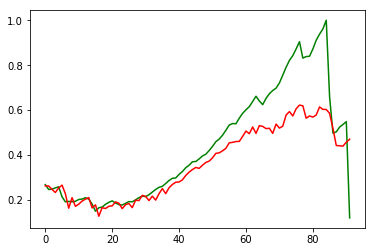

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-15:54:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-52000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-15:54:10
INFO:tensorflow:Saving dict for global step 52000: global_step = 52000, loss = 0.018352807
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 52000: ./outputdir/model.ckpt-52000
error on testset first run {'loss': 0.018352807, 'global_step': 52000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-52000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Gr

INFO:tensorflow:global_step/sec: 431.49
INFO:tensorflow:loss = 0.00067190686, step = 56701 (0.232 sec)
INFO:tensorflow:global_step/sec: 468.703
INFO:tensorflow:loss = 0.00031380774, step = 56801 (0.214 sec)
INFO:tensorflow:global_step/sec: 448.035
INFO:tensorflow:loss = 0.0011330233, step = 56901 (0.223 sec)
INFO:tensorflow:global_step/sec: 424.238
INFO:tensorflow:loss = 0.00017711685, step = 57001 (0.236 sec)
INFO:tensorflow:global_step/sec: 404.192
INFO:tensorflow:loss = 2.2216573e-05, step = 57101 (0.247 sec)
INFO:tensorflow:global_step/sec: 407.009
INFO:tensorflow:loss = 0.0010186553, step = 57201 (0.246 sec)
INFO:tensorflow:global_step/sec: 447.179
INFO:tensorflow:loss = 0.0002610593, step = 57301 (0.223 sec)
INFO:tensorflow:global_step/sec: 429.516
INFO:tensorflow:loss = 0.0004951446, step = 57401 (0.233 sec)
INFO:tensorflow:global_step/sec: 409.8
INFO:tensorflow:loss = 0.0009623615, step = 57501 (0.245 sec)
INFO:tensorflow:global_step/sec: 409.661
INFO:tensorflow:loss = 0.000420

INFO:tensorflow:global_step/sec: 167.009
INFO:tensorflow:loss = 0.00047091435, step = 62101 (0.600 sec)
INFO:tensorflow:global_step/sec: 438.768
INFO:tensorflow:loss = 0.0011285977, step = 62201 (0.228 sec)
INFO:tensorflow:global_step/sec: 433.118
INFO:tensorflow:loss = 0.00032569762, step = 62301 (0.230 sec)
INFO:tensorflow:global_step/sec: 424.356
INFO:tensorflow:loss = 0.0005114066, step = 62401 (0.236 sec)
INFO:tensorflow:global_step/sec: 433.591
INFO:tensorflow:loss = 0.00042716254, step = 62501 (0.231 sec)
INFO:tensorflow:global_step/sec: 319.887
INFO:tensorflow:loss = 0.0007364772, step = 62601 (0.314 sec)
INFO:tensorflow:global_step/sec: 396.594
INFO:tensorflow:loss = 0.00030729338, step = 62701 (0.251 sec)
INFO:tensorflow:global_step/sec: 447.602
INFO:tensorflow:loss = 0.0003257342, step = 62801 (0.224 sec)
INFO:tensorflow:global_step/sec: 437.557
INFO:tensorflow:loss = 0.00010672043, step = 62901 (0.228 sec)
INFO:tensorflow:global_step/sec: 451.936
INFO:tensorflow:loss = 6.91

INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.00012339706764468895
prediction at  8 [array([0.5762137])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-68000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 68000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.4135385e-06, step = 68001
INFO:tensorflow:global_step/sec: 161.096
INFO:tensorflow:loss = 2.5942072e-05, step = 68101 (0.623 sec)
INFO:tensorflow:global_step/sec: 365.135
INFO:tensorflow:loss = 0.00048376727, step = 68201 (0.273 sec)
INFO:tensorflow:global_step/sec: 345.961
INFO:tensorflow:loss = 5.5674696e-05, step = 68301 (0.289 sec)
INFO:tensorflow:global_step/sec: 367.25
INFO:

INFO:tensorflow:global_step/sec: 445.835
INFO:tensorflow:loss = 0.00021850434, step = 73701 (0.224 sec)
INFO:tensorflow:global_step/sec: 435.377
INFO:tensorflow:loss = 0.00038743234, step = 73801 (0.230 sec)
INFO:tensorflow:global_step/sec: 472.277
INFO:tensorflow:loss = 0.00031762678, step = 73901 (0.212 sec)
INFO:tensorflow:Saving checkpoints for 74000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.4837306e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-74000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 0.0001346607738740786
prediction at  11 [array([0.57861142])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorfl

INFO:tensorflow:loss = 1.5594023e-05, step = 79001 (0.233 sec)
INFO:tensorflow:global_step/sec: 432.993
INFO:tensorflow:loss = 0.00011699054, step = 79101 (0.231 sec)
INFO:tensorflow:global_step/sec: 393.108
INFO:tensorflow:loss = 0.0026923572, step = 79201 (0.254 sec)
INFO:tensorflow:global_step/sec: 438.887
INFO:tensorflow:loss = 0.0005525118, step = 79301 (0.228 sec)
INFO:tensorflow:global_step/sec: 431.625
INFO:tensorflow:loss = 0.00027622574, step = 79401 (0.232 sec)
INFO:tensorflow:global_step/sec: 427.438
INFO:tensorflow:loss = 1.103492e-06, step = 79501 (0.234 sec)
INFO:tensorflow:global_step/sec: 436.658
INFO:tensorflow:loss = 7.192982e-05, step = 79601 (0.229 sec)
INFO:tensorflow:global_step/sec: 333.002
INFO:tensorflow:loss = 0.0002759207, step = 79701 (0.300 sec)
INFO:tensorflow:global_step/sec: 443.641
INFO:tensorflow:loss = 0.00024374218, step = 79801 (0.225 sec)
INFO:tensorflow:global_step/sec: 437.794
INFO:tensorflow:loss = 3.827924e-05, step = 79901 (0.229 sec)
INFO:te

INFO:tensorflow:global_step/sec: 446.094
INFO:tensorflow:loss = 1.8439277e-06, step = 84401 (0.224 sec)
INFO:tensorflow:global_step/sec: 445.75
INFO:tensorflow:loss = 0.00016571398, step = 84501 (0.224 sec)
INFO:tensorflow:global_step/sec: 443.455
INFO:tensorflow:loss = 2.2733375e-06, step = 84601 (0.226 sec)
INFO:tensorflow:global_step/sec: 424.647
INFO:tensorflow:loss = 0.00015753982, step = 84701 (0.235 sec)
INFO:tensorflow:global_step/sec: 435.022
INFO:tensorflow:loss = 1.5703901e-05, step = 84801 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.74
INFO:tensorflow:loss = 0.00013722434, step = 84901 (0.227 sec)
INFO:tensorflow:global_step/sec: 451.51
INFO:tensorflow:loss = 2.3405096e-06, step = 85001 (0.222 sec)
INFO:tensorflow:global_step/sec: 444.891
INFO:tensorflow:loss = 0.0001659212, step = 85101 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.32
INFO:tensorflow:loss = 1.9224517e-05, step = 85201 (0.225 sec)
INFO:tensorflow:global_step/sec: 436.704
INFO:tensorflow:loss = 0.000

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-90000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 90000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00014218103, step = 90001
INFO:tensorflow:global_step/sec: 174.02
INFO:tensorflow:loss = 7.5269745e-05, step = 90101 (0.576 sec)
INFO:tensorflow:global_step/sec: 461.727
INFO:tensorflow:loss = 6.0053793e-05, step = 90201 (0.216 sec)
INFO:tensorflow:global_step/sec: 450.095
INFO:tensorflow:loss = 9.604734e-05, step = 90301 (0.223 sec)
INFO:tensorflow:global_step/sec: 438.868
INFO:tensorflow:loss = 9.0525915e-05, step = 90401 (0.227 sec)
INFO:tensorflow:global_step/sec: 424.83
INFO:tensorflow:loss = 7.403685e-05, step = 90501 (0.235 sec)
INFO:tensorflow:global_step/sec: 431.568
INFO:tensorflow:loss = 6.0001148e-05, step = 90601 (0.232 sec)
INFO:tensorflow:glob

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-94000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 94000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0023569125, step = 94001
INFO:tensorflow:global_step/sec: 166.716
INFO:tensorflow:loss = 1.6468281e-06, step = 94101 (0.601 sec)
INFO:tensorflow:global_step/sec: 442.654
INFO:tensorflow:loss = 0.00010466397, step = 94201 (0.226 sec)
INFO:tensorflow:global_step/sec: 443.622
INFO:tensorflow:loss = 0.00028967185, step = 94301 (0.225 sec)
INFO:tensorflow:global_step/sec: 432.723
INFO:tensorflow:loss = 5.6437802e-05, step = 94401 (0.231 sec)
INFO:tensorflow:global_step/sec: 423.709
INFO:tensorflow:loss = 0.00011231137, step = 94501 (0.236 sec)
INFO:tensorflow:global_step/sec: 419.454
INFO:tensorflow:loss = 3.493772e-05, step

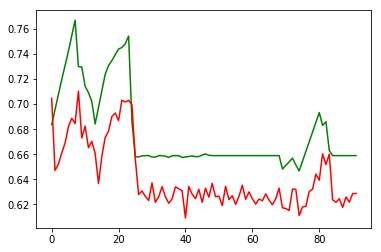

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-15:57:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-96000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-15:57:05
INFO:tensorflow:Saving dict for global step 96000: global_step = 96000, loss = 0.0014555976
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 96000: ./outputdir/model.ckpt-96000
error on testset first run {'loss': 0.0014555976, 'global_step': 96000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-96000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:

INFO:tensorflow:global_step/sec: 389.682
INFO:tensorflow:loss = 0.00026423152, step = 100701 (0.257 sec)
INFO:tensorflow:global_step/sec: 426.299
INFO:tensorflow:loss = 3.25418e-06, step = 100801 (0.235 sec)
INFO:tensorflow:global_step/sec: 450.197
INFO:tensorflow:loss = 0.0003357456, step = 100901 (0.222 sec)
INFO:tensorflow:global_step/sec: 446.132
INFO:tensorflow:loss = 7.087817e-05, step = 101001 (0.224 sec)
INFO:tensorflow:global_step/sec: 449.626
INFO:tensorflow:loss = 9.967463e-05, step = 101101 (0.223 sec)
INFO:tensorflow:global_step/sec: 432.97
INFO:tensorflow:loss = 8.3061146e-05, step = 101201 (0.230 sec)
INFO:tensorflow:global_step/sec: 439.8
INFO:tensorflow:loss = 2.3330655e-05, step = 101301 (0.228 sec)
INFO:tensorflow:global_step/sec: 441.753
INFO:tensorflow:loss = 3.9280658e-07, step = 101401 (0.226 sec)
INFO:tensorflow:global_step/sec: 439.928
INFO:tensorflow:loss = 0.00011453055, step = 101501 (0.227 sec)
INFO:tensorflow:global_step/sec: 440.824
INFO:tensorflow:loss =

INFO:tensorflow:loss = 2.376683e-05, step = 106001
INFO:tensorflow:global_step/sec: 168.067
INFO:tensorflow:loss = 1.5708625e-05, step = 106101 (0.596 sec)
INFO:tensorflow:global_step/sec: 462.378
INFO:tensorflow:loss = 1.4647591e-06, step = 106201 (0.216 sec)
INFO:tensorflow:global_step/sec: 451.555
INFO:tensorflow:loss = 0.0002534952, step = 106301 (0.221 sec)
INFO:tensorflow:global_step/sec: 439.82
INFO:tensorflow:loss = 7.803858e-05, step = 106401 (0.227 sec)
INFO:tensorflow:global_step/sec: 438.617
INFO:tensorflow:loss = 2.4962114e-06, step = 106501 (0.228 sec)
INFO:tensorflow:global_step/sec: 428.852
INFO:tensorflow:loss = 1.5934329e-05, step = 106601 (0.233 sec)
INFO:tensorflow:global_step/sec: 420.865
INFO:tensorflow:loss = 5.0911258e-05, step = 106701 (0.237 sec)
INFO:tensorflow:global_step/sec: 418.898
INFO:tensorflow:loss = 6.5350973e-06, step = 106801 (0.239 sec)
INFO:tensorflow:global_step/sec: 427.952
INFO:tensorflow:loss = 4.2604926e-05, step = 106901 (0.234 sec)
INFO:te

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-112000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.4197567684546994e-09
prediction at  8 [array([0.6303726])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-112000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 112000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.2086972e-06, step = 112001
INFO:tensorflow:global_step/sec: 166.927
INFO:tensorflow:loss = 2.7187409e-05, step = 112101 (0.600 sec)
INFO:tensorflow:global_step/sec: 456.325
INFO:tensorflow:loss = 1.3630006e-06, step = 112201 (0.219 s

INFO:tensorflow:global_step/sec: 423.881
INFO:tensorflow:loss = 4.362956e-05, step = 117501 (0.236 sec)
INFO:tensorflow:global_step/sec: 429.72
INFO:tensorflow:loss = 9.687041e-05, step = 117601 (0.232 sec)
INFO:tensorflow:global_step/sec: 426.933
INFO:tensorflow:loss = 4.755433e-06, step = 117701 (0.234 sec)
INFO:tensorflow:global_step/sec: 427.097
INFO:tensorflow:loss = 2.7150749e-05, step = 117801 (0.234 sec)
INFO:tensorflow:global_step/sec: 426.564
INFO:tensorflow:loss = 0.00016423946, step = 117901 (0.234 sec)
INFO:tensorflow:Saving checkpoints for 118000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.2741347e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-118000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 2.214893065653737e-05
prediction at  11 [array([0.62544545])]
da

INFO:tensorflow:global_step/sec: 428.848
INFO:tensorflow:loss = 6.4397577e-06, step = 122801 (0.234 sec)
INFO:tensorflow:global_step/sec: 433.184
INFO:tensorflow:loss = 0.00019289977, step = 122901 (0.231 sec)
INFO:tensorflow:global_step/sec: 447.762
INFO:tensorflow:loss = 0.00013974807, step = 123001 (0.224 sec)
INFO:tensorflow:global_step/sec: 439.775
INFO:tensorflow:loss = 4.207514e-05, step = 123101 (0.227 sec)
INFO:tensorflow:global_step/sec: 442.662
INFO:tensorflow:loss = 0.000104760344, step = 123201 (0.226 sec)
INFO:tensorflow:global_step/sec: 437.08
INFO:tensorflow:loss = 2.7875165e-06, step = 123301 (0.228 sec)
INFO:tensorflow:global_step/sec: 440.255
INFO:tensorflow:loss = 6.6007815e-06, step = 123401 (0.228 sec)
INFO:tensorflow:global_step/sec: 441.235
INFO:tensorflow:loss = 7.016934e-06, step = 123501 (0.226 sec)
INFO:tensorflow:global_step/sec: 432.578
INFO:tensorflow:loss = 3.5157907e-05, step = 123601 (0.231 sec)
INFO:tensorflow:global_step/sec: 435.866
INFO:tensorflow:

INFO:tensorflow:global_step/sec: 165.892
INFO:tensorflow:loss = 5.0588547e-05, step = 128101 (0.604 sec)
INFO:tensorflow:global_step/sec: 447.587
INFO:tensorflow:loss = 1.095492e-06, step = 128201 (0.223 sec)
INFO:tensorflow:global_step/sec: 457.628
INFO:tensorflow:loss = 8.57553e-05, step = 128301 (0.219 sec)
INFO:tensorflow:global_step/sec: 433.131
INFO:tensorflow:loss = 2.0327434e-08, step = 128401 (0.231 sec)
INFO:tensorflow:global_step/sec: 423.402
INFO:tensorflow:loss = 5.186064e-05, step = 128501 (0.236 sec)
INFO:tensorflow:global_step/sec: 422.749
INFO:tensorflow:loss = 3.4693642e-07, step = 128601 (0.236 sec)
INFO:tensorflow:global_step/sec: 420.471
INFO:tensorflow:loss = 8.225912e-05, step = 128701 (0.238 sec)
INFO:tensorflow:global_step/sec: 411.551
INFO:tensorflow:loss = 2.559133e-06, step = 128801 (0.243 sec)
INFO:tensorflow:global_step/sec: 403.229
INFO:tensorflow:loss = 0.00010159759, step = 128901 (0.248 sec)
INFO:tensorflow:global_step/sec: 406.608
INFO:tensorflow:loss

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 8.320579499437663e-06
prediction at  19 [array([0.62822378])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-134000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 134000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.860031e-06, step = 134001
INFO:tensorflow:global_step/sec: 163.805
INFO:tensorflow:loss = 1.3184563e-05, step = 134101 (0.611 sec)
INFO:tensorflow:global_step/sec: 459.348
INFO:tensorflow:loss = 1.5823172e-05, step = 134201 (0.218 sec)
INFO:tensorflow:global_step/sec: 440.079
INFO:tensorflow:loss = 4.5573597e-05, step = 134301 (0.227 sec)

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-138000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 138000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.065908484, step = 138001
INFO:tensorflow:global_step/sec: 165.516
INFO:tensorflow:loss = 0.00014656321, step = 138101 (0.605 sec)
INFO:tensorflow:global_step/sec: 450.031
INFO:tensorflow:loss = 0.0836342, step = 138201 (0.222 sec)
INFO:tensorflow:global_step/sec: 429.152
INFO:tensorflow:loss = 0.002204252, step = 138301 (0.233 sec)
INFO:tensorflow:global_step/sec: 399.15
INFO:tensorflow:loss = 3.1815318e-05, step = 138401 (0.251 sec)
INFO:tensorflow:global_step/sec: 434.379
INFO:tensorflow:loss = 0.0004969872, step = 138501 (0.229 sec)
INFO:tensorflow:global_step/sec: 438.954
INFO:tensorflow:loss = 0.00055656815, step

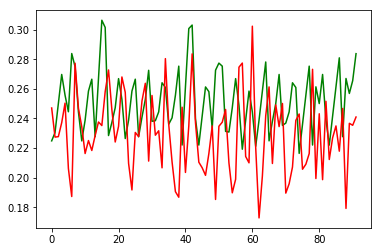

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-15:59:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-140000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-15:59:59
INFO:tensorflow:Saving dict for global step 140000: global_step = 140000, loss = 0.0013633369
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 140000: ./outputdir/model.ckpt-140000
error on testset first run {'loss': 0.0013633369, 'global_step': 140000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-140000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:loss = 5.4484324e-05, step = 144601 (0.243 sec)
INFO:tensorflow:global_step/sec: 410.514
INFO:tensorflow:loss = 0.00073432585, step = 144701 (0.244 sec)
INFO:tensorflow:global_step/sec: 414.391
INFO:tensorflow:loss = 2.4404368e-05, step = 144801 (0.241 sec)
INFO:tensorflow:global_step/sec: 424.511
INFO:tensorflow:loss = 0.00070579426, step = 144901 (0.236 sec)
INFO:tensorflow:global_step/sec: 425.228
INFO:tensorflow:loss = 0.000539894, step = 145001 (0.235 sec)
INFO:tensorflow:global_step/sec: 423.168
INFO:tensorflow:loss = 1.1727883e-05, step = 145101 (0.236 sec)
INFO:tensorflow:global_step/sec: 430.329
INFO:tensorflow:loss = 9.1437556e-05, step = 145201 (0.232 sec)
INFO:tensorflow:global_step/sec: 429.96
INFO:tensorflow:loss = 0.00012440397, step = 145301 (0.233 sec)
INFO:tensorflow:global_step/sec: 412.135
INFO:tensorflow:loss = 0.0011491539, step = 145401 (0.242 sec)
INFO:tensorflow:global_step/sec: 398.835
INFO:tensorflow:loss = 3.9895698e-05, step = 145501 (0.251 

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 150000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.004570926, step = 150001
INFO:tensorflow:global_step/sec: 143.155
INFO:tensorflow:loss = 3.6903482e-06, step = 150101 (0.700 sec)
INFO:tensorflow:global_step/sec: 409.048
INFO:tensorflow:loss = 0.00014567375, step = 150201 (0.244 sec)
INFO:tensorflow:global_step/sec: 441.047
INFO:tensorflow:loss = 0.0008557462, step = 150301 (0.227 sec)
INFO:tensorflow:global_step/sec: 432.875
INFO:tensorflow:loss = 0.00011561656, step = 150401 (0.231 sec)
INFO:tensorflow:global_step/sec: 416.579
INFO:tensorflow:loss = 1.6985528e-06, step = 150501 (0.240 sec)
INFO:tensorflow:global_step/sec: 436.932
INFO:tensorflow:loss = 0.0011931298, step = 150601 (0.229 sec)
INFO:tensorflow:global_step/sec: 413.456
INFO:tensorflow:loss = 0.0003300319, step = 150701 (0.242 sec)
INFO:tensorflow:global_step/sec: 398.541
INFO:tensorflow:loss = 4.4557037e-06, step = 150801 (0.251

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-156000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 6.251619098873407e-08
prediction at  8 [array([0.22719901])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-156000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 156000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.170731e-05, step = 156001
INFO:tensorflow:global_step/sec: 132.848
INFO:tensorflow:loss = 0.0004427628, step = 156101 (0.754 sec)
INFO:tensorflow:global_step/se

INFO:tensorflow:loss = 8.967521e-06, step = 161401 (0.305 sec)
INFO:tensorflow:global_step/sec: 333.758
INFO:tensorflow:loss = 0.00024684987, step = 161501 (0.300 sec)
INFO:tensorflow:global_step/sec: 326.562
INFO:tensorflow:loss = 5.0899136e-05, step = 161601 (0.306 sec)
INFO:tensorflow:global_step/sec: 330.912
INFO:tensorflow:loss = 0.00094126613, step = 161701 (0.301 sec)
INFO:tensorflow:global_step/sec: 326.335
INFO:tensorflow:loss = 0.001778015, step = 161801 (0.307 sec)
INFO:tensorflow:global_step/sec: 345.346
INFO:tensorflow:loss = 0.000672015, step = 161901 (0.289 sec)
INFO:tensorflow:Saving checkpoints for 162000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00015061772.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-162000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 1

INFO:tensorflow:loss = 0.00061764894, step = 166701 (0.242 sec)
INFO:tensorflow:global_step/sec: 406.997
INFO:tensorflow:loss = 0.00027967192, step = 166801 (0.246 sec)
INFO:tensorflow:global_step/sec: 406.974
INFO:tensorflow:loss = 0.0013989076, step = 166901 (0.246 sec)
INFO:tensorflow:global_step/sec: 397.174
INFO:tensorflow:loss = 3.3434204e-05, step = 167001 (0.252 sec)
INFO:tensorflow:global_step/sec: 394.126
INFO:tensorflow:loss = 0.00021431835, step = 167101 (0.254 sec)
INFO:tensorflow:global_step/sec: 409.174
INFO:tensorflow:loss = 5.289151e-06, step = 167201 (0.245 sec)
INFO:tensorflow:global_step/sec: 412.226
INFO:tensorflow:loss = 3.291239e-05, step = 167301 (0.242 sec)
INFO:tensorflow:global_step/sec: 412.504
INFO:tensorflow:loss = 0.0010972093, step = 167401 (0.243 sec)
INFO:tensorflow:global_step/sec: 420.719
INFO:tensorflow:loss = 0.00092040986, step = 167501 (0.238 sec)
INFO:tensorflow:global_step/sec: 404.737
INFO:tensorflow:loss = 0.0015613649, step = 167601 (0.247 s

INFO:tensorflow:loss = 0.00071284414, step = 172001
INFO:tensorflow:global_step/sec: 162.412
INFO:tensorflow:loss = 0.00069460477, step = 172101 (0.617 sec)
INFO:tensorflow:global_step/sec: 430.154
INFO:tensorflow:loss = 0.0008406154, step = 172201 (0.232 sec)
INFO:tensorflow:global_step/sec: 425.333
INFO:tensorflow:loss = 0.0006387891, step = 172301 (0.235 sec)
INFO:tensorflow:global_step/sec: 439.972
INFO:tensorflow:loss = 0.00095011014, step = 172401 (0.228 sec)
INFO:tensorflow:global_step/sec: 425.76
INFO:tensorflow:loss = 0.00078798446, step = 172501 (0.234 sec)
INFO:tensorflow:global_step/sec: 423.108
INFO:tensorflow:loss = 0.00040643598, step = 172601 (0.236 sec)
INFO:tensorflow:global_step/sec: 418.808
INFO:tensorflow:loss = 0.0008468517, step = 172701 (0.239 sec)
INFO:tensorflow:global_step/sec: 427.981
INFO:tensorflow:loss = 0.00093395106, step = 172801 (0.234 sec)
INFO:tensorflow:global_step/sec: 402.088
INFO:tensorflow:loss = 0.0004944611, step = 172901 (0.249 sec)
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-178000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.036608621093701e-06
prediction at  19 [array([0.22334994])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-178000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 178000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00040857232, step = 178001
INFO:tensorflow:global_step/sec: 166.565
INFO:tensorflow:loss = 0.0005179588, step = 178101 (0.601 sec)
INFO:tensorflow:global_step/sec: 422.565
INFO:tensorflow:loss = 0.00059550523, step = 178201 (0.236 sec)
INFO:tensorflow:global_step/sec:

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-182000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 182000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.016918236, step = 182001
INFO:tensorflow:global_step/sec: 161.246
INFO:tensorflow:loss = 1.443484e-06, step = 182101 (0.621 sec)
INFO:tensorflow:global_step/sec: 441.355
INFO:tensorflow:loss = 0.001329076, step = 182201 (0.227 sec)
INFO:tensorflow:global_step/sec: 436.04
INFO:tensorflow:loss = 1.1318477e-06, step = 182301 (0.230 sec)
INFO:tensorflow:global_step/sec: 455.276
INFO:tensorflow:loss = 1.5882321e-06, step = 182401 (0.219 sec)
INFO:tensorflow:global_step/sec: 436.662
INFO:tensorflow:loss = 8.004587e-05, step = 182501 (0.229 sec)
INFO:tensorflow:global_step/sec: 444.63
INFO:tensorflow:loss = 0.013023988, step

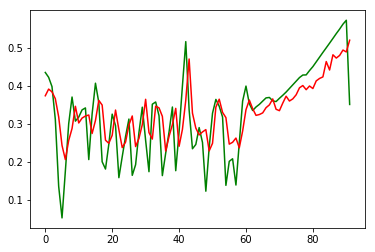

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:03:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-184000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:03:08
INFO:tensorflow:Saving dict for global step 184000: global_step = 184000, loss = 0.0056307935
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 184000: ./outputdir/model.ckpt-184000
error on testset first run {'loss': 0.0056307935, 'global_step': 184000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-184000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:loss = 0.00024944977, step = 188601 (0.245 sec)
INFO:tensorflow:global_step/sec: 401.099
INFO:tensorflow:loss = 1.00817e-05, step = 188701 (0.249 sec)
INFO:tensorflow:global_step/sec: 435.915
INFO:tensorflow:loss = 0.00015162925, step = 188801 (0.229 sec)
INFO:tensorflow:global_step/sec: 331.32
INFO:tensorflow:loss = 0.00015798002, step = 188901 (0.302 sec)
INFO:tensorflow:global_step/sec: 445.426
INFO:tensorflow:loss = 0.00071013416, step = 189001 (0.224 sec)
INFO:tensorflow:global_step/sec: 435.08
INFO:tensorflow:loss = 1.0488649e-05, step = 189101 (0.230 sec)
INFO:tensorflow:global_step/sec: 436.784
INFO:tensorflow:loss = 0.00030242497, step = 189201 (0.229 sec)
INFO:tensorflow:global_step/sec: 331.032
INFO:tensorflow:loss = 0.00012283964, step = 189301 (0.302 sec)
INFO:tensorflow:global_step/sec: 431.996
INFO:tensorflow:loss = 8.363248e-06, step = 189401 (0.231 sec)
INFO:tensorflow:global_step/sec: 421.836
INFO:tensorflow:loss = 0.0013219452, step = 189501 (0.237 se

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 194000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0006977895, step = 194001
INFO:tensorflow:global_step/sec: 165.266
INFO:tensorflow:loss = 0.00010051426, step = 194101 (0.606 sec)
INFO:tensorflow:global_step/sec: 431.684
INFO:tensorflow:loss = 0.00020507224, step = 194201 (0.232 sec)
INFO:tensorflow:global_step/sec: 435.472
INFO:tensorflow:loss = 1.8527167e-05, step = 194301 (0.230 sec)
INFO:tensorflow:global_step/sec: 442.397
INFO:tensorflow:loss = 0.000696628, step = 194401 (0.226 sec)
INFO:tensorflow:global_step/sec: 443.149
INFO:tensorflow:loss = 9.574499e-05, step = 194501 (0.226 sec)
INFO:tensorflow:global_step/sec: 433.086
INFO:tensorflow:loss = 2.7540047e-05, step = 194601 (0.231 sec)
INFO:tensorflow:global_step/sec: 433.787
INFO:tensorflow:loss = 4.192796e-05, step = 194701 (0.231 sec)
INFO:tensorflow:global_step/sec: 436.026
INFO:tensorflow:loss = 0.00013043027, step = 194801 (0.229

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-200000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.397604913986312e-05
prediction at  8 [array([0.37713321])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-200000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 200000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00013089835, step = 200001
INFO:tensorflow:global_step/sec: 143.865
INFO:tensorflow:loss = 0.0006626549, step = 200101 (0.696 sec)
INFO:tensorflow:global_step/s

INFO:tensorflow:loss = 0.000118484524, step = 205401 (0.279 sec)
INFO:tensorflow:global_step/sec: 382.779
INFO:tensorflow:loss = 0.00061233947, step = 205501 (0.262 sec)
INFO:tensorflow:global_step/sec: 363.655
INFO:tensorflow:loss = 0.000431838, step = 205601 (0.275 sec)
INFO:tensorflow:global_step/sec: 362.348
INFO:tensorflow:loss = 2.3978842e-05, step = 205701 (0.275 sec)
INFO:tensorflow:global_step/sec: 365.066
INFO:tensorflow:loss = 9.215854e-07, step = 205801 (0.274 sec)
INFO:tensorflow:global_step/sec: 363.264
INFO:tensorflow:loss = 8.3622695e-07, step = 205901 (0.275 sec)
INFO:tensorflow:Saving checkpoints for 206000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.3146647e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-206000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  1

INFO:tensorflow:loss = 1.1778867e-07, step = 210701 (0.254 sec)
INFO:tensorflow:global_step/sec: 423.228
INFO:tensorflow:loss = 2.345837e-05, step = 210801 (0.236 sec)
INFO:tensorflow:global_step/sec: 413.302
INFO:tensorflow:loss = 0.00012286079, step = 210901 (0.242 sec)
INFO:tensorflow:global_step/sec: 410.036
INFO:tensorflow:loss = 8.85822e-05, step = 211001 (0.244 sec)
INFO:tensorflow:global_step/sec: 401.693
INFO:tensorflow:loss = 9.579283e-07, step = 211101 (0.249 sec)
INFO:tensorflow:global_step/sec: 386.296
INFO:tensorflow:loss = 0.0006367991, step = 211201 (0.258 sec)
INFO:tensorflow:global_step/sec: 366.173
INFO:tensorflow:loss = 3.1425182e-07, step = 211301 (0.273 sec)
INFO:tensorflow:global_step/sec: 358.164
INFO:tensorflow:loss = 3.2997763e-05, step = 211401 (0.279 sec)
INFO:tensorflow:global_step/sec: 336.378
INFO:tensorflow:loss = 0.00011851632, step = 211501 (0.298 sec)
INFO:tensorflow:global_step/sec: 355.17
INFO:tensorflow:loss = 5.4186e-05, step = 211601 (0.281 sec)


INFO:tensorflow:loss = 0.00021087943, step = 216001
INFO:tensorflow:global_step/sec: 152.562
INFO:tensorflow:loss = 1.7026929e-05, step = 216101 (0.656 sec)
INFO:tensorflow:global_step/sec: 423.977
INFO:tensorflow:loss = 0.0002505911, step = 216201 (0.236 sec)
INFO:tensorflow:global_step/sec: 380.717
INFO:tensorflow:loss = 9.161779e-06, step = 216301 (0.263 sec)
INFO:tensorflow:global_step/sec: 380.676
INFO:tensorflow:loss = 0.00028215544, step = 216401 (0.262 sec)
INFO:tensorflow:global_step/sec: 433.396
INFO:tensorflow:loss = 2.1981765e-05, step = 216501 (0.231 sec)
INFO:tensorflow:global_step/sec: 455.56
INFO:tensorflow:loss = 0.00031909227, step = 216601 (0.219 sec)
INFO:tensorflow:global_step/sec: 422.333
INFO:tensorflow:loss = 9.063897e-06, step = 216701 (0.237 sec)
INFO:tensorflow:global_step/sec: 430.791
INFO:tensorflow:loss = 6.165138e-05, step = 216801 (0.232 sec)
INFO:tensorflow:global_step/sec: 365.62
INFO:tensorflow:loss = 2.5523912e-05, step = 216901 (0.274 sec)
INFO:tens

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-222000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 8.784870087305893e-07
prediction at  19 [array([0.38807016])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-222000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 222000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00013914275, step = 222001
INFO:tensorflow:global_step/sec: 138.972
INFO:tensorflow:loss = 1.4964529e-06, step = 222101 (0.721 sec)
INFO:tensorflow:global_step/sec: 394.266
INFO:tensorflow:loss = 1.08900736e-07, step = 222201 (0.253 sec)
INFO:tensorflow:global_step/se

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-226000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 226000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.0591409, step = 226001
INFO:tensorflow:global_step/sec: 135.799
INFO:tensorflow:loss = 0.0003894294, step = 226101 (0.737 sec)
INFO:tensorflow:global_step/sec: 391.302
INFO:tensorflow:loss = 0.00011880395, step = 226201 (0.255 sec)
INFO:tensorflow:global_step/sec: 388.22
INFO:tensorflow:loss = 0.008968786, step = 226301 (0.259 sec)
INFO:tensorflow:global_step/sec: 375.138
INFO:tensorflow:loss = 0.00023131064, step = 226401 (0.266 sec)
INFO:tensorflow:global_step/sec: 370.65
INFO:tensorflow:loss = 0.001762508, step = 226501 (0.269 sec)
INFO:tensorflow:global_step/sec: 352.453
INFO:tensorflow:loss = 0.0003341682, step =

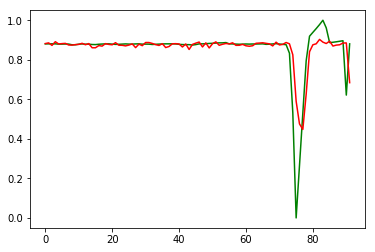

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:06:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-228000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:06:19
INFO:tensorflow:Saving dict for global step 228000: global_step = 228000, loss = 0.008647539
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 228000: ./outputdir/model.ckpt-228000
error on testset first run {'loss': 0.008647539, 'global_step': 228000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-228000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:global_step/sec: 397.322
INFO:tensorflow:loss = 0.009939734, step = 232701 (0.252 sec)
INFO:tensorflow:global_step/sec: 394.008
INFO:tensorflow:loss = 5.236924e-05, step = 232801 (0.254 sec)
INFO:tensorflow:global_step/sec: 402.875
INFO:tensorflow:loss = 0.022815607, step = 232901 (0.247 sec)
INFO:tensorflow:global_step/sec: 411.527
INFO:tensorflow:loss = 0.0007660361, step = 233001 (0.243 sec)
INFO:tensorflow:global_step/sec: 387.529
INFO:tensorflow:loss = 0.000395558, step = 233101 (0.258 sec)
INFO:tensorflow:global_step/sec: 376.585
INFO:tensorflow:loss = 0.00024339241, step = 233201 (0.265 sec)
INFO:tensorflow:global_step/sec: 398.381
INFO:tensorflow:loss = 1.0085674e-05, step = 233301 (0.251 sec)
INFO:tensorflow:global_step/sec: 401.381
INFO:tensorflow:loss = 0.00014667652, step = 233401 (0.249 sec)
INFO:tensorflow:global_step/sec: 393.526
INFO:tensorflow:loss = 0.00081940496, step = 233501 (0.254 sec)
INFO:tensorflow:global_step/sec: 379.108
INFO:tensorflow:loss =

INFO:tensorflow:loss = 9.010787e-05, step = 238001
INFO:tensorflow:global_step/sec: 167.227
INFO:tensorflow:loss = 0.00011307446, step = 238101 (0.599 sec)
INFO:tensorflow:global_step/sec: 454.604
INFO:tensorflow:loss = 0.00054624456, step = 238201 (0.221 sec)
INFO:tensorflow:global_step/sec: 447.432
INFO:tensorflow:loss = 0.0064613456, step = 238301 (0.223 sec)
INFO:tensorflow:global_step/sec: 430.589
INFO:tensorflow:loss = 0.0009241116, step = 238401 (0.232 sec)
INFO:tensorflow:global_step/sec: 422.098
INFO:tensorflow:loss = 9.6081225e-05, step = 238501 (0.237 sec)
INFO:tensorflow:global_step/sec: 398.869
INFO:tensorflow:loss = 0.00017640521, step = 238601 (0.251 sec)
INFO:tensorflow:global_step/sec: 421.336
INFO:tensorflow:loss = 0.005343562, step = 238701 (0.237 sec)
INFO:tensorflow:global_step/sec: 437.913
INFO:tensorflow:loss = 0.0020175893, step = 238801 (0.228 sec)
INFO:tensorflow:global_step/sec: 393.304
INFO:tensorflow:loss = 0.001139521, step = 238901 (0.254 sec)
INFO:tensor

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-244000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.0004989858484487338
prediction at  8 [array([0.82987551])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-244000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 244000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00035604526, step = 244001
INFO:tensorflow:global_step/sec: 155.288
INFO:tensorflow:loss = 0.0024578136, step = 244101 (0.645 sec)
INFO:tensorflow:global_step/sec: 424.575
INFO:tensorflow:loss = 0.00074853166, step = 244201 (0.235 sec)
INFO:tensorflow:global_step/sec: 4

INFO:tensorflow:global_step/sec: 387.015
INFO:tensorflow:loss = 0.0008794284, step = 249601 (0.258 sec)
INFO:tensorflow:global_step/sec: 388.226
INFO:tensorflow:loss = 0.0007174084, step = 249701 (0.258 sec)
INFO:tensorflow:global_step/sec: 356.148
INFO:tensorflow:loss = 0.049380857, step = 249801 (0.281 sec)
INFO:tensorflow:global_step/sec: 386.75
INFO:tensorflow:loss = 0.00055685086, step = 249901 (0.258 sec)
INFO:tensorflow:Saving checkpoints for 250000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.6755596e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-250000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 1.789952732472963e-05
prediction at  11 [array([0.79654588])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling m

INFO:tensorflow:loss = 0.00049996015, step = 254901 (0.338 sec)
INFO:tensorflow:global_step/sec: 305.392
INFO:tensorflow:loss = 0.0013907203, step = 255001 (0.329 sec)
INFO:tensorflow:global_step/sec: 326.111
INFO:tensorflow:loss = 0.0021865666, step = 255101 (0.305 sec)
INFO:tensorflow:global_step/sec: 316.173
INFO:tensorflow:loss = 0.0044795047, step = 255201 (0.317 sec)
INFO:tensorflow:global_step/sec: 354.296
INFO:tensorflow:loss = 0.0010881027, step = 255301 (0.282 sec)
INFO:tensorflow:global_step/sec: 303.18
INFO:tensorflow:loss = 0.010186704, step = 255401 (0.330 sec)
INFO:tensorflow:global_step/sec: 337.184
INFO:tensorflow:loss = 1.97587e-05, step = 255501 (0.296 sec)
INFO:tensorflow:global_step/sec: 321.94
INFO:tensorflow:loss = 0.038378034, step = 255601 (0.311 sec)
INFO:tensorflow:global_step/sec: 339.779
INFO:tensorflow:loss = 3.567971e-05, step = 255701 (0.294 sec)
INFO:tensorflow:global_step/sec: 350.058
INFO:tensorflow:loss = 0.00012327869, step = 255801 (0.285 sec)
INFO

INFO:tensorflow:global_step/sec: 425.985
INFO:tensorflow:loss = 0.0037631593, step = 260301 (0.235 sec)
INFO:tensorflow:global_step/sec: 409.645
INFO:tensorflow:loss = 0.005625016, step = 260401 (0.244 sec)
INFO:tensorflow:global_step/sec: 433.884
INFO:tensorflow:loss = 0.00085214333, step = 260501 (0.231 sec)
INFO:tensorflow:global_step/sec: 436.072
INFO:tensorflow:loss = 0.0069902632, step = 260601 (0.229 sec)
INFO:tensorflow:global_step/sec: 421.292
INFO:tensorflow:loss = 4.0234874e-05, step = 260701 (0.237 sec)
INFO:tensorflow:global_step/sec: 403.343
INFO:tensorflow:loss = 0.0062750806, step = 260801 (0.248 sec)
INFO:tensorflow:global_step/sec: 405.703
INFO:tensorflow:loss = 8.43355e-06, step = 260901 (0.247 sec)
INFO:tensorflow:global_step/sec: 378.982
INFO:tensorflow:loss = 0.0008495458, step = 261001 (0.264 sec)
INFO:tensorflow:global_step/sec: 383.787
INFO:tensorflow:loss = 0.0015266264, step = 261101 (0.261 sec)
INFO:tensorflow:global_step/sec: 359.259
INFO:tensorflow:loss = 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-266000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 266000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0006471697, step = 266001
INFO:tensorflow:global_step/sec: 159.948
INFO:tensorflow:loss = 0.000204361, step = 266101 (0.626 sec)
INFO:tensorflow:global_step/sec: 429.442
INFO:tensorflow:loss = 8.1131375e-06, step = 266201 (0.233 sec)
INFO:tensorflow:global_step/sec: 445.567
INFO:tensorflow:loss = 0.00089206756, step = 266301 (0.224 sec)
INFO:tensorflow:global_step/sec: 445.27
INFO:tensorflow:loss = 0.0022243466, step = 266401 (0.224 sec)
INFO:tensorflow:global_step/sec: 414.493
INFO:tensorflow:loss = 9.070237e-05, step = 266501 (0.243 sec)
INFO:tensorflow:global_step/sec: 404.58
INFO:tensorflow:loss = 9.519289e-07, st

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-270000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 270000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.019903, step = 270001
INFO:tensorflow:global_step/sec: 143.597
INFO:tensorflow:loss = 0.00021514669, step = 270101 (0.697 sec)
INFO:tensorflow:global_step/sec: 373.335
INFO:tensorflow:loss = 0.014599927, step = 270201 (0.268 sec)
INFO:tensorflow:global_step/sec: 387.858
INFO:tensorflow:loss = 0.00077707745, step = 270301 (0.258 sec)
INFO:tensorflow:global_step/sec: 394.292
INFO:tensorflow:loss = 0.0006343664, step = 270401 (0.255 sec)
INFO:tensorflow:global_step/sec: 359.338
INFO:tensorflow:loss = 0.0011401599, step = 270501 (0.278 sec)
INFO:tensorflow:global_step/sec: 363.115
INFO:tensorflow:loss = 8.64675e-05, step 

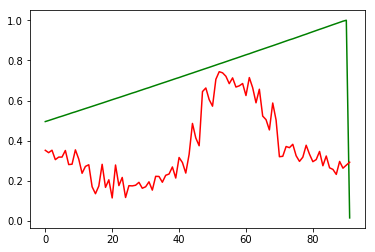

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:09:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-272000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:09:30
INFO:tensorflow:Saving dict for global step 272000: global_step = 272000, loss = 0.19503953
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 272000: ./outputdir/model.ckpt-272000
error on testset first run {'loss': 0.19503953, 'global_step': 272000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-272000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorfl

INFO:tensorflow:global_step/sec: 392.983
INFO:tensorflow:loss = 0.0037335167, step = 276701 (0.254 sec)
INFO:tensorflow:global_step/sec: 381.041
INFO:tensorflow:loss = 0.0033993057, step = 276801 (0.262 sec)
INFO:tensorflow:global_step/sec: 412.626
INFO:tensorflow:loss = 3.2669544e-05, step = 276901 (0.242 sec)
INFO:tensorflow:global_step/sec: 442.801
INFO:tensorflow:loss = 0.00057121436, step = 277001 (0.226 sec)
INFO:tensorflow:global_step/sec: 448.499
INFO:tensorflow:loss = 1.5592612e-05, step = 277101 (0.223 sec)
INFO:tensorflow:global_step/sec: 452.516
INFO:tensorflow:loss = 0.004021552, step = 277201 (0.221 sec)
INFO:tensorflow:global_step/sec: 407.611
INFO:tensorflow:loss = 0.0022023872, step = 277301 (0.246 sec)
INFO:tensorflow:global_step/sec: 401.577
INFO:tensorflow:loss = 0.009390953, step = 277401 (0.248 sec)
INFO:tensorflow:global_step/sec: 414.635
INFO:tensorflow:loss = 0.004596353, step = 277501 (0.241 sec)
INFO:tensorflow:global_step/sec: 424.955
INFO:tensorflow:loss = 

INFO:tensorflow:loss = 0.001732459, step = 282001
INFO:tensorflow:global_step/sec: 154.039
INFO:tensorflow:loss = 0.001936097, step = 282101 (0.650 sec)
INFO:tensorflow:global_step/sec: 414.424
INFO:tensorflow:loss = 0.0056214714, step = 282201 (0.242 sec)
INFO:tensorflow:global_step/sec: 374.253
INFO:tensorflow:loss = 0.0047339117, step = 282301 (0.267 sec)
INFO:tensorflow:global_step/sec: 377.101
INFO:tensorflow:loss = 0.0011733742, step = 282401 (0.266 sec)
INFO:tensorflow:global_step/sec: 379.917
INFO:tensorflow:loss = 0.007760993, step = 282501 (0.263 sec)
INFO:tensorflow:global_step/sec: 393.799
INFO:tensorflow:loss = 0.011747579, step = 282601 (0.254 sec)
INFO:tensorflow:global_step/sec: 386.058
INFO:tensorflow:loss = 0.011599243, step = 282701 (0.259 sec)
INFO:tensorflow:global_step/sec: 383.511
INFO:tensorflow:loss = 0.0034691186, step = 282801 (0.261 sec)
INFO:tensorflow:global_step/sec: 390.032
INFO:tensorflow:loss = 0.00014345965, step = 282901 (0.256 sec)
INFO:tensorflow:g

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.335213551192644e-05
prediction at  8 [array([0.39905905])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-288000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 288000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0019999365, step = 288001
INFO:tensorflow:global_step/sec: 165.456
INFO:tensorflow:loss = 0.0025757065, step = 288101 (0.605 sec)
INFO:tensorflow:global_step/sec: 433.471
INFO:tensorflow:loss = 0.0078109046, step = 288201 (0.232 sec)
INFO:tensorflow:global_step/sec: 368.382
INFO:tensorflow:loss = 0.007938407, step = 288301 (0.271 sec)
INFO:

INFO:tensorflow:loss = 0.0072683995, step = 293601 (0.237 sec)
INFO:tensorflow:global_step/sec: 400.36
INFO:tensorflow:loss = 0.007392027, step = 293701 (0.250 sec)
INFO:tensorflow:global_step/sec: 401.681
INFO:tensorflow:loss = 8.134482e-05, step = 293801 (0.249 sec)
INFO:tensorflow:global_step/sec: 380.728
INFO:tensorflow:loss = 0.008021544, step = 293901 (0.262 sec)
INFO:tensorflow:Saving checkpoints for 294000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0069777104.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-294000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 8.598631784494634e-06
prediction at  11 [array([0.39848594])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_

INFO:tensorflow:global_step/sec: 435.348
INFO:tensorflow:loss = 0.0032360393, step = 299001 (0.229 sec)
INFO:tensorflow:global_step/sec: 437.023
INFO:tensorflow:loss = 0.00014489748, step = 299101 (0.229 sec)
INFO:tensorflow:global_step/sec: 443.837
INFO:tensorflow:loss = 0.004638743, step = 299201 (0.225 sec)
INFO:tensorflow:global_step/sec: 433.862
INFO:tensorflow:loss = 0.007947687, step = 299301 (0.231 sec)
INFO:tensorflow:global_step/sec: 406.851
INFO:tensorflow:loss = 0.010382361, step = 299401 (0.246 sec)
INFO:tensorflow:global_step/sec: 392.99
INFO:tensorflow:loss = 6.34355e-05, step = 299501 (0.255 sec)
INFO:tensorflow:global_step/sec: 429.91
INFO:tensorflow:loss = 0.00013900005, step = 299601 (0.232 sec)
INFO:tensorflow:global_step/sec: 422.665
INFO:tensorflow:loss = 0.0017037285, step = 299701 (0.237 sec)
INFO:tensorflow:global_step/sec: 407.571
INFO:tensorflow:loss = 0.0036515929, step = 299801 (0.245 sec)
INFO:tensorflow:global_step/sec: 422.74
INFO:tensorflow:loss = 0.011

INFO:tensorflow:loss = 0.007462875, step = 304301 (0.228 sec)
INFO:tensorflow:global_step/sec: 428.057
INFO:tensorflow:loss = 0.005371379, step = 304401 (0.234 sec)
INFO:tensorflow:global_step/sec: 429.246
INFO:tensorflow:loss = 0.0073516695, step = 304501 (0.233 sec)
INFO:tensorflow:global_step/sec: 433.738
INFO:tensorflow:loss = 0.005822426, step = 304601 (0.230 sec)
INFO:tensorflow:global_step/sec: 423.912
INFO:tensorflow:loss = 0.005282386, step = 304701 (0.236 sec)
INFO:tensorflow:global_step/sec: 436.708
INFO:tensorflow:loss = 0.006061692, step = 304801 (0.229 sec)
INFO:tensorflow:global_step/sec: 419.034
INFO:tensorflow:loss = 0.009040057, step = 304901 (0.238 sec)
INFO:tensorflow:global_step/sec: 419.788
INFO:tensorflow:loss = 0.0065891193, step = 305001 (0.238 sec)
INFO:tensorflow:global_step/sec: 384.19
INFO:tensorflow:loss = 0.0061560757, step = 305101 (0.260 sec)
INFO:tensorflow:global_step/sec: 382.323
INFO:tensorflow:loss = 0.006517707, step = 305201 (0.262 sec)
INFO:tens

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-310000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 310000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0013321983, step = 310001
INFO:tensorflow:global_step/sec: 161.623
INFO:tensorflow:loss = 0.0017124711, step = 310101 (0.620 sec)
INFO:tensorflow:global_step/sec: 448.833
INFO:tensorflow:loss = 0.0013353656, step = 310201 (0.222 sec)
INFO:tensorflow:global_step/sec: 444.996
INFO:tensorflow:loss = 0.0022723898, step = 310301 (0.225 sec)
INFO:tensorflow:global_step/sec: 412.776
INFO:tensorflow:loss = 0.0005248967, step = 310401 (0.242 sec)
INFO:tensorflow:global_step/sec: 433.642
INFO:tensorflow:loss = 0.0012906357, step = 310501 (0.231 sec)
INFO:tensorflow:global_step/sec: 412.745
INFO:tensorflow:loss = 0.00059420126, 

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-314000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 314000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.047515918, step = 314001
INFO:tensorflow:global_step/sec: 167.432
INFO:tensorflow:loss = 1.39196745e-05, step = 314101 (0.598 sec)
INFO:tensorflow:global_step/sec: 444.221
INFO:tensorflow:loss = 5.3074668e-08, step = 314201 (0.225 sec)
INFO:tensorflow:global_step/sec: 438.731
INFO:tensorflow:loss = 0.0018248282, step = 314301 (0.229 sec)
INFO:tensorflow:global_step/sec: 423.75
INFO:tensorflow:loss = 0.00015796504, step = 314401 (0.235 sec)
INFO:tensorflow:global_step/sec: 415.243
INFO:tensorflow:loss = 5.0078987e-05, step = 314501 (0.241 sec)
INFO:tensorflow:global_step/sec: 420.089
INFO:tensorflow:loss = 1.5909562e-0

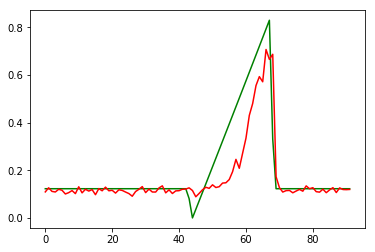

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:12:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-316000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:12:32
INFO:tensorflow:Saving dict for global step 316000: global_step = 316000, loss = 0.0073500914
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 316000: ./outputdir/model.ckpt-316000
error on testset first run {'loss': 0.0073500914, 'global_step': 316000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-316000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:global_step/sec: 435.792
INFO:tensorflow:loss = 0.00017982216, step = 320701 (0.229 sec)
INFO:tensorflow:global_step/sec: 432.152
INFO:tensorflow:loss = 0.0019080893, step = 320801 (0.231 sec)
INFO:tensorflow:global_step/sec: 422.098
INFO:tensorflow:loss = 0.002134358, step = 320901 (0.237 sec)
INFO:tensorflow:global_step/sec: 394.967
INFO:tensorflow:loss = 0.045183215, step = 321001 (0.253 sec)
INFO:tensorflow:global_step/sec: 453.005
INFO:tensorflow:loss = 0.007600452, step = 321101 (0.221 sec)
INFO:tensorflow:global_step/sec: 443.131
INFO:tensorflow:loss = 0.00048510867, step = 321201 (0.226 sec)
INFO:tensorflow:global_step/sec: 419.219
INFO:tensorflow:loss = 0.0010860432, step = 321301 (0.239 sec)
INFO:tensorflow:global_step/sec: 401.584
INFO:tensorflow:loss = 7.0863393e-06, step = 321401 (0.249 sec)
INFO:tensorflow:global_step/sec: 379.945
INFO:tensorflow:loss = 0.0013978824, step = 321501 (0.263 sec)
INFO:tensorflow:global_step/sec: 395.192
INFO:tensorflow:loss = 

INFO:tensorflow:loss = 0.0046278415, step = 326001
INFO:tensorflow:global_step/sec: 156.743
INFO:tensorflow:loss = 0.0011761485, step = 326101 (0.639 sec)
INFO:tensorflow:global_step/sec: 422.059
INFO:tensorflow:loss = 1.6392736e-05, step = 326201 (0.237 sec)
INFO:tensorflow:global_step/sec: 411.196
INFO:tensorflow:loss = 0.001579657, step = 326301 (0.243 sec)
INFO:tensorflow:global_step/sec: 388.54
INFO:tensorflow:loss = 0.0001120172, step = 326401 (0.258 sec)
INFO:tensorflow:global_step/sec: 413.068
INFO:tensorflow:loss = 0.0016608902, step = 326501 (0.241 sec)
INFO:tensorflow:global_step/sec: 423.46
INFO:tensorflow:loss = 2.0187768e-05, step = 326601 (0.236 sec)
INFO:tensorflow:global_step/sec: 412.71
INFO:tensorflow:loss = 0.0008029857, step = 326701 (0.243 sec)
INFO:tensorflow:global_step/sec: 422.667
INFO:tensorflow:loss = 0.0078453785, step = 326801 (0.236 sec)
INFO:tensorflow:global_step/sec: 431.714
INFO:tensorflow:loss = 0.011436269, step = 326901 (0.232 sec)
INFO:tensorflow:

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-332000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.000525203526360511
prediction at  8 [array([0.13503719])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-332000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 332000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.004106697, step = 332001
INFO:tensorflow:global_step/sec: 160.699
INFO:tensorflow:loss = 0.008885534, step = 332101 (0.623 sec)
INFO:tensorflow:global_step/sec: 440.635
INFO:tensorflow:loss = 0.00013990788, step = 332201 (0.227 sec)
INFO:tensorflow:global_step/sec: 432.8

INFO:tensorflow:loss = 0.0032015315, step = 337501 (0.262 sec)
INFO:tensorflow:global_step/sec: 397.546
INFO:tensorflow:loss = 3.9794864e-05, step = 337601 (0.252 sec)
INFO:tensorflow:global_step/sec: 398.827
INFO:tensorflow:loss = 1.8459306e-05, step = 337701 (0.251 sec)
INFO:tensorflow:global_step/sec: 398.639
INFO:tensorflow:loss = 8.377484e-05, step = 337801 (0.251 sec)
INFO:tensorflow:global_step/sec: 398.671
INFO:tensorflow:loss = 0.00023434947, step = 337901 (0.251 sec)
INFO:tensorflow:Saving checkpoints for 338000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 7.782751e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-338000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 3.899295166577117e-05
prediction at  11 [array([0.11548765])]
dataset <TensorSliceDataset shapes: ((1,),

INFO:tensorflow:loss = 5.5885146e-05, step = 342801 (0.243 sec)
INFO:tensorflow:global_step/sec: 405.868
INFO:tensorflow:loss = 0.0001446651, step = 342901 (0.246 sec)
INFO:tensorflow:global_step/sec: 410.664
INFO:tensorflow:loss = 5.1716484e-06, step = 343001 (0.244 sec)
INFO:tensorflow:global_step/sec: 395.366
INFO:tensorflow:loss = 0.00021663235, step = 343101 (0.253 sec)
INFO:tensorflow:global_step/sec: 382.619
INFO:tensorflow:loss = 0.000257457, step = 343201 (0.261 sec)
INFO:tensorflow:global_step/sec: 393.073
INFO:tensorflow:loss = 0.00012647493, step = 343301 (0.255 sec)
INFO:tensorflow:global_step/sec: 391.06
INFO:tensorflow:loss = 7.951774e-05, step = 343401 (0.256 sec)
INFO:tensorflow:global_step/sec: 393.972
INFO:tensorflow:loss = 4.414268e-05, step = 343501 (0.254 sec)
INFO:tensorflow:global_step/sec: 400.887
INFO:tensorflow:loss = 6.370436e-05, step = 343601 (0.249 sec)
INFO:tensorflow:global_step/sec: 399.966
INFO:tensorflow:loss = 3.8797575e-06, step = 343701 (0.250 sec

INFO:tensorflow:loss = 0.0001225861, step = 348101 (0.608 sec)
INFO:tensorflow:global_step/sec: 421.285
INFO:tensorflow:loss = 3.3175016e-05, step = 348201 (0.237 sec)
INFO:tensorflow:global_step/sec: 420.86
INFO:tensorflow:loss = 0.00013094695, step = 348301 (0.237 sec)
INFO:tensorflow:global_step/sec: 415.229
INFO:tensorflow:loss = 2.7670323e-05, step = 348401 (0.241 sec)
INFO:tensorflow:global_step/sec: 424.038
INFO:tensorflow:loss = 0.00015492427, step = 348501 (0.236 sec)
INFO:tensorflow:global_step/sec: 425.15
INFO:tensorflow:loss = 9.852737e-05, step = 348601 (0.235 sec)
INFO:tensorflow:global_step/sec: 419.071
INFO:tensorflow:loss = 0.0001592605, step = 348701 (0.239 sec)
INFO:tensorflow:global_step/sec: 412.533
INFO:tensorflow:loss = 6.0688963e-05, step = 348801 (0.243 sec)
INFO:tensorflow:global_step/sec: 424.873
INFO:tensorflow:loss = 0.000111799985, step = 348901 (0.236 sec)
INFO:tensorflow:global_step/sec: 422.069
INFO:tensorflow:loss = 4.750351e-05, step = 349001 (0.237 s

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.0666778916527977e-07
prediction at  19 [array([0.11914605])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-354000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 354000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 8.8000854e-07, step = 354001
INFO:tensorflow:global_step/sec: 145.063
INFO:tensorflow:loss = 1.0571141e-05, step = 354101 (0.690 sec)
INFO:tensorflow:global_step/sec: 439.408
INFO:tensorflow:loss = 4.0661207e-06, step = 354201 (0.227 sec)
INFO:tensorflow:global_step/sec: 405.556
INFO:tensorflow:loss = 1.1613448e-05, step = 354301 (0.247 se

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-358000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 358000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.027630568, step = 358001
INFO:tensorflow:global_step/sec: 156.881
INFO:tensorflow:loss = 8.0966805e-05, step = 358101 (0.638 sec)
INFO:tensorflow:global_step/sec: 434.184
INFO:tensorflow:loss = 0.0001902014, step = 358201 (0.230 sec)
INFO:tensorflow:global_step/sec: 418.705
INFO:tensorflow:loss = 0.010495077, step = 358301 (0.239 sec)
INFO:tensorflow:global_step/sec: 411.866
INFO:tensorflow:loss = 6.520368e-05, step = 358401 (0.243 sec)
INFO:tensorflow:global_step/sec: 391.296
INFO:tensorflow:loss = 5.380287e-06, step = 358501 (0.256 sec)
INFO:tensorflow:global_step/sec: 390.199
INFO:tensorflow:loss = 0.00014558708, s

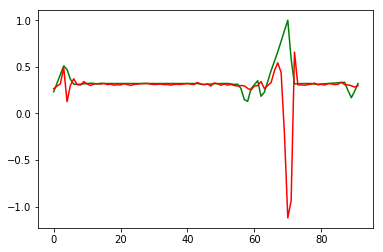

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:15:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-360000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:15:36
INFO:tensorflow:Saving dict for global step 360000: global_step = 360000, loss = 0.07742682
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 360000: ./outputdir/model.ckpt-360000
error on testset first run {'loss': 0.07742682, 'global_step': 360000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-360000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorfl

INFO:tensorflow:global_step/sec: 424.503
INFO:tensorflow:loss = 0.0003096719, step = 364701 (0.235 sec)
INFO:tensorflow:global_step/sec: 418.818
INFO:tensorflow:loss = 0.0033308766, step = 364801 (0.239 sec)
INFO:tensorflow:global_step/sec: 333.768
INFO:tensorflow:loss = 2.3368673e-05, step = 364901 (0.300 sec)
INFO:tensorflow:global_step/sec: 336.665
INFO:tensorflow:loss = 0.0081574805, step = 365001 (0.297 sec)
INFO:tensorflow:global_step/sec: 352.135
INFO:tensorflow:loss = 0.0018341758, step = 365101 (0.284 sec)
INFO:tensorflow:global_step/sec: 346.94
INFO:tensorflow:loss = 0.29423714, step = 365201 (0.288 sec)
INFO:tensorflow:global_step/sec: 382.979
INFO:tensorflow:loss = 2.019254e-06, step = 365301 (0.261 sec)
INFO:tensorflow:global_step/sec: 409.715
INFO:tensorflow:loss = 4.598778e-05, step = 365401 (0.244 sec)
INFO:tensorflow:global_step/sec: 375.401
INFO:tensorflow:loss = 0.003772163, step = 365501 (0.267 sec)
INFO:tensorflow:global_step/sec: 332.258
INFO:tensorflow:loss = 0.0

INFO:tensorflow:loss = 3.5703117e-06, step = 370001
INFO:tensorflow:global_step/sec: 157.947
INFO:tensorflow:loss = 0.0050983243, step = 370101 (0.634 sec)
INFO:tensorflow:global_step/sec: 425.477
INFO:tensorflow:loss = 0.00012395332, step = 370201 (0.235 sec)
INFO:tensorflow:global_step/sec: 433.342
INFO:tensorflow:loss = 0.00088206585, step = 370301 (0.231 sec)
INFO:tensorflow:global_step/sec: 386.453
INFO:tensorflow:loss = 0.0070534605, step = 370401 (0.259 sec)
INFO:tensorflow:global_step/sec: 403.291
INFO:tensorflow:loss = 0.00023728737, step = 370501 (0.248 sec)
INFO:tensorflow:global_step/sec: 427.053
INFO:tensorflow:loss = 6.5881664e-05, step = 370601 (0.234 sec)
INFO:tensorflow:global_step/sec: 440.492
INFO:tensorflow:loss = 0.00016491006, step = 370701 (0.227 sec)
INFO:tensorflow:global_step/sec: 404.827
INFO:tensorflow:loss = 0.0012400115, step = 370801 (0.247 sec)
INFO:tensorflow:global_step/sec: 408.585
INFO:tensorflow:loss = 0.004178112, step = 370901 (0.245 sec)
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.006018208598398094
prediction at  8 [array([0.33361395])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-376000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 376000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0007879669, step = 376001
INFO:tensorflow:global_step/sec: 141.861
INFO:tensorflow:loss = 0.0022370964, step = 376101 (0.706 sec)
INFO:tensorflow:global_step/sec: 281.319
INFO:tensorflow:loss = 0.0005435064, step = 376201 (0.356 sec)
INFO:tensorflow:global_step/sec: 363.995
INFO:tensorflow:loss = 0.0030188735, step = 376301 (0.275 sec)
INFO:

INFO:tensorflow:global_step/sec: 425.054
INFO:tensorflow:loss = 0.00010985573, step = 381701 (0.235 sec)
INFO:tensorflow:global_step/sec: 392.443
INFO:tensorflow:loss = 0.00027911898, step = 381801 (0.255 sec)
INFO:tensorflow:global_step/sec: 372.369
INFO:tensorflow:loss = 8.65115e-05, step = 381901 (0.269 sec)
INFO:tensorflow:Saving checkpoints for 382000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0004890755.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-382000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 0.021482293741209173
prediction at  11 [array([0.29827847])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorf

INFO:tensorflow:loss = 0.0001798921, step = 387001 (0.231 sec)
INFO:tensorflow:global_step/sec: 418.81
INFO:tensorflow:loss = 0.25098187, step = 387101 (0.239 sec)
INFO:tensorflow:global_step/sec: 412.243
INFO:tensorflow:loss = 0.03411251, step = 387201 (0.243 sec)
INFO:tensorflow:global_step/sec: 405.765
INFO:tensorflow:loss = 0.0003343818, step = 387301 (0.246 sec)
INFO:tensorflow:global_step/sec: 399.474
INFO:tensorflow:loss = 0.0005701137, step = 387401 (0.251 sec)
INFO:tensorflow:global_step/sec: 395.642
INFO:tensorflow:loss = 0.0001641417, step = 387501 (0.252 sec)
INFO:tensorflow:global_step/sec: 389.32
INFO:tensorflow:loss = 0.00045353587, step = 387601 (0.257 sec)
INFO:tensorflow:global_step/sec: 389.882
INFO:tensorflow:loss = 2.6750286e-08, step = 387701 (0.257 sec)
INFO:tensorflow:global_step/sec: 417.669
INFO:tensorflow:loss = 0.00016401954, step = 387801 (0.239 sec)
INFO:tensorflow:global_step/sec: 411.666
INFO:tensorflow:loss = 0.00025644468, step = 387901 (0.243 sec)
INF

INFO:tensorflow:global_step/sec: 423.977
INFO:tensorflow:loss = 3.2226464e-05, step = 392401 (0.236 sec)
INFO:tensorflow:global_step/sec: 409.398
INFO:tensorflow:loss = 0.00044616318, step = 392501 (0.245 sec)
INFO:tensorflow:global_step/sec: 395.035
INFO:tensorflow:loss = 3.3843684e-05, step = 392601 (0.253 sec)
INFO:tensorflow:global_step/sec: 420.83
INFO:tensorflow:loss = 0.0008495493, step = 392701 (0.238 sec)
INFO:tensorflow:global_step/sec: 429.422
INFO:tensorflow:loss = 1.0428893e-05, step = 392801 (0.233 sec)
INFO:tensorflow:global_step/sec: 431.999
INFO:tensorflow:loss = 0.0009152219, step = 392901 (0.231 sec)
INFO:tensorflow:global_step/sec: 436.136
INFO:tensorflow:loss = 7.6227894e-05, step = 393001 (0.229 sec)
INFO:tensorflow:global_step/sec: 425.291
INFO:tensorflow:loss = 0.00083823915, step = 393101 (0.235 sec)
INFO:tensorflow:global_step/sec: 337.85
INFO:tensorflow:loss = 0.0010430894, step = 393201 (0.296 sec)
INFO:tensorflow:global_step/sec: 462.659
INFO:tensorflow:los

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-398000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 398000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.1103541e-07, step = 398001
INFO:tensorflow:global_step/sec: 159.867
INFO:tensorflow:loss = 0.0004494969, step = 398101 (0.627 sec)
INFO:tensorflow:global_step/sec: 434.118
INFO:tensorflow:loss = 0.0007765342, step = 398201 (0.230 sec)
INFO:tensorflow:global_step/sec: 427.317
INFO:tensorflow:loss = 0.0006980352, step = 398301 (0.234 sec)
INFO:tensorflow:global_step/sec: 416.058
INFO:tensorflow:loss = 0.0004920617, step = 398401 (0.240 sec)
INFO:tensorflow:global_step/sec: 376.752
INFO:tensorflow:loss = 0.00022203662, step = 398501 (0.265 sec)
INFO:tensorflow:global_step/sec: 421.203
INFO:tensorflow:loss = 0.0007632589,

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-402000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 402000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.030738931, step = 402001
INFO:tensorflow:global_step/sec: 162.116
INFO:tensorflow:loss = 0.0002370253, step = 402101 (0.618 sec)
INFO:tensorflow:global_step/sec: 446.799
INFO:tensorflow:loss = 6.8167865e-05, step = 402201 (0.224 sec)
INFO:tensorflow:global_step/sec: 439.942
INFO:tensorflow:loss = 0.0036994573, step = 402301 (0.227 sec)
INFO:tensorflow:global_step/sec: 421.168
INFO:tensorflow:loss = 0.00054004014, step = 402401 (0.237 sec)
INFO:tensorflow:global_step/sec: 414.928
INFO:tensorflow:loss = 4.495374e-05, step = 402501 (0.241 sec)
INFO:tensorflow:global_step/sec: 443.783
INFO:tensorflow:loss = 0.007837974, s

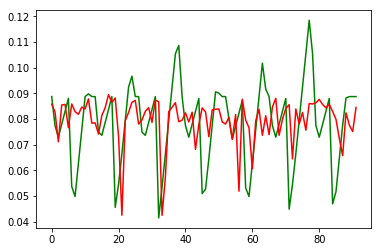

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:18:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-404000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:18:46
INFO:tensorflow:Saving dict for global step 404000: global_step = 404000, loss = 0.00023219001
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 404000: ./outputdir/model.ckpt-404000
error on testset first run {'loss': 0.00023219001, 'global_step': 404000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-404000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:loss = 2.2141834e-05, step = 408601 (0.221 sec)
INFO:tensorflow:global_step/sec: 444.386
INFO:tensorflow:loss = 9.2608265e-05, step = 408701 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.829
INFO:tensorflow:loss = 3.1542488e-05, step = 408801 (0.230 sec)
INFO:tensorflow:global_step/sec: 447.439
INFO:tensorflow:loss = 2.3747364e-07, step = 408901 (0.224 sec)
INFO:tensorflow:global_step/sec: 456.753
INFO:tensorflow:loss = 6.686487e-05, step = 409001 (0.219 sec)
INFO:tensorflow:global_step/sec: 444.921
INFO:tensorflow:loss = 1.0871543e-05, step = 409101 (0.225 sec)
INFO:tensorflow:global_step/sec: 443.996
INFO:tensorflow:loss = 1.10430465e-05, step = 409201 (0.225 sec)
INFO:tensorflow:global_step/sec: 441.735
INFO:tensorflow:loss = 1.5408281e-07, step = 409301 (0.226 sec)
INFO:tensorflow:global_step/sec: 422.06
INFO:tensorflow:loss = 0.0001953238, step = 409401 (0.237 sec)
INFO:tensorflow:global_step/sec: 427.807
INFO:tensorflow:loss = 9.9701414e-05, step = 409501 (0.23

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 414000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.1299894e-06, step = 414001
INFO:tensorflow:global_step/sec: 157
INFO:tensorflow:loss = 4.2963413e-05, step = 414101 (0.638 sec)
INFO:tensorflow:global_step/sec: 428.61
INFO:tensorflow:loss = 0.001506428, step = 414201 (0.233 sec)
INFO:tensorflow:global_step/sec: 425.505
INFO:tensorflow:loss = 0.00017152914, step = 414301 (0.235 sec)
INFO:tensorflow:global_step/sec: 429.198
INFO:tensorflow:loss = 0.00010427772, step = 414401 (0.233 sec)
INFO:tensorflow:global_step/sec: 436.247
INFO:tensorflow:loss = 6.021476e-05, step = 414501 (0.229 sec)
INFO:tensorflow:global_step/sec: 432.623
INFO:tensorflow:loss = 9.997701e-05, step = 414601 (0.231 sec)
INFO:tensorflow:global_step/sec: 429.456
INFO:tensorflow:loss = 9.512864e-05, step = 414701 (0.233 sec)
INFO:tensorflow:global_step/sec: 428.33
INFO:tensorflow:loss = 0.00012104262, step = 414801 (0.234 sec)


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-420000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.29746929454667e-06
prediction at  8 [array([0.08016153])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-420000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 420000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.2676255e-06, step = 420001
INFO:tensorflow:global_step/sec: 163.762
INFO:tensorflow:loss = 7.650591e-05, step = 420101 (0.612 sec)
INFO:tensorflow:global_step/se

INFO:tensorflow:loss = 2.274348e-05, step = 425401 (0.227 sec)
INFO:tensorflow:global_step/sec: 440.918
INFO:tensorflow:loss = 7.0189744e-05, step = 425501 (0.226 sec)
INFO:tensorflow:global_step/sec: 445.295
INFO:tensorflow:loss = 1.2077044e-05, step = 425601 (0.225 sec)
INFO:tensorflow:global_step/sec: 433.825
INFO:tensorflow:loss = 3.6806687e-05, step = 425701 (0.231 sec)
INFO:tensorflow:global_step/sec: 426.728
INFO:tensorflow:loss = 1.3281592e-05, step = 425801 (0.235 sec)
INFO:tensorflow:global_step/sec: 402.753
INFO:tensorflow:loss = 0.0001156821, step = 425901 (0.248 sec)
INFO:tensorflow:Saving checkpoints for 426000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.261615e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-426000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11

INFO:tensorflow:loss = 9.712635e-05, step = 430701 (0.237 sec)
INFO:tensorflow:global_step/sec: 415.453
INFO:tensorflow:loss = 9.8748475e-05, step = 430801 (0.240 sec)
INFO:tensorflow:global_step/sec: 419.078
INFO:tensorflow:loss = 5.6377144e-07, step = 430901 (0.239 sec)
INFO:tensorflow:global_step/sec: 428.422
INFO:tensorflow:loss = 1.4560793e-06, step = 431001 (0.234 sec)
INFO:tensorflow:global_step/sec: 428.357
INFO:tensorflow:loss = 4.424164e-05, step = 431101 (0.233 sec)
INFO:tensorflow:global_step/sec: 326.254
INFO:tensorflow:loss = 3.6409358e-05, step = 431201 (0.307 sec)
INFO:tensorflow:global_step/sec: 425.295
INFO:tensorflow:loss = 0.0014090178, step = 431301 (0.235 sec)
INFO:tensorflow:global_step/sec: 415.866
INFO:tensorflow:loss = 3.635444e-05, step = 431401 (0.241 sec)
INFO:tensorflow:global_step/sec: 394.606
INFO:tensorflow:loss = 4.0040777e-07, step = 431501 (0.253 sec)
INFO:tensorflow:global_step/sec: 424.522
INFO:tensorflow:loss = 7.2572925e-06, step = 431601 (0.236 

INFO:tensorflow:loss = 9.20999e-07, step = 436001
INFO:tensorflow:global_step/sec: 163.743
INFO:tensorflow:loss = 2.9957348e-05, step = 436101 (0.612 sec)
INFO:tensorflow:global_step/sec: 438.683
INFO:tensorflow:loss = 1.3747513e-06, step = 436201 (0.228 sec)
INFO:tensorflow:global_step/sec: 448.491
INFO:tensorflow:loss = 3.7566428e-05, step = 436301 (0.223 sec)
INFO:tensorflow:global_step/sec: 438.159
INFO:tensorflow:loss = 9.656066e-06, step = 436401 (0.228 sec)
INFO:tensorflow:global_step/sec: 428.471
INFO:tensorflow:loss = 4.31628e-05, step = 436501 (0.233 sec)
INFO:tensorflow:global_step/sec: 436.542
INFO:tensorflow:loss = 4.573593e-06, step = 436601 (0.229 sec)
INFO:tensorflow:global_step/sec: 430.956
INFO:tensorflow:loss = 4.6207828e-05, step = 436701 (0.233 sec)
INFO:tensorflow:global_step/sec: 416.585
INFO:tensorflow:loss = 1.1462562e-06, step = 436801 (0.240 sec)
INFO:tensorflow:global_step/sec: 326.352
INFO:tensorflow:loss = 3.5059904e-05, step = 436901 (0.306 sec)
INFO:tens

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-442000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.0046735340681137e-07
prediction at  19 [array([0.08265114])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-442000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 442000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.9121753e-05, step = 442001
INFO:tensorflow:global_step/sec: 158.325
INFO:tensorflow:loss = 5.999564e-06, step = 442101 (0.633 sec)
INFO:tensorflow:global_step/sec: 441.491
INFO:tensorflow:loss = 8.873127e-06, step = 442201 (0.226 

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-446000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 446000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0052122204, step = 446001
INFO:tensorflow:global_step/sec: 165.102
INFO:tensorflow:loss = 1.0202218e-06, step = 446101 (0.606 sec)
INFO:tensorflow:global_step/sec: 464.619
INFO:tensorflow:loss = 6.60884e-05, step = 446201 (0.215 sec)
INFO:tensorflow:global_step/sec: 451.586
INFO:tensorflow:loss = 2.615258e-05, step = 446301 (0.221 sec)
INFO:tensorflow:global_step/sec: 407.732
INFO:tensorflow:loss = 7.450362e-06, step = 446401 (0.245 sec)
INFO:tensorflow:global_step/sec: 402.525
INFO:tensorflow:loss = 1.8757497e-05, step = 446501 (0.249 sec)
INFO:tensorflow:global_step/sec: 431.116
INFO:tensorflow:loss = 0.00094786816,

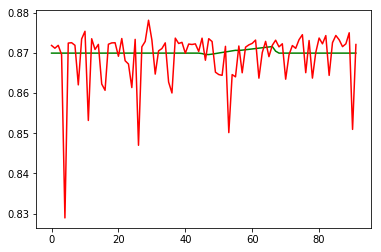

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:21:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-448000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:21:44
INFO:tensorflow:Saving dict for global step 448000: global_step = 448000, loss = 6.342722e-05
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 448000: ./outputdir/model.ckpt-448000
error on testset first run {'loss': 6.342722e-05, 'global_step': 448000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-448000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:loss = 3.7377427e-05, step = 452601 (0.231 sec)
INFO:tensorflow:global_step/sec: 439.36
INFO:tensorflow:loss = 0.0004382542, step = 452701 (0.228 sec)
INFO:tensorflow:global_step/sec: 429.835
INFO:tensorflow:loss = 0.00012819628, step = 452801 (0.232 sec)
INFO:tensorflow:global_step/sec: 435.05
INFO:tensorflow:loss = 8.305602e-06, step = 452901 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.701
INFO:tensorflow:loss = 0.00012489343, step = 453001 (0.227 sec)
INFO:tensorflow:global_step/sec: 404.333
INFO:tensorflow:loss = 0.00048206188, step = 453101 (0.247 sec)
INFO:tensorflow:global_step/sec: 430.317
INFO:tensorflow:loss = 8.973483e-05, step = 453201 (0.232 sec)
INFO:tensorflow:global_step/sec: 428.713
INFO:tensorflow:loss = 1.0833891e-05, step = 453301 (0.233 sec)
INFO:tensorflow:global_step/sec: 433.219
INFO:tensorflow:loss = 0.00012987676, step = 453401 (0.231 sec)
INFO:tensorflow:global_step/sec: 433.639
INFO:tensorflow:loss = 7.4058507e-06, step = 453501 (0.230 s

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 458000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0010125579, step = 458001
INFO:tensorflow:global_step/sec: 165.394
INFO:tensorflow:loss = 6.707376e-05, step = 458101 (0.605 sec)
INFO:tensorflow:global_step/sec: 452.347
INFO:tensorflow:loss = 0.00013028737, step = 458201 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.091
INFO:tensorflow:loss = 0.00038214755, step = 458301 (0.221 sec)
INFO:tensorflow:global_step/sec: 430.047
INFO:tensorflow:loss = 9.2431455e-06, step = 458401 (0.232 sec)
INFO:tensorflow:global_step/sec: 431.267
INFO:tensorflow:loss = 2.795284e-06, step = 458501 (0.232 sec)
INFO:tensorflow:global_step/sec: 386.456
INFO:tensorflow:loss = 0.00010571911, step = 458601 (0.259 sec)
INFO:tensorflow:global_step/sec: 459.301
INFO:tensorflow:loss = 2.219326e-05, step = 458701 (0.218 sec)
INFO:tensorflow:global_step/sec: 424.834
INFO:tensorflow:loss = 1.0770811e-05, step = 458801 (0.23

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-464000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.704500980273866e-05
prediction at  8 [array([0.86468545])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-464000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 464000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.9196704e-05, step = 464001
INFO:tensorflow:global_step/sec: 164.41
INFO:tensorflow:loss = 3.7632944e-05, step = 464101 (0.609 sec)
INFO:tensorflow:global_step/s

INFO:tensorflow:loss = 3.8144386e-05, step = 469401 (0.226 sec)
INFO:tensorflow:global_step/sec: 424.419
INFO:tensorflow:loss = 1.2165758e-05, step = 469501 (0.236 sec)
INFO:tensorflow:global_step/sec: 423.291
INFO:tensorflow:loss = 4.9263617e-05, step = 469601 (0.236 sec)
INFO:tensorflow:global_step/sec: 412.439
INFO:tensorflow:loss = 1.787242e-05, step = 469701 (0.243 sec)
INFO:tensorflow:global_step/sec: 404.454
INFO:tensorflow:loss = 8.457454e-06, step = 469801 (0.248 sec)
INFO:tensorflow:global_step/sec: 418.613
INFO:tensorflow:loss = 0.000530608, step = 469901 (0.238 sec)
INFO:tensorflow:Saving checkpoints for 470000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 7.75206e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-470000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 3.

INFO:tensorflow:loss = 0.00049357285, step = 474701 (0.223 sec)
INFO:tensorflow:global_step/sec: 440.53
INFO:tensorflow:loss = 1.67477e-05, step = 474801 (0.227 sec)
INFO:tensorflow:global_step/sec: 435.301
INFO:tensorflow:loss = 1.8864523e-05, step = 474901 (0.230 sec)
INFO:tensorflow:global_step/sec: 433.108
INFO:tensorflow:loss = 4.8716265e-07, step = 475001 (0.231 sec)
INFO:tensorflow:global_step/sec: 457.652
INFO:tensorflow:loss = 2.3705266e-05, step = 475101 (0.219 sec)
INFO:tensorflow:global_step/sec: 438.733
INFO:tensorflow:loss = 4.5389494e-05, step = 475201 (0.228 sec)
INFO:tensorflow:global_step/sec: 429.416
INFO:tensorflow:loss = 4.1118707e-05, step = 475301 (0.233 sec)
INFO:tensorflow:global_step/sec: 435.903
INFO:tensorflow:loss = 2.0366859e-05, step = 475401 (0.229 sec)
INFO:tensorflow:global_step/sec: 430.967
INFO:tensorflow:loss = 3.9276176e-05, step = 475501 (0.232 sec)
INFO:tensorflow:global_step/sec: 415.385
INFO:tensorflow:loss = 2.3368097e-05, step = 475601 (0.241

INFO:tensorflow:loss = 8.699762e-06, step = 480001
INFO:tensorflow:global_step/sec: 168.614
INFO:tensorflow:loss = 0.00044537286, step = 480101 (0.594 sec)
INFO:tensorflow:global_step/sec: 454.001
INFO:tensorflow:loss = 2.4295101e-05, step = 480201 (0.220 sec)
INFO:tensorflow:global_step/sec: 439.069
INFO:tensorflow:loss = 0.0004363098, step = 480301 (0.228 sec)
INFO:tensorflow:global_step/sec: 452.798
INFO:tensorflow:loss = 2.4674386e-05, step = 480401 (0.221 sec)
INFO:tensorflow:global_step/sec: 437.505
INFO:tensorflow:loss = 0.00045871947, step = 480501 (0.229 sec)
INFO:tensorflow:global_step/sec: 436.987
INFO:tensorflow:loss = 2.5837138e-05, step = 480601 (0.228 sec)
INFO:tensorflow:global_step/sec: 411.045
INFO:tensorflow:loss = 0.00062514184, step = 480701 (0.243 sec)
INFO:tensorflow:global_step/sec: 411.796
INFO:tensorflow:loss = 2.5969402e-05, step = 480801 (0.243 sec)
INFO:tensorflow:global_step/sec: 419.962
INFO:tensorflow:loss = 0.00044546847, step = 480901 (0.238 sec)
INFO:

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-486000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 5.367755194521287e-06
prediction at  19 [array([0.86847863])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-486000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 486000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.2810185e-05, step = 486001
INFO:tensorflow:global_step/sec: 164.91
INFO:tensorflow:loss = 5.0131726e-05, step = 486101 (0.607 sec)
INFO:tensorflow:global_step/sec: 456.218
INFO:tensorflow:loss = 5.321112e-05, step = 486201 (0.219 s

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-490000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 490000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.25627592, step = 490001
INFO:tensorflow:global_step/sec: 164.19
INFO:tensorflow:loss = 0.00036804046, step = 490101 (0.610 sec)
INFO:tensorflow:global_step/sec: 448.169
INFO:tensorflow:loss = 2.3050794e-05, step = 490201 (0.223 sec)
INFO:tensorflow:global_step/sec: 439.019
INFO:tensorflow:loss = 1.987545e-05, step = 490301 (0.228 sec)
INFO:tensorflow:global_step/sec: 436.235
INFO:tensorflow:loss = 3.5001567e-06, step = 490401 (0.229 sec)
INFO:tensorflow:global_step/sec: 440.905
INFO:tensorflow:loss = 1.386802e-05, step = 490501 (0.227 sec)
INFO:tensorflow:global_step/sec: 423.324
INFO:tensorflow:loss = 0.0094062425, s

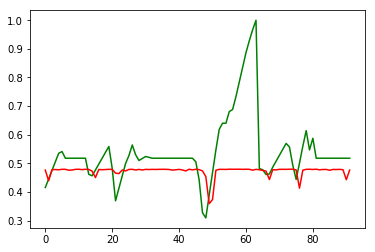

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:24:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-492000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:24:41
INFO:tensorflow:Saving dict for global step 492000: global_step = 492000, loss = 0.015980398
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 492000: ./outputdir/model.ckpt-492000
error on testset first run {'loss': 0.015980398, 'global_step': 492000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-492000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:loss = 0.00017568476, step = 496601 (0.229 sec)
INFO:tensorflow:global_step/sec: 442.466
INFO:tensorflow:loss = 5.9115255e-06, step = 496701 (0.226 sec)
INFO:tensorflow:global_step/sec: 437.637
INFO:tensorflow:loss = 5.1500706e-07, step = 496801 (0.229 sec)
INFO:tensorflow:global_step/sec: 448.976
INFO:tensorflow:loss = 1.450239e-05, step = 496901 (0.223 sec)
INFO:tensorflow:global_step/sec: 341.523
INFO:tensorflow:loss = 7.986642e-06, step = 497001 (0.292 sec)
INFO:tensorflow:global_step/sec: 484.824
INFO:tensorflow:loss = 1.1816947e-05, step = 497101 (0.206 sec)
INFO:tensorflow:global_step/sec: 469.259
INFO:tensorflow:loss = 3.793264e-05, step = 497201 (0.213 sec)
INFO:tensorflow:global_step/sec: 445.579
INFO:tensorflow:loss = 2.3684956e-09, step = 497301 (0.224 sec)
INFO:tensorflow:global_step/sec: 338.918
INFO:tensorflow:loss = 3.4808894e-05, step = 497401 (0.295 sec)
INFO:tensorflow:global_step/sec: 471.12
INFO:tensorflow:loss = 1.1055925e-07, step = 497501 (0.212 

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 502000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.7667566e-06, step = 502001
INFO:tensorflow:global_step/sec: 167.452
INFO:tensorflow:loss = 8.341714e-06, step = 502101 (0.598 sec)
INFO:tensorflow:global_step/sec: 437.331
INFO:tensorflow:loss = 2.9156383e-06, step = 502201 (0.229 sec)
INFO:tensorflow:global_step/sec: 436.437
INFO:tensorflow:loss = 3.0254523e-06, step = 502301 (0.229 sec)
INFO:tensorflow:global_step/sec: 430.121
INFO:tensorflow:loss = 3.5521807e-05, step = 502401 (0.232 sec)
INFO:tensorflow:global_step/sec: 419.368
INFO:tensorflow:loss = 2.3631323e-05, step = 502501 (0.239 sec)
INFO:tensorflow:global_step/sec: 416.976
INFO:tensorflow:loss = 5.3391655e-06, step = 502601 (0.240 sec)
INFO:tensorflow:global_step/sec: 411.68
INFO:tensorflow:loss = 1.5562735e-05, step = 502701 (0.243 sec)
INFO:tensorflow:global_step/sec: 410.322
INFO:tensorflow:loss = 5.3819463e-06, step = 502801 (0.

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-508000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 9.24063683941767e-06
prediction at  8 [array([0.47914436])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-508000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 508000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0001585424, step = 508001
INFO:tensorflow:global_step/sec: 164.973
INFO:tensorflow:loss = 1.9612193e-05, step = 508101 (0.607 sec)
INFO:tensorflow:global_step/se

INFO:tensorflow:loss = 1.4624766e-05, step = 513401 (0.226 sec)
INFO:tensorflow:global_step/sec: 422.826
INFO:tensorflow:loss = 4.3209197e-06, step = 513501 (0.236 sec)
INFO:tensorflow:global_step/sec: 422.548
INFO:tensorflow:loss = 1.3270191e-05, step = 513601 (0.237 sec)
INFO:tensorflow:global_step/sec: 395.165
INFO:tensorflow:loss = 6.898077e-06, step = 513701 (0.253 sec)
INFO:tensorflow:global_step/sec: 413.511
INFO:tensorflow:loss = 4.3024784e-10, step = 513801 (0.242 sec)
INFO:tensorflow:global_step/sec: 400.479
INFO:tensorflow:loss = 2.446643e-06, step = 513901 (0.250 sec)
INFO:tensorflow:Saving checkpoints for 514000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.617441e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-514000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11

INFO:tensorflow:loss = 4.268423e-06, step = 518701 (0.239 sec)
INFO:tensorflow:global_step/sec: 433.353
INFO:tensorflow:loss = 9.662411e-06, step = 518801 (0.231 sec)
INFO:tensorflow:global_step/sec: 433.602
INFO:tensorflow:loss = 2.0380043e-05, step = 518901 (0.230 sec)
INFO:tensorflow:global_step/sec: 415.222
INFO:tensorflow:loss = 8.3052587e-10, step = 519001 (0.241 sec)
INFO:tensorflow:global_step/sec: 439.526
INFO:tensorflow:loss = 6.83805e-07, step = 519101 (0.228 sec)
INFO:tensorflow:global_step/sec: 421.749
INFO:tensorflow:loss = 1.8232284e-05, step = 519201 (0.237 sec)
INFO:tensorflow:global_step/sec: 419.271
INFO:tensorflow:loss = 1.0626542e-05, step = 519301 (0.238 sec)
INFO:tensorflow:global_step/sec: 405.467
INFO:tensorflow:loss = 1.4123111e-05, step = 519401 (0.246 sec)
INFO:tensorflow:global_step/sec: 398.384
INFO:tensorflow:loss = 8.499628e-06, step = 519501 (0.251 sec)
INFO:tensorflow:global_step/sec: 394.186
INFO:tensorflow:loss = 4.7020322e-08, step = 519601 (0.254 s

INFO:tensorflow:loss = 1.0161913e-05, step = 524001
INFO:tensorflow:global_step/sec: 159.959
INFO:tensorflow:loss = 9.256197e-06, step = 524101 (0.626 sec)
INFO:tensorflow:global_step/sec: 428.958
INFO:tensorflow:loss = 2.0486468e-05, step = 524201 (0.233 sec)
INFO:tensorflow:global_step/sec: 430.237
INFO:tensorflow:loss = 1.0506609e-05, step = 524301 (0.233 sec)
INFO:tensorflow:global_step/sec: 403.151
INFO:tensorflow:loss = 2.261305e-05, step = 524401 (0.248 sec)
INFO:tensorflow:global_step/sec: 417.414
INFO:tensorflow:loss = 1.0273562e-05, step = 524501 (0.239 sec)
INFO:tensorflow:global_step/sec: 425.713
INFO:tensorflow:loss = 1.7202743e-05, step = 524601 (0.235 sec)
INFO:tensorflow:global_step/sec: 433.985
INFO:tensorflow:loss = 1.0648314e-05, step = 524701 (0.230 sec)
INFO:tensorflow:global_step/sec: 441.544
INFO:tensorflow:loss = 2.1425029e-05, step = 524801 (0.226 sec)
INFO:tensorflow:global_step/sec: 443.938
INFO:tensorflow:loss = 1.0723914e-05, step = 524901 (0.226 sec)
INFO:

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-530000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.3019985497380536e-08
prediction at  19 [array([0.47426426])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-530000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 530000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0004300661, step = 530001
INFO:tensorflow:global_step/sec: 169.409
INFO:tensorflow:loss = 0.00042504628, step = 530101 (0.591 sec)
INFO:tensorflow:global_step/sec: 464.448
INFO:tensorflow:loss = 0.00041956743, step = 530201 (0.215

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-534000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 534000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.19354983, step = 534001
INFO:tensorflow:global_step/sec: 165.997
INFO:tensorflow:loss = 1.7471024e-05, step = 534101 (0.603 sec)
INFO:tensorflow:global_step/sec: 444.737
INFO:tensorflow:loss = 1.1724924e-05, step = 534201 (0.225 sec)
INFO:tensorflow:global_step/sec: 451.102
INFO:tensorflow:loss = 2.3359453e-05, step = 534301 (0.222 sec)
INFO:tensorflow:global_step/sec: 415.143
INFO:tensorflow:loss = 2.2053084e-05, step = 534401 (0.241 sec)
INFO:tensorflow:global_step/sec: 431.913
INFO:tensorflow:loss = 1.2683935e-06, step = 534501 (0.232 sec)
INFO:tensorflow:global_step/sec: 436.047
INFO:tensorflow:loss = 8.725208e-05

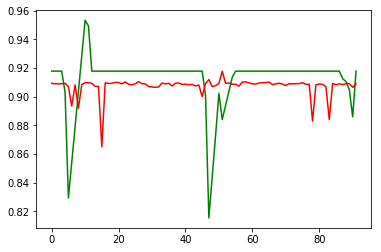

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:27:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-536000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:27:39
INFO:tensorflow:Saving dict for global step 536000: global_step = 536000, loss = 0.00040349868
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 536000: ./outputdir/model.ckpt-536000
error on testset first run {'loss': 0.00040349868, 'global_step': 536000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-536000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:loss = 0.00019271602, step = 540601 (0.221 sec)
INFO:tensorflow:global_step/sec: 447.972
INFO:tensorflow:loss = 1.0174543e-06, step = 540701 (0.223 sec)
INFO:tensorflow:global_step/sec: 439.992
INFO:tensorflow:loss = 0.00015544162, step = 540801 (0.227 sec)
INFO:tensorflow:global_step/sec: 446.114
INFO:tensorflow:loss = 8.80098e-05, step = 540901 (0.224 sec)
INFO:tensorflow:global_step/sec: 442.176
INFO:tensorflow:loss = 1.0004066e-05, step = 541001 (0.226 sec)
INFO:tensorflow:global_step/sec: 449.713
INFO:tensorflow:loss = 1.1072519e-06, step = 541101 (0.223 sec)
INFO:tensorflow:global_step/sec: 443.762
INFO:tensorflow:loss = 3.5781998e-06, step = 541201 (0.225 sec)
INFO:tensorflow:global_step/sec: 387.814
INFO:tensorflow:loss = 2.3958999e-05, step = 541301 (0.258 sec)
INFO:tensorflow:global_step/sec: 440.457
INFO:tensorflow:loss = 1.4857272e-05, step = 541401 (0.227 sec)
INFO:tensorflow:global_step/sec: 438.531
INFO:tensorflow:loss = 0.00013397611, step = 541501 (0.22

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 546000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.8805125e-05, step = 546001
INFO:tensorflow:global_step/sec: 168.998
INFO:tensorflow:loss = 8.1289345e-06, step = 546101 (0.593 sec)
INFO:tensorflow:global_step/sec: 442.167
INFO:tensorflow:loss = 9.358306e-09, step = 546201 (0.226 sec)
INFO:tensorflow:global_step/sec: 432.829
INFO:tensorflow:loss = 4.060662e-05, step = 546301 (0.231 sec)
INFO:tensorflow:global_step/sec: 446.772
INFO:tensorflow:loss = 4.570245e-07, step = 546401 (0.224 sec)
INFO:tensorflow:global_step/sec: 428.265
INFO:tensorflow:loss = 3.983939e-06, step = 546501 (0.233 sec)
INFO:tensorflow:global_step/sec: 422.223
INFO:tensorflow:loss = 1.1591509e-06, step = 546601 (0.237 sec)
INFO:tensorflow:global_step/sec: 432.953
INFO:tensorflow:loss = 8.536496e-07, step = 546701 (0.231 sec)
INFO:tensorflow:global_step/sec: 442.313
INFO:tensorflow:loss = 6.2485356e-07, step = 546801 (0.226

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-552000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 6.209707243597926e-06
prediction at  8 [array([0.9096785])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-552000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 552000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.77871e-07, step = 552001
INFO:tensorflow:global_step/sec: 167.797
INFO:tensorflow:loss = 3.5366043e-06, step = 552101 (0.597 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:loss = 3.6719364e-06, step = 557401 (0.233 sec)
INFO:tensorflow:global_step/sec: 432.797
INFO:tensorflow:loss = 5.3326944e-06, step = 557501 (0.231 sec)
INFO:tensorflow:global_step/sec: 418.984
INFO:tensorflow:loss = 3.6996287e-06, step = 557601 (0.239 sec)
INFO:tensorflow:global_step/sec: 428.097
INFO:tensorflow:loss = 5.8144013e-07, step = 557701 (0.233 sec)
INFO:tensorflow:global_step/sec: 418.775
INFO:tensorflow:loss = 2.8447296e-06, step = 557801 (0.239 sec)
INFO:tensorflow:global_step/sec: 412.449
INFO:tensorflow:loss = 3.284899e-05, step = 557901 (0.243 sec)
INFO:tensorflow:Saving checkpoints for 558000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.3635574e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-558000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  

INFO:tensorflow:loss = 6.332589e-05, step = 562701 (0.238 sec)
INFO:tensorflow:global_step/sec: 422.842
INFO:tensorflow:loss = 3.5031498e-09, step = 562801 (0.237 sec)
INFO:tensorflow:global_step/sec: 417.55
INFO:tensorflow:loss = 3.214497e-05, step = 562901 (0.239 sec)
INFO:tensorflow:global_step/sec: 423.788
INFO:tensorflow:loss = 1.6360174e-07, step = 563001 (0.236 sec)
INFO:tensorflow:global_step/sec: 415.583
INFO:tensorflow:loss = 4.7762524e-06, step = 563101 (0.241 sec)
INFO:tensorflow:global_step/sec: 415.157
INFO:tensorflow:loss = 2.4892477e-06, step = 563201 (0.241 sec)
INFO:tensorflow:global_step/sec: 384.04
INFO:tensorflow:loss = 5.80804e-07, step = 563301 (0.260 sec)
INFO:tensorflow:global_step/sec: 425.554
INFO:tensorflow:loss = 1.167766e-08, step = 563401 (0.236 sec)
INFO:tensorflow:global_step/sec: 414.839
INFO:tensorflow:loss = 1.9995673e-06, step = 563501 (0.241 sec)
INFO:tensorflow:global_step/sec: 420.625
INFO:tensorflow:loss = 2.9363357e-06, step = 563601 (0.238 sec

INFO:tensorflow:loss = 1.6806556e-08, step = 568001
INFO:tensorflow:global_step/sec: 165.8
INFO:tensorflow:loss = 5.1783405e-05, step = 568101 (0.604 sec)
INFO:tensorflow:global_step/sec: 465.693
INFO:tensorflow:loss = 1.6003489e-06, step = 568201 (0.214 sec)
INFO:tensorflow:global_step/sec: 460.127
INFO:tensorflow:loss = 5.184519e-05, step = 568301 (0.217 sec)
INFO:tensorflow:global_step/sec: 463.296
INFO:tensorflow:loss = 1.5971835e-06, step = 568401 (0.216 sec)
INFO:tensorflow:global_step/sec: 455.923
INFO:tensorflow:loss = 5.161883e-05, step = 568501 (0.220 sec)
INFO:tensorflow:global_step/sec: 438.949
INFO:tensorflow:loss = 1.5775086e-06, step = 568601 (0.227 sec)
INFO:tensorflow:global_step/sec: 447.698
INFO:tensorflow:loss = 5.1772255e-05, step = 568701 (0.224 sec)
INFO:tensorflow:global_step/sec: 459.863
INFO:tensorflow:loss = 1.6163742e-06, step = 568801 (0.217 sec)
INFO:tensorflow:global_step/sec: 433.321
INFO:tensorflow:loss = 5.1633393e-05, step = 568901 (0.231 sec)
INFO:te

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-574000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.427022722306127e-06
prediction at  19 [array([0.90827885])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-574000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 574000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.2523054e-07, step = 574001
INFO:tensorflow:global_step/sec: 167.353
INFO:tensorflow:loss = 4.0491614e-06, step = 574101 (0.598 sec)
INFO:tensorflow:global_step/sec: 457.132
INFO:tensorflow:loss = 4.038374e-06, step = 574201 (0.219 

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-578000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 578000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.1983841, step = 578001
INFO:tensorflow:global_step/sec: 159.162
INFO:tensorflow:loss = 0.0009041354, step = 578101 (0.629 sec)
INFO:tensorflow:global_step/sec: 424.664
INFO:tensorflow:loss = 1.3204482e-05, step = 578201 (0.235 sec)
INFO:tensorflow:global_step/sec: 419.649
INFO:tensorflow:loss = 0.0019562757, step = 578301 (0.239 sec)
INFO:tensorflow:global_step/sec: 438.914
INFO:tensorflow:loss = 3.4155087e-07, step = 578401 (0.228 sec)
INFO:tensorflow:global_step/sec: 429.227
INFO:tensorflow:loss = 1.8368929e-06, step = 578501 (0.233 sec)
INFO:tensorflow:global_step/sec: 441.429
INFO:tensorflow:loss = 4.0197452e-07, 

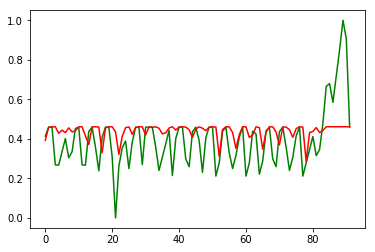

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:30:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-580000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:30:36
INFO:tensorflow:Saving dict for global step 580000: global_step = 580000, loss = 0.02886399
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 580000: ./outputdir/model.ckpt-580000
error on testset first run {'loss': 0.02886399, 'global_step': 580000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-580000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorfl

INFO:tensorflow:global_step/sec: 439.539
INFO:tensorflow:loss = 0.00078451564, step = 584701 (0.228 sec)
INFO:tensorflow:global_step/sec: 438.6
INFO:tensorflow:loss = 0.00059690385, step = 584801 (0.228 sec)
INFO:tensorflow:global_step/sec: 438.228
INFO:tensorflow:loss = 3.4603476e-05, step = 584901 (0.228 sec)
INFO:tensorflow:global_step/sec: 435.341
INFO:tensorflow:loss = 0.00046628359, step = 585001 (0.230 sec)
INFO:tensorflow:global_step/sec: 438.833
INFO:tensorflow:loss = 0.00024447695, step = 585101 (0.228 sec)
INFO:tensorflow:global_step/sec: 430.191
INFO:tensorflow:loss = 0.00030740415, step = 585201 (0.232 sec)
INFO:tensorflow:global_step/sec: 420.265
INFO:tensorflow:loss = 0.0117765255, step = 585301 (0.238 sec)
INFO:tensorflow:global_step/sec: 425.157
INFO:tensorflow:loss = 0.0006676786, step = 585401 (0.235 sec)
INFO:tensorflow:global_step/sec: 429.411
INFO:tensorflow:loss = 0.0003067785, step = 585501 (0.233 sec)
INFO:tensorflow:global_step/sec: 428.988
INFO:tensorflow:los

INFO:tensorflow:loss = 0.00010129741, step = 590001
INFO:tensorflow:global_step/sec: 163.54
INFO:tensorflow:loss = 0.00052041764, step = 590101 (0.612 sec)
INFO:tensorflow:global_step/sec: 434.071
INFO:tensorflow:loss = 0.00041364512, step = 590201 (0.231 sec)
INFO:tensorflow:global_step/sec: 427.454
INFO:tensorflow:loss = 0.00059663743, step = 590301 (0.233 sec)
INFO:tensorflow:global_step/sec: 419.97
INFO:tensorflow:loss = 0.0006112176, step = 590401 (0.238 sec)
INFO:tensorflow:global_step/sec: 443.799
INFO:tensorflow:loss = 0.00026532944, step = 590501 (0.225 sec)
INFO:tensorflow:global_step/sec: 447.479
INFO:tensorflow:loss = 0.00043963036, step = 590601 (0.224 sec)
INFO:tensorflow:global_step/sec: 451.957
INFO:tensorflow:loss = 0.00011181101, step = 590701 (0.221 sec)
INFO:tensorflow:global_step/sec: 435.768
INFO:tensorflow:loss = 0.0004937953, step = 590801 (0.229 sec)
INFO:tensorflow:global_step/sec: 453.76
INFO:tensorflow:loss = 0.000350386, step = 590901 (0.220 sec)
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-596000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.3898601825257923e-06
prediction at  8 [array([0.43760365])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-596000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 596000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0041134837, step = 596001
INFO:tensorflow:global_step/sec: 163.831
INFO:tensorflow:loss = 0.0002024517, step = 596101 (0.611 sec)
INFO:tensorflow:global_step/sec: 424.258
INFO:tensorflow:loss = 0.0007627946, step = 596201 (0.236 sec)
INFO:tensorflow:global_step/sec: 40

INFO:tensorflow:loss = 0.0002977127, step = 601501 (0.221 sec)
INFO:tensorflow:global_step/sec: 423.937
INFO:tensorflow:loss = 0.00025794352, step = 601601 (0.236 sec)
INFO:tensorflow:global_step/sec: 420.207
INFO:tensorflow:loss = 0.00039653183, step = 601701 (0.238 sec)
INFO:tensorflow:global_step/sec: 424.966
INFO:tensorflow:loss = 0.00035215216, step = 601801 (0.235 sec)
INFO:tensorflow:global_step/sec: 410.157
INFO:tensorflow:loss = 0.0005331676, step = 601901 (0.244 sec)
INFO:tensorflow:Saving checkpoints for 602000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0002332929.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-602000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 7.15058441643493e-07
prediction at  11 [array([0.43636613])]
dataset <TensorSliceDataset shapes: ((1,), 

INFO:tensorflow:loss = 0.0001084639, step = 606801 (0.249 sec)
INFO:tensorflow:global_step/sec: 421.714
INFO:tensorflow:loss = 2.962541e-06, step = 606901 (0.237 sec)
INFO:tensorflow:global_step/sec: 418.335
INFO:tensorflow:loss = 1.3347601e-05, step = 607001 (0.239 sec)
INFO:tensorflow:global_step/sec: 422.838
INFO:tensorflow:loss = 0.005064334, step = 607101 (0.236 sec)
INFO:tensorflow:global_step/sec: 434.728
INFO:tensorflow:loss = 0.00010369301, step = 607201 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.77
INFO:tensorflow:loss = 0.0007810469, step = 607301 (0.227 sec)
INFO:tensorflow:global_step/sec: 440.011
INFO:tensorflow:loss = 0.0006993586, step = 607401 (0.227 sec)
INFO:tensorflow:global_step/sec: 449.02
INFO:tensorflow:loss = 0.00069629453, step = 607501 (0.223 sec)
INFO:tensorflow:global_step/sec: 446.624
INFO:tensorflow:loss = 0.00032831464, step = 607601 (0.223 sec)
INFO:tensorflow:global_step/sec: 441.632
INFO:tensorflow:loss = 0.00076408574, step = 607701 (0.226 sec)

INFO:tensorflow:loss = 0.00069669564, step = 612101 (0.900 sec)
INFO:tensorflow:global_step/sec: 432.769
INFO:tensorflow:loss = 0.0003618054, step = 612201 (0.231 sec)
INFO:tensorflow:global_step/sec: 432.016
INFO:tensorflow:loss = 0.0005654524, step = 612301 (0.231 sec)
INFO:tensorflow:global_step/sec: 471.125
INFO:tensorflow:loss = 0.0003593663, step = 612401 (0.212 sec)
INFO:tensorflow:global_step/sec: 435.053
INFO:tensorflow:loss = 0.00058132893, step = 612501 (0.230 sec)
INFO:tensorflow:global_step/sec: 397.871
INFO:tensorflow:loss = 0.00036673577, step = 612601 (0.252 sec)
INFO:tensorflow:global_step/sec: 396.77
INFO:tensorflow:loss = 0.00050793483, step = 612701 (0.252 sec)
INFO:tensorflow:global_step/sec: 438.537
INFO:tensorflow:loss = 0.0003652158, step = 612801 (0.228 sec)
INFO:tensorflow:global_step/sec: 439.847
INFO:tensorflow:loss = 0.0006001148, step = 612901 (0.227 sec)
INFO:tensorflow:global_step/sec: 437.099
INFO:tensorflow:loss = 0.00038600937, step = 613001 (0.229 se

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.705992829480966e-05
prediction at  19 [array([0.44135529])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-618000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 618000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00037300494, step = 618001
INFO:tensorflow:global_step/sec: 166.057
INFO:tensorflow:loss = 0.00030794155, step = 618101 (0.603 sec)
INFO:tensorflow:global_step/sec: 470.77
INFO:tensorflow:loss = 0.0002775091, step = 618201 (0.212 sec)
INFO:tensorflow:global_step/sec: 476.075
INFO:tensorflow:loss = 0.000272424, step = 618301 (0.210 sec)
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-622000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 622000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00013575713, step = 622001
INFO:tensorflow:global_step/sec: 154.816
INFO:tensorflow:loss = 0.00016635912, step = 622101 (0.647 sec)
INFO:tensorflow:global_step/sec: 439.997
INFO:tensorflow:loss = 0.00743417, step = 622201 (0.227 sec)
INFO:tensorflow:global_step/sec: 426.121
INFO:tensorflow:loss = 0.00043722914, step = 622301 (0.235 sec)
INFO:tensorflow:global_step/sec: 396.189
INFO:tensorflow:loss = 0.0010461449, step = 622401 (0.252 sec)
INFO:tensorflow:global_step/sec: 466.157
INFO:tensorflow:loss = 7.2903174e-05, step = 622501 (0.215 sec)
INFO:tensorflow:global_step/sec: 452.004
INFO:tensorflow:loss = 7.870344e-05,

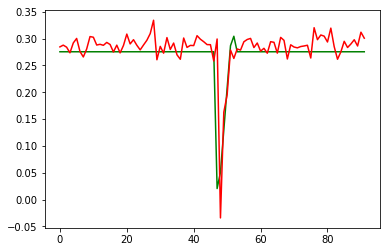

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:33:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-624000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:33:33
INFO:tensorflow:Saving dict for global step 624000: global_step = 624000, loss = 0.0010979977
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 624000: ./outputdir/model.ckpt-624000
error on testset first run {'loss': 0.0010979977, 'global_step': 624000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-624000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:loss = 7.018355e-06, step = 628601 (0.277 sec)
INFO:tensorflow:global_step/sec: 356.674
INFO:tensorflow:loss = 0.0009915768, step = 628701 (0.280 sec)
INFO:tensorflow:global_step/sec: 360.67
INFO:tensorflow:loss = 3.6093905e-05, step = 628801 (0.277 sec)
INFO:tensorflow:global_step/sec: 386.06
INFO:tensorflow:loss = 2.095585e-05, step = 628901 (0.259 sec)
INFO:tensorflow:global_step/sec: 437.03
INFO:tensorflow:loss = 1.7512903e-07, step = 629001 (0.229 sec)
INFO:tensorflow:global_step/sec: 431.869
INFO:tensorflow:loss = 3.2133143e-05, step = 629101 (0.232 sec)
INFO:tensorflow:global_step/sec: 440.234
INFO:tensorflow:loss = 0.00027206598, step = 629201 (0.228 sec)
INFO:tensorflow:global_step/sec: 444.692
INFO:tensorflow:loss = 0.00033777242, step = 629301 (0.224 sec)
INFO:tensorflow:global_step/sec: 440.699
INFO:tensorflow:loss = 0.0009171488, step = 629401 (0.227 sec)
INFO:tensorflow:global_step/sec: 445.72
INFO:tensorflow:loss = 0.0002799112, step = 629501 (0.224 sec)


INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 634000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00044901558, step = 634001
INFO:tensorflow:global_step/sec: 143.837
INFO:tensorflow:loss = 8.991673e-05, step = 634101 (0.697 sec)
INFO:tensorflow:global_step/sec: 408.472
INFO:tensorflow:loss = 1.5582022e-05, step = 634201 (0.245 sec)
INFO:tensorflow:global_step/sec: 402.165
INFO:tensorflow:loss = 0.0006450441, step = 634301 (0.248 sec)
INFO:tensorflow:global_step/sec: 351.459
INFO:tensorflow:loss = 0.00026755064, step = 634401 (0.285 sec)
INFO:tensorflow:global_step/sec: 354.478
INFO:tensorflow:loss = 2.664379e-05, step = 634501 (0.282 sec)
INFO:tensorflow:global_step/sec: 414.012
INFO:tensorflow:loss = 0.0008325162, step = 634601 (0.242 sec)
INFO:tensorflow:global_step/sec: 340.34
INFO:tensorflow:loss = 0.00021841888, step = 634701 (0.293 sec)
INFO:tensorflow:global_step/sec: 341.217
INFO:tensorflow:loss = 2.1353026e-06, step = 634801 (0.293

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-640000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.677746875528121e-07
prediction at  8 [array([0.28412554])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-640000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 640000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 8.746942e-06, step = 640001
INFO:tensorflow:global_step/sec: 160.445
INFO:tensorflow:loss = 3.489616e-05, step = 640101 (0.624 sec)
INFO:tensorflow:global_step/se

INFO:tensorflow:loss = 0.00010725433, step = 645401 (0.221 sec)
INFO:tensorflow:global_step/sec: 437.193
INFO:tensorflow:loss = 5.5571636e-10, step = 645501 (0.229 sec)
INFO:tensorflow:global_step/sec: 441.889
INFO:tensorflow:loss = 3.3426793e-05, step = 645601 (0.226 sec)
INFO:tensorflow:global_step/sec: 445.957
INFO:tensorflow:loss = 0.00059330073, step = 645701 (0.224 sec)
INFO:tensorflow:global_step/sec: 453.392
INFO:tensorflow:loss = 0.0004873647, step = 645801 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.465
INFO:tensorflow:loss = 0.000582577, step = 645901 (0.221 sec)
INFO:tensorflow:Saving checkpoints for 646000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.769426e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-646000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 

INFO:tensorflow:loss = 0.0007236674, step = 650701 (0.219 sec)
INFO:tensorflow:global_step/sec: 450.008
INFO:tensorflow:loss = 0.00028883046, step = 650801 (0.222 sec)
INFO:tensorflow:global_step/sec: 446.576
INFO:tensorflow:loss = 8.4475147e-07, step = 650901 (0.224 sec)
INFO:tensorflow:global_step/sec: 447.337
INFO:tensorflow:loss = 2.3616212e-06, step = 651001 (0.224 sec)
INFO:tensorflow:global_step/sec: 436.424
INFO:tensorflow:loss = 0.00044197676, step = 651101 (0.229 sec)
INFO:tensorflow:global_step/sec: 405.435
INFO:tensorflow:loss = 6.396403e-05, step = 651201 (0.247 sec)
INFO:tensorflow:global_step/sec: 422.524
INFO:tensorflow:loss = 0.00011131051, step = 651301 (0.237 sec)
INFO:tensorflow:global_step/sec: 437.225
INFO:tensorflow:loss = 0.0006652735, step = 651401 (0.229 sec)
INFO:tensorflow:global_step/sec: 405.131
INFO:tensorflow:loss = 1.0378772e-06, step = 651501 (0.247 sec)
INFO:tensorflow:global_step/sec: 425.646
INFO:tensorflow:loss = 0.00017447336, step = 651601 (0.236

INFO:tensorflow:loss = 0.0004915013, step = 656001
INFO:tensorflow:global_step/sec: 163.334
INFO:tensorflow:loss = 0.00042229076, step = 656101 (0.613 sec)
INFO:tensorflow:global_step/sec: 455.013
INFO:tensorflow:loss = 0.00064220274, step = 656201 (0.220 sec)
INFO:tensorflow:global_step/sec: 452.002
INFO:tensorflow:loss = 0.00029836508, step = 656301 (0.221 sec)
INFO:tensorflow:global_step/sec: 441.114
INFO:tensorflow:loss = 0.0003529199, step = 656401 (0.227 sec)
INFO:tensorflow:global_step/sec: 457.643
INFO:tensorflow:loss = 0.0004893603, step = 656501 (0.219 sec)
INFO:tensorflow:global_step/sec: 480.815
INFO:tensorflow:loss = 0.00088794215, step = 656601 (0.208 sec)
INFO:tensorflow:global_step/sec: 462.987
INFO:tensorflow:loss = 0.0004821862, step = 656701 (0.216 sec)
INFO:tensorflow:global_step/sec: 459.882
INFO:tensorflow:loss = 0.000602563, step = 656801 (0.217 sec)
INFO:tensorflow:global_step/sec: 457.558
INFO:tensorflow:loss = 0.00018006402, step = 656901 (0.219 sec)
INFO:tens

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-662000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.6991868330171147e-05
prediction at  19 [array([0.28072446])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-662000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 662000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.918218e-05, step = 662001
INFO:tensorflow:global_step/sec: 167.99
INFO:tensorflow:loss = 0.0004400979, step = 662101 (0.596 sec)
INFO:tensorflow:global_step/sec: 442.102
INFO:tensorflow:loss = 0.00032525673, step = 662201 (0.226 s

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-666000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 666000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0013936247, step = 666001
INFO:tensorflow:global_step/sec: 168.107
INFO:tensorflow:loss = 2.5144197e-06, step = 666101 (0.596 sec)
INFO:tensorflow:global_step/sec: 455.088
INFO:tensorflow:loss = 0.0001814849, step = 666201 (0.220 sec)
INFO:tensorflow:global_step/sec: 446.847
INFO:tensorflow:loss = 0.1778037, step = 666301 (0.224 sec)
INFO:tensorflow:global_step/sec: 429.286
INFO:tensorflow:loss = 1.6020081e-08, step = 666401 (0.233 sec)
INFO:tensorflow:global_step/sec: 429.3
INFO:tensorflow:loss = 0.00025464766, step = 666501 (0.233 sec)
INFO:tensorflow:global_step/sec: 426.177
INFO:tensorflow:loss = 0.00024377568, st

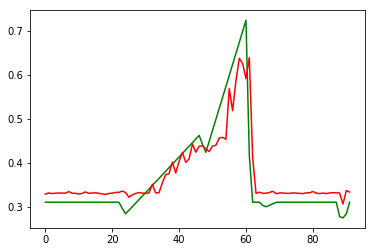

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:46:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-668000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:46:20
INFO:tensorflow:Saving dict for global step 668000: global_step = 668000, loss = 0.0022378888
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 668000: ./outputdir/model.ckpt-668000
error on testset first run {'loss': 0.0022378888, 'global_step': 668000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-668000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:loss = 4.0933924e-07, step = 672601 (0.303 sec)
INFO:tensorflow:global_step/sec: 439.605
INFO:tensorflow:loss = 2.5267216e-06, step = 672701 (0.227 sec)
INFO:tensorflow:global_step/sec: 450.102
INFO:tensorflow:loss = 2.0418465e-06, step = 672801 (0.222 sec)
INFO:tensorflow:global_step/sec: 451.378
INFO:tensorflow:loss = 4.9468312e-08, step = 672901 (0.221 sec)
INFO:tensorflow:global_step/sec: 451.947
INFO:tensorflow:loss = 1.2943697e-06, step = 673001 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.747
INFO:tensorflow:loss = 0.005562614, step = 673101 (0.220 sec)
INFO:tensorflow:global_step/sec: 393.955
INFO:tensorflow:loss = 4.244198e-06, step = 673201 (0.254 sec)
INFO:tensorflow:global_step/sec: 454.73
INFO:tensorflow:loss = 0.004838891, step = 673301 (0.220 sec)
INFO:tensorflow:global_step/sec: 450.26
INFO:tensorflow:loss = 6.47578e-07, step = 673401 (0.222 sec)
INFO:tensorflow:global_step/sec: 451.194
INFO:tensorflow:loss = 2.65411e-06, step = 673501 (0.221 sec)
IN

INFO:tensorflow:Saving checkpoints for 678000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.01763905, step = 678001
INFO:tensorflow:global_step/sec: 162.745
INFO:tensorflow:loss = 5.7859734e-06, step = 678101 (0.615 sec)
INFO:tensorflow:global_step/sec: 455.886
INFO:tensorflow:loss = 5.7792367e-06, step = 678201 (0.219 sec)
INFO:tensorflow:global_step/sec: 453.622
INFO:tensorflow:loss = 8.434069e-06, step = 678301 (0.221 sec)
INFO:tensorflow:global_step/sec: 457.716
INFO:tensorflow:loss = 2.3585564e-05, step = 678401 (0.218 sec)
INFO:tensorflow:global_step/sec: 445.287
INFO:tensorflow:loss = 6.982714e-06, step = 678501 (0.225 sec)
INFO:tensorflow:global_step/sec: 448.029
INFO:tensorflow:loss = 5.0090684e-06, step = 678601 (0.223 sec)
INFO:tensorflow:global_step/sec: 445.04
INFO:tensorflow:loss = 4.939278e-06, step = 678701 (0.225 sec)
INFO:tensorflow:global_step/sec: 443.618
INFO:tensorflow:loss = 5.4034003e-06, step = 678801 (0.226 sec)
INFO:tensorflow:global_step/sec: 456.878

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-684000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.7353489402027664e-06
prediction at  8 [array([0.33405053])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-684000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 684000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.63037e-06, step = 684001
INFO:tensorflow:global_step/sec: 160.572
INFO:tensorflow:loss = 1.0382363e-05, step = 684101 (0.624 sec)
INFO:tensorflow:global_step/sec: 450.298
INFO:tensorflow:loss =

INFO:tensorflow:global_step/sec: 454.252
INFO:tensorflow:loss = 8.5629506e-07, step = 689501 (0.220 sec)
INFO:tensorflow:global_step/sec: 456.782
INFO:tensorflow:loss = 3.1797165e-07, step = 689601 (0.219 sec)
INFO:tensorflow:global_step/sec: 447.367
INFO:tensorflow:loss = 2.760514e-06, step = 689701 (0.224 sec)
INFO:tensorflow:global_step/sec: 458.886
INFO:tensorflow:loss = 5.7742227e-08, step = 689801 (0.218 sec)
INFO:tensorflow:global_step/sec: 448.679
INFO:tensorflow:loss = 1.13176775e-05, step = 689901 (0.223 sec)
INFO:tensorflow:Saving checkpoints for 690000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.2294787e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-690000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 7.215178051480445e-06
prediction at  11 [array([0.3336867])]

INFO:tensorflow:global_step/sec: 439.874
INFO:tensorflow:loss = 8.402767e-06, step = 694801 (0.227 sec)
INFO:tensorflow:global_step/sec: 422.976
INFO:tensorflow:loss = 5.1222914e-06, step = 694901 (0.237 sec)
INFO:tensorflow:global_step/sec: 408.58
INFO:tensorflow:loss = 3.852158e-06, step = 695001 (0.244 sec)
INFO:tensorflow:global_step/sec: 396.584
INFO:tensorflow:loss = 2.8761817e-06, step = 695101 (0.252 sec)
INFO:tensorflow:global_step/sec: 432.463
INFO:tensorflow:loss = 3.1554812e-06, step = 695201 (0.232 sec)
INFO:tensorflow:global_step/sec: 423.209
INFO:tensorflow:loss = 4.3252814e-05, step = 695301 (0.236 sec)
INFO:tensorflow:global_step/sec: 425.902
INFO:tensorflow:loss = 2.0645648e-06, step = 695401 (0.235 sec)
INFO:tensorflow:global_step/sec: 431.022
INFO:tensorflow:loss = 1.1779003e-06, step = 695501 (0.232 sec)
INFO:tensorflow:global_step/sec: 432.391
INFO:tensorflow:loss = 1.9507313e-06, step = 695601 (0.231 sec)
INFO:tensorflow:global_step/sec: 429.766
INFO:tensorflow:l

INFO:tensorflow:global_step/sec: 168.571
INFO:tensorflow:loss = 1.2966084e-06, step = 700101 (0.594 sec)
INFO:tensorflow:global_step/sec: 445.931
INFO:tensorflow:loss = 8.9477545e-09, step = 700201 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.328
INFO:tensorflow:loss = 1.5895845e-06, step = 700301 (0.230 sec)
INFO:tensorflow:global_step/sec: 396.448
INFO:tensorflow:loss = 1.3260944e-08, step = 700401 (0.253 sec)
INFO:tensorflow:global_step/sec: 441.455
INFO:tensorflow:loss = 1.7266333e-06, step = 700501 (0.227 sec)
INFO:tensorflow:global_step/sec: 438.462
INFO:tensorflow:loss = 4.0948667e-10, step = 700601 (0.228 sec)
INFO:tensorflow:global_step/sec: 448.008
INFO:tensorflow:loss = 1.6194068e-06, step = 700701 (0.223 sec)
INFO:tensorflow:global_step/sec: 387.385
INFO:tensorflow:loss = 4.7805315e-09, step = 700801 (0.259 sec)
INFO:tensorflow:global_step/sec: 452.64
INFO:tensorflow:loss = 1.9545628e-06, step = 700901 (0.220 sec)
INFO:tensorflow:global_step/sec: 463.108
INFO:tensorflow

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.0596646774183435e-07
prediction at  19 [array([0.33178795])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-706000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 706000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 8.052333e-09, step = 706001
INFO:tensorflow:global_step/sec: 165.973
INFO:tensorflow:loss = 1.0546432e-06, step = 706101 (0.603 sec)
INFO:tensorflow:global_step/sec: 467.303
INFO:tensorflow:loss = 1.058503e-06, step = 706201 (0.214 sec)
INFO:tensorflow:global_step/sec: 468.02
INFO:tensorflow:loss = 1.1502481e-06, step = 706301 (0.214 sec)


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-710000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 710000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.05904234, step = 710001
INFO:tensorflow:global_step/sec: 167.081
INFO:tensorflow:loss = 0.00026386976, step = 710101 (0.600 sec)
INFO:tensorflow:global_step/sec: 442.605
INFO:tensorflow:loss = 0.016511979, step = 710201 (0.226 sec)
INFO:tensorflow:global_step/sec: 439.686
INFO:tensorflow:loss = 0.011237966, step = 710301 (0.227 sec)
INFO:tensorflow:global_step/sec: 446
INFO:tensorflow:loss = 8.8729045e-08, step = 710401 (0.224 sec)
INFO:tensorflow:global_step/sec: 411.448
INFO:tensorflow:loss = 6.132351e-07, step = 710501 (0.243 sec)
INFO:tensorflow:global_step/sec: 432.688
INFO:tensorflow:loss = 0.001976486, step = 7

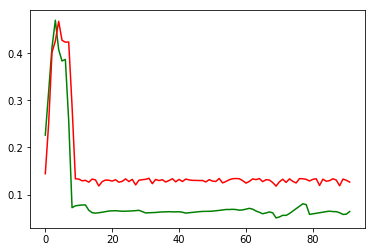

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:49:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-712000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:49:11
INFO:tensorflow:Saving dict for global step 712000: global_step = 712000, loss = 0.0046050195
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 712000: ./outputdir/model.ckpt-712000
error on testset first run {'loss': 0.0046050195, 'global_step': 712000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-712000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:loss = 6.8284426e-05, step = 716601 (0.228 sec)
INFO:tensorflow:global_step/sec: 440.527
INFO:tensorflow:loss = 1.483006e-05, step = 716701 (0.227 sec)
INFO:tensorflow:global_step/sec: 402.661
INFO:tensorflow:loss = 3.534587e-06, step = 716801 (0.248 sec)
INFO:tensorflow:global_step/sec: 437.178
INFO:tensorflow:loss = 2.178854e-06, step = 716901 (0.229 sec)
INFO:tensorflow:global_step/sec: 445.149
INFO:tensorflow:loss = 1.6877597e-05, step = 717001 (0.224 sec)
INFO:tensorflow:global_step/sec: 442.098
INFO:tensorflow:loss = 2.4575004e-07, step = 717101 (0.226 sec)
INFO:tensorflow:global_step/sec: 445.533
INFO:tensorflow:loss = 1.6969057e-05, step = 717201 (0.224 sec)
INFO:tensorflow:global_step/sec: 437.873
INFO:tensorflow:loss = 1.4783615e-07, step = 717301 (0.228 sec)
INFO:tensorflow:global_step/sec: 427.725
INFO:tensorflow:loss = 4.7575777e-06, step = 717401 (0.234 sec)
INFO:tensorflow:global_step/sec: 437.116
INFO:tensorflow:loss = 4.942188e-07, step = 717501 (0.229 

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 722000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.9079715e-07, step = 722001
INFO:tensorflow:global_step/sec: 161.696
INFO:tensorflow:loss = 2.0339332e-06, step = 722101 (0.619 sec)
INFO:tensorflow:global_step/sec: 462.233
INFO:tensorflow:loss = 1.4335583e-07, step = 722201 (0.216 sec)
INFO:tensorflow:global_step/sec: 467.373
INFO:tensorflow:loss = 1.7917933e-05, step = 722301 (0.214 sec)
INFO:tensorflow:global_step/sec: 483.993
INFO:tensorflow:loss = 4.121203e-06, step = 722401 (0.207 sec)
INFO:tensorflow:global_step/sec: 462.744
INFO:tensorflow:loss = 5.9022444e-05, step = 722501 (0.216 sec)
INFO:tensorflow:global_step/sec: 456.284
INFO:tensorflow:loss = 1.2804056e-05, step = 722601 (0.219 sec)
INFO:tensorflow:global_step/sec: 395.983
INFO:tensorflow:loss = 2.9112565e-05, step = 722701 (0.252 sec)
INFO:tensorflow:global_step/sec: 447.452
INFO:tensorflow:loss = 1.3049966e-05, step = 722801 (0

INFO:tensorflow:Loss for final step: 2.5509835e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-728000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.7964411221866278e-05
prediction at  8 [array([0.12931048])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-728000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 728000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.473675e-05, step = 728001
INFO:tensorflow:global_step/sec: 162.398
INFO:tensorflow:loss = 2.4081971e-06, st

INFO:tensorflow:global_step/sec: 453.783
INFO:tensorflow:loss = 8.435887e-06, step = 733401 (0.220 sec)
INFO:tensorflow:global_step/sec: 449.456
INFO:tensorflow:loss = 2.6484324e-06, step = 733501 (0.222 sec)
INFO:tensorflow:global_step/sec: 453.996
INFO:tensorflow:loss = 2.1826388e-06, step = 733601 (0.220 sec)
INFO:tensorflow:global_step/sec: 453.073
INFO:tensorflow:loss = 1.0568479e-08, step = 733701 (0.221 sec)
INFO:tensorflow:global_step/sec: 443.668
INFO:tensorflow:loss = 8.919586e-07, step = 733801 (0.225 sec)
INFO:tensorflow:global_step/sec: 438.531
INFO:tensorflow:loss = 1.3836075e-05, step = 733901 (0.228 sec)
INFO:tensorflow:Saving checkpoints for 734000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.088721e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-734000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done runn

INFO:tensorflow:global_step/sec: 453.034
INFO:tensorflow:loss = 5.5099126e-06, step = 738701 (0.221 sec)
INFO:tensorflow:global_step/sec: 429.978
INFO:tensorflow:loss = 2.1001168e-05, step = 738801 (0.233 sec)
INFO:tensorflow:global_step/sec: 413.319
INFO:tensorflow:loss = 4.7085614e-06, step = 738901 (0.242 sec)
INFO:tensorflow:global_step/sec: 430.602
INFO:tensorflow:loss = 1.3006498e-06, step = 739001 (0.232 sec)
INFO:tensorflow:global_step/sec: 437.072
INFO:tensorflow:loss = 4.2943843e-06, step = 739101 (0.229 sec)
INFO:tensorflow:global_step/sec: 433.791
INFO:tensorflow:loss = 1.8737924e-06, step = 739201 (0.231 sec)
INFO:tensorflow:global_step/sec: 450.043
INFO:tensorflow:loss = 6.8257086e-06, step = 739301 (0.222 sec)
INFO:tensorflow:global_step/sec: 440.201
INFO:tensorflow:loss = 6.2137184e-11, step = 739401 (0.227 sec)
INFO:tensorflow:global_step/sec: 433.652
INFO:tensorflow:loss = 4.6951653e-05, step = 739501 (0.231 sec)
INFO:tensorflow:global_step/sec: 380.629
INFO:tensorflo

INFO:tensorflow:loss = 1.2028725e-07, step = 744001
INFO:tensorflow:global_step/sec: 167.171
INFO:tensorflow:loss = 9.18308e-06, step = 744101 (0.599 sec)
INFO:tensorflow:global_step/sec: 457.712
INFO:tensorflow:loss = 6.073564e-07, step = 744201 (0.219 sec)
INFO:tensorflow:global_step/sec: 462.974
INFO:tensorflow:loss = 7.450606e-06, step = 744301 (0.215 sec)
INFO:tensorflow:global_step/sec: 453.871
INFO:tensorflow:loss = 2.6984844e-07, step = 744401 (0.220 sec)
INFO:tensorflow:global_step/sec: 447.642
INFO:tensorflow:loss = 8.033033e-06, step = 744501 (0.224 sec)
INFO:tensorflow:global_step/sec: 425.92
INFO:tensorflow:loss = 4.0261722e-07, step = 744601 (0.235 sec)
INFO:tensorflow:global_step/sec: 409.985
INFO:tensorflow:loss = 7.5885537e-06, step = 744701 (0.244 sec)
INFO:tensorflow:global_step/sec: 441.508
INFO:tensorflow:loss = 5.1278516e-07, step = 744801 (0.227 sec)
INFO:tensorflow:global_step/sec: 452.266
INFO:tensorflow:loss = 7.569765e-06, step = 744901 (0.221 sec)
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-750000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.108398424089609e-06
prediction at  19 [array([0.1315573])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-750000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 750000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.287018e-06, step = 750001
INFO:tensorflow:global_step/sec: 167.775
INFO:tensorflow:loss = 5.129241e-06, step = 750101 (0.597 sec)
INFO:tensorflow:global_step/sec: 364.723
INFO:tensorflow:loss = 4.9867485e-06, step = 750201 (0.274 se

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-754000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 754000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.013557093, step = 754001
INFO:tensorflow:global_step/sec: 160.215
INFO:tensorflow:loss = 2.0480533e-05, step = 754101 (0.625 sec)
INFO:tensorflow:global_step/sec: 456.852
INFO:tensorflow:loss = 5.6112503e-06, step = 754201 (0.219 sec)
INFO:tensorflow:global_step/sec: 438.999
INFO:tensorflow:loss = 2.5260504e-05, step = 754301 (0.228 sec)
INFO:tensorflow:global_step/sec: 421.553
INFO:tensorflow:loss = 7.2080006e-06, step = 754401 (0.236 sec)
INFO:tensorflow:global_step/sec: 433.497
INFO:tensorflow:loss = 4.169989e-06, step = 754501 (0.231 sec)
INFO:tensorflow:global_step/sec: 393
INFO:tensorflow:loss = 1.938181e-06, st

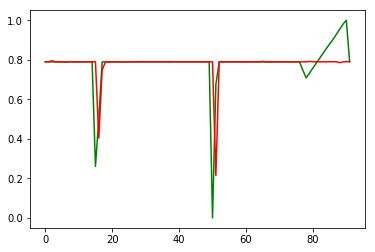

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:52:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-756000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:52:03
INFO:tensorflow:Saving dict for global step 756000: global_step = 756000, loss = 0.014533053
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 756000: ./outputdir/model.ckpt-756000
error on testset first run {'loss': 0.014533053, 'global_step': 756000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-756000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:loss = 7.741443e-08, step = 760601 (0.220 sec)
INFO:tensorflow:global_step/sec: 445.899
INFO:tensorflow:loss = 1.4987131e-07, step = 760701 (0.224 sec)
INFO:tensorflow:global_step/sec: 420.011
INFO:tensorflow:loss = 7.391484e-07, step = 760801 (0.238 sec)
INFO:tensorflow:global_step/sec: 429.616
INFO:tensorflow:loss = 4.8374105e-08, step = 760901 (0.233 sec)
INFO:tensorflow:global_step/sec: 459.664
INFO:tensorflow:loss = 1.6874624e-06, step = 761001 (0.218 sec)
INFO:tensorflow:global_step/sec: 469.896
INFO:tensorflow:loss = 4.887355e-08, step = 761101 (0.213 sec)
INFO:tensorflow:global_step/sec: 451.425
INFO:tensorflow:loss = 3.9993644e-09, step = 761201 (0.222 sec)
INFO:tensorflow:global_step/sec: 462.114
INFO:tensorflow:loss = 5.372279e-07, step = 761301 (0.217 sec)
INFO:tensorflow:global_step/sec: 451.794
INFO:tensorflow:loss = 6.7535666e-08, step = 761401 (0.221 sec)
INFO:tensorflow:global_step/sec: 439.131
INFO:tensorflow:loss = 2.037493e-07, step = 761501 (0.228 s

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 766000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.7472597e-06, step = 766001
INFO:tensorflow:global_step/sec: 164.768
INFO:tensorflow:loss = 5.7211516e-09, step = 766101 (0.608 sec)
INFO:tensorflow:global_step/sec: 381.806
INFO:tensorflow:loss = 2.5937666e-08, step = 766201 (0.262 sec)
INFO:tensorflow:global_step/sec: 433.105
INFO:tensorflow:loss = 1.4172434e-07, step = 766301 (0.231 sec)
INFO:tensorflow:global_step/sec: 407.659
INFO:tensorflow:loss = 3.979895e-08, step = 766401 (0.245 sec)
INFO:tensorflow:global_step/sec: 389.654
INFO:tensorflow:loss = 5.276958e-08, step = 766501 (0.257 sec)
INFO:tensorflow:global_step/sec: 406.86
INFO:tensorflow:loss = 4.6414392e-09, step = 766601 (0.246 sec)
INFO:tensorflow:global_step/sec: 409.804
INFO:tensorflow:loss = 1.310288e-07, step = 766701 (0.244 sec)
INFO:tensorflow:global_step/sec: 402.424
INFO:tensorflow:loss = 2.1697923e-07, step = 766801 (0.24

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-772000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.2110186195881164e-09
prediction at  8 [array([0.79029038])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-772000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 772000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.7951648e-07, step = 772001
INFO:tensorflow:global_step/sec: 162.363
INFO:tensorflow:loss = 6.802117e-07, step = 772101 (0.617 sec)
INFO:tensorflow:global_step/

INFO:tensorflow:loss = 2.0429539e-08, step = 777401 (0.237 sec)
INFO:tensorflow:global_step/sec: 411.029
INFO:tensorflow:loss = 4.9667367e-08, step = 777501 (0.243 sec)
INFO:tensorflow:global_step/sec: 434.435
INFO:tensorflow:loss = 1.4280346e-07, step = 777601 (0.231 sec)
INFO:tensorflow:global_step/sec: 411.872
INFO:tensorflow:loss = 2.4022643e-07, step = 777701 (0.243 sec)
INFO:tensorflow:global_step/sec: 438.46
INFO:tensorflow:loss = 3.2388067e-07, step = 777801 (0.228 sec)
INFO:tensorflow:global_step/sec: 452.292
INFO:tensorflow:loss = 1.9565235e-07, step = 777901 (0.223 sec)
INFO:tensorflow:Saving checkpoints for 778000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.282659e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-778000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  1

INFO:tensorflow:loss = 8.849838e-08, step = 782701 (0.227 sec)
INFO:tensorflow:global_step/sec: 465.584
INFO:tensorflow:loss = 1.3775835e-07, step = 782801 (0.215 sec)
INFO:tensorflow:global_step/sec: 453.788
INFO:tensorflow:loss = 3.4996228e-07, step = 782901 (0.220 sec)
INFO:tensorflow:global_step/sec: 455.916
INFO:tensorflow:loss = 3.1190584e-08, step = 783001 (0.219 sec)
INFO:tensorflow:global_step/sec: 461.74
INFO:tensorflow:loss = 1.0522573e-08, step = 783101 (0.217 sec)
INFO:tensorflow:global_step/sec: 447.113
INFO:tensorflow:loss = 1.5326155e-08, step = 783201 (0.224 sec)
INFO:tensorflow:global_step/sec: 473.961
INFO:tensorflow:loss = 1.4168254e-08, step = 783301 (0.211 sec)
INFO:tensorflow:global_step/sec: 406.615
INFO:tensorflow:loss = 1.3393588e-07, step = 783401 (0.247 sec)
INFO:tensorflow:global_step/sec: 432.1
INFO:tensorflow:loss = 2.3137012e-07, step = 783501 (0.231 sec)
INFO:tensorflow:global_step/sec: 446.791
INFO:tensorflow:loss = 8.240622e-09, step = 783601 (0.224 s

INFO:tensorflow:loss = 1.3219648e-09, step = 788001
INFO:tensorflow:global_step/sec: 166.598
INFO:tensorflow:loss = 3.3070794e-08, step = 788101 (0.601 sec)
INFO:tensorflow:global_step/sec: 448.724
INFO:tensorflow:loss = 1.7637844e-07, step = 788201 (0.223 sec)
INFO:tensorflow:global_step/sec: 446.548
INFO:tensorflow:loss = 5.467601e-08, step = 788301 (0.224 sec)
INFO:tensorflow:global_step/sec: 430.023
INFO:tensorflow:loss = 1.8187771e-07, step = 788401 (0.233 sec)
INFO:tensorflow:global_step/sec: 432.059
INFO:tensorflow:loss = 2.7734032e-08, step = 788501 (0.232 sec)
INFO:tensorflow:global_step/sec: 427.536
INFO:tensorflow:loss = 1.987226e-07, step = 788601 (0.234 sec)
INFO:tensorflow:global_step/sec: 422.964
INFO:tensorflow:loss = 2.603375e-08, step = 788701 (0.237 sec)
INFO:tensorflow:global_step/sec: 393.111
INFO:tensorflow:loss = 2.1714585e-07, step = 788801 (0.255 sec)
INFO:tensorflow:global_step/sec: 436.487
INFO:tensorflow:loss = 2.0039526e-08, step = 788901 (0.229 sec)
INFO:t

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-794000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 3.625143491309763e-07
prediction at  19 [array([0.78991364])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-794000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 794000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.9386789e-08, step = 794001
INFO:tensorflow:global_step/sec: 163.674
INFO:tensorflow:loss = 2.1277955e-07, step = 794101 (0.612 sec)
INFO:tensorflow:global_step/sec: 467.419
INFO:tensorflow:loss = 1.9302476e-07, step = 794201 (0.213

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-798000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 798000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.06308663, step = 798001
INFO:tensorflow:global_step/sec: 167.113
INFO:tensorflow:loss = 2.6836142e-06, step = 798101 (0.599 sec)
INFO:tensorflow:global_step/sec: 460.204
INFO:tensorflow:loss = 1.9093548e-07, step = 798201 (0.217 sec)
INFO:tensorflow:global_step/sec: 436.216
INFO:tensorflow:loss = 0.03127572, step = 798301 (0.229 sec)
INFO:tensorflow:global_step/sec: 438.756
INFO:tensorflow:loss = 1.1198314e-06, step = 798401 (0.228 sec)
INFO:tensorflow:global_step/sec: 432.597
INFO:tensorflow:loss = 3.840819e-08, step = 798501 (0.231 sec)
INFO:tensorflow:global_step/sec: 437.115
INFO:tensorflow:loss = 4.9635815e-09, s

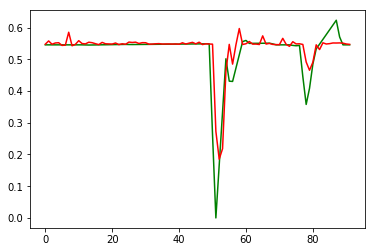

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:54:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-800000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:54:58
INFO:tensorflow:Saving dict for global step 800000: global_step = 800000, loss = 0.0031828117
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 800000: ./outputdir/model.ckpt-800000
error on testset first run {'loss': 0.0031828117, 'global_step': 800000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-800000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:loss = 5.822494e-05, step = 804601 (0.259 sec)
INFO:tensorflow:global_step/sec: 447.445
INFO:tensorflow:loss = 2.1936237e-05, step = 804701 (0.224 sec)
INFO:tensorflow:global_step/sec: 395.477
INFO:tensorflow:loss = 4.7278445e-05, step = 804801 (0.253 sec)
INFO:tensorflow:global_step/sec: 455.496
INFO:tensorflow:loss = 0.0049609323, step = 804901 (0.219 sec)
INFO:tensorflow:global_step/sec: 446.554
INFO:tensorflow:loss = 9.604691e-06, step = 805001 (0.224 sec)
INFO:tensorflow:global_step/sec: 450.516
INFO:tensorflow:loss = 5.778807e-06, step = 805101 (0.222 sec)
INFO:tensorflow:global_step/sec: 457.354
INFO:tensorflow:loss = 7.065154e-07, step = 805201 (0.219 sec)
INFO:tensorflow:global_step/sec: 403.564
INFO:tensorflow:loss = 1.3687486e-05, step = 805301 (0.248 sec)
INFO:tensorflow:global_step/sec: 441.747
INFO:tensorflow:loss = 2.546372e-06, step = 805401 (0.226 sec)
INFO:tensorflow:global_step/sec: 454.634
INFO:tensorflow:loss = 5.4308923e-05, step = 805501 (0.220 se

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 810000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 8.463958e-07, step = 810001
INFO:tensorflow:global_step/sec: 169.523
INFO:tensorflow:loss = 3.4053446e-05, step = 810101 (0.591 sec)
INFO:tensorflow:global_step/sec: 460.388
INFO:tensorflow:loss = 2.7280103e-05, step = 810201 (0.217 sec)
INFO:tensorflow:global_step/sec: 451.759
INFO:tensorflow:loss = 3.0851777e-05, step = 810301 (0.221 sec)
INFO:tensorflow:global_step/sec: 455.938
INFO:tensorflow:loss = 1.0434668e-05, step = 810401 (0.219 sec)
INFO:tensorflow:global_step/sec: 449.118
INFO:tensorflow:loss = 6.1269144e-05, step = 810501 (0.223 sec)
INFO:tensorflow:global_step/sec: 434.214
INFO:tensorflow:loss = 9.868039e-06, step = 810601 (0.230 sec)
INFO:tensorflow:global_step/sec: 415.093
INFO:tensorflow:loss = 8.507114e-05, step = 810701 (0.241 sec)
INFO:tensorflow:global_step/sec: 450.458
INFO:tensorflow:loss = 1.7433673e-05, step = 810801 (0.2

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-816000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 7.770849813683306e-06
prediction at  8 [array([0.54621428])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-816000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 816000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.5081903e-06, step = 816001
INFO:tensorflow:global_step/sec: 161.571
INFO:tensorflow:loss = 5.0101346e-05, step = 816101 (0.620 sec)
INFO:tensorflow:global_step/

INFO:tensorflow:loss = 1.2790622e-05, step = 821401 (0.260 sec)
INFO:tensorflow:global_step/sec: 386.438
INFO:tensorflow:loss = 4.0214836e-05, step = 821501 (0.259 sec)
INFO:tensorflow:global_step/sec: 399.798
INFO:tensorflow:loss = 1.0041051e-05, step = 821601 (0.250 sec)
INFO:tensorflow:global_step/sec: 390.828
INFO:tensorflow:loss = 3.7138758e-05, step = 821701 (0.256 sec)
INFO:tensorflow:global_step/sec: 398.069
INFO:tensorflow:loss = 1.3763892e-05, step = 821801 (0.251 sec)
INFO:tensorflow:global_step/sec: 399.577
INFO:tensorflow:loss = 8.613437e-05, step = 821901 (0.250 sec)
INFO:tensorflow:Saving checkpoints for 822000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00016097125.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-822000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  

INFO:tensorflow:loss = 0.00012954413, step = 826701 (0.215 sec)
INFO:tensorflow:global_step/sec: 462.192
INFO:tensorflow:loss = 0.00022054081, step = 826801 (0.217 sec)
INFO:tensorflow:global_step/sec: 460.915
INFO:tensorflow:loss = 0.0041212896, step = 826901 (0.217 sec)
INFO:tensorflow:global_step/sec: 440.013
INFO:tensorflow:loss = 9.084365e-06, step = 827001 (0.228 sec)
INFO:tensorflow:global_step/sec: 422.996
INFO:tensorflow:loss = 1.9890864e-05, step = 827101 (0.236 sec)
INFO:tensorflow:global_step/sec: 471.558
INFO:tensorflow:loss = 1.1823505e-05, step = 827201 (0.212 sec)
INFO:tensorflow:global_step/sec: 435.5
INFO:tensorflow:loss = 6.965607e-05, step = 827301 (0.230 sec)
INFO:tensorflow:global_step/sec: 421.478
INFO:tensorflow:loss = 5.3467083e-05, step = 827401 (0.237 sec)
INFO:tensorflow:global_step/sec: 410.738
INFO:tensorflow:loss = 5.4842603e-05, step = 827501 (0.243 sec)
INFO:tensorflow:global_step/sec: 407.012
INFO:tensorflow:loss = 1.1256418e-06, step = 827601 (0.246 s

INFO:tensorflow:loss = 0.00011115084, step = 832001
INFO:tensorflow:global_step/sec: 166.582
INFO:tensorflow:loss = 0.0002031486, step = 832101 (0.601 sec)
INFO:tensorflow:global_step/sec: 459.899
INFO:tensorflow:loss = 2.795039e-05, step = 832201 (0.217 sec)
INFO:tensorflow:global_step/sec: 453.685
INFO:tensorflow:loss = 0.00017605073, step = 832301 (0.221 sec)
INFO:tensorflow:global_step/sec: 438.797
INFO:tensorflow:loss = 4.7989295e-05, step = 832401 (0.228 sec)
INFO:tensorflow:global_step/sec: 448.894
INFO:tensorflow:loss = 0.00022263119, step = 832501 (0.222 sec)
INFO:tensorflow:global_step/sec: 419.329
INFO:tensorflow:loss = 8.247658e-05, step = 832601 (0.239 sec)
INFO:tensorflow:global_step/sec: 403.131
INFO:tensorflow:loss = 0.00013690196, step = 832701 (0.248 sec)
INFO:tensorflow:global_step/sec: 418.613
INFO:tensorflow:loss = 9.839932e-05, step = 832801 (0.239 sec)
INFO:tensorflow:global_step/sec: 423.059
INFO:tensorflow:loss = 0.00016653445, step = 832901 (0.237 sec)
INFO:te

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-838000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.610228494498445e-05
prediction at  19 [array([0.53475027])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-838000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 838000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00011505805, step = 838001
INFO:tensorflow:global_step/sec: 165.513
INFO:tensorflow:loss = 9.140935e-05, step = 838101 (0.605 sec)
INFO:tensorflow:global_step/sec: 434.499
INFO:tensorflow:loss = 7.014743e-05, step = 838201 (0.231 s

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-842000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 842000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.014923598, step = 842001
INFO:tensorflow:global_step/sec: 154.323
INFO:tensorflow:loss = 1.6907158e-08, step = 842101 (0.649 sec)
INFO:tensorflow:global_step/sec: 427.239
INFO:tensorflow:loss = 1.225795e-10, step = 842201 (0.234 sec)
INFO:tensorflow:global_step/sec: 438.956
INFO:tensorflow:loss = 4.7473776e-08, step = 842301 (0.228 sec)
INFO:tensorflow:global_step/sec: 380.171
INFO:tensorflow:loss = 1.0334788e-07, step = 842401 (0.263 sec)
INFO:tensorflow:global_step/sec: 417.132
INFO:tensorflow:loss = 6.270718e-08, step = 842501 (0.240 sec)
INFO:tensorflow:global_step/sec: 418.652
INFO:tensorflow:loss = 1.5425933e-08

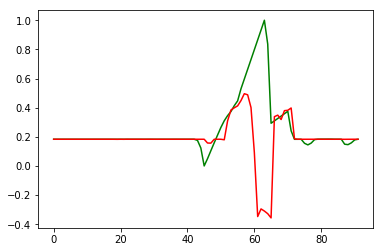

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-16:57:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-844000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-16:57:54
INFO:tensorflow:Saving dict for global step 844000: global_step = 844000, loss = 0.066440895
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 844000: ./outputdir/model.ckpt-844000
error on testset first run {'loss': 0.066440895, 'global_step': 844000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-844000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:global_step/sec: 424.533
INFO:tensorflow:loss = 3.218858e-05, step = 848701 (0.236 sec)
INFO:tensorflow:global_step/sec: 398.78
INFO:tensorflow:loss = 0.0012728835, step = 848801 (0.251 sec)
INFO:tensorflow:global_step/sec: 426.959
INFO:tensorflow:loss = 1.0297265e-05, step = 848901 (0.235 sec)
INFO:tensorflow:global_step/sec: 445.328
INFO:tensorflow:loss = 0.0035240976, step = 849001 (0.224 sec)
INFO:tensorflow:global_step/sec: 429.928
INFO:tensorflow:loss = 5.6183304e-05, step = 849101 (0.233 sec)
INFO:tensorflow:global_step/sec: 455.706
INFO:tensorflow:loss = 0.0028266048, step = 849201 (0.219 sec)
INFO:tensorflow:global_step/sec: 438.704
INFO:tensorflow:loss = 0.0005759308, step = 849301 (0.228 sec)
INFO:tensorflow:global_step/sec: 411.358
INFO:tensorflow:loss = 1.9403296e-05, step = 849401 (0.243 sec)
INFO:tensorflow:global_step/sec: 376.334
INFO:tensorflow:loss = 0.11337409, step = 849501 (0.266 sec)
INFO:tensorflow:global_step/sec: 377.516
INFO:tensorflow:loss = 

INFO:tensorflow:loss = 0.012603763, step = 854001
INFO:tensorflow:global_step/sec: 165.864
INFO:tensorflow:loss = 5.091721e-05, step = 854101 (0.604 sec)
INFO:tensorflow:global_step/sec: 459.649
INFO:tensorflow:loss = 0.00823588, step = 854201 (0.217 sec)
INFO:tensorflow:global_step/sec: 385.897
INFO:tensorflow:loss = 1.8928522e-05, step = 854301 (0.259 sec)
INFO:tensorflow:global_step/sec: 450.503
INFO:tensorflow:loss = 0.046958208, step = 854401 (0.223 sec)
INFO:tensorflow:global_step/sec: 430.018
INFO:tensorflow:loss = 0.0008210847, step = 854501 (0.232 sec)
INFO:tensorflow:global_step/sec: 447.922
INFO:tensorflow:loss = 0.0048984094, step = 854601 (0.223 sec)
INFO:tensorflow:global_step/sec: 432.838
INFO:tensorflow:loss = 3.671765e-06, step = 854701 (0.231 sec)
INFO:tensorflow:global_step/sec: 454.17
INFO:tensorflow:loss = 0.008241261, step = 854801 (0.221 sec)
INFO:tensorflow:global_step/sec: 444.095
INFO:tensorflow:loss = 0.0036163265, step = 854901 (0.225 sec)
INFO:tensorflow:gl

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-860000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 3.291289685822593e-05
prediction at  8 [array([0.18019903])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-860000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 860000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0042520235, step = 860001
INFO:tensorflow:global_step/sec: 167.549
INFO:tensorflow:loss = 0.005204271, step = 860101 (0.598 sec)
INFO:tensorflow:global_step/sec: 429.501
INFO:tensorflow:loss = 1.5028811e-05, step = 860201 (0.233 sec)
INFO:tensorflow:global_step/sec: 408

INFO:tensorflow:loss = 0.006667188, step = 865501 (0.245 sec)
INFO:tensorflow:global_step/sec: 417.378
INFO:tensorflow:loss = 0.00037359455, step = 865601 (0.240 sec)
INFO:tensorflow:global_step/sec: 415.512
INFO:tensorflow:loss = 2.2712647e-05, step = 865701 (0.241 sec)
INFO:tensorflow:global_step/sec: 412.003
INFO:tensorflow:loss = 9.5291774e-09, step = 865801 (0.243 sec)
INFO:tensorflow:global_step/sec: 419.364
INFO:tensorflow:loss = 2.047932e-05, step = 865901 (0.238 sec)
INFO:tensorflow:Saving checkpoints for 866000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.4926893e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-866000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 3.044480184827426e-05
prediction at  11 [array([0.18435792])]
dataset <TensorSliceDataset shapes: ((1,),

INFO:tensorflow:loss = 2.7437043e-08, step = 870801 (0.250 sec)
INFO:tensorflow:global_step/sec: 387.95
INFO:tensorflow:loss = 3.9721103e-06, step = 870901 (0.258 sec)
INFO:tensorflow:global_step/sec: 432.096
INFO:tensorflow:loss = 1.951333e-05, step = 871001 (0.231 sec)
INFO:tensorflow:global_step/sec: 445.076
INFO:tensorflow:loss = 7.086814e-05, step = 871101 (0.225 sec)
INFO:tensorflow:global_step/sec: 446.303
INFO:tensorflow:loss = 0.00012026891, step = 871201 (0.224 sec)
INFO:tensorflow:global_step/sec: 423.309
INFO:tensorflow:loss = 2.8198938e-05, step = 871301 (0.236 sec)
INFO:tensorflow:global_step/sec: 405.463
INFO:tensorflow:loss = 1.49886e-08, step = 871401 (0.247 sec)
INFO:tensorflow:global_step/sec: 410.39
INFO:tensorflow:loss = 2.3563116e-06, step = 871501 (0.244 sec)
INFO:tensorflow:global_step/sec: 417.51
INFO:tensorflow:loss = 2.1526125e-07, step = 871601 (0.240 sec)
INFO:tensorflow:global_step/sec: 441.06
INFO:tensorflow:loss = 1.777242e-06, step = 871701 (0.226 sec)


INFO:tensorflow:loss = 3.5491619e-09, step = 876101 (0.611 sec)
INFO:tensorflow:global_step/sec: 445.49
INFO:tensorflow:loss = 1.0000934e-06, step = 876201 (0.225 sec)
INFO:tensorflow:global_step/sec: 427.29
INFO:tensorflow:loss = 1.9171763e-07, step = 876301 (0.233 sec)
INFO:tensorflow:global_step/sec: 412.359
INFO:tensorflow:loss = 6.149049e-07, step = 876401 (0.243 sec)
INFO:tensorflow:global_step/sec: 402.039
INFO:tensorflow:loss = 2.2657856e-07, step = 876501 (0.249 sec)
INFO:tensorflow:global_step/sec: 401.508
INFO:tensorflow:loss = 5.5626674e-07, step = 876601 (0.249 sec)
INFO:tensorflow:global_step/sec: 444.284
INFO:tensorflow:loss = 5.633352e-07, step = 876701 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.449
INFO:tensorflow:loss = 3.804692e-08, step = 876801 (0.230 sec)
INFO:tensorflow:global_step/sec: 374.398
INFO:tensorflow:loss = 9.546641e-09, step = 876901 (0.267 sec)
INFO:tensorflow:global_step/sec: 425.786
INFO:tensorflow:loss = 1.5937204e-08, step = 877001 (0.234 se

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 6.975554139663279e-10
prediction at  19 [array([0.18253766])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-882000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 882000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.0378906e-07, step = 882001
INFO:tensorflow:global_step/sec: 163.429
INFO:tensorflow:loss = 4.7805315e-11, step = 882101 (0.613 sec)
INFO:tensorflow:global_step/sec: 426.713
INFO:tensorflow:loss = 3.174341e-09, step = 882201 (0.234 sec)
INFO:tensorflow:global_step/sec: 427.862
INFO:tensorflow:loss = 1.8140776e-07, step = 882301 (0.234 sec)

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-886000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 886000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0098793, step = 886001
INFO:tensorflow:global_step/sec: 169.05
INFO:tensorflow:loss = 1.8808e-05, step = 886101 (0.592 sec)
INFO:tensorflow:global_step/sec: 464.248
INFO:tensorflow:loss = 0.55753267, step = 886201 (0.216 sec)
INFO:tensorflow:global_step/sec: 461.248
INFO:tensorflow:loss = 0.0009134124, step = 886301 (0.217 sec)
INFO:tensorflow:global_step/sec: 464.224
INFO:tensorflow:loss = 1.2670703e-05, step = 886401 (0.215 sec)
INFO:tensorflow:global_step/sec: 449.81
INFO:tensorflow:loss = 1.1827409e-06, step = 886501 (0.222 sec)
INFO:tensorflow:global_step/sec: 440.746
INFO:tensorflow:loss = 0.0033003963, step = 8

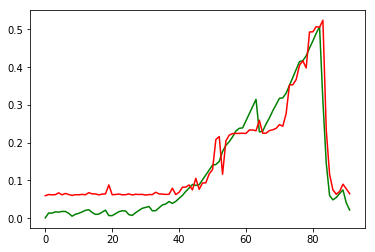

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-17:00:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-888000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-17:00:54
INFO:tensorflow:Saving dict for global step 888000: global_step = 888000, loss = 0.002244101
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 888000: ./outputdir/model.ckpt-888000
error on testset first run {'loss': 0.002244101, 'global_step': 888000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-888000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:loss = 0.0037422534, step = 892601 (0.229 sec)
INFO:tensorflow:global_step/sec: 441.071
INFO:tensorflow:loss = 0.0012190302, step = 892701 (0.227 sec)
INFO:tensorflow:global_step/sec: 443.424
INFO:tensorflow:loss = 0.00041458211, step = 892801 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.198
INFO:tensorflow:loss = 0.0007020945, step = 892901 (0.226 sec)
INFO:tensorflow:global_step/sec: 454.39
INFO:tensorflow:loss = 3.268079e-05, step = 893001 (0.220 sec)
INFO:tensorflow:global_step/sec: 433.687
INFO:tensorflow:loss = 8.748803e-05, step = 893101 (0.231 sec)
INFO:tensorflow:global_step/sec: 437.547
INFO:tensorflow:loss = 0.00086973706, step = 893201 (0.229 sec)
INFO:tensorflow:global_step/sec: 431.456
INFO:tensorflow:loss = 2.2362903e-05, step = 893301 (0.231 sec)
INFO:tensorflow:global_step/sec: 427.639
INFO:tensorflow:loss = 0.00010556779, step = 893401 (0.234 sec)
INFO:tensorflow:global_step/sec: 450.946
INFO:tensorflow:loss = 0.0012795014, step = 893501 (0.222 sec

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 898000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00021792806, step = 898001
INFO:tensorflow:global_step/sec: 169.613
INFO:tensorflow:loss = 8.0671554e-05, step = 898101 (0.590 sec)
INFO:tensorflow:global_step/sec: 463.615
INFO:tensorflow:loss = 0.0006769236, step = 898201 (0.216 sec)
INFO:tensorflow:global_step/sec: 463.799
INFO:tensorflow:loss = 3.0999292e-06, step = 898301 (0.216 sec)
INFO:tensorflow:global_step/sec: 460.869
INFO:tensorflow:loss = 0.0010092953, step = 898401 (0.217 sec)
INFO:tensorflow:global_step/sec: 460.424
INFO:tensorflow:loss = 1.0394082e-05, step = 898501 (0.217 sec)
INFO:tensorflow:global_step/sec: 448.821
INFO:tensorflow:loss = 0.00047397314, step = 898601 (0.223 sec)
INFO:tensorflow:global_step/sec: 465.432
INFO:tensorflow:loss = 0.00014124867, step = 898701 (0.215 sec)
INFO:tensorflow:global_step/sec: 466.666
INFO:tensorflow:loss = 8.6004974e-07, step = 898801 (0.

INFO:tensorflow:Loss for final step: 0.0043699984.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-904000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.0006161815283353387
prediction at  8 [array([0.26623795])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-904000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 904000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.004277977, step = 904001
INFO:tensorflow:global_step/sec: 158.736
INFO:tensorflow:loss = 4.0421102e-05, step 

INFO:tensorflow:global_step/sec: 448.201
INFO:tensorflow:loss = 1.4971092e-06, step = 909401 (0.224 sec)
INFO:tensorflow:global_step/sec: 447.846
INFO:tensorflow:loss = 0.00017126462, step = 909501 (0.222 sec)
INFO:tensorflow:global_step/sec: 459.861
INFO:tensorflow:loss = 0.00020802846, step = 909601 (0.217 sec)
INFO:tensorflow:global_step/sec: 440.573
INFO:tensorflow:loss = 0.0010335172, step = 909701 (0.227 sec)
INFO:tensorflow:global_step/sec: 450.381
INFO:tensorflow:loss = 1.8404481e-07, step = 909801 (0.222 sec)
INFO:tensorflow:global_step/sec: 421.22
INFO:tensorflow:loss = 3.8611114e-09, step = 909901 (0.238 sec)
INFO:tensorflow:Saving checkpoints for 910000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0004970457.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-910000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done runn

INFO:tensorflow:global_step/sec: 425.38
INFO:tensorflow:loss = 0.00018837025, step = 914701 (0.235 sec)
INFO:tensorflow:global_step/sec: 453.589
INFO:tensorflow:loss = 0.00023115565, step = 914801 (0.220 sec)
INFO:tensorflow:global_step/sec: 444.636
INFO:tensorflow:loss = 8.102106e-08, step = 914901 (0.225 sec)
INFO:tensorflow:global_step/sec: 447.122
INFO:tensorflow:loss = 0.00010800007, step = 915001 (0.224 sec)
INFO:tensorflow:global_step/sec: 402.083
INFO:tensorflow:loss = 9.209476e-05, step = 915101 (0.249 sec)
INFO:tensorflow:global_step/sec: 442.345
INFO:tensorflow:loss = 4.779007e-05, step = 915201 (0.226 sec)
INFO:tensorflow:global_step/sec: 445.612
INFO:tensorflow:loss = 7.383133e-05, step = 915301 (0.224 sec)
INFO:tensorflow:global_step/sec: 446.2
INFO:tensorflow:loss = 0.000109397035, step = 915401 (0.224 sec)
INFO:tensorflow:global_step/sec: 436.38
INFO:tensorflow:loss = 0.0004418076, step = 915501 (0.229 sec)
INFO:tensorflow:global_step/sec: 427.586
INFO:tensorflow:loss =

INFO:tensorflow:loss = 7.944866e-05, step = 920001
INFO:tensorflow:global_step/sec: 167.527
INFO:tensorflow:loss = 2.1760716e-05, step = 920101 (0.598 sec)
INFO:tensorflow:global_step/sec: 471.3
INFO:tensorflow:loss = 1.415875e-05, step = 920201 (0.212 sec)
INFO:tensorflow:global_step/sec: 482.02
INFO:tensorflow:loss = 0.00011039052, step = 920301 (0.207 sec)
INFO:tensorflow:global_step/sec: 470.804
INFO:tensorflow:loss = 2.574542e-05, step = 920401 (0.213 sec)
INFO:tensorflow:global_step/sec: 435.713
INFO:tensorflow:loss = 1.1050971e-05, step = 920501 (0.229 sec)
INFO:tensorflow:global_step/sec: 444.148
INFO:tensorflow:loss = 0.00048269285, step = 920601 (0.225 sec)
INFO:tensorflow:global_step/sec: 462.137
INFO:tensorflow:loss = 8.040467e-06, step = 920701 (0.216 sec)
INFO:tensorflow:global_step/sec: 455.795
INFO:tensorflow:loss = 6.802068e-05, step = 920801 (0.219 sec)
INFO:tensorflow:global_step/sec: 408.624
INFO:tensorflow:loss = 2.6875656e-05, step = 920901 (0.245 sec)
INFO:tensor

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-926000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 0.0010587723900446575
prediction at  19 [array([0.3948256])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-926000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 926000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.6530688e-05, step = 926001
INFO:tensorflow:global_step/sec: 156.509
INFO:tensorflow:loss = 7.6340214e-08, step = 926101 (0.640 sec)
INFO:tensorflow:global_step/sec: 423.606
INFO:tensorflow:loss = 0.0002158271, step = 926201 (0.236 s

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-930000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 930000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0027649757, step = 930001
INFO:tensorflow:global_step/sec: 168.922
INFO:tensorflow:loss = 0.002128209, step = 930101 (0.593 sec)
INFO:tensorflow:global_step/sec: 461.83
INFO:tensorflow:loss = 0.03880932, step = 930201 (0.217 sec)
INFO:tensorflow:global_step/sec: 459.983
INFO:tensorflow:loss = 4.2195065e-06, step = 930301 (0.217 sec)
INFO:tensorflow:global_step/sec: 459.021
INFO:tensorflow:loss = 0.0006587297, step = 930401 (0.218 sec)
INFO:tensorflow:global_step/sec: 446.955
INFO:tensorflow:loss = 0.039063774, step = 930501 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.463
INFO:tensorflow:loss = 2.4157545e-05, step

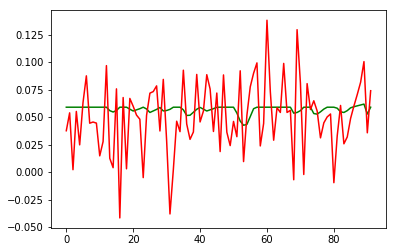

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-17:03:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-932000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-17:03:48
INFO:tensorflow:Saving dict for global step 932000: global_step = 932000, loss = 0.0010907939
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 932000: ./outputdir/model.ckpt-932000
error on testset first run {'loss': 0.0010907939, 'global_step': 932000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-932000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:loss = 0.00030801032, step = 936601 (0.221 sec)
INFO:tensorflow:global_step/sec: 443.585
INFO:tensorflow:loss = 2.4098163e-06, step = 936701 (0.226 sec)
INFO:tensorflow:global_step/sec: 411
INFO:tensorflow:loss = 3.821224e-05, step = 936801 (0.243 sec)
INFO:tensorflow:global_step/sec: 446.541
INFO:tensorflow:loss = 0.0007825477, step = 936901 (0.224 sec)
INFO:tensorflow:global_step/sec: 456.955
INFO:tensorflow:loss = 3.464784e-05, step = 937001 (0.219 sec)
INFO:tensorflow:global_step/sec: 449.309
INFO:tensorflow:loss = 0.0036300512, step = 937101 (0.223 sec)
INFO:tensorflow:global_step/sec: 464.996
INFO:tensorflow:loss = 0.0034413799, step = 937201 (0.215 sec)
INFO:tensorflow:global_step/sec: 439.392
INFO:tensorflow:loss = 7.676654e-05, step = 937301 (0.227 sec)
INFO:tensorflow:global_step/sec: 434.519
INFO:tensorflow:loss = 0.00031951378, step = 937401 (0.230 sec)
INFO:tensorflow:global_step/sec: 432.036
INFO:tensorflow:loss = 0.0020385596, step = 937501 (0.231 sec)
IN

INFO:tensorflow:Saving checkpoints for 942000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.000607581, step = 942001
INFO:tensorflow:global_step/sec: 162.627
INFO:tensorflow:loss = 1.7367101e-05, step = 942101 (0.616 sec)
INFO:tensorflow:global_step/sec: 449.861
INFO:tensorflow:loss = 0.0002190763, step = 942201 (0.222 sec)
INFO:tensorflow:global_step/sec: 435.428
INFO:tensorflow:loss = 3.7736554e-06, step = 942301 (0.230 sec)
INFO:tensorflow:global_step/sec: 448.907
INFO:tensorflow:loss = 0.001287257, step = 942401 (0.223 sec)
INFO:tensorflow:global_step/sec: 435.935
INFO:tensorflow:loss = 0.0012298988, step = 942501 (0.229 sec)
INFO:tensorflow:global_step/sec: 449.993
INFO:tensorflow:loss = 0.000331881, step = 942601 (0.222 sec)
INFO:tensorflow:global_step/sec: 457.013
INFO:tensorflow:loss = 5.5896176e-05, step = 942701 (0.219 sec)
INFO:tensorflow:global_step/sec: 458.255
INFO:tensorflow:loss = 9.572779e-05, step = 942801 (0.218 sec)
INFO:tensorflow:global_step/sec: 437.273
I

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-948000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 9.782026124366884e-05
prediction at  8 [array([0.07688523])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-948000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 948000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.7002417e-05, step = 948001
INFO:tensorflow:global_step/sec: 167.523
INFO:tensorflow:loss = 0.00010599446, step = 948101 (0.598 sec)
INFO:tensorflow:global_step/sec: 455.372
INFO:tensorflow:loss 

INFO:tensorflow:global_step/sec: 456.904
INFO:tensorflow:loss = 0.00021794742, step = 953501 (0.219 sec)
INFO:tensorflow:global_step/sec: 445.868
INFO:tensorflow:loss = 0.008538614, step = 953601 (0.224 sec)
INFO:tensorflow:global_step/sec: 450.58
INFO:tensorflow:loss = 0.00020561846, step = 953701 (0.222 sec)
INFO:tensorflow:global_step/sec: 454.232
INFO:tensorflow:loss = 0.0008424197, step = 953801 (0.220 sec)
INFO:tensorflow:global_step/sec: 454.109
INFO:tensorflow:loss = 1.7012667e-09, step = 953901 (0.220 sec)
INFO:tensorflow:Saving checkpoints for 954000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00020983405.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-954000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 4.000393349447718e-05
prediction at  11 [array([0.08161683])]
da

INFO:tensorflow:global_step/sec: 427.732
INFO:tensorflow:loss = 0.0012682285, step = 958801 (0.234 sec)
INFO:tensorflow:global_step/sec: 436.27
INFO:tensorflow:loss = 7.754176e-06, step = 958901 (0.229 sec)
INFO:tensorflow:global_step/sec: 441.08
INFO:tensorflow:loss = 1.8028422e-05, step = 959001 (0.227 sec)
INFO:tensorflow:global_step/sec: 432.712
INFO:tensorflow:loss = 0.0010721621, step = 959101 (0.231 sec)
INFO:tensorflow:global_step/sec: 393.003
INFO:tensorflow:loss = 0.00067179336, step = 959201 (0.254 sec)
INFO:tensorflow:global_step/sec: 438.239
INFO:tensorflow:loss = 0.00036300762, step = 959301 (0.228 sec)
INFO:tensorflow:global_step/sec: 428.763
INFO:tensorflow:loss = 1.8215489e-05, step = 959401 (0.233 sec)
INFO:tensorflow:global_step/sec: 433.011
INFO:tensorflow:loss = 0.0052856975, step = 959501 (0.231 sec)
INFO:tensorflow:global_step/sec: 439.866
INFO:tensorflow:loss = 0.0007670991, step = 959601 (0.227 sec)
INFO:tensorflow:global_step/sec: 432.349
INFO:tensorflow:loss 

INFO:tensorflow:loss = 0.00011310029, step = 964101 (0.622 sec)
INFO:tensorflow:global_step/sec: 465.484
INFO:tensorflow:loss = 2.4946783e-05, step = 964201 (0.215 sec)
INFO:tensorflow:global_step/sec: 406.075
INFO:tensorflow:loss = 0.00016744719, step = 964301 (0.246 sec)
INFO:tensorflow:global_step/sec: 430.882
INFO:tensorflow:loss = 2.5663223e-05, step = 964401 (0.232 sec)
INFO:tensorflow:global_step/sec: 450.312
INFO:tensorflow:loss = 0.0002000465, step = 964501 (0.222 sec)
INFO:tensorflow:global_step/sec: 455.405
INFO:tensorflow:loss = 1.6243095e-05, step = 964601 (0.220 sec)
INFO:tensorflow:global_step/sec: 450.483
INFO:tensorflow:loss = 9.6467804e-05, step = 964701 (0.222 sec)
INFO:tensorflow:global_step/sec: 437.017
INFO:tensorflow:loss = 8.912141e-06, step = 964801 (0.229 sec)
INFO:tensorflow:global_step/sec: 443.855
INFO:tensorflow:loss = 9.827269e-05, step = 964901 (0.225 sec)
INFO:tensorflow:global_step/sec: 451.232
INFO:tensorflow:loss = 7.8404696e-07, step = 965001 (0.222

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 0.00010834872541274109
prediction at  19 [array([0.08052821])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-970000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 970000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.6428304e-06, step = 970001
INFO:tensorflow:global_step/sec: 162.321
INFO:tensorflow:loss = 8.569716e-06, step = 970101 (0.617 sec)
INFO:tensorflow:global_step/sec: 450.321
INFO:tensorflow:loss = 5.7049665e-06, step = 970201 (0.222 sec)
INFO:tensorflow:global_step/sec: 431.496
INFO:tensorflow:loss = 1.2775491e-05, step = 970301 (0.232 sec

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-974000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 974000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.20252493, step = 974001
INFO:tensorflow:global_step/sec: 159.757
INFO:tensorflow:loss = 0.0026599811, step = 974101 (0.627 sec)
INFO:tensorflow:global_step/sec: 461.625
INFO:tensorflow:loss = 9.2871735e-05, step = 974201 (0.217 sec)
INFO:tensorflow:global_step/sec: 455.432
INFO:tensorflow:loss = 0.0014428622, step = 974301 (0.219 sec)
INFO:tensorflow:global_step/sec: 443.011
INFO:tensorflow:loss = 0.0035277396, step = 974401 (0.226 sec)
INFO:tensorflow:global_step/sec: 433.55
INFO:tensorflow:loss = 0.00334219, step = 974501 (0.231 sec)
INFO:tensorflow:global_step/sec: 416.606
INFO:tensorflow:loss = 4.0282146e-05, step

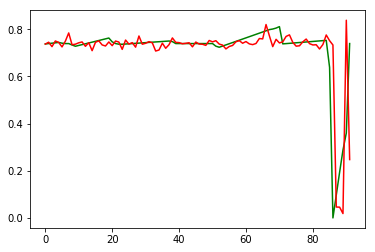

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-17:06:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-976000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-17:06:44
INFO:tensorflow:Saving dict for global step 976000: global_step = 976000, loss = 0.019830218
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 976000: ./outputdir/model.ckpt-976000
error on testset first run {'loss': 0.019830218, 'global_step': 976000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-976000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:loss = 6.4866246e-05, step = 980601 (0.225 sec)
INFO:tensorflow:global_step/sec: 455.063
INFO:tensorflow:loss = 0.00035211077, step = 980701 (0.220 sec)
INFO:tensorflow:global_step/sec: 432.255
INFO:tensorflow:loss = 0.0071337465, step = 980801 (0.232 sec)
INFO:tensorflow:global_step/sec: 399.286
INFO:tensorflow:loss = 0.00037704024, step = 980901 (0.250 sec)
INFO:tensorflow:global_step/sec: 429.043
INFO:tensorflow:loss = 5.744258e-05, step = 981001 (0.233 sec)
INFO:tensorflow:global_step/sec: 412.83
INFO:tensorflow:loss = 0.00066870323, step = 981101 (0.242 sec)
INFO:tensorflow:global_step/sec: 428.446
INFO:tensorflow:loss = 1.20008335e-05, step = 981201 (0.233 sec)
INFO:tensorflow:global_step/sec: 423.073
INFO:tensorflow:loss = 5.7827205e-05, step = 981301 (0.236 sec)
INFO:tensorflow:global_step/sec: 426.305
INFO:tensorflow:loss = 3.741898e-05, step = 981401 (0.235 sec)
INFO:tensorflow:global_step/sec: 439.365
INFO:tensorflow:loss = 3.570927e-05, step = 981501 (0.227 

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 986000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.1252602e-05, step = 986001
INFO:tensorflow:global_step/sec: 166.686
INFO:tensorflow:loss = 0.0072945217, step = 986101 (0.601 sec)
INFO:tensorflow:global_step/sec: 461.248
INFO:tensorflow:loss = 0.0006303987, step = 986201 (0.216 sec)
INFO:tensorflow:global_step/sec: 456.278
INFO:tensorflow:loss = 0.00016226852, step = 986301 (0.219 sec)
INFO:tensorflow:global_step/sec: 459.434
INFO:tensorflow:loss = 4.2948163e-06, step = 986401 (0.217 sec)
INFO:tensorflow:global_step/sec: 426.809
INFO:tensorflow:loss = 1.3808731e-06, step = 986501 (0.234 sec)
INFO:tensorflow:global_step/sec: 441.299
INFO:tensorflow:loss = 2.5148922e-06, step = 986601 (0.226 sec)
INFO:tensorflow:global_step/sec: 447.193
INFO:tensorflow:loss = 9.694199e-05, step = 986701 (0.224 sec)
INFO:tensorflow:global_step/sec: 445.842
INFO:tensorflow:loss = 1.7028404e-05, step = 986801 (0.2

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-992000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 6.002283843255447e-05
prediction at  8 [array([0.74539448])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-992000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 992000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.641599e-06, step = 992001
INFO:tensorflow:global_step/sec: 167.801
INFO:tensorflow:loss = 0.0008063097, step = 992101 (0.597 sec)
INFO:tensorflow:global_step/se

INFO:tensorflow:loss = 0.005504168, step = 997401 (0.225 sec)
INFO:tensorflow:global_step/sec: 451.213
INFO:tensorflow:loss = 0.0010217014, step = 997501 (0.221 sec)
INFO:tensorflow:global_step/sec: 445.407
INFO:tensorflow:loss = 0.000109787645, step = 997601 (0.225 sec)
INFO:tensorflow:global_step/sec: 430.231
INFO:tensorflow:loss = 0.00013276323, step = 997701 (0.232 sec)
INFO:tensorflow:global_step/sec: 395.564
INFO:tensorflow:loss = 0.0009619696, step = 997801 (0.253 sec)
INFO:tensorflow:global_step/sec: 405.06
INFO:tensorflow:loss = 3.767537e-05, step = 997901 (0.247 sec)
INFO:tensorflow:Saving checkpoints for 998000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00048916513.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-998000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  11 0

INFO:tensorflow:global_step/sec: 436.333
INFO:tensorflow:loss = 6.7297333e-06, step = 1002701 (0.229 sec)
INFO:tensorflow:global_step/sec: 390.352
INFO:tensorflow:loss = 0.00012299429, step = 1002801 (0.256 sec)
INFO:tensorflow:global_step/sec: 426.263
INFO:tensorflow:loss = 9.73156e-05, step = 1002901 (0.235 sec)
INFO:tensorflow:global_step/sec: 438.604
INFO:tensorflow:loss = 0.0003662394, step = 1003001 (0.228 sec)
INFO:tensorflow:global_step/sec: 333.851
INFO:tensorflow:loss = 0.00015835483, step = 1003101 (0.299 sec)
INFO:tensorflow:global_step/sec: 445.082
INFO:tensorflow:loss = 0.00015814787, step = 1003201 (0.225 sec)
INFO:tensorflow:global_step/sec: 427.315
INFO:tensorflow:loss = 3.6031266e-05, step = 1003301 (0.234 sec)
INFO:tensorflow:global_step/sec: 419.412
INFO:tensorflow:loss = 4.6957677e-05, step = 1003401 (0.239 sec)
INFO:tensorflow:global_step/sec: 425.693
INFO:tensorflow:loss = 0.00026918226, step = 1003501 (0.235 sec)
INFO:tensorflow:global_step/sec: 423.049
INFO:ten

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1008000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.2722592e-08, step = 1008001
INFO:tensorflow:global_step/sec: 164.41
INFO:tensorflow:loss = 0.00046778683, step = 1008101 (0.609 sec)
INFO:tensorflow:global_step/sec: 461.351
INFO:tensorflow:loss = 0.00014096263, step = 1008201 (0.217 sec)
INFO:tensorflow:global_step/sec: 457.155
INFO:tensorflow:loss = 6.23718e-08, step = 1008301 (0.219 sec)
INFO:tensorflow:global_step/sec: 338.648
INFO:tensorflow:loss = 0.00014238153, step = 1008401 (0.295 sec)
INFO:tensorflow:global_step/sec: 453.937
INFO:tensorflow:loss = 0.00014147829, step = 1008501 (0.220 sec)
INFO:tensorflow:global_step/sec: 444.265
INFO:tensorflow:loss = 4.3045693e-05, step = 1008601 (0.225 sec)
INFO:tensorflow:global_step/sec: 430.608
INFO:tensorflow:loss = 2.2978477e-06, step = 1008701 (0.233 sec)
INFO:tensorflow:global_step/sec: 423.996
INFO:tensorflow:loss = 1.8058869e-05, step = 10

INFO:tensorflow:Loss for final step: 4.233031e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1014000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.975195709501132e-06
prediction at  19 [array([0.73389659])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1014000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1014000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00026570627, step = 1014001
INFO:tensorflow:global_step/sec: 163.122
INFO:tensorflow:loss = 5.094103e-05

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1018000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1018000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.27505213, step = 1018001
INFO:tensorflow:global_step/sec: 164.464
INFO:tensorflow:loss = 0.00093549275, step = 1018101 (0.609 sec)
INFO:tensorflow:global_step/sec: 459.499
INFO:tensorflow:loss = 2.8532579e-05, step = 1018201 (0.218 sec)
INFO:tensorflow:global_step/sec: 456.898
INFO:tensorflow:loss = 0.0066453144, step = 1018301 (0.219 sec)
INFO:tensorflow:global_step/sec: 449.2
INFO:tensorflow:loss = 0.00018547731, step = 1018401 (0.223 sec)
INFO:tensorflow:global_step/sec: 435.08
INFO:tensorflow:loss = 2.8750128e-05, step = 1018501 (0.230 sec)
INFO:tensorflow:global_step/sec: 423.304
INFO:tensorflow:loss = 0.000402

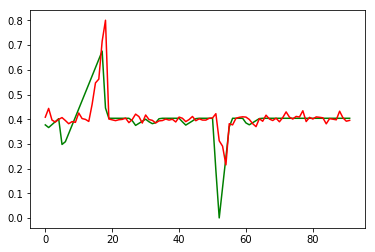

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-17:09:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1020000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-17:09:41
INFO:tensorflow:Saving dict for global step 1020000: global_step = 1020000, loss = 0.004438639
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1020000: ./outputdir/model.ckpt-1020000
error on testset first run {'loss': 0.004438639, 'global_step': 1020000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1020000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 438.429
INFO:tensorflow:loss = 6.2846066e-06, step = 1024601 (0.228 sec)
INFO:tensorflow:global_step/sec: 422.74
INFO:tensorflow:loss = 2.3163684e-05, step = 1024701 (0.237 sec)
INFO:tensorflow:global_step/sec: 439.686
INFO:tensorflow:loss = 0.000287874, step = 1024801 (0.228 sec)
INFO:tensorflow:global_step/sec: 413.613
INFO:tensorflow:loss = 4.2550088e-05, step = 1024901 (0.242 sec)
INFO:tensorflow:global_step/sec: 420.211
INFO:tensorflow:loss = 1.8105251e-05, step = 1025001 (0.238 sec)
INFO:tensorflow:global_step/sec: 429.625
INFO:tensorflow:loss = 6.795482e-05, step = 1025101 (0.233 sec)
INFO:tensorflow:global_step/sec: 436.319
INFO:tensorflow:loss = 2.9111441e-05, step = 1025201 (0.229 sec)
INFO:tensorflow:global_step/sec: 439.257
INFO:tensorflow:loss = 4.494097e-06, step = 1025301 (0.228 sec)
INFO:tensorflow:global_step/sec: 432.743
INFO:tensorflow:loss = 0.000326952, step = 1025401 (0.231 sec)
INFO:tensorflow:global_step/sec: 431.684
INFO:tensorf

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1030000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1030000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.9480023e-05, step = 1030001
INFO:tensorflow:global_step/sec: 165.245
INFO:tensorflow:loss = 0.0004632985, step = 1030101 (0.606 sec)
INFO:tensorflow:global_step/sec: 459.475
INFO:tensorflow:loss = 8.697615e-05, step = 1030201 (0.218 sec)
INFO:tensorflow:global_step/sec: 454.287
INFO:tensorflow:loss = 2.3566173e-07, step = 1030301 (0.220 sec)
INFO:tensorflow:global_step/sec: 439.971
INFO:tensorflow:loss = 2.2879984e-05, step = 1030401 (0.227 sec)
INFO:tensorflow:global_step/sec: 447.353
INFO:tensorflow:loss = 0.00026168564, step = 1030501 (0.223 sec)
INFO:tensorflow:global_step/sec: 427.431
INFO:tensorflow:loss = 0.0003403956, step = 1030601 (0.235 sec)
INFO:tensorflow:global_step/sec: 415.639
INFO:tensorflow:loss = 0.0005366374, step

INFO:tensorflow:loss = 4.5795176e-07, step = 1035901 (0.259 sec)
INFO:tensorflow:Saving checkpoints for 1036000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00010411163.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1036000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.00015694329440713937
prediction at  8 [array([0.40635489])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1036000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1036000 into ./outputdir/

INFO:tensorflow:global_step/sec: 447.821
INFO:tensorflow:loss = 1.4952865e-06, step = 1041201 (0.223 sec)
INFO:tensorflow:global_step/sec: 437.056
INFO:tensorflow:loss = 8.936538e-05, step = 1041301 (0.229 sec)
INFO:tensorflow:global_step/sec: 397.55
INFO:tensorflow:loss = 0.00022802268, step = 1041401 (0.252 sec)
INFO:tensorflow:global_step/sec: 401.402
INFO:tensorflow:loss = 4.2272695e-06, step = 1041501 (0.249 sec)
INFO:tensorflow:global_step/sec: 398.399
INFO:tensorflow:loss = 6.70474e-05, step = 1041601 (0.252 sec)
INFO:tensorflow:global_step/sec: 394.94
INFO:tensorflow:loss = 0.00029216462, step = 1041701 (0.253 sec)
INFO:tensorflow:global_step/sec: 400.585
INFO:tensorflow:loss = 3.6550517e-08, step = 1041801 (0.249 sec)
INFO:tensorflow:global_step/sec: 415.711
INFO:tensorflow:loss = 1.2834073e-06, step = 1041901 (0.241 sec)
INFO:tensorflow:Saving checkpoints for 1042000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00033237386.
INFO:tensorflow:Calling model

INFO:tensorflow:loss = 2.0456802e-05, step = 1046401 (0.247 sec)
INFO:tensorflow:global_step/sec: 391.168
INFO:tensorflow:loss = 2.2590099e-05, step = 1046501 (0.256 sec)
INFO:tensorflow:global_step/sec: 422.668
INFO:tensorflow:loss = 5.996462e-06, step = 1046601 (0.237 sec)
INFO:tensorflow:global_step/sec: 431.917
INFO:tensorflow:loss = 1.2866623e-05, step = 1046701 (0.231 sec)
INFO:tensorflow:global_step/sec: 424.955
INFO:tensorflow:loss = 0.00029839185, step = 1046801 (0.235 sec)
INFO:tensorflow:global_step/sec: 425.255
INFO:tensorflow:loss = 9.743735e-05, step = 1046901 (0.235 sec)
INFO:tensorflow:global_step/sec: 421.248
INFO:tensorflow:loss = 1.0000339e-06, step = 1047001 (0.238 sec)
INFO:tensorflow:global_step/sec: 413.11
INFO:tensorflow:loss = 0.00011362909, step = 1047101 (0.241 sec)
INFO:tensorflow:global_step/sec: 425.091
INFO:tensorflow:loss = 0.00015703149, step = 1047201 (0.235 sec)
INFO:tensorflow:global_step/sec: 430.691
INFO:tensorflow:loss = 3.2294512e-05, step = 1047

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1052000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1052000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.5618686e-05, step = 1052001
INFO:tensorflow:global_step/sec: 162.99
INFO:tensorflow:loss = 3.4969435e-05, step = 1052101 (0.614 sec)
INFO:tensorflow:global_step/sec: 436.714
INFO:tensorflow:loss = 8.2625505e-05, step = 1052201 (0.229 sec)
INFO:tensorflow:global_step/sec: 427.325
INFO:tensorflow:loss = 3.7927868e-05, step = 1052301 (0.234 sec)
INFO:tensorflow:global_step/sec: 428.594
INFO:tensorflow:loss = 8.767852e-05, step = 1052401 (0.233 sec)
INFO:tensorflow:global_step/sec: 432.477
INFO:tensorflow:loss = 3.6290407e-05, step = 1052501 (0.231 sec)
INFO:tensorflow:global_step/sec: 438.18
INFO:tensorflow:loss = 9.01

INFO:tensorflow:global_step/sec: 387.654
INFO:tensorflow:loss = 4.1987034e-05, step = 1057801 (0.258 sec)
INFO:tensorflow:global_step/sec: 422.084
INFO:tensorflow:loss = 6.578929e-05, step = 1057901 (0.237 sec)
INFO:tensorflow:Saving checkpoints for 1058000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.406524e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1058000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.7661452925968903e-07
prediction at  19 [array([0.39845271])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1058000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1062000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1062000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0019754462, step = 1062001
INFO:tensorflow:global_step/sec: 165.522
INFO:tensorflow:loss = 1.9076622e-05, step = 1062101 (0.605 sec)
INFO:tensorflow:global_step/sec: 444.769
INFO:tensorflow:loss = 0.002439942, step = 1062201 (0.224 sec)
INFO:tensorflow:global_step/sec: 431.058
INFO:tensorflow:loss = 4.2229155e-07, step = 1062301 (0.232 sec)
INFO:tensorflow:global_step/sec: 445.476
INFO:tensorflow:loss = 1.7135784e-06, step = 1062401 (0.225 sec)
INFO:tensorflow:global_step/sec: 423.496
INFO:tensorflow:loss = 0.00039383856, step = 1062501 (0.236 sec)
INFO:tensorflow:global_step/sec: 423.124
INFO:tensorflow:loss = 0.00

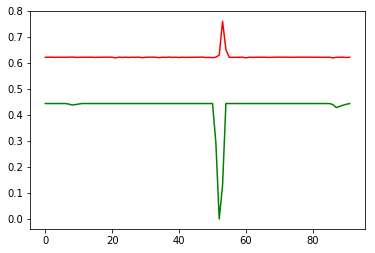

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-17:12:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1064000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-17:12:38
INFO:tensorflow:Saving dict for global step 1064000: global_step = 1064000, loss = 0.039782856
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1064000: ./outputdir/model.ckpt-1064000
error on testset first run {'loss': 0.039782856, 'global_step': 1064000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1064000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 412.324
INFO:tensorflow:loss = 2.8052582e-08, step = 1068601 (0.243 sec)
INFO:tensorflow:global_step/sec: 438.006
INFO:tensorflow:loss = 8.1687485e-06, step = 1068701 (0.228 sec)
INFO:tensorflow:global_step/sec: 438.1
INFO:tensorflow:loss = 6.881493e-06, step = 1068801 (0.228 sec)
INFO:tensorflow:global_step/sec: 415.529
INFO:tensorflow:loss = 4.3497374e-07, step = 1068901 (0.241 sec)
INFO:tensorflow:global_step/sec: 426.316
INFO:tensorflow:loss = 8.725448e-06, step = 1069001 (0.234 sec)
INFO:tensorflow:global_step/sec: 438.548
INFO:tensorflow:loss = 9.2341736e-07, step = 1069101 (0.228 sec)
INFO:tensorflow:global_step/sec: 449.982
INFO:tensorflow:loss = 9.76157e-07, step = 1069201 (0.222 sec)
INFO:tensorflow:global_step/sec: 445.917
INFO:tensorflow:loss = 2.4231684e-05, step = 1069301 (0.224 sec)
INFO:tensorflow:global_step/sec: 447.007
INFO:tensorflow:loss = 1.7891576e-05, step = 1069401 (0.224 sec)
INFO:tensorflow:global_step/sec: 410.826
INFO:tensor

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1074000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1074000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.1219105e-06, step = 1074001
INFO:tensorflow:global_step/sec: 167.35
INFO:tensorflow:loss = 8.126313e-07, step = 1074101 (0.598 sec)
INFO:tensorflow:global_step/sec: 464.358
INFO:tensorflow:loss = 7.139673e-06, step = 1074201 (0.216 sec)
INFO:tensorflow:global_step/sec: 456.242
INFO:tensorflow:loss = 2.1587007e-07, step = 1074301 (0.219 sec)
INFO:tensorflow:global_step/sec: 412.072
INFO:tensorflow:loss = 1.2551719e-05, step = 1074401 (0.242 sec)
INFO:tensorflow:global_step/sec: 458.737
INFO:tensorflow:loss = 1.8286533e-05, step = 1074501 (0.218 sec)
INFO:tensorflow:global_step/sec: 426.448
INFO:tensorflow:loss = 5.474014e-06, step = 1074601 (0.235 sec)
INFO:tensorflow:global_step/sec: 444.885
INFO:tensorflow:loss = 8.745932e-07, step 

INFO:tensorflow:loss = 1.3999902e-06, step = 1079901 (0.232 sec)
INFO:tensorflow:Saving checkpoints for 1080000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.7410057e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1080000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 3.495555534871096e-07
prediction at  8 [array([0.62460773])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1080000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1080000 into ./outputdir/m

INFO:tensorflow:global_step/sec: 417.846
INFO:tensorflow:loss = 1.9244908e-07, step = 1085201 (0.239 sec)
INFO:tensorflow:global_step/sec: 421.056
INFO:tensorflow:loss = 1.2673197e-06, step = 1085301 (0.237 sec)
INFO:tensorflow:global_step/sec: 434.567
INFO:tensorflow:loss = 7.8813756e-08, step = 1085401 (0.230 sec)
INFO:tensorflow:global_step/sec: 431.217
INFO:tensorflow:loss = 6.2511804e-06, step = 1085501 (0.232 sec)
INFO:tensorflow:global_step/sec: 423.044
INFO:tensorflow:loss = 7.8831454e-07, step = 1085601 (0.237 sec)
INFO:tensorflow:global_step/sec: 416.506
INFO:tensorflow:loss = 2.4398419e-06, step = 1085701 (0.240 sec)
INFO:tensorflow:global_step/sec: 409.508
INFO:tensorflow:loss = 3.4366622e-06, step = 1085801 (0.244 sec)
INFO:tensorflow:global_step/sec: 416.995
INFO:tensorflow:loss = 5.067422e-07, step = 1085901 (0.240 sec)
INFO:tensorflow:Saving checkpoints for 1086000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.4538454e-09.
INFO:tensorflow:Calling m

INFO:tensorflow:loss = 1.5621339e-07, step = 1090401 (0.226 sec)
INFO:tensorflow:global_step/sec: 446.81
INFO:tensorflow:loss = 5.2019195e-06, step = 1090501 (0.224 sec)
INFO:tensorflow:global_step/sec: 427.358
INFO:tensorflow:loss = 6.443205e-07, step = 1090601 (0.234 sec)
INFO:tensorflow:global_step/sec: 418.997
INFO:tensorflow:loss = 1.7276516e-06, step = 1090701 (0.239 sec)
INFO:tensorflow:global_step/sec: 446.969
INFO:tensorflow:loss = 8.55523e-07, step = 1090801 (0.224 sec)
INFO:tensorflow:global_step/sec: 441.954
INFO:tensorflow:loss = 3.8081808e-08, step = 1090901 (0.226 sec)
INFO:tensorflow:global_step/sec: 428.552
INFO:tensorflow:loss = 3.679707e-06, step = 1091001 (0.233 sec)
INFO:tensorflow:global_step/sec: 439.365
INFO:tensorflow:loss = 2.0566077e-08, step = 1091101 (0.228 sec)
INFO:tensorflow:global_step/sec: 448.622
INFO:tensorflow:loss = 1.2291652e-07, step = 1091201 (0.223 sec)
INFO:tensorflow:global_step/sec: 408.487
INFO:tensorflow:loss = 6.6253256e-07, step = 109130

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1096000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1096000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.235975e-09, step = 1096001
INFO:tensorflow:global_step/sec: 155.66
INFO:tensorflow:loss = 8.2071097e-07, step = 1096101 (0.643 sec)
INFO:tensorflow:global_step/sec: 436.403
INFO:tensorflow:loss = 8.645347e-08, step = 1096201 (0.229 sec)
INFO:tensorflow:global_step/sec: 437.656
INFO:tensorflow:loss = 6.47578e-07, step = 1096301 (0.228 sec)
INFO:tensorflow:global_step/sec: 436.114
INFO:tensorflow:loss = 1.2116743e-07, step = 1096401 (0.230 sec)
INFO:tensorflow:global_step/sec: 436.108
INFO:tensorflow:loss = 6.1359685e-07, step = 1096501 (0.229 sec)
INFO:tensorflow:global_step/sec: 438.606
INFO:tensorflow:loss = 1.7828

INFO:tensorflow:global_step/sec: 373.22
INFO:tensorflow:loss = 5.8804085e-06, step = 1101801 (0.268 sec)
INFO:tensorflow:global_step/sec: 414.779
INFO:tensorflow:loss = 3.640648e-07, step = 1101901 (0.242 sec)
INFO:tensorflow:Saving checkpoints for 1102000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.2677223e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1102000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.3733811649887235e-06
prediction at  19 [array([0.62153051])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1102000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1106000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1106000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.392394e-07, step = 1106001
INFO:tensorflow:global_step/sec: 164.611
INFO:tensorflow:loss = 0.0008493026, step = 1106101 (0.608 sec)
INFO:tensorflow:global_step/sec: 435.51
INFO:tensorflow:loss = 0.00018473125, step = 1106201 (0.230 sec)
INFO:tensorflow:global_step/sec: 425.796
INFO:tensorflow:loss = 0.00075133593, step = 1106301 (0.235 sec)
INFO:tensorflow:global_step/sec: 445.073
INFO:tensorflow:loss = 0.0003596217, step = 1106401 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.107
INFO:tensorflow:loss = 0.00030034923, step = 1106501 (0.230 sec)
INFO:tensorflow:global_step/sec: 439.731
INFO:tensorflow:loss = 0.000

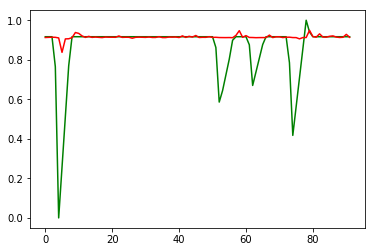

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-17:15:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1108000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-17:15:35
INFO:tensorflow:Saving dict for global step 1108000: global_step = 1108000, loss = 0.021406567
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1108000: ./outputdir/model.ckpt-1108000
error on testset first run {'loss': 0.021406567, 'global_step': 1108000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1108000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 437.639
INFO:tensorflow:loss = 0.00020447775, step = 1112601 (0.229 sec)
INFO:tensorflow:global_step/sec: 430.067
INFO:tensorflow:loss = 8.701395e-09, step = 1112701 (0.232 sec)
INFO:tensorflow:global_step/sec: 417.246
INFO:tensorflow:loss = 2.1100164e-05, step = 1112801 (0.240 sec)
INFO:tensorflow:global_step/sec: 443.664
INFO:tensorflow:loss = 0.0062588775, step = 1112901 (0.226 sec)
INFO:tensorflow:global_step/sec: 433.309
INFO:tensorflow:loss = 5.571473e-05, step = 1113001 (0.231 sec)
INFO:tensorflow:global_step/sec: 436.005
INFO:tensorflow:loss = 3.552764e-06, step = 1113101 (0.230 sec)
INFO:tensorflow:global_step/sec: 427.161
INFO:tensorflow:loss = 1.4748113e-07, step = 1113201 (0.234 sec)
INFO:tensorflow:global_step/sec: 424.401
INFO:tensorflow:loss = 2.951709e-05, step = 1113301 (0.236 sec)
INFO:tensorflow:global_step/sec: 402.687
INFO:tensorflow:loss = 3.886858e-05, step = 1113401 (0.248 sec)
INFO:tensorflow:global_step/sec: 388.226
INFO:tensor

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1118000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.8649225e-07, step = 1118001
INFO:tensorflow:global_step/sec: 163.823
INFO:tensorflow:loss = 2.6702277e-05, step = 1118101 (0.611 sec)
INFO:tensorflow:global_step/sec: 438.874
INFO:tensorflow:loss = 2.5353456e-05, step = 1118201 (0.228 sec)
INFO:tensorflow:global_step/sec: 424.423
INFO:tensorflow:loss = 6.051028e-06, step = 1118301 (0.236 sec)
INFO:tensorflow:global_step/sec: 417.819
INFO:tensorflow:loss = 2.3515275e-05, step = 1118401 (0.239 sec)
INFO:tensorflow:global_step/sec: 397.302
INFO:tensorflow:loss = 4.7453195e-05, step = 1118501 (0.252 sec)
INFO:tensorflow:global_step/sec: 416.001
INFO:tensorflow:loss = 4.7175545e-06, step = 1118601 (0.241 sec)
INFO:tensorflow:global_step/sec: 413.427
INFO:tensorflow:loss = 1.4069101e-06, step = 1118701 (0.241 sec)
INFO:tensorflow:global_step/sec: 383.503
INFO:t

INFO:tensorflow:Saving checkpoints for 1124000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.6558406e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1124000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.102016522711758e-06
prediction at  8 [array([0.91710159])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1124000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1124000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.4749646e-05, step = 1124001
I

INFO:tensorflow:global_step/sec: 372.111
INFO:tensorflow:loss = 5.073109e-05, step = 1129201 (0.269 sec)
INFO:tensorflow:global_step/sec: 365.55
INFO:tensorflow:loss = 0.0054993047, step = 1129301 (0.273 sec)
INFO:tensorflow:global_step/sec: 340.897
INFO:tensorflow:loss = 7.99018e-06, step = 1129401 (0.293 sec)
INFO:tensorflow:global_step/sec: 378.607
INFO:tensorflow:loss = 5.407023e-05, step = 1129501 (0.264 sec)
INFO:tensorflow:global_step/sec: 440.478
INFO:tensorflow:loss = 7.361383e-05, step = 1129601 (0.227 sec)
INFO:tensorflow:global_step/sec: 415.633
INFO:tensorflow:loss = 4.5808138e-06, step = 1129701 (0.241 sec)
INFO:tensorflow:global_step/sec: 385.364
INFO:tensorflow:loss = 7.680193e-05, step = 1129801 (0.260 sec)
INFO:tensorflow:global_step/sec: 395.543
INFO:tensorflow:loss = 5.174567e-05, step = 1129901 (0.253 sec)
INFO:tensorflow:Saving checkpoints for 1130000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.969031e-06.
INFO:tensorflow:Calling model_fn.


INFO:tensorflow:loss = 9.496622e-05, step = 1134401 (0.245 sec)
INFO:tensorflow:global_step/sec: 432.015
INFO:tensorflow:loss = 0.000116353156, step = 1134501 (0.231 sec)
INFO:tensorflow:global_step/sec: 443.863
INFO:tensorflow:loss = 8.806125e-05, step = 1134601 (0.225 sec)
INFO:tensorflow:global_step/sec: 419.422
INFO:tensorflow:loss = 7.6278375e-05, step = 1134701 (0.238 sec)
INFO:tensorflow:global_step/sec: 420.249
INFO:tensorflow:loss = 3.6299385e-05, step = 1134801 (0.238 sec)
INFO:tensorflow:global_step/sec: 451.706
INFO:tensorflow:loss = 0.005149583, step = 1134901 (0.221 sec)
INFO:tensorflow:global_step/sec: 468.589
INFO:tensorflow:loss = 1.7467037e-05, step = 1135001 (0.214 sec)
INFO:tensorflow:global_step/sec: 432.12
INFO:tensorflow:loss = 8.348257e-06, step = 1135101 (0.231 sec)
INFO:tensorflow:global_step/sec: 448.416
INFO:tensorflow:loss = 6.617177e-05, step = 1135201 (0.223 sec)
INFO:tensorflow:global_step/sec: 451.141
INFO:tensorflow:loss = 6.057502e-05, step = 1135301 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1140000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1140000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.8838125e-05, step = 1140001
INFO:tensorflow:global_step/sec: 159.498
INFO:tensorflow:loss = 0.00016079737, step = 1140101 (0.628 sec)
INFO:tensorflow:global_step/sec: 456.202
INFO:tensorflow:loss = 1.4311446e-05, step = 1140201 (0.219 sec)
INFO:tensorflow:global_step/sec: 450.972
INFO:tensorflow:loss = 0.00013885745, step = 1140301 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.262
INFO:tensorflow:loss = 9.856809e-06, step = 1140401 (0.221 sec)
INFO:tensorflow:global_step/sec: 439.522
INFO:tensorflow:loss = 0.00016243408, step = 1140501 (0.228 sec)
INFO:tensorflow:global_step/sec: 449.029
INFO:tensorflow:loss = 1.

INFO:tensorflow:global_step/sec: 444.606
INFO:tensorflow:loss = 0.0002484247, step = 1145801 (0.225 sec)
INFO:tensorflow:global_step/sec: 447.632
INFO:tensorflow:loss = 0.0040394883, step = 1145901 (0.223 sec)
INFO:tensorflow:Saving checkpoints for 1146000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00025726145.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1146000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.1686015137185385e-05
prediction at  19 [array([0.92676922])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1146000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1150000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1150000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.23315343, step = 1150001
INFO:tensorflow:global_step/sec: 165.74
INFO:tensorflow:loss = 0.00015358713, step = 1150101 (0.604 sec)
INFO:tensorflow:global_step/sec: 458.612
INFO:tensorflow:loss = 2.2166312e-05, step = 1150201 (0.218 sec)
INFO:tensorflow:global_step/sec: 460.446
INFO:tensorflow:loss = 1.4323342e-06, step = 1150301 (0.217 sec)
INFO:tensorflow:global_step/sec: 444.709
INFO:tensorflow:loss = 2.1654573e-06, step = 1150401 (0.225 sec)
INFO:tensorflow:global_step/sec: 441.773
INFO:tensorflow:loss = 1.9456565e-06, step = 1150501 (0.226 sec)
INFO:tensorflow:global_step/sec: 449.907
INFO:tensorflow:loss = 1.868

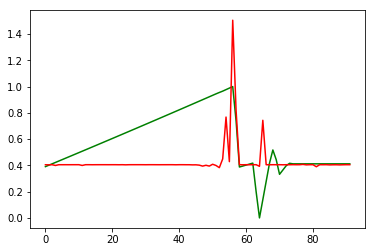

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-19:05:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1152000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-19:05:47
INFO:tensorflow:Saving dict for global step 1152000: global_step = 1152000, loss = 0.08383506
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1152000: ./outputdir/model.ckpt-1152000
error on testset first run {'loss': 0.08383506, 'global_step': 1152000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1152000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:global_step/sec: 463.954
INFO:tensorflow:loss = 0.0005703215, step = 1156601 (0.216 sec)
INFO:tensorflow:global_step/sec: 452.962
INFO:tensorflow:loss = 5.6542634e-05, step = 1156701 (0.221 sec)
INFO:tensorflow:global_step/sec: 482.237
INFO:tensorflow:loss = 0.0017789238, step = 1156801 (0.207 sec)
INFO:tensorflow:global_step/sec: 441.78
INFO:tensorflow:loss = 2.356762e-05, step = 1156901 (0.226 sec)
INFO:tensorflow:global_step/sec: 478.902
INFO:tensorflow:loss = 1.1272805e-05, step = 1157001 (0.209 sec)
INFO:tensorflow:global_step/sec: 463.805
INFO:tensorflow:loss = 2.4952291e-05, step = 1157101 (0.216 sec)
INFO:tensorflow:global_step/sec: 468.083
INFO:tensorflow:loss = 2.219326e-05, step = 1157201 (0.214 sec)
INFO:tensorflow:global_step/sec: 459.893
INFO:tensorflow:loss = 1.7573819e-05, step = 1157301 (0.217 sec)
INFO:tensorflow:global_step/sec: 454.547
INFO:tensorflow:loss = 4.0881318e-05, step = 1157401 (0.220 sec)
INFO:tensorflow:global_step/sec: 465.734
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1162000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.103557e-06, step = 1162001
INFO:tensorflow:global_step/sec: 164.823
INFO:tensorflow:loss = 0.0016967093, step = 1162101 (0.608 sec)
INFO:tensorflow:global_step/sec: 445.554
INFO:tensorflow:loss = 0.00013687756, step = 1162201 (0.224 sec)
INFO:tensorflow:global_step/sec: 469.228
INFO:tensorflow:loss = 7.779498e-05, step = 1162301 (0.213 sec)
INFO:tensorflow:global_step/sec: 440.463
INFO:tensorflow:loss = 2.6766998e-07, step = 1162401 (0.227 sec)
INFO:tensorflow:global_step/sec: 447.792
INFO:tensorflow:loss = 1.236509e-06, step = 1162501 (0.223 sec)
INFO:tensorflow:global_step/sec: 452.802
INFO:tensorflow:loss = 0.00010880248, step = 1162601 (0.221 sec)
INFO:tensorflow:global_step/sec: 467.089
INFO:tensorflow:loss = 5.024954e-05, step = 1162701 (0.214 sec)
INFO:tensorflow:global_step/sec: 444.806
INFO:tenso

INFO:tensorflow:Saving checkpoints for 1168000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 8.702007e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1168000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 8.108816258951103e-05
prediction at  8 [array([0.39647598])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1168000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1168000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00087857665, step = 1168001
IN

INFO:tensorflow:loss = 9.853254e-06, step = 1173201 (0.216 sec)
INFO:tensorflow:global_step/sec: 457.213
INFO:tensorflow:loss = 9.056902e-07, step = 1173301 (0.219 sec)
INFO:tensorflow:global_step/sec: 460.17
INFO:tensorflow:loss = 0.0019777676, step = 1173401 (0.217 sec)
INFO:tensorflow:global_step/sec: 456.675
INFO:tensorflow:loss = 1.3301258e-05, step = 1173501 (0.219 sec)
INFO:tensorflow:global_step/sec: 461.962
INFO:tensorflow:loss = 2.1348123e-05, step = 1173601 (0.216 sec)
INFO:tensorflow:global_step/sec: 462.588
INFO:tensorflow:loss = 4.7368652e-05, step = 1173701 (0.216 sec)
INFO:tensorflow:global_step/sec: 462.525
INFO:tensorflow:loss = 3.801896e-05, step = 1173801 (0.216 sec)
INFO:tensorflow:global_step/sec: 466.541
INFO:tensorflow:loss = 8.896534e-06, step = 1173901 (0.214 sec)
INFO:tensorflow:Saving checkpoints for 1174000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.7277877e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn

INFO:tensorflow:global_step/sec: 108.6
INFO:tensorflow:loss = 3.8403985e-07, step = 1178501 (0.921 sec)
INFO:tensorflow:global_step/sec: 133.393
INFO:tensorflow:loss = 7.264944e-09, step = 1178601 (0.747 sec)
INFO:tensorflow:global_step/sec: 441.706
INFO:tensorflow:loss = 8.7364583e-07, step = 1178701 (0.226 sec)
INFO:tensorflow:global_step/sec: 453.618
INFO:tensorflow:loss = 1.6889338e-06, step = 1178801 (0.221 sec)
INFO:tensorflow:global_step/sec: 452.435
INFO:tensorflow:loss = 2.3433372e-06, step = 1178901 (0.221 sec)
INFO:tensorflow:global_step/sec: 449.899
INFO:tensorflow:loss = 1.9193901e-06, step = 1179001 (0.222 sec)
INFO:tensorflow:global_step/sec: 449.95
INFO:tensorflow:loss = 9.825275e-09, step = 1179101 (0.222 sec)
INFO:tensorflow:global_step/sec: 450.816
INFO:tensorflow:loss = 2.0631092e-06, step = 1179201 (0.222 sec)
INFO:tensorflow:global_step/sec: 439.589
INFO:tensorflow:loss = 1.6565982e-05, step = 1179301 (0.227 sec)
INFO:tensorflow:global_step/sec: 444.139
INFO:tenso

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1184000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1184000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 8.9917864e-07, step = 1184001
INFO:tensorflow:global_step/sec: 167.449
INFO:tensorflow:loss = 8.99941e-08, step = 1184101 (0.598 sec)
INFO:tensorflow:global_step/sec: 460.972
INFO:tensorflow:loss = 5.3775227e-07, step = 1184201 (0.217 sec)
INFO:tensorflow:global_step/sec: 456.269
INFO:tensorflow:loss = 8.28809e-08, step = 1184301 (0.219 sec)
INFO:tensorflow:global_step/sec: 455.629
INFO:tensorflow:loss = 7.0156415e-07, step = 1184401 (0.220 sec)
INFO:tensorflow:global_step/sec: 446.074
INFO:tensorflow:loss = 9.331424e-08, step = 1184501 (0.224 sec)
INFO:tensorflow:global_step/sec: 439.461
INFO:tensorflow:loss = 7.430481e-07, step = 1184601 (0.228 sec)
INFO

INFO:tensorflow:loss = 1.1142877e-08, step = 1189801 (0.883 sec)
INFO:tensorflow:global_step/sec: 108.009
INFO:tensorflow:loss = 2.1418408e-07, step = 1189901 (0.926 sec)
INFO:tensorflow:Saving checkpoints for 1190000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.0682143e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1190000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 3.883806466843897e-07
prediction at  19 [array([0.40621475])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1190000
INFO:tensorflow:Running local_init_op.
I

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


INFO:tensorflow:Using config: {'_model_dir': './outputdir', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x1a2507ca20>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.


/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1194000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1194000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.13371997, step = 1194001
INFO:tensorflow:global_step/sec: 162.571
INFO:tensorflow:loss = 2.6336727e-06, step = 1194101 (0.616 sec)
INFO:tensorflow:global_step/sec: 430.411
INFO:tensorflow:loss = 5.374102e-08, step = 1194201 (0.233 sec)
INFO:tensorflow:global_step/sec: 394.474
INFO:tensorflow:loss = 9.0957765e-06, step = 1194301 (0.253 sec)
INFO:tensorflow:global_step/sec: 408.265
INFO:tensorflow:loss = 1.8191553e-05, step = 1194401 (0.245 sec)
INFO:tensorflow:global_step/sec: 431.471
INFO:tensorflow:loss = 4.8007735e-08, step = 1194501 (0.231 sec)
INFO:tensorflow:global_step/sec: 435.584
INFO:tensorflow:loss = 8.249

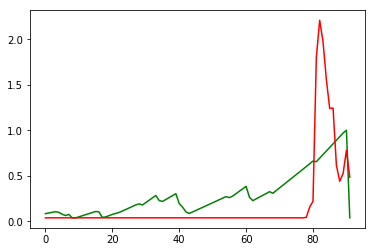

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-19:09:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1196000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-19:09:13
INFO:tensorflow:Saving dict for global step 1196000: global_step = 1196000, loss = 0.11865273
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1196000: ./outputdir/model.ckpt-1196000
error on testset first run {'loss': 0.11865273, 'global_step': 1196000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1196000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:global_step/sec: 458.552
INFO:tensorflow:loss = 0.008163082, step = 1200601 (0.218 sec)
INFO:tensorflow:global_step/sec: 464.367
INFO:tensorflow:loss = 0.0094846375, step = 1200701 (0.215 sec)
INFO:tensorflow:global_step/sec: 460.447
INFO:tensorflow:loss = 0.0102508245, step = 1200801 (0.218 sec)
INFO:tensorflow:global_step/sec: 458.787
INFO:tensorflow:loss = 0.008323681, step = 1200901 (0.218 sec)
INFO:tensorflow:global_step/sec: 452.634
INFO:tensorflow:loss = 0.008637528, step = 1201001 (0.221 sec)
INFO:tensorflow:global_step/sec: 455.118
INFO:tensorflow:loss = 0.0054956875, step = 1201101 (0.220 sec)
INFO:tensorflow:global_step/sec: 461.568
INFO:tensorflow:loss = 0.010352611, step = 1201201 (0.217 sec)
INFO:tensorflow:global_step/sec: 392.618
INFO:tensorflow:loss = 0.010774242, step = 1201301 (0.255 sec)
INFO:tensorflow:global_step/sec: 437.744
INFO:tensorflow:loss = 0.011758769, step = 1201401 (0.229 sec)
INFO:tensorflow:global_step/sec: 455.038
INFO:tensorflow:loss

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1206000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.000102386744, step = 1206001
INFO:tensorflow:global_step/sec: 161.393
INFO:tensorflow:loss = 3.027078e-05, step = 1206101 (0.621 sec)
INFO:tensorflow:global_step/sec: 425.599
INFO:tensorflow:loss = 3.4965866e-05, step = 1206201 (0.235 sec)
INFO:tensorflow:global_step/sec: 367.005
INFO:tensorflow:loss = 1.9990077e-05, step = 1206301 (0.273 sec)
INFO:tensorflow:global_step/sec: 367.516
INFO:tensorflow:loss = 2.226246e-05, step = 1206401 (0.272 sec)
INFO:tensorflow:global_step/sec: 388.134
INFO:tensorflow:loss = 2.2267523e-05, step = 1206501 (0.257 sec)
INFO:tensorflow:global_step/sec: 406.655
INFO:tensorflow:loss = 0.00015220937, step = 1206601 (0.246 sec)
INFO:tensorflow:global_step/sec: 449.358
INFO:tensorflow:loss = 1.5175462e-05, step = 1206701 (0.222 sec)
INFO:tensorflow:global_step/sec: 463.248
INFO:t

INFO:tensorflow:Saving checkpoints for 1212000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 7.6261804e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1212000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.4481616761461741e-05
prediction at  8 [array([0.03511398])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1212000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1212000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.587643e-06, step = 1212001
I

INFO:tensorflow:loss = 1.0048135e-05, step = 1217201 (0.256 sec)
INFO:tensorflow:global_step/sec: 370.561
INFO:tensorflow:loss = 6.0078395e-07, step = 1217301 (0.271 sec)
INFO:tensorflow:global_step/sec: 377.212
INFO:tensorflow:loss = 7.292299e-08, step = 1217401 (0.264 sec)
INFO:tensorflow:global_step/sec: 128.293
INFO:tensorflow:loss = 1.9187503e-06, step = 1217501 (0.783 sec)
INFO:tensorflow:global_step/sec: 105.087
INFO:tensorflow:loss = 1.6795788e-07, step = 1217601 (0.952 sec)
INFO:tensorflow:global_step/sec: 109.318
INFO:tensorflow:loss = 2.1166825e-06, step = 1217701 (0.915 sec)
INFO:tensorflow:global_step/sec: 108.698
INFO:tensorflow:loss = 2.7678948e-07, step = 1217801 (0.918 sec)
INFO:tensorflow:global_step/sec: 109.694
INFO:tensorflow:loss = 1.623923e-06, step = 1217901 (0.911 sec)
INFO:tensorflow:Saving checkpoints for 1218000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.8103994e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling mode

INFO:tensorflow:global_step/sec: 104.549
INFO:tensorflow:loss = 2.12948e-07, step = 1222501 (0.958 sec)
INFO:tensorflow:global_step/sec: 106.949
INFO:tensorflow:loss = 1.025904e-08, step = 1222601 (0.933 sec)
INFO:tensorflow:global_step/sec: 111.384
INFO:tensorflow:loss = 1.9404742e-07, step = 1222701 (0.898 sec)
INFO:tensorflow:global_step/sec: 109.813
INFO:tensorflow:loss = 9.751409e-08, step = 1222801 (0.910 sec)
INFO:tensorflow:global_step/sec: 111.335
INFO:tensorflow:loss = 2.6259036e-08, step = 1222901 (0.898 sec)
INFO:tensorflow:global_step/sec: 112.825
INFO:tensorflow:loss = 1.896892e-08, step = 1223001 (0.886 sec)
INFO:tensorflow:global_step/sec: 114.32
INFO:tensorflow:loss = 2.9528425e-07, step = 1223101 (0.875 sec)
INFO:tensorflow:global_step/sec: 113.01
INFO:tensorflow:loss = 4.4044558e-08, step = 1223201 (0.885 sec)
INFO:tensorflow:global_step/sec: 112.156
INFO:tensorflow:loss = 5.1343096e-07, step = 1223301 (0.892 sec)
INFO:tensorflow:global_step/sec: 112.268
INFO:tensorf

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1228000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1228000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.8746786e-07, step = 1228001
INFO:tensorflow:global_step/sec: 38.0071
INFO:tensorflow:loss = 2.9203475e-08, step = 1228101 (2.634 sec)
INFO:tensorflow:global_step/sec: 107.113
INFO:tensorflow:loss = 6.384855e-08, step = 1228201 (0.934 sec)
INFO:tensorflow:global_step/sec: 109.121
INFO:tensorflow:loss = 3.8522167e-08, step = 1228301 (0.916 sec)
INFO:tensorflow:global_step/sec: 105.982
INFO:tensorflow:loss = 1.06704015e-07, step = 1228401 (0.943 sec)
INFO:tensorflow:global_step/sec: 109.385
INFO:tensorflow:loss = 6.8567715e-08, step = 1228501 (0.915 sec)
INFO:tensorflow:global_step/sec: 109.848
INFO:tensorflow:loss = 1.0609158e-07, step = 1228601 (0.913 sec

INFO:tensorflow:loss = 1.0250172e-07, step = 1233801 (0.893 sec)
INFO:tensorflow:global_step/sec: 115.591
INFO:tensorflow:loss = 5.1674624e-07, step = 1233901 (0.865 sec)
INFO:tensorflow:Saving checkpoints for 1234000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.698966e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1234000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.628015492714716e-07
prediction at  19 [array([0.03843472])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1234000
INFO:tensorflow:Running local_init_op.
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


INFO:tensorflow:Using config: {'_model_dir': './outputdir', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x1a27ff7eb8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.


/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1238000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1238000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.016249653, step = 1238001
INFO:tensorflow:global_step/sec: 36.7644
INFO:tensorflow:loss = 0.00033212724, step = 1238101 (2.724 sec)
INFO:tensorflow:global_step/sec: 106.768
INFO:tensorflow:loss = 3.654039e-05, step = 1238201 (0.936 sec)
INFO:tensorflow:global_step/sec: 108.162
INFO:tensorflow:loss = 3.6114247e-06, step = 1238301 (0.926 sec)
INFO:tensorflow:global_step/sec: 106.814
INFO:tensorflow:loss = 8.695894e-06, step = 1238401 (0.935 sec)
INFO:tensorflow:global_step/sec: 108.061
INFO:tensorflow:loss = 8.931235e-06, step = 1238501 (0.926 sec)
INFO:tensorflow:global_step/sec: 111.387
INFO:tensorflow:loss = 5.9408

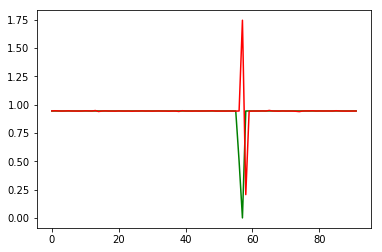

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-19:18:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1240000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-19:18:14
INFO:tensorflow:Saving dict for global step 1240000: global_step = 1240000, loss = 0.031457573
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1240000: ./outputdir/model.ckpt-1240000
error on testset first run {'loss': 0.031457573, 'global_step': 1240000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1240000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 103.755
INFO:tensorflow:loss = 3.661664e-06, step = 1244601 (0.965 sec)
INFO:tensorflow:global_step/sec: 98.0462
INFO:tensorflow:loss = 1.3935094e-06, step = 1244701 (1.020 sec)
INFO:tensorflow:global_step/sec: 107.121
INFO:tensorflow:loss = 0.0006352207, step = 1244801 (0.932 sec)
INFO:tensorflow:global_step/sec: 113.509
INFO:tensorflow:loss = 1.5522552e-05, step = 1244901 (0.882 sec)
INFO:tensorflow:global_step/sec: 112.82
INFO:tensorflow:loss = 9.377459e-05, step = 1245001 (0.886 sec)
INFO:tensorflow:global_step/sec: 111.802
INFO:tensorflow:loss = 0.00011230505, step = 1245101 (0.894 sec)
INFO:tensorflow:global_step/sec: 112.649
INFO:tensorflow:loss = 0.00077528233, step = 1245201 (0.888 sec)
INFO:tensorflow:global_step/sec: 111.433
INFO:tensorflow:loss = 2.2962453e-05, step = 1245301 (0.899 sec)
INFO:tensorflow:global_step/sec: 114.799
INFO:tensorflow:loss = 3.3079466e-06, step = 1245401 (0.869 sec)
INFO:tensorflow:global_step/sec: 112.569
INFO:tens

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1250000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1250000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 8.498065e-06, step = 1250001
INFO:tensorflow:global_step/sec: 31.9359
INFO:tensorflow:loss = 0.000988591, step = 1250101 (3.134 sec)
INFO:tensorflow:global_step/sec: 97.7739
INFO:tensorflow:loss = 8.911652e-06, step = 1250201 (1.024 sec)
INFO:tensorflow:global_step/sec: 98.0944
INFO:tensorflow:loss = 2.1750284e-06, step = 1250301 (1.018 sec)
INFO:tensorflow:global_step/sec: 99.3814
INFO:tensorflow:loss = 9.263815e-06, step = 1250401 (1.007 sec)
INFO:tensorflow:global_step/sec: 95.2639
INFO:tensorflow:loss = 8.5949705e-07, step = 1250501 (1.051 sec)
INFO:tensorflow:global_step/sec: 99.8837
INFO:tensorflow:loss = 2.012388e-05, step = 1250601 (1.000 sec)
INFO

INFO:tensorflow:loss = 1.0455424e-06, step = 1255801 (1.060 sec)
INFO:tensorflow:global_step/sec: 97.101
INFO:tensorflow:loss = 2.5067948e-07, step = 1255901 (1.030 sec)
INFO:tensorflow:Saving checkpoints for 1256000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.2569862e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1256000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.407696370119523e-05
prediction at  8 [array([0.94132139])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1256000
INFO:tensorflow:Running local_init_op.
INFO

INFO:tensorflow:global_step/sec: 102.381
INFO:tensorflow:loss = 1.0225109e-06, step = 1261101 (0.976 sec)
INFO:tensorflow:global_step/sec: 104.937
INFO:tensorflow:loss = 3.1018863e-07, step = 1261201 (0.954 sec)
INFO:tensorflow:global_step/sec: 109.944
INFO:tensorflow:loss = 2.5511565e-07, step = 1261301 (0.910 sec)
INFO:tensorflow:global_step/sec: 102.57
INFO:tensorflow:loss = 0.00070033304, step = 1261401 (0.976 sec)
INFO:tensorflow:global_step/sec: 111.007
INFO:tensorflow:loss = 0.00017194978, step = 1261501 (0.899 sec)
INFO:tensorflow:global_step/sec: 105.516
INFO:tensorflow:loss = 5.3605345e-06, step = 1261601 (0.948 sec)
INFO:tensorflow:global_step/sec: 105.4
INFO:tensorflow:loss = 1.3101586e-05, step = 1261701 (0.949 sec)
INFO:tensorflow:global_step/sec: 97.6138
INFO:tensorflow:loss = 1.9456565e-06, step = 1261801 (1.025 sec)
INFO:tensorflow:global_step/sec: 98.8659
INFO:tensorflow:loss = 2.8056577e-06, step = 1261901 (1.011 sec)
INFO:tensorflow:Saving checkpoints for 1262000 in

INFO:tensorflow:loss = 6.426151e-08, step = 1266301 (0.236 sec)
INFO:tensorflow:global_step/sec: 462.89
INFO:tensorflow:loss = 7.0068324e-08, step = 1266401 (0.216 sec)
INFO:tensorflow:global_step/sec: 430.813
INFO:tensorflow:loss = 2.1625796e-07, step = 1266501 (0.232 sec)
INFO:tensorflow:global_step/sec: 443.259
INFO:tensorflow:loss = 2.378965e-06, step = 1266601 (0.226 sec)
INFO:tensorflow:global_step/sec: 441.846
INFO:tensorflow:loss = 2.9878322e-08, step = 1266701 (0.226 sec)
INFO:tensorflow:global_step/sec: 437.099
INFO:tensorflow:loss = 1.7929701e-06, step = 1266801 (0.229 sec)
INFO:tensorflow:global_step/sec: 475.806
INFO:tensorflow:loss = 2.1832992e-08, step = 1266901 (0.210 sec)
INFO:tensorflow:global_step/sec: 477.11
INFO:tensorflow:loss = 3.1921644e-07, step = 1267001 (0.210 sec)
INFO:tensorflow:global_step/sec: 452.391
INFO:tensorflow:loss = 5.97825e-07, step = 1267101 (0.221 sec)
INFO:tensorflow:global_step/sec: 444.861
INFO:tensorflow:loss = 4.8264046e-06, step = 1267201

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1272000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1272000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.9873112e-07, step = 1272001
INFO:tensorflow:global_step/sec: 168.671
INFO:tensorflow:loss = 1.4300524e-06, step = 1272101 (0.594 sec)
INFO:tensorflow:global_step/sec: 455.054
INFO:tensorflow:loss = 9.893929e-07, step = 1272201 (0.220 sec)
INFO:tensorflow:global_step/sec: 451.99
INFO:tensorflow:loss = 1.0064218e-06, step = 1272301 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.77
INFO:tensorflow:loss = 7.210241e-08, step = 1272401 (0.220 sec)
INFO:tensorflow:global_step/sec: 451.891
INFO:tensorflow:loss = 8.6580815e-07, step = 1272501 (0.221 sec)
INFO:tensorflow:global_step/sec: 46

INFO:tensorflow:global_step/sec: 448.002
INFO:tensorflow:loss = 1.5776583e-06, step = 1277801 (0.223 sec)
INFO:tensorflow:global_step/sec: 443.538
INFO:tensorflow:loss = 1.48031e-07, step = 1277901 (0.226 sec)
INFO:tensorflow:Saving checkpoints for 1278000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.336515e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1278000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 9.61464157136409e-07
prediction at  19 [array([0.94399498])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1278000
INF

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1282000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1282000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.39340633, step = 1282001
INFO:tensorflow:global_step/sec: 164.962
INFO:tensorflow:loss = 6.4260007e-06, step = 1282101 (0.607 sec)
INFO:tensorflow:global_step/sec: 454.203
INFO:tensorflow:loss = 1.8335504e-07, step = 1282201 (0.220 sec)
INFO:tensorflow:global_step/sec: 432.146
INFO:tensorflow:loss = 0.012558127, step = 1282301 (0.231 sec)
INFO:tensorflow:global_step/sec: 453.604
INFO:tensorflow:loss = 3.5229335e-05, step = 1282401 (0.220 sec)
INFO:tensorflow:global_step/sec: 446.285
INFO:tensorflow:loss = 5.0946136e-09, step = 1282501 (0.225 sec)
INFO:tensorflow:global_step/sec: 398.555
INFO:tensorflow:loss = 3.9918

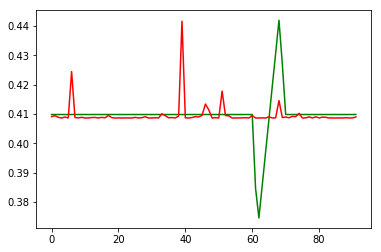

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:03:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1284000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:03:23
INFO:tensorflow:Saving dict for global step 1284000: global_step = 1284000, loss = 6.0404098e-05
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1284000: ./outputdir/model.ckpt-1284000
error on testset first run {'loss': 6.0404098e-05, 'global_step': 1284000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1284000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 449.143
INFO:tensorflow:loss = 3.084317e-07, step = 1288601 (0.223 sec)
INFO:tensorflow:global_step/sec: 445.551
INFO:tensorflow:loss = 1.3982346e-07, step = 1288701 (0.225 sec)
INFO:tensorflow:global_step/sec: 459.487
INFO:tensorflow:loss = 3.828219e-07, step = 1288801 (0.218 sec)
INFO:tensorflow:global_step/sec: 458.634
INFO:tensorflow:loss = 2.9334764e-08, step = 1288901 (0.218 sec)
INFO:tensorflow:global_step/sec: 442.709
INFO:tensorflow:loss = 6.6958603e-07, step = 1289001 (0.226 sec)
INFO:tensorflow:global_step/sec: 445.645
INFO:tensorflow:loss = 1.333911e-07, step = 1289101 (0.224 sec)
INFO:tensorflow:global_step/sec: 447.139
INFO:tensorflow:loss = 1.0344371e-07, step = 1289201 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.742
INFO:tensorflow:loss = 1.1144135e-06, step = 1289301 (0.225 sec)
INFO:tensorflow:global_step/sec: 446.337
INFO:tensorflow:loss = 9.422685e-10, step = 1289401 (0.224 sec)
INFO:tensorflow:global_step/sec: 437.957
INFO:tens

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1294000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1294000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.4108804e-10, step = 1294001
INFO:tensorflow:global_step/sec: 164.241
INFO:tensorflow:loss = 4.179732e-10, step = 1294101 (0.610 sec)
INFO:tensorflow:global_step/sec: 423.621
INFO:tensorflow:loss = 4.8633098e-09, step = 1294201 (0.237 sec)
INFO:tensorflow:global_step/sec: 437.529
INFO:tensorflow:loss = 0.00090785994, step = 1294301 (0.228 sec)
INFO:tensorflow:global_step/sec: 459.83
INFO:tensorflow:loss = 1.74506e-07, step = 1294401 (0.218 sec)
INFO:tensorflow:global_step/sec: 455.726
INFO:tensorflow:loss = 1.3137683e-08, step = 1294501 (0.220 sec)
INFO:tensorflow:global_step/sec: 442.481
INFO:tensorflow:loss = 1.6597292e-09, step = 1294601 (0.226 sec)
INFO:tensorflow:global_step/sec: 438.87
INFO:tensorflow:loss = 4.124723e-09, step =

INFO:tensorflow:loss = 7.059143e-07, step = 1299901 (0.219 sec)
INFO:tensorflow:Saving checkpoints for 1300000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 7.544981e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1300000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.0707602795476807e-08
prediction at  8 [array([0.40923649])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1300000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1300000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 451.172
INFO:tensorflow:loss = 1.5874427e-07, step = 1305201 (0.222 sec)
INFO:tensorflow:global_step/sec: 450.471
INFO:tensorflow:loss = 4.6455008e-07, step = 1305301 (0.222 sec)
INFO:tensorflow:global_step/sec: 448.367
INFO:tensorflow:loss = 1.4453466e-06, step = 1305401 (0.223 sec)
INFO:tensorflow:global_step/sec: 436.18
INFO:tensorflow:loss = 9.848922e-11, step = 1305501 (0.229 sec)
INFO:tensorflow:global_step/sec: 456.252
INFO:tensorflow:loss = 2.2293367e-10, step = 1305601 (0.219 sec)
INFO:tensorflow:global_step/sec: 445.259
INFO:tensorflow:loss = 6.726134e-07, step = 1305701 (0.225 sec)
INFO:tensorflow:global_step/sec: 445.258
INFO:tensorflow:loss = 7.924478e-09, step = 1305801 (0.225 sec)
INFO:tensorflow:global_step/sec: 432.453
INFO:tensorflow:loss = 1.11472794e-07, step = 1305901 (0.231 sec)
INFO:tensorflow:Saving checkpoints for 1306000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.6605444e-07.
INFO:tensorflow:Calling mod

INFO:tensorflow:loss = 2.5436358e-07, step = 1310401 (0.231 sec)
INFO:tensorflow:global_step/sec: 444.879
INFO:tensorflow:loss = 2.8856917e-12, step = 1310501 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.37
INFO:tensorflow:loss = 4.1208955e-07, step = 1310601 (0.226 sec)
INFO:tensorflow:global_step/sec: 454.124
INFO:tensorflow:loss = 4.3446168e-08, step = 1310701 (0.220 sec)
INFO:tensorflow:global_step/sec: 454.199
INFO:tensorflow:loss = 2.1280705e-07, step = 1310801 (0.220 sec)
INFO:tensorflow:global_step/sec: 453.941
INFO:tensorflow:loss = 1.002104e-07, step = 1310901 (0.220 sec)
INFO:tensorflow:global_step/sec: 454.734
INFO:tensorflow:loss = 8.284508e-07, step = 1311001 (0.220 sec)
INFO:tensorflow:global_step/sec: 446.86
INFO:tensorflow:loss = 2.0832157e-07, step = 1311101 (0.224 sec)
INFO:tensorflow:global_step/sec: 456.648
INFO:tensorflow:loss = 3.9632596e-07, step = 1311201 (0.219 sec)
INFO:tensorflow:global_step/sec: 450.828
INFO:tensorflow:loss = 1.2236842e-06, step = 13113

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1316000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1316000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 8.350283e-07, step = 1316001
INFO:tensorflow:global_step/sec: 165.014
INFO:tensorflow:loss = 2.9785667e-08, step = 1316101 (0.607 sec)
INFO:tensorflow:global_step/sec: 454.852
INFO:tensorflow:loss = 3.2305678e-08, step = 1316201 (0.220 sec)
INFO:tensorflow:global_step/sec: 442.907
INFO:tensorflow:loss = 3.2789572e-08, step = 1316301 (0.226 sec)
INFO:tensorflow:global_step/sec: 441.721
INFO:tensorflow:loss = 2.2605938e-08, step = 1316401 (0.226 sec)
INFO:tensorflow:global_step/sec: 425.631
INFO:tensorflow:loss = 6.123085e-08, step = 1316501 (0.235 sec)
INFO:tensorflow:global_step/sec: 444.589
INFO:tensorflow:loss = 3.8

INFO:tensorflow:global_step/sec: 456.498
INFO:tensorflow:loss = 2.2172486e-09, step = 1321801 (0.219 sec)
INFO:tensorflow:global_step/sec: 456.825
INFO:tensorflow:loss = 4.6695007e-07, step = 1321901 (0.219 sec)
INFO:tensorflow:Saving checkpoints for 1322000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.252734e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1322000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.8770380201793676e-07
prediction at  19 [array([0.40991859])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1322000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1326000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1326000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.07294667, step = 1326001
INFO:tensorflow:global_step/sec: 161.101
INFO:tensorflow:loss = 3.4625566e-05, step = 1326101 (0.622 sec)
INFO:tensorflow:global_step/sec: 461.821
INFO:tensorflow:loss = 0.00034627222, step = 1326201 (0.216 sec)
INFO:tensorflow:global_step/sec: 449.265
INFO:tensorflow:loss = 1.0863732e-05, step = 1326301 (0.223 sec)
INFO:tensorflow:global_step/sec: 457.298
INFO:tensorflow:loss = 5.5777923e-07, step = 1326401 (0.219 sec)
INFO:tensorflow:global_step/sec: 451.347
INFO:tensorflow:loss = 6.260423e-06, step = 1326501 (0.222 sec)
INFO:tensorflow:global_step/sec: 455.778
INFO:tensorflow:loss = 1.935

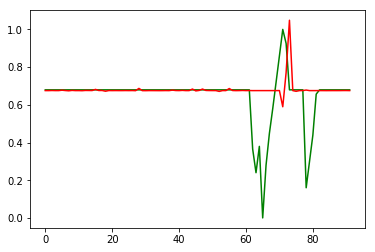

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:06:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1328000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:06:14
INFO:tensorflow:Saving dict for global step 1328000: global_step = 1328000, loss = 0.017846188
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1328000: ./outputdir/model.ckpt-1328000
error on testset first run {'loss': 0.017846188, 'global_step': 1328000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1328000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 443.395
INFO:tensorflow:loss = 0.0002151691, step = 1332601 (0.225 sec)
INFO:tensorflow:global_step/sec: 436.222
INFO:tensorflow:loss = 7.305302e-06, step = 1332701 (0.229 sec)
INFO:tensorflow:global_step/sec: 445.782
INFO:tensorflow:loss = 0.00014333331, step = 1332801 (0.224 sec)
INFO:tensorflow:global_step/sec: 445.754
INFO:tensorflow:loss = 0.00023352055, step = 1332901 (0.224 sec)
INFO:tensorflow:global_step/sec: 448.71
INFO:tensorflow:loss = 0.000116354444, step = 1333001 (0.223 sec)
INFO:tensorflow:global_step/sec: 438.958
INFO:tensorflow:loss = 0.00039882946, step = 1333101 (0.228 sec)
INFO:tensorflow:global_step/sec: 385.475
INFO:tensorflow:loss = 0.00026471814, step = 1333201 (0.260 sec)
INFO:tensorflow:global_step/sec: 444.634
INFO:tensorflow:loss = 0.000250526, step = 1333301 (0.225 sec)
INFO:tensorflow:global_step/sec: 433.715
INFO:tensorflow:loss = 0.03485063, step = 1333401 (0.230 sec)
INFO:tensorflow:global_step/sec: 443.243
INFO:tensorf

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1338000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1338000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00091871986, step = 1338001
INFO:tensorflow:global_step/sec: 163.407
INFO:tensorflow:loss = 0.00027050995, step = 1338101 (0.613 sec)
INFO:tensorflow:global_step/sec: 457.806
INFO:tensorflow:loss = 0.010078861, step = 1338201 (0.219 sec)
INFO:tensorflow:global_step/sec: 451.465
INFO:tensorflow:loss = 0.00023899176, step = 1338301 (0.221 sec)
INFO:tensorflow:global_step/sec: 444.642
INFO:tensorflow:loss = 0.0012446146, step = 1338401 (0.225 sec)
INFO:tensorflow:global_step/sec: 450.692
INFO:tensorflow:loss = 0.00020395986, step = 1338501 (0.222 sec)
INFO:tensorflow:global_step/sec: 456.941
INFO:tensorflow:loss = 0.023748059, step = 1338601 (0.218 sec)
INFO:tensorflow:global_step/sec: 450.033
INFO:tensorflow:loss = 0.00052566855, step 

INFO:tensorflow:loss = 2.3682056e-05, step = 1343901 (0.235 sec)
INFO:tensorflow:Saving checkpoints for 1344000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0011185282.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1344000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.0005498160245944601
prediction at  8 [array([0.69613453])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1344000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1344000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 436.853
INFO:tensorflow:loss = 1.4041247e-05, step = 1349201 (0.229 sec)
INFO:tensorflow:global_step/sec: 393.433
INFO:tensorflow:loss = 7.576803e-05, step = 1349301 (0.254 sec)
INFO:tensorflow:global_step/sec: 460.316
INFO:tensorflow:loss = 0.00016939882, step = 1349401 (0.217 sec)
INFO:tensorflow:global_step/sec: 472.615
INFO:tensorflow:loss = 2.1380358e-05, step = 1349501 (0.212 sec)
INFO:tensorflow:global_step/sec: 471.297
INFO:tensorflow:loss = 0.00030863853, step = 1349601 (0.212 sec)
INFO:tensorflow:global_step/sec: 459.934
INFO:tensorflow:loss = 0.00094998704, step = 1349701 (0.218 sec)
INFO:tensorflow:global_step/sec: 461.291
INFO:tensorflow:loss = 8.423428e-05, step = 1349801 (0.216 sec)
INFO:tensorflow:global_step/sec: 458.745
INFO:tensorflow:loss = 0.00046569813, step = 1349901 (0.218 sec)
INFO:tensorflow:Saving checkpoints for 1350000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00013488696.
INFO:tensorflow:Calling mo

INFO:tensorflow:loss = 1.6758433e-05, step = 1354401 (0.222 sec)
INFO:tensorflow:global_step/sec: 426.372
INFO:tensorflow:loss = 0.0001501722, step = 1354501 (0.234 sec)
INFO:tensorflow:global_step/sec: 433.079
INFO:tensorflow:loss = 0.0001686038, step = 1354601 (0.231 sec)
INFO:tensorflow:global_step/sec: 460.166
INFO:tensorflow:loss = 0.00013591343, step = 1354701 (0.217 sec)
INFO:tensorflow:global_step/sec: 441.211
INFO:tensorflow:loss = 0.000103043385, step = 1354801 (0.227 sec)
INFO:tensorflow:global_step/sec: 456.527
INFO:tensorflow:loss = 3.5794805e-05, step = 1354901 (0.219 sec)
INFO:tensorflow:global_step/sec: 449.559
INFO:tensorflow:loss = 1.2388806e-05, step = 1355001 (0.223 sec)
INFO:tensorflow:global_step/sec: 450.272
INFO:tensorflow:loss = 1.3759027e-05, step = 1355101 (0.222 sec)
INFO:tensorflow:global_step/sec: 439.483
INFO:tensorflow:loss = 0.0004205117, step = 1355201 (0.228 sec)
INFO:tensorflow:global_step/sec: 442.982
INFO:tensorflow:loss = 0.0080572115, step = 1355

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1360000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1360000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.875372e-05, step = 1360001
INFO:tensorflow:global_step/sec: 162.919
INFO:tensorflow:loss = 1.4557828e-05, step = 1360101 (0.615 sec)
INFO:tensorflow:global_step/sec: 442.076
INFO:tensorflow:loss = 2.7964256e-07, step = 1360201 (0.226 sec)
INFO:tensorflow:global_step/sec: 441.094
INFO:tensorflow:loss = 9.408053e-06, step = 1360301 (0.227 sec)
INFO:tensorflow:global_step/sec: 443.798
INFO:tensorflow:loss = 1.3989032e-07, step = 1360401 (0.225 sec)
INFO:tensorflow:global_step/sec: 440.692
INFO:tensorflow:loss = 1.3616093e-06, step = 1360501 (0.227 sec)
INFO:tensorflow:global_step/sec: 451.727
INFO:tensorflow:loss = 3.0

INFO:tensorflow:global_step/sec: 419.821
INFO:tensorflow:loss = 7.003047e-06, step = 1365801 (0.238 sec)
INFO:tensorflow:global_step/sec: 417.634
INFO:tensorflow:loss = 2.0427697e-05, step = 1365901 (0.240 sec)
INFO:tensorflow:Saving checkpoints for 1366000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.6826856e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1366000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 8.17160226898325e-06
prediction at  19 [array([0.6808398])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1366000
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1370000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1370000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.1891087, step = 1370001
INFO:tensorflow:global_step/sec: 158.249
INFO:tensorflow:loss = 1.2024799e-06, step = 1370101 (0.633 sec)
INFO:tensorflow:global_step/sec: 445.105
INFO:tensorflow:loss = 1.6379467e-09, step = 1370201 (0.225 sec)
INFO:tensorflow:global_step/sec: 454.667
INFO:tensorflow:loss = 4.4660896e-06, step = 1370301 (0.220 sec)
INFO:tensorflow:global_step/sec: 446.213
INFO:tensorflow:loss = 5.261885e-09, step = 1370401 (0.224 sec)
INFO:tensorflow:global_step/sec: 441.829
INFO:tensorflow:loss = 4.5766946e-11, step = 1370501 (0.227 sec)
INFO:tensorflow:global_step/sec: 425.996
INFO:tensorflow:loss = 9.5327

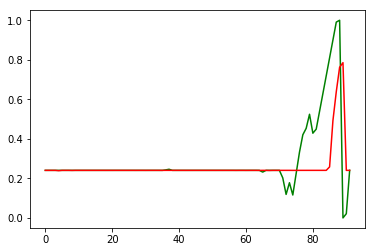

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:09:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1372000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:09:07
INFO:tensorflow:Saving dict for global step 1372000: global_step = 1372000, loss = 0.027915264
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1372000: ./outputdir/model.ckpt-1372000
error on testset first run {'loss': 0.027915264, 'global_step': 1372000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1372000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 435.187
INFO:tensorflow:loss = 1.3258685e-07, step = 1376601 (0.230 sec)
INFO:tensorflow:global_step/sec: 426.543
INFO:tensorflow:loss = 1.5715713e-07, step = 1376701 (0.234 sec)
INFO:tensorflow:global_step/sec: 449.26
INFO:tensorflow:loss = 1.2022524e-07, step = 1376801 (0.223 sec)
INFO:tensorflow:global_step/sec: 450.698
INFO:tensorflow:loss = 2.6884308e-07, step = 1376901 (0.222 sec)
INFO:tensorflow:global_step/sec: 436.483
INFO:tensorflow:loss = 6.3535714e-07, step = 1377001 (0.230 sec)
INFO:tensorflow:global_step/sec: 432.229
INFO:tensorflow:loss = 9.923001e-09, step = 1377101 (0.231 sec)
INFO:tensorflow:global_step/sec: 452.263
INFO:tensorflow:loss = 2.4751128e-07, step = 1377201 (0.221 sec)
INFO:tensorflow:global_step/sec: 433.371
INFO:tensorflow:loss = 2.1317841e-07, step = 1377301 (0.231 sec)
INFO:tensorflow:global_step/sec: 442.991
INFO:tensorflow:loss = 1.9226609e-07, step = 1377401 (0.226 sec)
INFO:tensorflow:global_step/sec: 448.789
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1382000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1382000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.7790044e-07, step = 1382001
INFO:tensorflow:global_step/sec: 165.118
INFO:tensorflow:loss = 1.1253256e-08, step = 1382101 (0.606 sec)
INFO:tensorflow:global_step/sec: 439.972
INFO:tensorflow:loss = 2.0031088e-08, step = 1382201 (0.227 sec)
INFO:tensorflow:global_step/sec: 450.65
INFO:tensorflow:loss = 3.2714063e-08, step = 1382301 (0.222 sec)
INFO:tensorflow:global_step/sec: 444.464
INFO:tensorflow:loss = 8.0304187e-07, step = 1382401 (0.226 sec)
INFO:tensorflow:global_step/sec: 444.719
INFO:tensorflow:loss = 2.4258392e-07, step = 1382501 (0.224 sec)
INFO:tensorflow:global_step/sec: 445.012
INFO:tensorflow:loss = 8.408937e-07, step = 1382601 (0.225 sec)
INFO:tensorflow:global_step/sec: 414.122
INFO:tensorflow:loss = 8.542004e-07, ste

INFO:tensorflow:loss = 5.707184e-07, step = 1387901 (0.265 sec)
INFO:tensorflow:Saving checkpoints for 1388000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 7.0542455e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1388000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.077349973660609e-06
prediction at  8 [array([0.23984518])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1388000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1388000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 427.462
INFO:tensorflow:loss = 9.0423754e-08, step = 1393201 (0.234 sec)
INFO:tensorflow:global_step/sec: 415.379
INFO:tensorflow:loss = 2.440098e-07, step = 1393301 (0.241 sec)
INFO:tensorflow:global_step/sec: 386.369
INFO:tensorflow:loss = 1.9661627e-06, step = 1393401 (0.259 sec)
INFO:tensorflow:global_step/sec: 433.333
INFO:tensorflow:loss = 1.4466367e-06, step = 1393501 (0.231 sec)
INFO:tensorflow:global_step/sec: 426.127
INFO:tensorflow:loss = 4.495614e-08, step = 1393601 (0.235 sec)
INFO:tensorflow:global_step/sec: 419.662
INFO:tensorflow:loss = 3.942527e-08, step = 1393701 (0.238 sec)
INFO:tensorflow:global_step/sec: 415.922
INFO:tensorflow:loss = 3.3772984e-11, step = 1393801 (0.240 sec)
INFO:tensorflow:global_step/sec: 419.898
INFO:tensorflow:loss = 1.8072296e-07, step = 1393901 (0.238 sec)
INFO:tensorflow:Saving checkpoints for 1394000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 8.580624e-08.
INFO:tensorflow:Calling mode

INFO:tensorflow:loss = 4.808596e-07, step = 1398401 (0.227 sec)
INFO:tensorflow:global_step/sec: 431.72
INFO:tensorflow:loss = 1.0531746e-08, step = 1398501 (0.231 sec)
INFO:tensorflow:global_step/sec: 432.5
INFO:tensorflow:loss = 2.8714663e-07, step = 1398601 (0.231 sec)
INFO:tensorflow:global_step/sec: 434.724
INFO:tensorflow:loss = 1.29287e-09, step = 1398701 (0.230 sec)
INFO:tensorflow:global_step/sec: 450.031
INFO:tensorflow:loss = 1.7206204e-07, step = 1398801 (0.222 sec)
INFO:tensorflow:global_step/sec: 448.531
INFO:tensorflow:loss = 1.0234151e-08, step = 1398901 (0.223 sec)
INFO:tensorflow:global_step/sec: 449.723
INFO:tensorflow:loss = 7.703194e-07, step = 1399001 (0.222 sec)
INFO:tensorflow:global_step/sec: 443.418
INFO:tensorflow:loss = 4.314234e-07, step = 1399101 (0.226 sec)
INFO:tensorflow:global_step/sec: 450.919
INFO:tensorflow:loss = 2.6797844e-07, step = 1399201 (0.222 sec)
INFO:tensorflow:global_step/sec: 455.921
INFO:tensorflow:loss = 2.702511e-07, step = 1399301 (0

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1404000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1404000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.86246e-08, step = 1404001
INFO:tensorflow:global_step/sec: 166.088
INFO:tensorflow:loss = 3.8500083e-09, step = 1404101 (0.603 sec)
INFO:tensorflow:global_step/sec: 430.366
INFO:tensorflow:loss = 7.6266126e-08, step = 1404201 (0.232 sec)
INFO:tensorflow:global_step/sec: 430.782
INFO:tensorflow:loss = 2.8172673e-09, step = 1404301 (0.233 sec)
INFO:tensorflow:global_step/sec: 375.855
INFO:tensorflow:loss = 4.527898e-08, step = 1404401 (0.266 sec)
INFO:tensorflow:global_step/sec: 427.245
INFO:tensorflow:loss = 7.3362436e-09, step = 1404501 (0.234 sec)
INFO:tensorflow:global_step/sec: 411.137
INFO:tensorflow:loss = 3.59

INFO:tensorflow:global_step/sec: 446.296
INFO:tensorflow:loss = 2.085937e-07, step = 1409801 (0.224 sec)
INFO:tensorflow:global_step/sec: 442.466
INFO:tensorflow:loss = 5.6064508e-08, step = 1409901 (0.226 sec)
INFO:tensorflow:Saving checkpoints for 1410000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.2553002e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1410000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.0328045451883352e-06
prediction at  19 [array([0.24025351])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1410000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1414000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1414000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.009133542, step = 1414001
INFO:tensorflow:global_step/sec: 164.77
INFO:tensorflow:loss = 4.544401e-08, step = 1414101 (0.608 sec)
INFO:tensorflow:global_step/sec: 459.341
INFO:tensorflow:loss = 0.00036050956, step = 1414201 (0.218 sec)
INFO:tensorflow:global_step/sec: 443.605
INFO:tensorflow:loss = 2.0893037e-06, step = 1414301 (0.225 sec)
INFO:tensorflow:global_step/sec: 477.984
INFO:tensorflow:loss = 1.5010215e-13, step = 1414401 (0.209 sec)
INFO:tensorflow:global_step/sec: 476.065
INFO:tensorflow:loss = 5.684342e-14, step = 1414501 (0.210 sec)
INFO:tensorflow:global_step/sec: 431.945
INFO:tensorflow:loss = 4.4592

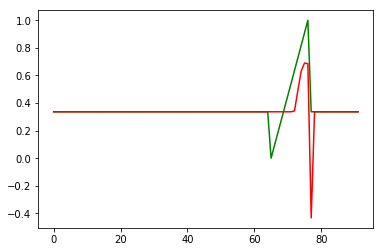

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:12:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1416000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:12:01
INFO:tensorflow:Saving dict for global step 1416000: global_step = 1416000, loss = 0.007775903
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1416000: ./outputdir/model.ckpt-1416000
error on testset first run {'loss': 0.007775903, 'global_step': 1416000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1416000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 419.134
INFO:tensorflow:loss = 0.0005132994, step = 1420601 (0.238 sec)
INFO:tensorflow:global_step/sec: 423.487
INFO:tensorflow:loss = 0.287844, step = 1420701 (0.236 sec)
INFO:tensorflow:global_step/sec: 429.321
INFO:tensorflow:loss = 0.00065771735, step = 1420801 (0.233 sec)
INFO:tensorflow:global_step/sec: 437.252
INFO:tensorflow:loss = 0.00063404953, step = 1420901 (0.229 sec)
INFO:tensorflow:global_step/sec: 427.309
INFO:tensorflow:loss = 0.00041943192, step = 1421001 (0.234 sec)
INFO:tensorflow:global_step/sec: 418.814
INFO:tensorflow:loss = 0.00076354377, step = 1421101 (0.239 sec)
INFO:tensorflow:global_step/sec: 415.043
INFO:tensorflow:loss = 0.00053333136, step = 1421201 (0.241 sec)
INFO:tensorflow:global_step/sec: 389.311
INFO:tensorflow:loss = 0.00078318396, step = 1421301 (0.257 sec)
INFO:tensorflow:global_step/sec: 441.182
INFO:tensorflow:loss = 0.020682672, step = 1421401 (0.227 sec)
INFO:tensorflow:global_step/sec: 433.873
INFO:tensorfl

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1426000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.8686965e-06, step = 1426001
INFO:tensorflow:global_step/sec: 164.626
INFO:tensorflow:loss = 0.0022954, step = 1426101 (0.608 sec)
INFO:tensorflow:global_step/sec: 441.402
INFO:tensorflow:loss = 0.001134386, step = 1426201 (0.227 sec)
INFO:tensorflow:global_step/sec: 433.841
INFO:tensorflow:loss = 0.27669126, step = 1426301 (0.231 sec)
INFO:tensorflow:global_step/sec: 439.514
INFO:tensorflow:loss = 0.00074101496, step = 1426401 (0.228 sec)
INFO:tensorflow:global_step/sec: 431.137
INFO:tensorflow:loss = 0.00031947356, step = 1426501 (0.232 sec)
INFO:tensorflow:global_step/sec: 449.21
INFO:tensorflow:loss = 0.0217922, step = 1426601 (0.222 sec)
INFO:tensorflow:global_step/sec: 463.06
INFO:tensorflow:loss = 2.381829e-05, step = 1426701 (0.216 sec)
INFO:tensorflow:global_step/sec: 450.53
INFO:tensorflow:loss =

INFO:tensorflow:Loss for final step: 0.012953734.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1432000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.00010975684441449037
prediction at  8 [array([0.37097586])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1432000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1432000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.5384308e-05, step = 1432001
INFO:tensorflow:global_step/sec: 158.008
INFO:tensorflow:loss = 6.1812476e-05,

INFO:tensorflow:loss = 0.00012969477, step = 1437301 (0.223 sec)
INFO:tensorflow:global_step/sec: 440.711
INFO:tensorflow:loss = 0.00049910886, step = 1437401 (0.227 sec)
INFO:tensorflow:global_step/sec: 424.875
INFO:tensorflow:loss = 0.00041127854, step = 1437501 (0.235 sec)
INFO:tensorflow:global_step/sec: 435.67
INFO:tensorflow:loss = 0.00024668413, step = 1437601 (0.230 sec)
INFO:tensorflow:global_step/sec: 414.948
INFO:tensorflow:loss = 0.022726841, step = 1437701 (0.241 sec)
INFO:tensorflow:global_step/sec: 444.026
INFO:tensorflow:loss = 0.14320275, step = 1437801 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.411
INFO:tensorflow:loss = 0.22782148, step = 1437901 (0.231 sec)
INFO:tensorflow:Saving checkpoints for 1438000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00021835283.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-14380

INFO:tensorflow:loss = 0.0014161845, step = 1442601 (0.238 sec)
INFO:tensorflow:global_step/sec: 423.243
INFO:tensorflow:loss = 0.19541113, step = 1442701 (0.236 sec)
INFO:tensorflow:global_step/sec: 430.825
INFO:tensorflow:loss = 5.1913216e-06, step = 1442801 (0.232 sec)
INFO:tensorflow:global_step/sec: 427.104
INFO:tensorflow:loss = 0.0005644111, step = 1442901 (0.234 sec)
INFO:tensorflow:global_step/sec: 429.991
INFO:tensorflow:loss = 8.421438e-06, step = 1443001 (0.233 sec)
INFO:tensorflow:global_step/sec: 434.469
INFO:tensorflow:loss = 0.00025706357, step = 1443101 (0.231 sec)
INFO:tensorflow:global_step/sec: 441.472
INFO:tensorflow:loss = 0.0011452566, step = 1443201 (0.226 sec)
INFO:tensorflow:global_step/sec: 424.753
INFO:tensorflow:loss = 0.00030871917, step = 1443301 (0.236 sec)
INFO:tensorflow:global_step/sec: 425
INFO:tensorflow:loss = 0.02013897, step = 1443401 (0.236 sec)
INFO:tensorflow:global_step/sec: 415.301
INFO:tensorflow:loss = 0.0033820318, step = 1443501 (0.240 s

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1448000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.012999294, step = 1448001
INFO:tensorflow:global_step/sec: 167.777
INFO:tensorflow:loss = 0.1955768, step = 1448101 (0.597 sec)
INFO:tensorflow:global_step/sec: 462.394
INFO:tensorflow:loss = 0.009189752, step = 1448201 (0.217 sec)
INFO:tensorflow:global_step/sec: 474.262
INFO:tensorflow:loss = 0.11689275, step = 1448301 (0.211 sec)
INFO:tensorflow:global_step/sec: 451.294
INFO:tensorflow:loss = 0.0047803377, step = 1448401 (0.222 sec)
INFO:tensorflow:global_step/sec: 436.693
INFO:tensorflow:loss = 0.13979381, step = 1448501 (0.229 sec)
INFO:tensorflow:global_step/sec: 437.943
INFO:tensorflow:loss = 0.0058452343, step = 1448601 (0.228 sec)
INFO:tensorflow:global_step/sec: 440.704
INFO:tensorflow:loss = 0.28105864, step = 1448701 (0.227 sec)
INFO:tensorflow:global_step/sec: 439.396
INFO:tensorflow:loss = 0.013954366, step = 1448801 (0.228 sec)


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1454000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 0.009237502044168155
prediction at  19 [array([0.39186139])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1454000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1454000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0006137252, step = 1454001
INFO:tensorflow:global_step/sec: 163.767
INFO:tensorflow:loss = 6.151386e-05, step = 1454101 (0.611 sec)
INFO:tensorflow:global_s

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1458000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1458000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.0034746, step = 1458001
INFO:tensorflow:global_step/sec: 168.237
INFO:tensorflow:loss = 0.015574972, step = 1458101 (0.595 sec)
INFO:tensorflow:global_step/sec: 459.536
INFO:tensorflow:loss = 0.00023780091, step = 1458201 (0.218 sec)
INFO:tensorflow:global_step/sec: 449.103
INFO:tensorflow:loss = 0.02130903, step = 1458301 (0.222 sec)
INFO:tensorflow:global_step/sec: 454.408
INFO:tensorflow:loss = 0.008811854, step = 1458401 (0.220 sec)
INFO:tensorflow:global_step/sec: 435.605
INFO:tensorflow:loss = 0.0033047632, step = 1458501 (0.230 sec)
INFO:tensorflow:global_step/sec: 439.924
INFO:tensorflow:loss = 0.00080642145

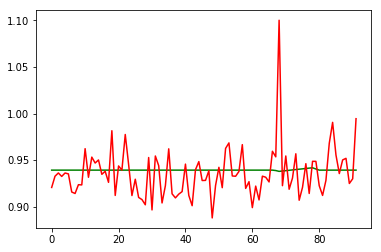

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:14:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1460000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:14:56
INFO:tensorflow:Saving dict for global step 1460000: global_step = 1460000, loss = 0.00045190286
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1460000: ./outputdir/model.ckpt-1460000
error on testset first run {'loss': 0.00045190286, 'global_step': 1460000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1460000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 445.339
INFO:tensorflow:loss = 9.26272e-05, step = 1464601 (0.225 sec)
INFO:tensorflow:global_step/sec: 432.26
INFO:tensorflow:loss = 0.0002417085, step = 1464701 (0.231 sec)
INFO:tensorflow:global_step/sec: 416.726
INFO:tensorflow:loss = 0.0026786367, step = 1464801 (0.240 sec)
INFO:tensorflow:global_step/sec: 427.226
INFO:tensorflow:loss = 0.00010054534, step = 1464901 (0.234 sec)
INFO:tensorflow:global_step/sec: 422.581
INFO:tensorflow:loss = 6.157184e-05, step = 1465001 (0.237 sec)
INFO:tensorflow:global_step/sec: 404.284
INFO:tensorflow:loss = 2.8327908e-05, step = 1465101 (0.247 sec)
INFO:tensorflow:global_step/sec: 441.618
INFO:tensorflow:loss = 0.0010214727, step = 1465201 (0.226 sec)
INFO:tensorflow:global_step/sec: 428.537
INFO:tensorflow:loss = 7.939043e-06, step = 1465301 (0.234 sec)
INFO:tensorflow:global_step/sec: 417.159
INFO:tensorflow:loss = 0.0008362834, step = 1465401 (0.240 sec)
INFO:tensorflow:global_step/sec: 433.127
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1470000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.272135e-05, step = 1470001
INFO:tensorflow:global_step/sec: 165.664
INFO:tensorflow:loss = 0.0011593854, step = 1470101 (0.604 sec)
INFO:tensorflow:global_step/sec: 458.434
INFO:tensorflow:loss = 0.0022609876, step = 1470201 (0.218 sec)
INFO:tensorflow:global_step/sec: 456.865
INFO:tensorflow:loss = 0.0015196872, step = 1470301 (0.219 sec)
INFO:tensorflow:global_step/sec: 456.175
INFO:tensorflow:loss = 0.0025717602, step = 1470401 (0.219 sec)
INFO:tensorflow:global_step/sec: 432.262
INFO:tensorflow:loss = 0.00026520906, step = 1470501 (0.232 sec)
INFO:tensorflow:global_step/sec: 447.54
INFO:tensorflow:loss = 0.00020179158, step = 1470601 (0.223 sec)
INFO:tensorflow:global_step/sec: 461.167
INFO:tensorflow:loss = 0.00023922403, step = 1470701 (0.217 sec)
INFO:tensorflow:global_step/sec: 447.073
INFO:tensor

INFO:tensorflow:Saving checkpoints for 1476000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.1711865e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1476000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 9.493801127707157e-05
prediction at  8 [array([0.93909248])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1476000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1476000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 8.9656925e-05, step = 1476001
I

INFO:tensorflow:loss = 0.00021708461, step = 1481201 (0.226 sec)
INFO:tensorflow:global_step/sec: 431.852
INFO:tensorflow:loss = 6.195877e-05, step = 1481301 (0.232 sec)
INFO:tensorflow:global_step/sec: 429.666
INFO:tensorflow:loss = 0.00076245714, step = 1481401 (0.232 sec)
INFO:tensorflow:global_step/sec: 423.211
INFO:tensorflow:loss = 8.853172e-05, step = 1481501 (0.236 sec)
INFO:tensorflow:global_step/sec: 417.812
INFO:tensorflow:loss = 1.6293221e-05, step = 1481601 (0.239 sec)
INFO:tensorflow:global_step/sec: 417.777
INFO:tensorflow:loss = 3.1594e-06, step = 1481701 (0.240 sec)
INFO:tensorflow:global_step/sec: 408.18
INFO:tensorflow:loss = 0.0017958652, step = 1481801 (0.245 sec)
INFO:tensorflow:global_step/sec: 400.512
INFO:tensorflow:loss = 0.0003285112, step = 1481901 (0.249 sec)
INFO:tensorflow:Saving checkpoints for 1482000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0014964296.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
I

INFO:tensorflow:global_step/sec: 446.588
INFO:tensorflow:loss = 0.0026456139, step = 1486501 (0.224 sec)
INFO:tensorflow:global_step/sec: 434.511
INFO:tensorflow:loss = 0.0003008432, step = 1486601 (0.231 sec)
INFO:tensorflow:global_step/sec: 391.929
INFO:tensorflow:loss = 5.139297e-05, step = 1486701 (0.254 sec)
INFO:tensorflow:global_step/sec: 440.354
INFO:tensorflow:loss = 0.0007220232, step = 1486801 (0.227 sec)
INFO:tensorflow:global_step/sec: 447.237
INFO:tensorflow:loss = 3.4512723e-05, step = 1486901 (0.224 sec)
INFO:tensorflow:global_step/sec: 459.094
INFO:tensorflow:loss = 6.9321184e-05, step = 1487001 (0.218 sec)
INFO:tensorflow:global_step/sec: 454.081
INFO:tensorflow:loss = 0.00457859, step = 1487101 (0.220 sec)
INFO:tensorflow:global_step/sec: 449.055
INFO:tensorflow:loss = 5.3263648e-06, step = 1487201 (0.223 sec)
INFO:tensorflow:global_step/sec: 455.292
INFO:tensorflow:loss = 0.0012874535, step = 1487301 (0.220 sec)
INFO:tensorflow:global_step/sec: 450.746
INFO:tensorfl

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1492000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1492000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00012468036, step = 1492001
INFO:tensorflow:global_step/sec: 163.825
INFO:tensorflow:loss = 6.325915e-06, step = 1492101 (0.611 sec)
INFO:tensorflow:global_step/sec: 437.453
INFO:tensorflow:loss = 6.485822e-06, step = 1492201 (0.229 sec)
INFO:tensorflow:global_step/sec: 442.08
INFO:tensorflow:loss = 6.3523275e-06, step = 1492301 (0.226 sec)
INFO:tensorflow:global_step/sec: 436.817
INFO:tensorflow:loss = 4.2706142e-05, step = 1492401 (0.229 sec)
INFO:tensorflow:global_step/sec: 428.377
INFO:tensorflow:loss = 0.00032973094, step = 1492501 (0.234 sec)
INFO:tensorflow:global_step/sec: 417.717
INFO:tensorflow:loss = 8.368921e-05, step = 1492601 (0.239 sec)
IN

INFO:tensorflow:loss = 0.00021173806, step = 1497801 (0.263 sec)
INFO:tensorflow:global_step/sec: 379.888
INFO:tensorflow:loss = 0.00035819891, step = 1497901 (0.263 sec)
INFO:tensorflow:Saving checkpoints for 1498000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.0662267e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1498000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 0.0010862985838083453
prediction at  19 [array([0.91380165])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1498000
INFO:tensorflow:Running local_init_op.
I

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1502000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1502000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00786991, step = 1502001
INFO:tensorflow:global_step/sec: 163.322
INFO:tensorflow:loss = 5.9613376e-06, step = 1502101 (0.613 sec)
INFO:tensorflow:global_step/sec: 446.823
INFO:tensorflow:loss = 6.9030875e-06, step = 1502201 (0.224 sec)
INFO:tensorflow:global_step/sec: 440.027
INFO:tensorflow:loss = 2.7102387e-06, step = 1502301 (0.227 sec)
INFO:tensorflow:global_step/sec: 396.074
INFO:tensorflow:loss = 1.6500304e-05, step = 1502401 (0.253 sec)
INFO:tensorflow:global_step/sec: 436.651
INFO:tensorflow:loss = 3.246953e-09, step = 1502501 (0.229 sec)
INFO:tensorflow:global_step/sec: 439.601
INFO:tensorflow:loss = 2.855

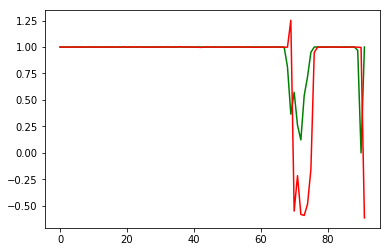

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:17:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1504000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:17:54
INFO:tensorflow:Saving dict for global step 1504000: global_step = 1504000, loss = 0.1434906
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1504000: ./outputdir/model.ckpt-1504000
error on testset first run {'loss': 0.1434906, 'global_step': 1504000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1504000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:global_step/sec: 439.296
INFO:tensorflow:loss = 0.00033625035, step = 1508601 (0.228 sec)
INFO:tensorflow:global_step/sec: 441.868
INFO:tensorflow:loss = 1.5593552e-05, step = 1508701 (0.226 sec)
INFO:tensorflow:global_step/sec: 460.927
INFO:tensorflow:loss = 4.2487427e-06, step = 1508801 (0.217 sec)
INFO:tensorflow:global_step/sec: 425.749
INFO:tensorflow:loss = 0.0009717256, step = 1508901 (0.235 sec)
INFO:tensorflow:global_step/sec: 424.09
INFO:tensorflow:loss = 0.048004575, step = 1509001 (0.236 sec)
INFO:tensorflow:global_step/sec: 453.981
INFO:tensorflow:loss = 0.00039450362, step = 1509101 (0.220 sec)
INFO:tensorflow:global_step/sec: 427.837
INFO:tensorflow:loss = 0.007179876, step = 1509201 (0.234 sec)
INFO:tensorflow:global_step/sec: 440.596
INFO:tensorflow:loss = 0.00059215294, step = 1509301 (0.227 sec)
INFO:tensorflow:global_step/sec: 425.456
INFO:tensorflow:loss = 0.13475002, step = 1509401 (0.235 sec)
INFO:tensorflow:global_step/sec: 431.529
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1514000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0011866009, step = 1514001
INFO:tensorflow:global_step/sec: 168.491
INFO:tensorflow:loss = 0.00027168368, step = 1514101 (0.595 sec)
INFO:tensorflow:global_step/sec: 434.358
INFO:tensorflow:loss = 0.5930574, step = 1514201 (0.230 sec)
INFO:tensorflow:global_step/sec: 434.488
INFO:tensorflow:loss = 0.0007238149, step = 1514301 (0.231 sec)
INFO:tensorflow:global_step/sec: 436.055
INFO:tensorflow:loss = 0.00018717124, step = 1514401 (0.229 sec)
INFO:tensorflow:global_step/sec: 435.121
INFO:tensorflow:loss = 0.00014681515, step = 1514501 (0.230 sec)
INFO:tensorflow:global_step/sec: 441.327
INFO:tensorflow:loss = 0.046461932, step = 1514601 (0.227 sec)
INFO:tensorflow:global_step/sec: 425.132
INFO:tensorflow:loss = 0.0005271756, step = 1514701 (0.235 sec)
INFO:tensorflow:global_step/sec: 435.8
INFO:tensorflow:

INFO:tensorflow:Loss for final step: 0.00044792247.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1520000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 6.844869428540164e-05
prediction at  8 [array([1.01325232])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1520000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1520000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0008892801, step = 1520001
INFO:tensorflow:global_step/sec: 164.318
INFO:tensorflow:loss = 0.040732764, s

INFO:tensorflow:global_step/sec: 420.939
INFO:tensorflow:loss = 0.0016365092, step = 1525401 (0.238 sec)
INFO:tensorflow:global_step/sec: 390.447
INFO:tensorflow:loss = 0.030401796, step = 1525501 (0.256 sec)
INFO:tensorflow:global_step/sec: 431.844
INFO:tensorflow:loss = 0.02242167, step = 1525601 (0.231 sec)
INFO:tensorflow:global_step/sec: 415.707
INFO:tensorflow:loss = 0.0047555654, step = 1525701 (0.242 sec)
INFO:tensorflow:global_step/sec: 399.095
INFO:tensorflow:loss = 0.1026423, step = 1525801 (0.250 sec)
INFO:tensorflow:global_step/sec: 411.545
INFO:tensorflow:loss = 0.00095177355, step = 1525901 (0.242 sec)
INFO:tensorflow:Saving checkpoints for 1526000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00097342086.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1526000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done runn

INFO:tensorflow:loss = 7.397327e-05, step = 1530701 (0.232 sec)
INFO:tensorflow:global_step/sec: 408.817
INFO:tensorflow:loss = 0.00043047042, step = 1530801 (0.245 sec)
INFO:tensorflow:global_step/sec: 430.404
INFO:tensorflow:loss = 2.7067577e-05, step = 1530901 (0.232 sec)
INFO:tensorflow:global_step/sec: 426.776
INFO:tensorflow:loss = 0.001621997, step = 1531001 (0.234 sec)
INFO:tensorflow:global_step/sec: 425.552
INFO:tensorflow:loss = 3.4546345e-05, step = 1531101 (0.235 sec)
INFO:tensorflow:global_step/sec: 431.366
INFO:tensorflow:loss = 0.04343552, step = 1531201 (0.232 sec)
INFO:tensorflow:global_step/sec: 422.169
INFO:tensorflow:loss = 0.6361971, step = 1531301 (0.237 sec)
INFO:tensorflow:global_step/sec: 421.959
INFO:tensorflow:loss = 0.14580464, step = 1531401 (0.237 sec)
INFO:tensorflow:global_step/sec: 427.917
INFO:tensorflow:loss = 0.0061359685, step = 1531501 (0.234 sec)
INFO:tensorflow:global_step/sec: 415.777
INFO:tensorflow:loss = 0.013351874, step = 1531601 (0.241 se

INFO:tensorflow:loss = 0.00012939086, step = 1536001
INFO:tensorflow:global_step/sec: 162.153
INFO:tensorflow:loss = 3.0894833e-05, step = 1536101 (0.617 sec)
INFO:tensorflow:global_step/sec: 466.914
INFO:tensorflow:loss = 0.018228257, step = 1536201 (0.214 sec)
INFO:tensorflow:global_step/sec: 458.573
INFO:tensorflow:loss = 1.7795901e-05, step = 1536301 (0.218 sec)
INFO:tensorflow:global_step/sec: 457.591
INFO:tensorflow:loss = 0.008959599, step = 1536401 (0.219 sec)
INFO:tensorflow:global_step/sec: 448.071
INFO:tensorflow:loss = 1.24800235e-05, step = 1536501 (0.224 sec)
INFO:tensorflow:global_step/sec: 468.439
INFO:tensorflow:loss = 0.015039125, step = 1536601 (0.213 sec)
INFO:tensorflow:global_step/sec: 411.002
INFO:tensorflow:loss = 5.4535813e-05, step = 1536701 (0.243 sec)
INFO:tensorflow:global_step/sec: 430.916
INFO:tensorflow:loss = 0.02594937, step = 1536801 (0.232 sec)
INFO:tensorflow:global_step/sec: 457.848
INFO:tensorflow:loss = 3.529517e-05, step = 1536901 (0.218 sec)
IN

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1542000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 7.441462555648211e-05
prediction at  19 [array([0.99958249])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1542000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1542000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.17827e-06, step = 1542001
INFO:tensorflow:global_step/sec: 164.1
INFO:tensorflow:loss = 1.7677918e-05, step = 1542101 (0.611 sec)
INFO:tensorflow:global_step/sec: 444.223
INFO:tensorflow:lo

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1546000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1546000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.015354444, step = 1546001
INFO:tensorflow:global_step/sec: 166.276
INFO:tensorflow:loss = 1.1241008e-07, step = 1546101 (0.602 sec)
INFO:tensorflow:global_step/sec: 451.824
INFO:tensorflow:loss = 9.117699e-09, step = 1546201 (0.222 sec)
INFO:tensorflow:global_step/sec: 440.631
INFO:tensorflow:loss = 8.174743e-07, step = 1546301 (0.227 sec)
INFO:tensorflow:global_step/sec: 410.587
INFO:tensorflow:loss = 1.2392162e-07, step = 1546401 (0.243 sec)
INFO:tensorflow:global_step/sec: 450.96
INFO:tensorflow:loss = 2.5379273e-07, step = 1546501 (0.222 sec)
INFO:tensorflow:global_step/sec: 458.892
INFO:tensorflow:loss = 2.7262

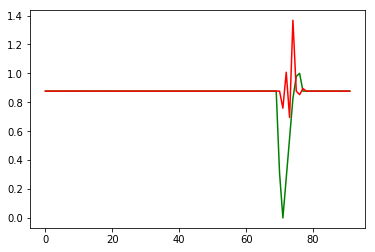

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:20:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1548000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:20:51
INFO:tensorflow:Saving dict for global step 1548000: global_step = 1548000, loss = 0.029087173
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1548000: ./outputdir/model.ckpt-1548000
error on testset first run {'loss': 0.029087173, 'global_step': 1548000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1548000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 439.574
INFO:tensorflow:loss = 0.0012785592, step = 1552601 (0.227 sec)
INFO:tensorflow:global_step/sec: 408.804
INFO:tensorflow:loss = 0.00064254866, step = 1552701 (0.245 sec)
INFO:tensorflow:global_step/sec: 453.318
INFO:tensorflow:loss = 0.0008865343, step = 1552801 (0.220 sec)
INFO:tensorflow:global_step/sec: 452.538
INFO:tensorflow:loss = 0.0017415958, step = 1552901 (0.221 sec)
INFO:tensorflow:global_step/sec: 354.079
INFO:tensorflow:loss = 0.00078696664, step = 1553001 (0.282 sec)
INFO:tensorflow:global_step/sec: 433.535
INFO:tensorflow:loss = 0.003348692, step = 1553101 (0.231 sec)
INFO:tensorflow:global_step/sec: 436.547
INFO:tensorflow:loss = 0.4194245, step = 1553201 (0.229 sec)
INFO:tensorflow:global_step/sec: 459.81
INFO:tensorflow:loss = 0.0018555349, step = 1553301 (0.217 sec)
INFO:tensorflow:global_step/sec: 452.812
INFO:tensorflow:loss = 0.00023711572, step = 1553401 (0.221 sec)
INFO:tensorflow:global_step/sec: 454.862
INFO:tensorflow:

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1558000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0021867952, step = 1558001
INFO:tensorflow:global_step/sec: 161.221
INFO:tensorflow:loss = 0.0020940027, step = 1558101 (0.621 sec)
INFO:tensorflow:global_step/sec: 445.835
INFO:tensorflow:loss = 8.285688e-06, step = 1558201 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.389
INFO:tensorflow:loss = 0.0030415326, step = 1558301 (0.225 sec)
INFO:tensorflow:global_step/sec: 439.559
INFO:tensorflow:loss = 0.0026202777, step = 1558401 (0.228 sec)
INFO:tensorflow:global_step/sec: 433.069
INFO:tensorflow:loss = 0.0017087191, step = 1558501 (0.231 sec)
INFO:tensorflow:global_step/sec: 388.686
INFO:tensorflow:loss = 0.00012134857, step = 1558601 (0.257 sec)
INFO:tensorflow:global_step/sec: 452.515
INFO:tensorflow:loss = 0.002268198, step = 1558701 (0.221 sec)
INFO:tensorflow:global_step/sec: 443.658
INFO:tensorfl

INFO:tensorflow:Loss for final step: 9.0336594e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1564000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 3.0270699316887675e-06
prediction at  8 [array([0.82469065])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1564000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1564000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0028219072, step = 1564001
INFO:tensorflow:global_step/sec: 163.176
INFO:tensorflow:loss = 0.00322509, s

INFO:tensorflow:global_step/sec: 456.223
INFO:tensorflow:loss = 0.006377882, step = 1569401 (0.219 sec)
INFO:tensorflow:global_step/sec: 448.052
INFO:tensorflow:loss = 0.0054130554, step = 1569501 (0.224 sec)
INFO:tensorflow:global_step/sec: 447.72
INFO:tensorflow:loss = 0.36724252, step = 1569601 (0.223 sec)
INFO:tensorflow:global_step/sec: 432.137
INFO:tensorflow:loss = 9.3586525e-05, step = 1569701 (0.232 sec)
INFO:tensorflow:global_step/sec: 408.973
INFO:tensorflow:loss = 0.00011707565, step = 1569801 (0.244 sec)
INFO:tensorflow:global_step/sec: 411.55
INFO:tensorflow:loss = 0.006341101, step = 1569901 (0.243 sec)
INFO:tensorflow:Saving checkpoints for 1570000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.005705302.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1570000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done runni

INFO:tensorflow:global_step/sec: 427.458
INFO:tensorflow:loss = 0.009138826, step = 1574701 (0.234 sec)
INFO:tensorflow:global_step/sec: 452.698
INFO:tensorflow:loss = 0.011818432, step = 1574801 (0.221 sec)
INFO:tensorflow:global_step/sec: 435.479
INFO:tensorflow:loss = 0.011800736, step = 1574901 (0.229 sec)
INFO:tensorflow:global_step/sec: 439.277
INFO:tensorflow:loss = 0.0015201195, step = 1575001 (0.228 sec)
INFO:tensorflow:global_step/sec: 456.075
INFO:tensorflow:loss = 0.01093842, step = 1575101 (0.219 sec)
INFO:tensorflow:global_step/sec: 457.771
INFO:tensorflow:loss = 0.32084683, step = 1575201 (0.219 sec)
INFO:tensorflow:global_step/sec: 461.555
INFO:tensorflow:loss = 1.6809647e-06, step = 1575301 (0.217 sec)
INFO:tensorflow:global_step/sec: 443.969
INFO:tensorflow:loss = 7.248696e-07, step = 1575401 (0.225 sec)
INFO:tensorflow:global_step/sec: 419.017
INFO:tensorflow:loss = 1.4182447e-06, step = 1575501 (0.239 sec)
INFO:tensorflow:global_step/sec: 422.3
INFO:tensorflow:loss 

INFO:tensorflow:loss = 5.4815473e-08, step = 1580001
INFO:tensorflow:global_step/sec: 161.603
INFO:tensorflow:loss = 0.00089151756, step = 1580101 (0.620 sec)
INFO:tensorflow:global_step/sec: 460.711
INFO:tensorflow:loss = 1.1602786e-05, step = 1580201 (0.217 sec)
INFO:tensorflow:global_step/sec: 453.541
INFO:tensorflow:loss = 7.622009e-05, step = 1580301 (0.221 sec)
INFO:tensorflow:global_step/sec: 447.151
INFO:tensorflow:loss = 3.880638e-06, step = 1580401 (0.223 sec)
INFO:tensorflow:global_step/sec: 447.113
INFO:tensorflow:loss = 6.198974e-05, step = 1580501 (0.224 sec)
INFO:tensorflow:global_step/sec: 448.13
INFO:tensorflow:loss = 4.612506e-06, step = 1580601 (0.223 sec)
INFO:tensorflow:global_step/sec: 441.772
INFO:tensorflow:loss = 0.00010226435, step = 1580701 (0.227 sec)
INFO:tensorflow:global_step/sec: 446.028
INFO:tensorflow:loss = 9.262726e-06, step = 1580801 (0.224 sec)
INFO:tensorflow:global_step/sec: 449.097
INFO:tensorflow:loss = 0.0009606353, step = 1580901 (0.223 sec)


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1586000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 0.00040598863925397617
prediction at  19 [array([0.87277108])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1586000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1586000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00013234463, step = 1586001
INFO:tensorflow:global_step/sec: 158.7
INFO:tensorflow:loss = 0.00014369319, step = 1586101 (0.631 sec)
INFO:tensorflow:global

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1590000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1590000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.02887235, step = 1590001
INFO:tensorflow:global_step/sec: 165.411
INFO:tensorflow:loss = 0.00021411771, step = 1590101 (0.605 sec)
INFO:tensorflow:global_step/sec: 453.356
INFO:tensorflow:loss = 2.6726893e-06, step = 1590201 (0.221 sec)
INFO:tensorflow:global_step/sec: 451.139
INFO:tensorflow:loss = 0.00010367602, step = 1590301 (0.222 sec)
INFO:tensorflow:global_step/sec: 457.446
INFO:tensorflow:loss = 1.2392943e-06, step = 1590401 (0.219 sec)
INFO:tensorflow:global_step/sec: 448.272
INFO:tensorflow:loss = 8.866749e-07, step = 1590501 (0.223 sec)
INFO:tensorflow:global_step/sec: 448.442
INFO:tensorflow:loss = 0.000

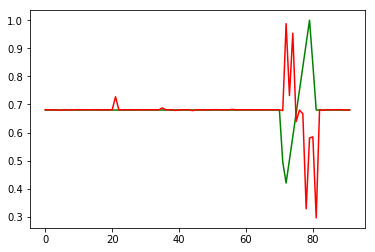

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:23:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1592000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:23:45
INFO:tensorflow:Saving dict for global step 1592000: global_step = 1592000, loss = 0.0112917125
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1592000: ./outputdir/model.ckpt-1592000
error on testset first run {'loss': 0.0112917125, 'global_step': 1592000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1592000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 428.594
INFO:tensorflow:loss = 0.00016775662, step = 1596601 (0.233 sec)
INFO:tensorflow:global_step/sec: 449.455
INFO:tensorflow:loss = 0.0012821592, step = 1596701 (0.222 sec)
INFO:tensorflow:global_step/sec: 437.21
INFO:tensorflow:loss = 8.206954e-06, step = 1596801 (0.229 sec)
INFO:tensorflow:global_step/sec: 465.11
INFO:tensorflow:loss = 0.0019593085, step = 1596901 (0.215 sec)
INFO:tensorflow:global_step/sec: 442.872
INFO:tensorflow:loss = 0.00019821753, step = 1597001 (0.226 sec)
INFO:tensorflow:global_step/sec: 445.551
INFO:tensorflow:loss = 2.8784061e-06, step = 1597101 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.866
INFO:tensorflow:loss = 8.79852e-05, step = 1597201 (0.225 sec)
INFO:tensorflow:global_step/sec: 438.906
INFO:tensorflow:loss = 0.00010309542, step = 1597301 (0.228 sec)
INFO:tensorflow:global_step/sec: 433.348
INFO:tensorflow:loss = 0.0016504275, step = 1597401 (0.231 sec)
INFO:tensorflow:global_step/sec: 439.696
INFO:tensorfl

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1602000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00028493156, step = 1602001
INFO:tensorflow:global_step/sec: 167.01
INFO:tensorflow:loss = 0.00015106025, step = 1602101 (0.600 sec)
INFO:tensorflow:global_step/sec: 447.701
INFO:tensorflow:loss = 0.06918603, step = 1602201 (0.223 sec)
INFO:tensorflow:global_step/sec: 450.43
INFO:tensorflow:loss = 0.004292822, step = 1602301 (0.222 sec)
INFO:tensorflow:global_step/sec: 453.719
INFO:tensorflow:loss = 0.00064692256, step = 1602401 (0.220 sec)
INFO:tensorflow:global_step/sec: 454.079
INFO:tensorflow:loss = 0.000236525, step = 1602501 (0.220 sec)
INFO:tensorflow:global_step/sec: 445.954
INFO:tensorflow:loss = 0.00012990665, step = 1602601 (0.225 sec)
INFO:tensorflow:global_step/sec: 438.184
INFO:tensorflow:loss = 0.0009103868, step = 1602701 (0.228 sec)
INFO:tensorflow:global_step/sec: 440.529
INFO:tensorflow

INFO:tensorflow:Saving checkpoints for 1608000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0004684058.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1608000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.007542957089738354
prediction at  8 [array([0.45738531])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1608000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1608000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0003363706, step = 1608001
INFO

INFO:tensorflow:global_step/sec: 457.878
INFO:tensorflow:loss = 0.005051201, step = 1613301 (0.219 sec)
INFO:tensorflow:global_step/sec: 454.496
INFO:tensorflow:loss = 0.00013843915, step = 1613401 (0.220 sec)
INFO:tensorflow:global_step/sec: 439.332
INFO:tensorflow:loss = 0.0021999432, step = 1613501 (0.228 sec)
INFO:tensorflow:global_step/sec: 445.198
INFO:tensorflow:loss = 0.0020994067, step = 1613601 (0.225 sec)
INFO:tensorflow:global_step/sec: 453.826
INFO:tensorflow:loss = 0.0050459583, step = 1613701 (0.221 sec)
INFO:tensorflow:global_step/sec: 440.812
INFO:tensorflow:loss = 0.008548279, step = 1613801 (0.226 sec)
INFO:tensorflow:global_step/sec: 456.923
INFO:tensorflow:loss = 0.0011068097, step = 1613901 (0.219 sec)
INFO:tensorflow:Saving checkpoints for 1614000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 7.237282e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring par

INFO:tensorflow:global_step/sec: 451.046
INFO:tensorflow:loss = 0.0009612894, step = 1618601 (0.222 sec)
INFO:tensorflow:global_step/sec: 434.229
INFO:tensorflow:loss = 0.0053679897, step = 1618701 (0.230 sec)
INFO:tensorflow:global_step/sec: 435.255
INFO:tensorflow:loss = 0.0012690861, step = 1618801 (0.230 sec)
INFO:tensorflow:global_step/sec: 439.475
INFO:tensorflow:loss = 0.0013382554, step = 1618901 (0.228 sec)
INFO:tensorflow:global_step/sec: 445.452
INFO:tensorflow:loss = 0.00053403777, step = 1619001 (0.224 sec)
INFO:tensorflow:global_step/sec: 431.699
INFO:tensorflow:loss = 0.0028906688, step = 1619101 (0.232 sec)
INFO:tensorflow:global_step/sec: 443.439
INFO:tensorflow:loss = 0.0034883204, step = 1619201 (0.225 sec)
INFO:tensorflow:global_step/sec: 423.472
INFO:tensorflow:loss = 0.04923524, step = 1619301 (0.236 sec)
INFO:tensorflow:global_step/sec: 453.879
INFO:tensorflow:loss = 0.0012374145, step = 1619401 (0.220 sec)
INFO:tensorflow:global_step/sec: 448.686
INFO:tensorflow

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1624000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00859549, step = 1624001
INFO:tensorflow:global_step/sec: 167.547
INFO:tensorflow:loss = 0.006833802, step = 1624101 (0.598 sec)
INFO:tensorflow:global_step/sec: 460.98
INFO:tensorflow:loss = 0.007722693, step = 1624201 (0.217 sec)
INFO:tensorflow:global_step/sec: 456.304
INFO:tensorflow:loss = 0.005546622, step = 1624301 (0.219 sec)
INFO:tensorflow:global_step/sec: 461.711
INFO:tensorflow:loss = 4.6551036e-06, step = 1624401 (0.217 sec)
INFO:tensorflow:global_step/sec: 460.865
INFO:tensorflow:loss = 0.001399367, step = 1624501 (0.217 sec)
INFO:tensorflow:global_step/sec: 457.496
INFO:tensorflow:loss = 0.007065525, step = 1624601 (0.219 sec)
INFO:tensorflow:global_step/sec: 395.102
INFO:tensorflow:loss = 0.0011161413, step = 1624701 (0.253 sec)
INFO:tensorflow:global_step/sec: 453.032
INFO:tensorflow:loss

INFO:tensorflow:Loss for final step: 0.009318897.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1630000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 0.1912445619155453
prediction at  19 [array([0.55995699])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1630000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1630000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0062637352, step = 1630001
INFO:tensorflow:global_step/sec: 155.813
INFO:tensorflow:loss = 0.00016971548, st

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1634000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1634000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.09861383, step = 1634001
INFO:tensorflow:global_step/sec: 161.53
INFO:tensorflow:loss = 0.005681385, step = 1634101 (0.620 sec)
INFO:tensorflow:global_step/sec: 450.794
INFO:tensorflow:loss = 0.00035677667, step = 1634201 (0.221 sec)
INFO:tensorflow:global_step/sec: 457.337
INFO:tensorflow:loss = 0.00014392192, step = 1634301 (0.219 sec)
INFO:tensorflow:global_step/sec: 454.651
INFO:tensorflow:loss = 1.30339295e-05, step = 1634401 (0.220 sec)
INFO:tensorflow:global_step/sec: 444.866
INFO:tensorflow:loss = 5.3631957e-05, step = 1634501 (0.225 sec)
INFO:tensorflow:global_step/sec: 444.308
INFO:tensorflow:loss = 1.0371

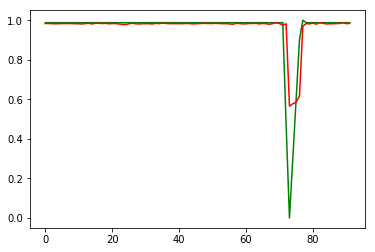

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:26:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1636000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:26:38
INFO:tensorflow:Saving dict for global step 1636000: global_step = 1636000, loss = 0.00699814
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1636000: ./outputdir/model.ckpt-1636000
error on testset first run {'loss': 0.00699814, 'global_step': 1636000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1636000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:global_step/sec: 418.058
INFO:tensorflow:loss = 0.00052443665, step = 1640601 (0.240 sec)
INFO:tensorflow:global_step/sec: 459.813
INFO:tensorflow:loss = 0.00021938806, step = 1640701 (0.217 sec)
INFO:tensorflow:global_step/sec: 456.082
INFO:tensorflow:loss = 0.00030863643, step = 1640801 (0.219 sec)
INFO:tensorflow:global_step/sec: 460.026
INFO:tensorflow:loss = 0.0007520942, step = 1640901 (0.218 sec)
INFO:tensorflow:global_step/sec: 455.552
INFO:tensorflow:loss = 0.0001504806, step = 1641001 (0.219 sec)
INFO:tensorflow:global_step/sec: 444.866
INFO:tensorflow:loss = 0.0010525667, step = 1641101 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.733
INFO:tensorflow:loss = 7.5555465e-05, step = 1641201 (0.226 sec)
INFO:tensorflow:global_step/sec: 438.366
INFO:tensorflow:loss = 0.0010685886, step = 1641301 (0.228 sec)
INFO:tensorflow:global_step/sec: 437.548
INFO:tensorflow:loss = 0.13368197, step = 1641401 (0.229 sec)
INFO:tensorflow:global_step/sec: 438.133
INFO:tensorf

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1646000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00102278, step = 1646001
INFO:tensorflow:global_step/sec: 166.175
INFO:tensorflow:loss = 0.000680593, step = 1646101 (0.603 sec)
INFO:tensorflow:global_step/sec: 452.894
INFO:tensorflow:loss = 0.00029316597, step = 1646201 (0.221 sec)
INFO:tensorflow:global_step/sec: 439.246
INFO:tensorflow:loss = 4.5708093e-05, step = 1646301 (0.228 sec)
INFO:tensorflow:global_step/sec: 441.879
INFO:tensorflow:loss = 0.0012574324, step = 1646401 (0.226 sec)
INFO:tensorflow:global_step/sec: 421.111
INFO:tensorflow:loss = 0.0007786417, step = 1646501 (0.237 sec)
INFO:tensorflow:global_step/sec: 422.986
INFO:tensorflow:loss = 0.12817478, step = 1646601 (0.236 sec)
INFO:tensorflow:global_step/sec: 385.134
INFO:tensorflow:loss = 0.00065980863, step = 1646701 (0.260 sec)
INFO:tensorflow:global_step/sec: 452.677
INFO:tensorflow

INFO:tensorflow:Saving checkpoints for 1652000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.438795e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1652000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 5.0247182979271426e-05
prediction at  8 [array([0.95621857])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1652000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1652000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0006412772, step = 1652001
IN

INFO:tensorflow:global_step/sec: 449.109
INFO:tensorflow:loss = 0.0019242868, step = 1657301 (0.223 sec)
INFO:tensorflow:global_step/sec: 453.681
INFO:tensorflow:loss = 0.0019082194, step = 1657401 (0.220 sec)
INFO:tensorflow:global_step/sec: 456.013
INFO:tensorflow:loss = 0.001575624, step = 1657501 (0.219 sec)
INFO:tensorflow:global_step/sec: 451.726
INFO:tensorflow:loss = 0.0015744506, step = 1657601 (0.221 sec)
INFO:tensorflow:global_step/sec: 446.804
INFO:tensorflow:loss = 0.113197386, step = 1657701 (0.224 sec)
INFO:tensorflow:global_step/sec: 429.553
INFO:tensorflow:loss = 5.8934243e-06, step = 1657801 (0.233 sec)
INFO:tensorflow:global_step/sec: 403.844
INFO:tensorflow:loss = 2.8640294e-05, step = 1657901 (0.248 sec)
INFO:tensorflow:Saving checkpoints for 1658000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0013597619.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring pa

INFO:tensorflow:global_step/sec: 442.805
INFO:tensorflow:loss = 0.00057474273, step = 1662601 (0.226 sec)
INFO:tensorflow:global_step/sec: 442.53
INFO:tensorflow:loss = 1.3727208e-07, step = 1662701 (0.226 sec)
INFO:tensorflow:global_step/sec: 432.91
INFO:tensorflow:loss = 0.0024879756, step = 1662801 (0.232 sec)
INFO:tensorflow:global_step/sec: 406.636
INFO:tensorflow:loss = 0.0040989085, step = 1662901 (0.245 sec)
INFO:tensorflow:global_step/sec: 412.856
INFO:tensorflow:loss = 0.00033053453, step = 1663001 (0.242 sec)
INFO:tensorflow:global_step/sec: 448.882
INFO:tensorflow:loss = 0.0039605284, step = 1663101 (0.223 sec)
INFO:tensorflow:global_step/sec: 444.055
INFO:tensorflow:loss = 0.0040652137, step = 1663201 (0.225 sec)
INFO:tensorflow:global_step/sec: 439.524
INFO:tensorflow:loss = 0.0034637563, step = 1663301 (0.227 sec)
INFO:tensorflow:global_step/sec: 435.046
INFO:tensorflow:loss = 0.10189468, step = 1663401 (0.230 sec)
INFO:tensorflow:global_step/sec: 444.84
INFO:tensorflow:

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1668000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.07783364, step = 1668001
INFO:tensorflow:global_step/sec: 163.539
INFO:tensorflow:loss = 7.430789e-05, step = 1668101 (0.612 sec)
INFO:tensorflow:global_step/sec: 464.427
INFO:tensorflow:loss = 0.065425076, step = 1668201 (0.215 sec)
INFO:tensorflow:global_step/sec: 450.138
INFO:tensorflow:loss = 0.00020242372, step = 1668301 (0.222 sec)
INFO:tensorflow:global_step/sec: 458.283
INFO:tensorflow:loss = 0.07189638, step = 1668401 (0.218 sec)
INFO:tensorflow:global_step/sec: 449.231
INFO:tensorflow:loss = 9.8440716e-05, step = 1668501 (0.223 sec)
INFO:tensorflow:global_step/sec: 448.615
INFO:tensorflow:loss = 0.065724574, step = 1668601 (0.222 sec)
INFO:tensorflow:global_step/sec: 465.907
INFO:tensorflow:loss = 2.0984236e-05, step = 1668701 (0.215 sec)
INFO:tensorflow:global_step/sec: 465.298
INFO:tensorflow:

INFO:tensorflow:Saving checkpoints for 1674000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.080387e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1674000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 0.00343682990797372
prediction at  19 [array([0.8968224])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1674000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1674000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.3000066e-06, step = 1674001
INF

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1678000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1678000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.92334086, step = 1678001
INFO:tensorflow:global_step/sec: 155.221
INFO:tensorflow:loss = 0.0018472843, step = 1678101 (0.645 sec)
INFO:tensorflow:global_step/sec: 440.254
INFO:tensorflow:loss = 0.0021664046, step = 1678201 (0.227 sec)
INFO:tensorflow:global_step/sec: 442.627
INFO:tensorflow:loss = 0.00052633986, step = 1678301 (0.226 sec)
INFO:tensorflow:global_step/sec: 435.529
INFO:tensorflow:loss = 8.119452e-06, step = 1678401 (0.229 sec)
INFO:tensorflow:global_step/sec: 438.012
INFO:tensorflow:loss = 0.0047981977, step = 1678501 (0.228 sec)
INFO:tensorflow:global_step/sec: 444.109
INFO:tensorflow:loss = 1.486140

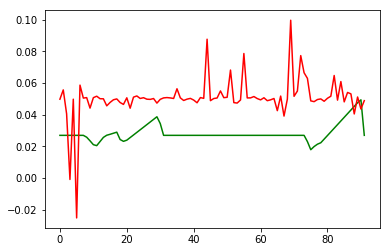

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:29:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1680000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:29:33
INFO:tensorflow:Saving dict for global step 1680000: global_step = 1680000, loss = 0.0008524025
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1680000: ./outputdir/model.ckpt-1680000
error on testset first run {'loss': 0.0008524025, 'global_step': 1680000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1680000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 443.661
INFO:tensorflow:loss = 0.00078754895, step = 1684601 (0.225 sec)
INFO:tensorflow:global_step/sec: 447.17
INFO:tensorflow:loss = 1.2101706e-05, step = 1684701 (0.223 sec)
INFO:tensorflow:global_step/sec: 450.603
INFO:tensorflow:loss = 5.0332652e-05, step = 1684801 (0.222 sec)
INFO:tensorflow:global_step/sec: 454.256
INFO:tensorflow:loss = 0.00240708, step = 1684901 (0.220 sec)
INFO:tensorflow:global_step/sec: 455.72
INFO:tensorflow:loss = 0.0002471563, step = 1685001 (0.220 sec)
INFO:tensorflow:global_step/sec: 459.813
INFO:tensorflow:loss = 3.3329272e-06, step = 1685101 (0.218 sec)
INFO:tensorflow:global_step/sec: 461.512
INFO:tensorflow:loss = 0.00014799436, step = 1685201 (0.216 sec)
INFO:tensorflow:global_step/sec: 447.364
INFO:tensorflow:loss = 7.995488e-06, step = 1685301 (0.224 sec)
INFO:tensorflow:global_step/sec: 447.285
INFO:tensorflow:loss = 6.635937e-05, step = 1685401 (0.223 sec)
INFO:tensorflow:global_step/sec: 439.18
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1690000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.232976e-06, step = 1690001
INFO:tensorflow:global_step/sec: 164.023
INFO:tensorflow:loss = 2.7226622e-05, step = 1690101 (0.611 sec)
INFO:tensorflow:global_step/sec: 454.957
INFO:tensorflow:loss = 0.00024445282, step = 1690201 (0.220 sec)
INFO:tensorflow:global_step/sec: 459.997
INFO:tensorflow:loss = 6.3786756e-05, step = 1690301 (0.217 sec)
INFO:tensorflow:global_step/sec: 445.881
INFO:tensorflow:loss = 0.006046215, step = 1690401 (0.224 sec)
INFO:tensorflow:global_step/sec: 395.626
INFO:tensorflow:loss = 2.8957158e-05, step = 1690501 (0.253 sec)
INFO:tensorflow:global_step/sec: 453.997
INFO:tensorflow:loss = 6.836843e-05, step = 1690601 (0.220 sec)
INFO:tensorflow:global_step/sec: 430.668
INFO:tensorflow:loss = 0.0004330797, step = 1690701 (0.232 sec)
INFO:tensorflow:global_step/sec: 448.984
INFO:tenso

INFO:tensorflow:Saving checkpoints for 1696000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.1104587e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1696000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.3140459084240297e-05
prediction at  8 [array([0.05211377])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1696000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1696000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0004418058, step = 1696001
I

INFO:tensorflow:loss = 8.254556e-06, step = 1701201 (0.225 sec)
INFO:tensorflow:global_step/sec: 444.407
INFO:tensorflow:loss = 0.0023440206, step = 1701301 (0.225 sec)
INFO:tensorflow:global_step/sec: 435.05
INFO:tensorflow:loss = 2.2240667e-06, step = 1701401 (0.230 sec)
INFO:tensorflow:global_step/sec: 451.748
INFO:tensorflow:loss = 4.3249333e-05, step = 1701501 (0.221 sec)
INFO:tensorflow:global_step/sec: 424.09
INFO:tensorflow:loss = 8.076125e-05, step = 1701601 (0.236 sec)
INFO:tensorflow:global_step/sec: 425.168
INFO:tensorflow:loss = 9.169922e-06, step = 1701701 (0.235 sec)
INFO:tensorflow:global_step/sec: 436.674
INFO:tensorflow:loss = 0.0042565875, step = 1701801 (0.229 sec)
INFO:tensorflow:global_step/sec: 427.991
INFO:tensorflow:loss = 6.6656976e-06, step = 1701901 (0.234 sec)
INFO:tensorflow:Saving checkpoints for 1702000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00045399996.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.

INFO:tensorflow:global_step/sec: 459.015
INFO:tensorflow:loss = 0.003981695, step = 1706501 (0.218 sec)
INFO:tensorflow:global_step/sec: 451.748
INFO:tensorflow:loss = 2.8007178e-06, step = 1706601 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.64
INFO:tensorflow:loss = 3.3406168e-06, step = 1706701 (0.220 sec)
INFO:tensorflow:global_step/sec: 454.324
INFO:tensorflow:loss = 0.00047507533, step = 1706801 (0.220 sec)
INFO:tensorflow:global_step/sec: 452.19
INFO:tensorflow:loss = 0.0024193306, step = 1706901 (0.221 sec)
INFO:tensorflow:global_step/sec: 405.721
INFO:tensorflow:loss = 4.0933137e-06, step = 1707001 (0.247 sec)
INFO:tensorflow:global_step/sec: 412.791
INFO:tensorflow:loss = 5.1004945e-06, step = 1707101 (0.243 sec)
INFO:tensorflow:global_step/sec: 417.415
INFO:tensorflow:loss = 2.1274382e-05, step = 1707201 (0.239 sec)
INFO:tensorflow:global_step/sec: 431.003
INFO:tensorflow:loss = 0.00055165536, step = 1707301 (0.232 sec)
INFO:tensorflow:global_step/sec: 443.981
INFO:tenso

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1712000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1712000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.767166e-07, step = 1712001
INFO:tensorflow:global_step/sec: 158.694
INFO:tensorflow:loss = 2.4009352e-05, step = 1712101 (0.631 sec)
INFO:tensorflow:global_step/sec: 445.913
INFO:tensorflow:loss = 1.5125828e-06, step = 1712201 (0.224 sec)
INFO:tensorflow:global_step/sec: 428.196
INFO:tensorflow:loss = 3.6181603e-07, step = 1712301 (0.233 sec)
INFO:tensorflow:global_step/sec: 449.575
INFO:tensorflow:loss = 4.4640746e-08, step = 1712401 (0.222 sec)
INFO:tensorflow:global_step/sec: 444.012
INFO:tensorflow:loss = 2.0791285e-06, step = 1712501 (0.225 sec)
INFO:tensorflow:global_step/sec: 451.062
INFO:tensorflow:loss = 6.321943e-08, step = 1712601 (0.222 sec)


INFO:tensorflow:loss = 0.0038884392, step = 1717801 (0.251 sec)
INFO:tensorflow:global_step/sec: 406.732
INFO:tensorflow:loss = 0.0022044089, step = 1717901 (0.245 sec)
INFO:tensorflow:Saving checkpoints for 1718000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.264618e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1718000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 6.795210399635695e-10
prediction at  19 [array([0.05026104])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1718000
INFO:tensorflow:Running local_init_op.
INFO

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1722000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1722000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.001773932, step = 1722001
INFO:tensorflow:global_step/sec: 164.421
INFO:tensorflow:loss = 0.00014071929, step = 1722101 (0.609 sec)
INFO:tensorflow:global_step/sec: 459.405
INFO:tensorflow:loss = 0.0010540602, step = 1722201 (0.218 sec)
INFO:tensorflow:global_step/sec: 455.297
INFO:tensorflow:loss = 2.206258e-06, step = 1722301 (0.219 sec)
INFO:tensorflow:global_step/sec: 456.706
INFO:tensorflow:loss = 1.8742528e-05, step = 1722401 (0.219 sec)
INFO:tensorflow:global_step/sec: 447.321
INFO:tensorflow:loss = 3.504561e-07, step = 1722501 (0.224 sec)
INFO:tensorflow:global_step/sec: 417.643
INFO:tensorflow:loss = 1.3811

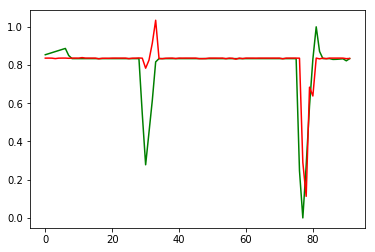

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:32:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1724000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:32:27
INFO:tensorflow:Saving dict for global step 1724000: global_step = 1724000, loss = 0.00968774
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1724000: ./outputdir/model.ckpt-1724000
error on testset first run {'loss': 0.00968774, 'global_step': 1724000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1724000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:global_step/sec: 442.081
INFO:tensorflow:loss = 0.0007637184, step = 1728601 (0.226 sec)
INFO:tensorflow:global_step/sec: 457.25
INFO:tensorflow:loss = 0.19372596, step = 1728701 (0.219 sec)
INFO:tensorflow:global_step/sec: 457.965
INFO:tensorflow:loss = 0.00018694624, step = 1728801 (0.219 sec)
INFO:tensorflow:global_step/sec: 409.774
INFO:tensorflow:loss = 5.430541e-05, step = 1728901 (0.244 sec)
INFO:tensorflow:global_step/sec: 450.296
INFO:tensorflow:loss = 0.0005346633, step = 1729001 (0.222 sec)
INFO:tensorflow:global_step/sec: 477.443
INFO:tensorflow:loss = 0.0006284756, step = 1729101 (0.209 sec)
INFO:tensorflow:global_step/sec: 460.153
INFO:tensorflow:loss = 0.0009353031, step = 1729201 (0.217 sec)
INFO:tensorflow:global_step/sec: 464.874
INFO:tensorflow:loss = 0.00076761073, step = 1729301 (0.215 sec)
INFO:tensorflow:global_step/sec: 457.515
INFO:tensorflow:loss = 0.000767908, step = 1729401 (0.219 sec)
INFO:tensorflow:global_step/sec: 448.865
INFO:tensorflow:

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1734000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00081464136, step = 1734001
INFO:tensorflow:global_step/sec: 158.652
INFO:tensorflow:loss = 0.00053077005, step = 1734101 (0.631 sec)
INFO:tensorflow:global_step/sec: 461.361
INFO:tensorflow:loss = 0.0007603059, step = 1734201 (0.217 sec)
INFO:tensorflow:global_step/sec: 460.776
INFO:tensorflow:loss = 0.17822996, step = 1734301 (0.217 sec)
INFO:tensorflow:global_step/sec: 446.357
INFO:tensorflow:loss = 0.00022975044, step = 1734401 (0.224 sec)
INFO:tensorflow:global_step/sec: 448.567
INFO:tensorflow:loss = 0.001154941, step = 1734501 (0.223 sec)
INFO:tensorflow:global_step/sec: 454.356
INFO:tensorflow:loss = 0.00092581555, step = 1734601 (0.220 sec)
INFO:tensorflow:global_step/sec: 440.468
INFO:tensorflow:loss = 1.2796538e-05, step = 1734701 (0.227 sec)
INFO:tensorflow:global_step/sec: 447.776
INFO:tensor

INFO:tensorflow:Saving checkpoints for 1740000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00097377424.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1740000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 7.209895794677913e-06
prediction at  8 [array([0.80367954])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1740000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1740000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0001370038, step = 1740001
IN

INFO:tensorflow:global_step/sec: 398.298
INFO:tensorflow:loss = 8.734787e-07, step = 1745301 (0.251 sec)
INFO:tensorflow:global_step/sec: 451.697
INFO:tensorflow:loss = 0.001071845, step = 1745401 (0.221 sec)
INFO:tensorflow:global_step/sec: 442.334
INFO:tensorflow:loss = 0.0019166387, step = 1745501 (0.226 sec)
INFO:tensorflow:global_step/sec: 450.033
INFO:tensorflow:loss = 0.0018776709, step = 1745601 (0.222 sec)
INFO:tensorflow:global_step/sec: 444.422
INFO:tensorflow:loss = 0.0017254599, step = 1745701 (0.225 sec)
INFO:tensorflow:global_step/sec: 437.677
INFO:tensorflow:loss = 0.0016199908, step = 1745801 (0.228 sec)
INFO:tensorflow:global_step/sec: 443.135
INFO:tensorflow:loss = 0.17300414, step = 1745901 (0.226 sec)
INFO:tensorflow:Saving checkpoints for 1746000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.035899e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring param

INFO:tensorflow:global_step/sec: 451.05
INFO:tensorflow:loss = 0.0049684034, step = 1750601 (0.222 sec)
INFO:tensorflow:global_step/sec: 446.267
INFO:tensorflow:loss = 0.15556166, step = 1750701 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.852
INFO:tensorflow:loss = 1.7418122e-05, step = 1750801 (0.225 sec)
INFO:tensorflow:global_step/sec: 433.129
INFO:tensorflow:loss = 5.919406e-07, step = 1750901 (0.231 sec)
INFO:tensorflow:global_step/sec: 424.648
INFO:tensorflow:loss = 3.813555e-05, step = 1751001 (0.235 sec)
INFO:tensorflow:global_step/sec: 450.057
INFO:tensorflow:loss = 0.0030911798, step = 1751101 (0.223 sec)
INFO:tensorflow:global_step/sec: 441.591
INFO:tensorflow:loss = 0.003439398, step = 1751201 (0.226 sec)
INFO:tensorflow:global_step/sec: 463.962
INFO:tensorflow:loss = 0.0034962809, step = 1751301 (0.215 sec)
INFO:tensorflow:global_step/sec: 476.644
INFO:tensorflow:loss = 0.0034167909, step = 1751401 (0.210 sec)
INFO:tensorflow:global_step/sec: 426.443
INFO:tensorflow:l

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1756000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.006940071, step = 1756001
INFO:tensorflow:global_step/sec: 160.067
INFO:tensorflow:loss = 0.12830533, step = 1756101 (0.626 sec)
INFO:tensorflow:global_step/sec: 448.92
INFO:tensorflow:loss = 0.009814832, step = 1756201 (0.223 sec)
INFO:tensorflow:global_step/sec: 425.594
INFO:tensorflow:loss = 0.13235651, step = 1756301 (0.235 sec)
INFO:tensorflow:global_step/sec: 389.458
INFO:tensorflow:loss = 0.008243047, step = 1756401 (0.257 sec)
INFO:tensorflow:global_step/sec: 443.634
INFO:tensorflow:loss = 0.13373545, step = 1756501 (0.225 sec)
INFO:tensorflow:global_step/sec: 433.665
INFO:tensorflow:loss = 0.008469508, step = 1756601 (0.231 sec)
INFO:tensorflow:global_step/sec: 441.007
INFO:tensorflow:loss = 0.13162535, step = 1756701 (0.227 sec)
INFO:tensorflow:global_step/sec: 445.127
INFO:tensorflow:loss = 0.0

INFO:tensorflow:Loss for final step: 0.023304407.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1762000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 0.001399936087639164
prediction at  19 [array([0.68407007])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1762000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1762000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0217919, step = 1762001
INFO:tensorflow:global_step/sec: 162.978
INFO:tensorflow:loss = 0.046978015, step 

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1766000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1766000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.3004164, step = 1766001
INFO:tensorflow:global_step/sec: 167.836
INFO:tensorflow:loss = 2.048269e-07, step = 1766101 (0.596 sec)
INFO:tensorflow:global_step/sec: 462.475
INFO:tensorflow:loss = 7.756646e-07, step = 1766201 (0.216 sec)
INFO:tensorflow:global_step/sec: 457.769
INFO:tensorflow:loss = 1.1743451e-06, step = 1766301 (0.218 sec)
INFO:tensorflow:global_step/sec: 447.942
INFO:tensorflow:loss = 1.0490803e-06, step = 1766401 (0.223 sec)
INFO:tensorflow:global_step/sec: 442.443
INFO:tensorflow:loss = 4.4271277e-07, step = 1766501 (0.226 sec)
INFO:tensorflow:global_step/sec: 424.014
INFO:tensorflow:loss = 1.34731

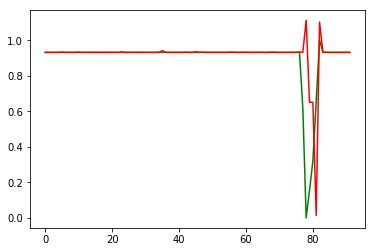

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:35:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1768000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:35:21
INFO:tensorflow:Saving dict for global step 1768000: global_step = 1768000, loss = 0.020657204
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1768000: ./outputdir/model.ckpt-1768000
error on testset first run {'loss': 0.020657204, 'global_step': 1768000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1768000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 438.137
INFO:tensorflow:loss = 0.00026802174, step = 1772601 (0.228 sec)
INFO:tensorflow:global_step/sec: 441.522
INFO:tensorflow:loss = 2.3114082e-05, step = 1772701 (0.226 sec)
INFO:tensorflow:global_step/sec: 387.8
INFO:tensorflow:loss = 0.0010575114, step = 1772801 (0.259 sec)
INFO:tensorflow:global_step/sec: 451.478
INFO:tensorflow:loss = 0.03957963, step = 1772901 (0.221 sec)
INFO:tensorflow:global_step/sec: 447.447
INFO:tensorflow:loss = 2.2910499e-05, step = 1773001 (0.223 sec)
INFO:tensorflow:global_step/sec: 451.212
INFO:tensorflow:loss = 0.00023007399, step = 1773101 (0.222 sec)
INFO:tensorflow:global_step/sec: 453.41
INFO:tensorflow:loss = 8.1639683e-07, step = 1773201 (0.221 sec)
INFO:tensorflow:global_step/sec: 454.659
INFO:tensorflow:loss = 0.0002594477, step = 1773301 (0.220 sec)
INFO:tensorflow:global_step/sec: 460.556
INFO:tensorflow:loss = 0.00012352764, step = 1773401 (0.217 sec)
INFO:tensorflow:global_step/sec: 456.711
INFO:tensorfl

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1778000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00056054065, step = 1778001
INFO:tensorflow:global_step/sec: 163.817
INFO:tensorflow:loss = 0.00028760606, step = 1778101 (0.611 sec)
INFO:tensorflow:global_step/sec: 461.983
INFO:tensorflow:loss = 0.00018269861, step = 1778201 (0.216 sec)
INFO:tensorflow:global_step/sec: 462.051
INFO:tensorflow:loss = 0.000109815126, step = 1778301 (0.216 sec)
INFO:tensorflow:global_step/sec: 457.494
INFO:tensorflow:loss = 0.00017475926, step = 1778401 (0.219 sec)
INFO:tensorflow:global_step/sec: 441.794
INFO:tensorflow:loss = 0.00062010594, step = 1778501 (0.226 sec)
INFO:tensorflow:global_step/sec: 429.682
INFO:tensorflow:loss = 0.0023574103, step = 1778601 (0.234 sec)
INFO:tensorflow:global_step/sec: 463.461
INFO:tensorflow:loss = 0.035065226, step = 1778701 (0.215 sec)
INFO:tensorflow:global_step/sec: 436.126
INFO:te

INFO:tensorflow:Saving checkpoints for 1784000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00020240506.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1784000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.9600141319633572
prediction at  8 [array([-0.03163604])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1784000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1784000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.3534356e-05, step = 1784001
INF

INFO:tensorflow:global_step/sec: 436.912
INFO:tensorflow:loss = 0.0015143291, step = 1789301 (0.229 sec)
INFO:tensorflow:global_step/sec: 446.886
INFO:tensorflow:loss = 9.6296346e-05, step = 1789401 (0.224 sec)
INFO:tensorflow:global_step/sec: 395.684
INFO:tensorflow:loss = 0.00013706938, step = 1789501 (0.253 sec)
INFO:tensorflow:global_step/sec: 443.102
INFO:tensorflow:loss = 0.00038521114, step = 1789601 (0.226 sec)
INFO:tensorflow:global_step/sec: 394.123
INFO:tensorflow:loss = 0.0003790614, step = 1789701 (0.254 sec)
INFO:tensorflow:global_step/sec: 453.667
INFO:tensorflow:loss = 0.00033826882, step = 1789801 (0.221 sec)
INFO:tensorflow:global_step/sec: 430.799
INFO:tensorflow:loss = 0.00018119835, step = 1789901 (0.232 sec)
INFO:tensorflow:Saving checkpoints for 1790000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.028582128.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restorin

INFO:tensorflow:loss = 0.00028547714, step = 1794501 (0.254 sec)
INFO:tensorflow:global_step/sec: 423.042
INFO:tensorflow:loss = 0.00034025597, step = 1794601 (0.237 sec)
INFO:tensorflow:global_step/sec: 428.868
INFO:tensorflow:loss = 0.00055540446, step = 1794701 (0.233 sec)
INFO:tensorflow:global_step/sec: 442.982
INFO:tensorflow:loss = 0.023462506, step = 1794801 (0.226 sec)
INFO:tensorflow:global_step/sec: 452.302
INFO:tensorflow:loss = 2.1166476e-05, step = 1794901 (0.221 sec)
INFO:tensorflow:global_step/sec: 446.965
INFO:tensorflow:loss = 0.07505656, step = 1795001 (0.224 sec)
INFO:tensorflow:global_step/sec: 448.861
INFO:tensorflow:loss = 0.0007503527, step = 1795101 (0.223 sec)
INFO:tensorflow:global_step/sec: 441.946
INFO:tensorflow:loss = 0.00062431354, step = 1795201 (0.226 sec)
INFO:tensorflow:global_step/sec: 446.04
INFO:tensorflow:loss = 0.000492948, step = 1795301 (0.224 sec)
INFO:tensorflow:global_step/sec: 391.873
INFO:tensorflow:loss = 0.00028631566, step = 1795401 (0

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1800000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1800000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0006913302, step = 1800001
INFO:tensorflow:global_step/sec: 162.532
INFO:tensorflow:loss = 0.00036130106, step = 1800101 (0.617 sec)
INFO:tensorflow:global_step/sec: 470.332
INFO:tensorflow:loss = 0.001120327, step = 1800201 (0.212 sec)
INFO:tensorflow:global_step/sec: 457.576
INFO:tensorflow:loss = 0.00083928526, step = 1800301 (0.218 sec)
INFO:tensorflow:global_step/sec: 446.333
INFO:tensorflow:loss = 0.0009454474, step = 1800401 (0.224 sec)
INFO:tensorflow:global_step/sec: 445.651
INFO:tensorflow:loss = 0.00095574965, step = 1800501 (0.224 sec)
INFO:tensorflow:global_step/sec: 393.305
INFO:tensorflow:loss = 0.0011183886, step = 1800601 (0.254 sec)
INFO:tensorflow:global_step/sec: 455.959
INFO:t

INFO:tensorflow:global_step/sec: 404.892
INFO:tensorflow:loss = 8.952267e-06, step = 1805901 (0.247 sec)
INFO:tensorflow:Saving checkpoints for 1806000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0023048907.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1806000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 0.015746715781872672
prediction at  19 [array([0.9800765])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1806000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving che

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1810000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1810000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.079426676, step = 1810001
INFO:tensorflow:global_step/sec: 166.237
INFO:tensorflow:loss = 3.924331e-07, step = 1810101 (0.602 sec)
INFO:tensorflow:global_step/sec: 467.129
INFO:tensorflow:loss = 4.3144297e-07, step = 1810201 (0.214 sec)
INFO:tensorflow:global_step/sec: 434.397
INFO:tensorflow:loss = 1.4210855e-14, step = 1810301 (0.230 sec)
INFO:tensorflow:global_step/sec: 435.846
INFO:tensorflow:loss = 1.0498303e-07, step = 1810401 (0.229 sec)
INFO:tensorflow:global_step/sec: 441.197
INFO:tensorflow:loss = 3.8123773e-07, step = 1810501 (0.227 sec)
INFO:tensorflow:global_step/sec: 443.184
INFO:tensorflow:loss = 1.16

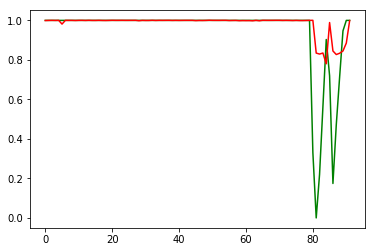

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:38:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1812000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:38:17
INFO:tensorflow:Saving dict for global step 1812000: global_step = 1812000, loss = 0.02332949
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1812000: ./outputdir/model.ckpt-1812000
error on testset first run {'loss': 0.02332949, 'global_step': 1812000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1812000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:global_step/sec: 441.587
INFO:tensorflow:loss = 0.00021201224, step = 1816601 (0.227 sec)
INFO:tensorflow:global_step/sec: 442.368
INFO:tensorflow:loss = 1.4123111e-07, step = 1816701 (0.226 sec)
INFO:tensorflow:global_step/sec: 391.276
INFO:tensorflow:loss = 0.00017418925, step = 1816801 (0.255 sec)
INFO:tensorflow:global_step/sec: 444.865
INFO:tensorflow:loss = 3.4162053e-07, step = 1816901 (0.225 sec)
INFO:tensorflow:global_step/sec: 407.521
INFO:tensorflow:loss = 0.00013768277, step = 1817001 (0.245 sec)
INFO:tensorflow:global_step/sec: 438.222
INFO:tensorflow:loss = 3.178036e-07, step = 1817101 (0.228 sec)
INFO:tensorflow:global_step/sec: 446.305
INFO:tensorflow:loss = 9.979964e-05, step = 1817201 (0.224 sec)
INFO:tensorflow:global_step/sec: 447.361
INFO:tensorflow:loss = 5.7412766e-05, step = 1817301 (0.223 sec)
INFO:tensorflow:global_step/sec: 434.037
INFO:tensorflow:loss = 5.9812923e-05, step = 1817401 (0.231 sec)
INFO:tensorflow:global_step/sec: 407.987
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1822000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1822000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.007464e-06, step = 1822001
INFO:tensorflow:global_step/sec: 164.412
INFO:tensorflow:loss = 2.6884308e-07, step = 1822101 (0.609 sec)
INFO:tensorflow:global_step/sec: 452.311
INFO:tensorflow:loss = 3.240217e-10, step = 1822201 (0.221 sec)
INFO:tensorflow:global_step/sec: 443.298
INFO:tensorflow:loss = 5.674399e-06, step = 1822301 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.589
INFO:tensorflow:loss = 7.8166056e-07, step = 1822401 (0.226 sec)
INFO:tensorflow:global_step/sec: 440.121
INFO:tensorflow:loss = 9.920033e-09, step = 1822501 (0.227 sec)
INFO:tensorflow:global_step/sec: 448.535
INFO:tensorflow:loss = 1.2987812e-08, step = 1822601 (0.223 sec)
INFO:tensorflow:global_step/sec: 464.814
INFO:tensorflow:loss = 3.6420866e-07, step

INFO:tensorflow:global_step/sec: 412.329
INFO:tensorflow:loss = 6.051321e-06, step = 1827901 (0.242 sec)
INFO:tensorflow:Saving checkpoints for 1828000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.5843816e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1828000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.555284586581345e-05
prediction at  8 [array([1.00021658])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1828000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving ch

INFO:tensorflow:loss = 2.4823834e-07, step = 1833101 (0.227 sec)
INFO:tensorflow:global_step/sec: 445.758
INFO:tensorflow:loss = 1.0170936e-06, step = 1833201 (0.224 sec)
INFO:tensorflow:global_step/sec: 438.072
INFO:tensorflow:loss = 3.0940553e-06, step = 1833301 (0.228 sec)
INFO:tensorflow:global_step/sec: 438.075
INFO:tensorflow:loss = 2.3470784e-07, step = 1833401 (0.228 sec)
INFO:tensorflow:global_step/sec: 453.962
INFO:tensorflow:loss = 1.6944381e-06, step = 1833501 (0.220 sec)
INFO:tensorflow:global_step/sec: 438.12
INFO:tensorflow:loss = 1.4708249e-06, step = 1833601 (0.229 sec)
INFO:tensorflow:global_step/sec: 424.497
INFO:tensorflow:loss = 2.547894e-08, step = 1833701 (0.235 sec)
INFO:tensorflow:global_step/sec: 427.738
INFO:tensorflow:loss = 8.0495965e-10, step = 1833801 (0.234 sec)
INFO:tensorflow:global_step/sec: 416.472
INFO:tensorflow:loss = 1.1490338e-06, step = 1833901 (0.240 sec)
INFO:tensorflow:Saving checkpoints for 1834000 into ./outputdir/model.ckpt.
INFO:tensorfl

INFO:tensorflow:global_step/sec: 416.341
INFO:tensorflow:loss = 1.2734407e-07, step = 1838401 (0.240 sec)
INFO:tensorflow:global_step/sec: 395.128
INFO:tensorflow:loss = 3.8574086e-09, step = 1838501 (0.253 sec)
INFO:tensorflow:global_step/sec: 436.922
INFO:tensorflow:loss = 1.35785605e-08, step = 1838601 (0.229 sec)
INFO:tensorflow:global_step/sec: 436.302
INFO:tensorflow:loss = 1.649736e-06, step = 1838701 (0.229 sec)
INFO:tensorflow:global_step/sec: 446.447
INFO:tensorflow:loss = 1.1293126e-06, step = 1838801 (0.224 sec)
INFO:tensorflow:global_step/sec: 460.903
INFO:tensorflow:loss = 3.4776674e-06, step = 1838901 (0.217 sec)
INFO:tensorflow:global_step/sec: 448.149
INFO:tensorflow:loss = 5.158629e-07, step = 1839001 (0.224 sec)
INFO:tensorflow:global_step/sec: 447.566
INFO:tensorflow:loss = 2.6398226e-09, step = 1839101 (0.223 sec)
INFO:tensorflow:global_step/sec: 450.219
INFO:tensorflow:loss = 8.973709e-07, step = 1839201 (0.222 sec)
INFO:tensorflow:global_step/sec: 446.903
INFO:te

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1844000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1844000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.059828e-08, step = 1844001
INFO:tensorflow:global_step/sec: 168.456
INFO:tensorflow:loss = 2.1575931e-07, step = 1844101 (0.595 sec)
INFO:tensorflow:global_step/sec: 451.842
INFO:tensorflow:loss = 2.427454e-07, step = 1844201 (0.221 sec)
INFO:tensorflow:global_step/sec: 458.113
INFO:tensorflow:loss = 1.7204968e-07, step = 1844301 (0.218 sec)
INFO:tensorflow:global_step/sec: 430.546
INFO:tensorflow:loss = 3.0740637e-07, step = 1844401 (0.232 sec)
INFO:tensorflow:global_step/sec: 446.393
INFO:tensorflow:loss = 3.1258338e-07, step = 1844501 (0.224 sec)
INFO:tensorflow:global_step/sec: 427.48
INFO:tensorflow:loss = 4.62

INFO:tensorflow:global_step/sec: 423.064
INFO:tensorflow:loss = 1.8339051e-08, step = 1849801 (0.237 sec)
INFO:tensorflow:global_step/sec: 395.979
INFO:tensorflow:loss = 2.2754948e-06, step = 1849901 (0.252 sec)
INFO:tensorflow:Saving checkpoints for 1850000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.973665e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1850000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.078346599362951e-06
prediction at  19 [array([1.00063131])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1850000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1854000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1854000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.30264184, step = 1854001
INFO:tensorflow:global_step/sec: 159.984
INFO:tensorflow:loss = 2.0413356e-06, step = 1854101 (0.626 sec)
INFO:tensorflow:global_step/sec: 464.343
INFO:tensorflow:loss = 2.1646729e-05, step = 1854201 (0.216 sec)
INFO:tensorflow:global_step/sec: 443.347
INFO:tensorflow:loss = 4.5050338e-06, step = 1854301 (0.225 sec)
INFO:tensorflow:global_step/sec: 451.068
INFO:tensorflow:loss = 7.131693e-07, step = 1854401 (0.222 sec)
INFO:tensorflow:global_step/sec: 455.401
INFO:tensorflow:loss = 1.5578611e-05, step = 1854501 (0.220 sec)
INFO:tensorflow:global_step/sec: 465.276
INFO:tensorflow:loss = 7.841

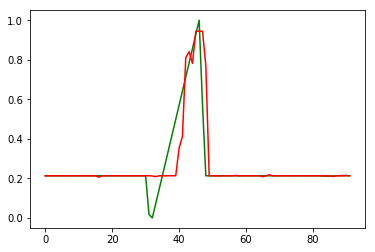

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:41:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1856000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:41:11
INFO:tensorflow:Saving dict for global step 1856000: global_step = 1856000, loss = 0.009817255
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1856000: ./outputdir/model.ckpt-1856000
error on testset first run {'loss': 0.009817255, 'global_step': 1856000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1856000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 462.982
INFO:tensorflow:loss = 4.2582697e-06, step = 1860601 (0.216 sec)
INFO:tensorflow:global_step/sec: 456.034
INFO:tensorflow:loss = 7.856707e-07, step = 1860701 (0.219 sec)
INFO:tensorflow:global_step/sec: 438.559
INFO:tensorflow:loss = 2.5142306e-06, step = 1860801 (0.228 sec)
INFO:tensorflow:global_step/sec: 436.285
INFO:tensorflow:loss = 6.9979296e-07, step = 1860901 (0.229 sec)
INFO:tensorflow:global_step/sec: 461.05
INFO:tensorflow:loss = 7.191971e-07, step = 1861001 (0.217 sec)
INFO:tensorflow:global_step/sec: 442.519
INFO:tensorflow:loss = 1.9452031e-07, step = 1861101 (0.226 sec)
INFO:tensorflow:global_step/sec: 451.881
INFO:tensorflow:loss = 5.9757156e-07, step = 1861201 (0.221 sec)
INFO:tensorflow:global_step/sec: 449.753
INFO:tensorflow:loss = 1.949566e-06, step = 1861301 (0.223 sec)
INFO:tensorflow:global_step/sec: 393.472
INFO:tensorflow:loss = 6.254427e-07, step = 1861401 (0.254 sec)
INFO:tensorflow:global_step/sec: 450.201
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1866000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1866000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.2397586e-09, step = 1866001
INFO:tensorflow:global_step/sec: 161.92
INFO:tensorflow:loss = 4.2513843e-06, step = 1866101 (0.618 sec)
INFO:tensorflow:global_step/sec: 459.278
INFO:tensorflow:loss = 5.136398e-06, step = 1866201 (0.218 sec)
INFO:tensorflow:global_step/sec: 446.285
INFO:tensorflow:loss = 1.8724464e-08, step = 1866301 (0.224 sec)
INFO:tensorflow:global_step/sec: 446.681
INFO:tensorflow:loss = 1.1909536e-05, step = 1866401 (0.224 sec)
INFO:tensorflow:global_step/sec: 433.752
INFO:tensorflow:loss = 3.1971758e-06, step = 1866501 (0.230 sec)
INFO:tensorflow:global_step/sec: 479.396
INFO:tensorflow:loss = 1.185319e-06, step = 1866601 (0.209 sec)
INFO:tensorflow:global_step/sec: 444.644
INFO:tensorflow:loss = 8.457379e-07, step

INFO:tensorflow:global_step/sec: 412.203
INFO:tensorflow:loss = 2.4421595e-07, step = 1871901 (0.243 sec)
INFO:tensorflow:Saving checkpoints for 1872000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.4776987e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1872000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 7.733548657446739e-06
prediction at  8 [array([0.21311313])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1872000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving c

INFO:tensorflow:loss = 9.447893e-09, step = 1877101 (0.229 sec)
INFO:tensorflow:global_step/sec: 445.781
INFO:tensorflow:loss = 5.4453242e-08, step = 1877201 (0.225 sec)
INFO:tensorflow:global_step/sec: 448.145
INFO:tensorflow:loss = 3.0775348e-07, step = 1877301 (0.223 sec)
INFO:tensorflow:global_step/sec: 430.903
INFO:tensorflow:loss = 2.7266015e-06, step = 1877401 (0.232 sec)
INFO:tensorflow:global_step/sec: 438.912
INFO:tensorflow:loss = 1.505508e-06, step = 1877501 (0.228 sec)
INFO:tensorflow:global_step/sec: 464.591
INFO:tensorflow:loss = 8.99546e-07, step = 1877601 (0.215 sec)
INFO:tensorflow:global_step/sec: 435.201
INFO:tensorflow:loss = 3.3312136e-07, step = 1877701 (0.230 sec)
INFO:tensorflow:global_step/sec: 431.227
INFO:tensorflow:loss = 9.237611e-09, step = 1877801 (0.232 sec)
INFO:tensorflow:global_step/sec: 393.047
INFO:tensorflow:loss = 1.689609e-07, step = 1877901 (0.254 sec)
INFO:tensorflow:Saving checkpoints for 1878000 into ./outputdir/model.ckpt.
INFO:tensorflow:L

INFO:tensorflow:global_step/sec: 453.7
INFO:tensorflow:loss = 6.662486e-08, step = 1882401 (0.221 sec)
INFO:tensorflow:global_step/sec: 444.426
INFO:tensorflow:loss = 9.1367184e-08, step = 1882501 (0.225 sec)
INFO:tensorflow:global_step/sec: 435.434
INFO:tensorflow:loss = 3.2751807e-08, step = 1882601 (0.230 sec)
INFO:tensorflow:global_step/sec: 460.534
INFO:tensorflow:loss = 3.7062154e-07, step = 1882701 (0.217 sec)
INFO:tensorflow:global_step/sec: 423.493
INFO:tensorflow:loss = 8.5436564e-09, step = 1882801 (0.238 sec)
INFO:tensorflow:global_step/sec: 369.363
INFO:tensorflow:loss = 3.4821906e-07, step = 1882901 (0.269 sec)
INFO:tensorflow:global_step/sec: 460.808
INFO:tensorflow:loss = 6.056389e-07, step = 1883001 (0.217 sec)
INFO:tensorflow:global_step/sec: 464.054
INFO:tensorflow:loss = 6.820337e-08, step = 1883101 (0.216 sec)
INFO:tensorflow:global_step/sec: 463.932
INFO:tensorflow:loss = 4.6284538e-07, step = 1883201 (0.216 sec)
INFO:tensorflow:global_step/sec: 448.053
INFO:tenso

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1888000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1888000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.5761825e-07, step = 1888001
INFO:tensorflow:global_step/sec: 163.966
INFO:tensorflow:loss = 6.176297e-08, step = 1888101 (0.611 sec)
INFO:tensorflow:global_step/sec: 450.664
INFO:tensorflow:loss = 5.087596e-07, step = 1888201 (0.222 sec)
INFO:tensorflow:global_step/sec: 452.204
INFO:tensorflow:loss = 1.092375e-08, step = 1888301 (0.221 sec)
INFO:tensorflow:global_step/sec: 456.947
INFO:tensorflow:loss = 1.8147848e-06, step = 1888401 (0.219 sec)
INFO:tensorflow:global_step/sec: 430.778
INFO:tensorflow:loss = 1.1848972e-08, step = 1888501 (0.232 sec)
INFO:tensorflow:global_step/sec: 440.588
INFO:tensorflow:loss = 1.84

INFO:tensorflow:global_step/sec: 443.583
INFO:tensorflow:loss = 6.85852e-07, step = 1893801 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.695
INFO:tensorflow:loss = 8.325884e-08, step = 1893901 (0.226 sec)
INFO:tensorflow:Saving checkpoints for 1894000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.6676306e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1894000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.2649373988605213e-07
prediction at  19 [array([0.21253247])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1894000
I

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1898000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1898000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0021993392, step = 1898001
INFO:tensorflow:global_step/sec: 161.479
INFO:tensorflow:loss = 0.020643327, step = 1898101 (0.620 sec)
INFO:tensorflow:global_step/sec: 447.107
INFO:tensorflow:loss = 1.5510442e-06, step = 1898201 (0.224 sec)
INFO:tensorflow:global_step/sec: 443.835
INFO:tensorflow:loss = 0.012166072, step = 1898301 (0.226 sec)
INFO:tensorflow:global_step/sec: 448.871
INFO:tensorflow:loss = 0.0017554209, step = 1898401 (0.222 sec)
INFO:tensorflow:global_step/sec: 436.349
INFO:tensorflow:loss = 3.152182e-05, step = 1898501 (0.229 sec)
INFO:tensorflow:global_step/sec: 455.988
INFO:tensorflow:loss = 4.834256

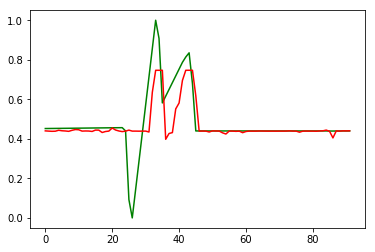

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:44:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1900000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:44:05
INFO:tensorflow:Saving dict for global step 1900000: global_step = 1900000, loss = 0.009880724
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1900000: ./outputdir/model.ckpt-1900000
error on testset first run {'loss': 0.009880724, 'global_step': 1900000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1900000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 430.269
INFO:tensorflow:loss = 7.263725e-05, step = 1904601 (0.232 sec)
INFO:tensorflow:global_step/sec: 438.579
INFO:tensorflow:loss = 1.2064515e-05, step = 1904701 (0.228 sec)
INFO:tensorflow:global_step/sec: 443.791
INFO:tensorflow:loss = 1.7152348e-05, step = 1904801 (0.225 sec)
INFO:tensorflow:global_step/sec: 424.014
INFO:tensorflow:loss = 4.4264993e-06, step = 1904901 (0.236 sec)
INFO:tensorflow:global_step/sec: 442.118
INFO:tensorflow:loss = 9.4170966e-05, step = 1905001 (0.226 sec)
INFO:tensorflow:global_step/sec: 427.4
INFO:tensorflow:loss = 3.890037e-08, step = 1905101 (0.234 sec)
INFO:tensorflow:global_step/sec: 440.713
INFO:tensorflow:loss = 1.5511183e-08, step = 1905201 (0.227 sec)
INFO:tensorflow:global_step/sec: 444.923
INFO:tensorflow:loss = 6.7643174e-07, step = 1905301 (0.225 sec)
INFO:tensorflow:global_step/sec: 437.349
INFO:tensorflow:loss = 9.819959e-07, step = 1905401 (0.229 sec)
INFO:tensorflow:global_step/sec: 443.823
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1910000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1910000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.307425e-08, step = 1910001
INFO:tensorflow:global_step/sec: 153.514
INFO:tensorflow:loss = 4.408943e-05, step = 1910101 (0.652 sec)
INFO:tensorflow:global_step/sec: 448.159
INFO:tensorflow:loss = 1.33482545e-05, step = 1910201 (0.223 sec)
INFO:tensorflow:global_step/sec: 385.911
INFO:tensorflow:loss = 4.3187767e-05, step = 1910301 (0.259 sec)
INFO:tensorflow:global_step/sec: 427.307
INFO:tensorflow:loss = 4.7772946e-08, step = 1910401 (0.234 sec)
INFO:tensorflow:global_step/sec: 438.827
INFO:tensorflow:loss = 2.0583176e-08, step = 1910501 (0.228 sec)
INFO:tensorflow:global_step/sec: 384.466
INFO:tensorflow:loss = 5.9844992e-06, step = 1910601 (0.260 sec)
INFO:tensorflow:global_step/sec: 436.729
INFO:tensorflow:loss = 1.4576254e-05, s

INFO:tensorflow:loss = 5.1896703e-05, step = 1915901 (0.251 sec)
INFO:tensorflow:Saving checkpoints for 1916000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.084979e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1916000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.653008957973147e-06
prediction at  8 [array([0.43962893])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1916000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1916000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 446.335
INFO:tensorflow:loss = 1.3533998e-05, step = 1921201 (0.225 sec)
INFO:tensorflow:global_step/sec: 431.396
INFO:tensorflow:loss = 1.3747862e-06, step = 1921301 (0.231 sec)
INFO:tensorflow:global_step/sec: 444.659
INFO:tensorflow:loss = 8.520494e-06, step = 1921401 (0.225 sec)
INFO:tensorflow:global_step/sec: 448.66
INFO:tensorflow:loss = 1.8631734e-05, step = 1921501 (0.223 sec)
INFO:tensorflow:global_step/sec: 432.745
INFO:tensorflow:loss = 4.0472423e-06, step = 1921601 (0.232 sec)
INFO:tensorflow:global_step/sec: 450.134
INFO:tensorflow:loss = 2.2293367e-10, step = 1921701 (0.222 sec)
INFO:tensorflow:global_step/sec: 430.081
INFO:tensorflow:loss = 1.0942447e-08, step = 1921801 (0.232 sec)
INFO:tensorflow:global_step/sec: 429.041
INFO:tensorflow:loss = 5.6472287e-05, step = 1921901 (0.234 sec)
INFO:tensorflow:Saving checkpoints for 1922000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.5890106e-05.
INFO:tensorflow:Calling mo

INFO:tensorflow:loss = 1.7915338e-06, step = 1926401 (0.225 sec)
INFO:tensorflow:global_step/sec: 458.65
INFO:tensorflow:loss = 2.8189518e-06, step = 1926501 (0.218 sec)
INFO:tensorflow:global_step/sec: 468.635
INFO:tensorflow:loss = 1.0395427e-05, step = 1926601 (0.213 sec)
INFO:tensorflow:global_step/sec: 459.016
INFO:tensorflow:loss = 3.26675e-05, step = 1926701 (0.218 sec)
INFO:tensorflow:global_step/sec: 407.204
INFO:tensorflow:loss = 3.1216365e-05, step = 1926801 (0.246 sec)
INFO:tensorflow:global_step/sec: 466.381
INFO:tensorflow:loss = 7.0163023e-06, step = 1926901 (0.214 sec)
INFO:tensorflow:global_step/sec: 434.993
INFO:tensorflow:loss = 1.9027457e-06, step = 1927001 (0.230 sec)
INFO:tensorflow:global_step/sec: 396.203
INFO:tensorflow:loss = 9.962821e-06, step = 1927101 (0.253 sec)
INFO:tensorflow:global_step/sec: 452.271
INFO:tensorflow:loss = 2.1439341e-06, step = 1927201 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.799
INFO:tensorflow:loss = 4.9888094e-11, step = 19273

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1932000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1932000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.263615e-07, step = 1932001
INFO:tensorflow:global_step/sec: 157.927
INFO:tensorflow:loss = 2.5660505e-05, step = 1932101 (0.634 sec)
INFO:tensorflow:global_step/sec: 408.865
INFO:tensorflow:loss = 3.3486094e-07, step = 1932201 (0.244 sec)
INFO:tensorflow:global_step/sec: 429.054
INFO:tensorflow:loss = 2.6199237e-05, step = 1932301 (0.233 sec)
INFO:tensorflow:global_step/sec: 431.882
INFO:tensorflow:loss = 3.472876e-07, step = 1932401 (0.231 sec)
INFO:tensorflow:global_step/sec: 388.706
INFO:tensorflow:loss = 2.5854713e-05, step = 1932501 (0.257 sec)
INFO:tensorflow:global_step/sec: 437.175
INFO:tensorflow:loss = 4.1

INFO:tensorflow:global_step/sec: 404.863
INFO:tensorflow:loss = 1.5111995e-07, step = 1937801 (0.247 sec)
INFO:tensorflow:global_step/sec: 399.438
INFO:tensorflow:loss = 1.1793886e-06, step = 1937901 (0.250 sec)
INFO:tensorflow:Saving checkpoints for 1938000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.7944678e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1938000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.5669729508823018e-06
prediction at  19 [array([0.43985578])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-193800

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1942000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1942000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.053151842, step = 1942001
INFO:tensorflow:global_step/sec: 162.772
INFO:tensorflow:loss = 6.971279e-07, step = 1942101 (0.615 sec)
INFO:tensorflow:global_step/sec: 443.021
INFO:tensorflow:loss = 1.7160495e-09, step = 1942201 (0.225 sec)
INFO:tensorflow:global_step/sec: 445.285
INFO:tensorflow:loss = 2.0107084e-08, step = 1942301 (0.225 sec)
INFO:tensorflow:global_step/sec: 445.538
INFO:tensorflow:loss = 1.4100721e-11, step = 1942401 (0.224 sec)
INFO:tensorflow:global_step/sec: 441.907
INFO:tensorflow:loss = 5.296531e-09, step = 1942501 (0.226 sec)
INFO:tensorflow:global_step/sec: 435.905
INFO:tensorflow:loss = 7.163

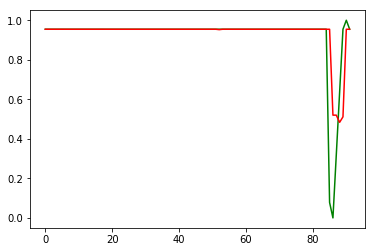

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:47:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1944000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:47:01
INFO:tensorflow:Saving dict for global step 1944000: global_step = 1944000, loss = 0.0161801
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1944000: ./outputdir/model.ckpt-1944000
error on testset first run {'loss': 0.0161801, 'global_step': 1944000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1944000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:global_step/sec: 399.739
INFO:tensorflow:loss = 9.6435215e-08, step = 1948601 (0.250 sec)
INFO:tensorflow:global_step/sec: 449.616
INFO:tensorflow:loss = 1.6285217e-08, step = 1948701 (0.223 sec)
INFO:tensorflow:global_step/sec: 442.723
INFO:tensorflow:loss = 2.3283064e-08, step = 1948801 (0.226 sec)
INFO:tensorflow:global_step/sec: 445.244
INFO:tensorflow:loss = 5.3749005e-09, step = 1948901 (0.225 sec)
INFO:tensorflow:global_step/sec: 441.228
INFO:tensorflow:loss = 1.0027179e-08, step = 1949001 (0.227 sec)
INFO:tensorflow:global_step/sec: 460.724
INFO:tensorflow:loss = 5.3483973e-10, step = 1949101 (0.217 sec)
INFO:tensorflow:global_step/sec: 456.169
INFO:tensorflow:loss = 1.5102728e-09, step = 1949201 (0.219 sec)
INFO:tensorflow:global_step/sec: 459.321
INFO:tensorflow:loss = 8.891462e-09, step = 1949301 (0.218 sec)
INFO:tensorflow:global_step/sec: 450.458
INFO:tensorflow:loss = 5.551115e-09, step = 1949401 (0.222 sec)
INFO:tensorflow:global_step/sec: 426.436
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1954000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1954000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.53646e-09, step = 1954001
INFO:tensorflow:global_step/sec: 167.354
INFO:tensorflow:loss = 4.246576e-07, step = 1954101 (0.598 sec)
INFO:tensorflow:global_step/sec: 455.23
INFO:tensorflow:loss = 2.2596979e-08, step = 1954201 (0.220 sec)
INFO:tensorflow:global_step/sec: 444.781
INFO:tensorflow:loss = 2.084576e-09, step = 1954301 (0.225 sec)
INFO:tensorflow:global_step/sec: 447.393
INFO:tensorflow:loss = 1.7588153e-08, step = 1954401 (0.224 sec)
INFO:tensorflow:global_step/sec: 452.689
INFO:tensorflow:loss = 2.3501855e-08, step = 1954501 (0.221 sec)
INFO:tensorflow:global_step/sec: 431.965
INFO:tensorflow:loss = 7.9081715e-08, step = 1954601 (0.232 sec)
INFO:tensorflow:global_step/sec: 378.541
INFO:tensorflow:loss = 1.3744881e-09, step 

INFO:tensorflow:global_step/sec: 382.748
INFO:tensorflow:loss = 3.885336e-08, step = 1959901 (0.262 sec)
INFO:tensorflow:Saving checkpoints for 1960000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.092151e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1960000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.555647719171988e-08
prediction at  8 [array([0.95448006])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1960000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving che

INFO:tensorflow:loss = 2.6984765e-08, step = 1965101 (0.226 sec)
INFO:tensorflow:global_step/sec: 431.85
INFO:tensorflow:loss = 3.1443737e-08, step = 1965201 (0.231 sec)
INFO:tensorflow:global_step/sec: 443.243
INFO:tensorflow:loss = 7.3464577e-09, step = 1965301 (0.226 sec)
INFO:tensorflow:global_step/sec: 448.486
INFO:tensorflow:loss = 7.553538e-08, step = 1965401 (0.223 sec)
INFO:tensorflow:global_step/sec: 446.816
INFO:tensorflow:loss = 1.1092599e-08, step = 1965501 (0.224 sec)
INFO:tensorflow:global_step/sec: 438.609
INFO:tensorflow:loss = 8.036295e-09, step = 1965601 (0.228 sec)
INFO:tensorflow:global_step/sec: 410.206
INFO:tensorflow:loss = 3.2266065e-09, step = 1965701 (0.244 sec)
INFO:tensorflow:global_step/sec: 409.722
INFO:tensorflow:loss = 3.304912e-10, step = 1965801 (0.244 sec)
INFO:tensorflow:global_step/sec: 412.132
INFO:tensorflow:loss = 2.3648283e-10, step = 1965901 (0.243 sec)
INFO:tensorflow:Saving checkpoints for 1966000 into ./outputdir/model.ckpt.
INFO:tensorflow

INFO:tensorflow:global_step/sec: 460.581
INFO:tensorflow:loss = 1.4208359e-07, step = 1970401 (0.217 sec)
INFO:tensorflow:global_step/sec: 449.897
INFO:tensorflow:loss = 9.5659374e-08, step = 1970501 (0.222 sec)
INFO:tensorflow:global_step/sec: 452.224
INFO:tensorflow:loss = 2.2172486e-11, step = 1970601 (0.221 sec)
INFO:tensorflow:global_step/sec: 445.917
INFO:tensorflow:loss = 7.2872695e-08, step = 1970701 (0.224 sec)
INFO:tensorflow:global_step/sec: 442.581
INFO:tensorflow:loss = 6.806334e-08, step = 1970801 (0.226 sec)
INFO:tensorflow:global_step/sec: 447.396
INFO:tensorflow:loss = 1.8065638e-08, step = 1970901 (0.224 sec)
INFO:tensorflow:global_step/sec: 446.348
INFO:tensorflow:loss = 2.2794527e-08, step = 1971001 (0.224 sec)
INFO:tensorflow:global_step/sec: 443.264
INFO:tensorflow:loss = 3.350579e-08, step = 1971101 (0.225 sec)
INFO:tensorflow:global_step/sec: 453.556
INFO:tensorflow:loss = 1.4154068e-08, step = 1971201 (0.221 sec)
INFO:tensorflow:global_step/sec: 428.912
INFO:te

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1976000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1976000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.8086125e-08, step = 1976001
INFO:tensorflow:global_step/sec: 162.886
INFO:tensorflow:loss = 1.6187052e-09, step = 1976101 (0.615 sec)
INFO:tensorflow:global_step/sec: 444.593
INFO:tensorflow:loss = 5.5881188e-08, step = 1976201 (0.225 sec)
INFO:tensorflow:global_step/sec: 443.369
INFO:tensorflow:loss = 4.8716267e-09, step = 1976301 (0.226 sec)
INFO:tensorflow:global_step/sec: 448.943
INFO:tensorflow:loss = 6.965871e-08, step = 1976401 (0.223 sec)
INFO:tensorflow:global_step/sec: 347.694
INFO:tensorflow:loss = 1.0719138e-08, step = 1976501 (0.288 sec)
INFO:tensorflow:global_step/sec: 418.209
INFO:tensorflow:loss = 1.

INFO:tensorflow:global_step/sec: 417.091
INFO:tensorflow:loss = 4.495604e-07, step = 1981801 (0.240 sec)
INFO:tensorflow:global_step/sec: 408.699
INFO:tensorflow:loss = 8.81295e-09, step = 1981901 (0.245 sec)
INFO:tensorflow:Saving checkpoints for 1982000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.991829e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1982000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.0836727257881838e-07
prediction at  19 [array([0.95407802])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1982000
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1986000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1986000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.081169546, step = 1986001
INFO:tensorflow:global_step/sec: 163.588
INFO:tensorflow:loss = 2.6259222e-05, step = 1986101 (0.612 sec)
INFO:tensorflow:global_step/sec: 441.745
INFO:tensorflow:loss = 1.7119408e-05, step = 1986201 (0.227 sec)
INFO:tensorflow:global_step/sec: 435.341
INFO:tensorflow:loss = 4.4613e-07, step = 1986301 (0.230 sec)
INFO:tensorflow:global_step/sec: 389.018
INFO:tensorflow:loss = 3.7531728e-07, step = 1986401 (0.257 sec)
INFO:tensorflow:global_step/sec: 453.133
INFO:tensorflow:loss = 6.7922692e-06, step = 1986501 (0.221 sec)
INFO:tensorflow:global_step/sec: 452.722
INFO:tensorflow:loss = 0.1011

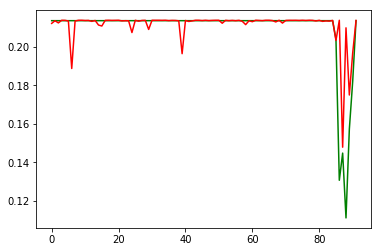

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:49:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1988000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:49:57
INFO:tensorflow:Saving dict for global step 1988000: global_step = 1988000, loss = 0.0003402582
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1988000: ./outputdir/model.ckpt-1988000
error on testset first run {'loss': 0.0003402582, 'global_step': 1988000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1988000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 451.687
INFO:tensorflow:loss = 3.8753562e-08, step = 1992601 (0.221 sec)
INFO:tensorflow:global_step/sec: 442.326
INFO:tensorflow:loss = 3.951408e-08, step = 1992701 (0.226 sec)
INFO:tensorflow:global_step/sec: 429.928
INFO:tensorflow:loss = 1.9886878e-07, step = 1992801 (0.232 sec)
INFO:tensorflow:global_step/sec: 455.205
INFO:tensorflow:loss = 2.0833517e-07, step = 1992901 (0.220 sec)
INFO:tensorflow:global_step/sec: 399.766
INFO:tensorflow:loss = 6.527686e-09, step = 1993001 (0.250 sec)
INFO:tensorflow:global_step/sec: 468.636
INFO:tensorflow:loss = 1.0960999e-07, step = 1993101 (0.214 sec)
INFO:tensorflow:global_step/sec: 461.975
INFO:tensorflow:loss = 3.8096175e-07, step = 1993201 (0.216 sec)
INFO:tensorflow:global_step/sec: 458.975
INFO:tensorflow:loss = 2.1198296e-07, step = 1993301 (0.218 sec)
INFO:tensorflow:global_step/sec: 446.636
INFO:tensorflow:loss = 3.5031498e-09, step = 1993401 (0.224 sec)
INFO:tensorflow:global_step/sec: 441.057
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-1998000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1998000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.4429152e-08, step = 1998001
INFO:tensorflow:global_step/sec: 160.264
INFO:tensorflow:loss = 2.1824185e-08, step = 1998101 (0.625 sec)
INFO:tensorflow:global_step/sec: 446.863
INFO:tensorflow:loss = 3.899354e-07, step = 1998201 (0.224 sec)
INFO:tensorflow:global_step/sec: 450.603
INFO:tensorflow:loss = 2.7038643e-08, step = 1998301 (0.222 sec)
INFO:tensorflow:global_step/sec: 434.22
INFO:tensorflow:loss = 1.929724e-07, step = 1998401 (0.230 sec)
INFO:tensorflow:global_step/sec: 437.216
INFO:tensorflow:loss = 3.1425182e-07, step = 1998501 (0.229 sec)
INFO:tensorflow:global_step/sec: 430.019
INFO:tensorflow:loss = 5.78497e-08, step = 1998601 (0.233 sec)
INFO:tensorflow:global_step/sec: 429.623
INFO:tensorflow:loss = 5.7534734e-08, step 

INFO:tensorflow:loss = 2.5569404e-08, step = 2003901 (0.225 sec)
INFO:tensorflow:Saving checkpoints for 2004000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.6627659e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2004000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 5.41363113749226e-07
prediction at  8 [array([0.21408539])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2004000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2004000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 439.429
INFO:tensorflow:loss = 2.5698563e-07, step = 2009201 (0.228 sec)
INFO:tensorflow:global_step/sec: 445.631
INFO:tensorflow:loss = 1.0164926e-08, step = 2009301 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.97
INFO:tensorflow:loss = 1.5337588e-07, step = 2009401 (0.230 sec)
INFO:tensorflow:global_step/sec: 441.166
INFO:tensorflow:loss = 3.04686e-07, step = 2009501 (0.227 sec)
INFO:tensorflow:global_step/sec: 438.958
INFO:tensorflow:loss = 8.607132e-09, step = 2009601 (0.228 sec)
INFO:tensorflow:global_step/sec: 437.063
INFO:tensorflow:loss = 1.7250737e-07, step = 2009701 (0.229 sec)
INFO:tensorflow:global_step/sec: 433.349
INFO:tensorflow:loss = 3.608352e-07, step = 2009801 (0.231 sec)
INFO:tensorflow:global_step/sec: 388.475
INFO:tensorflow:loss = 1.987226e-07, step = 2009901 (0.257 sec)
INFO:tensorflow:Saving checkpoints for 2010000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.6559676e-07.
INFO:tensorflow:Calling model_

INFO:tensorflow:loss = 2.3726258e-08, step = 2014401 (0.223 sec)
INFO:tensorflow:global_step/sec: 455.703
INFO:tensorflow:loss = 1.3267809e-08, step = 2014501 (0.219 sec)
INFO:tensorflow:global_step/sec: 446.75
INFO:tensorflow:loss = 2.6279565e-08, step = 2014601 (0.224 sec)
INFO:tensorflow:global_step/sec: 419.561
INFO:tensorflow:loss = 1.5211993e-08, step = 2014701 (0.239 sec)
INFO:tensorflow:global_step/sec: 413.969
INFO:tensorflow:loss = 8.406477e-09, step = 2014801 (0.242 sec)
INFO:tensorflow:global_step/sec: 443.227
INFO:tensorflow:loss = 1.1224028e-07, step = 2014901 (0.225 sec)
INFO:tensorflow:global_step/sec: 453.685
INFO:tensorflow:loss = 2.4770408e-11, step = 2015001 (0.220 sec)
INFO:tensorflow:global_step/sec: 444.798
INFO:tensorflow:loss = 4.5356572e-07, step = 2015101 (0.225 sec)
INFO:tensorflow:global_step/sec: 394.639
INFO:tensorflow:loss = 1.5300262e-07, step = 2015201 (0.253 sec)
INFO:tensorflow:global_step/sec: 450.881
INFO:tensorflow:loss = 1.2902996e-07, step = 201

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2020000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2020000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.3091835e-08, step = 2020001
INFO:tensorflow:global_step/sec: 164.439
INFO:tensorflow:loss = 4.3520743e-14, step = 2020101 (0.609 sec)
INFO:tensorflow:global_step/sec: 453.811
INFO:tensorflow:loss = 2.0203103e-07, step = 2020201 (0.220 sec)
INFO:tensorflow:global_step/sec: 449.772
INFO:tensorflow:loss = 5.684342e-12, step = 2020301 (0.222 sec)
INFO:tensorflow:global_step/sec: 443.538
INFO:tensorflow:loss = 2.0098754e-07, step = 2020401 (0.225 sec)
INFO:tensorflow:global_step/sec: 443.274
INFO:tensorflow:loss = 5.6772387e-10, step = 2020501 (0.226 sec)
INFO:tensorflow:global_step/sec: 434.209
INFO:tensorflow:loss = 2.

INFO:tensorflow:global_step/sec: 428.132
INFO:tensorflow:loss = 1.5683831e-07, step = 2025801 (0.234 sec)
INFO:tensorflow:global_step/sec: 405.127
INFO:tensorflow:loss = 1.01393155e-07, step = 2025901 (0.247 sec)
INFO:tensorflow:Saving checkpoints for 2026000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.364073e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2026000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.2093774920966137e-10
prediction at  19 [array([0.2133884])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2026000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2030000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2030000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.027170073, step = 2030001
INFO:tensorflow:global_step/sec: 159.032
INFO:tensorflow:loss = 1.825943e-08, step = 2030101 (0.630 sec)
INFO:tensorflow:global_step/sec: 445.954
INFO:tensorflow:loss = 2.5477751e-08, step = 2030201 (0.224 sec)
INFO:tensorflow:global_step/sec: 432.583
INFO:tensorflow:loss = 3.6059333e-08, step = 2030301 (0.231 sec)
INFO:tensorflow:global_step/sec: 427.634
INFO:tensorflow:loss = 0.0005447519, step = 2030401 (0.234 sec)
INFO:tensorflow:global_step/sec: 439.893
INFO:tensorflow:loss = 5.824177e-09, step = 2030501 (0.228 sec)
INFO:tensorflow:global_step/sec: 450.652
INFO:tensorflow:loss = 3.5982

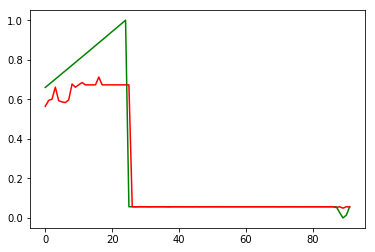

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:52:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2032000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:52:51
INFO:tensorflow:Saving dict for global step 2032000: global_step = 2032000, loss = 0.014597733
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2032000: ./outputdir/model.ckpt-2032000
error on testset first run {'loss': 0.014597733, 'global_step': 2032000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2032000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 421.594
INFO:tensorflow:loss = 3.2069085e-08, step = 2036601 (0.237 sec)
INFO:tensorflow:global_step/sec: 432.393
INFO:tensorflow:loss = 2.1313197e-08, step = 2036701 (0.231 sec)
INFO:tensorflow:global_step/sec: 420.101
INFO:tensorflow:loss = 3.2338052e-09, step = 2036801 (0.238 sec)
INFO:tensorflow:global_step/sec: 459.015
INFO:tensorflow:loss = 3.482894e-09, step = 2036901 (0.218 sec)
INFO:tensorflow:global_step/sec: 457.963
INFO:tensorflow:loss = 1.2733491e-08, step = 2037001 (0.218 sec)
INFO:tensorflow:global_step/sec: 461.425
INFO:tensorflow:loss = 6.959383e-08, step = 2037101 (0.217 sec)
INFO:tensorflow:global_step/sec: 452.788
INFO:tensorflow:loss = 3.1104403e-09, step = 2037201 (0.221 sec)
INFO:tensorflow:global_step/sec: 456.942
INFO:tensorflow:loss = 4.3520743e-14, step = 2037301 (0.219 sec)
INFO:tensorflow:global_step/sec: 395.169
INFO:tensorflow:loss = 6.9898825e-08, step = 2037401 (0.253 sec)
INFO:tensorflow:global_step/sec: 386.11
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2042000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2042000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.4435557e-08, step = 2042001
INFO:tensorflow:global_step/sec: 164.881
INFO:tensorflow:loss = 5.7106625e-08, step = 2042101 (0.607 sec)
INFO:tensorflow:global_step/sec: 439.887
INFO:tensorflow:loss = 1.0771398e-11, step = 2042201 (0.227 sec)
INFO:tensorflow:global_step/sec: 383.908
INFO:tensorflow:loss = 1.0782484e-08, step = 2042301 (0.261 sec)
INFO:tensorflow:global_step/sec: 452.006
INFO:tensorflow:loss = 2.1770287e-08, step = 2042401 (0.221 sec)
INFO:tensorflow:global_step/sec: 423.272
INFO:tensorflow:loss = 8.311272e-08, step = 2042501 (0.236 sec)
INFO:tensorflow:global_step/sec: 434.712
INFO:tensorflow:loss = 6.254898e-11, step = 2042601 (0.230 sec)
INFO:tensorflow:global_step/sec: 441.726
INFO:tensorflow:loss = 3.672736e-08, ste

INFO:tensorflow:loss = 4.6297718e-08, step = 2047901 (0.217 sec)
INFO:tensorflow:Saving checkpoints for 2048000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.4404607e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2048000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.6836598090962418e-07
prediction at  8 [array([0.05686475])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2048000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2048000 into ./outputdir/

INFO:tensorflow:global_step/sec: 384.382
INFO:tensorflow:loss = 8.585645e-08, step = 2053201 (0.260 sec)
INFO:tensorflow:global_step/sec: 438.894
INFO:tensorflow:loss = 1.3373578e-08, step = 2053301 (0.228 sec)
INFO:tensorflow:global_step/sec: 439.368
INFO:tensorflow:loss = 1.7308344e-07, step = 2053401 (0.228 sec)
INFO:tensorflow:global_step/sec: 426.679
INFO:tensorflow:loss = 4.4480323e-08, step = 2053501 (0.235 sec)
INFO:tensorflow:global_step/sec: 433.084
INFO:tensorflow:loss = 5.3363425e-10, step = 2053601 (0.231 sec)
INFO:tensorflow:global_step/sec: 439.669
INFO:tensorflow:loss = 5.8111628e-08, step = 2053701 (0.227 sec)
INFO:tensorflow:global_step/sec: 438.502
INFO:tensorflow:loss = 4.9012005e-08, step = 2053801 (0.228 sec)
INFO:tensorflow:global_step/sec: 443.784
INFO:tensorflow:loss = 3.4847293e-08, step = 2053901 (0.225 sec)
INFO:tensorflow:Saving checkpoints for 2054000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.1224821e-10.
INFO:tensorflow:Calling m

INFO:tensorflow:loss = 1.7338072e-08, step = 2058401 (0.222 sec)
INFO:tensorflow:global_step/sec: 423.003
INFO:tensorflow:loss = 1.377898e-08, step = 2058501 (0.237 sec)
INFO:tensorflow:global_step/sec: 442.012
INFO:tensorflow:loss = 1.7293468e-09, step = 2058601 (0.226 sec)
INFO:tensorflow:global_step/sec: 449.796
INFO:tensorflow:loss = 1.781416e-08, step = 2058701 (0.222 sec)
INFO:tensorflow:global_step/sec: 454.43
INFO:tensorflow:loss = 3.493497e-08, step = 2058801 (0.220 sec)
INFO:tensorflow:global_step/sec: 447.929
INFO:tensorflow:loss = 3.927747e-12, step = 2058901 (0.223 sec)
INFO:tensorflow:global_step/sec: 452.087
INFO:tensorflow:loss = 2.0506976e-09, step = 2059001 (0.221 sec)
INFO:tensorflow:global_step/sec: 452.532
INFO:tensorflow:loss = 1.3399315e-07, step = 2059101 (0.221 sec)
INFO:tensorflow:global_step/sec: 458.852
INFO:tensorflow:loss = 5.192238e-08, step = 2059201 (0.218 sec)
INFO:tensorflow:global_step/sec: 454.267
INFO:tensorflow:loss = 4.209488e-08, step = 2059301 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2064000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2064000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.4526206e-09, step = 2064001
INFO:tensorflow:global_step/sec: 162.204
INFO:tensorflow:loss = 4.7232202e-08, step = 2064101 (0.617 sec)
INFO:tensorflow:global_step/sec: 450.278
INFO:tensorflow:loss = 3.3994604e-07, step = 2064201 (0.222 sec)
INFO:tensorflow:global_step/sec: 450.477
INFO:tensorflow:loss = 4.8784646e-08, step = 2064301 (0.222 sec)
INFO:tensorflow:global_step/sec: 458.169
INFO:tensorflow:loss = 3.9788944e-07, step = 2064401 (0.219 sec)
INFO:tensorflow:global_step/sec: 440.841
INFO:tensorflow:loss = 9.891505e-08, step = 2064501 (0.227 sec)
INFO:tensorflow:global_step/sec: 433.751
INFO:tensorflow:loss = 4.

INFO:tensorflow:global_step/sec: 430.276
INFO:tensorflow:loss = 1.2178026e-07, step = 2069801 (0.232 sec)
INFO:tensorflow:global_step/sec: 429.441
INFO:tensorflow:loss = 1.415589e-07, step = 2069901 (0.233 sec)
INFO:tensorflow:Saving checkpoints for 2070000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.843604e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2070000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 5.21009393189191e-08
prediction at  19 [array([0.05712312])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2070000
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2074000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2074000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0013427683, step = 2074001
INFO:tensorflow:global_step/sec: 165.314
INFO:tensorflow:loss = 5.204911e-06, step = 2074101 (0.606 sec)
INFO:tensorflow:global_step/sec: 450.661
INFO:tensorflow:loss = 0.030397847, step = 2074201 (0.222 sec)
INFO:tensorflow:global_step/sec: 424.412
INFO:tensorflow:loss = 0.001854852, step = 2074301 (0.235 sec)
INFO:tensorflow:global_step/sec: 438.022
INFO:tensorflow:loss = 9.3756125e-07, step = 2074401 (0.228 sec)
INFO:tensorflow:global_step/sec: 449.452
INFO:tensorflow:loss = 5.7289988e-05, step = 2074501 (0.222 sec)
INFO:tensorflow:global_step/sec: 434.048
INFO:tensorflow:loss = 0.00090

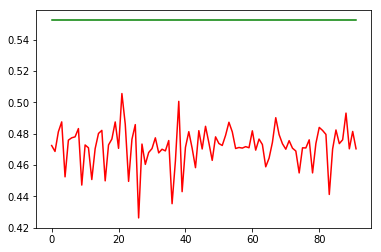

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:55:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2076000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:55:47
INFO:tensorflow:Saving dict for global step 2076000: global_step = 2076000, loss = 0.0064822063
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2076000: ./outputdir/model.ckpt-2076000
error on testset first run {'loss': 0.0064822063, 'global_step': 2076000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2076000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 433.813
INFO:tensorflow:loss = 1.1797285e-07, step = 2080601 (0.231 sec)
INFO:tensorflow:global_step/sec: 417.863
INFO:tensorflow:loss = 8.1730184e-05, step = 2080701 (0.239 sec)
INFO:tensorflow:global_step/sec: 436.716
INFO:tensorflow:loss = 0.0002167949, step = 2080801 (0.229 sec)
INFO:tensorflow:global_step/sec: 428.487
INFO:tensorflow:loss = 3.0055135e-05, step = 2080901 (0.233 sec)
INFO:tensorflow:global_step/sec: 387.292
INFO:tensorflow:loss = 0.0001685829, step = 2081001 (0.258 sec)
INFO:tensorflow:global_step/sec: 461.379
INFO:tensorflow:loss = 3.571568e-07, step = 2081101 (0.217 sec)
INFO:tensorflow:global_step/sec: 455.059
INFO:tensorflow:loss = 0.00055748114, step = 2081201 (0.220 sec)
INFO:tensorflow:global_step/sec: 456.404
INFO:tensorflow:loss = 5.9497113e-05, step = 2081301 (0.219 sec)
INFO:tensorflow:global_step/sec: 454.477
INFO:tensorflow:loss = 1.5205378e-06, step = 2081401 (0.220 sec)
INFO:tensorflow:global_step/sec: 400.037
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2086000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2086000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.0074418e-05, step = 2086001
INFO:tensorflow:global_step/sec: 161.599
INFO:tensorflow:loss = 0.00015496637, step = 2086101 (0.620 sec)
INFO:tensorflow:global_step/sec: 469.583
INFO:tensorflow:loss = 0.00033399824, step = 2086201 (0.213 sec)
INFO:tensorflow:global_step/sec: 454.708
INFO:tensorflow:loss = 1.0047096e-05, step = 2086301 (0.220 sec)
INFO:tensorflow:global_step/sec: 464.269
INFO:tensorflow:loss = 9.4630785e-05, step = 2086401 (0.215 sec)
INFO:tensorflow:global_step/sec: 465.458
INFO:tensorflow:loss = 0.0047428235, step = 2086501 (0.214 sec)
INFO:tensorflow:global_step/sec: 397.943
INFO:tensorflow:loss = 6.7051706e-06, step = 2086601 (0.251 sec)
INFO:tensorflow:global_step/sec: 439.67
INFO:tensorflow:loss = 6.183263e-05, ste

INFO:tensorflow:loss = 6.1912804e-05, step = 2091901 (0.222 sec)
INFO:tensorflow:Saving checkpoints for 2092000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.9773647e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2092000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 9.470514321313827e-06
prediction at  8 [array([0.47445961])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2092000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2092000 into ./outputdir/m

INFO:tensorflow:global_step/sec: 434.528
INFO:tensorflow:loss = 1.21375e-07, step = 2097201 (0.230 sec)
INFO:tensorflow:global_step/sec: 436.958
INFO:tensorflow:loss = 2.0434432e-05, step = 2097301 (0.229 sec)
INFO:tensorflow:global_step/sec: 447.966
INFO:tensorflow:loss = 0.00072517054, step = 2097401 (0.223 sec)
INFO:tensorflow:global_step/sec: 434.936
INFO:tensorflow:loss = 1.0837227e-05, step = 2097501 (0.230 sec)
INFO:tensorflow:global_step/sec: 334.045
INFO:tensorflow:loss = 0.0010819986, step = 2097601 (0.300 sec)
INFO:tensorflow:global_step/sec: 366.023
INFO:tensorflow:loss = 2.0831912e-06, step = 2097701 (0.273 sec)
INFO:tensorflow:global_step/sec: 372.094
INFO:tensorflow:loss = 8.568356e-05, step = 2097801 (0.269 sec)
INFO:tensorflow:global_step/sec: 369.212
INFO:tensorflow:loss = 7.900778e-05, step = 2097901 (0.271 sec)
INFO:tensorflow:Saving checkpoints for 2098000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.602988e-05.
INFO:tensorflow:Calling model_

INFO:tensorflow:loss = 5.2779164e-06, step = 2102401 (0.223 sec)
INFO:tensorflow:global_step/sec: 450.283
INFO:tensorflow:loss = 3.7102984e-06, step = 2102501 (0.222 sec)
INFO:tensorflow:global_step/sec: 464.47
INFO:tensorflow:loss = 5.3668195e-05, step = 2102601 (0.215 sec)
INFO:tensorflow:global_step/sec: 456.598
INFO:tensorflow:loss = 6.586763e-05, step = 2102701 (0.219 sec)
INFO:tensorflow:global_step/sec: 480.287
INFO:tensorflow:loss = 5.825468e-06, step = 2102801 (0.208 sec)
INFO:tensorflow:global_step/sec: 475.874
INFO:tensorflow:loss = 4.8791885e-06, step = 2102901 (0.210 sec)
INFO:tensorflow:global_step/sec: 455.126
INFO:tensorflow:loss = 8.233644e-05, step = 2103001 (0.220 sec)
INFO:tensorflow:global_step/sec: 459.715
INFO:tensorflow:loss = 0.00016531753, step = 2103101 (0.218 sec)
INFO:tensorflow:global_step/sec: 460.628
INFO:tensorflow:loss = 0.0010979814, step = 2103201 (0.217 sec)
INFO:tensorflow:global_step/sec: 456.773
INFO:tensorflow:loss = 0.0002248351, step = 2103301

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2108000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2108000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.9588983e-06, step = 2108001
INFO:tensorflow:global_step/sec: 163.033
INFO:tensorflow:loss = 3.8140704e-05, step = 2108101 (0.614 sec)
INFO:tensorflow:global_step/sec: 463.465
INFO:tensorflow:loss = 1.6479756e-06, step = 2108201 (0.216 sec)
INFO:tensorflow:global_step/sec: 446.213
INFO:tensorflow:loss = 4.0964056e-05, step = 2108301 (0.225 sec)
INFO:tensorflow:global_step/sec: 445.825
INFO:tensorflow:loss = 1.6050274e-06, step = 2108401 (0.224 sec)
INFO:tensorflow:global_step/sec: 429.515
INFO:tensorflow:loss = 1.8114637e-05, step = 2108501 (0.233 sec)
INFO:tensorflow:global_step/sec: 447.699
INFO:tensorflow:loss = 1

INFO:tensorflow:global_step/sec: 388.138
INFO:tensorflow:loss = 4.0587622e-08, step = 2113801 (0.258 sec)
INFO:tensorflow:global_step/sec: 381.026
INFO:tensorflow:loss = 1.7953147e-05, step = 2113901 (0.263 sec)
INFO:tensorflow:Saving checkpoints for 2114000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 8.28157e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2114000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 5.7870223819561244e-06
prediction at  19 [array([0.47305315])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2114000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2118000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2118000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.2762741, step = 2118001
INFO:tensorflow:global_step/sec: 165.339
INFO:tensorflow:loss = 2.2403858e-06, step = 2118101 (0.606 sec)
INFO:tensorflow:global_step/sec: 453.394
INFO:tensorflow:loss = 0.0016139557, step = 2118201 (0.221 sec)
INFO:tensorflow:global_step/sec: 458.981
INFO:tensorflow:loss = 1.3477921e-05, step = 2118301 (0.218 sec)
INFO:tensorflow:global_step/sec: 429.808
INFO:tensorflow:loss = 9.899146e-06, step = 2118401 (0.233 sec)
INFO:tensorflow:global_step/sec: 438.4
INFO:tensorflow:loss = 1.00869535e-08, step = 2118501 (0.228 sec)
INFO:tensorflow:global_step/sec: 435.061
INFO:tensorflow:loss = 1.375372

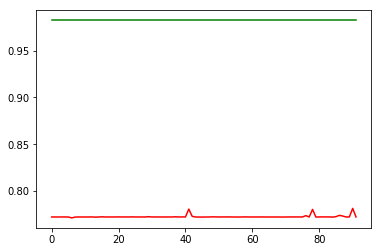

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-21:58:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2120000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-21:58:42
INFO:tensorflow:Saving dict for global step 2120000: global_step = 2120000, loss = 0.04413553
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2120000: ./outputdir/model.ckpt-2120000
error on testset first run {'loss': 0.04413553, 'global_step': 2120000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2120000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:global_step/sec: 434.034
INFO:tensorflow:loss = 2.6458626e-08, step = 2124601 (0.230 sec)
INFO:tensorflow:global_step/sec: 433.366
INFO:tensorflow:loss = 2.185061e-08, step = 2124701 (0.231 sec)
INFO:tensorflow:global_step/sec: 435.032
INFO:tensorflow:loss = 1.5948132e-09, step = 2124801 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.901
INFO:tensorflow:loss = 8.789654e-08, step = 2124901 (0.227 sec)
INFO:tensorflow:global_step/sec: 445.462
INFO:tensorflow:loss = 3.5475978e-10, step = 2125001 (0.225 sec)
INFO:tensorflow:global_step/sec: 438.289
INFO:tensorflow:loss = 1.2556711e-08, step = 2125101 (0.228 sec)
INFO:tensorflow:global_step/sec: 432.44
INFO:tensorflow:loss = 8.3018236e-08, step = 2125201 (0.231 sec)
INFO:tensorflow:global_step/sec: 388.871
INFO:tensorflow:loss = 2.165907e-07, step = 2125301 (0.257 sec)
INFO:tensorflow:global_step/sec: 454.077
INFO:tensorflow:loss = 3.3358596e-09, step = 2125401 (0.220 sec)
INFO:tensorflow:global_step/sec: 342.869
INFO:tens

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2130000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2130000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.936662e-07, step = 2130001
INFO:tensorflow:global_step/sec: 164.613
INFO:tensorflow:loss = 9.543828e-08, step = 2130101 (0.608 sec)
INFO:tensorflow:global_step/sec: 465.3
INFO:tensorflow:loss = 7.428426e-09, step = 2130201 (0.215 sec)
INFO:tensorflow:global_step/sec: 455.959
INFO:tensorflow:loss = 4.9577045e-07, step = 2130301 (0.219 sec)
INFO:tensorflow:global_step/sec: 346.242
INFO:tensorflow:loss = 3.8455715e-07, step = 2130401 (0.289 sec)
INFO:tensorflow:global_step/sec: 433.883
INFO:tensorflow:loss = 4.4485695e-09, step = 2130501 (0.230 sec)
INFO:tensorflow:global_step/sec: 419.867
INFO:tensorflow:loss = 1.8885757e-07, step = 2130601 (0.239 sec)
INFO:tensorflow:global_step/sec: 442.077
INFO:tensorflow:loss = 2.3868779e-08, step 

INFO:tensorflow:loss = 1.0192588e-06, step = 2135901 (0.258 sec)
INFO:tensorflow:Saving checkpoints for 2136000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.067502e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2136000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.8958173034454563e-08
prediction at  8 [array([0.77169918])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2136000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2136000 into ./outputdir/m

INFO:tensorflow:global_step/sec: 423.876
INFO:tensorflow:loss = 9.072224e-09, step = 2141201 (0.235 sec)
INFO:tensorflow:global_step/sec: 428.088
INFO:tensorflow:loss = 1.7683139e-08, step = 2141301 (0.234 sec)
INFO:tensorflow:global_step/sec: 430.377
INFO:tensorflow:loss = 6.4988825e-08, step = 2141401 (0.233 sec)
INFO:tensorflow:global_step/sec: 430.55
INFO:tensorflow:loss = 3.0002084e-08, step = 2141501 (0.232 sec)
INFO:tensorflow:global_step/sec: 425.661
INFO:tensorflow:loss = 5.2532414e-09, step = 2141601 (0.235 sec)
INFO:tensorflow:global_step/sec: 412.064
INFO:tensorflow:loss = 4.578773e-10, step = 2141701 (0.243 sec)
INFO:tensorflow:global_step/sec: 390.863
INFO:tensorflow:loss = 2.695853e-07, step = 2141801 (0.256 sec)
INFO:tensorflow:global_step/sec: 391.443
INFO:tensorflow:loss = 1.00152455e-08, step = 2141901 (0.255 sec)
INFO:tensorflow:Saving checkpoints for 2142000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.740602e-07.
INFO:tensorflow:Calling mode

INFO:tensorflow:loss = 3.1572372e-07, step = 2146401 (0.226 sec)
INFO:tensorflow:global_step/sec: 455.239
INFO:tensorflow:loss = 1.0035537e-06, step = 2146501 (0.219 sec)
INFO:tensorflow:global_step/sec: 445.818
INFO:tensorflow:loss = 5.506795e-07, step = 2146601 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.557
INFO:tensorflow:loss = 1.0794557e-06, step = 2146701 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.951
INFO:tensorflow:loss = 3.1380353e-08, step = 2146801 (0.230 sec)
INFO:tensorflow:global_step/sec: 445.25
INFO:tensorflow:loss = 5.440648e-07, step = 2146901 (0.225 sec)
INFO:tensorflow:global_step/sec: 449.616
INFO:tensorflow:loss = 4.207823e-07, step = 2147001 (0.222 sec)
INFO:tensorflow:global_step/sec: 458.426
INFO:tensorflow:loss = 1.6468281e-08, step = 2147101 (0.218 sec)
INFO:tensorflow:global_step/sec: 455.069
INFO:tensorflow:loss = 3.826375e-07, step = 2147201 (0.220 sec)
INFO:tensorflow:global_step/sec: 448.039
INFO:tensorflow:loss = 4.0690225e-07, step = 214730

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2152000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2152000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.472264e-08, step = 2152001
INFO:tensorflow:global_step/sec: 167.592
INFO:tensorflow:loss = 1.6206242e-07, step = 2152101 (0.597 sec)
INFO:tensorflow:global_step/sec: 463.059
INFO:tensorflow:loss = 4.821692e-08, step = 2152201 (0.217 sec)
INFO:tensorflow:global_step/sec: 432.41
INFO:tensorflow:loss = 1.6287927e-07, step = 2152301 (0.231 sec)
INFO:tensorflow:global_step/sec: 451.3
INFO:tensorflow:loss = 3.4406412e-08, step = 2152401 (0.222 sec)
INFO:tensorflow:global_step/sec: 453.366
INFO:tensorflow:loss = 1.7086501e-07, step = 2152501 (0.220 sec)
INFO:tensorflow:global_step/sec: 435.135
INFO:tensorflow:loss = 2.8493

INFO:tensorflow:global_step/sec: 430.351
INFO:tensorflow:loss = 6.70409e-08, step = 2157801 (0.232 sec)
INFO:tensorflow:global_step/sec: 428.622
INFO:tensorflow:loss = 3.791914e-08, step = 2157901 (0.234 sec)
INFO:tensorflow:Saving checkpoints for 2158000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.4064578e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2158000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 5.834878040528373e-09
prediction at  19 [array([0.77180371])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2158000
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2162000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2162000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.07916481, step = 2162001
INFO:tensorflow:global_step/sec: 165.271
INFO:tensorflow:loss = 8.113201e-05, step = 2162101 (0.606 sec)
INFO:tensorflow:global_step/sec: 462.229
INFO:tensorflow:loss = 2.308635e-06, step = 2162201 (0.216 sec)
INFO:tensorflow:global_step/sec: 434.99
INFO:tensorflow:loss = 5.850761e-06, step = 2162301 (0.230 sec)
INFO:tensorflow:global_step/sec: 453.292
INFO:tensorflow:loss = 1.734618e-09, step = 2162401 (0.221 sec)
INFO:tensorflow:global_step/sec: 444.084
INFO:tensorflow:loss = 1.7550724e-06, step = 2162501 (0.226 sec)
INFO:tensorflow:global_step/sec: 456.206
INFO:tensorflow:loss = 3.53367e-

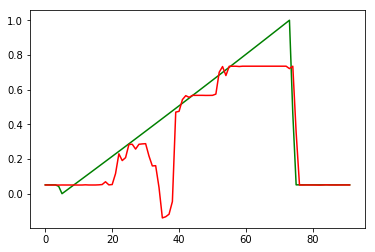

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:01:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2164000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:01:38
INFO:tensorflow:Saving dict for global step 2164000: global_step = 2164000, loss = 0.026214356
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2164000: ./outputdir/model.ckpt-2164000
error on testset first run {'loss': 0.026214356, 'global_step': 2164000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2164000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 434.399
INFO:tensorflow:loss = 0.0013786147, step = 2168601 (0.230 sec)
INFO:tensorflow:global_step/sec: 435.925
INFO:tensorflow:loss = 1.1240533e-05, step = 2168701 (0.229 sec)
INFO:tensorflow:global_step/sec: 432.715
INFO:tensorflow:loss = 0.0012849354, step = 2168801 (0.231 sec)
INFO:tensorflow:global_step/sec: 430.711
INFO:tensorflow:loss = 3.9671536e-07, step = 2168901 (0.232 sec)
INFO:tensorflow:global_step/sec: 439.072
INFO:tensorflow:loss = 0.0011375421, step = 2169001 (0.227 sec)
INFO:tensorflow:global_step/sec: 433.971
INFO:tensorflow:loss = 0.0012908648, step = 2169101 (0.230 sec)
INFO:tensorflow:global_step/sec: 444.98
INFO:tensorflow:loss = 0.0009772481, step = 2169201 (0.225 sec)
INFO:tensorflow:global_step/sec: 412.959
INFO:tensorflow:loss = 0.0013955567, step = 2169301 (0.242 sec)
INFO:tensorflow:global_step/sec: 416.685
INFO:tensorflow:loss = 0.00085040426, step = 2169401 (0.240 sec)
INFO:tensorflow:global_step/sec: 401.713
INFO:tensorf

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2174000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0016388248, step = 2174001
INFO:tensorflow:global_step/sec: 161.281
INFO:tensorflow:loss = 0.0019225876, step = 2174101 (0.621 sec)
INFO:tensorflow:global_step/sec: 444.038
INFO:tensorflow:loss = 0.0015468774, step = 2174201 (0.225 sec)
INFO:tensorflow:global_step/sec: 428.462
INFO:tensorflow:loss = 5.2552776e-05, step = 2174301 (0.233 sec)
INFO:tensorflow:global_step/sec: 430.532
INFO:tensorflow:loss = 0.0019263949, step = 2174401 (0.232 sec)
INFO:tensorflow:global_step/sec: 441.72
INFO:tensorflow:loss = 0.0019075165, step = 2174501 (0.226 sec)
INFO:tensorflow:global_step/sec: 438.051
INFO:tensorflow:loss = 0.0014254724, step = 2174601 (0.228 sec)
INFO:tensorflow:global_step/sec: 385.515
INFO:tensorflow:loss = 1.47434785e-05, step = 2174701 (0.260 sec)
INFO:tensorflow:global_step/sec: 444.326
INFO:tensor

INFO:tensorflow:Loss for final step: 0.0020046039.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2180000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.0008570032733356178
prediction at  8 [array([0.0249502])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2180000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2180000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0018973722, step = 2180001
INFO:tensorflow:global_step/sec: 158.416
INFO:tensorflow:loss = 0.003016647, ste

INFO:tensorflow:loss = 1.3550586e-05, step = 2185301 (0.232 sec)
INFO:tensorflow:global_step/sec: 436.277
INFO:tensorflow:loss = 0.0040700343, step = 2185401 (0.229 sec)
INFO:tensorflow:global_step/sec: 433.432
INFO:tensorflow:loss = 0.004338227, step = 2185501 (0.231 sec)
INFO:tensorflow:global_step/sec: 418.604
INFO:tensorflow:loss = 0.005081646, step = 2185601 (0.239 sec)
INFO:tensorflow:global_step/sec: 401.421
INFO:tensorflow:loss = 0.005039076, step = 2185701 (0.250 sec)
INFO:tensorflow:global_step/sec: 406.968
INFO:tensorflow:loss = 0.27001685, step = 2185801 (0.245 sec)
INFO:tensorflow:global_step/sec: 399.418
INFO:tensorflow:loss = 3.9314615e-05, step = 2185901 (0.251 sec)
INFO:tensorflow:Saving checkpoints for 2186000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00012318886.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-218600

INFO:tensorflow:loss = 4.207644e-05, step = 2190601 (0.224 sec)
INFO:tensorflow:global_step/sec: 447.02
INFO:tensorflow:loss = 0.00030506446, step = 2190701 (0.224 sec)
INFO:tensorflow:global_step/sec: 435.223
INFO:tensorflow:loss = 8.4848696e-05, step = 2190801 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.193
INFO:tensorflow:loss = 1.2061756e-06, step = 2190901 (0.227 sec)
INFO:tensorflow:global_step/sec: 451.618
INFO:tensorflow:loss = 6.263374e-05, step = 2191001 (0.221 sec)
INFO:tensorflow:global_step/sec: 454.182
INFO:tensorflow:loss = 0.009942806, step = 2191101 (0.220 sec)
INFO:tensorflow:global_step/sec: 451.518
INFO:tensorflow:loss = 0.009944994, step = 2191201 (0.222 sec)
INFO:tensorflow:global_step/sec: 450.794
INFO:tensorflow:loss = 0.009973689, step = 2191301 (0.222 sec)
INFO:tensorflow:global_step/sec: 448.147
INFO:tensorflow:loss = 0.009849797, step = 2191401 (0.223 sec)
INFO:tensorflow:global_step/sec: 439.901
INFO:tensorflow:loss = 0.008439343, step = 2191501 (0.227

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2196000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.021150535, step = 2196001
INFO:tensorflow:global_step/sec: 161.259
INFO:tensorflow:loss = 7.4947616e-06, step = 2196101 (0.621 sec)
INFO:tensorflow:global_step/sec: 396.903
INFO:tensorflow:loss = 0.0373451, step = 2196201 (0.252 sec)
INFO:tensorflow:global_step/sec: 421.617
INFO:tensorflow:loss = 7.105075e-06, step = 2196301 (0.237 sec)
INFO:tensorflow:global_step/sec: 425.163
INFO:tensorflow:loss = 0.03877006, step = 2196401 (0.235 sec)
INFO:tensorflow:global_step/sec: 398.896
INFO:tensorflow:loss = 8.4500025e-06, step = 2196501 (0.251 sec)
INFO:tensorflow:global_step/sec: 407.693
INFO:tensorflow:loss = 0.0376228, step = 2196601 (0.246 sec)
INFO:tensorflow:global_step/sec: 425.118
INFO:tensorflow:loss = 7.648953e-06, step = 2196701 (0.235 sec)
INFO:tensorflow:global_step/sec: 378.242
INFO:tensorflow:loss = 0.038156822, step = 2196801 (0.265 s

INFO:tensorflow:Loss for final step: 1.7422643e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2202000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.8741908595757313e-05
prediction at  19 [array([0.05090787])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2202000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2202000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.4089836e-06, step = 2202001
INFO:tensorflow:global_step/sec: 166.221
INFO:tensorflow:loss = 8.0851486e

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2206000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2206000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.008031882, step = 2206001
INFO:tensorflow:global_step/sec: 167.798
INFO:tensorflow:loss = 1.0237295e-07, step = 2206101 (0.597 sec)
INFO:tensorflow:global_step/sec: 457.637
INFO:tensorflow:loss = 6.4881747e-06, step = 2206201 (0.219 sec)
INFO:tensorflow:global_step/sec: 455.454
INFO:tensorflow:loss = 0.012344932, step = 2206301 (0.220 sec)
INFO:tensorflow:global_step/sec: 444.917
INFO:tensorflow:loss = 0.00037776338, step = 2206401 (0.225 sec)
INFO:tensorflow:global_step/sec: 426.529
INFO:tensorflow:loss = 1.07623785e-08, step = 2206501 (0.234 sec)
INFO:tensorflow:global_step/sec: 412.616
INFO:tensorflow:loss = 0.00

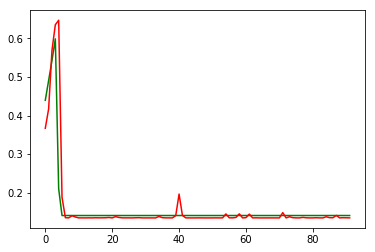

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:04:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2208000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:04:35
INFO:tensorflow:Saving dict for global step 2208000: global_step = 2208000, loss = 0.005257441
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2208000: ./outputdir/model.ckpt-2208000
error on testset first run {'loss': 0.005257441, 'global_step': 2208000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2208000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 376.014
INFO:tensorflow:loss = 5.877748e-09, step = 2212601 (0.265 sec)
INFO:tensorflow:global_step/sec: 457.454
INFO:tensorflow:loss = 6.532507e-06, step = 2212701 (0.220 sec)
INFO:tensorflow:global_step/sec: 448.609
INFO:tensorflow:loss = 4.7708517e-07, step = 2212801 (0.222 sec)
INFO:tensorflow:global_step/sec: 431.325
INFO:tensorflow:loss = 1.3196144e-05, step = 2212901 (0.232 sec)
INFO:tensorflow:global_step/sec: 395.299
INFO:tensorflow:loss = 1.5093865e-06, step = 2213001 (0.253 sec)
INFO:tensorflow:global_step/sec: 441.464
INFO:tensorflow:loss = 3.2526748e-06, step = 2213101 (0.227 sec)
INFO:tensorflow:global_step/sec: 442.833
INFO:tensorflow:loss = 0.0002493693, step = 2213201 (0.226 sec)
INFO:tensorflow:global_step/sec: 450.589
INFO:tensorflow:loss = 4.386149e-06, step = 2213301 (0.222 sec)
INFO:tensorflow:global_step/sec: 444.484
INFO:tensorflow:loss = 1.6825603e-05, step = 2213401 (0.225 sec)
INFO:tensorflow:global_step/sec: 446.682
INFO:tens

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2218000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2218000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.414594e-06, step = 2218001
INFO:tensorflow:global_step/sec: 166.711
INFO:tensorflow:loss = 6.6364887e-09, step = 2218101 (0.601 sec)
INFO:tensorflow:global_step/sec: 448.726
INFO:tensorflow:loss = 1.4597198e-05, step = 2218201 (0.223 sec)
INFO:tensorflow:global_step/sec: 446.196
INFO:tensorflow:loss = 2.295454e-06, step = 2218301 (0.224 sec)
INFO:tensorflow:global_step/sec: 449.907
INFO:tensorflow:loss = 5.573756e-06, step = 2218401 (0.222 sec)
INFO:tensorflow:global_step/sec: 446.126
INFO:tensorflow:loss = 2.1597598e-06, step = 2218501 (0.224 sec)
INFO:tensorflow:global_step/sec: 456.163
INFO:tensorflow:loss = 2.9957511e-05, step = 2218601 (0.219 sec)
INFO:tensorflow:global_step/sec: 470.487
INFO:tensorflow:loss = 5.073364e-09, step

INFO:tensorflow:loss = 3.726036e-05, step = 2223901 (0.243 sec)
INFO:tensorflow:Saving checkpoints for 2224000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 7.130963e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2224000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 0.00011020880465638417
prediction at  8 [array([0.14318757])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2224000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2224000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 442.39
INFO:tensorflow:loss = 1.1813874e-05, step = 2229201 (0.226 sec)
INFO:tensorflow:global_step/sec: 419.412
INFO:tensorflow:loss = 7.78404e-06, step = 2229301 (0.238 sec)
INFO:tensorflow:global_step/sec: 428.004
INFO:tensorflow:loss = 5.3639815e-07, step = 2229401 (0.234 sec)
INFO:tensorflow:global_step/sec: 434.958
INFO:tensorflow:loss = 2.3804361e-08, step = 2229501 (0.230 sec)
INFO:tensorflow:global_step/sec: 380.877
INFO:tensorflow:loss = 0.00025863468, step = 2229601 (0.262 sec)
INFO:tensorflow:global_step/sec: 388.463
INFO:tensorflow:loss = 2.3195536e-05, step = 2229701 (0.257 sec)
INFO:tensorflow:global_step/sec: 385.669
INFO:tensorflow:loss = 3.3013857e-05, step = 2229801 (0.259 sec)
INFO:tensorflow:global_step/sec: 383.895
INFO:tensorflow:loss = 1.2012606e-05, step = 2229901 (0.260 sec)
INFO:tensorflow:Saving checkpoints for 2230000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.0325743e-06.
INFO:tensorflow:Calling mod

INFO:tensorflow:loss = 1.1871923e-05, step = 2234401 (0.225 sec)
INFO:tensorflow:global_step/sec: 450.971
INFO:tensorflow:loss = 1.5845824e-05, step = 2234501 (0.222 sec)
INFO:tensorflow:global_step/sec: 457.616
INFO:tensorflow:loss = 9.247676e-06, step = 2234601 (0.218 sec)
INFO:tensorflow:global_step/sec: 454.787
INFO:tensorflow:loss = 9.213722e-06, step = 2234701 (0.220 sec)
INFO:tensorflow:global_step/sec: 438.268
INFO:tensorflow:loss = 6.0019365e-06, step = 2234801 (0.229 sec)
INFO:tensorflow:global_step/sec: 445.798
INFO:tensorflow:loss = 4.4502954e-06, step = 2234901 (0.224 sec)
INFO:tensorflow:global_step/sec: 452.768
INFO:tensorflow:loss = 8.5629503e-11, step = 2235001 (0.221 sec)
INFO:tensorflow:global_step/sec: 467.159
INFO:tensorflow:loss = 3.5943412e-08, step = 2235101 (0.214 sec)
INFO:tensorflow:global_step/sec: 479.927
INFO:tensorflow:loss = 0.00030679363, step = 2235201 (0.208 sec)
INFO:tensorflow:global_step/sec: 438.774
INFO:tensorflow:loss = 9.366957e-07, step = 2235

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2240000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2240000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.036368e-06, step = 2240001
INFO:tensorflow:global_step/sec: 161.658
INFO:tensorflow:loss = 1.2315695e-07, step = 2240101 (0.619 sec)
INFO:tensorflow:global_step/sec: 451.59
INFO:tensorflow:loss = 1.1692479e-06, step = 2240201 (0.222 sec)
INFO:tensorflow:global_step/sec: 458.646
INFO:tensorflow:loss = 9.3405305e-08, step = 2240301 (0.218 sec)
INFO:tensorflow:global_step/sec: 455.64
INFO:tensorflow:loss = 1.5274177e-06, step = 2240401 (0.220 sec)
INFO:tensorflow:global_step/sec: 440.94
INFO:tensorflow:loss = 5.595871e-08, step = 2240501 (0.226 sec)
INFO:tensorflow:global_step/sec: 432.946
INFO:tensorflow:loss = 1.7462

INFO:tensorflow:global_step/sec: 416.946
INFO:tensorflow:loss = 2.4678993e-06, step = 2245801 (0.240 sec)
INFO:tensorflow:global_step/sec: 415.188
INFO:tensorflow:loss = 1.099309e-05, step = 2245901 (0.241 sec)
INFO:tensorflow:Saving checkpoints for 2246000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.2658438e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2246000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 6.843314674450176e-06
prediction at  19 [array([0.13625251])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2246000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2250000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2250000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.013863895, step = 2250001
INFO:tensorflow:global_step/sec: 163.853
INFO:tensorflow:loss = 0.0006989425, step = 2250101 (0.611 sec)
INFO:tensorflow:global_step/sec: 456.686
INFO:tensorflow:loss = 1.977513e-05, step = 2250201 (0.219 sec)
INFO:tensorflow:global_step/sec: 438.287
INFO:tensorflow:loss = 0.0047566835, step = 2250301 (0.228 sec)
INFO:tensorflow:global_step/sec: 415.065
INFO:tensorflow:loss = 2.4787262e-06, step = 2250401 (0.241 sec)
INFO:tensorflow:global_step/sec: 433.228
INFO:tensorflow:loss = 2.4321548e-07, step = 2250501 (0.231 sec)
INFO:tensorflow:global_step/sec: 413.138
INFO:tensorflow:loss = 1.5391

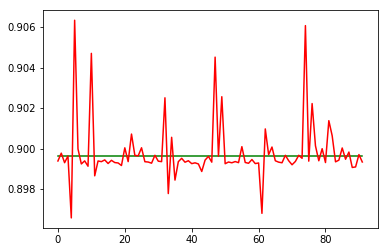

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:07:31
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2252000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:07:31
INFO:tensorflow:Saving dict for global step 2252000: global_step = 2252000, loss = 2.0493364e-06
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2252000: ./outputdir/model.ckpt-2252000
error on testset first run {'loss': 2.0493364e-06, 'global_step': 2252000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2252000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 430.917
INFO:tensorflow:loss = 4.629932e-08, step = 2256601 (0.232 sec)
INFO:tensorflow:global_step/sec: 415.567
INFO:tensorflow:loss = 1.5437039e-06, step = 2256701 (0.241 sec)
INFO:tensorflow:global_step/sec: 378.146
INFO:tensorflow:loss = 8.191997e-07, step = 2256801 (0.264 sec)
INFO:tensorflow:global_step/sec: 409.673
INFO:tensorflow:loss = 6.430988e-06, step = 2256901 (0.244 sec)
INFO:tensorflow:global_step/sec: 395.296
INFO:tensorflow:loss = 3.2875973e-06, step = 2257001 (0.253 sec)
INFO:tensorflow:global_step/sec: 430.235
INFO:tensorflow:loss = 1.7130878e-07, step = 2257101 (0.233 sec)
INFO:tensorflow:global_step/sec: 438.887
INFO:tensorflow:loss = 1.6761769e-06, step = 2257201 (0.228 sec)
INFO:tensorflow:global_step/sec: 444.689
INFO:tensorflow:loss = 1.15556e-06, step = 2257301 (0.225 sec)
INFO:tensorflow:global_step/sec: 444.536
INFO:tensorflow:loss = 5.425869e-08, step = 2257401 (0.225 sec)
INFO:tensorflow:global_step/sec: 437.928
INFO:tensor

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2262000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.0164598e-06, step = 2262001
INFO:tensorflow:global_step/sec: 157.56
INFO:tensorflow:loss = 1.4060461e-07, step = 2262101 (0.635 sec)
INFO:tensorflow:global_step/sec: 438.508
INFO:tensorflow:loss = 4.067502e-07, step = 2262201 (0.228 sec)
INFO:tensorflow:global_step/sec: 460.921
INFO:tensorflow:loss = 3.904194e-07, step = 2262301 (0.217 sec)
INFO:tensorflow:global_step/sec: 451.814
INFO:tensorflow:loss = 1.0682143e-06, step = 2262401 (0.221 sec)
INFO:tensorflow:global_step/sec: 451.512
INFO:tensorflow:loss = 2.1382563e-07, step = 2262501 (0.222 sec)
INFO:tensorflow:global_step/sec: 448.545
INFO:tensorflow:loss = 8.540902e-07, step = 2262601 (0.223 sec)
INFO:tensorflow:global_step/sec: 447.215
INFO:tensorflow:loss = 7.3966095e-07, step = 2262701 (0.224 sec)
INFO:tensorflow:global_step/sec: 435.825
INFO:tens

INFO:tensorflow:Saving checkpoints for 2268000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 8.132762e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2268000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 3.40727409255142e-08
prediction at  8 [array([0.89943334])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2268000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2268000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.0447254e-09, step = 2268001
INF

INFO:tensorflow:loss = 4.4334755e-07, step = 2273201 (0.229 sec)
INFO:tensorflow:global_step/sec: 438.314
INFO:tensorflow:loss = 1.250404e-05, step = 2273301 (0.228 sec)
INFO:tensorflow:global_step/sec: 429.933
INFO:tensorflow:loss = 2.4982837e-06, step = 2273401 (0.233 sec)
INFO:tensorflow:global_step/sec: 431.906
INFO:tensorflow:loss = 2.8103113e-07, step = 2273501 (0.232 sec)
INFO:tensorflow:global_step/sec: 393.51
INFO:tensorflow:loss = 4.9375558e-08, step = 2273601 (0.254 sec)
INFO:tensorflow:global_step/sec: 431.174
INFO:tensorflow:loss = 8.690279e-07, step = 2273701 (0.231 sec)
INFO:tensorflow:global_step/sec: 432.374
INFO:tensorflow:loss = 3.6198185e-07, step = 2273801 (0.231 sec)
INFO:tensorflow:global_step/sec: 403.098
INFO:tensorflow:loss = 5.119319e-07, step = 2273901 (0.248 sec)
INFO:tensorflow:Saving checkpoints for 2274000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.3234778e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_

INFO:tensorflow:global_step/sec: 440.43
INFO:tensorflow:loss = 1.822622e-08, step = 2278501 (0.227 sec)
INFO:tensorflow:global_step/sec: 396.887
INFO:tensorflow:loss = 5.78535e-07, step = 2278601 (0.252 sec)
INFO:tensorflow:global_step/sec: 446.486
INFO:tensorflow:loss = 1.1601779e-06, step = 2278701 (0.224 sec)
INFO:tensorflow:global_step/sec: 428.835
INFO:tensorflow:loss = 8.521083e-07, step = 2278801 (0.233 sec)
INFO:tensorflow:global_step/sec: 463.858
INFO:tensorflow:loss = 7.702354e-06, step = 2278901 (0.215 sec)
INFO:tensorflow:global_step/sec: 463.491
INFO:tensorflow:loss = 1.0903824e-06, step = 2279001 (0.216 sec)
INFO:tensorflow:global_step/sec: 445.728
INFO:tensorflow:loss = 1.0078575e-06, step = 2279101 (0.224 sec)
INFO:tensorflow:global_step/sec: 458.44
INFO:tensorflow:loss = 2.0064847e-06, step = 2279201 (0.218 sec)
INFO:tensorflow:global_step/sec: 374.844
INFO:tensorflow:loss = 7.718896e-07, step = 2279301 (0.267 sec)
INFO:tensorflow:global_step/sec: 384.51
INFO:tensorflo

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2284000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2284000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.0068296e-06, step = 2284001
INFO:tensorflow:global_step/sec: 159.397
INFO:tensorflow:loss = 1.279831e-08, step = 2284101 (0.628 sec)
INFO:tensorflow:global_step/sec: 450.879
INFO:tensorflow:loss = 5.6555183e-07, step = 2284201 (0.222 sec)
INFO:tensorflow:global_step/sec: 456.55
INFO:tensorflow:loss = 3.991795e-08, step = 2284301 (0.219 sec)
INFO:tensorflow:global_step/sec: 450.741
INFO:tensorflow:loss = 7.5885333e-07, step = 2284401 (0.222 sec)
INFO:tensorflow:global_step/sec: 448.74
INFO:tensorflow:loss = 8.47445e-08, step = 2284501 (0.222 sec)
INFO:tensorflow:global_step/sec: 332.103
INFO:tensorflow:loss = 9.151879e-07, step = 2284601 (0.301 sec)
INFO:

INFO:tensorflow:loss = 1.3933686e-06, step = 2289801 (0.261 sec)
INFO:tensorflow:global_step/sec: 401.015
INFO:tensorflow:loss = 8.233955e-06, step = 2289901 (0.249 sec)
INFO:tensorflow:Saving checkpoints for 2290000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.335104e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2290000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 7.300800458488352e-06
prediction at  19 [array([0.90094588])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2290000
INFO:tensorflow:Running local_init_op.
INF

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2294000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2294000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.010016749, step = 2294001
INFO:tensorflow:global_step/sec: 167.051
INFO:tensorflow:loss = 1.32665e-05, step = 2294101 (0.599 sec)
INFO:tensorflow:global_step/sec: 460.478
INFO:tensorflow:loss = 9.323742e-11, step = 2294201 (0.217 sec)
INFO:tensorflow:global_step/sec: 456.336
INFO:tensorflow:loss = 0.0021813856, step = 2294301 (0.219 sec)
INFO:tensorflow:global_step/sec: 409.834
INFO:tensorflow:loss = 2.199888e-06, step = 2294401 (0.244 sec)
INFO:tensorflow:global_step/sec: 423.463
INFO:tensorflow:loss = 1.6270008e-08, step = 2294501 (0.236 sec)
INFO:tensorflow:global_step/sec: 441.374
INFO:tensorflow:loss = 1.114131

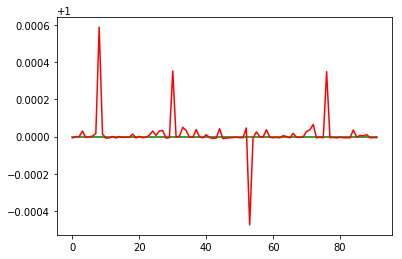

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:10:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2296000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:10:27
INFO:tensorflow:Saving dict for global step 2296000: global_step = 2296000, loss = 7.4522573e-06
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2296000: ./outputdir/model.ckpt-2296000
error on testset first run {'loss': 7.4522573e-06, 'global_step': 2296000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2296000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 439.636
INFO:tensorflow:loss = 9.829506e-10, step = 2300601 (0.227 sec)
INFO:tensorflow:global_step/sec: 429.065
INFO:tensorflow:loss = 1.6713958e-08, step = 2300701 (0.233 sec)
INFO:tensorflow:global_step/sec: 448.706
INFO:tensorflow:loss = 1.4040836e-08, step = 2300801 (0.223 sec)
INFO:tensorflow:global_step/sec: 399.367
INFO:tensorflow:loss = 1.7242062e-08, step = 2300901 (0.250 sec)
INFO:tensorflow:global_step/sec: 446.77
INFO:tensorflow:loss = 1.5410036e-07, step = 2301001 (0.224 sec)
INFO:tensorflow:global_step/sec: 446.485
INFO:tensorflow:loss = 2.1429742e-08, step = 2301101 (0.224 sec)
INFO:tensorflow:global_step/sec: 446.801
INFO:tensorflow:loss = 1.16808806e-07, step = 2301201 (0.224 sec)
INFO:tensorflow:global_step/sec: 443.585
INFO:tensorflow:loss = 2.2060362e-09, step = 2301301 (0.225 sec)
INFO:tensorflow:global_step/sec: 452.21
INFO:tensorflow:loss = 1.6729373e-10, step = 2301401 (0.222 sec)
INFO:tensorflow:global_step/sec: 453.767
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2306000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2306000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.1764609e-07, step = 2306001
INFO:tensorflow:global_step/sec: 162.428
INFO:tensorflow:loss = 2.0123991e-08, step = 2306101 (0.616 sec)
INFO:tensorflow:global_step/sec: 450.961
INFO:tensorflow:loss = 3.030596e-07, step = 2306201 (0.222 sec)
INFO:tensorflow:global_step/sec: 440.221
INFO:tensorflow:loss = 7.5077395e-08, step = 2306301 (0.227 sec)
INFO:tensorflow:global_step/sec: 449.509
INFO:tensorflow:loss = 1.3498499e-07, step = 2306401 (0.223 sec)
INFO:tensorflow:global_step/sec: 467.18
INFO:tensorflow:loss = 1.1130297e-10, step = 2306501 (0.214 sec)
INFO:tensorflow:global_step/sec: 439.153
INFO:tensorflow:loss = 1.6259074e-07, step = 2306601 (0.228 sec)
INFO:tensorflow:global_step/sec: 419.667
INFO:tensorflow:loss = 2.2206179e-07, st

INFO:tensorflow:global_step/sec: 453.534
INFO:tensorflow:loss = 6.0318293e-09, step = 2311901 (0.221 sec)
INFO:tensorflow:Saving checkpoints for 2312000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.814562e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2312000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.614317935527233e-07
prediction at  8 [array([1.00050398])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2312000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving ch

INFO:tensorflow:loss = 3.8463108e-07, step = 2317101 (0.224 sec)
INFO:tensorflow:global_step/sec: 449.412
INFO:tensorflow:loss = 2.8356465e-07, step = 2317201 (0.222 sec)
INFO:tensorflow:global_step/sec: 441.528
INFO:tensorflow:loss = 2.213321e-07, step = 2317301 (0.227 sec)
INFO:tensorflow:global_step/sec: 432.15
INFO:tensorflow:loss = 2.0932936e-07, step = 2317401 (0.231 sec)
INFO:tensorflow:global_step/sec: 422.055
INFO:tensorflow:loss = 6.4135753e-07, step = 2317501 (0.237 sec)
INFO:tensorflow:global_step/sec: 449.936
INFO:tensorflow:loss = 4.3426644e-07, step = 2317601 (0.223 sec)
INFO:tensorflow:global_step/sec: 434.851
INFO:tensorflow:loss = 4.139282e-07, step = 2317701 (0.229 sec)
INFO:tensorflow:global_step/sec: 445.026
INFO:tensorflow:loss = 3.922091e-07, step = 2317801 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.509
INFO:tensorflow:loss = 3.1485354e-07, step = 2317901 (0.230 sec)
INFO:tensorflow:Saving checkpoints for 2318000 into ./outputdir/model.ckpt.
INFO:tensorflow

INFO:tensorflow:global_step/sec: 421.457
INFO:tensorflow:loss = 6.3935425e-07, step = 2322401 (0.238 sec)
INFO:tensorflow:global_step/sec: 426.761
INFO:tensorflow:loss = 9.780979e-08, step = 2322501 (0.234 sec)
INFO:tensorflow:global_step/sec: 436.051
INFO:tensorflow:loss = 2.9510613e-07, step = 2322601 (0.229 sec)
INFO:tensorflow:global_step/sec: 438.856
INFO:tensorflow:loss = 6.478658e-07, step = 2322701 (0.228 sec)
INFO:tensorflow:global_step/sec: 439.302
INFO:tensorflow:loss = 9.695725e-09, step = 2322801 (0.228 sec)
INFO:tensorflow:global_step/sec: 452.19
INFO:tensorflow:loss = 4.786303e-07, step = 2322901 (0.221 sec)
INFO:tensorflow:global_step/sec: 445.139
INFO:tensorflow:loss = 1.219073e-06, step = 2323001 (0.225 sec)
INFO:tensorflow:global_step/sec: 452.495
INFO:tensorflow:loss = 2.5607994e-07, step = 2323101 (0.221 sec)
INFO:tensorflow:global_step/sec: 449.458
INFO:tensorflow:loss = 1.3726205e-06, step = 2323201 (0.223 sec)
INFO:tensorflow:global_step/sec: 445.125
INFO:tensor

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2328000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2328000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.761759e-09, step = 2328001
INFO:tensorflow:global_step/sec: 162.345
INFO:tensorflow:loss = 3.2875974e-08, step = 2328101 (0.617 sec)
INFO:tensorflow:global_step/sec: 444.044
INFO:tensorflow:loss = 2.7769175e-07, step = 2328201 (0.225 sec)
INFO:tensorflow:global_step/sec: 445.274
INFO:tensorflow:loss = 2.9713703e-08, step = 2328301 (0.225 sec)
INFO:tensorflow:global_step/sec: 432.953
INFO:tensorflow:loss = 2.7169386e-07, step = 2328401 (0.231 sec)
INFO:tensorflow:global_step/sec: 440.619
INFO:tensorflow:loss = 1.9122126e-08, step = 2328501 (0.226 sec)
INFO:tensorflow:global_step/sec: 418.346
INFO:tensorflow:loss = 2.

INFO:tensorflow:global_step/sec: 420.741
INFO:tensorflow:loss = 2.1931771e-07, step = 2333801 (0.238 sec)
INFO:tensorflow:global_step/sec: 398.257
INFO:tensorflow:loss = 3.3396773e-08, step = 2333901 (0.251 sec)
INFO:tensorflow:Saving checkpoints for 2334000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 8.063131e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2334000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.649877903634092e-07
prediction at  19 [array([0.99990097])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2334000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2338000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2338000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0032000158, step = 2338001
INFO:tensorflow:global_step/sec: 165.509
INFO:tensorflow:loss = 2.9397395e-05, step = 2338101 (0.605 sec)
INFO:tensorflow:global_step/sec: 447.118
INFO:tensorflow:loss = 3.8181206e-05, step = 2338201 (0.223 sec)
INFO:tensorflow:global_step/sec: 447.293
INFO:tensorflow:loss = 5.302606e-07, step = 2338301 (0.224 sec)
INFO:tensorflow:global_step/sec: 389.055
INFO:tensorflow:loss = 1.7351809e-08, step = 2338401 (0.257 sec)
INFO:tensorflow:global_step/sec: 454.754
INFO:tensorflow:loss = 2.1165926e-05, step = 2338501 (0.220 sec)
INFO:tensorflow:global_step/sec: 433.49
INFO:tensorflow:loss = 0.00

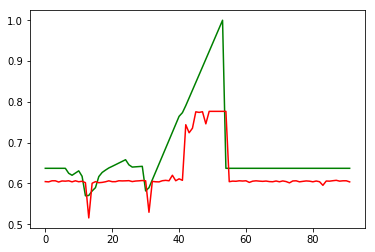

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:13:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2340000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:13:23
INFO:tensorflow:Saving dict for global step 2340000: global_step = 2340000, loss = 0.0045513543
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2340000: ./outputdir/model.ckpt-2340000
error on testset first run {'loss': 0.0045513543, 'global_step': 2340000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2340000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 442.358
INFO:tensorflow:loss = 6.775597e-09, step = 2344601 (0.226 sec)
INFO:tensorflow:global_step/sec: 452.571
INFO:tensorflow:loss = 2.6645105e-06, step = 2344701 (0.221 sec)
INFO:tensorflow:global_step/sec: 434.582
INFO:tensorflow:loss = 3.830063e-07, step = 2344801 (0.230 sec)
INFO:tensorflow:global_step/sec: 428.921
INFO:tensorflow:loss = 2.0342734e-06, step = 2344901 (0.233 sec)
INFO:tensorflow:global_step/sec: 451.616
INFO:tensorflow:loss = 1.7256153e-06, step = 2345001 (0.221 sec)
INFO:tensorflow:global_step/sec: 440.333
INFO:tensorflow:loss = 2.5899283e-10, step = 2345101 (0.227 sec)
INFO:tensorflow:global_step/sec: 441.789
INFO:tensorflow:loss = 2.147514e-06, step = 2345201 (0.226 sec)
INFO:tensorflow:global_step/sec: 438.527
INFO:tensorflow:loss = 3.2068283e-06, step = 2345301 (0.228 sec)
INFO:tensorflow:global_step/sec: 459.434
INFO:tensorflow:loss = 6.4002165e-07, step = 2345401 (0.218 sec)
INFO:tensorflow:global_step/sec: 456.777
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2350000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2350000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.529849e-06, step = 2350001
INFO:tensorflow:global_step/sec: 164.31
INFO:tensorflow:loss = 3.1846653e-08, step = 2350101 (0.609 sec)
INFO:tensorflow:global_step/sec: 465.355
INFO:tensorflow:loss = 1.3359968e-06, step = 2350201 (0.215 sec)
INFO:tensorflow:global_step/sec: 467.939
INFO:tensorflow:loss = 6.0686352e-06, step = 2350301 (0.214 sec)
INFO:tensorflow:global_step/sec: 461.003
INFO:tensorflow:loss = 3.5399353e-07, step = 2350401 (0.217 sec)
INFO:tensorflow:global_step/sec: 448.958
INFO:tensorflow:loss = 1.786587e-05, step = 2350501 (0.223 sec)
INFO:tensorflow:global_step/sec: 443.283
INFO:tensorflow:loss = 1.0279294e-07, step = 2350601 (0.225 sec)
INFO:tensorflow:global_step/sec: 431.59
INFO:tensorflow:loss = 4.4443245e-06, step

INFO:tensorflow:loss = 3.5191397e-06, step = 2355901 (0.219 sec)
INFO:tensorflow:Saving checkpoints for 2356000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.676497e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2356000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 3.204591175150783e-07
prediction at  8 [array([0.60280496])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2356000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2356000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 416.245
INFO:tensorflow:loss = 7.2927414e-06, step = 2361201 (0.240 sec)
INFO:tensorflow:global_step/sec: 420.231
INFO:tensorflow:loss = 5.5993965e-08, step = 2361301 (0.238 sec)
INFO:tensorflow:global_step/sec: 424.767
INFO:tensorflow:loss = 1.5950751e-06, step = 2361401 (0.235 sec)
INFO:tensorflow:global_step/sec: 403.783
INFO:tensorflow:loss = 2.1557662e-05, step = 2361501 (0.248 sec)
INFO:tensorflow:global_step/sec: 427.72
INFO:tensorflow:loss = 7.5843803e-07, step = 2361601 (0.234 sec)
INFO:tensorflow:global_step/sec: 429.502
INFO:tensorflow:loss = 1.5753542e-07, step = 2361701 (0.232 sec)
INFO:tensorflow:global_step/sec: 419.933
INFO:tensorflow:loss = 6.282216e-06, step = 2361801 (0.238 sec)
INFO:tensorflow:global_step/sec: 420.746
INFO:tensorflow:loss = 1.3363502e-05, step = 2361901 (0.238 sec)
INFO:tensorflow:Saving checkpoints for 2362000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.9844464e-06.
INFO:tensorflow:Calling mo

INFO:tensorflow:loss = 5.716504e-06, step = 2366401 (0.254 sec)
INFO:tensorflow:global_step/sec: 420.327
INFO:tensorflow:loss = 5.902978e-06, step = 2366501 (0.238 sec)
INFO:tensorflow:global_step/sec: 429.13
INFO:tensorflow:loss = 7.1741156e-06, step = 2366601 (0.233 sec)
INFO:tensorflow:global_step/sec: 433.405
INFO:tensorflow:loss = 2.5895447e-06, step = 2366701 (0.231 sec)
INFO:tensorflow:global_step/sec: 429.647
INFO:tensorflow:loss = 1.0555616e-06, step = 2366801 (0.233 sec)
INFO:tensorflow:global_step/sec: 430.289
INFO:tensorflow:loss = 1.01469055e-10, step = 2366901 (0.232 sec)
INFO:tensorflow:global_step/sec: 441.41
INFO:tensorflow:loss = 3.861874e-08, step = 2367001 (0.226 sec)
INFO:tensorflow:global_step/sec: 408.09
INFO:tensorflow:loss = 1.0073942e-05, step = 2367101 (0.245 sec)
INFO:tensorflow:global_step/sec: 442.245
INFO:tensorflow:loss = 1.9149325e-05, step = 2367201 (0.226 sec)
INFO:tensorflow:global_step/sec: 439.64
INFO:tensorflow:loss = 1.7600803e-06, step = 2367301

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2372000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2372000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.990208e-07, step = 2372001
INFO:tensorflow:global_step/sec: 163.423
INFO:tensorflow:loss = 1.4042587e-07, step = 2372101 (0.613 sec)
INFO:tensorflow:global_step/sec: 450.124
INFO:tensorflow:loss = 2.9071896e-07, step = 2372201 (0.222 sec)
INFO:tensorflow:global_step/sec: 430.308
INFO:tensorflow:loss = 1.2991786e-05, step = 2372301 (0.232 sec)
INFO:tensorflow:global_step/sec: 405.882
INFO:tensorflow:loss = 3.1158444e-07, step = 2372401 (0.246 sec)
INFO:tensorflow:global_step/sec: 413.987
INFO:tensorflow:loss = 8.853385e-08, step = 2372501 (0.242 sec)
INFO:tensorflow:global_step/sec: 390.964
INFO:tensorflow:loss = 2.9

INFO:tensorflow:global_step/sec: 457.836
INFO:tensorflow:loss = 1.4320918e-07, step = 2377801 (0.218 sec)
INFO:tensorflow:global_step/sec: 445.875
INFO:tensorflow:loss = 5.6402882e-09, step = 2377901 (0.224 sec)
INFO:tensorflow:Saving checkpoints for 2378000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.6253256e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2378000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.0664761681834372e-07
prediction at  19 [array([0.60577546])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-237800

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2382000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2382000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.011836865, step = 2382001
INFO:tensorflow:global_step/sec: 166.689
INFO:tensorflow:loss = 2.1883663e-10, step = 2382101 (0.601 sec)
INFO:tensorflow:global_step/sec: 467.305
INFO:tensorflow:loss = 0.006851986, step = 2382201 (0.214 sec)
INFO:tensorflow:global_step/sec: 467.31
INFO:tensorflow:loss = 3.062368e-05, step = 2382301 (0.214 sec)
INFO:tensorflow:global_step/sec: 458.268
INFO:tensorflow:loss = 0.00027253042, step = 2382401 (0.218 sec)
INFO:tensorflow:global_step/sec: 446.554
INFO:tensorflow:loss = 5.7834515e-09, step = 2382501 (0.224 sec)
INFO:tensorflow:global_step/sec: 437.438
INFO:tensorflow:loss = 0.00688

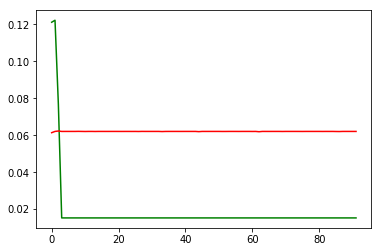

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:16:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2384000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:16:18
INFO:tensorflow:Saving dict for global step 2384000: global_step = 2384000, loss = 0.0022012084
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2384000: ./outputdir/model.ckpt-2384000
error on testset first run {'loss': 0.0022012084, 'global_step': 2384000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2384000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 415.06
INFO:tensorflow:loss = 4.4019544e-10, step = 2388601 (0.241 sec)
INFO:tensorflow:global_step/sec: 423.092
INFO:tensorflow:loss = 7.7688306e-10, step = 2388701 (0.237 sec)
INFO:tensorflow:global_step/sec: 436.295
INFO:tensorflow:loss = 3.5532133e-10, step = 2388801 (0.229 sec)
INFO:tensorflow:global_step/sec: 428.994
INFO:tensorflow:loss = 5.7735067e-12, step = 2388901 (0.233 sec)
INFO:tensorflow:global_step/sec: 394.563
INFO:tensorflow:loss = 4.8685955e-10, step = 2389001 (0.253 sec)
INFO:tensorflow:global_step/sec: 450.826
INFO:tensorflow:loss = 6.5308314e-12, step = 2389101 (0.221 sec)
INFO:tensorflow:global_step/sec: 436.893
INFO:tensorflow:loss = 5.490622e-12, step = 2389201 (0.229 sec)
INFO:tensorflow:global_step/sec: 443.384
INFO:tensorflow:loss = 1.2603932e-11, step = 2389301 (0.225 sec)
INFO:tensorflow:global_step/sec: 432.341
INFO:tensorflow:loss = 1.9713899e-10, step = 2389401 (0.232 sec)
INFO:tensorflow:global_step/sec: 418.693
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2394000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2394000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.987123e-11, step = 2394001
INFO:tensorflow:global_step/sec: 167.506
INFO:tensorflow:loss = 5.3247646e-09, step = 2394101 (0.598 sec)
INFO:tensorflow:global_step/sec: 452.278
INFO:tensorflow:loss = 4.3227533e-09, step = 2394201 (0.221 sec)
INFO:tensorflow:global_step/sec: 437.93
INFO:tensorflow:loss = 8.321984e-09, step = 2394301 (0.228 sec)
INFO:tensorflow:global_step/sec: 434.803
INFO:tensorflow:loss = 7.214229e-11, step = 2394401 (0.230 sec)
INFO:tensorflow:global_step/sec: 419.724
INFO:tensorflow:loss = 8.333195e-10, step = 2394501 (0.239 sec)
INFO:tensorflow:global_step/sec: 445.704
INFO:tensorflow:loss = 6.662614e-09, step = 2394601 (0.224 sec)
INFO:tensorflow:global_step/sec: 438.047
INFO:tensorflow:loss = 1.0276404e-08, step =

INFO:tensorflow:loss = 8.999984e-09, step = 2399901 (0.255 sec)
INFO:tensorflow:Saving checkpoints for 2400000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 8.420829e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2400000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 3.981287968663794e-09
prediction at  8 [array([0.06208799])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2400000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2400000 into ./outputdir/mod

INFO:tensorflow:global_step/sec: 425.587
INFO:tensorflow:loss = 1.7880863e-09, step = 2405201 (0.235 sec)
INFO:tensorflow:global_step/sec: 437.158
INFO:tensorflow:loss = 2.3221714e-08, step = 2405301 (0.229 sec)
INFO:tensorflow:global_step/sec: 437.95
INFO:tensorflow:loss = 2.4758648e-08, step = 2405401 (0.229 sec)
INFO:tensorflow:global_step/sec: 437.821
INFO:tensorflow:loss = 1.0185969e-08, step = 2405501 (0.228 sec)
INFO:tensorflow:global_step/sec: 436.329
INFO:tensorflow:loss = 4.459668e-08, step = 2405601 (0.229 sec)
INFO:tensorflow:global_step/sec: 435.303
INFO:tensorflow:loss = 1.4291328e-07, step = 2405701 (0.230 sec)
INFO:tensorflow:global_step/sec: 425.448
INFO:tensorflow:loss = 5.373411e-08, step = 2405801 (0.235 sec)
INFO:tensorflow:global_step/sec: 411.315
INFO:tensorflow:loss = 2.3699462e-09, step = 2405901 (0.243 sec)
INFO:tensorflow:Saving checkpoints for 2406000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.0059286e-08.
INFO:tensorflow:Calling mod

INFO:tensorflow:loss = 3.412919e-08, step = 2410401 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.326
INFO:tensorflow:loss = 1.6075768e-08, step = 2410501 (0.230 sec)
INFO:tensorflow:global_step/sec: 442.582
INFO:tensorflow:loss = 8.7733156e-08, step = 2410601 (0.226 sec)
INFO:tensorflow:global_step/sec: 455.265
INFO:tensorflow:loss = 2.7945367e-08, step = 2410701 (0.220 sec)
INFO:tensorflow:global_step/sec: 457.499
INFO:tensorflow:loss = 9.823798e-09, step = 2410801 (0.218 sec)
INFO:tensorflow:global_step/sec: 469.087
INFO:tensorflow:loss = 9.531863e-08, step = 2410901 (0.213 sec)
INFO:tensorflow:global_step/sec: 470.334
INFO:tensorflow:loss = 1.1355456e-07, step = 2411001 (0.213 sec)
INFO:tensorflow:global_step/sec: 473.232
INFO:tensorflow:loss = 2.3879707e-07, step = 2411101 (0.211 sec)
INFO:tensorflow:global_step/sec: 455.413
INFO:tensorflow:loss = 1.339577e-07, step = 2411201 (0.220 sec)
INFO:tensorflow:global_step/sec: 453.132
INFO:tensorflow:loss = 3.2405878e-09, step = 24113

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2416000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2416000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.5635771e-07, step = 2416001
INFO:tensorflow:global_step/sec: 166.865
INFO:tensorflow:loss = 3.6885468e-09, step = 2416101 (0.600 sec)
INFO:tensorflow:global_step/sec: 453.689
INFO:tensorflow:loss = 1.4562148e-07, step = 2416201 (0.221 sec)
INFO:tensorflow:global_step/sec: 447.435
INFO:tensorflow:loss = 4.638394e-09, step = 2416301 (0.223 sec)
INFO:tensorflow:global_step/sec: 423.017
INFO:tensorflow:loss = 1.5917797e-07, step = 2416401 (0.237 sec)
INFO:tensorflow:global_step/sec: 406.515
INFO:tensorflow:loss = 3.9720827e-09, step = 2416501 (0.246 sec)
INFO:tensorflow:global_step/sec: 427.172
INFO:tensorflow:loss = 1.

INFO:tensorflow:global_step/sec: 459.337
INFO:tensorflow:loss = 2.4252154e-07, step = 2421801 (0.218 sec)
INFO:tensorflow:global_step/sec: 420.633
INFO:tensorflow:loss = 1.5991603e-07, step = 2421901 (0.238 sec)
INFO:tensorflow:Saving checkpoints for 2422000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.784084e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2422000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 5.647848703739171e-07
prediction at  19 [array([0.0625075])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2422000
I

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2426000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2426000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0032200555, step = 2426001
INFO:tensorflow:global_step/sec: 152.707
INFO:tensorflow:loss = 3.6921805e-10, step = 2426101 (0.656 sec)
INFO:tensorflow:global_step/sec: 451.268
INFO:tensorflow:loss = 5.0788844e-07, step = 2426201 (0.222 sec)
INFO:tensorflow:global_step/sec: 432.603
INFO:tensorflow:loss = 0.0010719518, step = 2426301 (0.231 sec)
INFO:tensorflow:global_step/sec: 433.736
INFO:tensorflow:loss = 2.9265896e-08, step = 2426401 (0.230 sec)
INFO:tensorflow:global_step/sec: 441.474
INFO:tensorflow:loss = 8.398282e-13, step = 2426501 (0.227 sec)
INFO:tensorflow:global_step/sec: 439.176
INFO:tensorflow:loss = 0.01

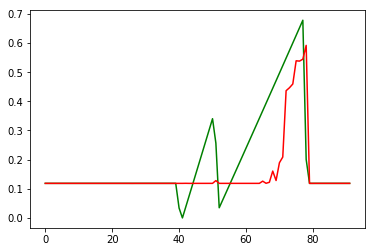

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:19:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2428000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:19:14
INFO:tensorflow:Saving dict for global step 2428000: global_step = 2428000, loss = 0.013157292
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2428000: ./outputdir/model.ckpt-2428000
error on testset first run {'loss': 0.013157292, 'global_step': 2428000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2428000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 388.624
INFO:tensorflow:loss = 0.0006136001, step = 2432601 (0.257 sec)
INFO:tensorflow:global_step/sec: 439.947
INFO:tensorflow:loss = 0.0015787439, step = 2432701 (0.227 sec)
INFO:tensorflow:global_step/sec: 424.079
INFO:tensorflow:loss = 0.00010511906, step = 2432801 (0.236 sec)
INFO:tensorflow:global_step/sec: 420.092
INFO:tensorflow:loss = 0.012835822, step = 2432901 (0.238 sec)
INFO:tensorflow:global_step/sec: 449.343
INFO:tensorflow:loss = 9.0317335e-05, step = 2433001 (0.223 sec)
INFO:tensorflow:global_step/sec: 434.77
INFO:tensorflow:loss = 0.00013555493, step = 2433101 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.132
INFO:tensorflow:loss = 0.019236857, step = 2433201 (0.227 sec)
INFO:tensorflow:global_step/sec: 428.436
INFO:tensorflow:loss = 0.0004638991, step = 2433301 (0.233 sec)
INFO:tensorflow:global_step/sec: 434.796
INFO:tensorflow:loss = 0.0037863692, step = 2433401 (0.230 sec)
INFO:tensorflow:global_step/sec: 444.038
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2438000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00052254956, step = 2438001
INFO:tensorflow:global_step/sec: 163.419
INFO:tensorflow:loss = 0.0013186922, step = 2438101 (0.613 sec)
INFO:tensorflow:global_step/sec: 453.704
INFO:tensorflow:loss = 0.0011021764, step = 2438201 (0.220 sec)
INFO:tensorflow:global_step/sec: 456.794
INFO:tensorflow:loss = 0.00018546433, step = 2438301 (0.219 sec)
INFO:tensorflow:global_step/sec: 439.009
INFO:tensorflow:loss = 0.0005906606, step = 2438401 (0.228 sec)
INFO:tensorflow:global_step/sec: 359.109
INFO:tensorflow:loss = 0.00015469456, step = 2438501 (0.279 sec)
INFO:tensorflow:global_step/sec: 427.84
INFO:tensorflow:loss = 0.004727697, step = 2438601 (0.233 sec)
INFO:tensorflow:global_step/sec: 459.537
INFO:tensorflow:loss = 0.018554194, step = 2438701 (0.218 sec)
INFO:tensorflow:global_step/sec: 451.72
INFO:tensorflo

INFO:tensorflow:Loss for final step: 0.007070596.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2444000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.278774717690112e-06
prediction at  8 [array([0.14750214])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2444000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2444000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.000755881, step = 2444001
INFO:tensorflow:global_step/sec: 158.631
INFO:tensorflow:loss = 1.0202711e-05, st

INFO:tensorflow:loss = 3.1528096e-05, step = 2449301 (0.224 sec)
INFO:tensorflow:global_step/sec: 448.298
INFO:tensorflow:loss = 0.0014797953, step = 2449401 (0.223 sec)
INFO:tensorflow:global_step/sec: 448.545
INFO:tensorflow:loss = 7.5737427e-07, step = 2449501 (0.223 sec)
INFO:tensorflow:global_step/sec: 427.044
INFO:tensorflow:loss = 0.008151398, step = 2449601 (0.234 sec)
INFO:tensorflow:global_step/sec: 446.869
INFO:tensorflow:loss = 0.005026674, step = 2449701 (0.224 sec)
INFO:tensorflow:global_step/sec: 433.618
INFO:tensorflow:loss = 0.0023036231, step = 2449801 (0.231 sec)
INFO:tensorflow:global_step/sec: 433.91
INFO:tensorflow:loss = 1.8157789e-05, step = 2449901 (0.231 sec)
INFO:tensorflow:Saving checkpoints for 2450000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0025704305.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2450

INFO:tensorflow:global_step/sec: 416.464
INFO:tensorflow:loss = 0.00078874675, step = 2454601 (0.240 sec)
INFO:tensorflow:global_step/sec: 393.478
INFO:tensorflow:loss = 7.4050186e-05, step = 2454701 (0.254 sec)
INFO:tensorflow:global_step/sec: 435.644
INFO:tensorflow:loss = 0.0013058903, step = 2454801 (0.230 sec)
INFO:tensorflow:global_step/sec: 442.843
INFO:tensorflow:loss = 0.0005944548, step = 2454901 (0.226 sec)
INFO:tensorflow:global_step/sec: 433.675
INFO:tensorflow:loss = 0.0011333233, step = 2455001 (0.230 sec)
INFO:tensorflow:global_step/sec: 447.371
INFO:tensorflow:loss = 0.0021884972, step = 2455101 (0.224 sec)
INFO:tensorflow:global_step/sec: 436.452
INFO:tensorflow:loss = 0.0072279936, step = 2455201 (0.228 sec)
INFO:tensorflow:global_step/sec: 438.061
INFO:tensorflow:loss = 0.0016897486, step = 2455301 (0.228 sec)
INFO:tensorflow:global_step/sec: 435.516
INFO:tensorflow:loss = 0.004521021, step = 2455401 (0.229 sec)
INFO:tensorflow:global_step/sec: 437.04
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2460000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.004671134, step = 2460001
INFO:tensorflow:global_step/sec: 156.549
INFO:tensorflow:loss = 7.251914e-08, step = 2460101 (0.640 sec)
INFO:tensorflow:global_step/sec: 450.895
INFO:tensorflow:loss = 0.006199082, step = 2460201 (0.221 sec)
INFO:tensorflow:global_step/sec: 423.25
INFO:tensorflow:loss = 2.8340833e-06, step = 2460301 (0.237 sec)
INFO:tensorflow:global_step/sec: 435.358
INFO:tensorflow:loss = 0.006230414, step = 2460401 (0.229 sec)
INFO:tensorflow:global_step/sec: 429.52
INFO:tensorflow:loss = 1.3135696e-05, step = 2460501 (0.233 sec)
INFO:tensorflow:global_step/sec: 414.661
INFO:tensorflow:loss = 0.0063408497, step = 2460601 (0.242 sec)
INFO:tensorflow:global_step/sec: 419.976
INFO:tensorflow:loss = 2.7497836e-05, step = 2460701 (0.238 sec)
INFO:tensorflow:global_step/sec: 369.213
INFO:tensorflow

INFO:tensorflow:Saving checkpoints for 2466000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00032622277.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2466000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 0.0016606889781467552
prediction at  19 [array([0.47402489])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2466000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2466000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.007988203, step = 2466001
I

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2470000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2470000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.050946493, step = 2470001
INFO:tensorflow:global_step/sec: 165.276
INFO:tensorflow:loss = 2.8571587e-06, step = 2470101 (0.606 sec)
INFO:tensorflow:global_step/sec: 448.362
INFO:tensorflow:loss = 4.3086622e-08, step = 2470201 (0.223 sec)
INFO:tensorflow:global_step/sec: 381.844
INFO:tensorflow:loss = 1.9746383e-05, step = 2470301 (0.262 sec)
INFO:tensorflow:global_step/sec: 458.871
INFO:tensorflow:loss = 2.2344122e-06, step = 2470401 (0.218 sec)
INFO:tensorflow:global_step/sec: 399.43
INFO:tensorflow:loss = 8.227285e-06, step = 2470501 (0.251 sec)
INFO:tensorflow:global_step/sec: 449.174
INFO:tensorflow:loss = 0.000

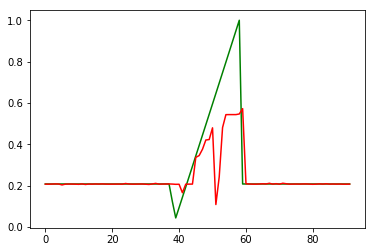

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:22:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2472000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:22:10
INFO:tensorflow:Saving dict for global step 2472000: global_step = 2472000, loss = 0.013645657
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2472000: ./outputdir/model.ckpt-2472000
error on testset first run {'loss': 0.013645657, 'global_step': 2472000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2472000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 441.967
INFO:tensorflow:loss = 1.35264345e-05, step = 2476601 (0.226 sec)
INFO:tensorflow:global_step/sec: 432.26
INFO:tensorflow:loss = 9.358756e-08, step = 2476701 (0.232 sec)
INFO:tensorflow:global_step/sec: 419.23
INFO:tensorflow:loss = 1.7829483e-05, step = 2476801 (0.238 sec)
INFO:tensorflow:global_step/sec: 424.329
INFO:tensorflow:loss = 1.0242595e-06, step = 2476901 (0.236 sec)
INFO:tensorflow:global_step/sec: 441.954
INFO:tensorflow:loss = 1.6970653e-05, step = 2477001 (0.227 sec)
INFO:tensorflow:global_step/sec: 440.061
INFO:tensorflow:loss = 0.00069041835, step = 2477101 (0.227 sec)
INFO:tensorflow:global_step/sec: 445.661
INFO:tensorflow:loss = 1.6976595e-06, step = 2477201 (0.224 sec)
INFO:tensorflow:global_step/sec: 417.695
INFO:tensorflow:loss = 5.299568e-07, step = 2477301 (0.239 sec)
INFO:tensorflow:global_step/sec: 414.516
INFO:tensorflow:loss = 1.313051e-06, step = 2477401 (0.241 sec)
INFO:tensorflow:global_step/sec: 420.727
INFO:tens

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2482000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2482000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.4634537e-06, step = 2482001
INFO:tensorflow:global_step/sec: 161.906
INFO:tensorflow:loss = 8.984218e-08, step = 2482101 (0.618 sec)
INFO:tensorflow:global_step/sec: 450.788
INFO:tensorflow:loss = 2.5987936e-07, step = 2482201 (0.222 sec)
INFO:tensorflow:global_step/sec: 449.363
INFO:tensorflow:loss = 1.7754436e-07, step = 2482301 (0.223 sec)
INFO:tensorflow:global_step/sec: 447.467
INFO:tensorflow:loss = 8.02425e-10, step = 2482401 (0.223 sec)
INFO:tensorflow:global_step/sec: 456.252
INFO:tensorflow:loss = 3.6382062e-06, step = 2482501 (0.219 sec)
INFO:tensorflow:global_step/sec: 466.237
INFO:tensorflow:loss = 6.1476464e-07, step = 2482601 (0.215 sec)
INFO:tensorflow:global_step/sec: 452.071
INFO:tensorflow:loss = 3.0898104e-06, ste

INFO:tensorflow:loss = 3.3775816e-06, step = 2487901 (0.258 sec)
INFO:tensorflow:Saving checkpoints for 2488000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.2600335e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2488000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.1823473562378023e-05
prediction at  8 [array([0.20687381])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2488000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2488000 into ./outputdir/

INFO:tensorflow:global_step/sec: 447.299
INFO:tensorflow:loss = 1.4467442e-06, step = 2493201 (0.223 sec)
INFO:tensorflow:global_step/sec: 431.964
INFO:tensorflow:loss = 3.661537e-07, step = 2493301 (0.232 sec)
INFO:tensorflow:global_step/sec: 451.426
INFO:tensorflow:loss = 1.52525035e-05, step = 2493401 (0.222 sec)
INFO:tensorflow:global_step/sec: 426.567
INFO:tensorflow:loss = 3.6059898e-06, step = 2493501 (0.235 sec)
INFO:tensorflow:global_step/sec: 435.203
INFO:tensorflow:loss = 5.9359695e-06, step = 2493601 (0.230 sec)
INFO:tensorflow:global_step/sec: 389.193
INFO:tensorflow:loss = 1.2577091e-06, step = 2493701 (0.257 sec)
INFO:tensorflow:global_step/sec: 393.941
INFO:tensorflow:loss = 9.642874e-06, step = 2493801 (0.254 sec)
INFO:tensorflow:global_step/sec: 398.44
INFO:tensorflow:loss = 1.3361346e-06, step = 2493901 (0.251 sec)
INFO:tensorflow:Saving checkpoints for 2494000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.5278587e-06.
INFO:tensorflow:Calling mo

INFO:tensorflow:loss = 7.846936e-07, step = 2498401 (0.235 sec)
INFO:tensorflow:global_step/sec: 400.607
INFO:tensorflow:loss = 3.4485508e-06, step = 2498501 (0.250 sec)
INFO:tensorflow:global_step/sec: 422.105
INFO:tensorflow:loss = 5.4020843e-06, step = 2498601 (0.237 sec)
INFO:tensorflow:global_step/sec: 427.729
INFO:tensorflow:loss = 8.066781e-07, step = 2498701 (0.233 sec)
INFO:tensorflow:global_step/sec: 443.534
INFO:tensorflow:loss = 1.623625e-07, step = 2498801 (0.226 sec)
INFO:tensorflow:global_step/sec: 431.719
INFO:tensorflow:loss = 6.255841e-07, step = 2498901 (0.231 sec)
INFO:tensorflow:global_step/sec: 432.555
INFO:tensorflow:loss = 3.7906373e-06, step = 2499001 (0.231 sec)
INFO:tensorflow:global_step/sec: 456.848
INFO:tensorflow:loss = 1.2836388e-05, step = 2499101 (0.219 sec)
INFO:tensorflow:global_step/sec: 440.036
INFO:tensorflow:loss = 1.6550227e-06, step = 2499201 (0.227 sec)
INFO:tensorflow:global_step/sec: 433.956
INFO:tensorflow:loss = 3.0667513e-06, step = 24993

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2504000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2504000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.092191e-06, step = 2504001
INFO:tensorflow:global_step/sec: 165.93
INFO:tensorflow:loss = 1.5203908e-06, step = 2504101 (0.604 sec)
INFO:tensorflow:global_step/sec: 472.2
INFO:tensorflow:loss = 2.268198e-07, step = 2504201 (0.212 sec)
INFO:tensorflow:global_step/sec: 440.828
INFO:tensorflow:loss = 1.4473537e-06, step = 2504301 (0.227 sec)
INFO:tensorflow:global_step/sec: 435.305
INFO:tensorflow:loss = 1.2283294e-07, step = 2504401 (0.230 sec)
INFO:tensorflow:global_step/sec: 472.068
INFO:tensorflow:loss = 1.4840832e-06, step = 2504501 (0.212 sec)
INFO:tensorflow:global_step/sec: 416.03
INFO:tensorflow:loss = 1.10113

INFO:tensorflow:global_step/sec: 456.231
INFO:tensorflow:loss = 1.4138572e-05, step = 2509801 (0.219 sec)
INFO:tensorflow:global_step/sec: 456.903
INFO:tensorflow:loss = 3.5479192e-07, step = 2509901 (0.219 sec)
INFO:tensorflow:Saving checkpoints for 2510000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.876579e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2510000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 9.578636829228345e-07
prediction at  19 [array([0.20740772])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2510000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2514000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2514000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.014610755, step = 2514001
INFO:tensorflow:global_step/sec: 165.595
INFO:tensorflow:loss = 1.6942053e-10, step = 2514101 (0.605 sec)
INFO:tensorflow:global_step/sec: 462.186
INFO:tensorflow:loss = 9.0381924e-11, step = 2514201 (0.217 sec)
INFO:tensorflow:global_step/sec: 451.347
INFO:tensorflow:loss = 0.21125656, step = 2514301 (0.222 sec)
INFO:tensorflow:global_step/sec: 444.504
INFO:tensorflow:loss = 4.7477997e-06, step = 2514401 (0.224 sec)
INFO:tensorflow:global_step/sec: 441.575
INFO:tensorflow:loss = 7.5543577e-10, step = 2514501 (0.226 sec)
INFO:tensorflow:global_step/sec: 440.451
INFO:tensorflow:loss = 1.6806

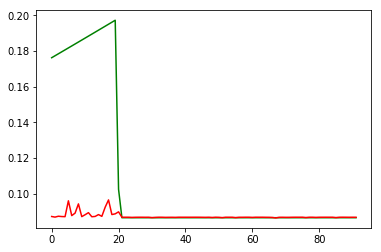

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:25:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2516000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:25:06
INFO:tensorflow:Saving dict for global step 2516000: global_step = 2516000, loss = 0.0020364746
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2516000: ./outputdir/model.ckpt-2516000
error on testset first run {'loss': 0.0020364746, 'global_step': 2516000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2516000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 414.303
INFO:tensorflow:loss = 6.598791e-08, step = 2520601 (0.241 sec)
INFO:tensorflow:global_step/sec: 422.18
INFO:tensorflow:loss = 7.049497e-08, step = 2520701 (0.237 sec)
INFO:tensorflow:global_step/sec: 418.599
INFO:tensorflow:loss = 1.00525614e-08, step = 2520801 (0.238 sec)
INFO:tensorflow:global_step/sec: 430.152
INFO:tensorflow:loss = 3.7948162e-08, step = 2520901 (0.232 sec)
INFO:tensorflow:global_step/sec: 444.239
INFO:tensorflow:loss = 1.865113e-08, step = 2521001 (0.225 sec)
INFO:tensorflow:global_step/sec: 376.195
INFO:tensorflow:loss = 9.286869e-08, step = 2521101 (0.267 sec)
INFO:tensorflow:global_step/sec: 416.889
INFO:tensorflow:loss = 5.6896363e-09, step = 2521201 (0.239 sec)
INFO:tensorflow:global_step/sec: 430.63
INFO:tensorflow:loss = 1.1674439e-08, step = 2521301 (0.232 sec)
INFO:tensorflow:global_step/sec: 421.967
INFO:tensorflow:loss = 8.0090615e-08, step = 2521401 (0.237 sec)
INFO:tensorflow:global_step/sec: 432.018
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2526000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.1150958e-07, step = 2526001
INFO:tensorflow:global_step/sec: 165.134
INFO:tensorflow:loss = 3.5713899e-09, step = 2526101 (0.606 sec)
INFO:tensorflow:global_step/sec: 458.44
INFO:tensorflow:loss = 8.718231e-10, step = 2526201 (0.218 sec)
INFO:tensorflow:global_step/sec: 450.493
INFO:tensorflow:loss = 7.90901e-08, step = 2526301 (0.222 sec)
INFO:tensorflow:global_step/sec: 468.375
INFO:tensorflow:loss = 1.1881435e-10, step = 2526401 (0.213 sec)
INFO:tensorflow:global_step/sec: 407.658
INFO:tensorflow:loss = 1.0171131e-07, step = 2526501 (0.245 sec)
INFO:tensorflow:global_step/sec: 463.542
INFO:tensorflow:loss = 8.107196e-08, step = 2526601 (0.216 sec)
INFO:tensorflow:global_step/sec: 433.264
INFO:tensorflow:loss = 7.967367e-08, step = 2526701 (0.231 sec)
INFO:tensorflow:global_step/sec: 434.56
INFO:tensorf

INFO:tensorflow:Saving checkpoints for 2532000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.283556e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2532000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 3.597759977078193e-08
prediction at  8 [array([0.08676266])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2532000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2532000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.163692e-09, step = 2532001
INF

INFO:tensorflow:loss = 1.9327362e-07, step = 2537201 (0.229 sec)
INFO:tensorflow:global_step/sec: 427.688
INFO:tensorflow:loss = 4.6170055e-07, step = 2537301 (0.233 sec)
INFO:tensorflow:global_step/sec: 438.356
INFO:tensorflow:loss = 5.4477585e-08, step = 2537401 (0.229 sec)
INFO:tensorflow:global_step/sec: 430.374
INFO:tensorflow:loss = 5.8651697e-08, step = 2537501 (0.232 sec)
INFO:tensorflow:global_step/sec: 419.762
INFO:tensorflow:loss = 1.1915569e-08, step = 2537601 (0.238 sec)
INFO:tensorflow:global_step/sec: 425.702
INFO:tensorflow:loss = 6.8407613e-09, step = 2537701 (0.235 sec)
INFO:tensorflow:global_step/sec: 430.873
INFO:tensorflow:loss = 5.398483e-08, step = 2537801 (0.232 sec)
INFO:tensorflow:global_step/sec: 427.409
INFO:tensorflow:loss = 1.5495559e-07, step = 2537901 (0.234 sec)
INFO:tensorflow:Saving checkpoints for 2538000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.6358127e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling mod

INFO:tensorflow:global_step/sec: 432.094
INFO:tensorflow:loss = 1.3157415e-07, step = 2542501 (0.232 sec)
INFO:tensorflow:global_step/sec: 427.002
INFO:tensorflow:loss = 2.5307973e-08, step = 2542601 (0.234 sec)
INFO:tensorflow:global_step/sec: 436.586
INFO:tensorflow:loss = 2.957622e-07, step = 2542701 (0.229 sec)
INFO:tensorflow:global_step/sec: 450.916
INFO:tensorflow:loss = 2.3255787e-08, step = 2542801 (0.222 sec)
INFO:tensorflow:global_step/sec: 427.434
INFO:tensorflow:loss = 6.097859e-07, step = 2542901 (0.234 sec)
INFO:tensorflow:global_step/sec: 461.677
INFO:tensorflow:loss = 6.8318906e-07, step = 2543001 (0.217 sec)
INFO:tensorflow:global_step/sec: 450.317
INFO:tensorflow:loss = 1.590472e-07, step = 2543101 (0.222 sec)
INFO:tensorflow:global_step/sec: 452.043
INFO:tensorflow:loss = 5.845338e-08, step = 2543201 (0.221 sec)
INFO:tensorflow:global_step/sec: 428.471
INFO:tensorflow:loss = 6.256174e-08, step = 2543301 (0.234 sec)
INFO:tensorflow:global_step/sec: 446.774
INFO:tenso

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2548000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2548000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.6583574e-09, step = 2548001
INFO:tensorflow:global_step/sec: 164.555
INFO:tensorflow:loss = 1.1721661e-06, step = 2548101 (0.609 sec)
INFO:tensorflow:global_step/sec: 474.735
INFO:tensorflow:loss = 2.2522583e-07, step = 2548201 (0.211 sec)
INFO:tensorflow:global_step/sec: 437.09
INFO:tensorflow:loss = 6.601471e-08, step = 2548301 (0.229 sec)
INFO:tensorflow:global_step/sec: 430.773
INFO:tensorflow:loss = 1.8472305e-07, step = 2548401 (0.232 sec)
INFO:tensorflow:global_step/sec: 426.246
INFO:tensorflow:loss = 6.6083636e-08, step = 2548501 (0.234 sec)
INFO:tensorflow:global_step/sec: 420.72
INFO:tensorflow:loss = 1.8391697e-07, step = 2548601 (0.238 sec)
I

INFO:tensorflow:loss = 1.9910807e-07, step = 2553801 (0.226 sec)
INFO:tensorflow:global_step/sec: 422.392
INFO:tensorflow:loss = 1.6970284e-07, step = 2553901 (0.237 sec)
INFO:tensorflow:Saving checkpoints for 2554000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.5946942e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2554000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.7986362583755887e-07
prediction at  19 [array([0.08666222])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2554000
INFO:tensorflow:Running local_init_op.


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2558000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2558000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0058340933, step = 2558001
INFO:tensorflow:global_step/sec: 160.667
INFO:tensorflow:loss = 2.0532356e-05, step = 2558101 (0.623 sec)
INFO:tensorflow:global_step/sec: 461.434
INFO:tensorflow:loss = 8.7175266e-07, step = 2558201 (0.217 sec)
INFO:tensorflow:global_step/sec: 422.039
INFO:tensorflow:loss = 9.94736e-07, step = 2558301 (0.238 sec)
INFO:tensorflow:global_step/sec: 413.07
INFO:tensorflow:loss = 2.2462513e-07, step = 2558401 (0.241 sec)
INFO:tensorflow:global_step/sec: 443.208
INFO:tensorflow:loss = 8.363937e-06, step = 2558501 (0.226 sec)
INFO:tensorflow:global_step/sec: 431.064
INFO:tensorflow:loss = 2.5556

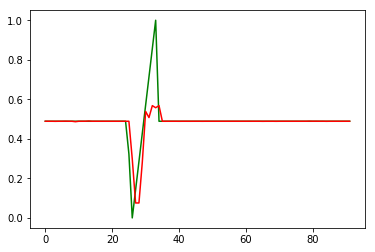

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:28:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2560000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:28:02
INFO:tensorflow:Saving dict for global step 2560000: global_step = 2560000, loss = 0.0053558233
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2560000: ./outputdir/model.ckpt-2560000
error on testset first run {'loss': 0.0053558233, 'global_step': 2560000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2560000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 404.225
INFO:tensorflow:loss = 9.4160555e-09, step = 2564601 (0.248 sec)
INFO:tensorflow:global_step/sec: 441.86
INFO:tensorflow:loss = 1.393113e-07, step = 2564701 (0.226 sec)
INFO:tensorflow:global_step/sec: 435.893
INFO:tensorflow:loss = 6.3373136e-08, step = 2564801 (0.230 sec)
INFO:tensorflow:global_step/sec: 419.967
INFO:tensorflow:loss = 1.3453828e-08, step = 2564901 (0.238 sec)
INFO:tensorflow:global_step/sec: 426.236
INFO:tensorflow:loss = 3.2503502e-09, step = 2565001 (0.234 sec)
INFO:tensorflow:global_step/sec: 381.966
INFO:tensorflow:loss = 1.2209872e-05, step = 2565101 (0.262 sec)
INFO:tensorflow:global_step/sec: 425.073
INFO:tensorflow:loss = 2.372075e-06, step = 2565201 (0.235 sec)
INFO:tensorflow:global_step/sec: 414.636
INFO:tensorflow:loss = 1.0812523e-06, step = 2565301 (0.241 sec)
INFO:tensorflow:global_step/sec: 420.647
INFO:tensorflow:loss = 9.967582e-11, step = 2565401 (0.237 sec)
INFO:tensorflow:global_step/sec: 392.91
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2570000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2570000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.027282e-07, step = 2570001
INFO:tensorflow:global_step/sec: 166.103
INFO:tensorflow:loss = 2.7331183e-07, step = 2570101 (0.604 sec)
INFO:tensorflow:global_step/sec: 439.352
INFO:tensorflow:loss = 9.7309716e-11, step = 2570201 (0.227 sec)
INFO:tensorflow:global_step/sec: 434.954
INFO:tensorflow:loss = 5.2446048e-11, step = 2570301 (0.230 sec)
INFO:tensorflow:global_step/sec: 448.716
INFO:tensorflow:loss = 2.2686667e-08, step = 2570401 (0.223 sec)
INFO:tensorflow:global_step/sec: 429.633
INFO:tensorflow:loss = 1.5922158e-08, step = 2570501 (0.233 sec)
INFO:tensorflow:global_step/sec: 430.593
INFO:tensorflow:loss = 3.6425277e-08, step = 2570601 (0.232 sec)
INFO:tensorflow:global_step/sec: 439.406
INFO:tensorflow:loss = 2.6905946e-07, s

INFO:tensorflow:loss = 8.5300655e-12, step = 2575901 (0.223 sec)
INFO:tensorflow:Saving checkpoints for 2576000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.8966142e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2576000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.1860450031326158e-07
prediction at  8 [array([0.48920823])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2576000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2576000 into ./outputdir/

INFO:tensorflow:global_step/sec: 424.268
INFO:tensorflow:loss = 5.9342998e-08, step = 2581201 (0.236 sec)
INFO:tensorflow:global_step/sec: 447.311
INFO:tensorflow:loss = 3.4623463e-07, step = 2581301 (0.224 sec)
INFO:tensorflow:global_step/sec: 436.466
INFO:tensorflow:loss = 5.0641802e-08, step = 2581401 (0.229 sec)
INFO:tensorflow:global_step/sec: 428.829
INFO:tensorflow:loss = 2.4862456e-07, step = 2581501 (0.233 sec)
INFO:tensorflow:global_step/sec: 440.426
INFO:tensorflow:loss = 6.9250294e-10, step = 2581601 (0.227 sec)
INFO:tensorflow:global_step/sec: 426.94
INFO:tensorflow:loss = 6.9250294e-10, step = 2581701 (0.234 sec)
INFO:tensorflow:global_step/sec: 433.681
INFO:tensorflow:loss = 8.5841165e-08, step = 2581801 (0.231 sec)
INFO:tensorflow:global_step/sec: 415.169
INFO:tensorflow:loss = 5.870584e-08, step = 2581901 (0.241 sec)
INFO:tensorflow:Saving checkpoints for 2582000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.8779706e-07.
INFO:tensorflow:Calling mo

INFO:tensorflow:loss = 1.7675212e-08, step = 2586401 (0.225 sec)
INFO:tensorflow:global_step/sec: 447.51
INFO:tensorflow:loss = 1.5265309e-07, step = 2586501 (0.223 sec)
INFO:tensorflow:global_step/sec: 406.231
INFO:tensorflow:loss = 8.170432e-09, step = 2586601 (0.246 sec)
INFO:tensorflow:global_step/sec: 440.498
INFO:tensorflow:loss = 1.2013226e-07, step = 2586701 (0.227 sec)
INFO:tensorflow:global_step/sec: 457.549
INFO:tensorflow:loss = 1.9453239e-08, step = 2586801 (0.219 sec)
INFO:tensorflow:global_step/sec: 438.856
INFO:tensorflow:loss = 3.5879725e-07, step = 2586901 (0.228 sec)
INFO:tensorflow:global_step/sec: 465.497
INFO:tensorflow:loss = 4.12434e-07, step = 2587001 (0.215 sec)
INFO:tensorflow:global_step/sec: 442.894
INFO:tensorflow:loss = 1.5079573e-07, step = 2587101 (0.226 sec)
INFO:tensorflow:global_step/sec: 440.41
INFO:tensorflow:loss = 1.0919598e-07, step = 2587201 (0.227 sec)
INFO:tensorflow:global_step/sec: 444.651
INFO:tensorflow:loss = 1.9083132e-07, step = 258730

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2592000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2592000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.8807685e-08, step = 2592001
INFO:tensorflow:global_step/sec: 162.63
INFO:tensorflow:loss = 1.6020082e-06, step = 2592101 (0.616 sec)
INFO:tensorflow:global_step/sec: 439.886
INFO:tensorflow:loss = 4.562995e-07, step = 2592201 (0.227 sec)
INFO:tensorflow:global_step/sec: 426.812
INFO:tensorflow:loss = 2.251641e-08, step = 2592301 (0.234 sec)
INFO:tensorflow:global_step/sec: 432.792
INFO:tensorflow:loss = 4.051931e-07, step = 2592401 (0.231 sec)
INFO:tensorflow:global_step/sec: 443.111
INFO:tensorflow:loss = 1.7367515e-08, step = 2592501 (0.225 sec)
INFO:tensorflow:global_step/sec: 428.278
INFO:tensorflow:loss = 3.457

INFO:tensorflow:global_step/sec: 425.031
INFO:tensorflow:loss = 3.0595402e-07, step = 2597801 (0.235 sec)
INFO:tensorflow:global_step/sec: 402.067
INFO:tensorflow:loss = 7.06315e-09, step = 2597901 (0.249 sec)
INFO:tensorflow:Saving checkpoints for 2598000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 7.178267e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2598000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.048420044066539e-07
prediction at  19 [array([0.48948819])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2598000
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2602000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2602000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.015120386, step = 2602001
INFO:tensorflow:global_step/sec: 162.634
INFO:tensorflow:loss = 9.94195e-10, step = 2602101 (0.616 sec)
INFO:tensorflow:global_step/sec: 414.786
INFO:tensorflow:loss = 1.9745456e-05, step = 2602201 (0.241 sec)
INFO:tensorflow:global_step/sec: 443.49
INFO:tensorflow:loss = 5.1123698e-05, step = 2602301 (0.225 sec)
INFO:tensorflow:global_step/sec: 430.376
INFO:tensorflow:loss = 1.4961069e-05, step = 2602401 (0.232 sec)
INFO:tensorflow:global_step/sec: 430.249
INFO:tensorflow:loss = 2.7853275e-08, step = 2602501 (0.233 sec)
INFO:tensorflow:global_step/sec: 411.926
INFO:tensorflow:loss = 3.5363

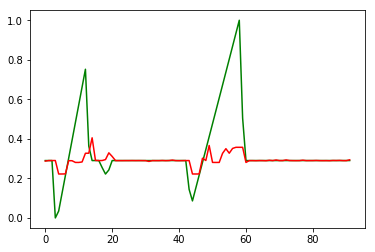

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:30:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2604000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:30:59
INFO:tensorflow:Saving dict for global step 2604000: global_step = 2604000, loss = 0.02537202
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2604000: ./outputdir/model.ckpt-2604000
error on testset first run {'loss': 0.02537202, 'global_step': 2604000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2604000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:global_step/sec: 402.551
INFO:tensorflow:loss = 9.695604e-06, step = 2608601 (0.248 sec)
INFO:tensorflow:global_step/sec: 444.711
INFO:tensorflow:loss = 3.3436787e-05, step = 2608701 (0.225 sec)
INFO:tensorflow:global_step/sec: 463.158
INFO:tensorflow:loss = 4.429635e-06, step = 2608801 (0.216 sec)
INFO:tensorflow:global_step/sec: 455.344
INFO:tensorflow:loss = 7.1581434e-07, step = 2608901 (0.220 sec)
INFO:tensorflow:global_step/sec: 436.192
INFO:tensorflow:loss = 3.024365e-07, step = 2609001 (0.229 sec)
INFO:tensorflow:global_step/sec: 446.565
INFO:tensorflow:loss = 0.00031140813, step = 2609101 (0.224 sec)
INFO:tensorflow:global_step/sec: 452.322
INFO:tensorflow:loss = 8.122015e-09, step = 2609201 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.001
INFO:tensorflow:loss = 1.4487639e-05, step = 2609301 (0.221 sec)
INFO:tensorflow:global_step/sec: 431.155
INFO:tensorflow:loss = 1.0407332e-06, step = 2609401 (0.232 sec)
INFO:tensorflow:global_step/sec: 430.803
INFO:tens

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2614000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2614000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.1026156e-06, step = 2614001
INFO:tensorflow:global_step/sec: 165.806
INFO:tensorflow:loss = 8.987265e-07, step = 2614101 (0.604 sec)
INFO:tensorflow:global_step/sec: 451.274
INFO:tensorflow:loss = 1.8741596e-06, step = 2614201 (0.222 sec)
INFO:tensorflow:global_step/sec: 454.265
INFO:tensorflow:loss = 1.7973356e-05, step = 2614301 (0.220 sec)
INFO:tensorflow:global_step/sec: 450.588
INFO:tensorflow:loss = 3.1294885e-06, step = 2614401 (0.222 sec)
INFO:tensorflow:global_step/sec: 451.107
INFO:tensorflow:loss = 1.3416066e-05, step = 2614501 (0.222 sec)
INFO:tensorflow:global_step/sec: 424.315
INFO:tensorflow:loss = 3.091749e-12, step = 2614601 (0.235 sec)
INFO:tensorflow:global_step/sec: 395.388
INFO:tensorflow:loss = 1.2493082e-07, st

INFO:tensorflow:global_step/sec: 446.371
INFO:tensorflow:loss = 1.7372504e-05, step = 2619901 (0.224 sec)
INFO:tensorflow:Saving checkpoints for 2620000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.113112e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2620000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.9529845507449314e-06
prediction at  8 [array([0.29068035])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2620000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving c

INFO:tensorflow:loss = 5.604334e-06, step = 2625101 (0.258 sec)
INFO:tensorflow:global_step/sec: 444.306
INFO:tensorflow:loss = 3.3456094e-05, step = 2625201 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.046
INFO:tensorflow:loss = 2.6676248e-06, step = 2625301 (0.226 sec)
INFO:tensorflow:global_step/sec: 444.357
INFO:tensorflow:loss = 7.951644e-06, step = 2625401 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.929
INFO:tensorflow:loss = 9.2302835e-06, step = 2625501 (0.230 sec)
INFO:tensorflow:global_step/sec: 432.182
INFO:tensorflow:loss = 1.5205378e-06, step = 2625601 (0.231 sec)
INFO:tensorflow:global_step/sec: 416.413
INFO:tensorflow:loss = 3.279281e-06, step = 2625701 (0.240 sec)
INFO:tensorflow:global_step/sec: 438.673
INFO:tensorflow:loss = 4.6897617e-06, step = 2625801 (0.228 sec)
INFO:tensorflow:global_step/sec: 423.058
INFO:tensorflow:loss = 3.671679e-05, step = 2625901 (0.237 sec)
INFO:tensorflow:Saving checkpoints for 2626000 into ./outputdir/model.ckpt.
INFO:tensorflow

INFO:tensorflow:global_step/sec: 440.117
INFO:tensorflow:loss = 1.3100723e-07, step = 2630401 (0.227 sec)
INFO:tensorflow:global_step/sec: 448.131
INFO:tensorflow:loss = 1.8419826e-07, step = 2630501 (0.223 sec)
INFO:tensorflow:global_step/sec: 450.846
INFO:tensorflow:loss = 4.1346817e-07, step = 2630601 (0.222 sec)
INFO:tensorflow:global_step/sec: 453.466
INFO:tensorflow:loss = 2.9686373e-05, step = 2630701 (0.220 sec)
INFO:tensorflow:global_step/sec: 445.026
INFO:tensorflow:loss = 3.129167e-07, step = 2630801 (0.225 sec)
INFO:tensorflow:global_step/sec: 444.502
INFO:tensorflow:loss = 4.571051e-07, step = 2630901 (0.224 sec)
INFO:tensorflow:global_step/sec: 442.261
INFO:tensorflow:loss = 1.3260944e-08, step = 2631001 (0.226 sec)
INFO:tensorflow:global_step/sec: 454.936
INFO:tensorflow:loss = 3.12306e-06, step = 2631101 (0.220 sec)
INFO:tensorflow:global_step/sec: 452.071
INFO:tensorflow:loss = 3.4507095e-06, step = 2631201 (0.221 sec)
INFO:tensorflow:global_step/sec: 449.709
INFO:tens

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2636000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2636000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.2564326e-07, step = 2636001
INFO:tensorflow:global_step/sec: 161.658
INFO:tensorflow:loss = 1.9116214e-05, step = 2636101 (0.620 sec)
INFO:tensorflow:global_step/sec: 440.312
INFO:tensorflow:loss = 6.058361e-08, step = 2636201 (0.227 sec)
INFO:tensorflow:global_step/sec: 447.688
INFO:tensorflow:loss = 1.967771e-05, step = 2636301 (0.224 sec)
INFO:tensorflow:global_step/sec: 451.397
INFO:tensorflow:loss = 3.9006245e-08, step = 2636401 (0.221 sec)
INFO:tensorflow:global_step/sec: 422.851
INFO:tensorflow:loss = 1.984862e-05, step = 2636501 (0.237 sec)
INFO:tensorflow:global_step/sec: 433.253
INFO:tensorflow:loss = 5.40

INFO:tensorflow:global_step/sec: 433.462
INFO:tensorflow:loss = 7.500005e-07, step = 2641801 (0.231 sec)
INFO:tensorflow:global_step/sec: 415.034
INFO:tensorflow:loss = 1.5473348e-06, step = 2641901 (0.242 sec)
INFO:tensorflow:Saving checkpoints for 2642000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.1559445e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2642000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 3.3450764472045353e-07
prediction at  19 [array([0.29045257])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2642000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2646000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2646000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.17542917, step = 2646001
INFO:tensorflow:global_step/sec: 163.202
INFO:tensorflow:loss = 5.054795e-06, step = 2646101 (0.614 sec)
INFO:tensorflow:global_step/sec: 450.554
INFO:tensorflow:loss = 4.587346e-05, step = 2646201 (0.222 sec)
INFO:tensorflow:global_step/sec: 455.72
INFO:tensorflow:loss = 1.7985613e-08, step = 2646301 (0.219 sec)
INFO:tensorflow:global_step/sec: 445.099
INFO:tensorflow:loss = 1.7014281e-06, step = 2646401 (0.225 sec)
INFO:tensorflow:global_step/sec: 443.656
INFO:tensorflow:loss = 3.0938455e-08, step = 2646501 (0.225 sec)
INFO:tensorflow:global_step/sec: 436.687
INFO:tensorflow:loss = 1.92873

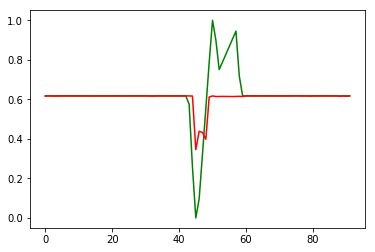

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:33:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2648000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:33:55
INFO:tensorflow:Saving dict for global step 2648000: global_step = 2648000, loss = 0.010539376
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2648000: ./outputdir/model.ckpt-2648000
error on testset first run {'loss': 0.010539376, 'global_step': 2648000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2648000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 434.45
INFO:tensorflow:loss = 1.0321763e-05, step = 2652601 (0.230 sec)
INFO:tensorflow:global_step/sec: 389.365
INFO:tensorflow:loss = 1.1289421e-05, step = 2652701 (0.257 sec)
INFO:tensorflow:global_step/sec: 438.245
INFO:tensorflow:loss = 7.689787e-06, step = 2652801 (0.228 sec)
INFO:tensorflow:global_step/sec: 449.311
INFO:tensorflow:loss = 3.88188e-07, step = 2652901 (0.223 sec)
INFO:tensorflow:global_step/sec: 448.653
INFO:tensorflow:loss = 8.0936246e-08, step = 2653001 (0.223 sec)
INFO:tensorflow:global_step/sec: 443.513
INFO:tensorflow:loss = 1.5467649e-05, step = 2653101 (0.225 sec)
INFO:tensorflow:global_step/sec: 454.996
INFO:tensorflow:loss = 4.796595e-06, step = 2653201 (0.220 sec)
INFO:tensorflow:global_step/sec: 449.069
INFO:tensorflow:loss = 6.6039956e-07, step = 2653301 (0.222 sec)
INFO:tensorflow:global_step/sec: 452.564
INFO:tensorflow:loss = 1.3093995e-06, step = 2653401 (0.221 sec)
INFO:tensorflow:global_step/sec: 450.059
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2658000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2658000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.894741e-08, step = 2658001
INFO:tensorflow:global_step/sec: 166.766
INFO:tensorflow:loss = 2.1940573e-06, step = 2658101 (0.600 sec)
INFO:tensorflow:global_step/sec: 444.705
INFO:tensorflow:loss = 1.046152e-06, step = 2658201 (0.225 sec)
INFO:tensorflow:global_step/sec: 441.118
INFO:tensorflow:loss = 9.444287e-06, step = 2658301 (0.227 sec)
INFO:tensorflow:global_step/sec: 431.854
INFO:tensorflow:loss = 3.5784105e-05, step = 2658401 (0.232 sec)
INFO:tensorflow:global_step/sec: 419.595
INFO:tensorflow:loss = 1.3791927e-06, step = 2658501 (0.239 sec)
INFO:tensorflow:global_step/sec: 417.566
INFO:tensorflow:loss = 1.4213697e-06, step = 2658601 (0.239 sec)
INFO:tensorflow:global_step/sec: 433.131
INFO:tensorflow:loss = 8.66639e-06, step 

INFO:tensorflow:loss = 4.60969e-06, step = 2663901 (0.232 sec)
INFO:tensorflow:Saving checkpoints for 2664000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.88998e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2664000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.518181877945606e-10
prediction at  8 [array([0.61599598])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2664000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2664000 into ./outputdir/model

INFO:tensorflow:global_step/sec: 448.574
INFO:tensorflow:loss = 4.650732e-06, step = 2669201 (0.223 sec)
INFO:tensorflow:global_step/sec: 431.464
INFO:tensorflow:loss = 1.4088904e-06, step = 2669301 (0.232 sec)
INFO:tensorflow:global_step/sec: 427.051
INFO:tensorflow:loss = 5.1022744e-07, step = 2669401 (0.235 sec)
INFO:tensorflow:global_step/sec: 375.281
INFO:tensorflow:loss = 1.0455858e-07, step = 2669501 (0.266 sec)
INFO:tensorflow:global_step/sec: 402.287
INFO:tensorflow:loss = 2.0720765e-07, step = 2669601 (0.248 sec)
INFO:tensorflow:global_step/sec: 415.697
INFO:tensorflow:loss = 2.38535e-07, step = 2669701 (0.241 sec)
INFO:tensorflow:global_step/sec: 409.736
INFO:tensorflow:loss = 3.1386687e-06, step = 2669801 (0.244 sec)
INFO:tensorflow:global_step/sec: 403.979
INFO:tensorflow:loss = 4.824048e-06, step = 2669901 (0.248 sec)
INFO:tensorflow:Saving checkpoints for 2670000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.8832621e-06.
INFO:tensorflow:Calling mode

INFO:tensorflow:loss = 6.048877e-05, step = 2674401 (0.251 sec)
INFO:tensorflow:global_step/sec: 440.116
INFO:tensorflow:loss = 6.3929534e-08, step = 2674501 (0.227 sec)
INFO:tensorflow:global_step/sec: 402.704
INFO:tensorflow:loss = 2.687717e-06, step = 2674601 (0.248 sec)
INFO:tensorflow:global_step/sec: 449.248
INFO:tensorflow:loss = 5.3851268e-06, step = 2674701 (0.223 sec)
INFO:tensorflow:global_step/sec: 454.159
INFO:tensorflow:loss = 1.0352424e-05, step = 2674801 (0.220 sec)
INFO:tensorflow:global_step/sec: 436.987
INFO:tensorflow:loss = 1.787547e-06, step = 2674901 (0.229 sec)
INFO:tensorflow:global_step/sec: 462.941
INFO:tensorflow:loss = 3.6071217e-06, step = 2675001 (0.216 sec)
INFO:tensorflow:global_step/sec: 443.806
INFO:tensorflow:loss = 1.1550475e-06, step = 2675101 (0.226 sec)
INFO:tensorflow:global_step/sec: 432.008
INFO:tensorflow:loss = 2.4164365e-08, step = 2675201 (0.231 sec)
INFO:tensorflow:global_step/sec: 425.203
INFO:tensorflow:loss = 1.4284847e-06, step = 2675

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2680000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2680000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.1637676e-07, step = 2680001
INFO:tensorflow:global_step/sec: 163.86
INFO:tensorflow:loss = 4.123381e-06, step = 2680101 (0.611 sec)
INFO:tensorflow:global_step/sec: 462.807
INFO:tensorflow:loss = 1.1277008e-07, step = 2680201 (0.216 sec)
INFO:tensorflow:global_step/sec: 453.577
INFO:tensorflow:loss = 4.1885105e-06, step = 2680301 (0.220 sec)
INFO:tensorflow:global_step/sec: 454.663
INFO:tensorflow:loss = 1.0567943e-07, step = 2680401 (0.220 sec)
INFO:tensorflow:global_step/sec: 443.457
INFO:tensorflow:loss = 4.2553797e-06, step = 2680501 (0.225 sec)
INFO:tensorflow:global_step/sec: 447.131
INFO:tensorflow:loss = 9.8

INFO:tensorflow:global_step/sec: 417.493
INFO:tensorflow:loss = 5.436252e-07, step = 2685801 (0.239 sec)
INFO:tensorflow:global_step/sec: 412.5
INFO:tensorflow:loss = 3.4903505e-06, step = 2685901 (0.243 sec)
INFO:tensorflow:Saving checkpoints for 2686000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.4353318e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2686000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 5.021934082526208e-08
prediction at  19 [array([0.61643717])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2686000
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2690000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2690000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.1352894, step = 2690001
INFO:tensorflow:global_step/sec: 157.978
INFO:tensorflow:loss = 3.5573996e-06, step = 2690101 (0.634 sec)
INFO:tensorflow:global_step/sec: 447.041
INFO:tensorflow:loss = 0.0011149294, step = 2690201 (0.224 sec)
INFO:tensorflow:global_step/sec: 430.608
INFO:tensorflow:loss = 4.1879616e-08, step = 2690301 (0.232 sec)
INFO:tensorflow:global_step/sec: 441.197
INFO:tensorflow:loss = 9.817596e-07, step = 2690401 (0.227 sec)
INFO:tensorflow:global_step/sec: 409.957
INFO:tensorflow:loss = 0.022766927, step = 2690501 (0.244 sec)
INFO:tensorflow:global_step/sec: 418.994
INFO:tensorflow:loss = 8.214895e

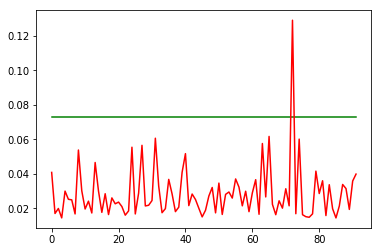

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:36:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2692000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:36:51
INFO:tensorflow:Saving dict for global step 2692000: global_step = 2692000, loss = 0.0022341602
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2692000: ./outputdir/model.ckpt-2692000
error on testset first run {'loss': 0.0022341602, 'global_step': 2692000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2692000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 378.839
INFO:tensorflow:loss = 7.72989e-06, step = 2696601 (0.264 sec)
INFO:tensorflow:global_step/sec: 399.916
INFO:tensorflow:loss = 2.0286643e-05, step = 2696701 (0.250 sec)
INFO:tensorflow:global_step/sec: 452.948
INFO:tensorflow:loss = 0.00011251529, step = 2696801 (0.221 sec)
INFO:tensorflow:global_step/sec: 483.027
INFO:tensorflow:loss = 0.0001159248, step = 2696901 (0.207 sec)
INFO:tensorflow:global_step/sec: 488.577
INFO:tensorflow:loss = 3.0166237e-05, step = 2697001 (0.204 sec)
INFO:tensorflow:global_step/sec: 453.558
INFO:tensorflow:loss = 3.2128137e-05, step = 2697101 (0.221 sec)
INFO:tensorflow:global_step/sec: 437.434
INFO:tensorflow:loss = 3.2633527e-06, step = 2697201 (0.228 sec)
INFO:tensorflow:global_step/sec: 459.992
INFO:tensorflow:loss = 4.0366576e-05, step = 2697301 (0.218 sec)
INFO:tensorflow:global_step/sec: 448.085
INFO:tensorflow:loss = 1.0211506e-05, step = 2697401 (0.223 sec)
INFO:tensorflow:global_step/sec: 407.395
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2702000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2702000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.000102368685, step = 2702001
INFO:tensorflow:global_step/sec: 156.336
INFO:tensorflow:loss = 1.6595775e-05, step = 2702101 (0.641 sec)
INFO:tensorflow:global_step/sec: 452.771
INFO:tensorflow:loss = 1.9703928e-05, step = 2702201 (0.221 sec)
INFO:tensorflow:global_step/sec: 400.053
INFO:tensorflow:loss = 2.4678903e-07, step = 2702301 (0.250 sec)
INFO:tensorflow:global_step/sec: 436.34
INFO:tensorflow:loss = 9.520343e-05, step = 2702401 (0.229 sec)
INFO:tensorflow:global_step/sec: 448.234
INFO:tensorflow:loss = 3.0973442e-05, step = 2702501 (0.223 sec)
INFO:tensorflow:global_step/sec: 461.025
INFO:tensorflow:loss = 2.2919617e-06, step = 2702601 (0.217 sec)
INFO:tensorflow:global_step/sec: 464.714
INFO:tensorflow:loss = 9.925796e-05, st

INFO:tensorflow:loss = 1.0486079e-05, step = 2707901 (0.222 sec)
INFO:tensorflow:Saving checkpoints for 2708000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.4806942e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2708000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 5.066090422277892e-06
prediction at  8 [array([0.02195334])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2708000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2708000 into ./outputdir/m

INFO:tensorflow:global_step/sec: 410.395
INFO:tensorflow:loss = 6.255959e-07, step = 2713201 (0.244 sec)
INFO:tensorflow:global_step/sec: 396.328
INFO:tensorflow:loss = 5.974512e-05, step = 2713301 (0.252 sec)
INFO:tensorflow:global_step/sec: 438.329
INFO:tensorflow:loss = 2.551646e-05, step = 2713401 (0.228 sec)
INFO:tensorflow:global_step/sec: 434.288
INFO:tensorflow:loss = 6.816845e-05, step = 2713501 (0.230 sec)
INFO:tensorflow:global_step/sec: 436.727
INFO:tensorflow:loss = 5.7092293e-06, step = 2713601 (0.229 sec)
INFO:tensorflow:global_step/sec: 434.184
INFO:tensorflow:loss = 2.0457717e-06, step = 2713701 (0.230 sec)
INFO:tensorflow:global_step/sec: 416.788
INFO:tensorflow:loss = 9.643707e-09, step = 2713801 (0.240 sec)
INFO:tensorflow:global_step/sec: 410.865
INFO:tensorflow:loss = 1.508874e-06, step = 2713901 (0.243 sec)
INFO:tensorflow:Saving checkpoints for 2714000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.697574e-05.
INFO:tensorflow:Calling model_f

INFO:tensorflow:loss = 2.1714359e-05, step = 2718401 (0.220 sec)
INFO:tensorflow:global_step/sec: 448.986
INFO:tensorflow:loss = 1.6089281e-06, step = 2718501 (0.223 sec)
INFO:tensorflow:global_step/sec: 445.933
INFO:tensorflow:loss = 0.00096582953, step = 2718601 (0.225 sec)
INFO:tensorflow:global_step/sec: 411.042
INFO:tensorflow:loss = 3.122757e-06, step = 2718701 (0.242 sec)
INFO:tensorflow:global_step/sec: 457.971
INFO:tensorflow:loss = 0.00011298859, step = 2718801 (0.218 sec)
INFO:tensorflow:global_step/sec: 429.303
INFO:tensorflow:loss = 6.847458e-05, step = 2718901 (0.234 sec)
INFO:tensorflow:global_step/sec: 422.859
INFO:tensorflow:loss = 8.496479e-08, step = 2719001 (0.236 sec)
INFO:tensorflow:global_step/sec: 405.762
INFO:tensorflow:loss = 6.831416e-05, step = 2719101 (0.246 sec)
INFO:tensorflow:global_step/sec: 421.18
INFO:tensorflow:loss = 2.6726589e-06, step = 2719201 (0.237 sec)
INFO:tensorflow:global_step/sec: 430.346
INFO:tensorflow:loss = 1.0080599e-05, step = 271930

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2724000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2724000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.071214e-07, step = 2724001
INFO:tensorflow:global_step/sec: 167.948
INFO:tensorflow:loss = 4.5355746e-06, step = 2724101 (0.596 sec)
INFO:tensorflow:global_step/sec: 461.632
INFO:tensorflow:loss = 1.1479838e-06, step = 2724201 (0.217 sec)
INFO:tensorflow:global_step/sec: 450.385
INFO:tensorflow:loss = 4.971528e-06, step = 2724301 (0.222 sec)
INFO:tensorflow:global_step/sec: 442.151
INFO:tensorflow:loss = 1.2309023e-06, step = 2724401 (0.226 sec)
INFO:tensorflow:global_step/sec: 443.709
INFO:tensorflow:loss = 5.814046e-06, step = 2724501 (0.225 sec)
INFO:tensorflow:global_step/sec: 457.894
INFO:tensorflow:loss = 1.30

INFO:tensorflow:global_step/sec: 406.909
INFO:tensorflow:loss = 1.2659262e-05, step = 2729801 (0.246 sec)
INFO:tensorflow:global_step/sec: 397.885
INFO:tensorflow:loss = 8.313935e-05, step = 2729901 (0.251 sec)
INFO:tensorflow:Saving checkpoints for 2730000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00084476266.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2730000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.1365233686128657e-06
prediction at  19 [array([0.02505036])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2730000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2734000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2734000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0019266852, step = 2734001
INFO:tensorflow:global_step/sec: 155.977
INFO:tensorflow:loss = 1.8124278e-07, step = 2734101 (0.642 sec)
INFO:tensorflow:global_step/sec: 407.737
INFO:tensorflow:loss = 2.5729998e-05, step = 2734201 (0.245 sec)
INFO:tensorflow:global_step/sec: 410.629
INFO:tensorflow:loss = 0.00025420557, step = 2734301 (0.244 sec)
INFO:tensorflow:global_step/sec: 396.424
INFO:tensorflow:loss = 0.0011922802, step = 2734401 (0.252 sec)
INFO:tensorflow:global_step/sec: 432.803
INFO:tensorflow:loss = 2.5948466e-06, step = 2734501 (0.231 sec)
INFO:tensorflow:global_step/sec: 432.946
INFO:tensorflow:loss = 8.7

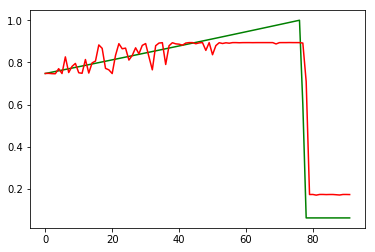

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:39:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2736000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:39:48
INFO:tensorflow:Saving dict for global step 2736000: global_step = 2736000, loss = 0.007496798
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2736000: ./outputdir/model.ckpt-2736000
error on testset first run {'loss': 0.007496798, 'global_step': 2736000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2736000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 463.347
INFO:tensorflow:loss = 0.00025901393, step = 2740601 (0.216 sec)
INFO:tensorflow:global_step/sec: 450.856
INFO:tensorflow:loss = 0.00048169814, step = 2740701 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.562
INFO:tensorflow:loss = 0.00022947768, step = 2740801 (0.220 sec)
INFO:tensorflow:global_step/sec: 455.722
INFO:tensorflow:loss = 4.716212e-05, step = 2740901 (0.220 sec)
INFO:tensorflow:global_step/sec: 463.233
INFO:tensorflow:loss = 0.00019088018, step = 2741001 (0.216 sec)
INFO:tensorflow:global_step/sec: 453.184
INFO:tensorflow:loss = 0.00012809911, step = 2741101 (0.221 sec)
INFO:tensorflow:global_step/sec: 379.023
INFO:tensorflow:loss = 0.00015908924, step = 2741201 (0.264 sec)
INFO:tensorflow:global_step/sec: 422.126
INFO:tensorflow:loss = 0.00022837742, step = 2741301 (0.237 sec)
INFO:tensorflow:global_step/sec: 414.883
INFO:tensorflow:loss = 0.00012386707, step = 2741401 (0.241 sec)
INFO:tensorflow:global_step/sec: 379.24
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2746000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2746000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0001788902, step = 2746001
INFO:tensorflow:global_step/sec: 161.192
INFO:tensorflow:loss = 0.00023640401, step = 2746101 (0.621 sec)
INFO:tensorflow:global_step/sec: 465.013
INFO:tensorflow:loss = 0.00022947406, step = 2746201 (0.215 sec)
INFO:tensorflow:global_step/sec: 431.77
INFO:tensorflow:loss = 0.00082171673, step = 2746301 (0.232 sec)
INFO:tensorflow:global_step/sec: 404.088
INFO:tensorflow:loss = 0.00024890972, step = 2746401 (0.248 sec)
INFO:tensorflow:global_step/sec: 440.106
INFO:tensorflow:loss = 0.00032037336, step = 2746501 (0.227 sec)
INFO:tensorflow:global_step/sec: 446.71
INFO:tensorflow:loss = 0.00025553015, step = 2746601 (0.224 sec)
INFO:tensorflow:global_step/sec: 458.155
INFO:tensorflow:loss = 0.06643403, step =

INFO:tensorflow:loss = 0.00081231573, step = 2751901 (0.244 sec)
INFO:tensorflow:Saving checkpoints for 2752000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00025703778.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2752000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 5.778918868526009e-06
prediction at  8 [array([0.87906276])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2752000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2752000 into ./outputdir/m

INFO:tensorflow:global_step/sec: 461.245
INFO:tensorflow:loss = 0.001154945, step = 2757201 (0.217 sec)
INFO:tensorflow:global_step/sec: 480.139
INFO:tensorflow:loss = 8.444502e-07, step = 2757301 (0.209 sec)
INFO:tensorflow:global_step/sec: 445.516
INFO:tensorflow:loss = 0.00041668737, step = 2757401 (0.224 sec)
INFO:tensorflow:global_step/sec: 409.252
INFO:tensorflow:loss = 0.00046359876, step = 2757501 (0.245 sec)
INFO:tensorflow:global_step/sec: 425.96
INFO:tensorflow:loss = 0.0005017396, step = 2757601 (0.235 sec)
INFO:tensorflow:global_step/sec: 432.896
INFO:tensorflow:loss = 0.00054948125, step = 2757701 (0.231 sec)
INFO:tensorflow:global_step/sec: 401.194
INFO:tensorflow:loss = 0.00040050724, step = 2757801 (0.250 sec)
INFO:tensorflow:global_step/sec: 401.255
INFO:tensorflow:loss = 0.0011573649, step = 2757901 (0.249 sec)
INFO:tensorflow:Saving checkpoints for 2758000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.062473867.
INFO:tensorflow:Calling model_fn

INFO:tensorflow:global_step/sec: 443.923
INFO:tensorflow:loss = 0.00077492057, step = 2762501 (0.225 sec)
INFO:tensorflow:global_step/sec: 395.744
INFO:tensorflow:loss = 0.000737542, step = 2762601 (0.253 sec)
INFO:tensorflow:global_step/sec: 429.343
INFO:tensorflow:loss = 0.0017990089, step = 2762701 (0.233 sec)
INFO:tensorflow:global_step/sec: 435.773
INFO:tensorflow:loss = 0.058410533, step = 2762801 (0.229 sec)
INFO:tensorflow:global_step/sec: 447.699
INFO:tensorflow:loss = 3.8007934e-07, step = 2762901 (0.223 sec)
INFO:tensorflow:global_step/sec: 432.33
INFO:tensorflow:loss = 2.4877318e-05, step = 2763001 (0.231 sec)
INFO:tensorflow:global_step/sec: 444.783
INFO:tensorflow:loss = 0.0007814718, step = 2763101 (0.225 sec)
INFO:tensorflow:global_step/sec: 451.27
INFO:tensorflow:loss = 0.00080819626, step = 2763201 (0.222 sec)
INFO:tensorflow:global_step/sec: 446.781
INFO:tensorflow:loss = 0.0008364109, step = 2763301 (0.224 sec)
INFO:tensorflow:global_step/sec: 451.135
INFO:tensorflo

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2768000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2768000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0012913531, step = 2768001
INFO:tensorflow:global_step/sec: 160.242
INFO:tensorflow:loss = 0.0035817914, step = 2768101 (0.625 sec)
INFO:tensorflow:global_step/sec: 444.768
INFO:tensorflow:loss = 0.0018367165, step = 2768201 (0.225 sec)
INFO:tensorflow:global_step/sec: 448.801
INFO:tensorflow:loss = 0.0030087363, step = 2768301 (0.223 sec)
INFO:tensorflow:global_step/sec: 388.384
INFO:tensorflow:loss = 0.0017889006, step = 2768401 (0.258 sec)
INFO:tensorflow:global_step/sec: 465.584
INFO:tensorflow:loss = 0.003156467, step = 2768501 (0.215 sec)
INFO:tensorflow:global_step/sec: 462.638
INFO:tensorflow:loss = 0.0018346276, step = 2768601 (0.216 sec)
INFO:tensorflow:global_step/sec: 447.619
INFO:tens

INFO:tensorflow:loss = 1.0140264e-09, step = 2773901 (0.237 sec)
INFO:tensorflow:Saving checkpoints for 2774000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.006444659.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2774000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 6.90330448786508e-06
prediction at  19 [array([0.85116737])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2774000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2774000 into ./outputdir/mo

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2778000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2778000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.016784102, step = 2778001
INFO:tensorflow:global_step/sec: 164.988
INFO:tensorflow:loss = 3.1538932e-06, step = 2778101 (0.607 sec)
INFO:tensorflow:global_step/sec: 458.571
INFO:tensorflow:loss = 0.0002318222, step = 2778201 (0.218 sec)
INFO:tensorflow:global_step/sec: 447.303
INFO:tensorflow:loss = 0.0010979794, step = 2778301 (0.224 sec)
INFO:tensorflow:global_step/sec: 438.127
INFO:tensorflow:loss = 1.7651448e-08, step = 2778401 (0.228 sec)
INFO:tensorflow:global_step/sec: 447.549
INFO:tensorflow:loss = 0.00029550155, step = 2778501 (0.223 sec)
INFO:tensorflow:global_step/sec: 454.707
INFO:tensorflow:loss = 0.000

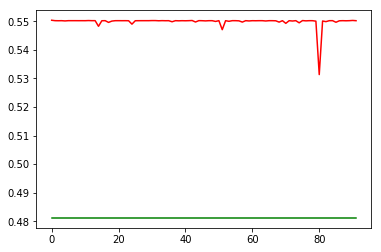

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:42:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2780000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:42:45
INFO:tensorflow:Saving dict for global step 2780000: global_step = 2780000, loss = 0.004754551
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2780000: ./outputdir/model.ckpt-2780000
error on testset first run {'loss': 0.004754551, 'global_step': 2780000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2780000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 447.42
INFO:tensorflow:loss = 1.5561704e-06, step = 2784601 (0.223 sec)
INFO:tensorflow:global_step/sec: 433.919
INFO:tensorflow:loss = 3.4162053e-07, step = 2784701 (0.231 sec)
INFO:tensorflow:global_step/sec: 439.85
INFO:tensorflow:loss = 6.083327e-08, step = 2784801 (0.227 sec)
INFO:tensorflow:global_step/sec: 448.381
INFO:tensorflow:loss = 7.2320245e-06, step = 2784901 (0.223 sec)
INFO:tensorflow:global_step/sec: 435.375
INFO:tensorflow:loss = 1.027318e-05, step = 2785001 (0.229 sec)
INFO:tensorflow:global_step/sec: 440.968
INFO:tensorflow:loss = 1.45987915e-05, step = 2785101 (0.227 sec)
INFO:tensorflow:global_step/sec: 435.153
INFO:tensorflow:loss = 0.00027896065, step = 2785201 (0.230 sec)
INFO:tensorflow:global_step/sec: 438.243
INFO:tensorflow:loss = 1.118592e-05, step = 2785301 (0.228 sec)
INFO:tensorflow:global_step/sec: 440.005
INFO:tensorflow:loss = 8.254149e-06, step = 2785401 (0.227 sec)
INFO:tensorflow:global_step/sec: 426.958
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2790000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2790000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.3124896e-05, step = 2790001
INFO:tensorflow:global_step/sec: 168.013
INFO:tensorflow:loss = 4.5642446e-06, step = 2790101 (0.596 sec)
INFO:tensorflow:global_step/sec: 466.387
INFO:tensorflow:loss = 7.1062664e-06, step = 2790201 (0.214 sec)
INFO:tensorflow:global_step/sec: 455.415
INFO:tensorflow:loss = 8.175821e-09, step = 2790301 (0.220 sec)
INFO:tensorflow:global_step/sec: 459.958
INFO:tensorflow:loss = 1.18444195e-05, step = 2790401 (0.217 sec)
INFO:tensorflow:global_step/sec: 452.062
INFO:tensorflow:loss = 0.00018737679, step = 2790501 (0.221 sec)
INFO:tensorflow:global_step/sec: 442.132
INFO:tensorflow:loss = 5.867696e-06, step = 2790601 (0.226 sec)
INFO:tensorflow:global_step/sec: 401.096
INFO:tensorflow:loss = 1.0572769e-06, s

INFO:tensorflow:loss = 7.4751114e-08, step = 2795901 (0.249 sec)
INFO:tensorflow:Saving checkpoints for 2796000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.2616895e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2796000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.4323418548783897e-05
prediction at  8 [array([0.55110795])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2796000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2796000 into ./outputdir/

INFO:tensorflow:global_step/sec: 447.141
INFO:tensorflow:loss = 5.235113e-07, step = 2801201 (0.224 sec)
INFO:tensorflow:global_step/sec: 427.804
INFO:tensorflow:loss = 2.809053e-06, step = 2801301 (0.234 sec)
INFO:tensorflow:global_step/sec: 433.546
INFO:tensorflow:loss = 4.042208e-06, step = 2801401 (0.231 sec)
INFO:tensorflow:global_step/sec: 428.559
INFO:tensorflow:loss = 7.6280463e-07, step = 2801501 (0.233 sec)
INFO:tensorflow:global_step/sec: 430.773
INFO:tensorflow:loss = 0.00018659761, step = 2801601 (0.232 sec)
INFO:tensorflow:global_step/sec: 398.078
INFO:tensorflow:loss = 5.371405e-07, step = 2801701 (0.251 sec)
INFO:tensorflow:global_step/sec: 404.344
INFO:tensorflow:loss = 7.592905e-08, step = 2801801 (0.247 sec)
INFO:tensorflow:global_step/sec: 389.011
INFO:tensorflow:loss = 4.6325098e-07, step = 2801901 (0.257 sec)
INFO:tensorflow:Saving checkpoints for 2802000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.5346823e-06.
INFO:tensorflow:Calling model

INFO:tensorflow:loss = 5.4994243e-06, step = 2806401 (0.226 sec)
INFO:tensorflow:global_step/sec: 396.673
INFO:tensorflow:loss = 5.0526514e-06, step = 2806501 (0.252 sec)
INFO:tensorflow:global_step/sec: 433.762
INFO:tensorflow:loss = 2.6270982e-05, step = 2806601 (0.231 sec)
INFO:tensorflow:global_step/sec: 415.493
INFO:tensorflow:loss = 5.6463205e-06, step = 2806701 (0.240 sec)
INFO:tensorflow:global_step/sec: 425.159
INFO:tensorflow:loss = 5.431424e-06, step = 2806801 (0.235 sec)
INFO:tensorflow:global_step/sec: 445.79
INFO:tensorflow:loss = 4.5826e-06, step = 2806901 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.455
INFO:tensorflow:loss = 4.166939e-09, step = 2807001 (0.225 sec)
INFO:tensorflow:global_step/sec: 447.644
INFO:tensorflow:loss = 2.2938739e-06, step = 2807101 (0.223 sec)
INFO:tensorflow:global_step/sec: 443.737
INFO:tensorflow:loss = 0.00013653954, step = 2807201 (0.225 sec)
INFO:tensorflow:global_step/sec: 460.015
INFO:tensorflow:loss = 3.1416262e-06, step = 2807301

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2812000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2812000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.722742e-07, step = 2812001
INFO:tensorflow:global_step/sec: 164.603
INFO:tensorflow:loss = 1.0339945e-06, step = 2812101 (0.608 sec)
INFO:tensorflow:global_step/sec: 435.292
INFO:tensorflow:loss = 2.1025064e-06, step = 2812201 (0.231 sec)
INFO:tensorflow:global_step/sec: 450.323
INFO:tensorflow:loss = 1.0407939e-06, step = 2812301 (0.221 sec)
INFO:tensorflow:global_step/sec: 435.49
INFO:tensorflow:loss = 2.131124e-06, step = 2812401 (0.230 sec)
INFO:tensorflow:global_step/sec: 449.509
INFO:tensorflow:loss = 1.0527465e-06, step = 2812501 (0.223 sec)
INFO:tensorflow:global_step/sec: 431.754
INFO:tensorflow:loss = 1.94

INFO:tensorflow:global_step/sec: 431.253
INFO:tensorflow:loss = 1.6062357e-06, step = 2817801 (0.232 sec)
INFO:tensorflow:global_step/sec: 438.726
INFO:tensorflow:loss = 3.4930235e-06, step = 2817901 (0.228 sec)
INFO:tensorflow:Saving checkpoints for 2818000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.0664374e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2818000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 5.3257671426174315e-08
prediction at  19 [array([0.548882])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2818000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2822000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2822000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.15536511, step = 2822001
INFO:tensorflow:global_step/sec: 166.68
INFO:tensorflow:loss = 5.066022e-05, step = 2822101 (0.601 sec)
INFO:tensorflow:global_step/sec: 460.556
INFO:tensorflow:loss = 1.8321087e-05, step = 2822201 (0.217 sec)
INFO:tensorflow:global_step/sec: 436.247
INFO:tensorflow:loss = 0.0073018237, step = 2822301 (0.229 sec)
INFO:tensorflow:global_step/sec: 457.911
INFO:tensorflow:loss = 1.0434957e-05, step = 2822401 (0.218 sec)
INFO:tensorflow:global_step/sec: 431.453
INFO:tensorflow:loss = 1.5459634e-06, step = 2822501 (0.232 sec)
INFO:tensorflow:global_step/sec: 438.38
INFO:tensorflow:loss = 2.406255

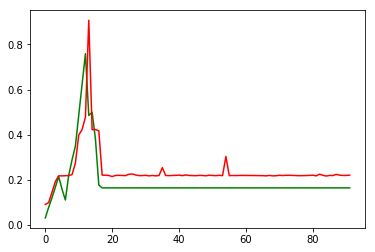

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:45:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2824000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:45:41
INFO:tensorflow:Saving dict for global step 2824000: global_step = 2824000, loss = 0.006964976
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2824000: ./outputdir/model.ckpt-2824000
error on testset first run {'loss': 0.006964976, 'global_step': 2824000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2824000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 433.563
INFO:tensorflow:loss = 1.5536763e-05, step = 2828601 (0.231 sec)
INFO:tensorflow:global_step/sec: 427.5
INFO:tensorflow:loss = 5.1523507e-06, step = 2828701 (0.234 sec)
INFO:tensorflow:global_step/sec: 428.289
INFO:tensorflow:loss = 1.3165025e-10, step = 2828801 (0.234 sec)
INFO:tensorflow:global_step/sec: 438.468
INFO:tensorflow:loss = 2.04696e-06, step = 2828901 (0.228 sec)
INFO:tensorflow:global_step/sec: 428.482
INFO:tensorflow:loss = 1.3944242e-06, step = 2829001 (0.233 sec)
INFO:tensorflow:global_step/sec: 410.403
INFO:tensorflow:loss = 3.2822007e-07, step = 2829101 (0.244 sec)
INFO:tensorflow:global_step/sec: 421.257
INFO:tensorflow:loss = 4.4232394e-08, step = 2829201 (0.238 sec)
INFO:tensorflow:global_step/sec: 439.159
INFO:tensorflow:loss = 7.925539e-07, step = 2829301 (0.227 sec)
INFO:tensorflow:global_step/sec: 426.199
INFO:tensorflow:loss = 1.5830908e-06, step = 2829401 (0.235 sec)
INFO:tensorflow:global_step/sec: 423.851
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2834000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2834000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.4496037e-08, step = 2834001
INFO:tensorflow:global_step/sec: 165.935
INFO:tensorflow:loss = 5.103126e-09, step = 2834101 (0.603 sec)
INFO:tensorflow:global_step/sec: 460.793
INFO:tensorflow:loss = 8.621515e-07, step = 2834201 (0.217 sec)
INFO:tensorflow:global_step/sec: 457.752
INFO:tensorflow:loss = 8.30002e-06, step = 2834301 (0.219 sec)
INFO:tensorflow:global_step/sec: 447.97
INFO:tensorflow:loss = 6.1091515e-07, step = 2834401 (0.223 sec)
INFO:tensorflow:global_step/sec: 402.536
INFO:tensorflow:loss = 6.1210203e-06, step = 2834501 (0.248 sec)
INFO:tensorflow:global_step/sec: 465.988
INFO:tensorflow:loss = 2.0209059e-06, step = 2834601 (0.215 sec)
INFO:tensorflow:global_step/sec: 451.145
INFO:tensorflow:loss = 6.332588e-06, step =

INFO:tensorflow:loss = 7.0690553e-06, step = 2839901 (0.225 sec)
INFO:tensorflow:Saving checkpoints for 2840000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 8.315053e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2840000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 7.308696245594011e-07
prediction at  8 [array([0.2185628])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2840000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2840000 into ./outputdir/mod

INFO:tensorflow:global_step/sec: 379.82
INFO:tensorflow:loss = 1.5600379e-05, step = 2845201 (0.266 sec)
INFO:tensorflow:global_step/sec: 412.179
INFO:tensorflow:loss = 1.449721e-06, step = 2845301 (0.240 sec)
INFO:tensorflow:global_step/sec: 443.524
INFO:tensorflow:loss = 4.6882553e-07, step = 2845401 (0.225 sec)
INFO:tensorflow:global_step/sec: 425.255
INFO:tensorflow:loss = 9.055285e-06, step = 2845501 (0.235 sec)
INFO:tensorflow:global_step/sec: 426.678
INFO:tensorflow:loss = 1.7699226e-07, step = 2845601 (0.234 sec)
INFO:tensorflow:global_step/sec: 411.005
INFO:tensorflow:loss = 9.276894e-07, step = 2845701 (0.244 sec)
INFO:tensorflow:global_step/sec: 409.695
INFO:tensorflow:loss = 3.4134886e-05, step = 2845801 (0.244 sec)
INFO:tensorflow:global_step/sec: 420.608
INFO:tensorflow:loss = 1.5738642e-05, step = 2845901 (0.237 sec)
INFO:tensorflow:Saving checkpoints for 2846000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.03018565e-05.
INFO:tensorflow:Calling mod

INFO:tensorflow:loss = 1.0380827e-07, step = 2850401 (0.227 sec)
INFO:tensorflow:global_step/sec: 439.367
INFO:tensorflow:loss = 7.783626e-05, step = 2850501 (0.228 sec)
INFO:tensorflow:global_step/sec: 430.365
INFO:tensorflow:loss = 3.955319e-06, step = 2850601 (0.232 sec)
INFO:tensorflow:global_step/sec: 392.898
INFO:tensorflow:loss = 1.0915342e-06, step = 2850701 (0.255 sec)
INFO:tensorflow:global_step/sec: 441.343
INFO:tensorflow:loss = 2.5444224e-06, step = 2850801 (0.226 sec)
INFO:tensorflow:global_step/sec: 456.105
INFO:tensorflow:loss = 2.1426688e-06, step = 2850901 (0.219 sec)
INFO:tensorflow:global_step/sec: 430.878
INFO:tensorflow:loss = 2.131509e-07, step = 2851001 (0.232 sec)
INFO:tensorflow:global_step/sec: 394.514
INFO:tensorflow:loss = 8.536246e-06, step = 2851101 (0.253 sec)
INFO:tensorflow:global_step/sec: 466.877
INFO:tensorflow:loss = 7.1246304e-06, step = 2851201 (0.214 sec)
INFO:tensorflow:global_step/sec: 445.868
INFO:tensorflow:loss = 4.6229812e-07, step = 28513

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2856000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2856000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.4478315e-08, step = 2856001
INFO:tensorflow:global_step/sec: 164.93
INFO:tensorflow:loss = 4.640455e-06, step = 2856101 (0.607 sec)
INFO:tensorflow:global_step/sec: 441.474
INFO:tensorflow:loss = 1.7528523e-06, step = 2856201 (0.227 sec)
INFO:tensorflow:global_step/sec: 423.103
INFO:tensorflow:loss = 4.5790916e-06, step = 2856301 (0.236 sec)
INFO:tensorflow:global_step/sec: 433.319
INFO:tensorflow:loss = 1.7984813e-06, step = 2856401 (0.231 sec)
INFO:tensorflow:global_step/sec: 445.893
INFO:tensorflow:loss = 4.7467934e-06, step = 2856501 (0.224 sec)
INFO:tensorflow:global_step/sec: 440.822
INFO:tensorflow:loss = 1.7

INFO:tensorflow:global_step/sec: 439.522
INFO:tensorflow:loss = 4.3224987e-05, step = 2861801 (0.227 sec)
INFO:tensorflow:global_step/sec: 435.129
INFO:tensorflow:loss = 7.599181e-07, step = 2861901 (0.230 sec)
INFO:tensorflow:Saving checkpoints for 2862000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.9611048e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2862000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.1163422625409537e-08
prediction at  19 [array([0.21983104])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2862000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2866000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2866000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0124001065, step = 2866001
INFO:tensorflow:global_step/sec: 166.314
INFO:tensorflow:loss = 1.9404742e-07, step = 2866101 (0.602 sec)
INFO:tensorflow:global_step/sec: 462.095
INFO:tensorflow:loss = 0.00015841934, step = 2866201 (0.217 sec)
INFO:tensorflow:global_step/sec: 462.618
INFO:tensorflow:loss = 3.086197e-06, step = 2866301 (0.216 sec)
INFO:tensorflow:global_step/sec: 386.745
INFO:tensorflow:loss = 2.5436143e-06, step = 2866401 (0.258 sec)
INFO:tensorflow:global_step/sec: 439.607
INFO:tensorflow:loss = 2.1559323e-07, step = 2866501 (0.228 sec)
INFO:tensorflow:global_step/sec: 441.891
INFO:tensorflow:loss = 1.1

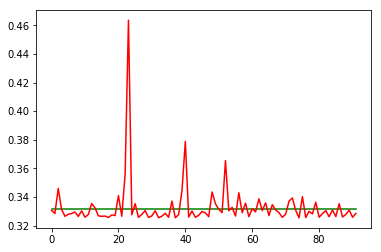

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:48:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2868000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:48:36
INFO:tensorflow:Saving dict for global step 2868000: global_step = 2868000, loss = 9.794221e-05
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2868000: ./outputdir/model.ckpt-2868000
error on testset first run {'loss': 9.794221e-05, 'global_step': 2868000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2868000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 449.327
INFO:tensorflow:loss = 7.3162955e-05, step = 2872601 (0.223 sec)
INFO:tensorflow:global_step/sec: 444.024
INFO:tensorflow:loss = 4.000851e-06, step = 2872701 (0.225 sec)
INFO:tensorflow:global_step/sec: 440.985
INFO:tensorflow:loss = 8.691501e-06, step = 2872801 (0.227 sec)
INFO:tensorflow:global_step/sec: 445.959
INFO:tensorflow:loss = 3.4799046e-05, step = 2872901 (0.224 sec)
INFO:tensorflow:global_step/sec: 441.509
INFO:tensorflow:loss = 4.8523838e-05, step = 2873001 (0.226 sec)
INFO:tensorflow:global_step/sec: 441.472
INFO:tensorflow:loss = 0.00014121254, step = 2873101 (0.226 sec)
INFO:tensorflow:global_step/sec: 439.019
INFO:tensorflow:loss = 2.6781185e-05, step = 2873201 (0.228 sec)
INFO:tensorflow:global_step/sec: 441.66
INFO:tensorflow:loss = 6.8615314e-05, step = 2873301 (0.226 sec)
INFO:tensorflow:global_step/sec: 440.072
INFO:tensorflow:loss = 0.00013975652, step = 2873401 (0.227 sec)
INFO:tensorflow:global_step/sec: 436.588
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2878000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2878000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.2401817e-05, step = 2878001
INFO:tensorflow:global_step/sec: 164.032
INFO:tensorflow:loss = 1.7540353e-07, step = 2878101 (0.611 sec)
INFO:tensorflow:global_step/sec: 456.438
INFO:tensorflow:loss = 6.269756e-05, step = 2878201 (0.219 sec)
INFO:tensorflow:global_step/sec: 460.265
INFO:tensorflow:loss = 1.6628146e-05, step = 2878301 (0.217 sec)
INFO:tensorflow:global_step/sec: 445.538
INFO:tensorflow:loss = 1.8168329e-06, step = 2878401 (0.225 sec)
INFO:tensorflow:global_step/sec: 372.201
INFO:tensorflow:loss = 6.627849e-05, step = 2878501 (0.269 sec)
INFO:tensorflow:global_step/sec: 463.859
INFO:tensorflow:loss = 0.00011820312, step = 2878601 (0.216 sec)
INFO:tensorflow:global_step/sec: 449.749
INFO:tensorflow:loss = 0.00016216908, st

INFO:tensorflow:global_step/sec: 424.47
INFO:tensorflow:loss = 8.986005e-06, step = 2883901 (0.235 sec)
INFO:tensorflow:Saving checkpoints for 2884000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.362444e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2884000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.4551412332982457e-05
prediction at  8 [array([0.33444123])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2884000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving che

INFO:tensorflow:loss = 4.0419207e-05, step = 2889101 (0.234 sec)
INFO:tensorflow:global_step/sec: 420.385
INFO:tensorflow:loss = 9.402752e-06, step = 2889201 (0.238 sec)
INFO:tensorflow:global_step/sec: 432.296
INFO:tensorflow:loss = 3.1753487e-05, step = 2889301 (0.231 sec)
INFO:tensorflow:global_step/sec: 436.712
INFO:tensorflow:loss = 3.1174795e-06, step = 2889401 (0.229 sec)
INFO:tensorflow:global_step/sec: 434.765
INFO:tensorflow:loss = 4.6659577e-05, step = 2889501 (0.230 sec)
INFO:tensorflow:global_step/sec: 443.759
INFO:tensorflow:loss = 4.500961e-05, step = 2889601 (0.225 sec)
INFO:tensorflow:global_step/sec: 407.511
INFO:tensorflow:loss = 0.000112346745, step = 2889701 (0.245 sec)
INFO:tensorflow:global_step/sec: 395.948
INFO:tensorflow:loss = 3.8755323e-05, step = 2889801 (0.253 sec)
INFO:tensorflow:global_step/sec: 394.065
INFO:tensorflow:loss = 9.240789e-06, step = 2889901 (0.254 sec)
INFO:tensorflow:Saving checkpoints for 2890000 into ./outputdir/model.ckpt.
INFO:tensorfl

INFO:tensorflow:global_step/sec: 457.498
INFO:tensorflow:loss = 2.0487278e-05, step = 2894401 (0.219 sec)
INFO:tensorflow:global_step/sec: 440.665
INFO:tensorflow:loss = 1.7435166e-05, step = 2894501 (0.226 sec)
INFO:tensorflow:global_step/sec: 424.545
INFO:tensorflow:loss = 2.5433954e-05, step = 2894601 (0.236 sec)
INFO:tensorflow:global_step/sec: 416.022
INFO:tensorflow:loss = 2.7672522e-06, step = 2894701 (0.240 sec)
INFO:tensorflow:global_step/sec: 428.07
INFO:tensorflow:loss = 0.00016277688, step = 2894801 (0.234 sec)
INFO:tensorflow:global_step/sec: 427.144
INFO:tensorflow:loss = 2.7184302e-05, step = 2894901 (0.233 sec)
INFO:tensorflow:global_step/sec: 460.247
INFO:tensorflow:loss = 1.5410036e-07, step = 2895001 (0.217 sec)
INFO:tensorflow:global_step/sec: 445.348
INFO:tensorflow:loss = 3.9737733e-05, step = 2895101 (0.225 sec)
INFO:tensorflow:global_step/sec: 428.874
INFO:tensorflow:loss = 3.0173214e-05, step = 2895201 (0.233 sec)
INFO:tensorflow:global_step/sec: 474.255
INFO:t

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2900000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2900000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.000106580694, step = 2900001
INFO:tensorflow:global_step/sec: 168.714
INFO:tensorflow:loss = 1.7048087e-05, step = 2900101 (0.594 sec)
INFO:tensorflow:global_step/sec: 445.649
INFO:tensorflow:loss = 0.00011279195, step = 2900201 (0.224 sec)
INFO:tensorflow:global_step/sec: 457.176
INFO:tensorflow:loss = 4.806652e-06, step = 2900301 (0.219 sec)
INFO:tensorflow:global_step/sec: 447.458
INFO:tensorflow:loss = 0.0001450848, step = 2900401 (0.223 sec)
INFO:tensorflow:global_step/sec: 445.39
INFO:tensorflow:loss = 1.913449e-06, step = 2900501 (0.225 sec)
INFO:tensorflow:global_step/sec: 421.818
INFO:tensorflow:loss = 0.00

INFO:tensorflow:global_step/sec: 385.704
INFO:tensorflow:loss = 1.2456031e-05, step = 2905801 (0.259 sec)
INFO:tensorflow:global_step/sec: 388.291
INFO:tensorflow:loss = 2.6611495e-05, step = 2905901 (0.258 sec)
INFO:tensorflow:Saving checkpoints for 2906000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.9685644e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2906000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 3.616985592107041e-07
prediction at  19 [array([0.33105658])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2906000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2910000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2910000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.06705844, step = 2910001
INFO:tensorflow:global_step/sec: 164.863
INFO:tensorflow:loss = 7.433307e-07, step = 2910101 (0.607 sec)
INFO:tensorflow:global_step/sec: 454.009
INFO:tensorflow:loss = 1.0043601e-05, step = 2910201 (0.220 sec)
INFO:tensorflow:global_step/sec: 438.502
INFO:tensorflow:loss = 0.001560828, step = 2910301 (0.228 sec)
INFO:tensorflow:global_step/sec: 422.253
INFO:tensorflow:loss = 0.00052666594, step = 2910401 (0.238 sec)
INFO:tensorflow:global_step/sec: 398.765
INFO:tensorflow:loss = 0.0001361199, step = 2910501 (0.250 sec)
INFO:tensorflow:global_step/sec: 445.25
INFO:tensorflow:loss = 0.0001539

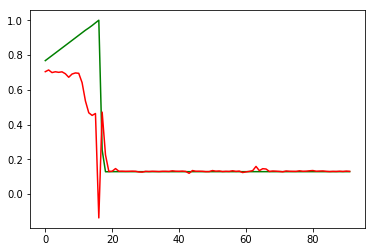

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:51:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2912000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:51:33
INFO:tensorflow:Saving dict for global step 2912000: global_step = 2912000, loss = 0.015042469
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2912000: ./outputdir/model.ckpt-2912000
error on testset first run {'loss': 0.015042469, 'global_step': 2912000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2912000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 399.845
INFO:tensorflow:loss = 4.652468e-06, step = 2916601 (0.250 sec)
INFO:tensorflow:global_step/sec: 416.533
INFO:tensorflow:loss = 4.4706607e-07, step = 2916701 (0.240 sec)
INFO:tensorflow:global_step/sec: 428.018
INFO:tensorflow:loss = 9.905429e-06, step = 2916801 (0.233 sec)
INFO:tensorflow:global_step/sec: 423.653
INFO:tensorflow:loss = 8.2481995e-07, step = 2916901 (0.236 sec)
INFO:tensorflow:global_step/sec: 437.789
INFO:tensorflow:loss = 5.3450894e-06, step = 2917001 (0.229 sec)
INFO:tensorflow:global_step/sec: 435.108
INFO:tensorflow:loss = 1.7187318e-08, step = 2917101 (0.230 sec)
INFO:tensorflow:global_step/sec: 433.619
INFO:tensorflow:loss = 4.8058275e-05, step = 2917201 (0.231 sec)
INFO:tensorflow:global_step/sec: 433.452
INFO:tensorflow:loss = 6.647878e-06, step = 2917301 (0.231 sec)
INFO:tensorflow:global_step/sec: 431.406
INFO:tensorflow:loss = 9.835912e-07, step = 2917401 (0.232 sec)
INFO:tensorflow:global_step/sec: 413.484
INFO:tens

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2922000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2922000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.5530895e-06, step = 2922001
INFO:tensorflow:global_step/sec: 165.222
INFO:tensorflow:loss = 1.8502162e-05, step = 2922101 (0.606 sec)
INFO:tensorflow:global_step/sec: 466.54
INFO:tensorflow:loss = 6.49426e-07, step = 2922201 (0.214 sec)
INFO:tensorflow:global_step/sec: 475.181
INFO:tensorflow:loss = 1.5123904e-08, step = 2922301 (0.211 sec)
INFO:tensorflow:global_step/sec: 475.265
INFO:tensorflow:loss = 3.5324036e-05, step = 2922401 (0.211 sec)
INFO:tensorflow:global_step/sec: 454.12
INFO:tensorflow:loss = 8.80247e-06, step = 2922501 (0.220 sec)
INFO:tensorflow:global_step/sec: 427.327
INFO:tensorflow:loss = 2.3635668e-07, step = 2922601 (0.235 sec)
INFO:tensorflow:global_step/sec: 429.735
INFO:tensorflow:loss = 8.5054097e-07, step =

INFO:tensorflow:loss = 5.306643e-06, step = 2927901 (0.236 sec)
INFO:tensorflow:Saving checkpoints for 2928000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.736229e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2928000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 3.746951611897841e-05
prediction at  8 [array([0.13385147])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2928000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2928000 into ./outputdir/mod

INFO:tensorflow:global_step/sec: 432.582
INFO:tensorflow:loss = 2.1789858e-06, step = 2933201 (0.231 sec)
INFO:tensorflow:global_step/sec: 415.585
INFO:tensorflow:loss = 2.6583828e-05, step = 2933301 (0.241 sec)
INFO:tensorflow:global_step/sec: 433.573
INFO:tensorflow:loss = 1.6897314e-07, step = 2933401 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.874
INFO:tensorflow:loss = 2.0496898e-06, step = 2933501 (0.227 sec)
INFO:tensorflow:global_step/sec: 442.582
INFO:tensorflow:loss = 2.6327378e-05, step = 2933601 (0.226 sec)
INFO:tensorflow:global_step/sec: 434.163
INFO:tensorflow:loss = 1.2438787e-05, step = 2933701 (0.230 sec)
INFO:tensorflow:global_step/sec: 428.425
INFO:tensorflow:loss = 6.4075048e-06, step = 2933801 (0.234 sec)
INFO:tensorflow:global_step/sec: 420.064
INFO:tensorflow:loss = 1.8558449e-06, step = 2933901 (0.238 sec)
INFO:tensorflow:Saving checkpoints for 2934000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.0946895e-05.
INFO:tensorflow:Calling 

INFO:tensorflow:loss = 5.886119e-06, step = 2938401 (0.221 sec)
INFO:tensorflow:global_step/sec: 409.426
INFO:tensorflow:loss = 1.3860585e-05, step = 2938501 (0.245 sec)
INFO:tensorflow:global_step/sec: 415.652
INFO:tensorflow:loss = 4.7247427e-06, step = 2938601 (0.240 sec)
INFO:tensorflow:global_step/sec: 466.642
INFO:tensorflow:loss = 1.971599e-06, step = 2938701 (0.214 sec)
INFO:tensorflow:global_step/sec: 461.544
INFO:tensorflow:loss = 5.9223873e-07, step = 2938801 (0.217 sec)
INFO:tensorflow:global_step/sec: 476.721
INFO:tensorflow:loss = 1.0851653e-05, step = 2938901 (0.210 sec)
INFO:tensorflow:global_step/sec: 391.226
INFO:tensorflow:loss = 1.8965433e-06, step = 2939001 (0.256 sec)
INFO:tensorflow:global_step/sec: 437.872
INFO:tensorflow:loss = 2.7331996e-06, step = 2939101 (0.229 sec)
INFO:tensorflow:global_step/sec: 438.516
INFO:tensorflow:loss = 6.188162e-05, step = 2939201 (0.228 sec)
INFO:tensorflow:global_step/sec: 424.25
INFO:tensorflow:loss = 7.456383e-08, step = 293930

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2944000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2944000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.9978423e-06, step = 2944001
INFO:tensorflow:global_step/sec: 161.367
INFO:tensorflow:loss = 7.733153e-08, step = 2944101 (0.621 sec)
INFO:tensorflow:global_step/sec: 457.921
INFO:tensorflow:loss = 1.5463711e-06, step = 2944201 (0.218 sec)
INFO:tensorflow:global_step/sec: 455.185
INFO:tensorflow:loss = 1.2651589e-07, step = 2944301 (0.220 sec)
INFO:tensorflow:global_step/sec: 445.582
INFO:tensorflow:loss = 2.0609693e-06, step = 2944401 (0.225 sec)
INFO:tensorflow:global_step/sec: 441.762
INFO:tensorflow:loss = 1.8788747e-07, step = 2944501 (0.226 sec)
INFO:tensorflow:global_step/sec: 389.141
INFO:tensorflow:loss = 2.

INFO:tensorflow:global_step/sec: 383.812
INFO:tensorflow:loss = 4.978034e-06, step = 2949801 (0.261 sec)
INFO:tensorflow:global_step/sec: 377.989
INFO:tensorflow:loss = 7.047598e-06, step = 2949901 (0.264 sec)
INFO:tensorflow:Saving checkpoints for 2950000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.3781377e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2950000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.081296669975011e-06
prediction at  19 [array([0.12980824])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2950000
I

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2954000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2954000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.009787611, step = 2954001
INFO:tensorflow:global_step/sec: 165.959
INFO:tensorflow:loss = 1.1105776e-07, step = 2954101 (0.603 sec)
INFO:tensorflow:global_step/sec: 457.4
INFO:tensorflow:loss = 0.0018305677, step = 2954201 (0.219 sec)
INFO:tensorflow:global_step/sec: 447.962
INFO:tensorflow:loss = 0.0003288903, step = 2954301 (0.223 sec)
INFO:tensorflow:global_step/sec: 448.447
INFO:tensorflow:loss = 1.4001017e-07, step = 2954401 (0.223 sec)
INFO:tensorflow:global_step/sec: 454.797
INFO:tensorflow:loss = 8.428098e-10, step = 2954501 (0.220 sec)
INFO:tensorflow:global_step/sec: 454.251
INFO:tensorflow:loss = 0.007585

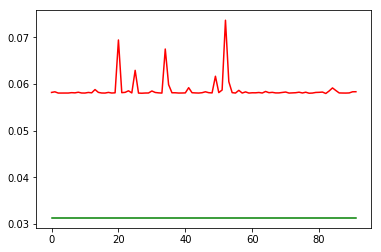

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:54:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2956000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:54:29
INFO:tensorflow:Saving dict for global step 2956000: global_step = 2956000, loss = 0.0007379797
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2956000: ./outputdir/model.ckpt-2956000
error on testset first run {'loss': 0.0007379797, 'global_step': 2956000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2956000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 432.591
INFO:tensorflow:loss = 5.287588e-07, step = 2960601 (0.232 sec)
INFO:tensorflow:global_step/sec: 449.61
INFO:tensorflow:loss = 7.9052384e-08, step = 2960701 (0.223 sec)
INFO:tensorflow:global_step/sec: 463.038
INFO:tensorflow:loss = 2.0930549e-05, step = 2960801 (0.215 sec)
INFO:tensorflow:global_step/sec: 417.399
INFO:tensorflow:loss = 1.5200968e-08, step = 2960901 (0.240 sec)
INFO:tensorflow:global_step/sec: 444.737
INFO:tensorflow:loss = 8.205557e-07, step = 2961001 (0.225 sec)
INFO:tensorflow:global_step/sec: 440.667
INFO:tensorflow:loss = 9.8758115e-08, step = 2961101 (0.227 sec)
INFO:tensorflow:global_step/sec: 461.318
INFO:tensorflow:loss = 1.9016468e-07, step = 2961201 (0.217 sec)
INFO:tensorflow:global_step/sec: 436.081
INFO:tensorflow:loss = 7.0887196e-10, step = 2961301 (0.230 sec)
INFO:tensorflow:global_step/sec: 435.252
INFO:tensorflow:loss = 5.518246e-07, step = 2961401 (0.229 sec)
INFO:tensorflow:global_step/sec: 437.832
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2966000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.1758412e-07, step = 2966001
INFO:tensorflow:global_step/sec: 156.619
INFO:tensorflow:loss = 2.0328496e-08, step = 2966101 (0.639 sec)
INFO:tensorflow:global_step/sec: 441.985
INFO:tensorflow:loss = 7.663552e-07, step = 2966201 (0.226 sec)
INFO:tensorflow:global_step/sec: 422.171
INFO:tensorflow:loss = 4.0543028e-07, step = 2966301 (0.237 sec)
INFO:tensorflow:global_step/sec: 417.851
INFO:tensorflow:loss = 3.4338175e-06, step = 2966401 (0.239 sec)
INFO:tensorflow:global_step/sec: 403.752
INFO:tensorflow:loss = 4.7475677e-07, step = 2966501 (0.248 sec)
INFO:tensorflow:global_step/sec: 439.267
INFO:tensorflow:loss = 2.1172576e-07, step = 2966601 (0.228 sec)
INFO:tensorflow:global_step/sec: 442.274
INFO:tensorflow:loss = 3.4148556e-07, step = 2966701 (0.226 sec)
INFO:tensorflow:global_step/sec: 448.24
INFO:te

INFO:tensorflow:Saving checkpoints for 2972000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.647802e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2972000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.1596610930693045e-07
prediction at  8 [array([0.0585902])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2972000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2972000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.459717e-07, step = 2972001
INF

INFO:tensorflow:loss = 2.6596123e-07, step = 2977201 (0.231 sec)
INFO:tensorflow:global_step/sec: 438.251
INFO:tensorflow:loss = 3.633149e-08, step = 2977301 (0.228 sec)
INFO:tensorflow:global_step/sec: 429.415
INFO:tensorflow:loss = 4.6545443e-07, step = 2977401 (0.233 sec)
INFO:tensorflow:global_step/sec: 454.366
INFO:tensorflow:loss = 1.2258363e-06, step = 2977501 (0.220 sec)
INFO:tensorflow:global_step/sec: 455.713
INFO:tensorflow:loss = 4.8993314e-07, step = 2977601 (0.220 sec)
INFO:tensorflow:global_step/sec: 439.661
INFO:tensorflow:loss = 4.9123776e-07, step = 2977701 (0.228 sec)
INFO:tensorflow:global_step/sec: 450.451
INFO:tensorflow:loss = 4.9310904e-07, step = 2977801 (0.222 sec)
INFO:tensorflow:global_step/sec: 417.155
INFO:tensorflow:loss = 2.324537e-07, step = 2977901 (0.240 sec)
INFO:tensorflow:Saving checkpoints for 2978000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.179453e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model

INFO:tensorflow:global_step/sec: 456.175
INFO:tensorflow:loss = 3.0799696e-10, step = 2982501 (0.219 sec)
INFO:tensorflow:global_step/sec: 442.474
INFO:tensorflow:loss = 2.2116038e-07, step = 2982601 (0.226 sec)
INFO:tensorflow:global_step/sec: 444.054
INFO:tensorflow:loss = 7.7572054e-08, step = 2982701 (0.225 sec)
INFO:tensorflow:global_step/sec: 438.794
INFO:tensorflow:loss = 4.1611213e-07, step = 2982801 (0.228 sec)
INFO:tensorflow:global_step/sec: 435.689
INFO:tensorflow:loss = 8.377776e-08, step = 2982901 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.895
INFO:tensorflow:loss = 2.005402e-07, step = 2983001 (0.227 sec)
INFO:tensorflow:global_step/sec: 432.695
INFO:tensorflow:loss = 6.22547e-09, step = 2983101 (0.231 sec)
INFO:tensorflow:global_step/sec: 432.41
INFO:tensorflow:loss = 3.6422435e-08, step = 2983201 (0.231 sec)
INFO:tensorflow:global_step/sec: 448.41
INFO:tensorflow:loss = 1.6700476e-08, step = 2983301 (0.223 sec)
INFO:tensorflow:global_step/sec: 378.62
INFO:tensorf

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2988000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2988000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.6130606e-08, step = 2988001
INFO:tensorflow:global_step/sec: 157.453
INFO:tensorflow:loss = 1.6168173e-07, step = 2988101 (0.636 sec)
INFO:tensorflow:global_step/sec: 449.069
INFO:tensorflow:loss = 5.1706994e-10, step = 2988201 (0.223 sec)
INFO:tensorflow:global_step/sec: 424.376
INFO:tensorflow:loss = 2.0163941e-07, step = 2988301 (0.236 sec)
INFO:tensorflow:global_step/sec: 444.346
INFO:tensorflow:loss = 3.606782e-10, step = 2988401 (0.226 sec)
INFO:tensorflow:global_step/sec: 409.817
INFO:tensorflow:loss = 2.1309242e-07, step = 2988501 (0.244 sec)
INFO:tensorflow:global_step/sec: 418.58
INFO:tensorflow:loss = 7.785453e-12, step = 2988601 (0.238 sec)
I

INFO:tensorflow:loss = 4.321973e-08, step = 2993801 (0.246 sec)
INFO:tensorflow:global_step/sec: 398.85
INFO:tensorflow:loss = 4.4732094e-08, step = 2993901 (0.250 sec)
INFO:tensorflow:Saving checkpoints for 2994000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.162102e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2994000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.3522471620410613e-07
prediction at  19 [array([0.05821615])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2994000
INFO:tensorflow:Running local_init_op.
INF

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-2998000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2998000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.028412202, step = 2998001
INFO:tensorflow:global_step/sec: 163.827
INFO:tensorflow:loss = 1.5047767e-06, step = 2998101 (0.611 sec)
INFO:tensorflow:global_step/sec: 399.384
INFO:tensorflow:loss = 0.00012448676, step = 2998201 (0.251 sec)
INFO:tensorflow:global_step/sec: 420.697
INFO:tensorflow:loss = 1.2322046e-06, step = 2998301 (0.238 sec)
INFO:tensorflow:global_step/sec: 428.109
INFO:tensorflow:loss = 1.3842505e-05, step = 2998401 (0.234 sec)
INFO:tensorflow:global_step/sec: 445.897
INFO:tensorflow:loss = 5.114066e-06, step = 2998501 (0.224 sec)
INFO:tensorflow:global_step/sec: 453.624
INFO:tensorflow:loss = 3.51

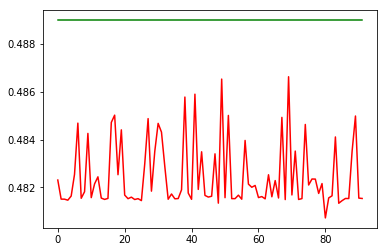

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-22:57:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3000000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-22:57:26
INFO:tensorflow:Saving dict for global step 3000000: global_step = 3000000, loss = 4.7000383e-05
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3000000: ./outputdir/model.ckpt-3000000
error on testset first run {'loss': 4.7000383e-05, 'global_step': 3000000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3000000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 451.423
INFO:tensorflow:loss = 3.8982707e-06, step = 3004601 (0.222 sec)
INFO:tensorflow:global_step/sec: 457.187
INFO:tensorflow:loss = 2.2256893e-06, step = 3004701 (0.219 sec)
INFO:tensorflow:global_step/sec: 466.764
INFO:tensorflow:loss = 1.2778048e-05, step = 3004801 (0.214 sec)
INFO:tensorflow:global_step/sec: 381.553
INFO:tensorflow:loss = 4.3905816e-06, step = 3004901 (0.263 sec)
INFO:tensorflow:global_step/sec: 405.666
INFO:tensorflow:loss = 9.944388e-07, step = 3005001 (0.246 sec)
INFO:tensorflow:global_step/sec: 472.088
INFO:tensorflow:loss = 4.3894577e-10, step = 3005101 (0.212 sec)
INFO:tensorflow:global_step/sec: 401.507
INFO:tensorflow:loss = 2.9429722e-07, step = 3005201 (0.249 sec)
INFO:tensorflow:global_step/sec: 446.763
INFO:tensorflow:loss = 1.2483349e-08, step = 3005301 (0.224 sec)
INFO:tensorflow:global_step/sec: 446.95
INFO:tensorflow:loss = 1.4467801e-06, step = 3005401 (0.224 sec)
INFO:tensorflow:global_step/sec: 399.158
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3010000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3010000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.7370024e-06, step = 3010001
INFO:tensorflow:global_step/sec: 158.908
INFO:tensorflow:loss = 5.5524475e-07, step = 3010101 (0.631 sec)
INFO:tensorflow:global_step/sec: 446.445
INFO:tensorflow:loss = 2.4221708e-07, step = 3010201 (0.224 sec)
INFO:tensorflow:global_step/sec: 424.738
INFO:tensorflow:loss = 5.033535e-07, step = 3010301 (0.236 sec)
INFO:tensorflow:global_step/sec: 404.721
INFO:tensorflow:loss = 1.6652368e-06, step = 3010401 (0.246 sec)
INFO:tensorflow:global_step/sec: 439.101
INFO:tensorflow:loss = 9.1359203e-07, step = 3010501 (0.228 sec)
INFO:tensorflow:global_step/sec: 432.316
INFO:tensorflow:loss = 2.7437233e-07, step = 3010601 (0.231 sec)
INFO:tensorflow:global_step/sec: 425.628
INFO:tensorflow:loss = 5.3685417e-06, s

INFO:tensorflow:loss = 5.453116e-06, step = 3015901 (0.220 sec)
INFO:tensorflow:Saving checkpoints for 3016000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.0042661e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3016000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.84474502231985e-06
prediction at  8 [array([0.48136129])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3016000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3016000 into ./outputdir/mod

INFO:tensorflow:global_step/sec: 434.058
INFO:tensorflow:loss = 1.8293877e-06, step = 3021201 (0.230 sec)
INFO:tensorflow:global_step/sec: 445.595
INFO:tensorflow:loss = 4.1083867e-06, step = 3021301 (0.224 sec)
INFO:tensorflow:global_step/sec: 422.87
INFO:tensorflow:loss = 2.4938577e-06, step = 3021401 (0.237 sec)
INFO:tensorflow:global_step/sec: 433.103
INFO:tensorflow:loss = 5.9722606e-07, step = 3021501 (0.231 sec)
INFO:tensorflow:global_step/sec: 418.293
INFO:tensorflow:loss = 1.5088833e-07, step = 3021601 (0.239 sec)
INFO:tensorflow:global_step/sec: 416.409
INFO:tensorflow:loss = 5.0923873e-08, step = 3021701 (0.240 sec)
INFO:tensorflow:global_step/sec: 427.679
INFO:tensorflow:loss = 5.8209935e-05, step = 3021801 (0.234 sec)
INFO:tensorflow:global_step/sec: 435.125
INFO:tensorflow:loss = 1.3957618e-06, step = 3021901 (0.230 sec)
INFO:tensorflow:Saving checkpoints for 3022000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.2992798e-06.
INFO:tensorflow:Calling m

INFO:tensorflow:loss = 6.7300454e-07, step = 3026401 (0.246 sec)
INFO:tensorflow:global_step/sec: 386.026
INFO:tensorflow:loss = 4.453103e-05, step = 3026501 (0.259 sec)
INFO:tensorflow:global_step/sec: 438.402
INFO:tensorflow:loss = 1.0238977e-06, step = 3026601 (0.228 sec)
INFO:tensorflow:global_step/sec: 446.702
INFO:tensorflow:loss = 1.6165258e-06, step = 3026701 (0.224 sec)
INFO:tensorflow:global_step/sec: 439.192
INFO:tensorflow:loss = 2.2666022e-06, step = 3026801 (0.228 sec)
INFO:tensorflow:global_step/sec: 416.569
INFO:tensorflow:loss = 2.101815e-06, step = 3026901 (0.240 sec)
INFO:tensorflow:global_step/sec: 419.947
INFO:tensorflow:loss = 6.9613293e-07, step = 3027001 (0.238 sec)
INFO:tensorflow:global_step/sec: 456.644
INFO:tensorflow:loss = 2.6826378e-06, step = 3027101 (0.219 sec)
INFO:tensorflow:global_step/sec: 441.164
INFO:tensorflow:loss = 8.778851e-07, step = 3027201 (0.227 sec)
INFO:tensorflow:global_step/sec: 440.614
INFO:tensorflow:loss = 9.4676017e-07, step = 3027

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3032000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3032000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.4823665e-07, step = 3032001
INFO:tensorflow:global_step/sec: 161.739
INFO:tensorflow:loss = 1.3213626e-06, step = 3032101 (0.619 sec)
INFO:tensorflow:global_step/sec: 460.59
INFO:tensorflow:loss = 1.1715048e-06, step = 3032201 (0.217 sec)
INFO:tensorflow:global_step/sec: 441.497
INFO:tensorflow:loss = 1.6839799e-06, step = 3032301 (0.226 sec)
INFO:tensorflow:global_step/sec: 423.078
INFO:tensorflow:loss = 1.3038807e-06, step = 3032401 (0.237 sec)
INFO:tensorflow:global_step/sec: 431.602
INFO:tensorflow:loss = 1.5869554e-06, step = 3032501 (0.231 sec)
INFO:tensorflow:global_step/sec: 444.687
INFO:tensorflow:loss = 1.

INFO:tensorflow:global_step/sec: 396.652
INFO:tensorflow:loss = 3.9314662e-05, step = 3037801 (0.252 sec)
INFO:tensorflow:global_step/sec: 398.976
INFO:tensorflow:loss = 1.9065296e-06, step = 3037901 (0.250 sec)
INFO:tensorflow:Saving checkpoints for 3038000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.6411727e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3038000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 3.541494032879159e-10
prediction at  19 [array([0.48303531])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3038000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3042000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3042000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0024781562, step = 3042001
INFO:tensorflow:global_step/sec: 159.357
INFO:tensorflow:loss = 6.618826e-05, step = 3042101 (0.628 sec)
INFO:tensorflow:global_step/sec: 445.503
INFO:tensorflow:loss = 0.00011258062, step = 3042201 (0.224 sec)
INFO:tensorflow:global_step/sec: 451.203
INFO:tensorflow:loss = 3.1236918e-06, step = 3042301 (0.222 sec)
INFO:tensorflow:global_step/sec: 420.981
INFO:tensorflow:loss = 4.7025503e-07, step = 3042401 (0.237 sec)
INFO:tensorflow:global_step/sec: 406.707
INFO:tensorflow:loss = 4.5557505e-07, step = 3042501 (0.246 sec)
INFO:tensorflow:global_step/sec: 449.691
INFO:tensorflow:loss = 1.9

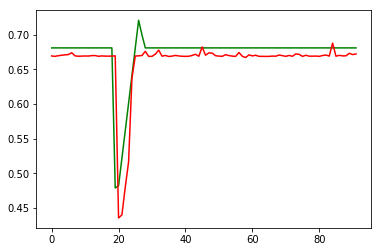

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:00:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3044000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:00:23
INFO:tensorflow:Saving dict for global step 3044000: global_step = 3044000, loss = 0.00075593736
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3044000: ./outputdir/model.ckpt-3044000
error on testset first run {'loss': 0.00075593736, 'global_step': 3044000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3044000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 460.753
INFO:tensorflow:loss = 2.1483007e-05, step = 3048601 (0.217 sec)
INFO:tensorflow:global_step/sec: 440.952
INFO:tensorflow:loss = 1.0978766e-07, step = 3048701 (0.227 sec)
INFO:tensorflow:global_step/sec: 444.711
INFO:tensorflow:loss = 5.7490424e-06, step = 3048801 (0.225 sec)
INFO:tensorflow:global_step/sec: 455.865
INFO:tensorflow:loss = 2.8192521e-06, step = 3048901 (0.219 sec)
INFO:tensorflow:global_step/sec: 443.294
INFO:tensorflow:loss = 1.1314672e-06, step = 3049001 (0.225 sec)
INFO:tensorflow:global_step/sec: 413.177
INFO:tensorflow:loss = 9.379554e-06, step = 3049101 (0.242 sec)
INFO:tensorflow:global_step/sec: 436.931
INFO:tensorflow:loss = 1.897393e-07, step = 3049201 (0.229 sec)
INFO:tensorflow:global_step/sec: 430.257
INFO:tensorflow:loss = 0.0002982292, step = 3049301 (0.233 sec)
INFO:tensorflow:global_step/sec: 420.398
INFO:tensorflow:loss = 0.00012597353, step = 3049401 (0.238 sec)
INFO:tensorflow:global_step/sec: 414.996
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3054000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3054000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.4884854e-05, step = 3054001
INFO:tensorflow:global_step/sec: 161.595
INFO:tensorflow:loss = 1.9511476e-06, step = 3054101 (0.620 sec)
INFO:tensorflow:global_step/sec: 443.351
INFO:tensorflow:loss = 8.9522655e-07, step = 3054201 (0.226 sec)
INFO:tensorflow:global_step/sec: 435.684
INFO:tensorflow:loss = 3.195533e-07, step = 3054301 (0.230 sec)
INFO:tensorflow:global_step/sec: 391.659
INFO:tensorflow:loss = 2.524433e-05, step = 3054401 (0.256 sec)
INFO:tensorflow:global_step/sec: 447.961
INFO:tensorflow:loss = 3.2184857e-07, step = 3054501 (0.223 sec)
INFO:tensorflow:global_step/sec: 433.606
INFO:tensorflow:loss = 7.224459e-05, step = 3054601 (0.231 sec)
INFO:tensorflow:global_step/sec: 436.704
INFO:tensorflow:loss = 2.2144106e-06, ste

INFO:tensorflow:global_step/sec: 436.45
INFO:tensorflow:loss = 6.351671e-07, step = 3059901 (0.229 sec)
INFO:tensorflow:Saving checkpoints for 3060000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.0391076e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3060000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 7.511300686131226e-08
prediction at  8 [array([0.67203693])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3060000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving che

INFO:tensorflow:loss = 8.845229e-06, step = 3065101 (0.221 sec)
INFO:tensorflow:global_step/sec: 464.136
INFO:tensorflow:loss = 4.163092e-07, step = 3065201 (0.216 sec)
INFO:tensorflow:global_step/sec: 447.637
INFO:tensorflow:loss = 8.9351545e-08, step = 3065301 (0.223 sec)
INFO:tensorflow:global_step/sec: 436.146
INFO:tensorflow:loss = 6.930677e-06, step = 3065401 (0.229 sec)
INFO:tensorflow:global_step/sec: 427.1
INFO:tensorflow:loss = 9.945708e-08, step = 3065501 (0.234 sec)
INFO:tensorflow:global_step/sec: 420.375
INFO:tensorflow:loss = 4.235239e-06, step = 3065601 (0.238 sec)
INFO:tensorflow:global_step/sec: 408.477
INFO:tensorflow:loss = 6.8522524e-05, step = 3065701 (0.245 sec)
INFO:tensorflow:global_step/sec: 406.015
INFO:tensorflow:loss = 8.674113e-06, step = 3065801 (0.246 sec)
INFO:tensorflow:global_step/sec: 409.12
INFO:tensorflow:loss = 4.2473528e-07, step = 3065901 (0.245 sec)
INFO:tensorflow:Saving checkpoints for 3066000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss

INFO:tensorflow:global_step/sec: 447.163
INFO:tensorflow:loss = 2.3890884e-06, step = 3070401 (0.224 sec)
INFO:tensorflow:global_step/sec: 436.613
INFO:tensorflow:loss = 1.4390475e-06, step = 3070501 (0.229 sec)
INFO:tensorflow:global_step/sec: 426.679
INFO:tensorflow:loss = 6.8240734e-06, step = 3070601 (0.234 sec)
INFO:tensorflow:global_step/sec: 405.804
INFO:tensorflow:loss = 1.9434954e-06, step = 3070701 (0.246 sec)
INFO:tensorflow:global_step/sec: 449.993
INFO:tensorflow:loss = 7.1065842e-06, step = 3070801 (0.222 sec)
INFO:tensorflow:global_step/sec: 444.32
INFO:tensorflow:loss = 7.726524e-06, step = 3070901 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.131
INFO:tensorflow:loss = 2.4075498e-06, step = 3071001 (0.230 sec)
INFO:tensorflow:global_step/sec: 438.852
INFO:tensorflow:loss = 9.1952666e-07, step = 3071101 (0.228 sec)
INFO:tensorflow:global_step/sec: 445.718
INFO:tensorflow:loss = 3.4761115e-08, step = 3071201 (0.224 sec)
INFO:tensorflow:global_step/sec: 445.653
INFO:te

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3076000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3076000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.7710575e-05, step = 3076001
INFO:tensorflow:global_step/sec: 162.651
INFO:tensorflow:loss = 8.449706e-07, step = 3076101 (0.616 sec)
INFO:tensorflow:global_step/sec: 462.854
INFO:tensorflow:loss = 7.0347254e-05, step = 3076201 (0.216 sec)
INFO:tensorflow:global_step/sec: 442.278
INFO:tensorflow:loss = 1.4960884e-06, step = 3076301 (0.226 sec)
INFO:tensorflow:global_step/sec: 442.513
INFO:tensorflow:loss = 7.027329e-05, step = 3076401 (0.226 sec)
INFO:tensorflow:global_step/sec: 432.062
INFO:tensorflow:loss = 1.4915717e-06, step = 3076501 (0.232 sec)
INFO:tensorflow:global_step/sec: 434.77
INFO:tensorflow:loss = 7.01

INFO:tensorflow:global_step/sec: 407.451
INFO:tensorflow:loss = 2.634628e-06, step = 3081801 (0.246 sec)
INFO:tensorflow:global_step/sec: 392.563
INFO:tensorflow:loss = 6.5995565e-08, step = 3081901 (0.254 sec)
INFO:tensorflow:Saving checkpoints for 3082000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.5539406e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3082000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.915554496220105e-07
prediction at  19 [array([0.66927107])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3082000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3086000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3086000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.11193018, step = 3086001
INFO:tensorflow:global_step/sec: 151.894
INFO:tensorflow:loss = 1.1988448e-07, step = 3086101 (0.660 sec)
INFO:tensorflow:global_step/sec: 407.542
INFO:tensorflow:loss = 0.03175191, step = 3086201 (0.245 sec)
INFO:tensorflow:global_step/sec: 386.089
INFO:tensorflow:loss = 9.173329e-06, step = 3086301 (0.259 sec)
INFO:tensorflow:global_step/sec: 398.778
INFO:tensorflow:loss = 3.5707621e-06, step = 3086401 (0.251 sec)
INFO:tensorflow:global_step/sec: 407.892
INFO:tensorflow:loss = 4.2597924e-07, step = 3086501 (0.245 sec)
INFO:tensorflow:global_step/sec: 432.782
INFO:tensorflow:loss = 6.059822

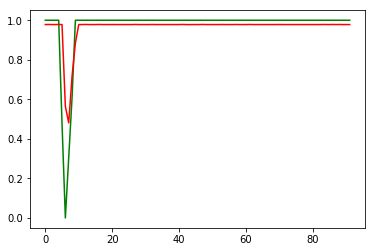

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:03:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3088000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:03:22
INFO:tensorflow:Saving dict for global step 3088000: global_step = 3088000, loss = 0.007013297
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3088000: ./outputdir/model.ckpt-3088000
error on testset first run {'loss': 0.007013297, 'global_step': 3088000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3088000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 411.254
INFO:tensorflow:loss = 3.6744495e-08, step = 3092601 (0.243 sec)
INFO:tensorflow:global_step/sec: 440.054
INFO:tensorflow:loss = 3.73257e-09, step = 3092701 (0.227 sec)
INFO:tensorflow:global_step/sec: 431.403
INFO:tensorflow:loss = 4.1977763e-09, step = 3092801 (0.232 sec)
INFO:tensorflow:global_step/sec: 436.334
INFO:tensorflow:loss = 5.1757674e-09, step = 3092901 (0.229 sec)
INFO:tensorflow:global_step/sec: 440.828
INFO:tensorflow:loss = 1.822622e-08, step = 3093001 (0.226 sec)
INFO:tensorflow:global_step/sec: 383.011
INFO:tensorflow:loss = 7.089116e-08, step = 3093101 (0.261 sec)
INFO:tensorflow:global_step/sec: 445.123
INFO:tensorflow:loss = 1.311037e-08, step = 3093201 (0.225 sec)
INFO:tensorflow:global_step/sec: 439.271
INFO:tensorflow:loss = 2.693378e-07, step = 3093301 (0.228 sec)
INFO:tensorflow:global_step/sec: 446.018
INFO:tensorflow:loss = 1.7873877e-08, step = 3093401 (0.224 sec)
INFO:tensorflow:global_step/sec: 453.441
INFO:tensor

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3098000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3098000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.8781673e-07, step = 3098001
INFO:tensorflow:global_step/sec: 159.187
INFO:tensorflow:loss = 7.8060697e-07, step = 3098101 (0.629 sec)
INFO:tensorflow:global_step/sec: 456.37
INFO:tensorflow:loss = 1.8218287e-07, step = 3098201 (0.219 sec)
INFO:tensorflow:global_step/sec: 445.191
INFO:tensorflow:loss = 4.956026e-07, step = 3098301 (0.225 sec)
INFO:tensorflow:global_step/sec: 437.199
INFO:tensorflow:loss = 1.1135328e-06, step = 3098401 (0.228 sec)
INFO:tensorflow:global_step/sec: 431.447
INFO:tensorflow:loss = 1.2308155e-06, step = 3098501 (0.232 sec)
INFO:tensorflow:global_step/sec: 429.618
INFO:tensorflow:loss = 4.340308e-07, step = 3098601 (0.233 sec)
INFO:tensorflow:global_step/sec: 428.874
INFO:tensorflow:loss = 9.7772514e-08, ste

INFO:tensorflow:global_step/sec: 406.861
INFO:tensorflow:loss = 1.9984014e-09, step = 3103901 (0.245 sec)
INFO:tensorflow:Saving checkpoints for 3104000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.0157827e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3104000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.1281885699522826e-08
prediction at  8 [array([0.9778341])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3104000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving c

INFO:tensorflow:loss = 3.195533e-07, step = 3109101 (0.239 sec)
INFO:tensorflow:global_step/sec: 451.215
INFO:tensorflow:loss = 2.7700116e-07, step = 3109201 (0.221 sec)
INFO:tensorflow:global_step/sec: 430.793
INFO:tensorflow:loss = 3.414812e-07, step = 3109301 (0.232 sec)
INFO:tensorflow:global_step/sec: 430.912
INFO:tensorflow:loss = 4.2178817e-07, step = 3109401 (0.232 sec)
INFO:tensorflow:global_step/sec: 434.586
INFO:tensorflow:loss = 8.134713e-06, step = 3109501 (0.230 sec)
INFO:tensorflow:global_step/sec: 410.357
INFO:tensorflow:loss = 2.4127317e-08, step = 3109601 (0.244 sec)
INFO:tensorflow:global_step/sec: 395.384
INFO:tensorflow:loss = 7.668645e-08, step = 3109701 (0.253 sec)
INFO:tensorflow:global_step/sec: 405.379
INFO:tensorflow:loss = 2.186483e-07, step = 3109801 (0.247 sec)
INFO:tensorflow:global_step/sec: 405.601
INFO:tensorflow:loss = 4.9614247e-08, step = 3109901 (0.247 sec)
INFO:tensorflow:Saving checkpoints for 3110000 into ./outputdir/model.ckpt.
INFO:tensorflow:

INFO:tensorflow:global_step/sec: 431.686
INFO:tensorflow:loss = 2.9693158e-08, step = 3114401 (0.232 sec)
INFO:tensorflow:global_step/sec: 448.992
INFO:tensorflow:loss = 2.9919548e-08, step = 3114501 (0.223 sec)
INFO:tensorflow:global_step/sec: 436.409
INFO:tensorflow:loss = 1.1583303e-09, step = 3114601 (0.230 sec)
INFO:tensorflow:global_step/sec: 438.527
INFO:tensorflow:loss = 1.3675972e-08, step = 3114701 (0.228 sec)
INFO:tensorflow:global_step/sec: 437.159
INFO:tensorflow:loss = 1.0903847e-07, step = 3114801 (0.229 sec)
INFO:tensorflow:global_step/sec: 386.504
INFO:tensorflow:loss = 2.2071562e-07, step = 3114901 (0.259 sec)
INFO:tensorflow:global_step/sec: 430.146
INFO:tensorflow:loss = 1.4114153e-07, step = 3115001 (0.233 sec)
INFO:tensorflow:global_step/sec: 428.74
INFO:tensorflow:loss = 4.3520743e-08, step = 3115101 (0.233 sec)
INFO:tensorflow:global_step/sec: 413.107
INFO:tensorflow:loss = 1.5056436e-09, step = 3115201 (0.242 sec)
INFO:tensorflow:global_step/sec: 382.241
INFO:t

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3120000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3120000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.4802882e-09, step = 3120001
INFO:tensorflow:global_step/sec: 162.652
INFO:tensorflow:loss = 5.7121383e-09, step = 3120101 (0.616 sec)
INFO:tensorflow:global_step/sec: 458.209
INFO:tensorflow:loss = 6.272957e-08, step = 3120201 (0.218 sec)
INFO:tensorflow:global_step/sec: 460.984
INFO:tensorflow:loss = 1.3606357e-08, step = 3120301 (0.217 sec)
INFO:tensorflow:global_step/sec: 457.164
INFO:tensorflow:loss = 1.1644241e-07, step = 3120401 (0.219 sec)
INFO:tensorflow:global_step/sec: 449.166
INFO:tensorflow:loss = 3.826814e-08, step = 3120501 (0.223 sec)
INFO:tensorflow:global_step/sec: 452.27
INFO:tensorflow:loss = 1.83

INFO:tensorflow:global_step/sec: 390.579
INFO:tensorflow:loss = 2.0321156e-07, step = 3125801 (0.256 sec)
INFO:tensorflow:global_step/sec: 441.753
INFO:tensorflow:loss = 4.3919556e-08, step = 3125901 (0.226 sec)
INFO:tensorflow:Saving checkpoints for 3126000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.676735e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3126000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.5238591764592712e-07
prediction at  19 [array([0.97839417])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3126000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3130000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3130000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0004832168, step = 3130001
INFO:tensorflow:global_step/sec: 164.194
INFO:tensorflow:loss = 4.5525326e-09, step = 3130101 (0.610 sec)
INFO:tensorflow:global_step/sec: 460.493
INFO:tensorflow:loss = 0.0019920436, step = 3130201 (0.217 sec)
INFO:tensorflow:global_step/sec: 441.893
INFO:tensorflow:loss = 1.8242318e-08, step = 3130301 (0.226 sec)
INFO:tensorflow:global_step/sec: 425.302
INFO:tensorflow:loss = 3.6241232e-11, step = 3130401 (0.235 sec)
INFO:tensorflow:global_step/sec: 434.394
INFO:tensorflow:loss = 2.4016344e-12, step = 3130501 (0.230 sec)
INFO:tensorflow:global_step/sec: 442.277
INFO:tensorflow:loss = 2.0

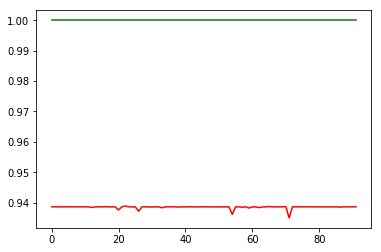

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:06:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3132000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:06:19
INFO:tensorflow:Saving dict for global step 3132000: global_step = 3132000, loss = 0.003773678
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3132000: ./outputdir/model.ckpt-3132000
error on testset first run {'loss': 0.003773678, 'global_step': 3132000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3132000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 455.375
INFO:tensorflow:loss = 9.444653e-06, step = 3136601 (0.220 sec)
INFO:tensorflow:global_step/sec: 456.145
INFO:tensorflow:loss = 1.2623591e-08, step = 3136701 (0.219 sec)
INFO:tensorflow:global_step/sec: 444.46
INFO:tensorflow:loss = 1.8892038e-08, step = 3136801 (0.225 sec)
INFO:tensorflow:global_step/sec: 443.261
INFO:tensorflow:loss = 4.7175547e-08, step = 3136901 (0.226 sec)
INFO:tensorflow:global_step/sec: 448.099
INFO:tensorflow:loss = 1.2825296e-10, step = 3137001 (0.223 sec)
INFO:tensorflow:global_step/sec: 456.011
INFO:tensorflow:loss = 1.1408702e-06, step = 3137101 (0.219 sec)
INFO:tensorflow:global_step/sec: 419.886
INFO:tensorflow:loss = 1.3178706e-08, step = 3137201 (0.238 sec)
INFO:tensorflow:global_step/sec: 428.256
INFO:tensorflow:loss = 3.948328e-06, step = 3137301 (0.234 sec)
INFO:tensorflow:global_step/sec: 440.193
INFO:tensorflow:loss = 1.2892887e-08, step = 3137401 (0.227 sec)
INFO:tensorflow:global_step/sec: 421.361
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3142000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3142000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.820766e-11, step = 3142001
INFO:tensorflow:global_step/sec: 167.999
INFO:tensorflow:loss = 4.498521e-06, step = 3142101 (0.596 sec)
INFO:tensorflow:global_step/sec: 450.045
INFO:tensorflow:loss = 6.5161333e-07, step = 3142201 (0.222 sec)
INFO:tensorflow:global_step/sec: 430.011
INFO:tensorflow:loss = 1.002104e-07, step = 3142301 (0.233 sec)
INFO:tensorflow:global_step/sec: 426.032
INFO:tensorflow:loss = 3.549872e-07, step = 3142401 (0.234 sec)
INFO:tensorflow:global_step/sec: 373.539
INFO:tensorflow:loss = 1.4971092e-06, step = 3142501 (0.268 sec)
INFO:tensorflow:global_step/sec: 430.786
INFO:tensorflow:loss = 2.4192383e-07, step = 3142601 (0.232 sec)
INFO:tensorflow:global_step/sec: 398.452
INFO:tensorflow:loss = 6.5170957e-07, step

INFO:tensorflow:loss = 3.2151593e-06, step = 3147901 (0.252 sec)
INFO:tensorflow:Saving checkpoints for 3148000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.0318138e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3148000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.1764286408268356e-08
prediction at  8 [array([0.93839642])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3148000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3148000 into ./outputdir/

INFO:tensorflow:global_step/sec: 428.971
INFO:tensorflow:loss = 2.5517588e-07, step = 3153201 (0.233 sec)
INFO:tensorflow:global_step/sec: 443.565
INFO:tensorflow:loss = 3.4329481e-09, step = 3153301 (0.225 sec)
INFO:tensorflow:global_step/sec: 444.299
INFO:tensorflow:loss = 1.2423484e-10, step = 3153401 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.079
INFO:tensorflow:loss = 1.3336933e-07, step = 3153501 (0.226 sec)
INFO:tensorflow:global_step/sec: 449.541
INFO:tensorflow:loss = 3.820478e-07, step = 3153601 (0.223 sec)
INFO:tensorflow:global_step/sec: 427.473
INFO:tensorflow:loss = 3.5669387e-07, step = 3153701 (0.234 sec)
INFO:tensorflow:global_step/sec: 418.114
INFO:tensorflow:loss = 1.7919321e-07, step = 3153801 (0.239 sec)
INFO:tensorflow:global_step/sec: 392.846
INFO:tensorflow:loss = 4.1469553e-07, step = 3153901 (0.255 sec)
INFO:tensorflow:Saving checkpoints for 3154000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.5517867e-07.
INFO:tensorflow:Calling m

INFO:tensorflow:loss = 6.189636e-08, step = 3158401 (0.223 sec)
INFO:tensorflow:global_step/sec: 422.468
INFO:tensorflow:loss = 2.1504007e-09, step = 3158501 (0.237 sec)
INFO:tensorflow:global_step/sec: 438.149
INFO:tensorflow:loss = 3.5619567e-07, step = 3158601 (0.229 sec)
INFO:tensorflow:global_step/sec: 440.667
INFO:tensorflow:loss = 5.495301e-07, step = 3158701 (0.226 sec)
INFO:tensorflow:global_step/sec: 428.49
INFO:tensorflow:loss = 4.3396486e-08, step = 3158801 (0.234 sec)
INFO:tensorflow:global_step/sec: 427.56
INFO:tensorflow:loss = 5.2575626e-07, step = 3158901 (0.234 sec)
INFO:tensorflow:global_step/sec: 421.818
INFO:tensorflow:loss = 5.487131e-10, step = 3159001 (0.237 sec)
INFO:tensorflow:global_step/sec: 419.526
INFO:tensorflow:loss = 1.1498258e-07, step = 3159101 (0.238 sec)
INFO:tensorflow:global_step/sec: 433.723
INFO:tensorflow:loss = 8.143516e-09, step = 3159201 (0.231 sec)
INFO:tensorflow:global_step/sec: 429.492
INFO:tensorflow:loss = 7.4295514e-08, step = 3159301

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3164000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3164000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.0732554e-08, step = 3164001
INFO:tensorflow:global_step/sec: 163.518
INFO:tensorflow:loss = 1.9744925e-07, step = 3164101 (0.612 sec)
INFO:tensorflow:global_step/sec: 474.439
INFO:tensorflow:loss = 3.8006095e-07, step = 3164201 (0.211 sec)
INFO:tensorflow:global_step/sec: 454.472
INFO:tensorflow:loss = 1.8422384e-07, step = 3164301 (0.220 sec)
INFO:tensorflow:global_step/sec: 462.721
INFO:tensorflow:loss = 3.7998745e-07, step = 3164401 (0.216 sec)
INFO:tensorflow:global_step/sec: 440.806
INFO:tensorflow:loss = 1.6953715e-07, step = 3164501 (0.227 sec)
INFO:tensorflow:global_step/sec: 465.614
INFO:tensorflow:loss = 3

INFO:tensorflow:global_step/sec: 437.185
INFO:tensorflow:loss = 4.851678e-07, step = 3169801 (0.229 sec)
INFO:tensorflow:global_step/sec: 425.542
INFO:tensorflow:loss = 3.7179948e-08, step = 3169901 (0.236 sec)
INFO:tensorflow:Saving checkpoints for 3170000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.2279266e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3170000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.080462979090171e-06
prediction at  19 [array([0.93847803])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3170000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3174000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3174000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.027208567, step = 3174001
INFO:tensorflow:global_step/sec: 164.343
INFO:tensorflow:loss = 2.3807122e-06, step = 3174101 (0.610 sec)
INFO:tensorflow:global_step/sec: 445.567
INFO:tensorflow:loss = 2.134482e-05, step = 3174201 (0.224 sec)
INFO:tensorflow:global_step/sec: 459.409
INFO:tensorflow:loss = 0.00060786237, step = 3174301 (0.218 sec)
INFO:tensorflow:global_step/sec: 464.078
INFO:tensorflow:loss = 0.00021125698, step = 3174401 (0.215 sec)
INFO:tensorflow:global_step/sec: 452.886
INFO:tensorflow:loss = 3.9625093e-07, step = 3174501 (0.221 sec)
INFO:tensorflow:global_step/sec: 450.449
INFO:tensorflow:loss = 3.89

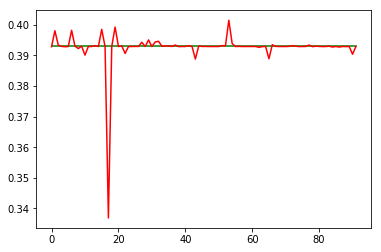

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:09:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3176000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:09:16
INFO:tensorflow:Saving dict for global step 3176000: global_step = 3176000, loss = 2.1792973e-06
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3176000: ./outputdir/model.ckpt-3176000
error on testset first run {'loss': 2.1792973e-06, 'global_step': 3176000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3176000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 429.976
INFO:tensorflow:loss = 2.9059777e-10, step = 3180601 (0.232 sec)
INFO:tensorflow:global_step/sec: 437.053
INFO:tensorflow:loss = 4.249684e-07, step = 3180701 (0.229 sec)
INFO:tensorflow:global_step/sec: 462.702
INFO:tensorflow:loss = 3.637524e-06, step = 3180801 (0.216 sec)
INFO:tensorflow:global_step/sec: 452.395
INFO:tensorflow:loss = 1.1030537e-06, step = 3180901 (0.221 sec)
INFO:tensorflow:global_step/sec: 425.231
INFO:tensorflow:loss = 7.212482e-06, step = 3181001 (0.235 sec)
INFO:tensorflow:global_step/sec: 434.43
INFO:tensorflow:loss = 5.19723e-09, step = 3181101 (0.230 sec)
INFO:tensorflow:global_step/sec: 453.809
INFO:tensorflow:loss = 2.759043e-07, step = 3181201 (0.220 sec)
INFO:tensorflow:global_step/sec: 438.735
INFO:tensorflow:loss = 1.7102766e-05, step = 3181301 (0.228 sec)
INFO:tensorflow:global_step/sec: 406.62
INFO:tensorflow:loss = 6.9151565e-07, step = 3181401 (0.246 sec)
INFO:tensorflow:global_step/sec: 411.448
INFO:tensorfl

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3186000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3186000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.0937e-06, step = 3186001
INFO:tensorflow:global_step/sec: 163.155
INFO:tensorflow:loss = 1.7148399e-05, step = 3186101 (0.614 sec)
INFO:tensorflow:global_step/sec: 447.612
INFO:tensorflow:loss = 2.44068e-06, step = 3186201 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.065
INFO:tensorflow:loss = 8.752936e-06, step = 3186301 (0.225 sec)
INFO:tensorflow:global_step/sec: 419.47
INFO:tensorflow:loss = 4.0052632e-06, step = 3186401 (0.239 sec)
INFO:tensorflow:global_step/sec: 435.504
INFO:tensorflow:loss = 7.814918e-06, step = 3186501 (0.229 sec)
INFO:tensorflow:global_step/sec: 446.401
INFO:tensorflow:loss = 1.231543e-06, step = 3186601 (0.224 sec)
INFO:tensorflow:global_step/sec: 458.68
INFO:tensorflow:loss = 9.2676255e-06, step = 318

INFO:tensorflow:loss = 3.2540725e-06, step = 3191901 (0.224 sec)
INFO:tensorflow:Saving checkpoints for 3192000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.4362202e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3192000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.8903063134424962e-06
prediction at  8 [array([0.3937771])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3192000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3192000 into ./outputdir/m

INFO:tensorflow:global_step/sec: 388.583
INFO:tensorflow:loss = 2.223378e-06, step = 3197201 (0.257 sec)
INFO:tensorflow:global_step/sec: 440.465
INFO:tensorflow:loss = 2.72301e-08, step = 3197301 (0.227 sec)
INFO:tensorflow:global_step/sec: 444.335
INFO:tensorflow:loss = 8.037898e-07, step = 3197401 (0.225 sec)
INFO:tensorflow:global_step/sec: 440.808
INFO:tensorflow:loss = 4.6914397e-06, step = 3197501 (0.227 sec)
INFO:tensorflow:global_step/sec: 390.99
INFO:tensorflow:loss = 3.8221515e-10, step = 3197601 (0.256 sec)
INFO:tensorflow:global_step/sec: 438.646
INFO:tensorflow:loss = 2.912179e-06, step = 3197701 (0.228 sec)
INFO:tensorflow:global_step/sec: 433.015
INFO:tensorflow:loss = 5.5020805e-06, step = 3197801 (0.231 sec)
INFO:tensorflow:global_step/sec: 432.863
INFO:tensorflow:loss = 2.1745009e-06, step = 3197901 (0.231 sec)
INFO:tensorflow:Saving checkpoints for 3198000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.7519449e-06.
INFO:tensorflow:Calling model_

INFO:tensorflow:loss = 1.322185e-06, step = 3202401 (0.234 sec)
INFO:tensorflow:global_step/sec: 420.858
INFO:tensorflow:loss = 2.0124837e-06, step = 3202501 (0.238 sec)
INFO:tensorflow:global_step/sec: 413.474
INFO:tensorflow:loss = 1.2369067e-06, step = 3202601 (0.242 sec)
INFO:tensorflow:global_step/sec: 431.531
INFO:tensorflow:loss = 6.302837e-07, step = 3202701 (0.232 sec)
INFO:tensorflow:global_step/sec: 413.914
INFO:tensorflow:loss = 7.477825e-07, step = 3202801 (0.242 sec)
INFO:tensorflow:global_step/sec: 423.712
INFO:tensorflow:loss = 5.542237e-09, step = 3202901 (0.236 sec)
INFO:tensorflow:global_step/sec: 442.376
INFO:tensorflow:loss = 4.0811983e-07, step = 3203001 (0.226 sec)
INFO:tensorflow:global_step/sec: 442.954
INFO:tensorflow:loss = 3.5490197e-05, step = 3203101 (0.226 sec)
INFO:tensorflow:global_step/sec: 433.221
INFO:tensorflow:loss = 2.5536057e-08, step = 3203201 (0.231 sec)
INFO:tensorflow:global_step/sec: 437.769
INFO:tensorflow:loss = 1.929724e-07, step = 320330

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3208000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3208000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.550227e-07, step = 3208001
INFO:tensorflow:global_step/sec: 164.001
INFO:tensorflow:loss = 9.094947e-11, step = 3208101 (0.611 sec)
INFO:tensorflow:global_step/sec: 463.516
INFO:tensorflow:loss = 2.421999e-08, step = 3208201 (0.216 sec)
INFO:tensorflow:global_step/sec: 458.785
INFO:tensorflow:loss = 6.6609473e-10, step = 3208301 (0.218 sec)
INFO:tensorflow:global_step/sec: 452.338
INFO:tensorflow:loss = 4.1274973e-08, step = 3208401 (0.222 sec)
INFO:tensorflow:global_step/sec: 442.11
INFO:tensorflow:loss = 6.5662684e-09, step = 3208501 (0.226 sec)
INFO:tensorflow:global_step/sec: 436.176
INFO:tensorflow:loss = 8.007

INFO:tensorflow:global_step/sec: 378.731
INFO:tensorflow:loss = 7.677059e-09, step = 3213801 (0.264 sec)
INFO:tensorflow:global_step/sec: 384.18
INFO:tensorflow:loss = 2.5014877e-08, step = 3213901 (0.260 sec)
INFO:tensorflow:Saving checkpoints for 3214000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.180412e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3214000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 9.903070207859673e-08
prediction at  19 [array([0.3931858])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3214000
INF

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3218000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3218000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.1457564, step = 3218001
INFO:tensorflow:global_step/sec: 163.276
INFO:tensorflow:loss = 2.5330464e-05, step = 3218101 (0.613 sec)
INFO:tensorflow:global_step/sec: 455.66
INFO:tensorflow:loss = 0.0002379983, step = 3218201 (0.220 sec)
INFO:tensorflow:global_step/sec: 455.274
INFO:tensorflow:loss = 0.0015071357, step = 3218301 (0.220 sec)
INFO:tensorflow:global_step/sec: 450.323
INFO:tensorflow:loss = 0.0016877091, step = 3218401 (0.223 sec)
INFO:tensorflow:global_step/sec: 440.102
INFO:tensorflow:loss = 4.791265e-07, step = 3218501 (0.227 sec)
INFO:tensorflow:global_step/sec: 430.239
INFO:tensorflow:loss = 0.00034773

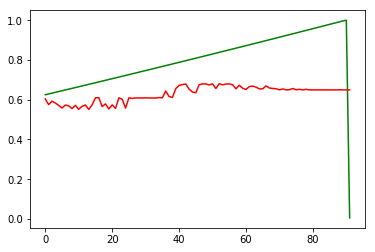

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:12:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3220000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:12:13
INFO:tensorflow:Saving dict for global step 3220000: global_step = 3220000, loss = 0.051048726
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3220000: ./outputdir/model.ckpt-3220000
error on testset first run {'loss': 0.051048726, 'global_step': 3220000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3220000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 433.078
INFO:tensorflow:loss = 5.302456e-06, step = 3224601 (0.231 sec)
INFO:tensorflow:global_step/sec: 424.998
INFO:tensorflow:loss = 6.727112e-05, step = 3224701 (0.235 sec)
INFO:tensorflow:global_step/sec: 438.564
INFO:tensorflow:loss = 0.00014354604, step = 3224801 (0.228 sec)
INFO:tensorflow:global_step/sec: 447.807
INFO:tensorflow:loss = 1.0889287e-05, step = 3224901 (0.223 sec)
INFO:tensorflow:global_step/sec: 433.995
INFO:tensorflow:loss = 0.00061576464, step = 3225001 (0.231 sec)
INFO:tensorflow:global_step/sec: 449.792
INFO:tensorflow:loss = 3.2303537e-06, step = 3225101 (0.222 sec)
INFO:tensorflow:global_step/sec: 443.347
INFO:tensorflow:loss = 4.8932005e-05, step = 3225201 (0.226 sec)
INFO:tensorflow:global_step/sec: 449.091
INFO:tensorflow:loss = 0.0007368914, step = 3225301 (0.223 sec)
INFO:tensorflow:global_step/sec: 439.286
INFO:tensorflow:loss = 7.5836535e-05, step = 3225401 (0.228 sec)
INFO:tensorflow:global_step/sec: 454.364
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3230000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3230000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.1313015e-05, step = 3230001
INFO:tensorflow:global_step/sec: 164.086
INFO:tensorflow:loss = 0.00021654573, step = 3230101 (0.610 sec)
INFO:tensorflow:global_step/sec: 453.572
INFO:tensorflow:loss = 4.655256e-05, step = 3230201 (0.220 sec)
INFO:tensorflow:global_step/sec: 462.982
INFO:tensorflow:loss = 4.6626606e-05, step = 3230301 (0.216 sec)
INFO:tensorflow:global_step/sec: 466.76
INFO:tensorflow:loss = 1.640891e-05, step = 3230401 (0.214 sec)
INFO:tensorflow:global_step/sec: 458.435
INFO:tensorflow:loss = 9.147712e-06, step = 3230501 (0.218 sec)
INFO:tensorflow:global_step/sec: 425.572
INFO:tensorflow:loss = 5.0799892e-05, step = 3230601 (0.235 sec)
INFO:tensorflow:global_step/sec: 437.205
INFO:tensorflow:loss = 4.0219373e-05, step

INFO:tensorflow:global_step/sec: 408.475
INFO:tensorflow:loss = 4.4489672e-05, step = 3235901 (0.245 sec)
INFO:tensorflow:Saving checkpoints for 3236000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 8.2676985e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3236000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 9.294448251436086e-06
prediction at  8 [array([0.65658307])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3236000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving c

INFO:tensorflow:loss = 4.9172457e-05, step = 3241101 (0.221 sec)
INFO:tensorflow:global_step/sec: 456.294
INFO:tensorflow:loss = 4.4190412e-05, step = 3241201 (0.219 sec)
INFO:tensorflow:global_step/sec: 439.813
INFO:tensorflow:loss = 1.7628332e-05, step = 3241301 (0.227 sec)
INFO:tensorflow:global_step/sec: 444.502
INFO:tensorflow:loss = 0.00020129404, step = 3241401 (0.225 sec)
INFO:tensorflow:global_step/sec: 414.706
INFO:tensorflow:loss = 0.0006753629, step = 3241501 (0.241 sec)
INFO:tensorflow:global_step/sec: 425.874
INFO:tensorflow:loss = 3.0109404e-05, step = 3241601 (0.235 sec)
INFO:tensorflow:global_step/sec: 434.131
INFO:tensorflow:loss = 5.2937554e-05, step = 3241701 (0.231 sec)
INFO:tensorflow:global_step/sec: 412.083
INFO:tensorflow:loss = 4.911563e-05, step = 3241801 (0.242 sec)
INFO:tensorflow:global_step/sec: 414.575
INFO:tensorflow:loss = 4.4168224e-05, step = 3241901 (0.241 sec)
INFO:tensorflow:Saving checkpoints for 3242000 into ./outputdir/model.ckpt.
INFO:tensorfl

INFO:tensorflow:global_step/sec: 447.211
INFO:tensorflow:loss = 9.634639e-06, step = 3246401 (0.224 sec)
INFO:tensorflow:global_step/sec: 426.472
INFO:tensorflow:loss = 8.456414e-06, step = 3246501 (0.234 sec)
INFO:tensorflow:global_step/sec: 426.478
INFO:tensorflow:loss = 9.678126e-07, step = 3246601 (0.235 sec)
INFO:tensorflow:global_step/sec: 443.591
INFO:tensorflow:loss = 1.915346e-06, step = 3246701 (0.226 sec)
INFO:tensorflow:global_step/sec: 421.005
INFO:tensorflow:loss = 7.641599e-06, step = 3246801 (0.238 sec)
INFO:tensorflow:global_step/sec: 413.909
INFO:tensorflow:loss = 5.146136e-05, step = 3246901 (0.241 sec)
INFO:tensorflow:global_step/sec: 444.014
INFO:tensorflow:loss = 8.576086e-06, step = 3247001 (0.225 sec)
INFO:tensorflow:global_step/sec: 420.704
INFO:tensorflow:loss = 1.0495213e-05, step = 3247101 (0.238 sec)
INFO:tensorflow:global_step/sec: 439.132
INFO:tensorflow:loss = 4.2903707e-06, step = 3247201 (0.227 sec)
INFO:tensorflow:global_step/sec: 433.808
INFO:tensorf

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3252000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3252000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 8.506754e-06, step = 3252001
INFO:tensorflow:global_step/sec: 169.638
INFO:tensorflow:loss = 9.178023e-06, step = 3252101 (0.591 sec)
INFO:tensorflow:global_step/sec: 454.256
INFO:tensorflow:loss = 7.761024e-06, step = 3252201 (0.220 sec)
INFO:tensorflow:global_step/sec: 452.315
INFO:tensorflow:loss = 9.152761e-06, step = 3252301 (0.221 sec)
INFO:tensorflow:global_step/sec: 449.442
INFO:tensorflow:loss = 7.762353e-06, step = 3252401 (0.223 sec)
INFO:tensorflow:global_step/sec: 446.07
INFO:tensorflow:loss = 9.157089e-06, step = 3252501 (0.224 sec)
INFO:tensorflow:global_step/sec: 440.511
INFO:tensorflow:loss = 7.764013

INFO:tensorflow:global_step/sec: 382.313
INFO:tensorflow:loss = 7.3301326e-06, step = 3257801 (0.262 sec)
INFO:tensorflow:global_step/sec: 403.696
INFO:tensorflow:loss = 5.209441e-05, step = 3257901 (0.248 sec)
INFO:tensorflow:Saving checkpoints for 3258000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.2306832e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3258000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.6104683253427423e-08
prediction at  19 [array([0.65246574])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3258000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3262000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3262000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.001358973, step = 3262001
INFO:tensorflow:global_step/sec: 163.378
INFO:tensorflow:loss = 4.124723e-09, step = 3262101 (0.613 sec)
INFO:tensorflow:global_step/sec: 458.96
INFO:tensorflow:loss = 5.363088e-06, step = 3262201 (0.218 sec)
INFO:tensorflow:global_step/sec: 453.704
INFO:tensorflow:loss = 0.00040471405, step = 3262301 (0.220 sec)
INFO:tensorflow:global_step/sec: 447.389
INFO:tensorflow:loss = 0.0011754066, step = 3262401 (0.223 sec)
INFO:tensorflow:global_step/sec: 452.123
INFO:tensorflow:loss = 5.753884e-09, step = 3262501 (0.222 sec)
INFO:tensorflow:global_step/sec: 447.72
INFO:tensorflow:loss = 5.3970982

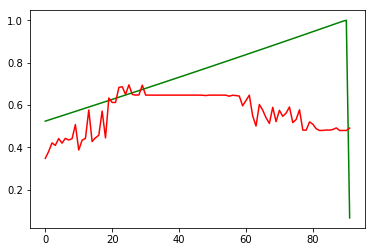

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:15:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3264000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:15:10
INFO:tensorflow:Saving dict for global step 3264000: global_step = 3264000, loss = 0.07031645
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3264000: ./outputdir/model.ckpt-3264000
error on testset first run {'loss': 0.07031645, 'global_step': 3264000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3264000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:global_step/sec: 428.031
INFO:tensorflow:loss = 3.1471222e-06, step = 3268601 (0.234 sec)
INFO:tensorflow:global_step/sec: 438.416
INFO:tensorflow:loss = 2.8406002e-05, step = 3268701 (0.228 sec)
INFO:tensorflow:global_step/sec: 442.38
INFO:tensorflow:loss = 0.0004964452, step = 3268801 (0.226 sec)
INFO:tensorflow:global_step/sec: 461.155
INFO:tensorflow:loss = 0.00010452377, step = 3268901 (0.217 sec)
INFO:tensorflow:global_step/sec: 447.301
INFO:tensorflow:loss = 7.9388104e-05, step = 3269001 (0.224 sec)
INFO:tensorflow:global_step/sec: 442.149
INFO:tensorflow:loss = 0.00090838264, step = 3269101 (0.226 sec)
INFO:tensorflow:global_step/sec: 434.226
INFO:tensorflow:loss = 0.0010313453, step = 3269201 (0.231 sec)
INFO:tensorflow:global_step/sec: 419.727
INFO:tensorflow:loss = 0.010158569, step = 3269301 (0.238 sec)
INFO:tensorflow:global_step/sec: 440.166
INFO:tensorflow:loss = 0.00010439584, step = 3269401 (0.227 sec)
INFO:tensorflow:global_step/sec: 431.337
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3274000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.516427e-05, step = 3274001
INFO:tensorflow:global_step/sec: 166.752
INFO:tensorflow:loss = 0.0011424001, step = 3274101 (0.601 sec)
INFO:tensorflow:global_step/sec: 463.329
INFO:tensorflow:loss = 0.0047230995, step = 3274201 (0.216 sec)
INFO:tensorflow:global_step/sec: 472.755
INFO:tensorflow:loss = 0.00028278053, step = 3274301 (0.212 sec)
INFO:tensorflow:global_step/sec: 461.121
INFO:tensorflow:loss = 7.463606e-05, step = 3274401 (0.217 sec)
INFO:tensorflow:global_step/sec: 435.806
INFO:tensorflow:loss = 0.0017666041, step = 3274501 (0.230 sec)
INFO:tensorflow:global_step/sec: 458.532
INFO:tensorflow:loss = 1.2287473e-05, step = 3274601 (0.218 sec)
INFO:tensorflow:global_step/sec: 440.696
INFO:tensorflow:loss = 0.00033530014, step = 3274701 (0.227 sec)
INFO:tensorflow:global_step/sec: 441.687
INFO:tenso

INFO:tensorflow:Saving checkpoints for 3280000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.0027182065.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3280000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.9633506710720932e-05
prediction at  8 [array([0.53089773])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3280000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3280000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0006336864, step = 3280001
IN

INFO:tensorflow:loss = 0.0001426562, step = 3285201 (0.235 sec)
INFO:tensorflow:global_step/sec: 436.506
INFO:tensorflow:loss = 0.00020941658, step = 3285301 (0.229 sec)
INFO:tensorflow:global_step/sec: 434.341
INFO:tensorflow:loss = 1.301801e-05, step = 3285401 (0.230 sec)
INFO:tensorflow:global_step/sec: 470.17
INFO:tensorflow:loss = 1.9313825e-06, step = 3285501 (0.213 sec)
INFO:tensorflow:global_step/sec: 451.623
INFO:tensorflow:loss = 0.0034331507, step = 3285601 (0.222 sec)
INFO:tensorflow:global_step/sec: 438.648
INFO:tensorflow:loss = 1.2311722e-05, step = 3285701 (0.228 sec)
INFO:tensorflow:global_step/sec: 443.696
INFO:tensorflow:loss = 1.9138614e-08, step = 3285801 (0.226 sec)
INFO:tensorflow:global_step/sec: 403.063
INFO:tensorflow:loss = 0.0002226899, step = 3285901 (0.248 sec)
INFO:tensorflow:Saving checkpoints for 3286000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 0.00032493862.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_f

INFO:tensorflow:global_step/sec: 434.365
INFO:tensorflow:loss = 2.9316658e-07, step = 3290501 (0.230 sec)
INFO:tensorflow:global_step/sec: 438.62
INFO:tensorflow:loss = 3.2081093e-06, step = 3290601 (0.228 sec)
INFO:tensorflow:global_step/sec: 450.548
INFO:tensorflow:loss = 2.982553e-05, step = 3290701 (0.222 sec)
INFO:tensorflow:global_step/sec: 443.372
INFO:tensorflow:loss = 0.0002594573, step = 3290801 (0.226 sec)
INFO:tensorflow:global_step/sec: 391.157
INFO:tensorflow:loss = 8.657859e-05, step = 3290901 (0.256 sec)
INFO:tensorflow:global_step/sec: 440.441
INFO:tensorflow:loss = 1.9606505e-06, step = 3291001 (0.227 sec)
INFO:tensorflow:global_step/sec: 428.559
INFO:tensorflow:loss = 0.0036068629, step = 3291101 (0.233 sec)
INFO:tensorflow:global_step/sec: 451.951
INFO:tensorflow:loss = 0.0029512881, step = 3291201 (0.222 sec)
INFO:tensorflow:global_step/sec: 451.606
INFO:tensorflow:loss = 0.0038413368, step = 3291301 (0.221 sec)
INFO:tensorflow:global_step/sec: 455.261
INFO:tensorf

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3296000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3296000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.5947268e-06, step = 3296001
INFO:tensorflow:global_step/sec: 163.334
INFO:tensorflow:loss = 2.0247066e-05, step = 3296101 (0.613 sec)
INFO:tensorflow:global_step/sec: 396.806
INFO:tensorflow:loss = 1.4754982e-05, step = 3296201 (0.252 sec)
INFO:tensorflow:global_step/sec: 437.203
INFO:tensorflow:loss = 2.7898104e-05, step = 3296301 (0.229 sec)
INFO:tensorflow:global_step/sec: 436.506
INFO:tensorflow:loss = 5.769927e-10, step = 3296401 (0.229 sec)
INFO:tensorflow:global_step/sec: 432.741
INFO:tensorflow:loss = 2.7574151e-05, step = 3296501 (0.231 sec)
INFO:tensorflow:global_step/sec: 387.596
INFO:tensorflow:loss = 1.7711014e-05, step = 3296601 (0.258 sec)

INFO:tensorflow:loss = 8.382047e-06, step = 3301801 (0.288 sec)
INFO:tensorflow:global_step/sec: 438.314
INFO:tensorflow:loss = 3.4435163e-06, step = 3301901 (0.228 sec)
INFO:tensorflow:Saving checkpoints for 3302000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.990475e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3302000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.5003562774488246e-05
prediction at  19 [array([0.52856474])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3302000
INFO:tensorflow:Running local_init_op.
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3306000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3306000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.14660183, step = 3306001
INFO:tensorflow:global_step/sec: 161.465
INFO:tensorflow:loss = 7.908568e-07, step = 3306101 (0.621 sec)
INFO:tensorflow:global_step/sec: 445.174
INFO:tensorflow:loss = 0.0033168287, step = 3306201 (0.224 sec)
INFO:tensorflow:global_step/sec: 440.526
INFO:tensorflow:loss = 3.961759e-09, step = 3306301 (0.227 sec)
INFO:tensorflow:global_step/sec: 434.834
INFO:tensorflow:loss = 1.8974053e-08, step = 3306401 (0.230 sec)
INFO:tensorflow:global_step/sec: 438.264
INFO:tensorflow:loss = 6.190248e-11, step = 3306501 (0.229 sec)
INFO:tensorflow:global_step/sec: 441.154
INFO:tensorflow:loss = 8.308694

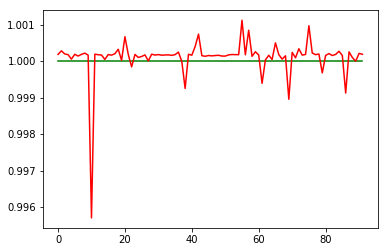

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:18:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3308000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:18:06
INFO:tensorflow:Saving dict for global step 3308000: global_step = 3308000, loss = 6.0918586e-07
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3308000: ./outputdir/model.ckpt-3308000
error on testset first run {'loss': 6.0918586e-07, 'global_step': 3308000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3308000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 417.401
INFO:tensorflow:loss = 4.3301043e-09, step = 3312601 (0.239 sec)
INFO:tensorflow:global_step/sec: 367.003
INFO:tensorflow:loss = 7.4695805e-09, step = 3312701 (0.272 sec)
INFO:tensorflow:global_step/sec: 430.697
INFO:tensorflow:loss = 2.2110783e-07, step = 3312801 (0.232 sec)
INFO:tensorflow:global_step/sec: 379.404
INFO:tensorflow:loss = 3.784953e-08, step = 3312901 (0.263 sec)
INFO:tensorflow:global_step/sec: 422.863
INFO:tensorflow:loss = 5.3263648e-08, step = 3313001 (0.237 sec)
INFO:tensorflow:global_step/sec: 430.495
INFO:tensorflow:loss = 2.914112e-08, step = 3313101 (0.232 sec)
INFO:tensorflow:global_step/sec: 416.458
INFO:tensorflow:loss = 8.9387356e-07, step = 3313201 (0.240 sec)
INFO:tensorflow:global_step/sec: 420.557
INFO:tensorflow:loss = 3.7294967e-08, step = 3313301 (0.238 sec)
INFO:tensorflow:global_step/sec: 432.578
INFO:tensorflow:loss = 2.8372952e-08, step = 3313401 (0.231 sec)
INFO:tensorflow:global_step/sec: 391.957
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3318000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3318000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.615277e-08, step = 3318001
INFO:tensorflow:global_step/sec: 164.067
INFO:tensorflow:loss = 1.3107196e-07, step = 3318101 (0.610 sec)
INFO:tensorflow:global_step/sec: 462.542
INFO:tensorflow:loss = 1.4734383e-09, step = 3318201 (0.216 sec)
INFO:tensorflow:global_step/sec: 476.744
INFO:tensorflow:loss = 2.7773751e-08, step = 3318301 (0.210 sec)
INFO:tensorflow:global_step/sec: 450.169
INFO:tensorflow:loss = 4.106937e-10, step = 3318401 (0.222 sec)
INFO:tensorflow:global_step/sec: 451.272
INFO:tensorflow:loss = 4.2679304e-08, step = 3318501 (0.222 sec)
INFO:tensorflow:global_step/sec: 432.638
INFO:tensorflow:loss = 7.387385e-09, step = 3318601 (0.231 sec)
INFO:tensorflow:global_step/sec: 433.696
INFO:tensorflow:loss = 3.3821496e-07, ste

INFO:tensorflow:global_step/sec: 439.103
INFO:tensorflow:loss = 4.0583836e-07, step = 3323901 (0.227 sec)
INFO:tensorflow:Saving checkpoints for 3324000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.7383229e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3324000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.1634919827348656e-08
prediction at  8 [array([1.00081991])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3324000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving 

INFO:tensorflow:loss = 1.9808542e-07, step = 3329101 (0.228 sec)
INFO:tensorflow:global_step/sec: 422.05
INFO:tensorflow:loss = 2.1681268e-07, step = 3329201 (0.237 sec)
INFO:tensorflow:global_step/sec: 427.257
INFO:tensorflow:loss = 1.5564851e-07, step = 3329301 (0.234 sec)
INFO:tensorflow:global_step/sec: 433.849
INFO:tensorflow:loss = 1.3495342e-06, step = 3329401 (0.230 sec)
INFO:tensorflow:global_step/sec: 438.579
INFO:tensorflow:loss = 5.00229e-07, step = 3329501 (0.228 sec)
INFO:tensorflow:global_step/sec: 432.539
INFO:tensorflow:loss = 1.8924823e-08, step = 3329601 (0.231 sec)
INFO:tensorflow:global_step/sec: 443.979
INFO:tensorflow:loss = 2.3297845e-07, step = 3329701 (0.225 sec)
INFO:tensorflow:global_step/sec: 439.27
INFO:tensorflow:loss = 2.0617792e-07, step = 3329801 (0.228 sec)
INFO:tensorflow:global_step/sec: 436.135
INFO:tensorflow:loss = 2.1915027e-07, step = 3329901 (0.229 sec)
INFO:tensorflow:Saving checkpoints for 3330000 into ./outputdir/model.ckpt.
INFO:tensorflow

INFO:tensorflow:global_step/sec: 438.385
INFO:tensorflow:loss = 9.6435215e-08, step = 3334401 (0.228 sec)
INFO:tensorflow:global_step/sec: 433.14
INFO:tensorflow:loss = 3.951408e-08, step = 3334501 (0.231 sec)
INFO:tensorflow:global_step/sec: 439.91
INFO:tensorflow:loss = 6.978462e-08, step = 3334601 (0.227 sec)
INFO:tensorflow:global_step/sec: 438.212
INFO:tensorflow:loss = 3.5700864e-08, step = 3334701 (0.228 sec)
INFO:tensorflow:global_step/sec: 426.483
INFO:tensorflow:loss = 1.16401736e-07, step = 3334801 (0.235 sec)
INFO:tensorflow:global_step/sec: 448.543
INFO:tensorflow:loss = 2.3942505e-08, step = 3334901 (0.222 sec)
INFO:tensorflow:global_step/sec: 456.16
INFO:tensorflow:loss = 5.0555485e-07, step = 3335001 (0.219 sec)
INFO:tensorflow:global_step/sec: 442.468
INFO:tensorflow:loss = 2.1393589e-07, step = 3335101 (0.226 sec)
INFO:tensorflow:global_step/sec: 446.841
INFO:tensorflow:loss = 8.75082e-08, step = 3335201 (0.224 sec)
INFO:tensorflow:global_step/sec: 456.296
INFO:tensor

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3340000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3340000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.0437267e-08, step = 3340001
INFO:tensorflow:global_step/sec: 166.356
INFO:tensorflow:loss = 7.6752485e-08, step = 3340101 (0.602 sec)
INFO:tensorflow:global_step/sec: 444.654
INFO:tensorflow:loss = 6.2550555e-08, step = 3340201 (0.225 sec)
INFO:tensorflow:global_step/sec: 454.112
INFO:tensorflow:loss = 3.9822737e-08, step = 3340301 (0.220 sec)
INFO:tensorflow:global_step/sec: 450.211
INFO:tensorflow:loss = 7.387371e-08, step = 3340401 (0.222 sec)
INFO:tensorflow:global_step/sec: 428.183
INFO:tensorflow:loss = 3.52518e-08, step = 3340501 (0.234 sec)
INFO:tensorflow:global_step/sec: 453.207
INFO:tensorflow:loss = 9.17

INFO:tensorflow:global_step/sec: 445.449
INFO:tensorflow:loss = 2.9711708e-07, step = 3345801 (0.224 sec)
INFO:tensorflow:global_step/sec: 453.451
INFO:tensorflow:loss = 8.22985e-08, step = 3345901 (0.221 sec)
INFO:tensorflow:Saving checkpoints for 3346000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.2290968e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3346000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.842541321766189e-09
prediction at  19 [array([1.0005369])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3346000
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3350000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3350000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0053025214, step = 3350001
INFO:tensorflow:global_step/sec: 167.204
INFO:tensorflow:loss = 7.4764157e-06, step = 3350101 (0.599 sec)
INFO:tensorflow:global_step/sec: 461.823
INFO:tensorflow:loss = 0.00035566825, step = 3350201 (0.217 sec)
INFO:tensorflow:global_step/sec: 444.949
INFO:tensorflow:loss = 6.379585e-08, step = 3350301 (0.225 sec)
INFO:tensorflow:global_step/sec: 426.485
INFO:tensorflow:loss = 0.00676164, step = 3350401 (0.235 sec)
INFO:tensorflow:global_step/sec: 420.86
INFO:tensorflow:loss = 2.1489116e-06, step = 3350501 (0.237 sec)
INFO:tensorflow:global_step/sec: 431.477
INFO:tensorflow:loss = 0.00719

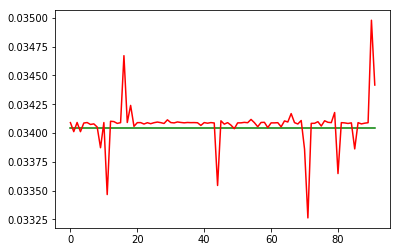

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:21:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3352000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:21:02
INFO:tensorflow:Saving dict for global step 3352000: global_step = 3352000, loss = 6.171266e-07
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3352000: ./outputdir/model.ckpt-3352000
error on testset first run {'loss': 6.171266e-07, 'global_step': 3352000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3352000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 431.695
INFO:tensorflow:loss = 2.2755136e-09, step = 3356601 (0.232 sec)
INFO:tensorflow:global_step/sec: 388.798
INFO:tensorflow:loss = 1.9324595e-08, step = 3356701 (0.257 sec)
INFO:tensorflow:global_step/sec: 450.731
INFO:tensorflow:loss = 2.3485867e-08, step = 3356801 (0.222 sec)
INFO:tensorflow:global_step/sec: 438.293
INFO:tensorflow:loss = 1.0340537e-09, step = 3356901 (0.228 sec)
INFO:tensorflow:global_step/sec: 440.76
INFO:tensorflow:loss = 6.872336e-05, step = 3357001 (0.227 sec)
INFO:tensorflow:global_step/sec: 441.234
INFO:tensorflow:loss = 6.348197e-08, step = 3357101 (0.227 sec)
INFO:tensorflow:global_step/sec: 433.313
INFO:tensorflow:loss = 8.316643e-08, step = 3357201 (0.231 sec)
INFO:tensorflow:global_step/sec: 414.738
INFO:tensorflow:loss = 4.791799e-08, step = 3357301 (0.241 sec)
INFO:tensorflow:global_step/sec: 390.073
INFO:tensorflow:loss = 5.8900966e-08, step = 3357401 (0.256 sec)
INFO:tensorflow:global_step/sec: 400.179
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3362000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.2098523e-07, step = 3362001
INFO:tensorflow:global_step/sec: 164.296
INFO:tensorflow:loss = 2.5192696e-07, step = 3362101 (0.610 sec)
INFO:tensorflow:global_step/sec: 460.426
INFO:tensorflow:loss = 4.8470605e-07, step = 3362201 (0.217 sec)
INFO:tensorflow:global_step/sec: 453.235
INFO:tensorflow:loss = 5.442297e-09, step = 3362301 (0.221 sec)
INFO:tensorflow:global_step/sec: 449.115
INFO:tensorflow:loss = 3.5341307e-07, step = 3362401 (0.222 sec)
INFO:tensorflow:global_step/sec: 438.934
INFO:tensorflow:loss = 7.797054e-07, step = 3362501 (0.228 sec)
INFO:tensorflow:global_step/sec: 431.796
INFO:tensorflow:loss = 1.139804e-06, step = 3362601 (0.232 sec)
INFO:tensorflow:global_step/sec: 438.982
INFO:tensorflow:loss = 5.8003913e-08, step = 3362701 (0.228 sec)
INFO:tensorflow:global_step/sec: 438.429
INFO:ten

INFO:tensorflow:Saving checkpoints for 3368000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.3626361e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3368000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 3.0015790800165133e-07
prediction at  8 [array([0.03443086])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3368000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3368000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.1787819e-07, step = 3368001


INFO:tensorflow:loss = 1.6904931e-06, step = 3373201 (0.227 sec)
INFO:tensorflow:global_step/sec: 399.936
INFO:tensorflow:loss = 6.4265293e-10, step = 3373301 (0.250 sec)
INFO:tensorflow:global_step/sec: 432.096
INFO:tensorflow:loss = 7.4187324e-07, step = 3373401 (0.232 sec)
INFO:tensorflow:global_step/sec: 430.669
INFO:tensorflow:loss = 3.7057166e-07, step = 3373501 (0.232 sec)
INFO:tensorflow:global_step/sec: 446.506
INFO:tensorflow:loss = 3.268854e-07, step = 3373601 (0.224 sec)
INFO:tensorflow:global_step/sec: 431.293
INFO:tensorflow:loss = 2.003499e-06, step = 3373701 (0.232 sec)
INFO:tensorflow:global_step/sec: 429.422
INFO:tensorflow:loss = 6.4029415e-08, step = 3373801 (0.232 sec)
INFO:tensorflow:global_step/sec: 426.701
INFO:tensorflow:loss = 1.124575e-06, step = 3373901 (0.234 sec)
INFO:tensorflow:Saving checkpoints for 3374000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 7.481111e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_

INFO:tensorflow:global_step/sec: 439.414
INFO:tensorflow:loss = 8.020207e-07, step = 3378501 (0.227 sec)
INFO:tensorflow:global_step/sec: 441.892
INFO:tensorflow:loss = 5.867642e-07, step = 3378601 (0.226 sec)
INFO:tensorflow:global_step/sec: 456.723
INFO:tensorflow:loss = 2.012749e-09, step = 3378701 (0.219 sec)
INFO:tensorflow:global_step/sec: 446.905
INFO:tensorflow:loss = 4.6250076e-07, step = 3378801 (0.224 sec)
INFO:tensorflow:global_step/sec: 430.647
INFO:tensorflow:loss = 6.0620147e-07, step = 3378901 (0.232 sec)
INFO:tensorflow:global_step/sec: 445.817
INFO:tensorflow:loss = 1.06509404e-07, step = 3379001 (0.224 sec)
INFO:tensorflow:global_step/sec: 466.538
INFO:tensorflow:loss = 5.3717877e-06, step = 3379101 (0.214 sec)
INFO:tensorflow:global_step/sec: 450.901
INFO:tensorflow:loss = 4.2001903e-07, step = 3379201 (0.222 sec)
INFO:tensorflow:global_step/sec: 462.613
INFO:tensorflow:loss = 9.862309e-07, step = 3379301 (0.216 sec)
INFO:tensorflow:global_step/sec: 443.382
INFO:ten

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3384000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3384000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.3619211e-07, step = 3384001
INFO:tensorflow:global_step/sec: 144.784
INFO:tensorflow:loss = 5.879957e-06, step = 3384101 (0.692 sec)
INFO:tensorflow:global_step/sec: 429.706
INFO:tensorflow:loss = 4.0113412e-07, step = 3384201 (0.232 sec)
INFO:tensorflow:global_step/sec: 435.034
INFO:tensorflow:loss = 1.0866201e-08, step = 3384301 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.58
INFO:tensorflow:loss = 3.996208e-07, step = 3384401 (0.227 sec)
INFO:tensorflow:global_step/sec: 404.932
INFO:tensorflow:loss = 2.2651891e-08, step = 3384501 (0.247 sec)
INFO:tensorflow:global_step/sec: 410.422
INFO:tensorflow:loss = 3.3566766e-07, step = 3384601 (0.244 sec)
I

INFO:tensorflow:loss = 2.7039442e-07, step = 3389801 (0.252 sec)
INFO:tensorflow:global_step/sec: 406.481
INFO:tensorflow:loss = 1.7859132e-07, step = 3389901 (0.246 sec)
INFO:tensorflow:Saving checkpoints for 3390000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.709565e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3390000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.3826159733646343e-07
prediction at  19 [array([0.03453749])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3390000
INFO:tensorflow:Running local_init_op.
I

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3394000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3394000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.021732468, step = 3394001
INFO:tensorflow:global_step/sec: 161.614
INFO:tensorflow:loss = 2.8077842e-09, step = 3394101 (0.619 sec)
INFO:tensorflow:global_step/sec: 435.519
INFO:tensorflow:loss = 0.0057161865, step = 3394201 (0.230 sec)
INFO:tensorflow:global_step/sec: 433.362
INFO:tensorflow:loss = 3.9882522e-07, step = 3394301 (0.230 sec)
INFO:tensorflow:global_step/sec: 445.244
INFO:tensorflow:loss = 3.9135845e-08, step = 3394401 (0.225 sec)
INFO:tensorflow:global_step/sec: 427.408
INFO:tensorflow:loss = 2.9621305e-10, step = 3394501 (0.234 sec)
INFO:tensorflow:global_step/sec: 431.692
INFO:tensorflow:loss = 9.56

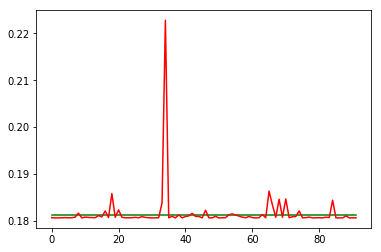

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:23:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3396000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:23:59
INFO:tensorflow:Saving dict for global step 3396000: global_step = 3396000, loss = 1.0403945e-05
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3396000: ./outputdir/model.ckpt-3396000
error on testset first run {'loss': 1.0403945e-05, 'global_step': 3396000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3396000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:loss = 1.1980504e-05, step = 3400501 (0.238 sec)
INFO:tensorflow:global_step/sec: 397.409
INFO:tensorflow:loss = 2.5363474e-06, step = 3400601 (0.251 sec)
INFO:tensorflow:global_step/sec: 436.802
INFO:tensorflow:loss = 9.4310997e-07, step = 3400701 (0.229 sec)
INFO:tensorflow:global_step/sec: 432.653
INFO:tensorflow:loss = 3.2220373e-07, step = 3400801 (0.231 sec)
INFO:tensorflow:global_step/sec: 442.083
INFO:tensorflow:loss = 5.001334e-06, step = 3400901 (0.226 sec)
INFO:tensorflow:global_step/sec: 441.449
INFO:tensorflow:loss = 6.687741e-06, step = 3401001 (0.227 sec)
INFO:tensorflow:global_step/sec: 429.515
INFO:tensorflow:loss = 1.4507611e-05, step = 3401101 (0.233 sec)
INFO:tensorflow:global_step/sec: 443.666
INFO:tensorflow:loss = 8.484122e-05, step = 3401201 (0.225 sec)
INFO:tensorflow:global_step/sec: 462.571
INFO:tensorflow:loss = 7.64315e-07, step = 3401301 (0.216 sec)
INFO:tensorflow:global_step/sec: 452.478
INFO:tensorflow:loss = 1.7335135e-05, step = 340140

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3406000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3406000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.465989e-06, step = 3406001
INFO:tensorflow:global_step/sec: 170.937
INFO:tensorflow:loss = 1.1878186e-08, step = 3406101 (0.586 sec)
INFO:tensorflow:global_step/sec: 455.092
INFO:tensorflow:loss = 5.1767324e-06, step = 3406201 (0.219 sec)
INFO:tensorflow:global_step/sec: 454.863
INFO:tensorflow:loss = 8.5806096e-07, step = 3406301 (0.220 sec)
INFO:tensorflow:global_step/sec: 448.246
INFO:tensorflow:loss = 2.1978553e-06, step = 3406401 (0.223 sec)
INFO:tensorflow:global_step/sec: 449.448
INFO:tensorflow:loss = 5.7224197e-06, step = 3406501 (0.222 sec)
INFO:tensorflow:global_step/sec: 440.892
INFO:tensorflow:loss = 1.5491687e-05, step = 3406601 (0.227 sec)
INFO:tensorflow:global_step/sec: 425.414
IN

INFO:tensorflow:global_step/sec: 446.57
INFO:tensorflow:loss = 3.4280488e-06, step = 3411901 (0.224 sec)
INFO:tensorflow:Saving checkpoints for 3412000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.3611184e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3412000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 8.155433361314167e-08
prediction at  8 [array([0.18264956])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3412000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving ch

INFO:tensorflow:loss = 5.1635107e-05, step = 3417101 (0.227 sec)
INFO:tensorflow:global_step/sec: 421.906
INFO:tensorflow:loss = 1.4039237e-05, step = 3417201 (0.237 sec)
INFO:tensorflow:global_step/sec: 391.674
INFO:tensorflow:loss = 1.0164925e-06, step = 3417301 (0.256 sec)
INFO:tensorflow:global_step/sec: 418.374
INFO:tensorflow:loss = 3.3802953e-05, step = 3417401 (0.240 sec)
INFO:tensorflow:global_step/sec: 396.058
INFO:tensorflow:loss = 3.4167802e-05, step = 3417501 (0.251 sec)
INFO:tensorflow:global_step/sec: 433.672
INFO:tensorflow:loss = 9.3300165e-05, step = 3417601 (0.230 sec)
INFO:tensorflow:global_step/sec: 437.762
INFO:tensorflow:loss = 2.7226739e-05, step = 3417701 (0.229 sec)
INFO:tensorflow:global_step/sec: 434.493
INFO:tensorflow:loss = 4.4414763e-05, step = 3417801 (0.230 sec)
INFO:tensorflow:global_step/sec: 419.65
INFO:tensorflow:loss = 1.5473042e-05, step = 3417901 (0.238 sec)
INFO:tensorflow:Saving checkpoints for 3418000 into ./outputdir/model.ckpt.
INFO:tensorf

INFO:tensorflow:global_step/sec: 428.042
INFO:tensorflow:loss = 6.165932e-06, step = 3422401 (0.234 sec)
INFO:tensorflow:global_step/sec: 386.572
INFO:tensorflow:loss = 9.672232e-06, step = 3422501 (0.259 sec)
INFO:tensorflow:global_step/sec: 444.294
INFO:tensorflow:loss = 1.1046414e-05, step = 3422601 (0.225 sec)
INFO:tensorflow:global_step/sec: 462.275
INFO:tensorflow:loss = 8.181104e-06, step = 3422701 (0.216 sec)
INFO:tensorflow:global_step/sec: 460.368
INFO:tensorflow:loss = 2.4874141e-06, step = 3422801 (0.217 sec)
INFO:tensorflow:global_step/sec: 457.691
INFO:tensorflow:loss = 4.7696165e-07, step = 3422901 (0.218 sec)
INFO:tensorflow:global_step/sec: 387.929
INFO:tensorflow:loss = 1.1316574e-08, step = 3423001 (0.258 sec)
INFO:tensorflow:global_step/sec: 440.131
INFO:tensorflow:loss = 3.434563e-06, step = 3423101 (0.228 sec)
INFO:tensorflow:global_step/sec: 424.717
INFO:tensorflow:loss = 0.00014501158, step = 3423201 (0.235 sec)
INFO:tensorflow:global_step/sec: 429.662
INFO:tens

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3428000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3428000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.6445e-06, step = 3428001
INFO:tensorflow:global_step/sec: 164.972
INFO:tensorflow:loss = 4.6684878e-08, step = 3428101 (0.607 sec)
INFO:tensorflow:global_step/sec: 436.668
INFO:tensorflow:loss = 4.0371475e-09, step = 3428201 (0.229 sec)
INFO:tensorflow:global_step/sec: 418.034
INFO:tensorflow:loss = 5.1510654e-08, step = 3428301 (0.239 sec)
INFO:tensorflow:global_step/sec: 431.648
INFO:tensorflow:loss = 5.9718e-09, step = 3428401 (0.232 sec)
INFO:tensorflow:global_step/sec: 421.459
INFO:tensorflow:loss = 4.9820247e-08, step = 3428501 (0.237 sec)
INFO:tensorflow:global_step/sec: 424.081
INFO:tensorflow:loss = 1.65245

INFO:tensorflow:global_step/sec: 416.065
INFO:tensorflow:loss = 1.6953715e-07, step = 3433801 (0.240 sec)
INFO:tensorflow:global_step/sec: 423.347
INFO:tensorflow:loss = 2.6828332e-08, step = 3433901 (0.237 sec)
INFO:tensorflow:Saving checkpoints for 3434000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.504996e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3434000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.5187492307900198e-07
prediction at  19 [array([0.18187788])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3434000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3438000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3438000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0031446486, step = 3438001
INFO:tensorflow:global_step/sec: 162.206
INFO:tensorflow:loss = 4.3183457e-11, step = 3438101 (0.617 sec)
INFO:tensorflow:global_step/sec: 448.781
INFO:tensorflow:loss = 3.1443737e-12, step = 3438201 (0.222 sec)
INFO:tensorflow:global_step/sec: 427.279
INFO:tensorflow:loss = 0.0006727383, step = 3438301 (0.234 sec)
INFO:tensorflow:global_step/sec: 429.211
INFO:tensorflow:loss = 1.9374342e-08, step = 3438401 (0.233 sec)
INFO:tensorflow:global_step/sec: 413.934
INFO:tensorflow:loss = 4.4964032e-13, step = 3438501 (0.242 sec)
INFO:tensorflow:global_step/sec: 403.137
INFO:tensorflow:loss = 0.0

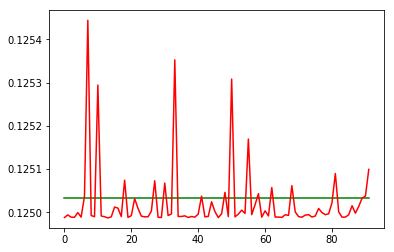

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:26:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3440000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:26:56
INFO:tensorflow:Saving dict for global step 3440000: global_step = 3440000, loss = 4.213689e-08
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3440000: ./outputdir/model.ckpt-3440000
error on testset first run {'loss': 4.213689e-08, 'global_step': 3440000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3440000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 416.44
INFO:tensorflow:loss = 7.728063e-09, step = 3444601 (0.240 sec)
INFO:tensorflow:global_step/sec: 418.688
INFO:tensorflow:loss = 2.2988417e-08, step = 3444701 (0.239 sec)
INFO:tensorflow:global_step/sec: 426.443
INFO:tensorflow:loss = 1.5944728e-08, step = 3444801 (0.235 sec)
INFO:tensorflow:global_step/sec: 421.886
INFO:tensorflow:loss = 2.36437e-08, step = 3444901 (0.237 sec)
INFO:tensorflow:global_step/sec: 424.473
INFO:tensorflow:loss = 1.3713465e-06, step = 3445001 (0.236 sec)
INFO:tensorflow:global_step/sec: 404.523
INFO:tensorflow:loss = 4.668488e-12, step = 3445101 (0.247 sec)
INFO:tensorflow:global_step/sec: 414.957
INFO:tensorflow:loss = 2.2907504e-07, step = 3445201 (0.241 sec)
INFO:tensorflow:global_step/sec: 412.807
INFO:tensorflow:loss = 1.0942447e-08, step = 3445301 (0.243 sec)
INFO:tensorflow:global_step/sec: 417.934
INFO:tensorflow:loss = 7.0542455e-08, step = 3445401 (0.239 sec)
INFO:tensorflow:global_step/sec: 394.831
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3450000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3450000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.892447e-07, step = 3450001
INFO:tensorflow:global_step/sec: 160.391
INFO:tensorflow:loss = 2.668842e-07, step = 3450101 (0.624 sec)
INFO:tensorflow:global_step/sec: 431.369
INFO:tensorflow:loss = 5.512325e-07, step = 3450201 (0.232 sec)
INFO:tensorflow:global_step/sec: 418.305
INFO:tensorflow:loss = 1.6682957e-06, step = 3450301 (0.239 sec)
INFO:tensorflow:global_step/sec: 432.214
INFO:tensorflow:loss = 3.3472298e-07, step = 3450401 (0.231 sec)
INFO:tensorflow:global_step/sec: 395.537
INFO:tensorflow:loss = 2.897717e-07, step = 3450501 (0.253 sec)
INFO:tensorflow:global_step/sec: 441.841
INFO:tensorflow:loss = 6.368308e-07, step = 3450601 (0.226 sec)
INFO:tensorflow:global_step/sec: 440.235
INFO:tensorflow:loss = 9.084434e-07, step =

INFO:tensorflow:global_step/sec: 370.985
INFO:tensorflow:loss = 5.855948e-07, step = 3455901 (0.270 sec)
INFO:tensorflow:Saving checkpoints for 3456000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.0904376e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3456000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.5659565609901708e-06
prediction at  8 [array([0.12455826])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3456000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving c

INFO:tensorflow:loss = 2.3483583e-08, step = 3461101 (0.226 sec)
INFO:tensorflow:global_step/sec: 422.906
INFO:tensorflow:loss = 2.8304913e-07, step = 3461201 (0.236 sec)
INFO:tensorflow:global_step/sec: 435.489
INFO:tensorflow:loss = 8.0840545e-07, step = 3461301 (0.230 sec)
INFO:tensorflow:global_step/sec: 444.842
INFO:tensorflow:loss = 5.6159813e-08, step = 3461401 (0.225 sec)
INFO:tensorflow:global_step/sec: 432.831
INFO:tensorflow:loss = 1.2096804e-06, step = 3461501 (0.231 sec)
INFO:tensorflow:global_step/sec: 445.814
INFO:tensorflow:loss = 6.599758e-07, step = 3461601 (0.224 sec)
INFO:tensorflow:global_step/sec: 426.878
INFO:tensorflow:loss = 7.069288e-07, step = 3461701 (0.234 sec)
INFO:tensorflow:global_step/sec: 397.068
INFO:tensorflow:loss = 2.6419858e-08, step = 3461801 (0.252 sec)
INFO:tensorflow:global_step/sec: 381.447
INFO:tensorflow:loss = 1.9059054e-07, step = 3461901 (0.262 sec)
INFO:tensorflow:Saving checkpoints for 3462000 into ./outputdir/model.ckpt.
INFO:tensorfl

INFO:tensorflow:global_step/sec: 449.46
INFO:tensorflow:loss = 4.9795517e-07, step = 3466401 (0.222 sec)
INFO:tensorflow:global_step/sec: 428.425
INFO:tensorflow:loss = 8.020273e-11, step = 3466501 (0.234 sec)
INFO:tensorflow:global_step/sec: 410.59
INFO:tensorflow:loss = 2.269789e-08, step = 3466601 (0.243 sec)
INFO:tensorflow:global_step/sec: 429.112
INFO:tensorflow:loss = 2.4651888e-07, step = 3466701 (0.233 sec)
INFO:tensorflow:global_step/sec: 439.978
INFO:tensorflow:loss = 5.199201e-08, step = 3466801 (0.227 sec)
INFO:tensorflow:global_step/sec: 441.932
INFO:tensorflow:loss = 1.1607659e-07, step = 3466901 (0.226 sec)
INFO:tensorflow:global_step/sec: 446.168
INFO:tensorflow:loss = 2.0245723e-06, step = 3467001 (0.224 sec)
INFO:tensorflow:global_step/sec: 387.816
INFO:tensorflow:loss = 7.263801e-07, step = 3467101 (0.258 sec)
INFO:tensorflow:global_step/sec: 449.216
INFO:tensorflow:loss = 1.453581e-06, step = 3467201 (0.223 sec)
INFO:tensorflow:global_step/sec: 442.711
INFO:tensorf

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3472000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3472000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.4090298e-08, step = 3472001
INFO:tensorflow:global_step/sec: 161.097
INFO:tensorflow:loss = 1.6241053e-09, step = 3472101 (0.622 sec)
INFO:tensorflow:global_step/sec: 459.91
INFO:tensorflow:loss = 1.6333665e-07, step = 3472201 (0.217 sec)
INFO:tensorflow:global_step/sec: 438.614
INFO:tensorflow:loss = 1.3030701e-09, step = 3472301 (0.228 sec)
INFO:tensorflow:global_step/sec: 454.227
INFO:tensorflow:loss = 1.879779e-07, step = 3472401 (0.220 sec)
INFO:tensorflow:global_step/sec: 441.628
INFO:tensorflow:loss = 1.2840489e-08, step = 3472501 (0.226 sec)
INFO:tensorflow:global_step/sec: 447.821
INFO:tensorflow:loss = 2.2

INFO:tensorflow:global_step/sec: 430.518
INFO:tensorflow:loss = 7.261548e-08, step = 3477801 (0.232 sec)
INFO:tensorflow:global_step/sec: 442.453
INFO:tensorflow:loss = 7.6167396e-08, step = 3477901 (0.226 sec)
INFO:tensorflow:Saving checkpoints for 3478000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.2639418e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3478000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.6040293457744483e-07
prediction at  19 [array([0.12479148])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3478000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3482000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3482000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0070488155, step = 3482001
INFO:tensorflow:global_step/sec: 167.317
INFO:tensorflow:loss = 0.00056521856, step = 3482101 (0.598 sec)
INFO:tensorflow:global_step/sec: 464.66
INFO:tensorflow:loss = 1.2852089e-05, step = 3482201 (0.216 sec)
INFO:tensorflow:global_step/sec: 472.3
INFO:tensorflow:loss = 8.967254e-08, step = 3482301 (0.211 sec)
INFO:tensorflow:global_step/sec: 472.681
INFO:tensorflow:loss = 2.6850941e-05, step = 3482401 (0.212 sec)
INFO:tensorflow:global_step/sec: 460.613
INFO:tensorflow:loss = 8.5705005e-06, step = 3482501 (0.217 sec)
INFO:tensorflow:global_step/sec: 460.965
INFO:tensorflow:loss = 0.0053

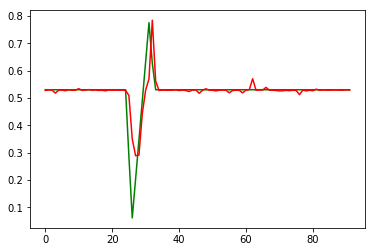

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:29:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3484000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:29:54
INFO:tensorflow:Saving dict for global step 3484000: global_step = 3484000, loss = 0.0033166278
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3484000: ./outputdir/model.ckpt-3484000
error on testset first run {'loss': 0.0033166278, 'global_step': 3484000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3484000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 340.927
INFO:tensorflow:loss = 5.290933e-06, step = 3488601 (0.293 sec)
INFO:tensorflow:global_step/sec: 442.245
INFO:tensorflow:loss = 2.6497421e-08, step = 3488701 (0.227 sec)
INFO:tensorflow:global_step/sec: 430.964
INFO:tensorflow:loss = 3.4346735e-06, step = 3488801 (0.231 sec)
INFO:tensorflow:global_step/sec: 445.466
INFO:tensorflow:loss = 2.5851343e-06, step = 3488901 (0.225 sec)
INFO:tensorflow:global_step/sec: 424.256
INFO:tensorflow:loss = 3.7592538e-06, step = 3489001 (0.236 sec)
INFO:tensorflow:global_step/sec: 418.074
INFO:tensorflow:loss = 6.082739e-06, step = 3489101 (0.239 sec)
INFO:tensorflow:global_step/sec: 420.945
INFO:tensorflow:loss = 0.0001128502, step = 3489201 (0.238 sec)
INFO:tensorflow:global_step/sec: 436.821
INFO:tensorflow:loss = 1.4280573e-06, step = 3489301 (0.229 sec)
INFO:tensorflow:global_step/sec: 421.782
INFO:tensorflow:loss = 1.1826274e-06, step = 3489401 (0.237 sec)
INFO:tensorflow:global_step/sec: 442.601
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3494000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3494000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 8.3501734e-05, step = 3494001
INFO:tensorflow:global_step/sec: 160.982
INFO:tensorflow:loss = 7.694415e-06, step = 3494101 (0.622 sec)
INFO:tensorflow:global_step/sec: 442.857
INFO:tensorflow:loss = 1.6805316e-05, step = 3494201 (0.226 sec)
INFO:tensorflow:global_step/sec: 439.663
INFO:tensorflow:loss = 1.6618542e-06, step = 3494301 (0.227 sec)
INFO:tensorflow:global_step/sec: 415.788
INFO:tensorflow:loss = 1.3673377e-05, step = 3494401 (0.241 sec)
INFO:tensorflow:global_step/sec: 447.228
INFO:tensorflow:loss = 2.4884953e-06, step = 3494501 (0.224 sec)
INFO:tensorflow:global_step/sec: 446.9
INFO:tensorflow:loss = 4.4491007e-06, step = 3494601 (0.224 sec)
INFO:tensorflow:global_step/sec: 442.854
INFO:tensorflow:loss = 3.904157e-06, step

INFO:tensorflow:loss = 2.0878394e-06, step = 3499901 (0.250 sec)
INFO:tensorflow:Saving checkpoints for 3500000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.967902e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3500000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.1545091021362368e-05
prediction at  8 [array([0.53127929])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3500000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3500000 into ./outputdir/m

INFO:tensorflow:global_step/sec: 402.042
INFO:tensorflow:loss = 3.3763768e-06, step = 3505201 (0.249 sec)
INFO:tensorflow:global_step/sec: 400.617
INFO:tensorflow:loss = 4.908461e-08, step = 3505301 (0.250 sec)
INFO:tensorflow:global_step/sec: 411.546
INFO:tensorflow:loss = 5.707102e-08, step = 3505401 (0.243 sec)
INFO:tensorflow:global_step/sec: 416.415
INFO:tensorflow:loss = 1.1131762e-05, step = 3505501 (0.240 sec)
INFO:tensorflow:global_step/sec: 374.029
INFO:tensorflow:loss = 6.0478567e-05, step = 3505601 (0.267 sec)
INFO:tensorflow:global_step/sec: 417.912
INFO:tensorflow:loss = 5.259291e-07, step = 3505701 (0.240 sec)
INFO:tensorflow:global_step/sec: 415.177
INFO:tensorflow:loss = 5.8020423e-06, step = 3505801 (0.241 sec)
INFO:tensorflow:global_step/sec: 381.361
INFO:tensorflow:loss = 3.2698972e-06, step = 3505901 (0.261 sec)
INFO:tensorflow:Saving checkpoints for 3506000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.9283744e-06.
INFO:tensorflow:Calling mod

INFO:tensorflow:loss = 1.3810131e-06, step = 3510401 (0.236 sec)
INFO:tensorflow:global_step/sec: 456.567
INFO:tensorflow:loss = 4.7608937e-06, step = 3510501 (0.219 sec)
INFO:tensorflow:global_step/sec: 425.128
INFO:tensorflow:loss = 4.498015e-06, step = 3510601 (0.235 sec)
INFO:tensorflow:global_step/sec: 444.508
INFO:tensorflow:loss = 2.7169156e-06, step = 3510701 (0.225 sec)
INFO:tensorflow:global_step/sec: 439.862
INFO:tensorflow:loss = 2.4463634e-06, step = 3510801 (0.227 sec)
INFO:tensorflow:global_step/sec: 437.029
INFO:tensorflow:loss = 1.1498006e-08, step = 3510901 (0.229 sec)
INFO:tensorflow:global_step/sec: 446.209
INFO:tensorflow:loss = 6.6505777e-07, step = 3511001 (0.224 sec)
INFO:tensorflow:global_step/sec: 440.114
INFO:tensorflow:loss = 2.9906965e-07, step = 3511101 (0.227 sec)
INFO:tensorflow:global_step/sec: 444.725
INFO:tensorflow:loss = 6.453543e-05, step = 3511201 (0.225 sec)
INFO:tensorflow:global_step/sec: 340.638
INFO:tensorflow:loss = 3.3719973e-06, step = 351

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3516000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3516000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.938015e-06, step = 3516001
INFO:tensorflow:global_step/sec: 157.409
INFO:tensorflow:loss = 6.417089e-10, step = 3516101 (0.636 sec)
INFO:tensorflow:global_step/sec: 458.331
INFO:tensorflow:loss = 2.6226449e-08, step = 3516201 (0.218 sec)
INFO:tensorflow:global_step/sec: 444.812
INFO:tensorflow:loss = 8.3913676e-10, step = 3516301 (0.225 sec)
INFO:tensorflow:global_step/sec: 436.822
INFO:tensorflow:loss = 2.8012664e-08, step = 3516401 (0.229 sec)
INFO:tensorflow:global_step/sec: 392.617
INFO:tensorflow:loss = 6.8468253e-10, step = 3516501 (0.255 sec)
INFO:tensorflow:global_step/sec: 439.177
INFO:tensorflow:loss = 3.5

INFO:tensorflow:global_step/sec: 433.676
INFO:tensorflow:loss = 3.2218682e-07, step = 3521801 (0.231 sec)
INFO:tensorflow:global_step/sec: 403.447
INFO:tensorflow:loss = 5.521844e-07, step = 3521901 (0.248 sec)
INFO:tensorflow:Saving checkpoints for 3522000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.143441e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3522000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 3.594981937511695e-08
prediction at  19 [array([0.52861148])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3522000
I

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3526000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3526000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.017624866, step = 3526001
INFO:tensorflow:global_step/sec: 163.573
INFO:tensorflow:loss = 1.7473016e-07, step = 3526101 (0.613 sec)
INFO:tensorflow:global_step/sec: 436.19
INFO:tensorflow:loss = 1.3500882e-06, step = 3526201 (0.229 sec)
INFO:tensorflow:global_step/sec: 462.286
INFO:tensorflow:loss = 7.1508257e-06, step = 3526301 (0.216 sec)
INFO:tensorflow:global_step/sec: 460.022
INFO:tensorflow:loss = 4.6674643e-07, step = 3526401 (0.217 sec)
INFO:tensorflow:global_step/sec: 466.793
INFO:tensorflow:loss = 6.269971e-08, step = 3526501 (0.214 sec)
INFO:tensorflow:global_step/sec: 458.184
INFO:tensorflow:loss = 5.930

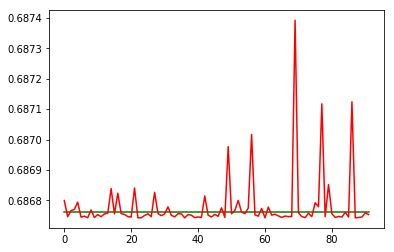

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:32:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3528000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:32:50
INFO:tensorflow:Saving dict for global step 3528000: global_step = 3528000, loss = 1.4117177e-08
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3528000: ./outputdir/model.ckpt-3528000
error on testset first run {'loss': 1.4117177e-08, 'global_step': 3528000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3528000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 435.404
INFO:tensorflow:loss = 2.3424604e-09, step = 3532601 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.628
INFO:tensorflow:loss = 6.004086e-13, step = 3532701 (0.227 sec)
INFO:tensorflow:global_step/sec: 442.333
INFO:tensorflow:loss = 1.1092599e-08, step = 3532801 (0.226 sec)
INFO:tensorflow:global_step/sec: 418.013
INFO:tensorflow:loss = 4.8426557e-08, step = 3532901 (0.239 sec)
INFO:tensorflow:global_step/sec: 338.176
INFO:tensorflow:loss = 2.2397586e-09, step = 3533001 (0.296 sec)
INFO:tensorflow:global_step/sec: 428.84
INFO:tensorflow:loss = 6.903761e-09, step = 3533101 (0.233 sec)
INFO:tensorflow:global_step/sec: 396.75
INFO:tensorflow:loss = 7.9148776e-10, step = 3533201 (0.252 sec)
INFO:tensorflow:global_step/sec: 387.683
INFO:tensorflow:loss = 1.8555656e-07, step = 3533301 (0.258 sec)
INFO:tensorflow:global_step/sec: 379.222
INFO:tensorflow:loss = 3.5926462e-10, step = 3533401 (0.264 sec)
INFO:tensorflow:global_step/sec: 389.549
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3538000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.056396e-09, step = 3538001
INFO:tensorflow:global_step/sec: 162.268
INFO:tensorflow:loss = 2.1831397e-07, step = 3538101 (0.617 sec)
INFO:tensorflow:global_step/sec: 459.782
INFO:tensorflow:loss = 1.2785506e-07, step = 3538201 (0.217 sec)
INFO:tensorflow:global_step/sec: 452.284
INFO:tensorflow:loss = 2.41829e-08, step = 3538301 (0.221 sec)
INFO:tensorflow:global_step/sec: 424.921
INFO:tensorflow:loss = 4.0347814e-08, step = 3538401 (0.235 sec)
INFO:tensorflow:global_step/sec: 456.019
INFO:tensorflow:loss = 1.0170936e-08, step = 3538501 (0.219 sec)
INFO:tensorflow:global_step/sec: 452.439
INFO:tensorflow:loss = 2.3283064e-10, step = 3538601 (0.221 sec)
INFO:tensorflow:global_step/sec: 429.946
INFO:tensorflow:loss = 1.733611e-08, step = 3538701 (0.233 sec)
INFO:tensorflow:global_step/sec: 437.616
INFO:tens

INFO:tensorflow:Saving checkpoints for 3544000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.2984136e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3544000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.327082120111506e-07
prediction at  8 [array([0.68706231])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3544000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3544000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.4917987e-09, step = 3544001
I

INFO:tensorflow:loss = 4.604317e-08, step = 3549201 (0.228 sec)
INFO:tensorflow:global_step/sec: 433.785
INFO:tensorflow:loss = 5.201528e-09, step = 3549301 (0.230 sec)
INFO:tensorflow:global_step/sec: 436.535
INFO:tensorflow:loss = 1.5200172e-07, step = 3549401 (0.229 sec)
INFO:tensorflow:global_step/sec: 423.912
INFO:tensorflow:loss = 9.211641e-08, step = 3549501 (0.236 sec)
INFO:tensorflow:global_step/sec: 410.112
INFO:tensorflow:loss = 2.0412614e-07, step = 3549601 (0.243 sec)
INFO:tensorflow:global_step/sec: 408.13
INFO:tensorflow:loss = 1.2125044e-07, step = 3549701 (0.245 sec)
INFO:tensorflow:global_step/sec: 403.672
INFO:tensorflow:loss = 9.074667e-08, step = 3549801 (0.248 sec)
INFO:tensorflow:global_step/sec: 402.76
INFO:tensorflow:loss = 5.644621e-08, step = 3549901 (0.248 sec)
INFO:tensorflow:Saving checkpoints for 3550000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.531898e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 426.625
INFO:tensorflow:loss = 5.4186877e-09, step = 3554501 (0.234 sec)
INFO:tensorflow:global_step/sec: 424.7
INFO:tensorflow:loss = 3.3276024e-07, step = 3554601 (0.236 sec)
INFO:tensorflow:global_step/sec: 433.028
INFO:tensorflow:loss = 1.0027179e-08, step = 3554701 (0.231 sec)
INFO:tensorflow:global_step/sec: 428.53
INFO:tensorflow:loss = 3.250955e-08, step = 3554801 (0.233 sec)
INFO:tensorflow:global_step/sec: 419.809
INFO:tensorflow:loss = 1.2825296e-12, step = 3554901 (0.238 sec)
INFO:tensorflow:global_step/sec: 435.375
INFO:tensorflow:loss = 3.500603e-08, step = 3555001 (0.230 sec)
INFO:tensorflow:global_step/sec: 444.836
INFO:tensorflow:loss = 1.0688419e-07, step = 3555101 (0.225 sec)
INFO:tensorflow:global_step/sec: 443.261
INFO:tensorflow:loss = 4.1977763e-09, step = 3555201 (0.226 sec)
INFO:tensorflow:global_step/sec: 439.078
INFO:tensorflow:loss = 1.7328807e-07, step = 3555301 (0.228 sec)
INFO:tensorflow:global_step/sec: 433.7
INFO:tensorf

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3560000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3560000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.201528e-09, step = 3560001
INFO:tensorflow:global_step/sec: 162.529
INFO:tensorflow:loss = 1.2503335e-08, step = 3560101 (0.616 sec)
INFO:tensorflow:global_step/sec: 460.032
INFO:tensorflow:loss = 6.30331e-09, step = 3560201 (0.217 sec)
INFO:tensorflow:global_step/sec: 437.947
INFO:tensorflow:loss = 1.565255e-08, step = 3560301 (0.229 sec)
INFO:tensorflow:global_step/sec: 388.801
INFO:tensorflow:loss = 4.244246e-09, step = 3560401 (0.257 sec)
INFO:tensorflow:global_step/sec: 449.926
INFO:tensorflow:loss = 8.381903e-09, step = 3560501 (0.222 sec)
INFO:tensorflow:global_step/sec: 432.842
INFO:tensorflow:loss = 4.673982e-09, step = 3560601 (0.231 sec)
INFO:

INFO:tensorflow:loss = 8.835347e-09, step = 3565801 (0.237 sec)
INFO:tensorflow:global_step/sec: 417.533
INFO:tensorflow:loss = 9.211641e-08, step = 3565901 (0.240 sec)
INFO:tensorflow:Saving checkpoints for 3566000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.0012795e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3566000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.699353502520436e-08
prediction at  19 [array([0.68697392])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3566000
INFO:tensorflow:Running local_init_op.
INF

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3570000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3570000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.013427804, step = 3570001
INFO:tensorflow:global_step/sec: 161.824
INFO:tensorflow:loss = 1.4899575e-07, step = 3570101 (0.619 sec)
INFO:tensorflow:global_step/sec: 451.932
INFO:tensorflow:loss = 1.1461907e-09, step = 3570201 (0.221 sec)
INFO:tensorflow:global_step/sec: 393.881
INFO:tensorflow:loss = 5.0125373e-06, step = 3570301 (0.254 sec)
INFO:tensorflow:global_step/sec: 453.929
INFO:tensorflow:loss = 2.7512215e-11, step = 3570401 (0.220 sec)
INFO:tensorflow:global_step/sec: 450.195
INFO:tensorflow:loss = 4.698464e-11, step = 3570501 (0.222 sec)
INFO:tensorflow:global_step/sec: 453.932
INFO:tensorflow:loss = 2.96

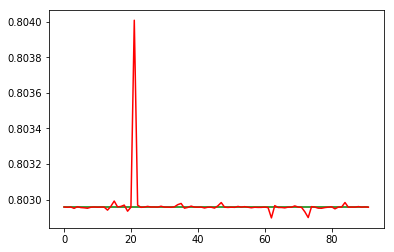

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:35:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3572000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:35:48
INFO:tensorflow:Saving dict for global step 3572000: global_step = 3572000, loss = 3.880109e-09
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3572000: ./outputdir/model.ckpt-3572000
error on testset first run {'loss': 3.880109e-09, 'global_step': 3572000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3572000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 412.135
INFO:tensorflow:loss = 3.4141578e-10, step = 3576601 (0.241 sec)
INFO:tensorflow:global_step/sec: 434.497
INFO:tensorflow:loss = 1.6331256e-09, step = 3576701 (0.230 sec)
INFO:tensorflow:global_step/sec: 389.176
INFO:tensorflow:loss = 5.1301186e-12, step = 3576801 (0.257 sec)
INFO:tensorflow:global_step/sec: 451.414
INFO:tensorflow:loss = 6.296865e-10, step = 3576901 (0.221 sec)
INFO:tensorflow:global_step/sec: 470.327
INFO:tensorflow:loss = 2.8141045e-11, step = 3577001 (0.213 sec)
INFO:tensorflow:global_step/sec: 477.279
INFO:tensorflow:loss = 6.199631e-09, step = 3577101 (0.209 sec)
INFO:tensorflow:global_step/sec: 463.128
INFO:tensorflow:loss = 1.0534805e-08, step = 3577201 (0.216 sec)
INFO:tensorflow:global_step/sec: 460.759
INFO:tensorflow:loss = 1.6043487e-09, step = 3577301 (0.217 sec)
INFO:tensorflow:global_step/sec: 445.993
INFO:tensorflow:loss = 8.7050367e-10, step = 3577401 (0.224 sec)
INFO:tensorflow:global_step/sec: 429.31
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3582000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3582000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.772293e-09, step = 3582001
INFO:tensorflow:global_step/sec: 162.995
INFO:tensorflow:loss = 2.0305038e-09, step = 3582101 (0.615 sec)
INFO:tensorflow:global_step/sec: 453.956
INFO:tensorflow:loss = 1.3159037e-07, step = 3582201 (0.220 sec)
INFO:tensorflow:global_step/sec: 441.667
INFO:tensorflow:loss = 1.0780937e-08, step = 3582301 (0.226 sec)
INFO:tensorflow:global_step/sec: 432.708
INFO:tensorflow:loss = 2.0796804e-07, step = 3582401 (0.231 sec)
INFO:tensorflow:global_step/sec: 424.286
INFO:tensorflow:loss = 2.1868235e-08, step = 3582501 (0.235 sec)
INFO:tensorflow:global_step/sec: 420.953
INFO:tensorflow:loss = 2.1064839e-08, step = 3582601 (0.237 sec)
INFO:tensorflow:global_step/sec: 380.186
INFO:tensorflow:loss = 2.5194314e-08, s

INFO:tensorflow:loss = 2.5345916e-08, step = 3587901 (0.261 sec)
INFO:tensorflow:Saving checkpoints for 3588000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.8339051e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3588000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 3.5176771902867957e-12
prediction at  8 [array([0.80287404])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3588000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3588000 into ./outputdir/

INFO:tensorflow:global_step/sec: 440.18
INFO:tensorflow:loss = 2.0954758e-09, step = 3593201 (0.227 sec)
INFO:tensorflow:global_step/sec: 443.009
INFO:tensorflow:loss = 6.0318293e-09, step = 3593301 (0.226 sec)
INFO:tensorflow:global_step/sec: 442.486
INFO:tensorflow:loss = 8.6804334e-08, step = 3593401 (0.226 sec)
INFO:tensorflow:global_step/sec: 428.94
INFO:tensorflow:loss = 7.599476e-08, step = 3593501 (0.233 sec)
INFO:tensorflow:global_step/sec: 426.561
INFO:tensorflow:loss = 1.8371352e-08, step = 3593601 (0.235 sec)
INFO:tensorflow:global_step/sec: 411.529
INFO:tensorflow:loss = 1.4496493e-08, step = 3593701 (0.243 sec)
INFO:tensorflow:global_step/sec: 418.372
INFO:tensorflow:loss = 2.591051e-09, step = 3593801 (0.239 sec)
INFO:tensorflow:global_step/sec: 406.132
INFO:tensorflow:loss = 6.8780537e-10, step = 3593901 (0.247 sec)
INFO:tensorflow:Saving checkpoints for 3594000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.4666476e-08.
INFO:tensorflow:Calling mode

INFO:tensorflow:loss = 9.792167e-10, step = 3598401 (0.222 sec)
INFO:tensorflow:global_step/sec: 438.8
INFO:tensorflow:loss = 4.347102e-08, step = 3598501 (0.228 sec)
INFO:tensorflow:global_step/sec: 433.283
INFO:tensorflow:loss = 2.7813499e-08, step = 3598601 (0.230 sec)
INFO:tensorflow:global_step/sec: 427.188
INFO:tensorflow:loss = 2.967262e-10, step = 3598701 (0.234 sec)
INFO:tensorflow:global_step/sec: 429.949
INFO:tensorflow:loss = 3.2552553e-08, step = 3598801 (0.233 sec)
INFO:tensorflow:global_step/sec: 439.568
INFO:tensorflow:loss = 2.4536405e-08, step = 3598901 (0.227 sec)
INFO:tensorflow:global_step/sec: 421.54
INFO:tensorflow:loss = 5.9139893e-10, step = 3599001 (0.238 sec)
INFO:tensorflow:global_step/sec: 421.854
INFO:tensorflow:loss = 2.5383887e-08, step = 3599101 (0.237 sec)
INFO:tensorflow:global_step/sec: 426.533
INFO:tensorflow:loss = 7.821251e-08, step = 3599201 (0.234 sec)
INFO:tensorflow:global_step/sec: 415.512
INFO:tensorflow:loss = 3.2574064e-08, step = 3599301 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3604000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3604000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.9443023e-08, step = 3604001
INFO:tensorflow:global_step/sec: 165.857
INFO:tensorflow:loss = 3.0416473e-08, step = 3604101 (0.604 sec)
INFO:tensorflow:global_step/sec: 463.016
INFO:tensorflow:loss = 8.825032e-08, step = 3604201 (0.216 sec)
INFO:tensorflow:global_step/sec: 423.761
INFO:tensorflow:loss = 1.8622472e-09, step = 3604301 (0.236 sec)
INFO:tensorflow:global_step/sec: 424.928
INFO:tensorflow:loss = 8.3018236e-08, step = 3604401 (0.235 sec)
INFO:tensorflow:global_step/sec: 434.107
INFO:tensorflow:loss = 4.772293e-09, step = 3604501 (0.231 sec)
INFO:tensorflow:global_step/sec: 442.126
INFO:tensorflow:loss = 8.3

INFO:tensorflow:global_step/sec: 398.888
INFO:tensorflow:loss = 9.393433e-08, step = 3609801 (0.251 sec)
INFO:tensorflow:global_step/sec: 379.309
INFO:tensorflow:loss = 4.4119645e-08, step = 3609901 (0.264 sec)
INFO:tensorflow:Saving checkpoints for 3610000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.3465319e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3610000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.931642458971392e-07
prediction at  19 [array([0.80268876])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3610000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3614000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3614000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0015412142, step = 3614001
INFO:tensorflow:global_step/sec: 161.623
INFO:tensorflow:loss = 0.0012319586, step = 3614101 (0.620 sec)
INFO:tensorflow:global_step/sec: 453.745
INFO:tensorflow:loss = 7.059143e-07, step = 3614201 (0.220 sec)
INFO:tensorflow:global_step/sec: 438.18
INFO:tensorflow:loss = 0.00026938375, step = 3614301 (0.229 sec)
INFO:tensorflow:global_step/sec: 415.515
INFO:tensorflow:loss = 0.00034567577, step = 3614401 (0.240 sec)
INFO:tensorflow:global_step/sec: 417.852
INFO:tensorflow:loss = 2.1462016e-05, step = 3614501 (0.239 sec)
INFO:tensorflow:global_step/sec: 449.843
INFO:tensorflow:loss = 4.560

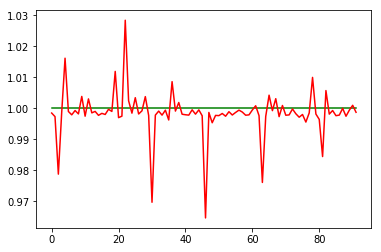

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:38:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3616000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:38:45
INFO:tensorflow:Saving dict for global step 3616000: global_step = 3616000, loss = 7.30793e-05
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3616000: ./outputdir/model.ckpt-3616000
error on testset first run {'loss': 7.30793e-05, 'global_step': 3616000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3616000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 448.204
INFO:tensorflow:loss = 6.1961623e-06, step = 3620601 (0.224 sec)
INFO:tensorflow:global_step/sec: 437.235
INFO:tensorflow:loss = 3.0670617e-05, step = 3620701 (0.228 sec)
INFO:tensorflow:global_step/sec: 439.821
INFO:tensorflow:loss = 0.00018152264, step = 3620801 (0.227 sec)
INFO:tensorflow:global_step/sec: 445.27
INFO:tensorflow:loss = 1.0647147e-05, step = 3620901 (0.225 sec)
INFO:tensorflow:global_step/sec: 438.499
INFO:tensorflow:loss = 1.3649498e-06, step = 3621001 (0.228 sec)
INFO:tensorflow:global_step/sec: 437.438
INFO:tensorflow:loss = 1.5102728e-07, step = 3621101 (0.229 sec)
INFO:tensorflow:global_step/sec: 436.781
INFO:tensorflow:loss = 2.4316847e-05, step = 3621201 (0.229 sec)
INFO:tensorflow:global_step/sec: 436.694
INFO:tensorflow:loss = 1.7180748e-05, step = 3621301 (0.229 sec)
INFO:tensorflow:global_step/sec: 425.205
INFO:tensorflow:loss = 1.2116328e-05, step = 3621401 (0.235 sec)
INFO:tensorflow:global_step/sec: 431.883
INFO:t

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3626000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3626000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.0812321e-05, step = 3626001
INFO:tensorflow:global_step/sec: 161.07
INFO:tensorflow:loss = 0.00034828714, step = 3626101 (0.622 sec)
INFO:tensorflow:global_step/sec: 451.163
INFO:tensorflow:loss = 2.3481758e-05, step = 3626201 (0.221 sec)
INFO:tensorflow:global_step/sec: 444.64
INFO:tensorflow:loss = 2.3820909e-05, step = 3626301 (0.226 sec)
INFO:tensorflow:global_step/sec: 442.789
INFO:tensorflow:loss = 9.33756e-07, step = 3626401 (0.225 sec)
INFO:tensorflow:global_step/sec: 435.303
INFO:tensorflow:loss = 2.2732253e-05, step = 3626501 (0.230 sec)
INFO:tensorflow:global_step/sec: 434.752
INFO:tensorflow:loss = 1.2344788e-05, step = 3626601 (0.230 sec)
INFO:tensorflow:global_step/sec: 443.829
INFO:tensorflow:loss = 1.3670397e-06, step

INFO:tensorflow:global_step/sec: 418.617
INFO:tensorflow:loss = 2.177017e-05, step = 3631901 (0.239 sec)
INFO:tensorflow:Saving checkpoints for 3632000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.1812626e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3632000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.9460525491882782e-06
prediction at  8 [array([1.00236947])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3632000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving c

INFO:tensorflow:loss = 0.0003182666, step = 3637101 (0.240 sec)
INFO:tensorflow:global_step/sec: 422.826
INFO:tensorflow:loss = 1.3713961e-05, step = 3637201 (0.236 sec)
INFO:tensorflow:global_step/sec: 434.771
INFO:tensorflow:loss = 9.556354e-06, step = 3637301 (0.230 sec)
INFO:tensorflow:global_step/sec: 459.498
INFO:tensorflow:loss = 0.0003559733, step = 3637401 (0.218 sec)
INFO:tensorflow:global_step/sec: 438.382
INFO:tensorflow:loss = 7.421431e-06, step = 3637501 (0.228 sec)
INFO:tensorflow:global_step/sec: 449.212
INFO:tensorflow:loss = 1.4704197e-05, step = 3637601 (0.223 sec)
INFO:tensorflow:global_step/sec: 452.413
INFO:tensorflow:loss = 4.360285e-06, step = 3637701 (0.222 sec)
INFO:tensorflow:global_step/sec: 453.427
INFO:tensorflow:loss = 0.00031865377, step = 3637801 (0.220 sec)
INFO:tensorflow:global_step/sec: 390.991
INFO:tensorflow:loss = 1.4004196e-05, step = 3637901 (0.255 sec)
INFO:tensorflow:Saving checkpoints for 3638000 into ./outputdir/model.ckpt.
INFO:tensorflow:

INFO:tensorflow:global_step/sec: 453.768
INFO:tensorflow:loss = 8.975823e-06, step = 3642401 (0.220 sec)
INFO:tensorflow:global_step/sec: 431.879
INFO:tensorflow:loss = 0.0003770009, step = 3642501 (0.232 sec)
INFO:tensorflow:global_step/sec: 449.964
INFO:tensorflow:loss = 1.1939793e-05, step = 3642601 (0.222 sec)
INFO:tensorflow:global_step/sec: 447.323
INFO:tensorflow:loss = 7.6073657e-06, step = 3642701 (0.224 sec)
INFO:tensorflow:global_step/sec: 448.049
INFO:tensorflow:loss = 2.7737775e-07, step = 3642801 (0.223 sec)
INFO:tensorflow:global_step/sec: 426.829
INFO:tensorflow:loss = 6.9112334e-06, step = 3642901 (0.234 sec)
INFO:tensorflow:global_step/sec: 455.315
INFO:tensorflow:loss = 3.3166089e-07, step = 3643001 (0.219 sec)
INFO:tensorflow:global_step/sec: 447.622
INFO:tensorflow:loss = 2.6968435e-05, step = 3643101 (0.224 sec)
INFO:tensorflow:global_step/sec: 446.462
INFO:tensorflow:loss = 6.344218e-06, step = 3643201 (0.224 sec)
INFO:tensorflow:global_step/sec: 458.018
INFO:ten

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3648000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3648000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.0244405e-06, step = 3648001
INFO:tensorflow:global_step/sec: 162.266
INFO:tensorflow:loss = 1.43182115e-05, step = 3648101 (0.617 sec)
INFO:tensorflow:global_step/sec: 451.079
INFO:tensorflow:loss = 2.0465336e-06, step = 3648201 (0.222 sec)
INFO:tensorflow:global_step/sec: 453.048
INFO:tensorflow:loss = 1.4238932e-05, step = 3648301 (0.221 sec)
INFO:tensorflow:global_step/sec: 447.539
INFO:tensorflow:loss = 2.0619107e-06, step = 3648401 (0.223 sec)
INFO:tensorflow:global_step/sec: 438.957
INFO:tensorflow:loss = 1.666438e-05, step = 3648501 (0.228 sec)
INFO:tensorflow:global_step/sec: 453.088
INFO:tensorflow:loss = 1

INFO:tensorflow:global_step/sec: 376.445
INFO:tensorflow:loss = 0.00029393187, step = 3653801 (0.265 sec)
INFO:tensorflow:global_step/sec: 375.485
INFO:tensorflow:loss = 1.7292105e-05, step = 3653901 (0.266 sec)
INFO:tensorflow:Saving checkpoints for 3654000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.2262004e-05.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3654000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 6.935581494702205e-07
prediction at  19 [array([1.00236845])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3654000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3658000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3658000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.099230595, step = 3658001
INFO:tensorflow:global_step/sec: 161.242
INFO:tensorflow:loss = 2.190573e-06, step = 3658101 (0.621 sec)
INFO:tensorflow:global_step/sec: 448.107
INFO:tensorflow:loss = 2.9951243e-11, step = 3658201 (0.223 sec)
INFO:tensorflow:global_step/sec: 464.319
INFO:tensorflow:loss = 9.096411e-06, step = 3658301 (0.216 sec)
INFO:tensorflow:global_step/sec: 467.802
INFO:tensorflow:loss = 1.7510258e-07, step = 3658401 (0.214 sec)
INFO:tensorflow:global_step/sec: 446.374
INFO:tensorflow:loss = 4.094746e-10, step = 3658501 (0.224 sec)
INFO:tensorflow:global_step/sec: 452.163
INFO:tensorflow:loss = 1.1611

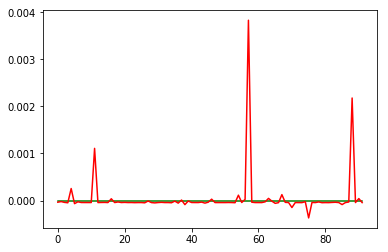

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:41:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3660000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:41:42
INFO:tensorflow:Saving dict for global step 3660000: global_step = 3660000, loss = 4.084992e-05
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3660000: ./outputdir/model.ckpt-3660000
error on testset first run {'loss': 4.084992e-05, 'global_step': 3660000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3660000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 448.65
INFO:tensorflow:loss = 1.1595712e-07, step = 3664601 (0.223 sec)
INFO:tensorflow:global_step/sec: 456.223
INFO:tensorflow:loss = 9.654614e-09, step = 3664701 (0.219 sec)
INFO:tensorflow:global_step/sec: 430.921
INFO:tensorflow:loss = 2.3130632e-08, step = 3664801 (0.232 sec)
INFO:tensorflow:global_step/sec: 390.64
INFO:tensorflow:loss = 2.8743163e-10, step = 3664901 (0.256 sec)
INFO:tensorflow:global_step/sec: 435.276
INFO:tensorflow:loss = 7.987833e-09, step = 3665001 (0.230 sec)
INFO:tensorflow:global_step/sec: 443.839
INFO:tensorflow:loss = 1.0871874e-08, step = 3665101 (0.225 sec)
INFO:tensorflow:global_step/sec: 450.692
INFO:tensorflow:loss = 1.2031547e-09, step = 3665201 (0.222 sec)
INFO:tensorflow:global_step/sec: 446.534
INFO:tensorflow:loss = 6.992539e-09, step = 3665301 (0.224 sec)
INFO:tensorflow:global_step/sec: 448.556
INFO:tensorflow:loss = 2.5929285e-08, step = 3665401 (0.223 sec)
INFO:tensorflow:global_step/sec: 446.427
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3670000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3670000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.2582368e-08, step = 3670001
INFO:tensorflow:global_step/sec: 162.138
INFO:tensorflow:loss = 1.9428987e-07, step = 3670101 (0.618 sec)
INFO:tensorflow:global_step/sec: 452.122
INFO:tensorflow:loss = 1.4182478e-08, step = 3670201 (0.221 sec)
INFO:tensorflow:global_step/sec: 455.073
INFO:tensorflow:loss = 3.9597953e-08, step = 3670301 (0.220 sec)
INFO:tensorflow:global_step/sec: 442.419
INFO:tensorflow:loss = 1.10211666e-07, step = 3670401 (0.226 sec)
INFO:tensorflow:global_step/sec: 436.788
INFO:tensorflow:loss = 7.513543e-08, step = 3670501 (0.229 sec)
INFO:tensorflow:global_step/sec: 431.404
INFO:tensorflow:loss = 9.781703e-09, step = 3670601 (0.232 sec)
INFO:tensorflow:global_step/sec: 443.621
INFO:tensorflow:loss = 3.5134764e-08, s

INFO:tensorflow:global_step/sec: 422.286
INFO:tensorflow:loss = 1.31992e-08, step = 3675901 (0.237 sec)
INFO:tensorflow:Saving checkpoints for 3676000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 7.2429714e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3676000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.687965236778362e-08
prediction at  8 [array([-0.00015539])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3676000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving ch

INFO:tensorflow:loss = 1.6025233e-08, step = 3681101 (0.226 sec)
INFO:tensorflow:global_step/sec: 400.872
INFO:tensorflow:loss = 2.5721542e-10, step = 3681201 (0.250 sec)
INFO:tensorflow:global_step/sec: 463.915
INFO:tensorflow:loss = 4.4981188e-09, step = 3681301 (0.215 sec)
INFO:tensorflow:global_step/sec: 455.342
INFO:tensorflow:loss = 4.1166473e-08, step = 3681401 (0.220 sec)
INFO:tensorflow:global_step/sec: 446.877
INFO:tensorflow:loss = 6.8187733e-10, step = 3681501 (0.224 sec)
INFO:tensorflow:global_step/sec: 421.619
INFO:tensorflow:loss = 2.7167383e-08, step = 3681601 (0.237 sec)
INFO:tensorflow:global_step/sec: 426.9
INFO:tensorflow:loss = 6.359383e-09, step = 3681701 (0.234 sec)
INFO:tensorflow:global_step/sec: 425.383
INFO:tensorflow:loss = 2.6815949e-08, step = 3681801 (0.235 sec)
INFO:tensorflow:global_step/sec: 417.581
INFO:tensorflow:loss = 5.5176624e-10, step = 3681901 (0.239 sec)
INFO:tensorflow:Saving checkpoints for 3682000 into ./outputdir/model.ckpt.
INFO:tensorflo

INFO:tensorflow:global_step/sec: 437.175
INFO:tensorflow:loss = 7.9944435e-08, step = 3686401 (0.229 sec)
INFO:tensorflow:global_step/sec: 437.717
INFO:tensorflow:loss = 7.4170295e-08, step = 3686501 (0.228 sec)
INFO:tensorflow:global_step/sec: 411.899
INFO:tensorflow:loss = 2.8770268e-09, step = 3686601 (0.243 sec)
INFO:tensorflow:global_step/sec: 417.336
INFO:tensorflow:loss = 6.218763e-08, step = 3686701 (0.239 sec)
INFO:tensorflow:global_step/sec: 425.932
INFO:tensorflow:loss = 8.348041e-08, step = 3686801 (0.235 sec)
INFO:tensorflow:global_step/sec: 433.687
INFO:tensorflow:loss = 1.7531356e-07, step = 3686901 (0.231 sec)
INFO:tensorflow:global_step/sec: 417.816
INFO:tensorflow:loss = 1.8095834e-08, step = 3687001 (0.240 sec)
INFO:tensorflow:global_step/sec: 418.466
INFO:tensorflow:loss = 2.7322361e-08, step = 3687101 (0.239 sec)
INFO:tensorflow:global_step/sec: 454.017
INFO:tensorflow:loss = 7.996743e-08, step = 3687201 (0.220 sec)
INFO:tensorflow:global_step/sec: 429.904
INFO:ten

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3692000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3692000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 5.6678806e-10, step = 3692001
INFO:tensorflow:global_step/sec: 165.152
INFO:tensorflow:loss = 1.8289604e-09, step = 3692101 (0.606 sec)
INFO:tensorflow:global_step/sec: 462.633
INFO:tensorflow:loss = 1.5626689e-07, step = 3692201 (0.217 sec)
INFO:tensorflow:global_step/sec: 460.706
INFO:tensorflow:loss = 9.621902e-09, step = 3692301 (0.217 sec)
INFO:tensorflow:global_step/sec: 457.346
INFO:tensorflow:loss = 2.1359534e-07, step = 3692401 (0.219 sec)
INFO:tensorflow:global_step/sec: 457.282
INFO:tensorflow:loss = 1.7190986e-08, step = 3692501 (0.219 sec)
INFO:tensorflow:global_step/sec: 457.874
INFO:tensorflow:loss = 6.

INFO:tensorflow:global_step/sec: 432.287
INFO:tensorflow:loss = 2.9050549e-08, step = 3697801 (0.231 sec)
INFO:tensorflow:global_step/sec: 430.802
INFO:tensorflow:loss = 2.6247158e-12, step = 3697901 (0.232 sec)
INFO:tensorflow:Saving checkpoints for 3698000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.9581213e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3698000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 6.223929699089e-09
prediction at  19 [array([-5.54243776e-05])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-36980

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3702000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3702000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.07318751, step = 3702001
INFO:tensorflow:global_step/sec: 164.365
INFO:tensorflow:loss = 1.3545242e-06, step = 3702101 (0.609 sec)
INFO:tensorflow:global_step/sec: 461.291
INFO:tensorflow:loss = 1.1101555e-09, step = 3702201 (0.217 sec)
INFO:tensorflow:global_step/sec: 457.32
INFO:tensorflow:loss = 7.266468e-05, step = 3702301 (0.219 sec)
INFO:tensorflow:global_step/sec: 452.354
INFO:tensorflow:loss = 3.7433225e-08, step = 3702401 (0.222 sec)
INFO:tensorflow:global_step/sec: 454.044
INFO:tensorflow:loss = 1.5209469e-07, step = 3702501 (0.220 sec)
INFO:tensorflow:global_step/sec: 456.133
INFO:tensorflow:loss = 1.9984

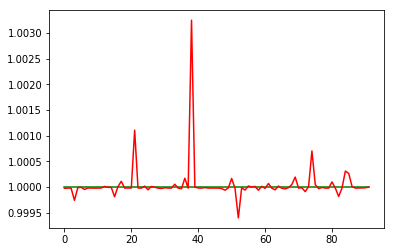

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:44:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3704000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:44:38
INFO:tensorflow:Saving dict for global step 3704000: global_step = 3704000, loss = 3.4522216e-08
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3704000: ./outputdir/model.ckpt-3704000
error on testset first run {'loss': 3.4522216e-08, 'global_step': 3704000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3704000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 435.831
INFO:tensorflow:loss = 1.3412379e-08, step = 3708601 (0.229 sec)
INFO:tensorflow:global_step/sec: 435.491
INFO:tensorflow:loss = 6.987912e-08, step = 3708701 (0.230 sec)
INFO:tensorflow:global_step/sec: 430.826
INFO:tensorflow:loss = 4.8466973e-09, step = 3708801 (0.232 sec)
INFO:tensorflow:global_step/sec: 442.692
INFO:tensorflow:loss = 3.0395686e-08, step = 3708901 (0.226 sec)
INFO:tensorflow:global_step/sec: 441.244
INFO:tensorflow:loss = 5.784443e-09, step = 3709001 (0.227 sec)
INFO:tensorflow:global_step/sec: 442.062
INFO:tensorflow:loss = 7.173785e-09, step = 3709101 (0.226 sec)
INFO:tensorflow:global_step/sec: 437.731
INFO:tensorflow:loss = 1.8932411e-11, step = 3709201 (0.229 sec)
INFO:tensorflow:global_step/sec: 435.373
INFO:tensorflow:loss = 6.668088e-11, step = 3709301 (0.229 sec)
INFO:tensorflow:global_step/sec: 419.405
INFO:tensorflow:loss = 2.9998304e-07, step = 3709401 (0.238 sec)
INFO:tensorflow:global_step/sec: 394.865
INFO:tens

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3714000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3714000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.3520743e-10, step = 3714001
INFO:tensorflow:global_step/sec: 164.035
INFO:tensorflow:loss = 1.1229021e-07, step = 3714101 (0.611 sec)
INFO:tensorflow:global_step/sec: 458.247
INFO:tensorflow:loss = 6.6973236e-09, step = 3714201 (0.218 sec)
INFO:tensorflow:global_step/sec: 458.266
INFO:tensorflow:loss = 3.5527137e-11, step = 3714301 (0.218 sec)
INFO:tensorflow:global_step/sec: 454.771
INFO:tensorflow:loss = 2.780688e-07, step = 3714401 (0.220 sec)
INFO:tensorflow:global_step/sec: 452.693
INFO:tensorflow:loss = 4.022013e-09, step = 3714501 (0.221 sec)
INFO:tensorflow:global_step/sec: 457.085
INFO:tensorflow:loss = 6.801134e-07, step = 3714601 (0.219 sec)
INFO:tensorflow:global_step/sec: 449.543
INFO:tensorflow:loss = 1.6134337e-07, ste

INFO:tensorflow:global_step/sec: 419.016
INFO:tensorflow:loss = 9.555379e-09, step = 3719901 (0.238 sec)
INFO:tensorflow:Saving checkpoints for 3720000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.269971e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3720000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.109143494154863e-07
prediction at  8 [array([0.99953955])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3720000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving che

INFO:tensorflow:loss = 5.5712235e-08, step = 3725101 (0.217 sec)
INFO:tensorflow:global_step/sec: 443.989
INFO:tensorflow:loss = 3.315236e-07, step = 3725201 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.866
INFO:tensorflow:loss = 4.9773693e-08, step = 3725301 (0.226 sec)
INFO:tensorflow:global_step/sec: 438.447
INFO:tensorflow:loss = 1.0133701e-06, step = 3725401 (0.228 sec)
INFO:tensorflow:global_step/sec: 444.063
INFO:tensorflow:loss = 1.800521e-07, step = 3725501 (0.225 sec)
INFO:tensorflow:global_step/sec: 429.183
INFO:tensorflow:loss = 5.6078623e-08, step = 3725601 (0.233 sec)
INFO:tensorflow:global_step/sec: 409.706
INFO:tensorflow:loss = 1.1165539e-06, step = 3725701 (0.244 sec)
INFO:tensorflow:global_step/sec: 412.408
INFO:tensorflow:loss = 3.1753484e-07, step = 3725801 (0.243 sec)
INFO:tensorflow:global_step/sec: 413.537
INFO:tensorflow:loss = 1.6427748e-07, step = 3725901 (0.242 sec)
INFO:tensorflow:Saving checkpoints for 3726000 into ./outputdir/model.ckpt.
INFO:tensorfl

INFO:tensorflow:global_step/sec: 424.643
INFO:tensorflow:loss = 2.2862595e-07, step = 3730401 (0.235 sec)
INFO:tensorflow:global_step/sec: 424.542
INFO:tensorflow:loss = 2.8828163e-07, step = 3730501 (0.236 sec)
INFO:tensorflow:global_step/sec: 383.035
INFO:tensorflow:loss = 1.7889818e-08, step = 3730601 (0.261 sec)
INFO:tensorflow:global_step/sec: 430.009
INFO:tensorflow:loss = 4.0013276e-08, step = 3730701 (0.233 sec)
INFO:tensorflow:global_step/sec: 389.329
INFO:tensorflow:loss = 2.0224542e-07, step = 3730801 (0.257 sec)
INFO:tensorflow:global_step/sec: 442.151
INFO:tensorflow:loss = 9.751176e-08, step = 3730901 (0.226 sec)
INFO:tensorflow:global_step/sec: 429.376
INFO:tensorflow:loss = 2.612942e-07, step = 3731001 (0.233 sec)
INFO:tensorflow:global_step/sec: 420.886
INFO:tensorflow:loss = 1.8793855e-12, step = 3731101 (0.237 sec)
INFO:tensorflow:global_step/sec: 430.026
INFO:tensorflow:loss = 4.4804302e-09, step = 3731201 (0.234 sec)
INFO:tensorflow:global_step/sec: 411.526
INFO:te

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3736000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3736000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.5520898e-08, step = 3736001
INFO:tensorflow:global_step/sec: 162.346
INFO:tensorflow:loss = 3.775682e-08, step = 3736101 (0.617 sec)
INFO:tensorflow:global_step/sec: 450.745
INFO:tensorflow:loss = 4.110189e-07, step = 3736201 (0.222 sec)
INFO:tensorflow:global_step/sec: 451.409
INFO:tensorflow:loss = 3.1043385e-08, step = 3736301 (0.221 sec)
INFO:tensorflow:global_step/sec: 439.491
INFO:tensorflow:loss = 3.9467665e-07, step = 3736401 (0.228 sec)
INFO:tensorflow:global_step/sec: 442.411
INFO:tensorflow:loss = 3.0791853e-08, step = 3736501 (0.226 sec)
INFO:tensorflow:global_step/sec: 430.586
INFO:tensorflow:loss = 3.7

INFO:tensorflow:global_step/sec: 382.55
INFO:tensorflow:loss = 6.6302164e-10, step = 3741801 (0.261 sec)
INFO:tensorflow:global_step/sec: 384.163
INFO:tensorflow:loss = 5.406449e-08, step = 3741901 (0.261 sec)
INFO:tensorflow:Saving checkpoints for 3742000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.06261524e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3742000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 4.178322068043964e-07
prediction at  19 [array([0.99948563])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3742000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3746000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3746000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.06337519, step = 3746001
INFO:tensorflow:global_step/sec: 165.695
INFO:tensorflow:loss = 1.3479853e-06, step = 3746101 (0.604 sec)
INFO:tensorflow:global_step/sec: 453.34
INFO:tensorflow:loss = 3.1517136e-11, step = 3746201 (0.221 sec)
INFO:tensorflow:global_step/sec: 450.255
INFO:tensorflow:loss = 0.005262577, step = 3746301 (0.222 sec)
INFO:tensorflow:global_step/sec: 427.916
INFO:tensorflow:loss = 0.0009190896, step = 3746401 (0.234 sec)
INFO:tensorflow:global_step/sec: 436.48
INFO:tensorflow:loss = 1.4893886e-08, step = 3746501 (0.230 sec)
INFO:tensorflow:global_step/sec: 425.887
INFO:tensorflow:loss = 1.3422735

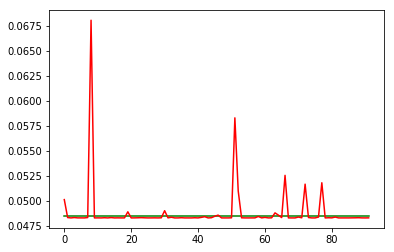

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:47:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3748000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:47:35
INFO:tensorflow:Saving dict for global step 3748000: global_step = 3748000, loss = 9.668132e-07
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3748000: ./outputdir/model.ckpt-3748000
error on testset first run {'loss': 9.668132e-07, 'global_step': 3748000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3748000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 437.543
INFO:tensorflow:loss = 3.8451557e-07, step = 3752601 (0.228 sec)
INFO:tensorflow:global_step/sec: 425.344
INFO:tensorflow:loss = 3.1033802e-09, step = 3752701 (0.235 sec)
INFO:tensorflow:global_step/sec: 450.138
INFO:tensorflow:loss = 1.2630121e-06, step = 3752801 (0.222 sec)
INFO:tensorflow:global_step/sec: 444.616
INFO:tensorflow:loss = 3.106925e-06, step = 3752901 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.568
INFO:tensorflow:loss = 6.2399895e-06, step = 3753001 (0.230 sec)
INFO:tensorflow:global_step/sec: 433.832
INFO:tensorflow:loss = 4.258931e-06, step = 3753101 (0.230 sec)
INFO:tensorflow:global_step/sec: 433.591
INFO:tensorflow:loss = 1.2146586e-05, step = 3753201 (0.230 sec)
INFO:tensorflow:global_step/sec: 443.195
INFO:tensorflow:loss = 1.2440016e-06, step = 3753301 (0.225 sec)
INFO:tensorflow:global_step/sec: 436.08
INFO:tensorflow:loss = 5.3145927e-06, step = 3753401 (0.229 sec)
INFO:tensorflow:global_step/sec: 441.513
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3758000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3758000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.320145e-09, step = 3758001
INFO:tensorflow:global_step/sec: 163.489
INFO:tensorflow:loss = 4.5615354e-07, step = 3758101 (0.613 sec)
INFO:tensorflow:global_step/sec: 447.315
INFO:tensorflow:loss = 1.310965e-05, step = 3758201 (0.224 sec)
INFO:tensorflow:global_step/sec: 429.333
INFO:tensorflow:loss = 8.038059e-06, step = 3758301 (0.233 sec)
INFO:tensorflow:global_step/sec: 421.221
INFO:tensorflow:loss = 4.7964113e-07, step = 3758401 (0.237 sec)
INFO:tensorflow:global_step/sec: 406.432
INFO:tensorflow:loss = 0.00014948037, step = 3758501 (0.246 sec)
INFO:tensorflow:global_step/sec: 430.23
INFO:tensorflow:loss = 7.304376e-08, step = 3758601 (0.233 sec)
INFO:tensorflow:global_step/sec: 437.855
INFO:tensorflow:loss = 6.815921e-06, step =

INFO:tensorflow:loss = 7.75513e-06, step = 3763901 (0.231 sec)
INFO:tensorflow:Saving checkpoints for 3764000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.1804726e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3764000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.5003810212901277e-05
prediction at  8 [array([0.04662214])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3764000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3764000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 460.06
INFO:tensorflow:loss = 2.3768427e-09, step = 3769201 (0.218 sec)
INFO:tensorflow:global_step/sec: 438.275
INFO:tensorflow:loss = 7.26691e-06, step = 3769301 (0.228 sec)
INFO:tensorflow:global_step/sec: 441.077
INFO:tensorflow:loss = 1.3303269e-05, step = 3769401 (0.227 sec)
INFO:tensorflow:global_step/sec: 429.225
INFO:tensorflow:loss = 4.68596e-07, step = 3769501 (0.233 sec)
INFO:tensorflow:global_step/sec: 441.776
INFO:tensorflow:loss = 1.427266e-05, step = 3769601 (0.226 sec)
INFO:tensorflow:global_step/sec: 443.017
INFO:tensorflow:loss = 2.411578e-05, step = 3769701 (0.226 sec)
INFO:tensorflow:global_step/sec: 425.842
INFO:tensorflow:loss = 1.2001582e-05, step = 3769801 (0.235 sec)
INFO:tensorflow:global_step/sec: 425.402
INFO:tensorflow:loss = 2.0288256e-09, step = 3769901 (0.235 sec)
INFO:tensorflow:Saving checkpoints for 3770000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.270485e-06.
INFO:tensorflow:Calling model_fn

INFO:tensorflow:loss = 3.698726e-06, step = 3774401 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.345
INFO:tensorflow:loss = 6.056505e-07, step = 3774501 (0.228 sec)
INFO:tensorflow:global_step/sec: 430.408
INFO:tensorflow:loss = 2.373248e-07, step = 3774601 (0.232 sec)
INFO:tensorflow:global_step/sec: 441.909
INFO:tensorflow:loss = 2.7520039e-06, step = 3774701 (0.226 sec)
INFO:tensorflow:global_step/sec: 439.78
INFO:tensorflow:loss = 5.183872e-06, step = 3774801 (0.227 sec)
INFO:tensorflow:global_step/sec: 447.546
INFO:tensorflow:loss = 3.6528015e-06, step = 3774901 (0.224 sec)
INFO:tensorflow:global_step/sec: 452.397
INFO:tensorflow:loss = 1.2100954e-05, step = 3775001 (0.221 sec)
INFO:tensorflow:global_step/sec: 429.362
INFO:tensorflow:loss = 1.9267775e-06, step = 3775101 (0.233 sec)
INFO:tensorflow:global_step/sec: 416.736
INFO:tensorflow:loss = 9.035096e-06, step = 3775201 (0.240 sec)
INFO:tensorflow:global_step/sec: 451.657
INFO:tensorflow:loss = 1.1713778e-05, step = 3775301

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3780000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3780000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.1789855e-06, step = 3780001
INFO:tensorflow:global_step/sec: 161.741
INFO:tensorflow:loss = 4.958911e-07, step = 3780101 (0.619 sec)
INFO:tensorflow:global_step/sec: 340.322
INFO:tensorflow:loss = 4.4929067e-07, step = 3780201 (0.294 sec)
INFO:tensorflow:global_step/sec: 453.651
INFO:tensorflow:loss = 5.556834e-07, step = 3780301 (0.220 sec)
INFO:tensorflow:global_step/sec: 447.05
INFO:tensorflow:loss = 4.666701e-07, step = 3780401 (0.224 sec)
INFO:tensorflow:global_step/sec: 439.697
INFO:tensorflow:loss = 4.9551863e-07, step = 3780501 (0.227 sec)
INFO:tensorflow:global_step/sec: 430.992
INFO:tensorflow:loss = 3.564

INFO:tensorflow:global_step/sec: 410.401
INFO:tensorflow:loss = 5.208039e-08, step = 3785801 (0.243 sec)
INFO:tensorflow:global_step/sec: 403.124
INFO:tensorflow:loss = 1.7857943e-08, step = 3785901 (0.248 sec)
INFO:tensorflow:Saving checkpoints for 3786000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.1879891e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3786000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 6.622013926023585e-06
prediction at  19 [array([0.04705702])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3786000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3790000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3790000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.533905e-05, step = 3790001
INFO:tensorflow:global_step/sec: 161.723
INFO:tensorflow:loss = 2.859174e-10, step = 3790101 (0.620 sec)
INFO:tensorflow:global_step/sec: 429.256
INFO:tensorflow:loss = 2.0385693e-11, step = 3790201 (0.233 sec)
INFO:tensorflow:global_step/sec: 431.826
INFO:tensorflow:loss = 1.2150948e-10, step = 3790301 (0.231 sec)
INFO:tensorflow:global_step/sec: 429.246
INFO:tensorflow:loss = 0.0018835788, step = 3790401 (0.233 sec)
INFO:tensorflow:global_step/sec: 335.486
INFO:tensorflow:loss = 7.505699e-08, step = 3790501 (0.298 sec)
INFO:tensorflow:global_step/sec: 428.987
INFO:tensorflow:loss = 1.145

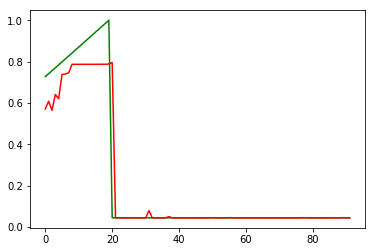

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:50:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3792000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:50:32
INFO:tensorflow:Saving dict for global step 3792000: global_step = 3792000, loss = 0.009987495
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3792000: ./outputdir/model.ckpt-3792000
error on testset first run {'loss': 0.009987495, 'global_step': 3792000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3792000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 434.507
INFO:tensorflow:loss = 1.7103444e-07, step = 3796601 (0.231 sec)
INFO:tensorflow:global_step/sec: 431.031
INFO:tensorflow:loss = 4.0784344e-06, step = 3796701 (0.232 sec)
INFO:tensorflow:global_step/sec: 432.109
INFO:tensorflow:loss = 7.930647e-07, step = 3796801 (0.232 sec)
INFO:tensorflow:global_step/sec: 436.228
INFO:tensorflow:loss = 1.6115941e-06, step = 3796901 (0.229 sec)
INFO:tensorflow:global_step/sec: 439.972
INFO:tensorflow:loss = 1.8101507e-06, step = 3797001 (0.228 sec)
INFO:tensorflow:global_step/sec: 436.962
INFO:tensorflow:loss = 1.4495147e-06, step = 3797101 (0.229 sec)
INFO:tensorflow:global_step/sec: 431.014
INFO:tensorflow:loss = 8.849499e-07, step = 3797201 (0.232 sec)
INFO:tensorflow:global_step/sec: 414.139
INFO:tensorflow:loss = 4.7402536e-06, step = 3797301 (0.241 sec)
INFO:tensorflow:global_step/sec: 401.258
INFO:tensorflow:loss = 8.606834e-06, step = 3797401 (0.249 sec)
INFO:tensorflow:global_step/sec: 389.864
INFO:ten

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3802000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3802000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.190849e-08, step = 3802001
INFO:tensorflow:global_step/sec: 164.074
INFO:tensorflow:loss = 5.004167e-08, step = 3802101 (0.610 sec)
INFO:tensorflow:global_step/sec: 464.976
INFO:tensorflow:loss = 1.8163308e-06, step = 3802201 (0.215 sec)
INFO:tensorflow:global_step/sec: 457.863
INFO:tensorflow:loss = 2.1555518e-07, step = 3802301 (0.219 sec)
INFO:tensorflow:global_step/sec: 459.28
INFO:tensorflow:loss = 1.3611137e-06, step = 3802401 (0.218 sec)
INFO:tensorflow:global_step/sec: 444.44
INFO:tensorflow:loss = 2.359206e-06, step = 3802501 (0.225 sec)
INFO:tensorflow:global_step/sec: 424.428
INFO:tensorflow:loss = 5.2945843e-06, step = 3802601 (0.236 sec)
INFO:tensorflow:global_step/sec: 425.929
INFO:tensorflow:loss = 1.86072e-06, step = 

INFO:tensorflow:loss = 3.546391e-06, step = 3807901 (0.225 sec)
INFO:tensorflow:Saving checkpoints for 3808000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.8128756e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3808000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.2297727707265683e-06
prediction at  8 [array([0.04573136])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3808000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3808000 into ./outputdir/m

INFO:tensorflow:global_step/sec: 443.634
INFO:tensorflow:loss = 1.8716614e-06, step = 3813201 (0.226 sec)
INFO:tensorflow:global_step/sec: 431.106
INFO:tensorflow:loss = 5.8565183e-07, step = 3813301 (0.231 sec)
INFO:tensorflow:global_step/sec: 434.28
INFO:tensorflow:loss = 1.15668264e-07, step = 3813401 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.091
INFO:tensorflow:loss = 2.0421553e-06, step = 3813501 (0.228 sec)
INFO:tensorflow:global_step/sec: 453.891
INFO:tensorflow:loss = 5.019062e-07, step = 3813601 (0.220 sec)
INFO:tensorflow:global_step/sec: 439.841
INFO:tensorflow:loss = 1.7043074e-05, step = 3813701 (0.227 sec)
INFO:tensorflow:global_step/sec: 436.513
INFO:tensorflow:loss = 2.0581679e-06, step = 3813801 (0.229 sec)
INFO:tensorflow:global_step/sec: 389.508
INFO:tensorflow:loss = 1.8604964e-06, step = 3813901 (0.257 sec)
INFO:tensorflow:Saving checkpoints for 3814000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.4674386e-07.
INFO:tensorflow:Calling m

INFO:tensorflow:loss = 1.9357649e-06, step = 3818401 (0.221 sec)
INFO:tensorflow:global_step/sec: 456.142
INFO:tensorflow:loss = 4.4413723e-06, step = 3818501 (0.219 sec)
INFO:tensorflow:global_step/sec: 442.07
INFO:tensorflow:loss = 1.3194876e-06, step = 3818601 (0.226 sec)
INFO:tensorflow:global_step/sec: 438.596
INFO:tensorflow:loss = 1.652089e-07, step = 3818701 (0.228 sec)
INFO:tensorflow:global_step/sec: 447.973
INFO:tensorflow:loss = 2.3541163e-06, step = 3818801 (0.224 sec)
INFO:tensorflow:global_step/sec: 437.587
INFO:tensorflow:loss = 2.7796602e-06, step = 3818901 (0.228 sec)
INFO:tensorflow:global_step/sec: 439.408
INFO:tensorflow:loss = 2.4703706e-09, step = 3819001 (0.228 sec)
INFO:tensorflow:global_step/sec: 452.669
INFO:tensorflow:loss = 4.4247486e-09, step = 3819101 (0.221 sec)
INFO:tensorflow:global_step/sec: 446.877
INFO:tensorflow:loss = 4.823746e-07, step = 3819201 (0.224 sec)
INFO:tensorflow:global_step/sec: 455.005
INFO:tensorflow:loss = 8.895256e-07, step = 38193

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3824000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3824000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.1784212e-05, step = 3824001
INFO:tensorflow:global_step/sec: 164.21
INFO:tensorflow:loss = 1.2800839e-06, step = 3824101 (0.610 sec)
INFO:tensorflow:global_step/sec: 468.658
INFO:tensorflow:loss = 1.9354165e-05, step = 3824201 (0.213 sec)
INFO:tensorflow:global_step/sec: 463.399
INFO:tensorflow:loss = 1.5646957e-06, step = 3824301 (0.216 sec)
INFO:tensorflow:global_step/sec: 446.475
INFO:tensorflow:loss = 2.0320653e-05, step = 3824401 (0.224 sec)
INFO:tensorflow:global_step/sec: 442.333
INFO:tensorflow:loss = 1.7540559e-06, step = 3824501 (0.226 sec)
INFO:tensorflow:global_step/sec: 438.984
INFO:tensorflow:loss = 2.

INFO:tensorflow:global_step/sec: 415.079
INFO:tensorflow:loss = 2.6190773e-07, step = 3829801 (0.241 sec)
INFO:tensorflow:global_step/sec: 441.046
INFO:tensorflow:loss = 2.0630235e-08, step = 3829901 (0.226 sec)
INFO:tensorflow:Saving checkpoints for 3830000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.5747234e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3830000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 7.632417018195844e-07
prediction at  19 [array([0.0439015])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3830000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3834000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3834000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.044551723, step = 3834001
INFO:tensorflow:global_step/sec: 163.364
INFO:tensorflow:loss = 2.428218e-06, step = 3834101 (0.613 sec)
INFO:tensorflow:global_step/sec: 465.664
INFO:tensorflow:loss = 2.610689e-06, step = 3834201 (0.215 sec)
INFO:tensorflow:global_step/sec: 475.326
INFO:tensorflow:loss = 5.685591e-07, step = 3834301 (0.210 sec)
INFO:tensorflow:global_step/sec: 469.071
INFO:tensorflow:loss = 0.00014219525, step = 3834401 (0.213 sec)
INFO:tensorflow:global_step/sec: 479.122
INFO:tensorflow:loss = 5.092912e-07, step = 3834501 (0.209 sec)
INFO:tensorflow:global_step/sec: 458.798
INFO:tensorflow:loss = 2.18798

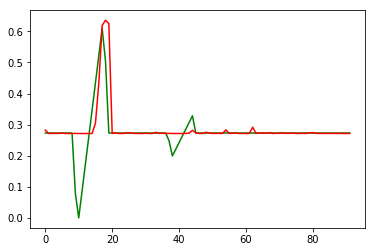

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:53:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3836000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:53:28
INFO:tensorflow:Saving dict for global step 3836000: global_step = 3836000, loss = 0.0038383657
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3836000: ./outputdir/model.ckpt-3836000
error on testset first run {'loss': 0.0038383657, 'global_step': 3836000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3836000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 460.412
INFO:tensorflow:loss = 1.414556e-06, step = 3840601 (0.217 sec)
INFO:tensorflow:global_step/sec: 396.49
INFO:tensorflow:loss = 6.613687e-07, step = 3840701 (0.252 sec)
INFO:tensorflow:global_step/sec: 418.975
INFO:tensorflow:loss = 2.5611013e-07, step = 3840801 (0.239 sec)
INFO:tensorflow:global_step/sec: 428.469
INFO:tensorflow:loss = 2.5566546e-06, step = 3840901 (0.233 sec)
INFO:tensorflow:global_step/sec: 448.137
INFO:tensorflow:loss = 4.265591e-06, step = 3841001 (0.223 sec)
INFO:tensorflow:global_step/sec: 451.781
INFO:tensorflow:loss = 2.8633583e-06, step = 3841101 (0.221 sec)
INFO:tensorflow:global_step/sec: 446.421
INFO:tensorflow:loss = 2.2660694e-07, step = 3841201 (0.224 sec)
INFO:tensorflow:global_step/sec: 428.51
INFO:tensorflow:loss = 5.8676994e-07, step = 3841301 (0.233 sec)
INFO:tensorflow:global_step/sec: 423.289
INFO:tensorflow:loss = 1.3382684e-07, step = 3841401 (0.236 sec)
INFO:tensorflow:global_step/sec: 427.294
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3846000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3846000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 4.0508407e-06, step = 3846001
INFO:tensorflow:global_step/sec: 165.314
INFO:tensorflow:loss = 2.0331905e-09, step = 3846101 (0.606 sec)
INFO:tensorflow:global_step/sec: 454.705
INFO:tensorflow:loss = 1.0645213e-08, step = 3846201 (0.220 sec)
INFO:tensorflow:global_step/sec: 456.439
INFO:tensorflow:loss = 8.240081e-07, step = 3846301 (0.219 sec)
INFO:tensorflow:global_step/sec: 461.621
INFO:tensorflow:loss = 3.1558978e-09, step = 3846401 (0.217 sec)
INFO:tensorflow:global_step/sec: 442.609
INFO:tensorflow:loss = 1.7587814e-05, step = 3846501 (0.226 sec)
INFO:tensorflow:global_step/sec: 449.228
INFO:tensorflow:loss = 1.7984014e-06, step = 3846601 (0.222 sec)
INFO:tensorflow:global_step/sec: 446.487
INFO:tensorflow:loss = 9.605552e-07, st

INFO:tensorflow:global_step/sec: 414.808
INFO:tensorflow:loss = 1.8649503e-06, step = 3851901 (0.241 sec)
INFO:tensorflow:Saving checkpoints for 3852000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.3935579e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3852000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.4804744174222615e-07
prediction at  8 [array([0.2709139])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3852000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving c

INFO:tensorflow:loss = 2.0625954e-08, step = 3857101 (0.221 sec)
INFO:tensorflow:global_step/sec: 430.309
INFO:tensorflow:loss = 1.2487344e-06, step = 3857201 (0.232 sec)
INFO:tensorflow:global_step/sec: 432.153
INFO:tensorflow:loss = 1.8537688e-07, step = 3857301 (0.231 sec)
INFO:tensorflow:global_step/sec: 438.471
INFO:tensorflow:loss = 9.20327e-09, step = 3857401 (0.229 sec)
INFO:tensorflow:global_step/sec: 436.173
INFO:tensorflow:loss = 9.117811e-08, step = 3857501 (0.229 sec)
INFO:tensorflow:global_step/sec: 437.595
INFO:tensorflow:loss = 4.9182377e-06, step = 3857601 (0.229 sec)
INFO:tensorflow:global_step/sec: 436.941
INFO:tensorflow:loss = 1.1634545e-06, step = 3857701 (0.229 sec)
INFO:tensorflow:global_step/sec: 425.071
INFO:tensorflow:loss = 2.0090184e-08, step = 3857801 (0.235 sec)
INFO:tensorflow:global_step/sec: 419.731
INFO:tensorflow:loss = 1.2371056e-06, step = 3857901 (0.238 sec)
INFO:tensorflow:Saving checkpoints for 3858000 into ./outputdir/model.ckpt.
INFO:tensorflo

INFO:tensorflow:global_step/sec: 429.767
INFO:tensorflow:loss = 1.2681921e-06, step = 3862401 (0.233 sec)
INFO:tensorflow:global_step/sec: 414.685
INFO:tensorflow:loss = 2.3871542e-06, step = 3862501 (0.241 sec)
INFO:tensorflow:global_step/sec: 421.855
INFO:tensorflow:loss = 1.4850273e-08, step = 3862601 (0.237 sec)
INFO:tensorflow:global_step/sec: 420.924
INFO:tensorflow:loss = 1.94549e-06, step = 3862701 (0.237 sec)
INFO:tensorflow:global_step/sec: 432.664
INFO:tensorflow:loss = 1.9036293e-09, step = 3862801 (0.231 sec)
INFO:tensorflow:global_step/sec: 414.375
INFO:tensorflow:loss = 1.5433443e-07, step = 3862901 (0.241 sec)
INFO:tensorflow:global_step/sec: 408.253
INFO:tensorflow:loss = 1.1654413e-07, step = 3863001 (0.245 sec)
INFO:tensorflow:global_step/sec: 408.005
INFO:tensorflow:loss = 1.5144435e-06, step = 3863101 (0.245 sec)
INFO:tensorflow:global_step/sec: 401.286
INFO:tensorflow:loss = 5.356127e-07, step = 3863201 (0.249 sec)
INFO:tensorflow:global_step/sec: 399.176
INFO:ten

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3868000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3868000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.3459109e-09, step = 3868001
INFO:tensorflow:global_step/sec: 162.982
INFO:tensorflow:loss = 1.7866705e-06, step = 3868101 (0.614 sec)
INFO:tensorflow:global_step/sec: 447.249
INFO:tensorflow:loss = 1.8629158e-06, step = 3868201 (0.224 sec)
INFO:tensorflow:global_step/sec: 437.909
INFO:tensorflow:loss = 1.8142629e-06, step = 3868301 (0.228 sec)
INFO:tensorflow:global_step/sec: 424.725
INFO:tensorflow:loss = 1.8988013e-06, step = 3868401 (0.236 sec)
INFO:tensorflow:global_step/sec: 447.734
INFO:tensorflow:loss = 1.8237488e-06, step = 3868501 (0.224 sec)
INFO:tensorflow:global_step/sec: 457.867
INFO:tensorflow:loss = 1

INFO:tensorflow:global_step/sec: 450.242
INFO:tensorflow:loss = 4.491209e-07, step = 3873801 (0.222 sec)
INFO:tensorflow:global_step/sec: 430.572
INFO:tensorflow:loss = 6.78924e-08, step = 3873901 (0.232 sec)
INFO:tensorflow:Saving checkpoints for 3874000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.6841008e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3874000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.0813925802258802e-08
prediction at  19 [array([0.27265793])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3874000
I

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3878000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3878000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0006530466, step = 3878001
INFO:tensorflow:global_step/sec: 159.467
INFO:tensorflow:loss = 6.87024e-10, step = 3878101 (0.628 sec)
INFO:tensorflow:global_step/sec: 454.494
INFO:tensorflow:loss = 6.7168493e-13, step = 3878201 (0.220 sec)
INFO:tensorflow:global_step/sec: 455.94
INFO:tensorflow:loss = 3.5527137e-15, step = 3878301 (0.219 sec)
INFO:tensorflow:global_step/sec: 443.241
INFO:tensorflow:loss = 2.2266676e-08, step = 3878401 (0.225 sec)
INFO:tensorflow:global_step/sec: 399.808
INFO:tensorflow:loss = 2.2737368e-11, step = 3878501 (0.251 sec)
INFO:tensorflow:global_step/sec: 432.659
INFO:tensorflow:loss = 3.552

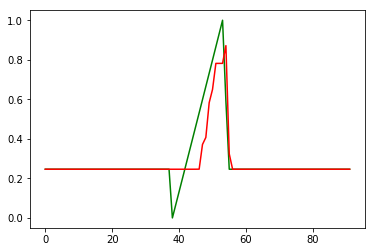

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:56:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3880000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:56:22
INFO:tensorflow:Saving dict for global step 3880000: global_step = 3880000, loss = 0.007065205
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3880000: ./outputdir/model.ckpt-3880000
error on testset first run {'loss': 0.007065205, 'global_step': 3880000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3880000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 438.55
INFO:tensorflow:loss = 8.881784e-16, step = 3884601 (0.229 sec)
INFO:tensorflow:global_step/sec: 440.498
INFO:tensorflow:loss = 7.993606e-15, step = 3884701 (0.226 sec)
INFO:tensorflow:global_step/sec: 440.003
INFO:tensorflow:loss = 4.863665e-12, step = 3884801 (0.227 sec)
INFO:tensorflow:global_step/sec: 447.592
INFO:tensorflow:loss = 1.0880186e-14, step = 3884901 (0.223 sec)
INFO:tensorflow:global_step/sec: 434.069
INFO:tensorflow:loss = 5.684342e-14, step = 3885001 (0.230 sec)
INFO:tensorflow:global_step/sec: 447.66
INFO:tensorflow:loss = 3.7525538e-14, step = 3885101 (0.223 sec)
INFO:tensorflow:global_step/sec: 387.626
INFO:tensorflow:loss = 6.237233e-13, step = 3885201 (0.258 sec)
INFO:tensorflow:global_step/sec: 433.759
INFO:tensorflow:loss = 2.6867397e-14, step = 3885301 (0.230 sec)
INFO:tensorflow:global_step/sec: 417.075
INFO:tensorflow:loss = 7.194245e-14, step = 3885401 (0.240 sec)
INFO:tensorflow:global_step/sec: 439.032
INFO:tensorfl

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3890000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3890000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0, step = 3890001
INFO:tensorflow:global_step/sec: 159.854
INFO:tensorflow:loss = 3.8221515e-10, step = 3890101 (0.626 sec)
INFO:tensorflow:global_step/sec: 464.138
INFO:tensorflow:loss = 1.1552894e-09, step = 3890201 (0.215 sec)
INFO:tensorflow:global_step/sec: 463.674
INFO:tensorflow:loss = 3.6750208e-08, step = 3890301 (0.216 sec)
INFO:tensorflow:global_step/sec: 473.543
INFO:tensorflow:loss = 1.8932411e-11, step = 3890401 (0.211 sec)
INFO:tensorflow:global_step/sec: 471.36
INFO:tensorflow:loss = 4.778471e-09, step = 3890501 (0.212 sec)
INFO:tensorflow:global_step/sec: 472.353
INFO:tensorflow:loss = 5.4011515e-09, step = 3890601 (0.212 sec)
INFO:tensorflow:global_step/sec: 449.347
INFO:tensorflow:loss = 6.765788e-11, step = 389070

INFO:tensorflow:loss = 4.0295767e-11, step = 3895901 (0.232 sec)
INFO:tensorflow:Saving checkpoints for 3896000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.30026e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3896000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.5569560697178765e-07
prediction at  8 [array([0.24633651])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3896000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3896000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 468.509
INFO:tensorflow:loss = 2.0720226e-10, step = 3901201 (0.213 sec)
INFO:tensorflow:global_step/sec: 468.973
INFO:tensorflow:loss = 5.528933e-11, step = 3901301 (0.213 sec)
INFO:tensorflow:global_step/sec: 472.46
INFO:tensorflow:loss = 4.8259716e-09, step = 3901401 (0.212 sec)
INFO:tensorflow:global_step/sec: 454.435
INFO:tensorflow:loss = 4.925643e-08, step = 3901501 (0.220 sec)
INFO:tensorflow:global_step/sec: 392.74
INFO:tensorflow:loss = 8.559685e-08, step = 3901601 (0.254 sec)
INFO:tensorflow:global_step/sec: 450.52
INFO:tensorflow:loss = 2.7456792e-10, step = 3901701 (0.222 sec)
INFO:tensorflow:global_step/sec: 451.267
INFO:tensorflow:loss = 4.2231036e-08, step = 3901801 (0.222 sec)
INFO:tensorflow:global_step/sec: 444.002
INFO:tensorflow:loss = 6.120873e-08, step = 3901901 (0.225 sec)
INFO:tensorflow:Saving checkpoints for 3902000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.2005603e-08.
INFO:tensorflow:Calling model_f

INFO:tensorflow:loss = 2.4345379e-08, step = 3906401 (0.218 sec)
INFO:tensorflow:global_step/sec: 446.731
INFO:tensorflow:loss = 1.8577941e-08, step = 3906501 (0.224 sec)
INFO:tensorflow:global_step/sec: 449.005
INFO:tensorflow:loss = 8.5161446e-08, step = 3906601 (0.223 sec)
INFO:tensorflow:global_step/sec: 443.306
INFO:tensorflow:loss = 2.8685044e-08, step = 3906701 (0.226 sec)
INFO:tensorflow:global_step/sec: 437.464
INFO:tensorflow:loss = 1.2201921e-08, step = 3906801 (0.229 sec)
INFO:tensorflow:global_step/sec: 438.788
INFO:tensorflow:loss = 7.5519004e-08, step = 3906901 (0.228 sec)
INFO:tensorflow:global_step/sec: 452.668
INFO:tensorflow:loss = 1.2667495e-07, step = 3907001 (0.221 sec)
INFO:tensorflow:global_step/sec: 449.265
INFO:tensorflow:loss = 1.96867e-07, step = 3907101 (0.223 sec)
INFO:tensorflow:global_step/sec: 450.211
INFO:tensorflow:loss = 7.2230506e-08, step = 3907201 (0.222 sec)
INFO:tensorflow:global_step/sec: 450.323
INFO:tensorflow:loss = 2.131211e-08, step = 3907

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3912000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3912000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.4987131e-07, step = 3912001
INFO:tensorflow:global_step/sec: 163.596
INFO:tensorflow:loss = 7.959004e-09, step = 3912101 (0.612 sec)
INFO:tensorflow:global_step/sec: 450.678
INFO:tensorflow:loss = 1.5603676e-07, step = 3912201 (0.222 sec)
INFO:tensorflow:global_step/sec: 448.266
INFO:tensorflow:loss = 1.1761544e-08, step = 3912301 (0.223 sec)
INFO:tensorflow:global_step/sec: 456.876
INFO:tensorflow:loss = 1.6750627e-07, step = 3912401 (0.219 sec)
INFO:tensorflow:global_step/sec: 437.974
INFO:tensorflow:loss = 1.5241413e-08, step = 3912501 (0.228 sec)
INFO:tensorflow:global_step/sec: 453.342
INFO:tensorflow:loss = 1.

INFO:tensorflow:global_step/sec: 431.442
INFO:tensorflow:loss = 2.3926333e-07, step = 3917801 (0.232 sec)
INFO:tensorflow:global_step/sec: 426.381
INFO:tensorflow:loss = 1.5114313e-07, step = 3917901 (0.235 sec)
INFO:tensorflow:Saving checkpoints for 3918000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.653258e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3918000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 7.381856852527459e-09
prediction at  19 [array([0.24675685])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3918000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3922000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3922000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0056223343, step = 3922001
INFO:tensorflow:global_step/sec: 166.07
INFO:tensorflow:loss = 1.2883733e-07, step = 3922101 (0.603 sec)
INFO:tensorflow:global_step/sec: 453.865
INFO:tensorflow:loss = 1.3263026e-09, step = 3922201 (0.220 sec)
INFO:tensorflow:global_step/sec: 459.217
INFO:tensorflow:loss = 4.2987836e-13, step = 3922301 (0.218 sec)
INFO:tensorflow:global_step/sec: 447.459
INFO:tensorflow:loss = 1.4199374e-07, step = 3922401 (0.224 sec)
INFO:tensorflow:global_step/sec: 440.439
INFO:tensorflow:loss = 2.4016344e-12, step = 3922501 (0.227 sec)
INFO:tensorflow:global_step/sec: 439.377
INFO:tensorflow:loss = 8.4

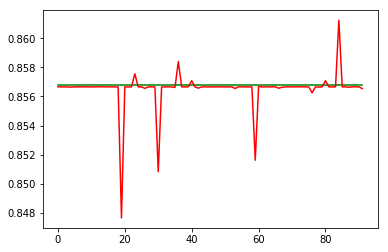

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-04-23:59:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3924000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-04-23:59:16
INFO:tensorflow:Saving dict for global step 3924000: global_step = 3924000, loss = 4.877403e-06
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3924000: ./outputdir/model.ckpt-3924000
error on testset first run {'loss': 4.877403e-06, 'global_step': 3924000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3924000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 428.475
INFO:tensorflow:loss = 7.781864e-09, step = 3928601 (0.233 sec)
INFO:tensorflow:global_step/sec: 441.341
INFO:tensorflow:loss = 7.194245e-10, step = 3928701 (0.227 sec)
INFO:tensorflow:global_step/sec: 443.737
INFO:tensorflow:loss = 2.8413126e-08, step = 3928801 (0.225 sec)
INFO:tensorflow:global_step/sec: 443.04
INFO:tensorflow:loss = 1.7244548e-07, step = 3928901 (0.226 sec)
INFO:tensorflow:global_step/sec: 447.39
INFO:tensorflow:loss = 7.114531e-08, step = 3929001 (0.223 sec)
INFO:tensorflow:global_step/sec: 452.835
INFO:tensorflow:loss = 1.8274301e-07, step = 3929101 (0.221 sec)
INFO:tensorflow:global_step/sec: 434.853
INFO:tensorflow:loss = 1.5385243e-08, step = 3929201 (0.230 sec)
INFO:tensorflow:global_step/sec: 441.534
INFO:tensorflow:loss = 3.8361478e-08, step = 3929301 (0.226 sec)
INFO:tensorflow:global_step/sec: 419.561
INFO:tensorflow:loss = 5.5777925e-09, step = 3929401 (0.238 sec)
INFO:tensorflow:global_step/sec: 399.684
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3934000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3934000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.0692317e-07, step = 3934001
INFO:tensorflow:global_step/sec: 166.117
INFO:tensorflow:loss = 9.762347e-08, step = 3934101 (0.603 sec)
INFO:tensorflow:global_step/sec: 466.577
INFO:tensorflow:loss = 1.5017804e-08, step = 3934201 (0.214 sec)
INFO:tensorflow:global_step/sec: 465.666
INFO:tensorflow:loss = 3.1425182e-07, step = 3934301 (0.215 sec)
INFO:tensorflow:global_step/sec: 452.796
INFO:tensorflow:loss = 1.4230835e-07, step = 3934401 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.77
INFO:tensorflow:loss = 1.4040836e-08, step = 3934501 (0.220 sec)
INFO:tensorflow:global_step/sec: 452.294
INFO:tensorflow:loss = 1.3509194e-08, step = 3934601 (0.221 sec)
INFO:tensorflow:global_step/sec: 447.451
INFO:tensorflow:loss = 7.2284115e-07, st

INFO:tensorflow:loss = 3.969266e-09, step = 3939901 (0.257 sec)
INFO:tensorflow:Saving checkpoints for 3940000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.2660182e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3940000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.5594750965504185e-08
prediction at  8 [array([0.85712345])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3940000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3940000 into ./outputdir/m

INFO:tensorflow:global_step/sec: 461.468
INFO:tensorflow:loss = 3.954259e-09, step = 3945201 (0.217 sec)
INFO:tensorflow:global_step/sec: 457.274
INFO:tensorflow:loss = 3.103214e-07, step = 3945301 (0.219 sec)
INFO:tensorflow:global_step/sec: 442.194
INFO:tensorflow:loss = 5.3511545e-08, step = 3945401 (0.226 sec)
INFO:tensorflow:global_step/sec: 440.447
INFO:tensorflow:loss = 6.10985e-07, step = 3945501 (0.227 sec)
INFO:tensorflow:global_step/sec: 434.686
INFO:tensorflow:loss = 1.7657875e-09, step = 3945601 (0.230 sec)
INFO:tensorflow:global_step/sec: 442.809
INFO:tensorflow:loss = 3.306319e-07, step = 3945701 (0.226 sec)
INFO:tensorflow:global_step/sec: 427.065
INFO:tensorflow:loss = 6.9533748e-09, step = 3945801 (0.234 sec)
INFO:tensorflow:global_step/sec: 406.103
INFO:tensorflow:loss = 3.8131134e-09, step = 3945901 (0.247 sec)
INFO:tensorflow:Saving checkpoints for 3946000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.4168935e-07.
INFO:tensorflow:Calling model

INFO:tensorflow:loss = 3.529658e-08, step = 3950401 (0.235 sec)
INFO:tensorflow:global_step/sec: 426.639
INFO:tensorflow:loss = 3.941935e-08, step = 3950501 (0.234 sec)
INFO:tensorflow:global_step/sec: 439.915
INFO:tensorflow:loss = 1.2827996e-06, step = 3950601 (0.227 sec)
INFO:tensorflow:global_step/sec: 438.962
INFO:tensorflow:loss = 3.222545e-07, step = 3950701 (0.228 sec)
INFO:tensorflow:global_step/sec: 454.705
INFO:tensorflow:loss = 6.9077237e-07, step = 3950801 (0.220 sec)
INFO:tensorflow:global_step/sec: 439.533
INFO:tensorflow:loss = 2.6514726e-07, step = 3950901 (0.228 sec)
INFO:tensorflow:global_step/sec: 461.346
INFO:tensorflow:loss = 3.774931e-07, step = 3951001 (0.217 sec)
INFO:tensorflow:global_step/sec: 448.162
INFO:tensorflow:loss = 5.1085408e-08, step = 3951101 (0.223 sec)
INFO:tensorflow:global_step/sec: 464.505
INFO:tensorflow:loss = 6.145228e-08, step = 3951201 (0.215 sec)
INFO:tensorflow:global_step/sec: 437.945
INFO:tensorflow:loss = 1.7195134e-08, step = 395130

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3956000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3956000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.812835e-08, step = 3956001
INFO:tensorflow:global_step/sec: 160.633
INFO:tensorflow:loss = 2.5899283e-12, step = 3956101 (0.623 sec)
INFO:tensorflow:global_step/sec: 429.013
INFO:tensorflow:loss = 1.7929415e-07, step = 3956201 (0.233 sec)
INFO:tensorflow:global_step/sec: 442.015
INFO:tensorflow:loss = 2.220446e-12, step = 3956301 (0.226 sec)
INFO:tensorflow:global_step/sec: 455.429
INFO:tensorflow:loss = 1.847871e-07, step = 3956401 (0.220 sec)
INFO:tensorflow:global_step/sec: 461.894
INFO:tensorflow:loss = 1.8417268e-11, step = 3956501 (0.217 sec)
INFO:tensorflow:global_step/sec: 453.436
INFO:tensorflow:loss = 1.88

INFO:tensorflow:global_step/sec: 447.909
INFO:tensorflow:loss = 1.82132e-09, step = 3961801 (0.223 sec)
INFO:tensorflow:global_step/sec: 443.983
INFO:tensorflow:loss = 2.4563187e-07, step = 3961901 (0.225 sec)
INFO:tensorflow:Saving checkpoints for 3962000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.2661536e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3962000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.6690136245455484e-07
prediction at  19 [array([0.85659266])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3962000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3966000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3966000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.047205593, step = 3966001
INFO:tensorflow:global_step/sec: 164.338
INFO:tensorflow:loss = 1.2122969e-07, step = 3966101 (0.609 sec)
INFO:tensorflow:global_step/sec: 444.245
INFO:tensorflow:loss = 1.0552448e-11, step = 3966201 (0.225 sec)
INFO:tensorflow:global_step/sec: 439.017
INFO:tensorflow:loss = 0.0, step = 3966301 (0.228 sec)
INFO:tensorflow:global_step/sec: 423.73
INFO:tensorflow:loss = 1.7194587e-05, step = 3966401 (0.237 sec)
INFO:tensorflow:global_step/sec: 424.659
INFO:tensorflow:loss = 2.4180657e-11, step = 3966501 (0.235 sec)
INFO:tensorflow:global_step/sec: 432.884
INFO:tensorflow:loss = 7.194245e-12, 

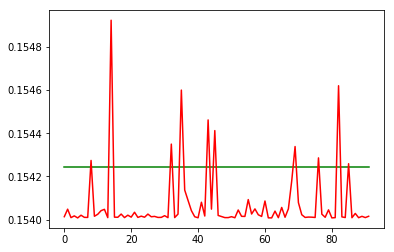

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:02:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3968000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:02:12
INFO:tensorflow:Saving dict for global step 3968000: global_step = 3968000, loss = 9.582978e-06
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3968000: ./outputdir/model.ckpt-3968000
error on testset first run {'loss': 9.582978e-06, 'global_step': 3968000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3968000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 464.24
INFO:tensorflow:loss = 5.9721117e-10, step = 3972601 (0.215 sec)
INFO:tensorflow:global_step/sec: 455.479
INFO:tensorflow:loss = 1.3693404e-08, step = 3972701 (0.220 sec)
INFO:tensorflow:global_step/sec: 449.978
INFO:tensorflow:loss = 1.07528216e-07, step = 3972801 (0.222 sec)
INFO:tensorflow:global_step/sec: 435.94
INFO:tensorflow:loss = 1.3394782e-06, step = 3972901 (0.230 sec)
INFO:tensorflow:global_step/sec: 445.778
INFO:tensorflow:loss = 3.9478543e-08, step = 3973001 (0.224 sec)
INFO:tensorflow:global_step/sec: 459.787
INFO:tensorflow:loss = 2.8141045e-09, step = 3973101 (0.217 sec)
INFO:tensorflow:global_step/sec: 469.177
INFO:tensorflow:loss = 7.472156e-09, step = 3973201 (0.213 sec)
INFO:tensorflow:global_step/sec: 456.275
INFO:tensorflow:loss = 9.0986424e-07, step = 3973301 (0.219 sec)
INFO:tensorflow:global_step/sec: 441.593
INFO:tensorflow:loss = 2.1440482e-07, step = 3973401 (0.226 sec)
INFO:tensorflow:global_step/sec: 423.299
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3978000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3978000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.584441e-06, step = 3978001
INFO:tensorflow:global_step/sec: 164.523
INFO:tensorflow:loss = 2.3937997e-07, step = 3978101 (0.609 sec)
INFO:tensorflow:global_step/sec: 450.538
INFO:tensorflow:loss = 1.5399509e-07, step = 3978201 (0.222 sec)
INFO:tensorflow:global_step/sec: 425.09
INFO:tensorflow:loss = 8.4269834e-07, step = 3978301 (0.235 sec)
INFO:tensorflow:global_step/sec: 393.111
INFO:tensorflow:loss = 5.791423e-10, step = 3978401 (0.255 sec)
INFO:tensorflow:global_step/sec: 400.402
INFO:tensorflow:loss = 1.7328655e-06, step = 3978501 (0.250 sec)
INFO:tensorflow:global_step/sec: 438.618
INFO:tensorflow:loss = 1.3423426e-06, step = 3978601 (0.228 sec)
INFO:tensorflow:global_step/sec: 452.798
INFO:tensorflow:loss = 9.008467e-07, step

INFO:tensorflow:loss = 9.748385e-08, step = 3983901 (0.264 sec)
INFO:tensorflow:Saving checkpoints for 3984000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.8611114e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3984000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.871900518166962e-07
prediction at  8 [array([0.15338607])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-3984000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3984000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 406.911
INFO:tensorflow:loss = 4.1679007e-07, step = 3989201 (0.246 sec)
INFO:tensorflow:global_step/sec: 401.39
INFO:tensorflow:loss = 2.8725438e-08, step = 3989301 (0.249 sec)
INFO:tensorflow:global_step/sec: 409.073
INFO:tensorflow:loss = 4.7346913e-07, step = 3989401 (0.244 sec)
INFO:tensorflow:global_step/sec: 410.379
INFO:tensorflow:loss = 1.720295e-08, step = 3989501 (0.244 sec)
INFO:tensorflow:global_step/sec: 381.014
INFO:tensorflow:loss = 1.02191855e-07, step = 3989601 (0.262 sec)
INFO:tensorflow:global_step/sec: 396.085
INFO:tensorflow:loss = 1.5337225e-08, step = 3989701 (0.252 sec)
INFO:tensorflow:global_step/sec: 411.152
INFO:tensorflow:loss = 2.187598e-07, step = 3989801 (0.243 sec)
INFO:tensorflow:global_step/sec: 409.088
INFO:tensorflow:loss = 3.5496944e-07, step = 3989901 (0.244 sec)
INFO:tensorflow:Saving checkpoints for 3990000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.3381352e-07.
INFO:tensorflow:Calling mo

INFO:tensorflow:loss = 3.1215032e-07, step = 3994401 (0.233 sec)
INFO:tensorflow:global_step/sec: 423.862
INFO:tensorflow:loss = 7.7115664e-07, step = 3994501 (0.236 sec)
INFO:tensorflow:global_step/sec: 417.416
INFO:tensorflow:loss = 2.500074e-08, step = 3994601 (0.239 sec)
INFO:tensorflow:global_step/sec: 419.821
INFO:tensorflow:loss = 6.903018e-07, step = 3994701 (0.238 sec)
INFO:tensorflow:global_step/sec: 428.346
INFO:tensorflow:loss = 9.537385e-08, step = 3994801 (0.234 sec)
INFO:tensorflow:global_step/sec: 426.823
INFO:tensorflow:loss = 1.1314068e-07, step = 3994901 (0.233 sec)
INFO:tensorflow:global_step/sec: 419.349
INFO:tensorflow:loss = 1.1445769e-07, step = 3995001 (0.238 sec)
INFO:tensorflow:global_step/sec: 420.025
INFO:tensorflow:loss = 6.099139e-09, step = 3995101 (0.238 sec)
INFO:tensorflow:global_step/sec: 436.106
INFO:tensorflow:loss = 2.0204443e-07, step = 3995201 (0.229 sec)
INFO:tensorflow:global_step/sec: 436.403
INFO:tensorflow:loss = 1.9469122e-07, step = 39953

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4000000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4000000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.095327e-08, step = 4000001
INFO:tensorflow:global_step/sec: 138.217
INFO:tensorflow:loss = 2.6941512e-07, step = 4000101 (0.724 sec)
INFO:tensorflow:global_step/sec: 395.661
INFO:tensorflow:loss = 3.945486e-08, step = 4000201 (0.253 sec)
INFO:tensorflow:global_step/sec: 384.827
INFO:tensorflow:loss = 2.9897188e-07, step = 4000301 (0.261 sec)
INFO:tensorflow:global_step/sec: 407.719
INFO:tensorflow:loss = 4.3284807e-08, step = 4000401 (0.244 sec)
INFO:tensorflow:global_step/sec: 398.46
INFO:tensorflow:loss = 3.094919e-07, step = 4000501 (0.251 sec)
INFO:tensorflow:global_step/sec: 391.633
INFO:tensorflow:loss = 4.722

INFO:tensorflow:global_step/sec: 428.85
INFO:tensorflow:loss = 6.605691e-07, step = 4005801 (0.234 sec)
INFO:tensorflow:global_step/sec: 426.114
INFO:tensorflow:loss = 1.7588153e-12, step = 4005901 (0.235 sec)
INFO:tensorflow:Saving checkpoints for 4006000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.4280346e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4006000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 7.834153467926085e-09
prediction at  19 [array([0.15460951])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4006000
I

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4010000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4010000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.039224666, step = 4010001
INFO:tensorflow:global_step/sec: 160.534
INFO:tensorflow:loss = 5.5108652e-05, step = 4010101 (0.624 sec)
INFO:tensorflow:global_step/sec: 424.937
INFO:tensorflow:loss = 6.859113e-05, step = 4010201 (0.235 sec)
INFO:tensorflow:global_step/sec: 394.798
INFO:tensorflow:loss = 1.1943237e-06, step = 4010301 (0.253 sec)
INFO:tensorflow:global_step/sec: 434.188
INFO:tensorflow:loss = 5.8020423e-06, step = 4010401 (0.230 sec)
INFO:tensorflow:global_step/sec: 411.945
INFO:tensorflow:loss = 2.2008608e-06, step = 4010501 (0.243 sec)
INFO:tensorflow:global_step/sec: 419.74
INFO:tensorflow:loss = 1.239

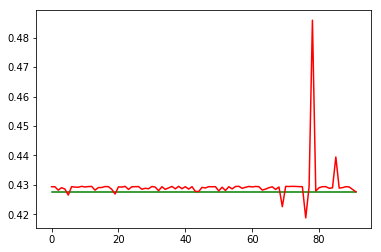

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:05:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4012000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:05:11
INFO:tensorflow:Saving dict for global step 4012000: global_step = 4012000, loss = 2.5570143e-06
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4012000: ./outputdir/model.ckpt-4012000
error on testset first run {'loss': 2.5570143e-06, 'global_step': 4012000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4012000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 433.905
INFO:tensorflow:loss = 4.107209e-05, step = 4016601 (0.231 sec)
INFO:tensorflow:global_step/sec: 433.753
INFO:tensorflow:loss = 1.5899135e-05, step = 4016701 (0.230 sec)
INFO:tensorflow:global_step/sec: 434.311
INFO:tensorflow:loss = 6.710647e-05, step = 4016801 (0.230 sec)
INFO:tensorflow:global_step/sec: 433.48
INFO:tensorflow:loss = 6.6517205e-06, step = 4016901 (0.231 sec)
INFO:tensorflow:global_step/sec: 436.762
INFO:tensorflow:loss = 7.791275e-06, step = 4017001 (0.229 sec)
INFO:tensorflow:global_step/sec: 433.932
INFO:tensorflow:loss = 3.5619567e-07, step = 4017101 (0.230 sec)
INFO:tensorflow:global_step/sec: 417.552
INFO:tensorflow:loss = 2.385773e-06, step = 4017201 (0.239 sec)
INFO:tensorflow:global_step/sec: 431.805
INFO:tensorflow:loss = 4.5053503e-06, step = 4017301 (0.232 sec)
INFO:tensorflow:global_step/sec: 430.485
INFO:tensorflow:loss = 1.0656874e-05, step = 4017401 (0.232 sec)
INFO:tensorflow:global_step/sec: 435.256
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4022000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4022000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00043035913, step = 4022001
INFO:tensorflow:global_step/sec: 161.136
INFO:tensorflow:loss = 7.2430135e-05, step = 4022101 (0.622 sec)
INFO:tensorflow:global_step/sec: 465.35
INFO:tensorflow:loss = 9.937851e-07, step = 4022201 (0.215 sec)
INFO:tensorflow:global_step/sec: 459.329
INFO:tensorflow:loss = 1.3623831e-05, step = 4022301 (0.218 sec)
INFO:tensorflow:global_step/sec: 464.281
INFO:tensorflow:loss = 3.5833327e-07, step = 4022401 (0.215 sec)
INFO:tensorflow:global_step/sec: 463.012
INFO:tensorflow:loss = 5.4606702e-05, step = 4022501 (0.216 sec)
INFO:tensorflow:global_step/sec: 410.042
INFO:tensorflow:loss = 8.020273e-09, step = 4022601 (0.244 sec)
INFO:tensorflow:global_step/sec: 381.399
INFO:tensorflow:loss = 1.2979114e-05, ste

INFO:tensorflow:loss = 7.6098365e-07, step = 4027901 (0.233 sec)
INFO:tensorflow:Saving checkpoints for 4028000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.9358628e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4028000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.8792903739465878e-05
prediction at  8 [array([0.42868502])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4028000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4028000 into ./outputdir/

INFO:tensorflow:global_step/sec: 435.867
INFO:tensorflow:loss = 2.9020498e-07, step = 4033201 (0.230 sec)
INFO:tensorflow:global_step/sec: 434.288
INFO:tensorflow:loss = 4.3276127e-06, step = 4033301 (0.230 sec)
INFO:tensorflow:global_step/sec: 427.372
INFO:tensorflow:loss = 1.0064816e-06, step = 4033401 (0.234 sec)
INFO:tensorflow:global_step/sec: 435.646
INFO:tensorflow:loss = 1.4347998e-09, step = 4033501 (0.230 sec)
INFO:tensorflow:global_step/sec: 419.578
INFO:tensorflow:loss = 7.8958516e-07, step = 4033601 (0.238 sec)
INFO:tensorflow:global_step/sec: 408.48
INFO:tensorflow:loss = 2.1636885e-07, step = 4033701 (0.245 sec)
INFO:tensorflow:global_step/sec: 406.015
INFO:tensorflow:loss = 1.1270968e-06, step = 4033801 (0.246 sec)
INFO:tensorflow:global_step/sec: 400.425
INFO:tensorflow:loss = 1.8343162e-07, step = 4033901 (0.250 sec)
INFO:tensorflow:Saving checkpoints for 4034000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.1962068e-07.
INFO:tensorflow:Calling m

INFO:tensorflow:loss = 2.2896808e-07, step = 4038401 (0.224 sec)
INFO:tensorflow:global_step/sec: 427.725
INFO:tensorflow:loss = 8.40921e-07, step = 4038501 (0.234 sec)
INFO:tensorflow:global_step/sec: 431.282
INFO:tensorflow:loss = 2.2541681e-07, step = 4038601 (0.232 sec)
INFO:tensorflow:global_step/sec: 442.907
INFO:tensorflow:loss = 3.657331e-08, step = 4038701 (0.226 sec)
INFO:tensorflow:global_step/sec: 454.661
INFO:tensorflow:loss = 7.2969857e-07, step = 4038801 (0.220 sec)
INFO:tensorflow:global_step/sec: 451.013
INFO:tensorflow:loss = 4.624547e-06, step = 4038901 (0.222 sec)
INFO:tensorflow:global_step/sec: 457.861
INFO:tensorflow:loss = 2.2750453e-06, step = 4039001 (0.218 sec)
INFO:tensorflow:global_step/sec: 455.982
INFO:tensorflow:loss = 1.3548711e-06, step = 4039101 (0.220 sec)
INFO:tensorflow:global_step/sec: 449.79
INFO:tensorflow:loss = 5.002712e-07, step = 4039201 (0.222 sec)
INFO:tensorflow:global_step/sec: 445.628
INFO:tensorflow:loss = 4.237647e-07, step = 4039301 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4044000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4044000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.0929448e-07, step = 4044001
INFO:tensorflow:global_step/sec: 157.969
INFO:tensorflow:loss = 3.1253776e-08, step = 4044101 (0.634 sec)
INFO:tensorflow:global_step/sec: 426.81
INFO:tensorflow:loss = 7.516015e-09, step = 4044201 (0.234 sec)
INFO:tensorflow:global_step/sec: 424.706
INFO:tensorflow:loss = 1.6521867e-08, step = 4044301 (0.235 sec)
INFO:tensorflow:global_step/sec: 443.08
INFO:tensorflow:loss = 2.618429e-09, step = 4044401 (0.226 sec)
INFO:tensorflow:global_step/sec: 420.322
INFO:tensorflow:loss = 6.97327e-09, step = 4044501 (0.238 sec)
INFO:tensorflow:global_step/sec: 425.222
INFO:tensorflow:loss = 5.04943

INFO:tensorflow:global_step/sec: 429.845
INFO:tensorflow:loss = 2.894028e-07, step = 4049801 (0.233 sec)
INFO:tensorflow:global_step/sec: 442.269
INFO:tensorflow:loss = 3.8072503e-06, step = 4049901 (0.226 sec)
INFO:tensorflow:Saving checkpoints for 4050000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.242194e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4050000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.747961719323034e-06
prediction at  19 [array([0.4289407])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4050000
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4054000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4054000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.028565926, step = 4054001
INFO:tensorflow:global_step/sec: 163.436
INFO:tensorflow:loss = 1.4881175e-07, step = 4054101 (0.613 sec)
INFO:tensorflow:global_step/sec: 445.375
INFO:tensorflow:loss = 1.8242318e-08, step = 4054201 (0.225 sec)
INFO:tensorflow:global_step/sec: 429.496
INFO:tensorflow:loss = 6.785413e-09, step = 4054301 (0.233 sec)
INFO:tensorflow:global_step/sec: 439.049
INFO:tensorflow:loss = 6.986652e-06, step = 4054401 (0.228 sec)
INFO:tensorflow:global_step/sec: 417.659
INFO:tensorflow:loss = 1.5757124e-08, step = 4054501 (0.240 sec)
INFO:tensorflow:global_step/sec: 419.871
INFO:tensorflow:loss = 1.000

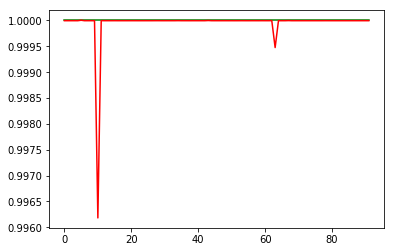

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:08:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4056000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:08:08
INFO:tensorflow:Saving dict for global step 4056000: global_step = 4056000, loss = 9.3334864e-07
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4056000: ./outputdir/model.ckpt-4056000
error on testset first run {'loss': 9.3334864e-07, 'global_step': 4056000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4056000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:global_step/sec: 426.448
INFO:tensorflow:loss = 1.114131e-11, step = 4060601 (0.234 sec)
INFO:tensorflow:global_step/sec: 430.907
INFO:tensorflow:loss = 6.8780537e-12, step = 4060701 (0.232 sec)
INFO:tensorflow:global_step/sec: 440.329
INFO:tensorflow:loss = 6.266987e-12, step = 4060801 (0.227 sec)
INFO:tensorflow:global_step/sec: 438.327
INFO:tensorflow:loss = 8.881784e-14, step = 4060901 (0.228 sec)
INFO:tensorflow:global_step/sec: 443.512
INFO:tensorflow:loss = 2.3648283e-10, step = 4061001 (0.225 sec)
INFO:tensorflow:global_step/sec: 432.99
INFO:tensorflow:loss = 3.1338132e-10, step = 4061101 (0.231 sec)
INFO:tensorflow:global_step/sec: 427.33
INFO:tensorflow:loss = 3.091749e-10, step = 4061201 (0.234 sec)
INFO:tensorflow:global_step/sec: 430.494
INFO:tensorflow:loss = 2.513758e-10, step = 4061301 (0.232 sec)
INFO:tensorflow:global_step/sec: 429.004
INFO:tensorflow:loss = 1.5459264e-08, step = 4061401 (0.233 sec)
INFO:tensorflow:global_step/sec: 428.808
INFO:tensorf

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4066000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4066000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 3.1974423e-14, step = 4066001
INFO:tensorflow:global_step/sec: 163.603
INFO:tensorflow:loss = 2.2737368e-13, step = 4066101 (0.612 sec)
INFO:tensorflow:global_step/sec: 462.001
INFO:tensorflow:loss = 1.3370993e-10, step = 4066201 (0.216 sec)
INFO:tensorflow:global_step/sec: 451.448
INFO:tensorflow:loss = 2.4016344e-12, step = 4066301 (0.221 sec)
INFO:tensorflow:global_step/sec: 435.082
INFO:tensorflow:loss = 4.1432546e-08, step = 4066401 (0.230 sec)
INFO:tensorflow:global_step/sec: 426.73
INFO:tensorflow:loss = 7.305644e-09, step = 4066501 (0.235 sec)
INFO:tensorflow:global_step/sec: 431.202
INFO:tensorflow:loss = 4.863665e-12, step = 4066601 (0.232 sec)
INFO:tensorflow:global_step/sec: 433.082
INFO:tensorflow:loss = 7.264944e-11, step

INFO:tensorflow:loss = 8.5300655e-12, step = 4071901 (0.250 sec)
INFO:tensorflow:Saving checkpoints for 4072000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.1510792e-12.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4072000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.0942268747973143e-11
prediction at  8 [array([0.99999973])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4072000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4072000 into ./outputdir/

INFO:tensorflow:global_step/sec: 446.467
INFO:tensorflow:loss = 1.0842914e-08, step = 4077201 (0.224 sec)
INFO:tensorflow:global_step/sec: 396.281
INFO:tensorflow:loss = 3.38339e-08, step = 4077301 (0.252 sec)
INFO:tensorflow:global_step/sec: 452.661
INFO:tensorflow:loss = 2.429804e-09, step = 4077401 (0.221 sec)
INFO:tensorflow:global_step/sec: 446.818
INFO:tensorflow:loss = 2.551701e-10, step = 4077501 (0.224 sec)
INFO:tensorflow:global_step/sec: 457.681
INFO:tensorflow:loss = 1.3233503e-08, step = 4077601 (0.218 sec)
INFO:tensorflow:global_step/sec: 456.692
INFO:tensorflow:loss = 6.8780537e-10, step = 4077701 (0.219 sec)
INFO:tensorflow:global_step/sec: 441.415
INFO:tensorflow:loss = 3.5527137e-13, step = 4077801 (0.227 sec)
INFO:tensorflow:global_step/sec: 442.459
INFO:tensorflow:loss = 3.1974423e-14, step = 4077901 (0.226 sec)
INFO:tensorflow:Saving checkpoints for 4078000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 8.881784e-14.
INFO:tensorflow:Calling model

INFO:tensorflow:loss = 2.2397586e-09, step = 4082401 (0.225 sec)
INFO:tensorflow:global_step/sec: 437.485
INFO:tensorflow:loss = 1.6379467e-09, step = 4082501 (0.228 sec)
INFO:tensorflow:global_step/sec: 444.403
INFO:tensorflow:loss = 8.5300655e-12, step = 4082601 (0.225 sec)
INFO:tensorflow:global_step/sec: 456.706
INFO:tensorflow:loss = 9.094947e-13, step = 4082701 (0.220 sec)
INFO:tensorflow:global_step/sec: 446.782
INFO:tensorflow:loss = 6.9407236e-10, step = 4082801 (0.223 sec)
INFO:tensorflow:global_step/sec: 454.395
INFO:tensorflow:loss = 5.4036775e-12, step = 4082901 (0.220 sec)
INFO:tensorflow:global_step/sec: 452.198
INFO:tensorflow:loss = 1.9603167e-08, step = 4083001 (0.221 sec)
INFO:tensorflow:global_step/sec: 435.519
INFO:tensorflow:loss = 5.9139893e-10, step = 4083101 (0.230 sec)
INFO:tensorflow:global_step/sec: 440.744
INFO:tensorflow:loss = 4.7805315e-11, step = 4083201 (0.227 sec)
INFO:tensorflow:global_step/sec: 448.115
INFO:tensorflow:loss = 4.384464e-08, step = 408

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4088000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4088000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.00510675e-08, step = 4088001
INFO:tensorflow:global_step/sec: 163.127
INFO:tensorflow:loss = 9.908163e-11, step = 4088101 (0.614 sec)
INFO:tensorflow:global_step/sec: 450.783
INFO:tensorflow:loss = 5.4036775e-10, step = 4088201 (0.222 sec)
INFO:tensorflow:global_step/sec: 442.519
INFO:tensorflow:loss = 3.0499692e-10, step = 4088301 (0.226 sec)
INFO:tensorflow:global_step/sec: 435.051
INFO:tensorflow:loss = 3.1974423e-12, step = 4088401 (0.230 sec)
INFO:tensorflow:global_step/sec: 444.453
INFO:tensorflow:loss = 8.20819e-11, step = 4088501 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.939
INFO:tensorflow:loss = 1.3

INFO:tensorflow:global_step/sec: 436.575
INFO:tensorflow:loss = 3.0354133e-08, step = 4093801 (0.229 sec)
INFO:tensorflow:global_step/sec: 430.483
INFO:tensorflow:loss = 1.4611544e-08, step = 4093901 (0.232 sec)
INFO:tensorflow:Saving checkpoints for 4094000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.3283064e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4094000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 5.973322141019011e-08
prediction at  19 [array([1.00014799])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4094000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4098000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4098000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.061451025, step = 4098001
INFO:tensorflow:global_step/sec: 160.279
INFO:tensorflow:loss = 3.3004268e-05, step = 4098101 (0.625 sec)
INFO:tensorflow:global_step/sec: 447.546
INFO:tensorflow:loss = 3.225749e-08, step = 4098201 (0.223 sec)
INFO:tensorflow:global_step/sec: 449.505
INFO:tensorflow:loss = 4.2147855e-07, step = 4098301 (0.222 sec)
INFO:tensorflow:global_step/sec: 451.598
INFO:tensorflow:loss = 2.693378e-05, step = 4098401 (0.222 sec)
INFO:tensorflow:global_step/sec: 425.909
INFO:tensorflow:loss = 6.53464e-08, step = 4098501 (0.235 sec)
INFO:tensorflow:global_step/sec: 432.529
INFO:tensorflow:loss = 2.19829

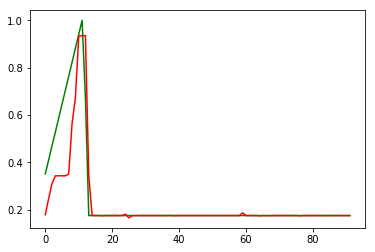

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:11:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4100000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:11:04
INFO:tensorflow:Saving dict for global step 4100000: global_step = 4100000, loss = 0.006754448
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4100000: ./outputdir/model.ckpt-4100000
error on testset first run {'loss': 0.006754448, 'global_step': 4100000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4100000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 448.9
INFO:tensorflow:loss = 1.0806638e-07, step = 4104601 (0.224 sec)
INFO:tensorflow:global_step/sec: 359.159
INFO:tensorflow:loss = 9.227024e-08, step = 4104701 (0.277 sec)
INFO:tensorflow:global_step/sec: 443.258
INFO:tensorflow:loss = 6.9867156e-07, step = 4104801 (0.226 sec)
INFO:tensorflow:global_step/sec: 460.656
INFO:tensorflow:loss = 2.7737775e-07, step = 4104901 (0.217 sec)
INFO:tensorflow:global_step/sec: 452.74
INFO:tensorflow:loss = 5.9632816e-07, step = 4105001 (0.221 sec)
INFO:tensorflow:global_step/sec: 450.479
INFO:tensorflow:loss = 1.3420869e-07, step = 4105101 (0.222 sec)
INFO:tensorflow:global_step/sec: 456.265
INFO:tensorflow:loss = 7.834592e-08, step = 4105201 (0.219 sec)
INFO:tensorflow:global_step/sec: 467.063
INFO:tensorflow:loss = 2.4157214e-07, step = 4105301 (0.214 sec)
INFO:tensorflow:global_step/sec: 424.576
INFO:tensorflow:loss = 2.7113492e-07, step = 4105401 (0.235 sec)
INFO:tensorflow:global_step/sec: 448.863
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4110000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4110000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.5946234e-06, step = 4110001
INFO:tensorflow:global_step/sec: 161.98
INFO:tensorflow:loss = 1.5914637e-06, step = 4110101 (0.618 sec)
INFO:tensorflow:global_step/sec: 450.791
INFO:tensorflow:loss = 5.7008816e-07, step = 4110201 (0.222 sec)
INFO:tensorflow:global_step/sec: 445.721
INFO:tensorflow:loss = 7.1987967e-07, step = 4110301 (0.225 sec)
INFO:tensorflow:global_step/sec: 451.455
INFO:tensorflow:loss = 9.157582e-09, step = 4110401 (0.221 sec)
INFO:tensorflow:global_step/sec: 390.827
INFO:tensorflow:loss = 2.5636166e-06, step = 4110501 (0.256 sec)
INFO:tensorflow:global_step/sec: 410.703
INFO:tensorflow:loss = 1.6252225e-05, step = 4110601 (0.243 sec)
INFO:tensorflow:global_step/sec: 430.732
INFO:tensorflow:loss = 7.187422e-07, ste

INFO:tensorflow:global_step/sec: 397.34
INFO:tensorflow:loss = 1.939424e-07, step = 4115901 (0.251 sec)
INFO:tensorflow:Saving checkpoints for 4116000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.7141981e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4116000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.1800965005792837e-12
prediction at  8 [array([0.17575529])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4116000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving ch

INFO:tensorflow:loss = 4.3418788e-07, step = 4121101 (0.227 sec)
INFO:tensorflow:global_step/sec: 446.76
INFO:tensorflow:loss = 4.5821398e-07, step = 4121201 (0.224 sec)
INFO:tensorflow:global_step/sec: 431.9
INFO:tensorflow:loss = 1.274398e-07, step = 4121301 (0.231 sec)
INFO:tensorflow:global_step/sec: 451.107
INFO:tensorflow:loss = 8.582266e-07, step = 4121401 (0.222 sec)
INFO:tensorflow:global_step/sec: 439.639
INFO:tensorflow:loss = 1.1526572e-07, step = 4121501 (0.228 sec)
INFO:tensorflow:global_step/sec: 446.674
INFO:tensorflow:loss = 5.920514e-08, step = 4121601 (0.224 sec)
INFO:tensorflow:global_step/sec: 430.435
INFO:tensorflow:loss = 3.4446575e-07, step = 4121701 (0.233 sec)
INFO:tensorflow:global_step/sec: 449.96
INFO:tensorflow:loss = 4.532647e-07, step = 4121801 (0.222 sec)
INFO:tensorflow:global_step/sec: 394.944
INFO:tensorflow:loss = 4.837987e-07, step = 4121901 (0.254 sec)
INFO:tensorflow:Saving checkpoints for 4122000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss

INFO:tensorflow:global_step/sec: 458.209
INFO:tensorflow:loss = 1.4299811e-08, step = 4126401 (0.218 sec)
INFO:tensorflow:global_step/sec: 461.905
INFO:tensorflow:loss = 9.910964e-08, step = 4126501 (0.216 sec)
INFO:tensorflow:global_step/sec: 457.984
INFO:tensorflow:loss = 1.2277756e-08, step = 4126601 (0.218 sec)
INFO:tensorflow:global_step/sec: 454.843
INFO:tensorflow:loss = 2.9910225e-07, step = 4126701 (0.220 sec)
INFO:tensorflow:global_step/sec: 437.528
INFO:tensorflow:loss = 1.5005597e-07, step = 4126801 (0.229 sec)
INFO:tensorflow:global_step/sec: 429.22
INFO:tensorflow:loss = 9.838852e-08, step = 4126901 (0.233 sec)
INFO:tensorflow:global_step/sec: 415.122
INFO:tensorflow:loss = 5.25605e-07, step = 4127001 (0.241 sec)
INFO:tensorflow:global_step/sec: 447.413
INFO:tensorflow:loss = 5.4481063e-08, step = 4127101 (0.224 sec)
INFO:tensorflow:global_step/sec: 440.306
INFO:tensorflow:loss = 2.0697709e-07, step = 4127201 (0.227 sec)
INFO:tensorflow:global_step/sec: 433.689
INFO:tenso

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4132000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4132000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.9602163e-07, step = 4132001
INFO:tensorflow:global_step/sec: 147.661
INFO:tensorflow:loss = 1.9922777e-07, step = 4132101 (0.679 sec)
INFO:tensorflow:global_step/sec: 446.012
INFO:tensorflow:loss = 1.3209898e-07, step = 4132201 (0.224 sec)
INFO:tensorflow:global_step/sec: 430.067
INFO:tensorflow:loss = 1.0285028e-07, step = 4132301 (0.232 sec)
INFO:tensorflow:global_step/sec: 432.822
INFO:tensorflow:loss = 2.068592e-08, step = 4132401 (0.232 sec)
INFO:tensorflow:global_step/sec: 426.656
INFO:tensorflow:loss = 9.722348e-08, step = 4132501 (0.234 sec)
INFO:tensorflow:global_step/sec: 434.329
INFO:tensorflow:loss = 1.7

INFO:tensorflow:global_step/sec: 419.51
INFO:tensorflow:loss = 2.9386086e-07, step = 4137801 (0.238 sec)
INFO:tensorflow:global_step/sec: 421.895
INFO:tensorflow:loss = 1.6669004e-07, step = 4137901 (0.237 sec)
INFO:tensorflow:Saving checkpoints for 4138000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.6594731e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4138000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.2165574384320385e-10
prediction at  19 [array([0.17477793])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4138000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4142000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4142000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.4045436e-05, step = 4142001
INFO:tensorflow:global_step/sec: 162.869
INFO:tensorflow:loss = 1.9302476e-07, step = 4142101 (0.615 sec)
INFO:tensorflow:global_step/sec: 430.658
INFO:tensorflow:loss = 3.072742e-11, step = 4142201 (0.232 sec)
INFO:tensorflow:global_step/sec: 449.556
INFO:tensorflow:loss = 1.5667467e-12, step = 4142301 (0.222 sec)
INFO:tensorflow:global_step/sec: 435.887
INFO:tensorflow:loss = 0.00016773037, step = 4142401 (0.230 sec)
INFO:tensorflow:global_step/sec: 428.304
INFO:tensorflow:loss = 2.4415705e-09, step = 4142501 (0.233 sec)
INFO:tensorflow:global_step/sec: 432.025
INFO:tensorflow:loss = 5.

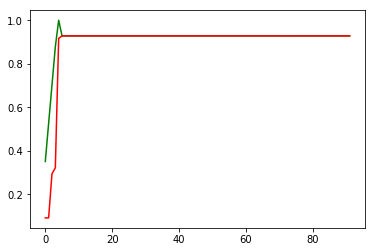

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:14:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4144000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:14:01
INFO:tensorflow:Saving dict for global step 4144000: global_step = 4144000, loss = 0.0061026947
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4144000: ./outputdir/model.ckpt-4144000
error on testset first run {'loss': 0.0061026947, 'global_step': 4144000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4144000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 448.312
INFO:tensorflow:loss = 8.881784e-14, step = 4148601 (0.223 sec)
INFO:tensorflow:global_step/sec: 409.715
INFO:tensorflow:loss = 3.2531048e-08, step = 4148701 (0.244 sec)
INFO:tensorflow:global_step/sec: 467.355
INFO:tensorflow:loss = 4.863665e-12, step = 4148801 (0.214 sec)
INFO:tensorflow:global_step/sec: 450.718
INFO:tensorflow:loss = 3.5527137e-15, step = 4148901 (0.222 sec)
INFO:tensorflow:global_step/sec: 465.539
INFO:tensorflow:loss = 8.881784e-14, step = 4149001 (0.215 sec)
INFO:tensorflow:global_step/sec: 457.831
INFO:tensorflow:loss = 5.684342e-14, step = 4149101 (0.218 sec)
INFO:tensorflow:global_step/sec: 451.577
INFO:tensorflow:loss = 3.6241232e-11, step = 4149201 (0.221 sec)
INFO:tensorflow:global_step/sec: 456.25
INFO:tensorflow:loss = 8.185452e-12, step = 4149301 (0.219 sec)
INFO:tensorflow:global_step/sec: 448.013
INFO:tensorflow:loss = 3.5527137e-15, step = 4149401 (0.224 sec)
INFO:tensorflow:global_step/sec: 390.06
INFO:tensorf

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4154000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.9984014e-11, step = 4154001
INFO:tensorflow:global_step/sec: 159.075
INFO:tensorflow:loss = 6.004086e-13, step = 4154101 (0.630 sec)
INFO:tensorflow:global_step/sec: 466.329
INFO:tensorflow:loss = 6.096812e-11, step = 4154201 (0.214 sec)
INFO:tensorflow:global_step/sec: 458.379
INFO:tensorflow:loss = 3.4820147e-11, step = 4154301 (0.219 sec)
INFO:tensorflow:global_step/sec: 448.789
INFO:tensorflow:loss = 1.2789769e-13, step = 4154401 (0.223 sec)
INFO:tensorflow:global_step/sec: 446.62
INFO:tensorflow:loss = 6.5689676e-12, step = 4154501 (0.224 sec)
INFO:tensorflow:global_step/sec: 443.914
INFO:tensorflow:loss = 9.094947e-13, step = 4154601 (0.225 sec)
INFO:tensorflow:global_step/sec: 443.746
INFO:tensorflow:loss = 2.220446e-12, step = 4154701 (0.226 sec)
INFO:tensorflow:global_step/sec: 429.472
INFO:tenso

INFO:tensorflow:Saving checkpoints for 4160000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.9287327e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4160000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 5.290338053128806e-09
prediction at  8 [array([0.92820992])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4160000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4160000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.003166e-09, step = 4160001
IN

INFO:tensorflow:loss = 3.1058711e-09, step = 4165201 (0.238 sec)
INFO:tensorflow:global_step/sec: 412.773
INFO:tensorflow:loss = 9.742735e-09, step = 4165301 (0.242 sec)
INFO:tensorflow:global_step/sec: 431.046
INFO:tensorflow:loss = 3.2919218e-08, step = 4165401 (0.232 sec)
INFO:tensorflow:global_step/sec: 396
INFO:tensorflow:loss = 2.429804e-09, step = 4165501 (0.253 sec)
INFO:tensorflow:global_step/sec: 427.573
INFO:tensorflow:loss = 9.520452e-09, step = 4165601 (0.234 sec)
INFO:tensorflow:global_step/sec: 431.546
INFO:tensorflow:loss = 1.8129786e-08, step = 4165701 (0.232 sec)
INFO:tensorflow:global_step/sec: 333.178
INFO:tensorflow:loss = 5.3052105e-09, step = 4165801 (0.300 sec)
INFO:tensorflow:global_step/sec: 450.924
INFO:tensorflow:loss = 1.6283117e-09, step = 4165901 (0.222 sec)
INFO:tensorflow:Saving checkpoints for 4166000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.6118307e-08.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.

INFO:tensorflow:global_step/sec: 343.23
INFO:tensorflow:loss = 1.0267343e-12, step = 4170501 (0.291 sec)
INFO:tensorflow:global_step/sec: 461.582
INFO:tensorflow:loss = 2.3283064e-10, step = 4170601 (0.217 sec)
INFO:tensorflow:global_step/sec: 436.96
INFO:tensorflow:loss = 5.684342e-14, step = 4170701 (0.228 sec)
INFO:tensorflow:global_step/sec: 439.599
INFO:tensorflow:loss = 1.9984014e-11, step = 4170801 (0.228 sec)
INFO:tensorflow:global_step/sec: 431.28
INFO:tensorflow:loss = 3.4229743e-08, step = 4170901 (0.232 sec)
INFO:tensorflow:global_step/sec: 384.729
INFO:tensorflow:loss = 1.7408297e-13, step = 4171001 (0.260 sec)
INFO:tensorflow:global_step/sec: 435.038
INFO:tensorflow:loss = 2.7853275e-12, step = 4171101 (0.229 sec)
INFO:tensorflow:global_step/sec: 423.375
INFO:tensorflow:loss = 6.963319e-13, step = 4171201 (0.236 sec)
INFO:tensorflow:global_step/sec: 424.443
INFO:tensorflow:loss = 9.240608e-12, step = 4171301 (0.236 sec)
INFO:tensorflow:global_step/sec: 432.792
INFO:tensor

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4176000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4176000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.0786074e-09, step = 4176001
INFO:tensorflow:global_step/sec: 163.855
INFO:tensorflow:loss = 6.284395e-11, step = 4176101 (0.611 sec)
INFO:tensorflow:global_step/sec: 455.487
INFO:tensorflow:loss = 1.8673951e-09, step = 4176201 (0.219 sec)
INFO:tensorflow:global_step/sec: 429.242
INFO:tensorflow:loss = 1.5667467e-10, step = 4176301 (0.233 sec)
INFO:tensorflow:global_step/sec: 413.315
INFO:tensorflow:loss = 5.515645e-09, step = 4176401 (0.242 sec)
INFO:tensorflow:global_step/sec: 427.789
INFO:tensorflow:loss = 5.1571547e-10, step = 4176501 (0.234 sec)
INFO:tensorflow:global_step/sec: 416.334
INFO:tensorflow:loss = 5.7211516e-09, step = 4176601 (0.240 sec)


INFO:tensorflow:loss = 2.231117e-08, step = 4181801 (0.245 sec)
INFO:tensorflow:global_step/sec: 428.491
INFO:tensorflow:loss = 1.130104e-09, step = 4181901 (0.233 sec)
INFO:tensorflow:Saving checkpoints for 4182000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.007017e-11.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4182000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.1712092506360457e-09
prediction at  19 [array([0.92825708])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4182000
INFO:tensorflow:Running local_init_op.
INF

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4186000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4186000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.005150798, step = 4186001
INFO:tensorflow:global_step/sec: 161.483
INFO:tensorflow:loss = 7.3582385e-08, step = 4186101 (0.621 sec)
INFO:tensorflow:global_step/sec: 454.388
INFO:tensorflow:loss = 3.5527137e-15, step = 4186201 (0.220 sec)
INFO:tensorflow:global_step/sec: 455.89
INFO:tensorflow:loss = 5.684342e-14, step = 4186301 (0.219 sec)
INFO:tensorflow:global_step/sec: 446.732
INFO:tensorflow:loss = 0.0, step = 4186401 (0.224 sec)
INFO:tensorflow:global_step/sec: 445.635
INFO:tensorflow:loss = 8.881784e-14, step = 4186501 (0.224 sec)
INFO:tensorflow:global_step/sec: 430.174
INFO:tensorflow:loss = 2.627587e-11, st

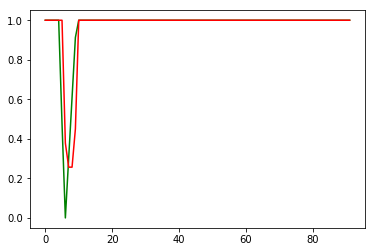

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:16:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4188000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:16:57
INFO:tensorflow:Saving dict for global step 4188000: global_step = 4188000, loss = 0.00840759
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4188000: ./outputdir/model.ckpt-4188000
error on testset first run {'loss': 0.00840759, 'global_step': 4188000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4188000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:global_step/sec: 426.659
INFO:tensorflow:loss = 1.2825296e-12, step = 4192601 (0.235 sec)
INFO:tensorflow:global_step/sec: 423.462
INFO:tensorflow:loss = 0.0, step = 4192701 (0.236 sec)
INFO:tensorflow:global_step/sec: 443.697
INFO:tensorflow:loss = 9.323742e-11, step = 4192801 (0.225 sec)
INFO:tensorflow:global_step/sec: 427.833
INFO:tensorflow:loss = 1.5667467e-12, step = 4192901 (0.234 sec)
INFO:tensorflow:global_step/sec: 427.899
INFO:tensorflow:loss = 3.4141578e-12, step = 4193001 (0.234 sec)
INFO:tensorflow:global_step/sec: 429.59
INFO:tensorflow:loss = 2.7853275e-12, step = 4193101 (0.233 sec)
INFO:tensorflow:global_step/sec: 417.786
INFO:tensorflow:loss = 1.2789769e-13, step = 4193201 (0.239 sec)
INFO:tensorflow:global_step/sec: 409.065
INFO:tensorflow:loss = 9.979573e-12, step = 4193301 (0.245 sec)
INFO:tensorflow:global_step/sec: 417.819
INFO:tensorflow:loss = 2.2737368e-13, step = 4193401 (0.239 sec)
INFO:tensorflow:global_step/sec: 420.985
INFO:tensorflow:lo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4198000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.4210855e-14, step = 4198001
INFO:tensorflow:global_step/sec: 165.768
INFO:tensorflow:loss = 9.427627e-09, step = 4198101 (0.604 sec)
INFO:tensorflow:global_step/sec: 445.528
INFO:tensorflow:loss = 1.6178902e-08, step = 4198201 (0.225 sec)
INFO:tensorflow:global_step/sec: 387.808
INFO:tensorflow:loss = 3.4120262e-09, step = 4198301 (0.258 sec)
INFO:tensorflow:global_step/sec: 460.619
INFO:tensorflow:loss = 1.0534805e-08, step = 4198401 (0.217 sec)
INFO:tensorflow:global_step/sec: 444.469
INFO:tensorflow:loss = 7.0231323e-09, step = 4198501 (0.225 sec)
INFO:tensorflow:global_step/sec: 437.663
INFO:tensorflow:loss = 9.555379e-11, step = 4198601 (0.228 sec)
INFO:tensorflow:global_step/sec: 394.067
INFO:tensorflow:loss = 3.159247e-09, step = 4198701 (0.255 sec)
INFO:tensorflow:global_step/sec: 436.019
INFO:ten

INFO:tensorflow:Saving checkpoints for 4204000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.655618e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4204000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.1645600744066688e-08
prediction at  8 [array([0.99999001])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4204000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4204000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.0756196e-10, step = 4204001
I

INFO:tensorflow:loss = 3.4960976e-09, step = 4209201 (0.228 sec)
INFO:tensorflow:global_step/sec: 440.085
INFO:tensorflow:loss = 4.7805315e-11, step = 4209301 (0.227 sec)
INFO:tensorflow:global_step/sec: 429.008
INFO:tensorflow:loss = 1.0063022e-08, step = 4209401 (0.233 sec)
INFO:tensorflow:global_step/sec: 438.648
INFO:tensorflow:loss = 1.9006908e-08, step = 4209501 (0.228 sec)
INFO:tensorflow:global_step/sec: 433.014
INFO:tensorflow:loss = 5.1500706e-09, step = 4209601 (0.231 sec)
INFO:tensorflow:global_step/sec: 430.45
INFO:tensorflow:loss = 1.0513759e-09, step = 4209701 (0.232 sec)
INFO:tensorflow:global_step/sec: 427.404
INFO:tensorflow:loss = 8.079098e-09, step = 4209801 (0.234 sec)
INFO:tensorflow:global_step/sec: 412.101
INFO:tensorflow:loss = 6.726623e-09, step = 4209901 (0.243 sec)
INFO:tensorflow:Saving checkpoints for 4210000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 8.151382e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_

INFO:tensorflow:global_step/sec: 435.728
INFO:tensorflow:loss = 8.599841e-10, step = 4214501 (0.230 sec)
INFO:tensorflow:global_step/sec: 471.362
INFO:tensorflow:loss = 1.4496493e-10, step = 4214601 (0.212 sec)
INFO:tensorflow:global_step/sec: 479.18
INFO:tensorflow:loss = 5.912071e-11, step = 4214701 (0.209 sec)
INFO:tensorflow:global_step/sec: 477.349
INFO:tensorflow:loss = 1.1510792e-10, step = 4214801 (0.209 sec)
INFO:tensorflow:global_step/sec: 461.741
INFO:tensorflow:loss = 8.645884e-11, step = 4214901 (0.217 sec)
INFO:tensorflow:global_step/sec: 465.543
INFO:tensorflow:loss = 4.811227e-10, step = 4215001 (0.215 sec)
INFO:tensorflow:global_step/sec: 470.961
INFO:tensorflow:loss = 1.0206804e-09, step = 4215101 (0.212 sec)
INFO:tensorflow:global_step/sec: 448.127
INFO:tensorflow:loss = 2.9033345e-09, step = 4215201 (0.224 sec)
INFO:tensorflow:global_step/sec: 423.867
INFO:tensorflow:loss = 4.747619e-09, step = 4215301 (0.235 sec)
INFO:tensorflow:global_step/sec: 410.529
INFO:tensor

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4220000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4220000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.0027179e-08, step = 4220001
INFO:tensorflow:global_step/sec: 160.119
INFO:tensorflow:loss = 2.664379e-09, step = 4220101 (0.625 sec)
INFO:tensorflow:global_step/sec: 452.698
INFO:tensorflow:loss = 2.2257783e-08, step = 4220201 (0.221 sec)
INFO:tensorflow:global_step/sec: 452.292
INFO:tensorflow:loss = 5.014101e-09, step = 4220301 (0.221 sec)
INFO:tensorflow:global_step/sec: 424.542
INFO:tensorflow:loss = 2.2938739e-08, step = 4220401 (0.236 sec)
INFO:tensorflow:global_step/sec: 441.343
INFO:tensorflow:loss = 4.747619e-09, step = 4220501 (0.227 sec)
INFO:tensorflow:global_step/sec: 439.118
INFO:tensorflow:loss = 2.446177e-08, step = 4220601 (0.228 sec)
IN

INFO:tensorflow:loss = 2.636176e-08, step = 4225801 (0.230 sec)
INFO:tensorflow:global_step/sec: 429.712
INFO:tensorflow:loss = 1.4111553e-08, step = 4225901 (0.233 sec)
INFO:tensorflow:Saving checkpoints for 4226000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.2740565e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4226000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 3.845067497890631e-08
prediction at  19 [array([1.00015224])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4226000
INFO:tensorflow:Running local_init_op.
IN

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4230000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4230000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.0070945635, step = 4230001
INFO:tensorflow:global_step/sec: 165.272
INFO:tensorflow:loss = 8.370993e-09, step = 4230101 (0.606 sec)
INFO:tensorflow:global_step/sec: 461.15
INFO:tensorflow:loss = 2.220446e-12, step = 4230201 (0.217 sec)
INFO:tensorflow:global_step/sec: 449.952
INFO:tensorflow:loss = 3.637979e-12, step = 4230301 (0.222 sec)
INFO:tensorflow:global_step/sec: 443.455
INFO:tensorflow:loss = 3.769074e-11, step = 4230401 (0.225 sec)
INFO:tensorflow:global_step/sec: 449.474
INFO:tensorflow:loss = 2.1134102e-08, step = 4230501 (0.223 sec)
INFO:tensorflow:global_step/sec: 435.973
INFO:tensorflow:loss = 8.88178

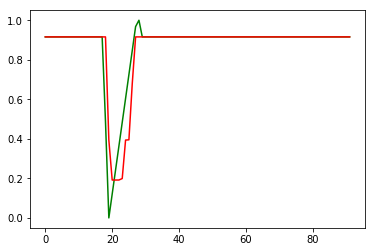

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:19:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4232000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:19:53
INFO:tensorflow:Saving dict for global step 4232000: global_step = 4232000, loss = 0.0062167123
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4232000: ./outputdir/model.ckpt-4232000
error on testset first run {'loss': 0.0062167123, 'global_step': 4232000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4232000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

INFO:tensorflow:global_step/sec: 446.47
INFO:tensorflow:loss = 5.1159077e-13, step = 4236601 (0.224 sec)
INFO:tensorflow:global_step/sec: 436
INFO:tensorflow:loss = 9.094947e-13, step = 4236701 (0.229 sec)
INFO:tensorflow:global_step/sec: 443.829
INFO:tensorflow:loss = 9.240608e-12, step = 4236801 (0.225 sec)
INFO:tensorflow:global_step/sec: 448.313
INFO:tensorflow:loss = 1.4100721e-11, step = 4236901 (0.223 sec)
INFO:tensorflow:global_step/sec: 442.265
INFO:tensorflow:loss = 5.4036775e-12, step = 4237001 (0.226 sec)
INFO:tensorflow:global_step/sec: 433.962
INFO:tensorflow:loss = 1.1510792e-12, step = 4237101 (0.230 sec)
INFO:tensorflow:global_step/sec: 451.369
INFO:tensorflow:loss = 6.266987e-12, step = 4237201 (0.222 sec)
INFO:tensorflow:global_step/sec: 424.966
INFO:tensorflow:loss = 3.072742e-11, step = 4237301 (0.235 sec)
INFO:tensorflow:global_step/sec: 429.371
INFO:tensorflow:loss = 4.604317e-12, step = 4237401 (0.233 sec)
INFO:tensorflow:global_step/sec: 428.328
INFO:tensorflow

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4242000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.114131e-11, step = 4242001
INFO:tensorflow:global_step/sec: 163.259
INFO:tensorflow:loss = 1.055929e-08, step = 4242101 (0.613 sec)
INFO:tensorflow:global_step/sec: 456.625
INFO:tensorflow:loss = 1.1962786e-08, step = 4242201 (0.219 sec)
INFO:tensorflow:global_step/sec: 467.305
INFO:tensorflow:loss = 1.0398118e-09, step = 4242301 (0.214 sec)
INFO:tensorflow:global_step/sec: 470.451
INFO:tensorflow:loss = 7.438704e-09, step = 4242401 (0.213 sec)
INFO:tensorflow:global_step/sec: 455.435
INFO:tensorflow:loss = 1.6498891e-08, step = 4242501 (0.220 sec)
INFO:tensorflow:global_step/sec: 456.621
INFO:tensorflow:loss = 2.1448763e-09, step = 4242601 (0.219 sec)
INFO:tensorflow:global_step/sec: 396.467
INFO:tensorflow:loss = 8.5300655e-10, step = 4242701 (0.253 sec)
INFO:tensorflow:global_step/sec: 442.11
INFO:tens

INFO:tensorflow:Saving checkpoints for 4248000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.2450982e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4248000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 1.8192558761664617e-08
prediction at  8 [array([0.91569467])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4248000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4248000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.3656631e-09, step = 4248001


INFO:tensorflow:loss = 1.0510348e-08, step = 4253201 (0.233 sec)
INFO:tensorflow:global_step/sec: 423.659
INFO:tensorflow:loss = 1.1181136e-09, step = 4253301 (0.236 sec)
INFO:tensorflow:global_step/sec: 356.92
INFO:tensorflow:loss = 3.135924e-08, step = 4253401 (0.280 sec)
INFO:tensorflow:global_step/sec: 403.809
INFO:tensorflow:loss = 1.2493082e-09, step = 4253501 (0.248 sec)
INFO:tensorflow:global_step/sec: 402.66
INFO:tensorflow:loss = 1.4901161e-08, step = 4253601 (0.248 sec)
INFO:tensorflow:global_step/sec: 392.93
INFO:tensorflow:loss = 1.0437148e-08, step = 4253701 (0.255 sec)
INFO:tensorflow:global_step/sec: 387.46
INFO:tensorflow:loss = 1.414552e-09, step = 4253801 (0.258 sec)
INFO:tensorflow:global_step/sec: 392.543
INFO:tensorflow:loss = 1.1871691e-08, step = 4253901 (0.255 sec)
INFO:tensorflow:Saving checkpoints for 4254000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 3.3015226e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn

INFO:tensorflow:global_step/sec: 445.379
INFO:tensorflow:loss = 4.3272408e-10, step = 4258501 (0.224 sec)
INFO:tensorflow:global_step/sec: 440.942
INFO:tensorflow:loss = 4.6252104e-09, step = 4258601 (0.227 sec)
INFO:tensorflow:global_step/sec: 426.538
INFO:tensorflow:loss = 1.1142877e-08, step = 4258701 (0.235 sec)
INFO:tensorflow:global_step/sec: 427.168
INFO:tensorflow:loss = 1.4964066e-09, step = 4258801 (0.233 sec)
INFO:tensorflow:global_step/sec: 434.133
INFO:tensorflow:loss = 2.627587e-09, step = 4258901 (0.230 sec)
INFO:tensorflow:global_step/sec: 439.905
INFO:tensorflow:loss = 1.6652368e-08, step = 4259001 (0.227 sec)
INFO:tensorflow:global_step/sec: 444.014
INFO:tensorflow:loss = 2.6284397e-08, step = 4259101 (0.225 sec)
INFO:tensorflow:global_step/sec: 440.321
INFO:tensorflow:loss = 9.578699e-09, step = 4259201 (0.227 sec)
INFO:tensorflow:global_step/sec: 429.632
INFO:tensorflow:loss = 1.4461108e-09, step = 4259301 (0.233 sec)
INFO:tensorflow:global_step/sec: 394.625
INFO:te

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4264000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4264000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.958648e-08, step = 4264001
INFO:tensorflow:global_step/sec: 164.516
INFO:tensorflow:loss = 7.226255e-10, step = 4264101 (0.609 sec)
INFO:tensorflow:global_step/sec: 452.429
INFO:tensorflow:loss = 7.760846e-09, step = 4264201 (0.221 sec)
INFO:tensorflow:global_step/sec: 453.624
INFO:tensorflow:loss = 2.406356e-09, step = 4264301 (0.221 sec)
INFO:tensorflow:global_step/sec: 446.884
INFO:tensorflow:loss = 1.4597138e-08, step = 4264401 (0.224 sec)
INFO:tensorflow:global_step/sec: 430.044
INFO:tensorflow:loss = 5.939601e-09, step = 4264501 (0.232 sec)
INFO:tensorflow:global_step/sec: 439.313
INFO:tensorflow:loss = 2.0463

INFO:tensorflow:global_step/sec: 419.872
INFO:tensorflow:loss = 3.2574064e-08, step = 4269801 (0.238 sec)
INFO:tensorflow:global_step/sec: 389.393
INFO:tensorflow:loss = 2.0497751e-08, step = 4269901 (0.257 sec)
INFO:tensorflow:Saving checkpoints for 4270000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.1004886e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4270000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 6.609724129186503e-08
prediction at  19 [array([0.91589647])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4270000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4274000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4274000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.01746986, step = 4274001
INFO:tensorflow:global_step/sec: 169.27
INFO:tensorflow:loss = 1.2383655e-08, step = 4274101 (0.592 sec)
INFO:tensorflow:global_step/sec: 456.484
INFO:tensorflow:loss = 4.5736726e-08, step = 4274201 (0.219 sec)
INFO:tensorflow:global_step/sec: 450.625
INFO:tensorflow:loss = 1.4568347e-10, step = 4274301 (0.222 sec)
INFO:tensorflow:global_step/sec: 449.402
INFO:tensorflow:loss = 2.8654767e-10, step = 4274401 (0.223 sec)
INFO:tensorflow:global_step/sec: 442.672
INFO:tensorflow:loss = 5.6447655e-09, step = 4274501 (0.226 sec)
INFO:tensorflow:global_step/sec: 439.938
INFO:tensorflow:loss = 1.937

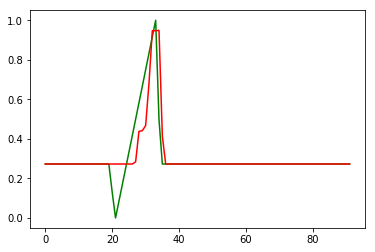

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:22:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4276000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:22:50
INFO:tensorflow:Saving dict for global step 4276000: global_step = 4276000, loss = 0.006186046
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4276000: ./outputdir/model.ckpt-4276000
error on testset first run {'loss': 0.006186046, 'global_step': 4276000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4276000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 449.982
INFO:tensorflow:loss = 4.9888094e-11, step = 4280601 (0.222 sec)
INFO:tensorflow:global_step/sec: 418.125
INFO:tensorflow:loss = 1.0455858e-09, step = 4280701 (0.239 sec)
INFO:tensorflow:global_step/sec: 396.197
INFO:tensorflow:loss = 9.0381924e-11, step = 4280801 (0.253 sec)
INFO:tensorflow:global_step/sec: 436.218
INFO:tensorflow:loss = 5.4011515e-09, step = 4280901 (0.229 sec)
INFO:tensorflow:global_step/sec: 447.955
INFO:tensorflow:loss = 1.2366996e-09, step = 4281001 (0.223 sec)
INFO:tensorflow:global_step/sec: 380.334
INFO:tensorflow:loss = 1.2159163e-10, step = 4281101 (0.263 sec)
INFO:tensorflow:global_step/sec: 381.118
INFO:tensorflow:loss = 1.6883916e-10, step = 4281201 (0.263 sec)
INFO:tensorflow:global_step/sec: 412.492
INFO:tensorflow:loss = 4.195833e-06, step = 4281301 (0.242 sec)
INFO:tensorflow:global_step/sec: 418.587
INFO:tensorflow:loss = 5.320864e-10, step = 4281401 (0.239 sec)
INFO:tensorflow:global_step/sec: 388.077
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4286000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4286000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.851505e-08, step = 4286001
INFO:tensorflow:global_step/sec: 166.404
INFO:tensorflow:loss = 2.9339253e-07, step = 4286101 (0.602 sec)
INFO:tensorflow:global_step/sec: 449.779
INFO:tensorflow:loss = 6.1341012e-09, step = 4286201 (0.222 sec)
INFO:tensorflow:global_step/sec: 461.734
INFO:tensorflow:loss = 3.963635e-07, step = 4286301 (0.217 sec)
INFO:tensorflow:global_step/sec: 453.125
INFO:tensorflow:loss = 1.4672128e-06, step = 4286401 (0.221 sec)
INFO:tensorflow:global_step/sec: 448.042
INFO:tensorflow:loss = 2.9180815e-06, step = 4286501 (0.223 sec)
INFO:tensorflow:global_step/sec: 450.674
INFO:tensorflow:loss = 8.623729e-09, step = 4286601 (0.222 sec)
INFO:tensorflow:global_step/sec: 432.912
INFO:tensorflow:loss = 9.747441e-07, step

INFO:tensorflow:global_step/sec: 452.519
INFO:tensorflow:loss = 4.4169738e-08, step = 4291901 (0.221 sec)
INFO:tensorflow:Saving checkpoints for 4292000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.6235049e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4292000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 6.657284289388437e-06
prediction at  8 [array([0.27297121])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4292000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving c

INFO:tensorflow:loss = 2.3255787e-08, step = 4297101 (0.242 sec)
INFO:tensorflow:global_step/sec: 431.999
INFO:tensorflow:loss = 7.578152e-09, step = 4297201 (0.231 sec)
INFO:tensorflow:global_step/sec: 448.308
INFO:tensorflow:loss = 3.3593128e-10, step = 4297301 (0.224 sec)
INFO:tensorflow:global_step/sec: 446.41
INFO:tensorflow:loss = 1.2843115e-07, step = 4297401 (0.224 sec)
INFO:tensorflow:global_step/sec: 448.495
INFO:tensorflow:loss = 4.9097814e-08, step = 4297501 (0.223 sec)
INFO:tensorflow:global_step/sec: 444.824
INFO:tensorflow:loss = 6.096812e-09, step = 4297601 (0.225 sec)
INFO:tensorflow:global_step/sec: 437.789
INFO:tensorflow:loss = 3.1425182e-09, step = 4297701 (0.228 sec)
INFO:tensorflow:global_step/sec: 461.285
INFO:tensorflow:loss = 2.0335932e-08, step = 4297801 (0.217 sec)
INFO:tensorflow:global_step/sec: 432.43
INFO:tensorflow:loss = 2.8292689e-08, step = 4297901 (0.231 sec)
INFO:tensorflow:Saving checkpoints for 4298000 into ./outputdir/model.ckpt.
INFO:tensorflow

INFO:tensorflow:global_step/sec: 437.817
INFO:tensorflow:loss = 9.914097e-09, step = 4302401 (0.228 sec)
INFO:tensorflow:global_step/sec: 442.3
INFO:tensorflow:loss = 1.00869535e-08, step = 4302501 (0.226 sec)
INFO:tensorflow:global_step/sec: 432.522
INFO:tensorflow:loss = 2.2124595e-08, step = 4302601 (0.231 sec)
INFO:tensorflow:global_step/sec: 424.432
INFO:tensorflow:loss = 4.393087e-09, step = 4302701 (0.236 sec)
INFO:tensorflow:global_step/sec: 441.431
INFO:tensorflow:loss = 7.179864e-08, step = 4302801 (0.227 sec)
INFO:tensorflow:global_step/sec: 445.885
INFO:tensorflow:loss = 1.9929985e-08, step = 4302901 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.356
INFO:tensorflow:loss = 1.472752e-07, step = 4303001 (0.225 sec)
INFO:tensorflow:global_step/sec: 438.529
INFO:tensorflow:loss = 3.730021e-07, step = 4303101 (0.228 sec)
INFO:tensorflow:global_step/sec: 440.217
INFO:tensorflow:loss = 2.8046268e-09, step = 4303201 (0.227 sec)
INFO:tensorflow:global_step/sec: 435.72
INFO:tensorf

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4308000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4308000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.7465543e-07, step = 4308001
INFO:tensorflow:global_step/sec: 165.3
INFO:tensorflow:loss = 2.877698e-11, step = 4308101 (0.606 sec)
INFO:tensorflow:global_step/sec: 454.065
INFO:tensorflow:loss = 1.5470931e-07, step = 4308201 (0.221 sec)
INFO:tensorflow:global_step/sec: 449.045
INFO:tensorflow:loss = 9.736292e-10, step = 4308301 (0.222 sec)
INFO:tensorflow:global_step/sec: 443.578
INFO:tensorflow:loss = 1.5255995e-07, step = 4308401 (0.226 sec)
INFO:tensorflow:global_step/sec: 451.594
INFO:tensorflow:loss = 2.919415e-09, step = 4308501 (0.221 sec)
INFO:tensorflow:global_step/sec: 439.932
INFO:tensorflow:loss = 1.5623

INFO:tensorflow:global_step/sec: 385.694
INFO:tensorflow:loss = 2.578021e-07, step = 4313801 (0.259 sec)
INFO:tensorflow:global_step/sec: 380.797
INFO:tensorflow:loss = 1.6541489e-07, step = 4313901 (0.263 sec)
INFO:tensorflow:Saving checkpoints for 4314000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.9866867e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4314000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 1.2610826307873557e-08
prediction at  19 [array([0.27223041])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4314000

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4318000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4318000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.020613682, step = 4318001
INFO:tensorflow:global_step/sec: 167.624
INFO:tensorflow:loss = 3.7383652e-06, step = 4318101 (0.597 sec)
INFO:tensorflow:global_step/sec: 460.852
INFO:tensorflow:loss = 8.273119e-09, step = 4318201 (0.217 sec)
INFO:tensorflow:global_step/sec: 457.924
INFO:tensorflow:loss = 3.2089636e-06, step = 4318301 (0.218 sec)
INFO:tensorflow:global_step/sec: 457.151
INFO:tensorflow:loss = 3.137824e-06, step = 4318401 (0.219 sec)
INFO:tensorflow:global_step/sec: 435.415
INFO:tensorflow:loss = 1.954942e-07, step = 4318501 (0.229 sec)
INFO:tensorflow:global_step/sec: 450.81
INFO:tensorflow:loss = 1.09896

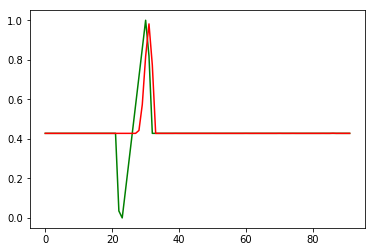

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:25:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4320000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:25:47
INFO:tensorflow:Saving dict for global step 4320000: global_step = 4320000, loss = 0.008306244
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4320000: ./outputdir/model.ckpt-4320000
error on testset first run {'loss': 0.008306244, 'global_step': 4320000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4320000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 435.245
INFO:tensorflow:loss = 2.5109237e-08, step = 4324601 (0.230 sec)
INFO:tensorflow:global_step/sec: 401.577
INFO:tensorflow:loss = 1.7446943e-06, step = 4324701 (0.249 sec)
INFO:tensorflow:global_step/sec: 427.685
INFO:tensorflow:loss = 1.4230757e-06, step = 4324801 (0.234 sec)
INFO:tensorflow:global_step/sec: 437.562
INFO:tensorflow:loss = 9.6861406e-08, step = 4324901 (0.229 sec)
INFO:tensorflow:global_step/sec: 447.856
INFO:tensorflow:loss = 7.360769e-07, step = 4325001 (0.223 sec)
INFO:tensorflow:global_step/sec: 444.806
INFO:tensorflow:loss = 9.6435215e-08, step = 4325101 (0.225 sec)
INFO:tensorflow:global_step/sec: 444.411
INFO:tensorflow:loss = 7.297495e-07, step = 4325201 (0.225 sec)
INFO:tensorflow:global_step/sec: 450.81
INFO:tensorflow:loss = 5.8216756e-07, step = 4325301 (0.222 sec)
INFO:tensorflow:global_step/sec: 422.402
INFO:tensorflow:loss = 4.266699e-08, step = 4325401 (0.237 sec)
INFO:tensorflow:global_step/sec: 412.305
INFO:tens

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4330000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4330000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.0318293e-09, step = 4330001
INFO:tensorflow:global_step/sec: 162.494
INFO:tensorflow:loss = 1.3504344e-06, step = 4330101 (0.616 sec)
INFO:tensorflow:global_step/sec: 454.707
INFO:tensorflow:loss = 1.7010208e-07, step = 4330201 (0.221 sec)
INFO:tensorflow:global_step/sec: 449.655
INFO:tensorflow:loss = 3.608352e-07, step = 4330301 (0.222 sec)
INFO:tensorflow:global_step/sec: 461.868
INFO:tensorflow:loss = 3.1471978e-07, step = 4330401 (0.216 sec)
INFO:tensorflow:global_step/sec: 470.951
INFO:tensorflow:loss = 2.9059044e-07, step = 4330501 (0.213 sec)
INFO:tensorflow:global_step/sec: 402.143
INFO:tensorflow:loss = 8.491398e-09, step = 4330601 (0.248 sec)
INFO:tensorflow:global_step/sec: 433.516
INFO:tensorflow:loss = 5.998359e-08, ste

INFO:tensorflow:loss = 4.886037e-08, step = 4335901 (0.260 sec)
INFO:tensorflow:Saving checkpoints for 4336000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.3610415e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4336000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 6.668279149240854e-07
prediction at  8 [array([0.42730835])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4336000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4336000 into ./outputdir/mo

INFO:tensorflow:global_step/sec: 423.019
INFO:tensorflow:loss = 5.5094495e-07, step = 4341201 (0.236 sec)
INFO:tensorflow:global_step/sec: 400.834
INFO:tensorflow:loss = 2.488029e-07, step = 4341301 (0.249 sec)
INFO:tensorflow:global_step/sec: 404.983
INFO:tensorflow:loss = 2.1252113e-06, step = 4341401 (0.247 sec)
INFO:tensorflow:global_step/sec: 394.697
INFO:tensorflow:loss = 3.5006806e-07, step = 4341501 (0.253 sec)
INFO:tensorflow:global_step/sec: 393.096
INFO:tensorflow:loss = 9.1646655e-08, step = 4341601 (0.255 sec)
INFO:tensorflow:global_step/sec: 385.631
INFO:tensorflow:loss = 1.2411054e-07, step = 4341701 (0.259 sec)
INFO:tensorflow:global_step/sec: 382.122
INFO:tensorflow:loss = 3.4395867e-07, step = 4341801 (0.262 sec)
INFO:tensorflow:global_step/sec: 389.725
INFO:tensorflow:loss = 5.165481e-07, step = 4341901 (0.256 sec)
INFO:tensorflow:Saving checkpoints for 4342000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.9071403e-08.
INFO:tensorflow:Calling mo

INFO:tensorflow:loss = 3.0279716e-07, step = 4346401 (0.235 sec)
INFO:tensorflow:global_step/sec: 434.461
INFO:tensorflow:loss = 1.3531367e-07, step = 4346501 (0.231 sec)
INFO:tensorflow:global_step/sec: 436.958
INFO:tensorflow:loss = 1.6811669e-07, step = 4346601 (0.228 sec)
INFO:tensorflow:global_step/sec: 414.693
INFO:tensorflow:loss = 2.0992974e-07, step = 4346701 (0.241 sec)
INFO:tensorflow:global_step/sec: 438.381
INFO:tensorflow:loss = 9.291411e-08, step = 4346801 (0.228 sec)
INFO:tensorflow:global_step/sec: 439.578
INFO:tensorflow:loss = 2.2473814e-07, step = 4346901 (0.228 sec)
INFO:tensorflow:global_step/sec: 442.932
INFO:tensorflow:loss = 4.8168664e-07, step = 4347001 (0.226 sec)
INFO:tensorflow:global_step/sec: 436.158
INFO:tensorflow:loss = 1.4051523e-07, step = 4347101 (0.229 sec)
INFO:tensorflow:global_step/sec: 423.881
INFO:tensorflow:loss = 6.95958e-08, step = 4347201 (0.236 sec)
INFO:tensorflow:global_step/sec: 440.149
INFO:tensorflow:loss = 8.3982755e-08, step = 4347

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4352000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4352000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 7.8312556e-10, step = 4352001
INFO:tensorflow:global_step/sec: 160.841
INFO:tensorflow:loss = 7.556815e-08, step = 4352101 (0.623 sec)
INFO:tensorflow:global_step/sec: 466.997
INFO:tensorflow:loss = 5.2295076e-07, step = 4352201 (0.214 sec)
INFO:tensorflow:global_step/sec: 471.396
INFO:tensorflow:loss = 1.4018244e-06, step = 4352301 (0.212 sec)
INFO:tensorflow:global_step/sec: 451.1
INFO:tensorflow:loss = 4.1132466e-09, step = 4352401 (0.222 sec)
INFO:tensorflow:global_step/sec: 445.706
INFO:tensorflow:loss = 7.101818e-08, step = 4352501 (0.224 sec)
INFO:tensorflow:global_step/sec: 433.99
INFO:tensorflow:loss = 2.4573

INFO:tensorflow:global_step/sec: 380.793
INFO:tensorflow:loss = 1.5829337e-07, step = 4357801 (0.262 sec)
INFO:tensorflow:global_step/sec: 391.509
INFO:tensorflow:loss = 7.057412e-08, step = 4357901 (0.255 sec)
INFO:tensorflow:Saving checkpoints for 4358000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.7138327e-09.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4358000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 3.060035727362885e-07
prediction at  19 [array([0.42737576])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4358000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4362000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4362000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.00035667085, step = 4362001
INFO:tensorflow:global_step/sec: 160.858
INFO:tensorflow:loss = 6.269971e-08, step = 4362101 (0.623 sec)
INFO:tensorflow:global_step/sec: 456.683
INFO:tensorflow:loss = 2.046363e-12, step = 4362201 (0.219 sec)
INFO:tensorflow:global_step/sec: 402.075
INFO:tensorflow:loss = 2.220446e-12, step = 4362301 (0.249 sec)
INFO:tensorflow:global_step/sec: 460.802
INFO:tensorflow:loss = 5.551115e-11, step = 4362401 (0.217 sec)
INFO:tensorflow:global_step/sec: 463.443
INFO:tensorflow:loss = 2.689049e-11, step = 4362501 (0.216 sec)
INFO:tensorflow:global_step/sec: 464.751
INFO:tensorflow:loss = 7.4695

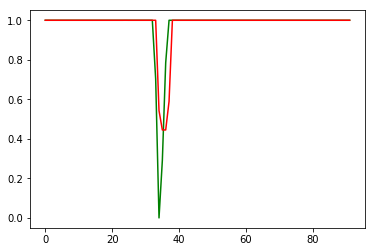

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:28:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4364000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:28:44
INFO:tensorflow:Saving dict for global step 4364000: global_step = 4364000, loss = 0.007537853
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4364000: ./outputdir/model.ckpt-4364000
error on testset first run {'loss': 0.007537853, 'global_step': 4364000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4364000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 452.144
INFO:tensorflow:loss = 1.0668941e-09, step = 4368601 (0.221 sec)
INFO:tensorflow:global_step/sec: 451.02
INFO:tensorflow:loss = 5.9671947e-09, step = 4368701 (0.222 sec)
INFO:tensorflow:global_step/sec: 437.5
INFO:tensorflow:loss = 1.1510792e-10, step = 4368801 (0.228 sec)
INFO:tensorflow:global_step/sec: 432.577
INFO:tensorflow:loss = 4.604317e-12, step = 4368901 (0.231 sec)
INFO:tensorflow:global_step/sec: 431.144
INFO:tensorflow:loss = 6.004086e-13, step = 4369001 (0.232 sec)
INFO:tensorflow:global_step/sec: 424.088
INFO:tensorflow:loss = 1.4210855e-14, step = 4369101 (0.236 sec)
INFO:tensorflow:global_step/sec: 435.061
INFO:tensorflow:loss = 2.4474645e-11, step = 4369201 (0.230 sec)
INFO:tensorflow:global_step/sec: 444.469
INFO:tensorflow:loss = 3.5527137e-13, step = 4369301 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.805
INFO:tensorflow:loss = 1.6235049e-09, step = 4369401 (0.226 sec)
INFO:tensorflow:global_step/sec: 393.275
INFO:tenso

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4374000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4374000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.1510792e-12, step = 4374001
INFO:tensorflow:global_step/sec: 161.439
INFO:tensorflow:loss = 2.0806112e-10, step = 4374101 (0.620 sec)
INFO:tensorflow:global_step/sec: 456.523
INFO:tensorflow:loss = 4.53646e-11, step = 4374201 (0.219 sec)
INFO:tensorflow:global_step/sec: 442.81
INFO:tensorflow:loss = 8.01581e-10, step = 4374301 (0.226 sec)
INFO:tensorflow:global_step/sec: 429.722
INFO:tensorflow:loss = 6.571099e-11, step = 4374401 (0.232 sec)
INFO:tensorflow:global_step/sec: 435.129
INFO:tensorflow:loss = 5.9139893e-10, step = 4374501 (0.230 sec)
INFO:tensorflow:global_step/sec: 445.752
INFO:tensorflow:loss = 3.8722305e-09, step = 4374601 (0.224 sec)
INFO:tensorflow:global_step/sec: 433.953
INFO:tensorflow:loss = 1.542876e-09, step = 

INFO:tensorflow:loss = 2.3079707e-09, step = 4379901 (0.254 sec)
INFO:tensorflow:Saving checkpoints for 4380000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.7853275e-12.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4380000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 5.839457115214287e-08
prediction at  8 [array([1.00000182])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4380000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4380000 into ./outputdir/m

INFO:tensorflow:global_step/sec: 444.747
INFO:tensorflow:loss = 1.4210855e-14, step = 4385201 (0.225 sec)
INFO:tensorflow:global_step/sec: 458.825
INFO:tensorflow:loss = 6.8780537e-12, step = 4385301 (0.218 sec)
INFO:tensorflow:global_step/sec: 443.544
INFO:tensorflow:loss = 6.8780537e-12, step = 4385401 (0.225 sec)
INFO:tensorflow:global_step/sec: 445.411
INFO:tensorflow:loss = 2.2737368e-13, step = 4385501 (0.224 sec)
INFO:tensorflow:global_step/sec: 439.356
INFO:tensorflow:loss = 1.2789769e-11, step = 4385601 (0.228 sec)
INFO:tensorflow:global_step/sec: 334.274
INFO:tensorflow:loss = 4.604317e-12, step = 4385701 (0.299 sec)
INFO:tensorflow:global_step/sec: 438.158
INFO:tensorflow:loss = 1.691447e-11, step = 4385801 (0.229 sec)
INFO:tensorflow:global_step/sec: 445.945
INFO:tensorflow:loss = 3.8454928e-10, step = 4385901 (0.224 sec)
INFO:tensorflow:Saving checkpoints for 4386000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 2.206258e-08.
INFO:tensorflow:Calling mod

INFO:tensorflow:loss = 3.2380715e-08, step = 4390401 (0.225 sec)
INFO:tensorflow:global_step/sec: 444.453
INFO:tensorflow:loss = 1.1523586e-08, step = 4390501 (0.225 sec)
INFO:tensorflow:global_step/sec: 377.262
INFO:tensorflow:loss = 2.2561153e-08, step = 4390601 (0.265 sec)
INFO:tensorflow:global_step/sec: 442.497
INFO:tensorflow:loss = 1.1155464e-08, step = 4390701 (0.226 sec)
INFO:tensorflow:global_step/sec: 449.209
INFO:tensorflow:loss = 1.7493424e-08, step = 4390801 (0.222 sec)
INFO:tensorflow:global_step/sec: 446.422
INFO:tensorflow:loss = 9.695725e-09, step = 4390901 (0.224 sec)
INFO:tensorflow:global_step/sec: 449
INFO:tensorflow:loss = 7.9753605e-08, step = 4391001 (0.223 sec)
INFO:tensorflow:global_step/sec: 438.352
INFO:tensorflow:loss = 4.9587698e-08, step = 4391101 (0.228 sec)
INFO:tensorflow:global_step/sec: 445.105
INFO:tensorflow:loss = 1.205423e-08, step = 4391201 (0.225 sec)
INFO:tensorflow:global_step/sec: 445.474
INFO:tensorflow:loss = 3.688173e-08, step = 4391301 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4396000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4396000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.0259506e-08, step = 4396001
INFO:tensorflow:global_step/sec: 161.773
INFO:tensorflow:loss = 2.61538e-09, step = 4396101 (0.619 sec)
INFO:tensorflow:global_step/sec: 474.347
INFO:tensorflow:loss = 1.6806556e-08, step = 4396201 (0.211 sec)
INFO:tensorflow:global_step/sec: 473.898
INFO:tensorflow:loss = 3.0332217e-09, step = 4396301 (0.210 sec)
INFO:tensorflow:global_step/sec: 463.67
INFO:tensorflow:loss = 2.5746033e-08, step = 4396401 (0.216 sec)
INFO:tensorflow:global_step/sec: 462.597
INFO:tensorflow:loss = 3.099231e-09, step = 4396501 (0.217 sec)
INFO:tensorflow:global_step/sec: 430.287
INFO:tensorflow:loss = 2.570

INFO:tensorflow:global_step/sec: 425.416
INFO:tensorflow:loss = 3.3287936e-08, step = 4401801 (0.235 sec)
INFO:tensorflow:global_step/sec: 409.631
INFO:tensorflow:loss = 1.8728542e-08, step = 4401901 (0.244 sec)
INFO:tensorflow:Saving checkpoints for 4402000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 9.866916e-10.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4402000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 6.006595006057299e-08
prediction at  19 [array([1.00011591])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4402000


/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4406000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4406000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.25692496, step = 4406001
INFO:tensorflow:global_step/sec: 165.805
INFO:tensorflow:loss = 4.959803e-07, step = 4406101 (0.604 sec)
INFO:tensorflow:global_step/sec: 456.169
INFO:tensorflow:loss = 1.0712967e-08, step = 4406201 (0.219 sec)
INFO:tensorflow:global_step/sec: 446.811
INFO:tensorflow:loss = 6.0451644e-12, step = 4406301 (0.224 sec)
INFO:tensorflow:global_step/sec: 457.761
INFO:tensorflow:loss = 1.4210855e-14, step = 4406401 (0.218 sec)
INFO:tensorflow:global_step/sec: 432.15
INFO:tensorflow:loss = 1.945466e-11, step = 4406501 (0.232 sec)
INFO:tensorflow:global_step/sec: 448.382
INFO:tensorflow:loss = 4.35207

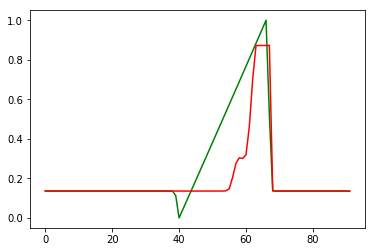

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:31:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4408000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:31:41
INFO:tensorflow:Saving dict for global step 4408000: global_step = 4408000, loss = 0.020627322
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4408000: ./outputdir/model.ckpt-4408000
error on testset first run {'loss': 0.020627322, 'global_step': 4408000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4408000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 437.648
INFO:tensorflow:loss = 0.014800922, step = 4412601 (0.228 sec)
INFO:tensorflow:global_step/sec: 426.143
INFO:tensorflow:loss = 6.107987e-07, step = 4412701 (0.235 sec)
INFO:tensorflow:global_step/sec: 407.622
INFO:tensorflow:loss = 0.014572779, step = 4412801 (0.245 sec)
INFO:tensorflow:global_step/sec: 429.183
INFO:tensorflow:loss = 4.596455e-06, step = 4412901 (0.233 sec)
INFO:tensorflow:global_step/sec: 429.5
INFO:tensorflow:loss = 2.8109434e-07, step = 4413001 (0.233 sec)
INFO:tensorflow:global_step/sec: 426.581
INFO:tensorflow:loss = 0.013056632, step = 4413101 (0.234 sec)
INFO:tensorflow:global_step/sec: 445.192
INFO:tensorflow:loss = 0.00015925468, step = 4413201 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.05
INFO:tensorflow:loss = 0.007255904, step = 4413301 (0.226 sec)
INFO:tensorflow:global_step/sec: 445.315
INFO:tensorflow:loss = 3.886864e-06, step = 4413401 (0.225 sec)
INFO:tensorflow:global_step/sec: 441.897
INFO:tensorflow:los

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4418000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 2.9355399e-05, step = 4418001
INFO:tensorflow:global_step/sec: 162.545
INFO:tensorflow:loss = 0.015523628, step = 4418101 (0.616 sec)
INFO:tensorflow:global_step/sec: 432.008
INFO:tensorflow:loss = 8.745531e-08, step = 4418201 (0.232 sec)
INFO:tensorflow:global_step/sec: 441.483
INFO:tensorflow:loss = 5.5671137e-07, step = 4418301 (0.227 sec)
INFO:tensorflow:global_step/sec: 425.184
INFO:tensorflow:loss = 0.015680945, step = 4418401 (0.236 sec)
INFO:tensorflow:global_step/sec: 428.541
INFO:tensorflow:loss = 0.37637055, step = 4418501 (0.233 sec)
INFO:tensorflow:global_step/sec: 439.07
INFO:tensorflow:loss = 1.0878321e-06, step = 4418601 (0.228 sec)
INFO:tensorflow:global_step/sec: 440.94
INFO:tensorflow:loss = 2.8737026e-07, step = 4418701 (0.227 sec)
INFO:tensorflow:global_step/sec: 436.824
INFO:tensorflow

INFO:tensorflow:Loss for final step: 3.7004886e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4424000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 2.4085581506902774e-05
prediction at  8 [array([0.13274949])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4424000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4424000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.021826511, step = 4424001
INFO:tensorflow:global_step/sec: 158.9
INFO:tensorflow:loss = 1.0154599e-05, s

INFO:tensorflow:loss = 3.4940263e-06, step = 4429301 (0.228 sec)
INFO:tensorflow:global_step/sec: 439.061
INFO:tensorflow:loss = 0.13398741, step = 4429401 (0.228 sec)
INFO:tensorflow:global_step/sec: 448.165
INFO:tensorflow:loss = 1.7152224e-05, step = 4429501 (0.223 sec)
INFO:tensorflow:global_step/sec: 434.22
INFO:tensorflow:loss = 1.9561676e-05, step = 4429601 (0.230 sec)
INFO:tensorflow:global_step/sec: 424.623
INFO:tensorflow:loss = 1.75088e-06, step = 4429701 (0.235 sec)
INFO:tensorflow:global_step/sec: 415.193
INFO:tensorflow:loss = 4.276431e-06, step = 4429801 (0.241 sec)
INFO:tensorflow:global_step/sec: 407.978
INFO:tensorflow:loss = 1.073143e-05, step = 4429901 (0.245 sec)
INFO:tensorflow:Saving checkpoints for 4430000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 6.871724e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-44300

INFO:tensorflow:global_step/sec: 417.492
INFO:tensorflow:loss = 2.3560829e-06, step = 4434601 (0.240 sec)
INFO:tensorflow:global_step/sec: 411.228
INFO:tensorflow:loss = 9.2298785e-07, step = 4434701 (0.243 sec)
INFO:tensorflow:global_step/sec: 436.245
INFO:tensorflow:loss = 3.5173507e-08, step = 4434801 (0.229 sec)
INFO:tensorflow:global_step/sec: 434.318
INFO:tensorflow:loss = 3.9749006e-07, step = 4434901 (0.230 sec)
INFO:tensorflow:global_step/sec: 445.78
INFO:tensorflow:loss = 7.2578337e-07, step = 4435001 (0.224 sec)
INFO:tensorflow:global_step/sec: 433.283
INFO:tensorflow:loss = 1.4841195e-06, step = 4435101 (0.231 sec)
INFO:tensorflow:global_step/sec: 463.28
INFO:tensorflow:loss = 1.5027301e-06, step = 4435201 (0.216 sec)
INFO:tensorflow:global_step/sec: 446.648
INFO:tensorflow:loss = 1.0379867e-07, step = 4435301 (0.224 sec)
INFO:tensorflow:global_step/sec: 442.844
INFO:tensorflow:loss = 1.6076713e-08, step = 4435401 (0.226 sec)
INFO:tensorflow:global_step/sec: 434.557
INFO:te

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4440000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4440000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 1.2900333e-06, step = 4440001
INFO:tensorflow:global_step/sec: 161.89
INFO:tensorflow:loss = 6.639428e-08, step = 4440101 (0.619 sec)
INFO:tensorflow:global_step/sec: 451.18
INFO:tensorflow:loss = 4.8803673e-07, step = 4440201 (0.222 sec)
INFO:tensorflow:global_step/sec: 453.13
INFO:tensorflow:loss = 5.877291e-07, step = 4440301 (0.220 sec)
INFO:tensorflow:global_step/sec: 445.653
INFO:tensorflow:loss = 1.319753e-06, step = 4440401 (0.224 sec)
INFO:tensorflow:global_step/sec: 448.449
INFO:tensorflow:loss = 1.0697241e-06, step = 4440501 (0.223 sec)
INFO:tensorflow:global_step/sec: 434.957
INFO:tensorflow:loss = 1.3979809e-06, step = 4440601 (0.230 sec)
INFO:tensorflow:global_step/sec: 441.805
INFO:tensorflow:loss = 7.445903e-07, step = 

INFO:tensorflow:global_step/sec: 399.99
INFO:tensorflow:loss = 3.4658544e-07, step = 4445901 (0.250 sec)
INFO:tensorflow:Saving checkpoints for 4446000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 1.0978015e-06.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4446000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 2.114744260537632e-06
prediction at  19 [array([0.13479054])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4446000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving 

/Users/anusha/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/anusha/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/inde

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4450000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4450000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 0.020538418, step = 4450001
INFO:tensorflow:global_step/sec: 159.831
INFO:tensorflow:loss = 0.00015110274, step = 4450101 (0.626 sec)
INFO:tensorflow:global_step/sec: 432.584
INFO:tensorflow:loss = 2.9900445e-07, step = 4450201 (0.231 sec)
INFO:tensorflow:global_step/sec: 432.913
INFO:tensorflow:loss = 8.0452e-06, step = 4450301 (0.231 sec)
INFO:tensorflow:global_step/sec: 434.346
INFO:tensorflow:loss = 2.3211615e-07, step = 4450401 (0.230 sec)
INFO:tensorflow:global_step/sec: 436.063
INFO:tensorflow:loss = 1.766729e-10, step = 4450501 (0.229 sec)
INFO:tensorflow:global_step/sec: 435.136
INFO:tensorflow:loss = 6.21635

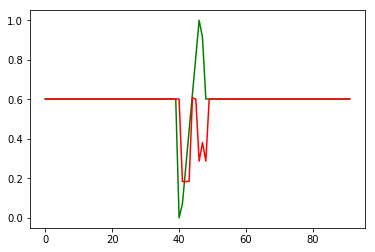

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2019-04-05-00:34:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4452000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2019-04-05-00:34:38
INFO:tensorflow:Saving dict for global step 4452000: global_step = 4452000, loss = 0.014757731
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4452000: ./outputdir/model.ckpt-4452000
error on testset first run {'loss': 0.014757731, 'global_step': 4452000}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4452000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO

INFO:tensorflow:global_step/sec: 438.481
INFO:tensorflow:loss = 2.4648571e-08, step = 4456601 (0.228 sec)
INFO:tensorflow:global_step/sec: 444.372
INFO:tensorflow:loss = 1.4055992e-09, step = 4456701 (0.225 sec)
INFO:tensorflow:global_step/sec: 450.194
INFO:tensorflow:loss = 4.655618e-10, step = 4456801 (0.222 sec)
INFO:tensorflow:global_step/sec: 457.149
INFO:tensorflow:loss = 1.7482984e-07, step = 4456901 (0.219 sec)
INFO:tensorflow:global_step/sec: 456.538
INFO:tensorflow:loss = 1.7602384e-06, step = 4457001 (0.219 sec)
INFO:tensorflow:global_step/sec: 459.965
INFO:tensorflow:loss = 5.1159077e-13, step = 4457101 (0.218 sec)
INFO:tensorflow:global_step/sec: 442.341
INFO:tensorflow:loss = 3.0450508e-07, step = 4457201 (0.226 sec)
INFO:tensorflow:global_step/sec: 445.707
INFO:tensorflow:loss = 1.3703868e-08, step = 4457301 (0.225 sec)
INFO:tensorflow:global_step/sec: 389.753
INFO:tensorflow:loss = 7.4902005e-09, step = 4457401 (0.257 sec)
INFO:tensorflow:global_step/sec: 420.327
INFO:t

INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4462000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4462000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 9.717702e-10, step = 4462001
INFO:tensorflow:global_step/sec: 159.162
INFO:tensorflow:loss = 4.4255415e-07, step = 4462101 (0.629 sec)
INFO:tensorflow:global_step/sec: 419.805
INFO:tensorflow:loss = 1.9119602e-07, step = 4462201 (0.239 sec)
INFO:tensorflow:global_step/sec: 430.786
INFO:tensorflow:loss = 2.2077162e-07, step = 4462301 (0.232 sec)
INFO:tensorflow:global_step/sec: 430.744
INFO:tensorflow:loss = 3.0800152e-07, step = 4462401 (0.232 sec)
INFO:tensorflow:global_step/sec: 437.758
INFO:tensorflow:loss = 1.2982335e-07, step = 4462501 (0.228 sec)
INFO:tensorflow:global_step/sec: 427.965
INFO:tensorflow:loss = 1.5952256e-08, step = 4462601 (0.233 sec)
INFO:tensorflow:global_step/sec: 447.762
INFO:tensorflow:loss = 7.837929e-08, st

INFO:tensorflow:global_step/sec: 439.128
INFO:tensorflow:loss = 2.467478e-06, step = 4467901 (0.228 sec)
INFO:tensorflow:Saving checkpoints for 4468000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 4.3725674e-07.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4468000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  8 4.3713889900396537e-07
prediction at  8 [array([0.60091926])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4468000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving c

INFO:tensorflow:loss = 5.762704e-07, step = 4473101 (0.222 sec)
INFO:tensorflow:global_step/sec: 425.019
INFO:tensorflow:loss = 3.8759428e-08, step = 4473201 (0.235 sec)
INFO:tensorflow:global_step/sec: 429.946
INFO:tensorflow:loss = 1.8381473e-07, step = 4473301 (0.233 sec)
INFO:tensorflow:global_step/sec: 442.68
INFO:tensorflow:loss = 9.375174e-08, step = 4473401 (0.225 sec)
INFO:tensorflow:global_step/sec: 445.192
INFO:tensorflow:loss = 3.9925823e-07, step = 4473501 (0.225 sec)
INFO:tensorflow:global_step/sec: 445.089
INFO:tensorflow:loss = 6.2759426e-08, step = 4473601 (0.224 sec)
INFO:tensorflow:global_step/sec: 444.304
INFO:tensorflow:loss = 1.8355928e-07, step = 4473701 (0.225 sec)
INFO:tensorflow:global_step/sec: 442.523
INFO:tensorflow:loss = 1.1168058e-06, step = 4473801 (0.226 sec)
INFO:tensorflow:global_step/sec: 438.203
INFO:tensorflow:loss = 1.525134e-07, step = 4473901 (0.228 sec)
INFO:tensorflow:Saving checkpoints for 4474000 into ./outputdir/model.ckpt.
INFO:tensorflow

INFO:tensorflow:global_step/sec: 411.636
INFO:tensorflow:loss = 1.4033654e-07, step = 4478401 (0.243 sec)
INFO:tensorflow:global_step/sec: 449.969
INFO:tensorflow:loss = 3.5251801e-10, step = 4478501 (0.222 sec)
INFO:tensorflow:global_step/sec: 447.71
INFO:tensorflow:loss = 4.811227e-08, step = 4478601 (0.223 sec)
INFO:tensorflow:global_step/sec: 437.09
INFO:tensorflow:loss = 8.860481e-08, step = 4478701 (0.229 sec)
INFO:tensorflow:global_step/sec: 395.468
INFO:tensorflow:loss = 2.9161953e-09, step = 4478801 (0.253 sec)
INFO:tensorflow:global_step/sec: 459.997
INFO:tensorflow:loss = 5.7670636e-08, step = 4478901 (0.217 sec)
INFO:tensorflow:global_step/sec: 445.244
INFO:tensorflow:loss = 2.307398e-07, step = 4479001 (0.225 sec)
INFO:tensorflow:global_step/sec: 452.497
INFO:tensorflow:loss = 6.293874e-08, step = 4479101 (0.221 sec)
INFO:tensorflow:global_step/sec: 459.088
INFO:tensorflow:loss = 1.8203026e-07, step = 4479201 (0.218 sec)
INFO:tensorflow:global_step/sec: 458.848
INFO:tensor

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4484000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4484000 into ./outputdir/model.ckpt.
INFO:tensorflow:loss = 6.096812e-11, step = 4484001
INFO:tensorflow:global_step/sec: 165.236
INFO:tensorflow:loss = 2.6553726e-06, step = 4484101 (0.606 sec)
INFO:tensorflow:global_step/sec: 456.934
INFO:tensorflow:loss = 4.830113e-09, step = 4484201 (0.219 sec)
INFO:tensorflow:global_step/sec: 455.063
INFO:tensorflow:loss = 5.3556903e-07, step = 4484301 (0.220 sec)
INFO:tensorflow:global_step/sec: 447.858
INFO:tensorflow:loss = 9.096226e-10, step = 4484401 (0.223 sec)
INFO:tensorflow:global_step/sec: 444.206
INFO:tensorflow:loss = 4.5912225e-07, step = 4484501 (0.225 sec)
INFO:tensorflow:global_step/sec: 434.111
INFO:tensorflow:loss = 3.39

INFO:tensorflow:global_step/sec: 392.386
INFO:tensorflow:loss = 1.1542767e-11, step = 4489801 (0.254 sec)
INFO:tensorflow:global_step/sec: 446.542
INFO:tensorflow:loss = 2.9420022e-11, step = 4489901 (0.224 sec)
INFO:tensorflow:Saving checkpoints for 4490000 into ./outputdir/model.ckpt.
INFO:tensorflow:Loss for final step: 5.912071e-11.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4490000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Error at iteration  19 7.580728684167166e-08
prediction at  19 [array([0.60160316])]
dataset <TensorSliceDataset shapes: ((1,), (1,)), types: (tf.float64, tf.float64)>
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./outputdir/model.ckpt-4490000


In [21]:
## ALL customers
num=1
pred_df = pd.DataFrame()
for client in (df['client_debtor_number'].unique()):
#for client in (['1015193','7370830']):
    print("model for customer ",client,"number ",num)
    df_cust = df[df['client_debtor_number'] == client]
    df_cust.drop(['client_debtor_number'],1, inplace=True)
    df_cust['dates'] = df_cust.index.values
    df_cust['dates'] = pd.to_datetime(df_cust['dates'],format= '%d/%m/%Y')
    #weekly data
    week_data = df_cust.set_index('dates').resample('1W').mean()
    df1 = scale_data(week_data.copy())
    df1 = np.array(df1.fv_cost.values)
    SEQLEN = 1  # unrolled sequence length
    BATCHSIZE = 8
    DATA_SEQ_LEN = len(df)
    train_split = 0.8

    X = df1
    Y = np.roll(df1, -1)
    num_data= X.shape[0]
    num_train  = int(train_split * num_data)
    X_train = X[0:num_train]
    Y_train = Y[0:num_train] 
    Y_test = Y[num_train:]
    X_test = X[num_train:]

    X_train = np.reshape(X_train, [-1, SEQLEN])
    Y_train = np.reshape(Y_train, [-1, SEQLEN])
 
    X_test = np.reshape(X_test, [-1, SEQLEN])
    Y_test = np.reshape(Y_test, [-1, SEQLEN])
    
    RNN_CELLSIZE = 80
    N_LAYERS = 2
    DROPOUT_PKEEP = 0.7
    training_config = tf.estimator.RunConfig(model_dir="./outputdir")
    estimator = tf.estimator.Estimator(model_fn=model_rnn_fn, config=training_config)
    estimator.train(input_fn=train_dataset,steps=2000)
    results = estimator.predict(eval_dataset)
    Yout_ = [result["Yout"] for result in results]
 
    actual = Y_test[:, -1]
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    plt.plot(actual, label="Actual Values", color='green')
    plt.plot(Yout_, label="Predicted Values", color='red', )
    plt.show()
    
    eval1 = estimator.evaluate(eval_dataset)
    print ("error on testset first run",eval1)
    
    trainset_x = X[-36:-12]
    trainset_y = Y[-36:-12]

    testset_x = X[-12:]
    testset_y = Y[-12:]

    #prepare the dataset and do predicitons on train and testsets
    X_train = np.reshape(trainset_x, [-1, SEQLEN])
    Y_train = np.reshape(trainset_y, [-1, SEQLEN])
 
    X_test = np.reshape(testset_x, [-1, SEQLEN])
    Y_test = np.reshape(testset_y, [-1, SEQLEN])

    pred_train = estimator.predict(pred_dataset)
    Yout_pred_train = [result["Yout"] for result in pred_train]
    test_pred = estimator.predict(eval_dataset)
    Yout_test_pred = [result["Yout"] for result in test_pred]
    n=22 #since length of Yout_pred_train is 24 22 is max number of n
    Xtrain = Yout_pred_train 
    Ytrain = np.roll(Yout_pred_train, -1)
    Xtest = Yout_pred_train[-1]
    Ytest = Yout_test_pred[1]
    error_list = []
    predictions = []
    #future_pred = pd.Dataframe()
    for i in range(1,n): #n or (max-1) of length of Xtrain
        X_train = np.reshape(Xtrain, [-1, SEQLEN])
        Y_train = np.reshape(Ytrain, [-1, SEQLEN])
        X_test = np.reshape(Xtest, [-1, SEQLEN])
        Y_test = np.reshape(Ytest, [-1, SEQLEN])   
        estimator.train(input_fn=train_dataset,steps=2000)
        results = estimator.predict(eval_dataset)
        Yout_ = [result["Yout"] for result in results]
        error_list.append(mean_squared_error(Y_test,Yout_))
        predictions.append(Yout_)
        print("Error at iteration ",i,mean_squared_error(Y_test,Yout_))
        #update train and test datasets
        Xtrain=np.vstack([Yout_pred_train[i:]])
        Ytrain = np.vstack([Yout_pred_train[i+1:],Xtest])
        Xtest = Ytest
        Ytest = Yout_
        #pred_test = np.vstack([pred_train[-3:],pred_2]) #input need to have 3 lags
        print ("prediction at ",i,Yout_)
        #pred_df['client_number'] = client
        #pred_df['pred_step'] = i
        #pred_df['prediction'] = Yout_
        pred_df = pred_df.append({'client_number': client, 'pred_step': i, 'prediction':Yout_}, ignore_index=True)
    #df_all = pd.merge(test_df, pred_df, how = 'outer', left_index=True, right_index=True)
    pred_df.to_csv('weekly_predictions_tensorflow_'+str(client)+'.csv')
    num = num+1


In [14]:
!jupyter nbconvert --to script Tensorflow-Weekly-LSTM-ExampleCODE_fvcost_data-allCustomers.ipynb

21

21